In [2]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import pandas_datareader.data as web
import backtrader as bt
from backtrader.feeds import PandasData
import pyfolio as pf

from river import metrics
from river import neighbors, linear_model

In [3]:
OHLCV = ['open', 'high', 'low', 'close', 'volume']
idx = pd.IndexSlice

In [15]:
# Getting S&P500 data
benchmark = web.DataReader('SP500', 'fred', '2014',).squeeze()
benchmark = benchmark.pct_change().tz_localize('UTC')

In [7]:
#Getting OHLCV data
ohlcv = pd.read_csv('./data/ohlcv.csv')
ohlcv.columns = list(map(str.lower, ohlcv.columns))
ohlcv.date = pd.to_datetime(ohlcv.date)
ohlcv.set_index(["ticker", "date"], inplace=True)
ohlcv.sort_index(inplace=True)
ohlcv.dropna(inplace=True)

### K-Nearest Neighbours

In [8]:
# Defining model and evaluation metric
model = neighbors.KNNRegressor()
metric = metrics.MSE()

### Backtesting: Online Learning

In [9]:
# Initiating Cerebro
cerebro = bt.Cerebro()
cash = 100000
cerebro.broker.setcash(cash)

In [10]:
# Defining input
class SignalData(PandasData):
    
    cols = OHLCV

    lines = tuple(cols)

    params = {c: -1 for c in cols}
    params.update({'datetime': None})
    params = tuple(params.items())

In [11]:
# Feeding data
data = ohlcv
tickers = data.index.get_level_values(0).unique()

for ticker in tickers:
    df = data.loc[idx[ticker,'2015-01-02':], :].droplevel('ticker', axis=0)
    df.index.name = 'datetime'
    bt_data = SignalData(dataname=df)
    cerebro.adddata(bt_data, name=ticker)

In [12]:
# Defining Strategy
class OnlineMLStrategy(bt.Strategy):
    params = (('n_positions', 20),
              ('min_positions', 5),
              ('verbose', False),
              ('model', linear_model.LinearRegression()),
              ('metric', metrics.MAE()))

    def log(self, txt, dt=None):
        print('%s | %s' % (self.datas[0].datetime.date(0).isoformat(), txt))
        
    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log(f'{trade.data._name}: OPERATION PROFIT {trade.pnl}')

    def notify_order(self, order):
        
        if order.status in [order.Submitted, order.Accepted]:
            return
        
        if self.p.verbose:
            if order.status in [order.Completed]:
                p = order.executed.price
                if order.isbuy():
                    self.log(f'{order.data._name}: BUY executed {p:.2f}')
                elif order.issell():
                    self.log(f'{order.data._name}: SELL executed {p:.2f}')

            elif order.status in [order.Canceled, order.Margin, order.Rejected]:
                self.log(f'{order.data._name}: Order Canceled/Margin/Rejected')

    def prenext(self):
        self.next()

    def next(self):
        today = self.datas[0].datetime.date()

        positions = [d._name for d, pos in self.getpositions().items() if pos]
        up, down = {}, {}
        missing = not_missing = 0
        sum_error = 0
        for data in self.datas:
            if data.datetime.date() == today:
                try:
                    dX = {'1':data.close[0]/data.close[-1]-1, '5':data.close[0]/data.close[-5]-1, '10':data.close[0]/data.close[-10]-1, '21':data.close[0]/data.close[-21]-1}
                    y_pred = self.p.model.predict_one(dX)
                    if y_pred > 0:
                        up[data._name] = y_pred
                    elif y_pred < 0:
                        down[data._name] = y_pred
                    y_true = data.close[1]/data.close[0] - 1
                    self.p.metric = self.p.metric.update(y_true, y_pred)
                    self.p.model = self.p.model.learn_one(dX, y_true)
                    sum_error+=self.p.metric.get()
                except:
                    if self.p.verbose:
                        self.log('N/A')

        if(sum_error != 0):
            error_list.append([today, sum_error])
        shorts = sorted(down, key=down.get)[:self.p.n_positions]
        longs = sorted(up, key=up.get, reverse=True)[:self.p.n_positions]
        n_shorts, n_longs = len(shorts), len(longs)
        
        if n_shorts < self.p.min_positions or n_longs < self.p.min_positions:
            longs, shorts = [], []
        for ticker in positions:
            if ticker not in longs + shorts:
                self.order_target_percent(data=ticker, target=0)
                self.log(f'{ticker}: TRADE CLOSING ORDER CREATED')

        short_target = -1 / max(self.p.n_positions, n_shorts)
        long_target = 1 / max(self.p.n_positions, n_longs)
        for ticker in shorts:
            self.order_target_percent(data=ticker, target=short_target)
            self.log(f'{ticker}: SHORT ORDER CREATED')
        for ticker in longs:
            self.order_target_percent(data=ticker, target=long_target)
            self.log(f'{ticker}: LONG ORDER CREATED')

In [13]:
# Backtesting
global error_list
error_list = []
cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')
cerebro.addstrategy(OnlineMLStrategy, model=model, metric=metric)
cerebro.addsizer(bt.sizers.FixedSize, stake=1000)
cerebro.broker.setcommission(0.001)
results = cerebro.run()
ending_value = cerebro.broker.getvalue()

print(f'Final Portfolio Value: {ending_value:,.2f}')

2015-01-05 | AAL: SHORT ORDER CREATED
2015-01-05 | BWA: SHORT ORDER CREATED
2015-01-05 | GS: SHORT ORDER CREATED
2015-01-05 | MSCI: SHORT ORDER CREATED
2015-01-05 | IPG: SHORT ORDER CREATED
2015-01-05 | MPWR: SHORT ORDER CREATED
2015-01-05 | HWM: SHORT ORDER CREATED
2015-01-05 | APA: SHORT ORDER CREATED
2015-01-05 | BIIB: SHORT ORDER CREATED
2015-01-05 | EOG: SHORT ORDER CREATED
2015-01-05 | CAH: SHORT ORDER CREATED
2015-01-05 | SEE: SHORT ORDER CREATED
2015-01-05 | PCAR: SHORT ORDER CREATED
2015-01-05 | TROW: SHORT ORDER CREATED
2015-01-05 | HST: SHORT ORDER CREATED
2015-01-05 | VTR: SHORT ORDER CREATED
2015-01-05 | FTNT: SHORT ORDER CREATED
2015-01-05 | KR: SHORT ORDER CREATED
2015-01-05 | RF: SHORT ORDER CREATED
2015-01-05 | NFLX: SHORT ORDER CREATED
2015-01-05 | MRK: LONG ORDER CREATED
2015-01-05 | NWS: LONG ORDER CREATED
2015-01-05 | NTRS: LONG ORDER CREATED
2015-01-05 | WAB: LONG ORDER CREATED
2015-01-05 | KO: LONG ORDER CREATED
2015-01-05 | PEP: LONG ORDER CREATED
2015-01-05 | P

2015-01-08 | A: TRADE CLOSING ORDER CREATED
2015-01-08 | AAL: TRADE CLOSING ORDER CREATED
2015-01-08 | ADP: TRADE CLOSING ORDER CREATED
2015-01-08 | ALK: TRADE CLOSING ORDER CREATED
2015-01-08 | AMCR: TRADE CLOSING ORDER CREATED
2015-01-08 | APA: TRADE CLOSING ORDER CREATED
2015-01-08 | BIO: TRADE CLOSING ORDER CREATED
2015-01-08 | BKNG: TRADE CLOSING ORDER CREATED
2015-01-08 | DHI: TRADE CLOSING ORDER CREATED
2015-01-08 | DISCK: TRADE CLOSING ORDER CREATED
2015-01-08 | DISH: TRADE CLOSING ORDER CREATED
2015-01-08 | ENPH: TRADE CLOSING ORDER CREATED
2015-01-08 | FRT: TRADE CLOSING ORDER CREATED
2015-01-08 | FTNT: TRADE CLOSING ORDER CREATED
2015-01-08 | IDXX: TRADE CLOSING ORDER CREATED
2015-01-08 | KLAC: TRADE CLOSING ORDER CREATED
2015-01-08 | MCO: TRADE CLOSING ORDER CREATED
2015-01-08 | MNST: TRADE CLOSING ORDER CREATED
2015-01-08 | MRO: TRADE CLOSING ORDER CREATED
2015-01-08 | MU: TRADE CLOSING ORDER CREATED
2015-01-08 | NTAP: TRADE CLOSING ORDER CREATED
2015-01-08 | NVR: TRADE CL

2015-01-12 | A: TRADE CLOSING ORDER CREATED
2015-01-12 | AAP: TRADE CLOSING ORDER CREATED
2015-01-12 | AAPL: TRADE CLOSING ORDER CREATED
2015-01-12 | AMCR: TRADE CLOSING ORDER CREATED
2015-01-12 | AVGO: TRADE CLOSING ORDER CREATED
2015-01-12 | BEN: TRADE CLOSING ORDER CREATED
2015-01-12 | CF: TRADE CLOSING ORDER CREATED
2015-01-12 | EIX: TRADE CLOSING ORDER CREATED
2015-01-12 | FE: TRADE CLOSING ORDER CREATED
2015-01-12 | HES: TRADE CLOSING ORDER CREATED
2015-01-12 | HWM: TRADE CLOSING ORDER CREATED
2015-01-12 | ICE: TRADE CLOSING ORDER CREATED
2015-01-12 | KMI: TRADE CLOSING ORDER CREATED
2015-01-12 | LYV: TRADE CLOSING ORDER CREATED
2015-01-12 | MAS: TRADE CLOSING ORDER CREATED
2015-01-12 | MS: TRADE CLOSING ORDER CREATED
2015-01-12 | NCLH: TRADE CLOSING ORDER CREATED
2015-01-12 | NEM: TRADE CLOSING ORDER CREATED
2015-01-12 | PAYC: TRADE CLOSING ORDER CREATED
2015-01-12 | PENN: TRADE CLOSING ORDER CREATED
2015-01-12 | PPG: TRADE CLOSING ORDER CREATED
2015-01-12 | PRGO: TRADE CLOSING 

2015-01-14 | ABMD: TRADE CLOSING ORDER CREATED
2015-01-14 | AMCR: TRADE CLOSING ORDER CREATED
2015-01-14 | APA: TRADE CLOSING ORDER CREATED
2015-01-14 | AXP: TRADE CLOSING ORDER CREATED
2015-01-14 | BA: TRADE CLOSING ORDER CREATED
2015-01-14 | CBRE: TRADE CLOSING ORDER CREATED
2015-01-14 | CDNS: TRADE CLOSING ORDER CREATED
2015-01-14 | CTLT: TRADE CLOSING ORDER CREATED
2015-01-14 | DG: TRADE CLOSING ORDER CREATED
2015-01-14 | DISCK: TRADE CLOSING ORDER CREATED
2015-01-14 | EQIX: TRADE CLOSING ORDER CREATED
2015-01-14 | FTNT: TRADE CLOSING ORDER CREATED
2015-01-14 | GIS: TRADE CLOSING ORDER CREATED
2015-01-14 | GPN: TRADE CLOSING ORDER CREATED
2015-01-14 | HBI: TRADE CLOSING ORDER CREATED
2015-01-14 | HOLX: TRADE CLOSING ORDER CREATED
2015-01-14 | ICE: TRADE CLOSING ORDER CREATED
2015-01-14 | INTC: TRADE CLOSING ORDER CREATED
2015-01-14 | INTU: TRADE CLOSING ORDER CREATED
2015-01-14 | J: TRADE CLOSING ORDER CREATED
2015-01-14 | LLY: TRADE CLOSING ORDER CREATED
2015-01-14 | MHK: TRADE CL

2015-01-16 | ABBV: TRADE CLOSING ORDER CREATED
2015-01-16 | ADI: TRADE CLOSING ORDER CREATED
2015-01-16 | ADM: TRADE CLOSING ORDER CREATED
2015-01-16 | ALB: TRADE CLOSING ORDER CREATED
2015-01-16 | AMCR: TRADE CLOSING ORDER CREATED
2015-01-16 | AMD: TRADE CLOSING ORDER CREATED
2015-01-16 | AME: TRADE CLOSING ORDER CREATED
2015-01-16 | AMGN: TRADE CLOSING ORDER CREATED
2015-01-16 | BAC: TRADE CLOSING ORDER CREATED
2015-01-16 | BK: TRADE CLOSING ORDER CREATED
2015-01-16 | C: TRADE CLOSING ORDER CREATED
2015-01-16 | CRM: TRADE CLOSING ORDER CREATED
2015-01-16 | CZR: TRADE CLOSING ORDER CREATED
2015-01-16 | DHR: TRADE CLOSING ORDER CREATED
2015-01-16 | DXC: TRADE CLOSING ORDER CREATED
2015-01-16 | EXPD: TRADE CLOSING ORDER CREATED
2015-01-16 | FB: TRADE CLOSING ORDER CREATED
2015-01-16 | HUM: TRADE CLOSING ORDER CREATED
2015-01-16 | IDXX: TRADE CLOSING ORDER CREATED
2015-01-16 | INFO: TRADE CLOSING ORDER CREATED
2015-01-16 | KEY: TRADE CLOSING ORDER CREATED
2015-01-16 | KEYS: TRADE CLOSING

2015-01-21 | ACN: TRADE CLOSING ORDER CREATED
2015-01-21 | ALK: TRADE CLOSING ORDER CREATED
2015-01-21 | AMCR: TRADE CLOSING ORDER CREATED
2015-01-21 | BAC: TRADE CLOSING ORDER CREATED
2015-01-21 | DRE: TRADE CLOSING ORDER CREATED
2015-01-21 | FCX: TRADE CLOSING ORDER CREATED
2015-01-21 | GE: TRADE CLOSING ORDER CREATED
2015-01-21 | GILD: TRADE CLOSING ORDER CREATED
2015-01-21 | INCY: TRADE CLOSING ORDER CREATED
2015-01-21 | ISRG: TRADE CLOSING ORDER CREATED
2015-01-21 | IVZ: TRADE CLOSING ORDER CREATED
2015-01-21 | K: TRADE CLOSING ORDER CREATED
2015-01-21 | MET: TRADE CLOSING ORDER CREATED
2015-01-21 | MHK: TRADE CLOSING ORDER CREATED
2015-01-21 | MPWR: TRADE CLOSING ORDER CREATED
2015-01-21 | NLSN: TRADE CLOSING ORDER CREATED
2015-01-21 | NRG: TRADE CLOSING ORDER CREATED
2015-01-21 | OKE: TRADE CLOSING ORDER CREATED
2015-01-21 | PFG: TRADE CLOSING ORDER CREATED
2015-01-21 | PHM: TRADE CLOSING ORDER CREATED
2015-01-21 | PKI: TRADE CLOSING ORDER CREATED
2015-01-21 | PRGO: TRADE CLOSIN

2015-01-23 | AAP: TRADE CLOSING ORDER CREATED
2015-01-23 | AMCR: TRADE CLOSING ORDER CREATED
2015-01-23 | AMD: TRADE CLOSING ORDER CREATED
2015-01-23 | AMZN: TRADE CLOSING ORDER CREATED
2015-01-23 | BWA: TRADE CLOSING ORDER CREATED
2015-01-23 | CERN: TRADE CLOSING ORDER CREATED
2015-01-23 | COST: TRADE CLOSING ORDER CREATED
2015-01-23 | CTLT: TRADE CLOSING ORDER CREATED
2015-01-23 | DISCA: TRADE CLOSING ORDER CREATED
2015-01-23 | HIG: TRADE CLOSING ORDER CREATED
2015-01-23 | JNPR: TRADE CLOSING ORDER CREATED
2015-01-23 | KEYS: TRADE CLOSING ORDER CREATED
2015-01-23 | LIN: TRADE CLOSING ORDER CREATED
2015-01-23 | LKQ: TRADE CLOSING ORDER CREATED
2015-01-23 | MOS: TRADE CLOSING ORDER CREATED
2015-01-23 | MPC: TRADE CLOSING ORDER CREATED
2015-01-23 | MPWR: TRADE CLOSING ORDER CREATED
2015-01-23 | MTD: TRADE CLOSING ORDER CREATED
2015-01-23 | NLOK: TRADE CLOSING ORDER CREATED
2015-01-23 | NRG: TRADE CLOSING ORDER CREATED
2015-01-23 | NTAP: TRADE CLOSING ORDER CREATED
2015-01-23 | NUE: TRAD

2015-01-27 | AAP: TRADE CLOSING ORDER CREATED
2015-01-27 | ALGN: TRADE CLOSING ORDER CREATED
2015-01-27 | AMCR: TRADE CLOSING ORDER CREATED
2015-01-27 | BKNG: TRADE CLOSING ORDER CREATED
2015-01-27 | CDW: TRADE CLOSING ORDER CREATED
2015-01-27 | CHRW: TRADE CLOSING ORDER CREATED
2015-01-27 | COO: TRADE CLOSING ORDER CREATED
2015-01-27 | CTSH: TRADE CLOSING ORDER CREATED
2015-01-27 | CZR: TRADE CLOSING ORDER CREATED
2015-01-27 | ED: TRADE CLOSING ORDER CREATED
2015-01-27 | EMN: TRADE CLOSING ORDER CREATED
2015-01-27 | FAST: TRADE CLOSING ORDER CREATED
2015-01-27 | HBAN: TRADE CLOSING ORDER CREATED
2015-01-27 | HII: TRADE CLOSING ORDER CREATED
2015-01-27 | INCY: TRADE CLOSING ORDER CREATED
2015-01-27 | IP: TRADE CLOSING ORDER CREATED
2015-01-27 | LYB: TRADE CLOSING ORDER CREATED
2015-01-27 | MSFT: TRADE CLOSING ORDER CREATED
2015-01-27 | NOC: TRADE CLOSING ORDER CREATED
2015-01-27 | NVR: TRADE CLOSING ORDER CREATED
2015-01-27 | NWS: TRADE CLOSING ORDER CREATED
2015-01-27 | NWSA: TRADE CL

2015-01-29 | AAL: TRADE CLOSING ORDER CREATED
2015-01-29 | AAPL: TRADE CLOSING ORDER CREATED
2015-01-29 | ANET: TRADE CLOSING ORDER CREATED
2015-01-29 | ANSS: TRADE CLOSING ORDER CREATED
2015-01-29 | BLK: TRADE CLOSING ORDER CREATED
2015-01-29 | C: TRADE CLOSING ORDER CREATED
2015-01-29 | CHTR: TRADE CLOSING ORDER CREATED
2015-01-29 | CLX: TRADE CLOSING ORDER CREATED
2015-01-29 | COST: TRADE CLOSING ORDER CREATED
2015-01-29 | DUK: TRADE CLOSING ORDER CREATED
2015-01-29 | DVN: TRADE CLOSING ORDER CREATED
2015-01-29 | FB: TRADE CLOSING ORDER CREATED
2015-01-29 | FCX: TRADE CLOSING ORDER CREATED
2015-01-29 | FTNT: TRADE CLOSING ORDER CREATED
2015-01-29 | HIG: TRADE CLOSING ORDER CREATED
2015-01-29 | HRL: TRADE CLOSING ORDER CREATED
2015-01-29 | INTU: TRADE CLOSING ORDER CREATED
2015-01-29 | IP: TRADE CLOSING ORDER CREATED
2015-01-29 | KIM: TRADE CLOSING ORDER CREATED
2015-01-29 | KMX: TRADE CLOSING ORDER CREATED
2015-01-29 | LKQ: TRADE CLOSING ORDER CREATED
2015-01-29 | MKTX: TRADE CLOSIN

2015-02-02 | AAL: TRADE CLOSING ORDER CREATED
2015-02-02 | ABMD: TRADE CLOSING ORDER CREATED
2015-02-02 | AEE: TRADE CLOSING ORDER CREATED
2015-02-02 | ALB: TRADE CLOSING ORDER CREATED
2015-02-02 | AZO: TRADE CLOSING ORDER CREATED
2015-02-02 | BIIB: TRADE CLOSING ORDER CREATED
2015-02-02 | CDNS: TRADE CLOSING ORDER CREATED
2015-02-02 | CHRW: TRADE CLOSING ORDER CREATED
2015-02-02 | DFS: TRADE CLOSING ORDER CREATED
2015-02-02 | DXCM: TRADE CLOSING ORDER CREATED
2015-02-02 | EFX: TRADE CLOSING ORDER CREATED
2015-02-02 | EMN: TRADE CLOSING ORDER CREATED
2015-02-02 | FMC: TRADE CLOSING ORDER CREATED
2015-02-02 | GWW: TRADE CLOSING ORDER CREATED
2015-02-02 | HBI: TRADE CLOSING ORDER CREATED
2015-02-02 | HES: TRADE CLOSING ORDER CREATED
2015-02-02 | HWM: TRADE CLOSING ORDER CREATED
2015-02-02 | INTU: TRADE CLOSING ORDER CREATED
2015-02-02 | IVZ: TRADE CLOSING ORDER CREATED
2015-02-02 | JCI: TRADE CLOSING ORDER CREATED
2015-02-02 | JPM: TRADE CLOSING ORDER CREATED
2015-02-02 | LDOS: TRADE CLO

2015-02-04 | A: TRADE CLOSING ORDER CREATED
2015-02-04 | ABBV: TRADE CLOSING ORDER CREATED
2015-02-04 | ABC: TRADE CLOSING ORDER CREATED
2015-02-04 | ABT: TRADE CLOSING ORDER CREATED
2015-02-04 | ADM: TRADE CLOSING ORDER CREATED
2015-02-04 | AKAM: TRADE CLOSING ORDER CREATED
2015-02-04 | ALB: TRADE CLOSING ORDER CREATED
2015-02-04 | AMZN: TRADE CLOSING ORDER CREATED
2015-02-04 | CCI: TRADE CLOSING ORDER CREATED
2015-02-04 | CZR: TRADE CLOSING ORDER CREATED
2015-02-04 | EXC: TRADE CLOSING ORDER CREATED
2015-02-04 | FANG: TRADE CLOSING ORDER CREATED
2015-02-04 | FCX: TRADE CLOSING ORDER CREATED
2015-02-04 | FIS: TRADE CLOSING ORDER CREATED
2015-02-04 | GD: TRADE CLOSING ORDER CREATED
2015-02-04 | GLW: TRADE CLOSING ORDER CREATED
2015-02-04 | GM: TRADE CLOSING ORDER CREATED
2015-02-04 | IP: TRADE CLOSING ORDER CREATED
2015-02-04 | IPG: TRADE CLOSING ORDER CREATED
2015-02-04 | ITW: TRADE CLOSING ORDER CREATED
2015-02-04 | KR: TRADE CLOSING ORDER CREATED
2015-02-04 | LNC: TRADE CLOSING ORDE

2015-02-06 | APH: TRADE CLOSING ORDER CREATED
2015-02-06 | BAX: TRADE CLOSING ORDER CREATED
2015-02-06 | BBWI: TRADE CLOSING ORDER CREATED
2015-02-06 | CF: TRADE CLOSING ORDER CREATED
2015-02-06 | CRL: TRADE CLOSING ORDER CREATED
2015-02-06 | DISCA: TRADE CLOSING ORDER CREATED
2015-02-06 | DISCK: TRADE CLOSING ORDER CREATED
2015-02-06 | DUK: TRADE CLOSING ORDER CREATED
2015-02-06 | ED: TRADE CLOSING ORDER CREATED
2015-02-06 | ENPH: TRADE CLOSING ORDER CREATED
2015-02-06 | EXR: TRADE CLOSING ORDER CREATED
2015-02-06 | FFIV: TRADE CLOSING ORDER CREATED
2015-02-06 | FLT: TRADE CLOSING ORDER CREATED
2015-02-06 | HON: TRADE CLOSING ORDER CREATED
2015-02-06 | LNC: TRADE CLOSING ORDER CREATED
2015-02-06 | LNT: TRADE CLOSING ORDER CREATED
2015-02-06 | MET: TRADE CLOSING ORDER CREATED
2015-02-06 | MPC: TRADE CLOSING ORDER CREATED
2015-02-06 | MU: TRADE CLOSING ORDER CREATED
2015-02-06 | NRG: TRADE CLOSING ORDER CREATED
2015-02-06 | PBCT: TRADE CLOSING ORDER CREATED
2015-02-06 | PEG: TRADE CLOSI

2015-02-10 | A: OPERATION PROFIT 9.954210584059581
2015-02-10 | ABC: OPERATION PROFIT 31.55306657933329
2015-02-10 | ABT: OPERATION PROFIT -57.04977506302916
2015-02-10 | AES: OPERATION PROFIT -126.03658346009544
2015-02-10 | AJG: OPERATION PROFIT -11.638640302329549
2015-02-10 | AMT: OPERATION PROFIT 77.59557982282396
2015-02-10 | BK: OPERATION PROFIT 81.38855488768235
2015-02-10 | CAT: OPERATION PROFIT 114.07361738311843
2015-02-10 | CE: OPERATION PROFIT 46.61869598061771
2015-02-10 | CSX: OPERATION PROFIT 22.16767657351778
2015-02-10 | DAL: OPERATION PROFIT -67.48250650682962
2015-02-10 | EL: OPERATION PROFIT 54.06069343523046
2015-02-10 | ETN: OPERATION PROFIT 94.61495900238333
2015-02-10 | ICE: OPERATION PROFIT 39.57518034409782
2015-02-10 | ILMN: OPERATION PROFIT 22.249984741210938
2015-02-10 | INCY: OPERATION PROFIT -157.2998809814453
2015-02-10 | KIM: OPERATION PROFIT 34.80451016522515
2015-02-10 | MAA: OPERATION PROFIT 102.64075019930515
2015-02-10 | MCD: OPERATION PROFIT 1.56

2015-02-12 | ABBV: TRADE CLOSING ORDER CREATED
2015-02-12 | ADI: TRADE CLOSING ORDER CREATED
2015-02-12 | AJG: TRADE CLOSING ORDER CREATED
2015-02-12 | ALGN: TRADE CLOSING ORDER CREATED
2015-02-12 | ANET: TRADE CLOSING ORDER CREATED
2015-02-12 | BLK: TRADE CLOSING ORDER CREATED
2015-02-12 | CAT: TRADE CLOSING ORDER CREATED
2015-02-12 | CDNS: TRADE CLOSING ORDER CREATED
2015-02-12 | CMG: TRADE CLOSING ORDER CREATED
2015-02-12 | CSX: TRADE CLOSING ORDER CREATED
2015-02-12 | D: TRADE CLOSING ORDER CREATED
2015-02-12 | DE: TRADE CLOSING ORDER CREATED
2015-02-12 | DFS: TRADE CLOSING ORDER CREATED
2015-02-12 | DISCK: TRADE CLOSING ORDER CREATED
2015-02-12 | EA: TRADE CLOSING ORDER CREATED
2015-02-12 | ECL: TRADE CLOSING ORDER CREATED
2015-02-12 | FTNT: TRADE CLOSING ORDER CREATED
2015-02-12 | MA: TRADE CLOSING ORDER CREATED
2015-02-12 | MHK: TRADE CLOSING ORDER CREATED
2015-02-12 | NEE: TRADE CLOSING ORDER CREATED
2015-02-12 | ODFL: TRADE CLOSING ORDER CREATED
2015-02-12 | PEG: TRADE CLOSING

2015-02-17 | AMP: TRADE CLOSING ORDER CREATED
2015-02-17 | AMZN: TRADE CLOSING ORDER CREATED
2015-02-17 | AON: TRADE CLOSING ORDER CREATED
2015-02-17 | APA: TRADE CLOSING ORDER CREATED
2015-02-17 | AVB: TRADE CLOSING ORDER CREATED
2015-02-17 | AXP: TRADE CLOSING ORDER CREATED
2015-02-17 | BBWI: TRADE CLOSING ORDER CREATED
2015-02-17 | BDX: TRADE CLOSING ORDER CREATED
2015-02-17 | BIO: TRADE CLOSING ORDER CREATED
2015-02-17 | BR: TRADE CLOSING ORDER CREATED
2015-02-17 | BRK-B: TRADE CLOSING ORDER CREATED
2015-02-17 | CCL: TRADE CLOSING ORDER CREATED
2015-02-17 | CDNS: TRADE CLOSING ORDER CREATED
2015-02-17 | CHD: TRADE CLOSING ORDER CREATED
2015-02-17 | CI: TRADE CLOSING ORDER CREATED
2015-02-17 | CME: TRADE CLOSING ORDER CREATED
2015-02-17 | CMS: TRADE CLOSING ORDER CREATED
2015-02-17 | CTLT: TRADE CLOSING ORDER CREATED
2015-02-17 | DVN: TRADE CLOSING ORDER CREATED
2015-02-17 | EA: TRADE CLOSING ORDER CREATED
2015-02-17 | EMR: TRADE CLOSING ORDER CREATED
2015-02-17 | FCX: TRADE CLOSING

2015-02-19 | ABMD: TRADE CLOSING ORDER CREATED
2015-02-19 | ABT: TRADE CLOSING ORDER CREATED
2015-02-19 | AEE: TRADE CLOSING ORDER CREATED
2015-02-19 | AMD: TRADE CLOSING ORDER CREATED
2015-02-19 | AMT: TRADE CLOSING ORDER CREATED
2015-02-19 | AMZN: TRADE CLOSING ORDER CREATED
2015-02-19 | BKNG: TRADE CLOSING ORDER CREATED
2015-02-19 | BMY: TRADE CLOSING ORDER CREATED
2015-02-19 | D: TRADE CLOSING ORDER CREATED
2015-02-19 | EIX: TRADE CLOSING ORDER CREATED
2015-02-19 | EMR: TRADE CLOSING ORDER CREATED
2015-02-19 | FE: TRADE CLOSING ORDER CREATED
2015-02-19 | GIS: TRADE CLOSING ORDER CREATED
2015-02-19 | JBHT: TRADE CLOSING ORDER CREATED
2015-02-19 | NEE: TRADE CLOSING ORDER CREATED
2015-02-19 | NOC: TRADE CLOSING ORDER CREATED
2015-02-19 | O: TRADE CLOSING ORDER CREATED
2015-02-19 | PM: TRADE CLOSING ORDER CREATED
2015-02-19 | PNR: TRADE CLOSING ORDER CREATED
2015-02-19 | SO: TRADE CLOSING ORDER CREATED
2015-02-19 | SPG: TRADE CLOSING ORDER CREATED
2015-02-19 | SRE: TRADE CLOSING ORDER

2015-02-23 | AAP: TRADE CLOSING ORDER CREATED
2015-02-23 | ALK: TRADE CLOSING ORDER CREATED
2015-02-23 | AMT: TRADE CLOSING ORDER CREATED
2015-02-23 | AWK: TRADE CLOSING ORDER CREATED
2015-02-23 | BAX: TRADE CLOSING ORDER CREATED
2015-02-23 | BKNG: TRADE CLOSING ORDER CREATED
2015-02-23 | BRK-B: TRADE CLOSING ORDER CREATED
2015-02-23 | CBOE: TRADE CLOSING ORDER CREATED
2015-02-23 | CCI: TRADE CLOSING ORDER CREATED
2015-02-23 | CERN: TRADE CLOSING ORDER CREATED
2015-02-23 | CMS: TRADE CLOSING ORDER CREATED
2015-02-23 | DD: TRADE CLOSING ORDER CREATED
2015-02-23 | DLR: TRADE CLOSING ORDER CREATED
2015-02-23 | ENPH: TRADE CLOSING ORDER CREATED
2015-02-23 | F: TRADE CLOSING ORDER CREATED
2015-02-23 | FB: TRADE CLOSING ORDER CREATED
2015-02-23 | FMC: TRADE CLOSING ORDER CREATED
2015-02-23 | GD: TRADE CLOSING ORDER CREATED
2015-02-23 | INCY: TRADE CLOSING ORDER CREATED
2015-02-23 | INTU: TRADE CLOSING ORDER CREATED
2015-02-23 | ISRG: TRADE CLOSING ORDER CREATED
2015-02-23 | KEYS: TRADE CLOSI

2015-02-25 | ABT: TRADE CLOSING ORDER CREATED
2015-02-25 | ALL: TRADE CLOSING ORDER CREATED
2015-02-25 | ANTM: TRADE CLOSING ORDER CREATED
2015-02-25 | AVB: TRADE CLOSING ORDER CREATED
2015-02-25 | BEN: TRADE CLOSING ORDER CREATED
2015-02-25 | BLL: TRADE CLOSING ORDER CREATED
2015-02-25 | BXP: TRADE CLOSING ORDER CREATED
2015-02-25 | CBRE: TRADE CLOSING ORDER CREATED
2015-02-25 | CCL: TRADE CLOSING ORDER CREATED
2015-02-25 | CNP: TRADE CLOSING ORDER CREATED
2015-02-25 | DHI: TRADE CLOSING ORDER CREATED
2015-02-25 | DXC: TRADE CLOSING ORDER CREATED
2015-02-25 | ETR: TRADE CLOSING ORDER CREATED
2015-02-25 | EVRG: TRADE CLOSING ORDER CREATED
2015-02-25 | HII: TRADE CLOSING ORDER CREATED
2015-02-25 | INTC: TRADE CLOSING ORDER CREATED
2015-02-25 | IP: TRADE CLOSING ORDER CREATED
2015-02-25 | JNJ: TRADE CLOSING ORDER CREATED
2015-02-25 | KO: TRADE CLOSING ORDER CREATED
2015-02-25 | LKQ: TRADE CLOSING ORDER CREATED
2015-02-25 | LVS: TRADE CLOSING ORDER CREATED
2015-02-25 | MKTX: TRADE CLOSING

2015-02-27 | AAL: OPERATION PROFIT -138.8811755657432
2015-02-27 | AAPL: OPERATION PROFIT 47.08553993882094
2015-02-27 | AMT: OPERATION PROFIT -93.93304384733702
2015-02-27 | ARE: OPERATION PROFIT 23.93470538955249
2015-02-27 | AWK: OPERATION PROFIT 69.79381938974171
2015-02-27 | BIO: OPERATION PROFIT 187.32028198242068
2015-02-27 | BMY: OPERATION PROFIT -4.085486072840666
2015-02-27 | CAT: OPERATION PROFIT 53.81960315437331
2015-02-27 | CF: OPERATION PROFIT 0.49046405300384066
2015-02-27 | CLX: OPERATION PROFIT 9.169295077903428
2015-02-27 | COO: OPERATION PROFIT 52.71246457568566
2015-02-27 | CSX: OPERATION PROFIT -113.02710850240645
2015-02-27 | DGX: OPERATION PROFIT 19.02470558659222
2015-02-27 | DISCA: OPERATION PROFIT -63.840301513671875
2015-02-27 | DRE: OPERATION PROFIT 28.230386749790526
2015-02-27 | DXCM: OPERATION PROFIT 86.11001205444336
2015-02-27 | FITB: OPERATION PROFIT 15.556672106027523
2015-02-27 | GPS: OPERATION PROFIT -130.7905846055964
2015-02-27 | HD: OPERATION PR

2015-03-03 | ADSK: OPERATION PROFIT 44.66014099121094
2015-03-03 | ALL: OPERATION PROFIT 29.240363931933757
2015-03-03 | AMAT: OPERATION PROFIT -103.08229597199735
2015-03-03 | APH: OPERATION PROFIT -50.95509512021829
2015-03-03 | C: OPERATION PROFIT -144.2192638810115
2015-03-03 | CNC: OPERATION PROFIT -35.639888763428885
2015-03-03 | CSX: OPERATION PROFIT 2.9029673225763943
2015-03-03 | CTLT: OPERATION PROFIT -147.7399864196771
2015-03-03 | D: OPERATION PROFIT 114.91006875476337
2015-03-03 | DXC: OPERATION PROFIT 20.30840442782184
2015-03-03 | EL: OPERATION PROFIT 13.143947955355543
2015-03-03 | ETN: OPERATION PROFIT -37.84696488259346
2015-03-03 | ETR: OPERATION PROFIT 101.97873059859931
2015-03-03 | GPS: OPERATION PROFIT 111.2685717411336
2015-03-03 | ICE: OPERATION PROFIT 70.84743995514386
2015-03-03 | IPGP: OPERATION PROFIT -5.099922180175781
2015-03-03 | KEY: OPERATION PROFIT 3.57484163163571
2015-03-03 | KO: OPERATION PROFIT 21.815999195914515
2015-03-03 | LVS: OPERATION PROFIT

2015-03-05 | AAPL: TRADE CLOSING ORDER CREATED
2015-03-05 | ABMD: TRADE CLOSING ORDER CREATED
2015-03-05 | AKAM: TRADE CLOSING ORDER CREATED
2015-03-05 | BBY: TRADE CLOSING ORDER CREATED
2015-03-05 | BMY: TRADE CLOSING ORDER CREATED
2015-03-05 | CF: TRADE CLOSING ORDER CREATED
2015-03-05 | CRM: TRADE CLOSING ORDER CREATED
2015-03-05 | ED: TRADE CLOSING ORDER CREATED
2015-03-05 | EQIX: TRADE CLOSING ORDER CREATED
2015-03-05 | EVRG: TRADE CLOSING ORDER CREATED
2015-03-05 | FB: TRADE CLOSING ORDER CREATED
2015-03-05 | GIS: TRADE CLOSING ORDER CREATED
2015-03-05 | GLW: TRADE CLOSING ORDER CREATED
2015-03-05 | HCA: TRADE CLOSING ORDER CREATED
2015-03-05 | HPQ: TRADE CLOSING ORDER CREATED
2015-03-05 | INFO: TRADE CLOSING ORDER CREATED
2015-03-05 | ISRG: TRADE CLOSING ORDER CREATED
2015-03-05 | JBHT: TRADE CLOSING ORDER CREATED
2015-03-05 | K: TRADE CLOSING ORDER CREATED
2015-03-05 | LEG: TRADE CLOSING ORDER CREATED
2015-03-05 | LNT: TRADE CLOSING ORDER CREATED
2015-03-05 | LUV: TRADE CLOSING

2015-03-09 | AAP: TRADE CLOSING ORDER CREATED
2015-03-09 | AAPL: TRADE CLOSING ORDER CREATED
2015-03-09 | AIZ: TRADE CLOSING ORDER CREATED
2015-03-09 | ALK: TRADE CLOSING ORDER CREATED
2015-03-09 | AMAT: TRADE CLOSING ORDER CREATED
2015-03-09 | AXP: TRADE CLOSING ORDER CREATED
2015-03-09 | CBOE: TRADE CLOSING ORDER CREATED
2015-03-09 | CCI: TRADE CLOSING ORDER CREATED
2015-03-09 | COST: TRADE CLOSING ORDER CREATED
2015-03-09 | CTXS: TRADE CLOSING ORDER CREATED
2015-03-09 | D: TRADE CLOSING ORDER CREATED
2015-03-09 | DGX: TRADE CLOSING ORDER CREATED
2015-03-09 | DISH: TRADE CLOSING ORDER CREATED
2015-03-09 | DLTR: TRADE CLOSING ORDER CREATED
2015-03-09 | EMR: TRADE CLOSING ORDER CREATED
2015-03-09 | ETN: TRADE CLOSING ORDER CREATED
2015-03-09 | EXC: TRADE CLOSING ORDER CREATED
2015-03-09 | GLW: TRADE CLOSING ORDER CREATED
2015-03-09 | GPN: TRADE CLOSING ORDER CREATED
2015-03-09 | GRMN: TRADE CLOSING ORDER CREATED
2015-03-09 | IRM: TRADE CLOSING ORDER CREATED
2015-03-09 | KMB: TRADE CLOS

2015-03-11 | ABBV: TRADE CLOSING ORDER CREATED
2015-03-11 | ABMD: TRADE CLOSING ORDER CREATED
2015-03-11 | ADP: TRADE CLOSING ORDER CREATED
2015-03-11 | ALGN: TRADE CLOSING ORDER CREATED
2015-03-11 | AMD: TRADE CLOSING ORDER CREATED
2015-03-11 | AMGN: TRADE CLOSING ORDER CREATED
2015-03-11 | APH: TRADE CLOSING ORDER CREATED
2015-03-11 | ATVI: TRADE CLOSING ORDER CREATED
2015-03-11 | AVY: TRADE CLOSING ORDER CREATED
2015-03-11 | BBY: TRADE CLOSING ORDER CREATED
2015-03-11 | BIIB: TRADE CLOSING ORDER CREATED
2015-03-11 | BLK: TRADE CLOSING ORDER CREATED
2015-03-11 | BRK-B: TRADE CLOSING ORDER CREATED
2015-03-11 | CE: TRADE CLOSING ORDER CREATED
2015-03-11 | CL: TRADE CLOSING ORDER CREATED
2015-03-11 | CNC: TRADE CLOSING ORDER CREATED
2015-03-11 | COO: TRADE CLOSING ORDER CREATED
2015-03-11 | CZR: TRADE CLOSING ORDER CREATED
2015-03-11 | DFS: TRADE CLOSING ORDER CREATED
2015-03-11 | DPZ: TRADE CLOSING ORDER CREATED
2015-03-11 | EA: TRADE CLOSING ORDER CREATED
2015-03-11 | EW: TRADE CLOSIN

2015-03-13 | ABBV: TRADE CLOSING ORDER CREATED
2015-03-13 | ABT: TRADE CLOSING ORDER CREATED
2015-03-13 | ADP: TRADE CLOSING ORDER CREATED
2015-03-13 | AES: TRADE CLOSING ORDER CREATED
2015-03-13 | AJG: TRADE CLOSING ORDER CREATED
2015-03-13 | APD: TRADE CLOSING ORDER CREATED
2015-03-13 | APH: TRADE CLOSING ORDER CREATED
2015-03-13 | CF: TRADE CLOSING ORDER CREATED
2015-03-13 | CHD: TRADE CLOSING ORDER CREATED
2015-03-13 | CHTR: TRADE CLOSING ORDER CREATED
2015-03-13 | CTAS: TRADE CLOSING ORDER CREATED
2015-03-13 | CTSH: TRADE CLOSING ORDER CREATED
2015-03-13 | DPZ: TRADE CLOSING ORDER CREATED
2015-03-13 | ENPH: TRADE CLOSING ORDER CREATED
2015-03-13 | ESS: TRADE CLOSING ORDER CREATED
2015-03-13 | FMC: TRADE CLOSING ORDER CREATED
2015-03-13 | GD: TRADE CLOSING ORDER CREATED
2015-03-13 | HLT: TRADE CLOSING ORDER CREATED
2015-03-13 | JNPR: TRADE CLOSING ORDER CREATED
2015-03-13 | JPM: TRADE CLOSING ORDER CREATED
2015-03-13 | KEY: TRADE CLOSING ORDER CREATED
2015-03-13 | LDOS: TRADE CLOSI

2015-03-17 | ACN: TRADE CLOSING ORDER CREATED
2015-03-17 | ALK: TRADE CLOSING ORDER CREATED
2015-03-17 | AZO: TRADE CLOSING ORDER CREATED
2015-03-17 | BKR: TRADE CLOSING ORDER CREATED
2015-03-17 | C: TRADE CLOSING ORDER CREATED
2015-03-17 | CHTR: TRADE CLOSING ORDER CREATED
2015-03-17 | CSCO: TRADE CLOSING ORDER CREATED
2015-03-17 | CVX: TRADE CLOSING ORDER CREATED
2015-03-17 | DG: TRADE CLOSING ORDER CREATED
2015-03-17 | DRI: TRADE CLOSING ORDER CREATED
2015-03-17 | EFX: TRADE CLOSING ORDER CREATED
2015-03-17 | EMR: TRADE CLOSING ORDER CREATED
2015-03-17 | ESS: TRADE CLOSING ORDER CREATED
2015-03-17 | ETN: TRADE CLOSING ORDER CREATED
2015-03-17 | FANG: TRADE CLOSING ORDER CREATED
2015-03-17 | FITB: TRADE CLOSING ORDER CREATED
2015-03-17 | HII: TRADE CLOSING ORDER CREATED
2015-03-17 | IBM: TRADE CLOSING ORDER CREATED
2015-03-17 | INTU: TRADE CLOSING ORDER CREATED
2015-03-17 | LH: TRADE CLOSING ORDER CREATED
2015-03-17 | MNST: TRADE CLOSING ORDER CREATED
2015-03-17 | MSI: TRADE CLOSING 

2015-03-19 | ADSK: OPERATION PROFIT -51.589859008788515
2015-03-19 | ALB: OPERATION PROFIT -10.852196290174732
2015-03-19 | ALGN: OPERATION PROFIT -15.120025634765625
2015-03-19 | APA: OPERATION PROFIT -115.46637344788357
2015-03-19 | BA: OPERATION PROFIT -62.526883400494455
2015-03-19 | BK: OPERATION PROFIT -41.419261086216686
2015-03-19 | BMY: OPERATION PROFIT 77.03791396101619
2015-03-19 | CLX: OPERATION PROFIT -15.58733575122271
2015-03-19 | CNP: OPERATION PROFIT 112.45677974835115
2015-03-19 | DTE: OPERATION PROFIT 77.97530116405923
2015-03-19 | ECL: OPERATION PROFIT 53.037753634347155
2015-03-19 | ED: OPERATION PROFIT 48.1648449955018
2015-03-19 | EOG: OPERATION PROFIT 180.3802042059064
2015-03-19 | GPS: OPERATION PROFIT -99.81326234746575
2015-03-19 | HCA: OPERATION PROFIT -118.43911574458312
2015-03-19 | HSIC: OPERATION PROFIT 7.846939086912826
2015-03-19 | LNT: OPERATION PROFIT 91.72959505938432
2015-03-19 | LYB: OPERATION PROFIT 200.7306129032684
2015-03-19 | MGM: OPERATION P

2015-03-23 | AAPL: TRADE CLOSING ORDER CREATED
2015-03-23 | ABMD: TRADE CLOSING ORDER CREATED
2015-03-23 | AJG: TRADE CLOSING ORDER CREATED
2015-03-23 | ANET: TRADE CLOSING ORDER CREATED
2015-03-23 | CCI: TRADE CLOSING ORDER CREATED
2015-03-23 | CF: TRADE CLOSING ORDER CREATED
2015-03-23 | CMS: TRADE CLOSING ORDER CREATED
2015-03-23 | CVX: TRADE CLOSING ORDER CREATED
2015-03-23 | DISH: TRADE CLOSING ORDER CREATED
2015-03-23 | DRE: TRADE CLOSING ORDER CREATED
2015-03-23 | DXC: TRADE CLOSING ORDER CREATED
2015-03-23 | ED: TRADE CLOSING ORDER CREATED
2015-03-23 | EMN: TRADE CLOSING ORDER CREATED
2015-03-23 | HAL: TRADE CLOSING ORDER CREATED
2015-03-23 | HES: TRADE CLOSING ORDER CREATED
2015-03-23 | IBM: TRADE CLOSING ORDER CREATED
2015-03-23 | LDOS: TRADE CLOSING ORDER CREATED
2015-03-23 | LLY: TRADE CLOSING ORDER CREATED
2015-03-23 | LYB: TRADE CLOSING ORDER CREATED
2015-03-23 | MDLZ: TRADE CLOSING ORDER CREATED
2015-03-23 | NKE: TRADE CLOSING ORDER CREATED
2015-03-23 | NRG: TRADE CLOSIN

2015-03-25 | ACN: TRADE CLOSING ORDER CREATED
2015-03-25 | CBOE: TRADE CLOSING ORDER CREATED
2015-03-25 | DUK: TRADE CLOSING ORDER CREATED
2015-03-25 | DXCM: TRADE CLOSING ORDER CREATED
2015-03-25 | FCX: TRADE CLOSING ORDER CREATED
2015-03-25 | HAL: TRADE CLOSING ORDER CREATED
2015-03-25 | HBAN: TRADE CLOSING ORDER CREATED
2015-03-25 | HPQ: TRADE CLOSING ORDER CREATED
2015-03-25 | HWM: TRADE CLOSING ORDER CREATED
2015-03-25 | LKQ: TRADE CLOSING ORDER CREATED
2015-03-25 | LYB: TRADE CLOSING ORDER CREATED
2015-03-25 | MTB: TRADE CLOSING ORDER CREATED
2015-03-25 | NLOK: TRADE CLOSING ORDER CREATED
2015-03-25 | NRG: TRADE CLOSING ORDER CREATED
2015-03-25 | NXPI: TRADE CLOSING ORDER CREATED
2015-03-25 | PEAK: TRADE CLOSING ORDER CREATED
2015-03-25 | PENN: TRADE CLOSING ORDER CREATED
2015-03-25 | PNR: TRADE CLOSING ORDER CREATED
2015-03-25 | PSX: TRADE CLOSING ORDER CREATED
2015-03-25 | QRVO: TRADE CLOSING ORDER CREATED
2015-03-25 | RCL: TRADE CLOSING ORDER CREATED
2015-03-25 | RF: TRADE CLO

2015-03-27 | AFL: TRADE CLOSING ORDER CREATED
2015-03-27 | ALK: TRADE CLOSING ORDER CREATED
2015-03-27 | ALLE: TRADE CLOSING ORDER CREATED
2015-03-27 | ANTM: TRADE CLOSING ORDER CREATED
2015-03-27 | APH: TRADE CLOSING ORDER CREATED
2015-03-27 | AVB: TRADE CLOSING ORDER CREATED
2015-03-27 | BKNG: TRADE CLOSING ORDER CREATED
2015-03-27 | BKR: TRADE CLOSING ORDER CREATED
2015-03-27 | COG: TRADE CLOSING ORDER CREATED
2015-03-27 | CTXS: TRADE CLOSING ORDER CREATED
2015-03-27 | DGX: TRADE CLOSING ORDER CREATED
2015-03-27 | EOG: TRADE CLOSING ORDER CREATED
2015-03-27 | ESS: TRADE CLOSING ORDER CREATED
2015-03-27 | FB: TRADE CLOSING ORDER CREATED
2015-03-27 | FE: TRADE CLOSING ORDER CREATED
2015-03-27 | GPN: TRADE CLOSING ORDER CREATED
2015-03-27 | HES: TRADE CLOSING ORDER CREATED
2015-03-27 | KSU: TRADE CLOSING ORDER CREATED
2015-03-27 | LKQ: TRADE CLOSING ORDER CREATED
2015-03-27 | MKTX: TRADE CLOSING ORDER CREATED
2015-03-27 | MRO: TRADE CLOSING ORDER CREATED
2015-03-27 | MSCI: TRADE CLOSIN

2015-03-31 | ARE: TRADE CLOSING ORDER CREATED
2015-03-31 | BIIB: TRADE CLOSING ORDER CREATED
2015-03-31 | DISCK: TRADE CLOSING ORDER CREATED
2015-03-31 | FANG: TRADE CLOSING ORDER CREATED
2015-03-31 | FBHS: TRADE CLOSING ORDER CREATED
2015-03-31 | HWM: TRADE CLOSING ORDER CREATED
2015-03-31 | INTC: TRADE CLOSING ORDER CREATED
2015-03-31 | IRM: TRADE CLOSING ORDER CREATED
2015-03-31 | ISRG: TRADE CLOSING ORDER CREATED
2015-03-31 | JKHY: TRADE CLOSING ORDER CREATED
2015-03-31 | KEYS: TRADE CLOSING ORDER CREATED
2015-03-31 | LDOS: TRADE CLOSING ORDER CREATED
2015-03-31 | LLY: TRADE CLOSING ORDER CREATED
2015-03-31 | LVS: TRADE CLOSING ORDER CREATED
2015-03-31 | MAA: TRADE CLOSING ORDER CREATED
2015-03-31 | MNST: TRADE CLOSING ORDER CREATED
2015-03-31 | MPWR: TRADE CLOSING ORDER CREATED
2015-03-31 | MSFT: TRADE CLOSING ORDER CREATED
2015-03-31 | MTB: TRADE CLOSING ORDER CREATED
2015-03-31 | NEE: TRADE CLOSING ORDER CREATED
2015-03-31 | NVDA: TRADE CLOSING ORDER CREATED
2015-03-31 | PEG: TR

2015-04-02 | A: TRADE CLOSING ORDER CREATED
2015-04-02 | ABMD: TRADE CLOSING ORDER CREATED
2015-04-02 | AEE: TRADE CLOSING ORDER CREATED
2015-04-02 | AKAM: TRADE CLOSING ORDER CREATED
2015-04-02 | AXP: TRADE CLOSING ORDER CREATED
2015-04-02 | BMY: TRADE CLOSING ORDER CREATED
2015-04-02 | CDW: TRADE CLOSING ORDER CREATED
2015-04-02 | CZR: TRADE CLOSING ORDER CREATED
2015-04-02 | EQR: TRADE CLOSING ORDER CREATED
2015-04-02 | FANG: TRADE CLOSING ORDER CREATED
2015-04-02 | FTNT: TRADE CLOSING ORDER CREATED
2015-04-02 | GM: TRADE CLOSING ORDER CREATED
2015-04-02 | HLT: TRADE CLOSING ORDER CREATED
2015-04-02 | HOLX: TRADE CLOSING ORDER CREATED
2015-04-02 | HON: TRADE CLOSING ORDER CREATED
2015-04-02 | ILMN: TRADE CLOSING ORDER CREATED
2015-04-02 | JNPR: TRADE CLOSING ORDER CREATED
2015-04-02 | LMT: TRADE CLOSING ORDER CREATED
2015-04-02 | LUV: TRADE CLOSING ORDER CREATED
2015-04-02 | MMM: TRADE CLOSING ORDER CREATED
2015-04-02 | MSFT: TRADE CLOSING ORDER CREATED
2015-04-02 | NRG: TRADE CLOSI

2015-04-07 | ABMD: TRADE CLOSING ORDER CREATED
2015-04-07 | AMD: TRADE CLOSING ORDER CREATED
2015-04-07 | BIIB: TRADE CLOSING ORDER CREATED
2015-04-07 | BKNG: TRADE CLOSING ORDER CREATED
2015-04-07 | BRK-B: TRADE CLOSING ORDER CREATED
2015-04-07 | BWA: TRADE CLOSING ORDER CREATED
2015-04-07 | COG: TRADE CLOSING ORDER CREATED
2015-04-07 | CPB: TRADE CLOSING ORDER CREATED
2015-04-07 | CRM: TRADE CLOSING ORDER CREATED
2015-04-07 | DHI: TRADE CLOSING ORDER CREATED
2015-04-07 | EVRG: TRADE CLOSING ORDER CREATED
2015-04-07 | EXR: TRADE CLOSING ORDER CREATED
2015-04-07 | FCX: TRADE CLOSING ORDER CREATED
2015-04-07 | HWM: TRADE CLOSING ORDER CREATED
2015-04-07 | IFF: TRADE CLOSING ORDER CREATED
2015-04-07 | JKHY: TRADE CLOSING ORDER CREATED
2015-04-07 | KIM: TRADE CLOSING ORDER CREATED
2015-04-07 | LEG: TRADE CLOSING ORDER CREATED
2015-04-07 | LUV: TRADE CLOSING ORDER CREATED
2015-04-07 | LYV: TRADE CLOSING ORDER CREATED
2015-04-07 | MLM: TRADE CLOSING ORDER CREATED
2015-04-07 | PHM: TRADE CLO

2015-04-09 | AAL: TRADE CLOSING ORDER CREATED
2015-04-09 | AKAM: TRADE CLOSING ORDER CREATED
2015-04-09 | ANET: TRADE CLOSING ORDER CREATED
2015-04-09 | APTV: TRADE CLOSING ORDER CREATED
2015-04-09 | BA: TRADE CLOSING ORDER CREATED
2015-04-09 | BLL: TRADE CLOSING ORDER CREATED
2015-04-09 | CDNS: TRADE CLOSING ORDER CREATED
2015-04-09 | CHD: TRADE CLOSING ORDER CREATED
2015-04-09 | CL: TRADE CLOSING ORDER CREATED
2015-04-09 | CSCO: TRADE CLOSING ORDER CREATED
2015-04-09 | DLTR: TRADE CLOSING ORDER CREATED
2015-04-09 | DVA: TRADE CLOSING ORDER CREATED
2015-04-09 | EQIX: TRADE CLOSING ORDER CREATED
2015-04-09 | ESS: TRADE CLOSING ORDER CREATED
2015-04-09 | FB: TRADE CLOSING ORDER CREATED
2015-04-09 | FRT: TRADE CLOSING ORDER CREATED
2015-04-09 | GIS: TRADE CLOSING ORDER CREATED
2015-04-09 | GPS: TRADE CLOSING ORDER CREATED
2015-04-09 | HBI: TRADE CLOSING ORDER CREATED
2015-04-09 | HOLX: TRADE CLOSING ORDER CREATED
2015-04-09 | IRM: TRADE CLOSING ORDER CREATED
2015-04-09 | K: TRADE CLOSING

2015-04-13 | ADM: TRADE CLOSING ORDER CREATED
2015-04-13 | ALGN: TRADE CLOSING ORDER CREATED
2015-04-13 | ALK: TRADE CLOSING ORDER CREATED
2015-04-13 | APTV: TRADE CLOSING ORDER CREATED
2015-04-13 | BAC: TRADE CLOSING ORDER CREATED
2015-04-13 | BIIB: TRADE CLOSING ORDER CREATED
2015-04-13 | CMG: TRADE CLOSING ORDER CREATED
2015-04-13 | CMS: TRADE CLOSING ORDER CREATED
2015-04-13 | CSCO: TRADE CLOSING ORDER CREATED
2015-04-13 | DLTR: TRADE CLOSING ORDER CREATED
2015-04-13 | EVRG: TRADE CLOSING ORDER CREATED
2015-04-13 | FB: TRADE CLOSING ORDER CREATED
2015-04-13 | FDX: TRADE CLOSING ORDER CREATED
2015-04-13 | FMC: TRADE CLOSING ORDER CREATED
2015-04-13 | GL: TRADE CLOSING ORDER CREATED
2015-04-13 | HLT: TRADE CLOSING ORDER CREATED
2015-04-13 | IP: TRADE CLOSING ORDER CREATED
2015-04-13 | JBHT: TRADE CLOSING ORDER CREATED
2015-04-13 | LLY: TRADE CLOSING ORDER CREATED
2015-04-13 | MPC: TRADE CLOSING ORDER CREATED
2015-04-13 | NI: TRADE CLOSING ORDER CREATED
2015-04-13 | NRG: TRADE CLOSING

2015-04-15 | ABMD: TRADE CLOSING ORDER CREATED
2015-04-15 | ADSK: TRADE CLOSING ORDER CREATED
2015-04-15 | AMZN: TRADE CLOSING ORDER CREATED
2015-04-15 | AXP: TRADE CLOSING ORDER CREATED
2015-04-15 | BEN: TRADE CLOSING ORDER CREATED
2015-04-15 | BF-B: TRADE CLOSING ORDER CREATED
2015-04-15 | BK: TRADE CLOSING ORDER CREATED
2015-04-15 | CBRE: TRADE CLOSING ORDER CREATED
2015-04-15 | CDW: TRADE CLOSING ORDER CREATED
2015-04-15 | CVX: TRADE CLOSING ORDER CREATED
2015-04-15 | CZR: TRADE CLOSING ORDER CREATED
2015-04-15 | DRE: TRADE CLOSING ORDER CREATED
2015-04-15 | DRI: TRADE CLOSING ORDER CREATED
2015-04-15 | DUK: TRADE CLOSING ORDER CREATED
2015-04-15 | EMN: TRADE CLOSING ORDER CREATED
2015-04-15 | GD: TRADE CLOSING ORDER CREATED
2015-04-15 | HLT: TRADE CLOSING ORDER CREATED
2015-04-15 | IDXX: TRADE CLOSING ORDER CREATED
2015-04-15 | LMT: TRADE CLOSING ORDER CREATED
2015-04-15 | LYB: TRADE CLOSING ORDER CREATED
2015-04-15 | MAA: TRADE CLOSING ORDER CREATED
2015-04-15 | MPC: TRADE CLOSIN

2015-04-17 | AAP: TRADE CLOSING ORDER CREATED
2015-04-17 | ALB: TRADE CLOSING ORDER CREATED
2015-04-17 | AON: TRADE CLOSING ORDER CREATED
2015-04-17 | BKR: TRADE CLOSING ORDER CREATED
2015-04-17 | CFG: TRADE CLOSING ORDER CREATED
2015-04-17 | CMS: TRADE CLOSING ORDER CREATED
2015-04-17 | COG: TRADE CLOSING ORDER CREATED
2015-04-17 | COP: TRADE CLOSING ORDER CREATED
2015-04-17 | IRM: TRADE CLOSING ORDER CREATED
2015-04-17 | MCHP: TRADE CLOSING ORDER CREATED
2015-04-17 | MCO: TRADE CLOSING ORDER CREATED
2015-04-17 | MO: TRADE CLOSING ORDER CREATED
2015-04-17 | MS: TRADE CLOSING ORDER CREATED
2015-04-17 | MU: TRADE CLOSING ORDER CREATED
2015-04-17 | NOV: TRADE CLOSING ORDER CREATED
2015-04-17 | NOW: TRADE CLOSING ORDER CREATED
2015-04-17 | NXPI: TRADE CLOSING ORDER CREATED
2015-04-17 | ORCL: TRADE CLOSING ORDER CREATED
2015-04-17 | OXY: TRADE CLOSING ORDER CREATED
2015-04-17 | PCAR: TRADE CLOSING ORDER CREATED
2015-04-17 | RCL: TRADE CLOSING ORDER CREATED
2015-04-17 | SBUX: TRADE CLOSING 

2015-04-21 | AAPL: TRADE CLOSING ORDER CREATED
2015-04-21 | ABBV: TRADE CLOSING ORDER CREATED
2015-04-21 | ADI: TRADE CLOSING ORDER CREATED
2015-04-21 | AIG: TRADE CLOSING ORDER CREATED
2015-04-21 | ALK: TRADE CLOSING ORDER CREATED
2015-04-21 | AMD: TRADE CLOSING ORDER CREATED
2015-04-21 | ATVI: TRADE CLOSING ORDER CREATED
2015-04-21 | BBY: TRADE CLOSING ORDER CREATED
2015-04-21 | BDX: TRADE CLOSING ORDER CREATED
2015-04-21 | BLK: TRADE CLOSING ORDER CREATED
2015-04-21 | CB: TRADE CLOSING ORDER CREATED
2015-04-21 | CDW: TRADE CLOSING ORDER CREATED
2015-04-21 | CTXS: TRADE CLOSING ORDER CREATED
2015-04-21 | DD: TRADE CLOSING ORDER CREATED
2015-04-21 | ED: TRADE CLOSING ORDER CREATED
2015-04-21 | EOG: TRADE CLOSING ORDER CREATED
2015-04-21 | FLT: TRADE CLOSING ORDER CREATED
2015-04-21 | HST: TRADE CLOSING ORDER CREATED
2015-04-21 | J: TRADE CLOSING ORDER CREATED
2015-04-21 | KEYS: TRADE CLOSING ORDER CREATED
2015-04-21 | LYB: TRADE CLOSING ORDER CREATED
2015-04-21 | MCD: TRADE CLOSING OR

2015-04-23 | ABMD: OPERATION PROFIT 31.679718017578125
2015-04-23 | ALGN: OPERATION PROFIT -23.239898681640625
2015-04-23 | AMAT: OPERATION PROFIT -25.098576250831428
2015-04-23 | AMZN: OPERATION PROFIT 18.70013427734375
2015-04-23 | AON: OPERATION PROFIT -16.61885567900707
2015-04-23 | APD: OPERATION PROFIT -17.860069341049183
2015-04-23 | APH: OPERATION PROFIT -22.411735990157418
2015-04-23 | BAC: OPERATION PROFIT -51.13743901174206
2015-04-23 | BAX: OPERATION PROFIT -14.638758785484413
2015-04-23 | BEN: OPERATION PROFIT -9.98035507589136
2015-04-23 | BIIB: OPERATION PROFIT -9.6800537109375
2015-04-23 | BKR: OPERATION PROFIT -19.273128481103925
2015-04-23 | CCL: OPERATION PROFIT -16.923606240415694
2015-04-23 | CERN: OPERATION PROFIT -0.0004071722660796695
2015-04-23 | CME: OPERATION PROFIT 11.304397585787811
2015-04-23 | COG: OPERATION PROFIT -8.523473984511703
2015-04-23 | CSCO: OPERATION PROFIT 43.822899388098
2015-04-23 | DG: OPERATION PROFIT -48.02679108606988
2015-04-23 | EMN: 

2015-04-27 | ABMD: OPERATION PROFIT -52.14006042480469
2015-04-27 | BLK: OPERATION PROFIT 22.215469557391543
2015-04-27 | BSX: OPERATION PROFIT -5.020114898682532
2015-04-27 | CAT: OPERATION PROFIT -3.7773277133700134
2015-04-27 | CINF: OPERATION PROFIT -36.348629699424954
2015-04-27 | DHI: OPERATION PROFIT -65.5373790495996
2015-04-27 | DISCA: OPERATION PROFIT -104.11977005004883
2015-04-27 | ES: OPERATION PROFIT 76.47147266863419
2015-04-27 | ESS: OPERATION PROFIT -25.127203997015613
2015-04-27 | FDX: OPERATION PROFIT 17.059273853337857
2015-04-27 | FE: OPERATION PROFIT 108.91154334200992
2015-04-27 | FISV: OPERATION PROFIT -30.159805297851562
2015-04-27 | GE: OPERATION PROFIT 13.545990678941422
2015-04-27 | GLW: OPERATION PROFIT 58.82606929862919
2015-04-27 | HON: OPERATION PROFIT -40.52374001189807
2015-04-27 | HRL: OPERATION PROFIT 8.426438116721435
2015-04-27 | HSIC: OPERATION PROFIT 23.435253143310547
2015-04-27 | JPM: OPERATION PROFIT -5.151239082963116
2015-04-27 | KO: OPERATI

2015-04-29 | AMAT: TRADE CLOSING ORDER CREATED
2015-04-29 | AXP: TRADE CLOSING ORDER CREATED
2015-04-29 | BAX: TRADE CLOSING ORDER CREATED
2015-04-29 | COG: TRADE CLOSING ORDER CREATED
2015-04-29 | CZR: TRADE CLOSING ORDER CREATED
2015-04-29 | DVN: TRADE CLOSING ORDER CREATED
2015-04-29 | ECL: TRADE CLOSING ORDER CREATED
2015-04-29 | EIX: TRADE CLOSING ORDER CREATED
2015-04-29 | EW: TRADE CLOSING ORDER CREATED
2015-04-29 | FCX: TRADE CLOSING ORDER CREATED
2015-04-29 | FDX: TRADE CLOSING ORDER CREATED
2015-04-29 | FTNT: TRADE CLOSING ORDER CREATED
2015-04-29 | GL: TRADE CLOSING ORDER CREATED
2015-04-29 | HAL: TRADE CLOSING ORDER CREATED
2015-04-29 | HAS: TRADE CLOSING ORDER CREATED
2015-04-29 | HCA: TRADE CLOSING ORDER CREATED
2015-04-29 | IPGP: TRADE CLOSING ORDER CREATED
2015-04-29 | MAA: TRADE CLOSING ORDER CREATED
2015-04-29 | MAR: TRADE CLOSING ORDER CREATED
2015-04-29 | MAS: TRADE CLOSING ORDER CREATED
2015-04-29 | MTB: TRADE CLOSING ORDER CREATED
2015-04-29 | NI: TRADE CLOSING OR

2015-05-01 | AAL: TRADE CLOSING ORDER CREATED
2015-05-01 | ABC: TRADE CLOSING ORDER CREATED
2015-05-01 | AEE: TRADE CLOSING ORDER CREATED
2015-05-01 | AKAM: TRADE CLOSING ORDER CREATED
2015-05-01 | AXP: TRADE CLOSING ORDER CREATED
2015-05-01 | BBWI: TRADE CLOSING ORDER CREATED
2015-05-01 | CMG: TRADE CLOSING ORDER CREATED
2015-05-01 | CMS: TRADE CLOSING ORDER CREATED
2015-05-01 | ESS: TRADE CLOSING ORDER CREATED
2015-05-01 | ETSY: TRADE CLOSING ORDER CREATED
2015-05-01 | EVRG: TRADE CLOSING ORDER CREATED
2015-05-01 | INTC: TRADE CLOSING ORDER CREATED
2015-05-01 | LYV: TRADE CLOSING ORDER CREATED
2015-05-01 | MKC: TRADE CLOSING ORDER CREATED
2015-05-01 | NRG: TRADE CLOSING ORDER CREATED
2015-05-01 | NWS: TRADE CLOSING ORDER CREATED
2015-05-01 | O: TRADE CLOSING ORDER CREATED
2015-05-01 | PKG: TRADE CLOSING ORDER CREATED
2015-05-01 | PNC: TRADE CLOSING ORDER CREATED
2015-05-01 | REGN: TRADE CLOSING ORDER CREATED
2015-05-01 | SBAC: TRADE CLOSING ORDER CREATED
2015-05-01 | SHW: TRADE CLOSI

2015-05-05 | AAL: TRADE CLOSING ORDER CREATED
2015-05-05 | ABC: TRADE CLOSING ORDER CREATED
2015-05-05 | BBY: TRADE CLOSING ORDER CREATED
2015-05-05 | BKNG: TRADE CLOSING ORDER CREATED
2015-05-05 | CCL: TRADE CLOSING ORDER CREATED
2015-05-05 | CHD: TRADE CLOSING ORDER CREATED
2015-05-05 | DRI: TRADE CLOSING ORDER CREATED
2015-05-05 | ENPH: TRADE CLOSING ORDER CREATED
2015-05-05 | EQIX: TRADE CLOSING ORDER CREATED
2015-05-05 | FLT: TRADE CLOSING ORDER CREATED
2015-05-05 | GLW: TRADE CLOSING ORDER CREATED
2015-05-05 | GM: TRADE CLOSING ORDER CREATED
2015-05-05 | GNRC: TRADE CLOSING ORDER CREATED
2015-05-05 | HBI: TRADE CLOSING ORDER CREATED
2015-05-05 | HII: TRADE CLOSING ORDER CREATED
2015-05-05 | HPQ: TRADE CLOSING ORDER CREATED
2015-05-05 | INTC: TRADE CLOSING ORDER CREATED
2015-05-05 | JCI: TRADE CLOSING ORDER CREATED
2015-05-05 | NOW: TRADE CLOSING ORDER CREATED
2015-05-05 | NTAP: TRADE CLOSING ORDER CREATED
2015-05-05 | NVDA: TRADE CLOSING ORDER CREATED
2015-05-05 | PSA: TRADE CLOS

2015-05-07 | ADSK: TRADE CLOSING ORDER CREATED
2015-05-07 | AMCR: TRADE CLOSING ORDER CREATED
2015-05-07 | AXP: TRADE CLOSING ORDER CREATED
2015-05-07 | BR: TRADE CLOSING ORDER CREATED
2015-05-07 | BXP: TRADE CLOSING ORDER CREATED
2015-05-07 | CHRW: TRADE CLOSING ORDER CREATED
2015-05-07 | CL: TRADE CLOSING ORDER CREATED
2015-05-07 | COG: TRADE CLOSING ORDER CREATED
2015-05-07 | CRL: TRADE CLOSING ORDER CREATED
2015-05-07 | CRM: TRADE CLOSING ORDER CREATED
2015-05-07 | DVN: TRADE CLOSING ORDER CREATED
2015-05-07 | EA: TRADE CLOSING ORDER CREATED
2015-05-07 | EL: TRADE CLOSING ORDER CREATED
2015-05-07 | EQIX: TRADE CLOSING ORDER CREATED
2015-05-07 | EXPE: TRADE CLOSING ORDER CREATED
2015-05-07 | FISV: TRADE CLOSING ORDER CREATED
2015-05-07 | ICE: TRADE CLOSING ORDER CREATED
2015-05-07 | JCI: TRADE CLOSING ORDER CREATED
2015-05-07 | JKHY: TRADE CLOSING ORDER CREATED
2015-05-07 | LEN: TRADE CLOSING ORDER CREATED
2015-05-07 | MGM: TRADE CLOSING ORDER CREATED
2015-05-07 | NOC: TRADE CLOSING

2015-05-11 | AAPL: TRADE CLOSING ORDER CREATED
2015-05-11 | BK: TRADE CLOSING ORDER CREATED
2015-05-11 | BMY: TRADE CLOSING ORDER CREATED
2015-05-11 | CVX: TRADE CLOSING ORDER CREATED
2015-05-11 | D: TRADE CLOSING ORDER CREATED
2015-05-11 | DISH: TRADE CLOSING ORDER CREATED
2015-05-11 | DXCM: TRADE CLOSING ORDER CREATED
2015-05-11 | ESS: TRADE CLOSING ORDER CREATED
2015-05-11 | F: TRADE CLOSING ORDER CREATED
2015-05-11 | FBHS: TRADE CLOSING ORDER CREATED
2015-05-11 | FLT: TRADE CLOSING ORDER CREATED
2015-05-11 | FRT: TRADE CLOSING ORDER CREATED
2015-05-11 | GILD: TRADE CLOSING ORDER CREATED
2015-05-11 | GNRC: TRADE CLOSING ORDER CREATED
2015-05-11 | GS: TRADE CLOSING ORDER CREATED
2015-05-11 | HD: TRADE CLOSING ORDER CREATED
2015-05-11 | HII: TRADE CLOSING ORDER CREATED
2015-05-11 | HSIC: TRADE CLOSING ORDER CREATED
2015-05-11 | HUM: TRADE CLOSING ORDER CREATED
2015-05-11 | IPGP: TRADE CLOSING ORDER CREATED
2015-05-11 | IRM: TRADE CLOSING ORDER CREATED
2015-05-11 | KO: TRADE CLOSING OR

2015-05-13 | ABT: OPERATION PROFIT 16.130727958894973
2015-05-13 | ADSK: OPERATION PROFIT -22.620071411133367
2015-05-13 | ALGN: OPERATION PROFIT -20.25003433227539
2015-05-13 | ALK: OPERATION PROFIT -11.53808222559853
2015-05-13 | AVB: OPERATION PROFIT 58.622825791410804
2015-05-13 | CERN: OPERATION PROFIT 20.924750635847758
2015-05-13 | CI: OPERATION PROFIT 160.87335712179566
2015-05-13 | CNC: OPERATION PROFIT 151.39046096801758
2015-05-13 | CNP: OPERATION PROFIT 77.40493501145912
2015-05-13 | CSCO: OPERATION PROFIT 10.788759548669915
2015-05-13 | CSX: OPERATION PROFIT -17.468882531109557
2015-05-13 | CTXS: OPERATION PROFIT 11.513481224327109
2015-05-13 | DLTR: OPERATION PROFIT 32.48998260498047
2015-05-13 | EOG: OPERATION PROFIT 111.68687458390534
2015-05-13 | EW: OPERATION PROFIT 3.533683776856222
2015-05-13 | EXPD: OPERATION PROFIT -9.337191983814037
2015-05-13 | FCX: OPERATION PROFIT -31.378324721447235
2015-05-13 | FRC: OPERATION PROFIT 75.42988445126952
2015-05-13 | INCY: OPERA

2015-05-15 | ABBV: OPERATION PROFIT -4.798557503879479
2015-05-15 | ACN: OPERATION PROFIT -32.26130921377455
2015-05-15 | ADM: OPERATION PROFIT -23.936591483351947
2015-05-15 | AIZ: OPERATION PROFIT -75.7627340005007
2015-05-15 | AMP: OPERATION PROFIT -31.436353195081836
2015-05-15 | ATVI: OPERATION PROFIT -96.36412451355747
2015-05-15 | AWK: OPERATION PROFIT -54.60259231898203
2015-05-15 | CAG: OPERATION PROFIT -32.312325790870645
2015-05-15 | ENPH: OPERATION PROFIT -206.09991264343262
2015-05-15 | FANG: OPERATION PROFIT 87.38079163432246
2015-05-15 | FFIV: OPERATION PROFIT -29.399871826171875
2015-05-15 | FISV: OPERATION PROFIT -33.600341796874204
2015-05-15 | GIS: OPERATION PROFIT 14.302724974466933
2015-05-15 | GOOGL: OPERATION PROFIT 51.3603515625
2015-05-15 | GS: OPERATION PROFIT -4.762427663989683
2015-05-15 | HCA: OPERATION PROFIT 30.20750588487475
2015-05-15 | HPQ: OPERATION PROFIT 12.135678090964577
2015-05-15 | IDXX: OPERATION PROFIT -62.55987548828125
2015-05-15 | IEX: OPER

2015-05-19 | ABMD: TRADE CLOSING ORDER CREATED
2015-05-19 | ABT: TRADE CLOSING ORDER CREATED
2015-05-19 | AEE: TRADE CLOSING ORDER CREATED
2015-05-19 | APD: TRADE CLOSING ORDER CREATED
2015-05-19 | BF-B: TRADE CLOSING ORDER CREATED
2015-05-19 | CI: TRADE CLOSING ORDER CREATED
2015-05-19 | CPRT: TRADE CLOSING ORDER CREATED
2015-05-19 | DD: TRADE CLOSING ORDER CREATED
2015-05-19 | DXCM: TRADE CLOSING ORDER CREATED
2015-05-19 | ENPH: TRADE CLOSING ORDER CREATED
2015-05-19 | EVRG: TRADE CLOSING ORDER CREATED
2015-05-19 | FANG: TRADE CLOSING ORDER CREATED
2015-05-19 | GILD: TRADE CLOSING ORDER CREATED
2015-05-19 | GOOG: TRADE CLOSING ORDER CREATED
2015-05-19 | HAL: TRADE CLOSING ORDER CREATED
2015-05-19 | HWM: TRADE CLOSING ORDER CREATED
2015-05-19 | IEX: TRADE CLOSING ORDER CREATED
2015-05-19 | MGM: TRADE CLOSING ORDER CREATED
2015-05-19 | MHK: TRADE CLOSING ORDER CREATED
2015-05-19 | MKTX: TRADE CLOSING ORDER CREATED
2015-05-19 | MRO: TRADE CLOSING ORDER CREATED
2015-05-19 | NSC: TRADE CL

2015-05-21 | A: TRADE CLOSING ORDER CREATED
2015-05-21 | ABMD: TRADE CLOSING ORDER CREATED
2015-05-21 | ADBE: TRADE CLOSING ORDER CREATED
2015-05-21 | AES: TRADE CLOSING ORDER CREATED
2015-05-21 | ALK: TRADE CLOSING ORDER CREATED
2015-05-21 | AMZN: TRADE CLOSING ORDER CREATED
2015-05-21 | BAC: TRADE CLOSING ORDER CREATED
2015-05-21 | BIIB: TRADE CLOSING ORDER CREATED
2015-05-21 | BMY: TRADE CLOSING ORDER CREATED
2015-05-21 | CTAS: TRADE CLOSING ORDER CREATED
2015-05-21 | EW: TRADE CLOSING ORDER CREATED
2015-05-21 | EXR: TRADE CLOSING ORDER CREATED
2015-05-21 | FAST: TRADE CLOSING ORDER CREATED
2015-05-21 | FMC: TRADE CLOSING ORDER CREATED
2015-05-21 | GL: TRADE CLOSING ORDER CREATED
2015-05-21 | HES: TRADE CLOSING ORDER CREATED
2015-05-21 | HWM: TRADE CLOSING ORDER CREATED
2015-05-21 | IDXX: TRADE CLOSING ORDER CREATED
2015-05-21 | LYB: TRADE CLOSING ORDER CREATED
2015-05-21 | MGM: TRADE CLOSING ORDER CREATED
2015-05-21 | NTAP: TRADE CLOSING ORDER CREATED
2015-05-21 | POOL: TRADE CLOSI

2015-05-26 | ABC: TRADE CLOSING ORDER CREATED
2015-05-26 | ABMD: TRADE CLOSING ORDER CREATED
2015-05-26 | ADI: TRADE CLOSING ORDER CREATED
2015-05-26 | AEP: TRADE CLOSING ORDER CREATED
2015-05-26 | ALB: TRADE CLOSING ORDER CREATED
2015-05-26 | APA: TRADE CLOSING ORDER CREATED
2015-05-26 | APD: TRADE CLOSING ORDER CREATED
2015-05-26 | ATO: TRADE CLOSING ORDER CREATED
2015-05-26 | AVGO: TRADE CLOSING ORDER CREATED
2015-05-26 | AZO: TRADE CLOSING ORDER CREATED
2015-05-26 | BAX: TRADE CLOSING ORDER CREATED
2015-05-26 | BBY: TRADE CLOSING ORDER CREATED
2015-05-26 | BDX: TRADE CLOSING ORDER CREATED
2015-05-26 | CAG: TRADE CLOSING ORDER CREATED
2015-05-26 | CHTR: TRADE CLOSING ORDER CREATED
2015-05-26 | CNP: TRADE CLOSING ORDER CREATED
2015-05-26 | COO: TRADE CLOSING ORDER CREATED
2015-05-26 | D: TRADE CLOSING ORDER CREATED
2015-05-26 | DHI: TRADE CLOSING ORDER CREATED
2015-05-26 | DLTR: TRADE CLOSING ORDER CREATED
2015-05-26 | DUK: TRADE CLOSING ORDER CREATED
2015-05-26 | ESS: TRADE CLOSING 

2015-05-28 | A: TRADE CLOSING ORDER CREATED
2015-05-28 | ABBV: TRADE CLOSING ORDER CREATED
2015-05-28 | ADM: TRADE CLOSING ORDER CREATED
2015-05-28 | AEP: TRADE CLOSING ORDER CREATED
2015-05-28 | ALGN: TRADE CLOSING ORDER CREATED
2015-05-28 | ALLE: TRADE CLOSING ORDER CREATED
2015-05-28 | AMGN: TRADE CLOSING ORDER CREATED
2015-05-28 | ARE: TRADE CLOSING ORDER CREATED
2015-05-28 | BBWI: TRADE CLOSING ORDER CREATED
2015-05-28 | BK: TRADE CLOSING ORDER CREATED
2015-05-28 | CME: TRADE CLOSING ORDER CREATED
2015-05-28 | CMG: TRADE CLOSING ORDER CREATED
2015-05-28 | COG: TRADE CLOSING ORDER CREATED
2015-05-28 | CRL: TRADE CLOSING ORDER CREATED
2015-05-28 | CSX: TRADE CLOSING ORDER CREATED
2015-05-28 | CZR: TRADE CLOSING ORDER CREATED
2015-05-28 | DHR: TRADE CLOSING ORDER CREATED
2015-05-28 | ETN: TRADE CLOSING ORDER CREATED
2015-05-28 | ETSY: TRADE CLOSING ORDER CREATED
2015-05-28 | FAST: TRADE CLOSING ORDER CREATED
2015-05-28 | HCA: TRADE CLOSING ORDER CREATED
2015-05-28 | LEN: TRADE CLOSIN

2015-06-01 | ABMD: TRADE CLOSING ORDER CREATED
2015-06-01 | AEP: TRADE CLOSING ORDER CREATED
2015-06-01 | ANET: TRADE CLOSING ORDER CREATED
2015-06-01 | APTV: TRADE CLOSING ORDER CREATED
2015-06-01 | ATO: TRADE CLOSING ORDER CREATED
2015-06-01 | BDX: TRADE CLOSING ORDER CREATED
2015-06-01 | BKNG: TRADE CLOSING ORDER CREATED
2015-06-01 | BMY: TRADE CLOSING ORDER CREATED
2015-06-01 | CBRE: TRADE CLOSING ORDER CREATED
2015-06-01 | CMS: TRADE CLOSING ORDER CREATED
2015-06-01 | DISCK: TRADE CLOSING ORDER CREATED
2015-06-01 | EIX: TRADE CLOSING ORDER CREATED
2015-06-01 | ETR: TRADE CLOSING ORDER CREATED
2015-06-01 | ETSY: TRADE CLOSING ORDER CREATED
2015-06-01 | FISV: TRADE CLOSING ORDER CREATED
2015-06-01 | INCY: TRADE CLOSING ORDER CREATED
2015-06-01 | INFO: TRADE CLOSING ORDER CREATED
2015-06-01 | IPG: TRADE CLOSING ORDER CREATED
2015-06-01 | IVZ: TRADE CLOSING ORDER CREATED
2015-06-01 | LIN: TRADE CLOSING ORDER CREATED
2015-06-01 | LYB: TRADE CLOSING ORDER CREATED
2015-06-01 | MKTX: TRAD

2015-06-03 | ABMD: TRADE CLOSING ORDER CREATED
2015-06-03 | AJG: TRADE CLOSING ORDER CREATED
2015-06-03 | BIO: TRADE CLOSING ORDER CREATED
2015-06-03 | DG: TRADE CLOSING ORDER CREATED
2015-06-03 | DOV: TRADE CLOSING ORDER CREATED
2015-06-03 | ENPH: TRADE CLOSING ORDER CREATED
2015-06-03 | FRT: TRADE CLOSING ORDER CREATED
2015-06-03 | HUM: TRADE CLOSING ORDER CREATED
2015-06-03 | J: TRADE CLOSING ORDER CREATED
2015-06-03 | KIM: TRADE CLOSING ORDER CREATED
2015-06-03 | LNT: TRADE CLOSING ORDER CREATED
2015-06-03 | MAA: TRADE CLOSING ORDER CREATED
2015-06-03 | MAR: TRADE CLOSING ORDER CREATED
2015-06-03 | MAS: TRADE CLOSING ORDER CREATED
2015-06-03 | MCHP: TRADE CLOSING ORDER CREATED
2015-06-03 | NVR: TRADE CLOSING ORDER CREATED
2015-06-03 | ODFL: TRADE CLOSING ORDER CREATED
2015-06-03 | PEG: TRADE CLOSING ORDER CREATED
2015-06-03 | PEP: TRADE CLOSING ORDER CREATED
2015-06-03 | PPL: TRADE CLOSING ORDER CREATED
2015-06-03 | RHI: TRADE CLOSING ORDER CREATED
2015-06-03 | SNA: TRADE CLOSING O

2015-06-05 | AAL: TRADE CLOSING ORDER CREATED
2015-06-05 | ADSK: TRADE CLOSING ORDER CREATED
2015-06-05 | AMAT: TRADE CLOSING ORDER CREATED
2015-06-05 | BWA: TRADE CLOSING ORDER CREATED
2015-06-05 | CE: TRADE CLOSING ORDER CREATED
2015-06-05 | DAL: TRADE CLOSING ORDER CREATED
2015-06-05 | DISCA: TRADE CLOSING ORDER CREATED
2015-06-05 | ENPH: TRADE CLOSING ORDER CREATED
2015-06-05 | ETN: TRADE CLOSING ORDER CREATED
2015-06-05 | ETR: TRADE CLOSING ORDER CREATED
2015-06-05 | ETSY: TRADE CLOSING ORDER CREATED
2015-06-05 | EXPD: TRADE CLOSING ORDER CREATED
2015-06-05 | FAST: TRADE CLOSING ORDER CREATED
2015-06-05 | FITB: TRADE CLOSING ORDER CREATED
2015-06-05 | GPN: TRADE CLOSING ORDER CREATED
2015-06-05 | INTU: TRADE CLOSING ORDER CREATED
2015-06-05 | JBHT: TRADE CLOSING ORDER CREATED
2015-06-05 | KIM: TRADE CLOSING ORDER CREATED
2015-06-05 | LDOS: TRADE CLOSING ORDER CREATED
2015-06-05 | MAA: TRADE CLOSING ORDER CREATED
2015-06-05 | MU: TRADE CLOSING ORDER CREATED
2015-06-05 | NWS: TRADE 

2015-06-09 | AFL: TRADE CLOSING ORDER CREATED
2015-06-09 | ANET: TRADE CLOSING ORDER CREATED
2015-06-09 | BIO: TRADE CLOSING ORDER CREATED
2015-06-09 | BKR: TRADE CLOSING ORDER CREATED
2015-06-09 | C: TRADE CLOSING ORDER CREATED
2015-06-09 | CE: TRADE CLOSING ORDER CREATED
2015-06-09 | CI: TRADE CLOSING ORDER CREATED
2015-06-09 | CLX: TRADE CLOSING ORDER CREATED
2015-06-09 | COP: TRADE CLOSING ORDER CREATED
2015-06-09 | DLR: TRADE CLOSING ORDER CREATED
2015-06-09 | EBAY: TRADE CLOSING ORDER CREATED
2015-06-09 | ED: TRADE CLOSING ORDER CREATED
2015-06-09 | FANG: TRADE CLOSING ORDER CREATED
2015-06-09 | FDX: TRADE CLOSING ORDER CREATED
2015-06-09 | FITB: TRADE CLOSING ORDER CREATED
2015-06-09 | GPN: TRADE CLOSING ORDER CREATED
2015-06-09 | HBI: TRADE CLOSING ORDER CREATED
2015-06-09 | ICE: TRADE CLOSING ORDER CREATED
2015-06-09 | MS: TRADE CLOSING ORDER CREATED
2015-06-09 | NTAP: TRADE CLOSING ORDER CREATED
2015-06-09 | NWL: TRADE CLOSING ORDER CREATED
2015-06-09 | ORLY: TRADE CLOSING OR

2015-06-11 | AAL: TRADE CLOSING ORDER CREATED
2015-06-11 | AAP: TRADE CLOSING ORDER CREATED
2015-06-11 | AMD: TRADE CLOSING ORDER CREATED
2015-06-11 | AMT: TRADE CLOSING ORDER CREATED
2015-06-11 | BAX: TRADE CLOSING ORDER CREATED
2015-06-11 | BKR: TRADE CLOSING ORDER CREATED
2015-06-11 | CERN: TRADE CLOSING ORDER CREATED
2015-06-11 | CHRW: TRADE CLOSING ORDER CREATED
2015-06-11 | CI: TRADE CLOSING ORDER CREATED
2015-06-11 | CME: TRADE CLOSING ORDER CREATED
2015-06-11 | CZR: TRADE CLOSING ORDER CREATED
2015-06-11 | DISH: TRADE CLOSING ORDER CREATED
2015-06-11 | DPZ: TRADE CLOSING ORDER CREATED
2015-06-11 | DXCM: TRADE CLOSING ORDER CREATED
2015-06-11 | ENPH: TRADE CLOSING ORDER CREATED
2015-06-11 | ETSY: TRADE CLOSING ORDER CREATED
2015-06-11 | FITB: TRADE CLOSING ORDER CREATED
2015-06-11 | FRC: TRADE CLOSING ORDER CREATED
2015-06-11 | GILD: TRADE CLOSING ORDER CREATED
2015-06-11 | GPS: TRADE CLOSING ORDER CREATED
2015-06-11 | ILMN: TRADE CLOSING ORDER CREATED
2015-06-11 | J: TRADE CLOS

2015-06-15 | ADSK: TRADE CLOSING ORDER CREATED
2015-06-15 | ALK: TRADE CLOSING ORDER CREATED
2015-06-15 | AMAT: TRADE CLOSING ORDER CREATED
2015-06-15 | APA: TRADE CLOSING ORDER CREATED
2015-06-15 | AVY: TRADE CLOSING ORDER CREATED
2015-06-15 | BA: TRADE CLOSING ORDER CREATED
2015-06-15 | BR: TRADE CLOSING ORDER CREATED
2015-06-15 | BSX: TRADE CLOSING ORDER CREATED
2015-06-15 | CCL: TRADE CLOSING ORDER CREATED
2015-06-15 | CHRW: TRADE CLOSING ORDER CREATED
2015-06-15 | CMG: TRADE CLOSING ORDER CREATED
2015-06-15 | CMS: TRADE CLOSING ORDER CREATED
2015-06-15 | CTLT: TRADE CLOSING ORDER CREATED
2015-06-15 | CTSH: TRADE CLOSING ORDER CREATED
2015-06-15 | DAL: TRADE CLOSING ORDER CREATED
2015-06-15 | DGX: TRADE CLOSING ORDER CREATED
2015-06-15 | DTE: TRADE CLOSING ORDER CREATED
2015-06-15 | EVRG: TRADE CLOSING ORDER CREATED
2015-06-15 | FAST: TRADE CLOSING ORDER CREATED
2015-06-15 | GWW: TRADE CLOSING ORDER CREATED
2015-06-15 | HWM: TRADE CLOSING ORDER CREATED
2015-06-15 | JNJ: TRADE CLOSI

2015-06-17 | AAL: TRADE CLOSING ORDER CREATED
2015-06-17 | AAP: TRADE CLOSING ORDER CREATED
2015-06-17 | AIG: TRADE CLOSING ORDER CREATED
2015-06-17 | ALK: TRADE CLOSING ORDER CREATED
2015-06-17 | AMP: TRADE CLOSING ORDER CREATED
2015-06-17 | CINF: TRADE CLOSING ORDER CREATED
2015-06-17 | CVS: TRADE CLOSING ORDER CREATED
2015-06-17 | DHR: TRADE CLOSING ORDER CREATED
2015-06-17 | DPZ: TRADE CLOSING ORDER CREATED
2015-06-17 | EXR: TRADE CLOSING ORDER CREATED
2015-06-17 | F: TRADE CLOSING ORDER CREATED
2015-06-17 | FE: TRADE CLOSING ORDER CREATED
2015-06-17 | FITB: TRADE CLOSING ORDER CREATED
2015-06-17 | GD: TRADE CLOSING ORDER CREATED
2015-06-17 | GWW: TRADE CLOSING ORDER CREATED
2015-06-17 | HBAN: TRADE CLOSING ORDER CREATED
2015-06-17 | HIG: TRADE CLOSING ORDER CREATED
2015-06-17 | HOLX: TRADE CLOSING ORDER CREATED
2015-06-17 | HPQ: TRADE CLOSING ORDER CREATED
2015-06-17 | ICE: TRADE CLOSING ORDER CREATED
2015-06-17 | JPM: TRADE CLOSING ORDER CREATED
2015-06-17 | LUV: TRADE CLOSING OR

2015-06-19 | ABMD: OPERATION PROFIT 101.40033721923828
2015-06-19 | AIZ: OPERATION PROFIT 43.32377531789478
2015-06-19 | AVY: OPERATION PROFIT 1.3866207117715703
2015-06-19 | BAX: OPERATION PROFIT -71.76291062901896
2015-06-19 | BF-B: OPERATION PROFIT -46.045325315434496
2015-06-19 | CI: OPERATION PROFIT -11.926577405022044
2015-06-19 | CL: OPERATION PROFIT 12.975957508019675
2015-06-19 | CME: OPERATION PROFIT -52.05996239455192
2015-06-19 | COF: OPERATION PROFIT 0.4903875820302517
2015-06-19 | DGX: OPERATION PROFIT -12.48521257151549
2015-06-19 | DRI: OPERATION PROFIT -14.513785417301222
2015-06-19 | DXCM: OPERATION PROFIT -148.77003479003906
2015-06-19 | EA: OPERATION PROFIT 55.40115254091829
2015-06-19 | EMR: OPERATION PROFIT -4.4528876777042115
2015-06-19 | EQIX: OPERATION PROFIT -58.425480417319534
2015-06-19 | FTNT: OPERATION PROFIT -61.99989318847656
2015-06-19 | GILD: OPERATION PROFIT -46.92381453812345
2015-06-19 | GL: OPERATION PROFIT 11.839144144271032
2015-06-19 | HCA: OPER

2015-06-23 | ABT: OPERATION PROFIT 22.36467748328652
2015-06-23 | ADI: OPERATION PROFIT -18.82398856777462
2015-06-23 | APD: OPERATION PROFIT -5.011406142154883
2015-06-23 | BEN: OPERATION PROFIT -47.36810558617361
2015-06-23 | CMG: OPERATION PROFIT -20.219970703125
2015-06-23 | COF: OPERATION PROFIT -44.79929323764202
2015-06-23 | CSCO: OPERATION PROFIT 14.755033334379917
2015-06-23 | DHR: OPERATION PROFIT -4.980916871150782
2015-06-23 | EBAY: OPERATION PROFIT 11.946903331404528
2015-06-23 | ECL: OPERATION PROFIT 15.349991524996327
2015-06-23 | ETSY: OPERATION PROFIT -20.999908447265625
2015-06-23 | FRT: OPERATION PROFIT 43.069453907783014
2015-06-23 | HSY: OPERATION PROFIT 9.177541186236681
2015-06-23 | IDXX: OPERATION PROFIT 8.31982421875
2015-06-23 | INFO: OPERATION PROFIT -9.695082003025973
2015-06-23 | INTU: OPERATION PROFIT 25.182335689007132
2015-06-23 | JNJ: OPERATION PROFIT 21.129535497169627
2015-06-23 | KEY: OPERATION PROFIT 31.042334001270618
2015-06-23 | KEYS: OPERATION P

2015-06-25 | BIO: TRADE CLOSING ORDER CREATED
2015-06-25 | BKR: TRADE CLOSING ORDER CREATED
2015-06-25 | CAG: TRADE CLOSING ORDER CREATED
2015-06-25 | CNP: TRADE CLOSING ORDER CREATED
2015-06-25 | COO: TRADE CLOSING ORDER CREATED
2015-06-25 | COP: TRADE CLOSING ORDER CREATED
2015-06-25 | DRE: TRADE CLOSING ORDER CREATED
2015-06-25 | EBAY: TRADE CLOSING ORDER CREATED
2015-06-25 | ED: TRADE CLOSING ORDER CREATED
2015-06-25 | EMN: TRADE CLOSING ORDER CREATED
2015-06-25 | ETSY: TRADE CLOSING ORDER CREATED
2015-06-25 | FITB: TRADE CLOSING ORDER CREATED
2015-06-25 | GILD: TRADE CLOSING ORDER CREATED
2015-06-25 | HAL: TRADE CLOSING ORDER CREATED
2015-06-25 | HBI: TRADE CLOSING ORDER CREATED
2015-06-25 | HCA: TRADE CLOSING ORDER CREATED
2015-06-25 | HIG: TRADE CLOSING ORDER CREATED
2015-06-25 | HRL: TRADE CLOSING ORDER CREATED
2015-06-25 | ICE: TRADE CLOSING ORDER CREATED
2015-06-25 | MGM: TRADE CLOSING ORDER CREATED
2015-06-25 | MO: TRADE CLOSING ORDER CREATED
2015-06-25 | MSFT: TRADE CLOSING

2015-06-29 | ABMD: TRADE CLOSING ORDER CREATED
2015-06-29 | ALGN: TRADE CLOSING ORDER CREATED
2015-06-29 | AMD: TRADE CLOSING ORDER CREATED
2015-06-29 | AOS: TRADE CLOSING ORDER CREATED
2015-06-29 | BIO: TRADE CLOSING ORDER CREATED
2015-06-29 | BLL: TRADE CLOSING ORDER CREATED
2015-06-29 | CLX: TRADE CLOSING ORDER CREATED
2015-06-29 | CNC: TRADE CLOSING ORDER CREATED
2015-06-29 | CPRT: TRADE CLOSING ORDER CREATED
2015-06-29 | DG: TRADE CLOSING ORDER CREATED
2015-06-29 | FRT: TRADE CLOSING ORDER CREATED
2015-06-29 | GILD: TRADE CLOSING ORDER CREATED
2015-06-29 | GPN: TRADE CLOSING ORDER CREATED
2015-06-29 | IFF: TRADE CLOSING ORDER CREATED
2015-06-29 | KIM: TRADE CLOSING ORDER CREATED
2015-06-29 | MAA: TRADE CLOSING ORDER CREATED
2015-06-29 | MRK: TRADE CLOSING ORDER CREATED
2015-06-29 | NFLX: TRADE CLOSING ORDER CREATED
2015-06-29 | NWS: TRADE CLOSING ORDER CREATED
2015-06-29 | NWSA: TRADE CLOSING ORDER CREATED
2015-06-29 | NXPI: TRADE CLOSING ORDER CREATED
2015-06-29 | PG: TRADE CLOSI

2015-07-01 | ABT: TRADE CLOSING ORDER CREATED
2015-07-01 | AES: TRADE CLOSING ORDER CREATED
2015-07-01 | AFL: TRADE CLOSING ORDER CREATED
2015-07-01 | AMAT: TRADE CLOSING ORDER CREATED
2015-07-01 | AME: TRADE CLOSING ORDER CREATED
2015-07-01 | ANSS: TRADE CLOSING ORDER CREATED
2015-07-01 | APA: TRADE CLOSING ORDER CREATED
2015-07-01 | AVY: TRADE CLOSING ORDER CREATED
2015-07-01 | BEN: TRADE CLOSING ORDER CREATED
2015-07-01 | CBOE: TRADE CLOSING ORDER CREATED
2015-07-01 | CCL: TRADE CLOSING ORDER CREATED
2015-07-01 | CHD: TRADE CLOSING ORDER CREATED
2015-07-01 | DLR: TRADE CLOSING ORDER CREATED
2015-07-01 | DRI: TRADE CLOSING ORDER CREATED
2015-07-01 | FANG: TRADE CLOSING ORDER CREATED
2015-07-01 | GL: TRADE CLOSING ORDER CREATED
2015-07-01 | GPS: TRADE CLOSING ORDER CREATED
2015-07-01 | HIG: TRADE CLOSING ORDER CREATED
2015-07-01 | IEX: TRADE CLOSING ORDER CREATED
2015-07-01 | JPM: TRADE CLOSING ORDER CREATED
2015-07-01 | LKQ: TRADE CLOSING ORDER CREATED
2015-07-01 | MA: TRADE CLOSING 

2015-07-06 | ABC: OPERATION PROFIT 49.06457460351197
2015-07-06 | ARE: OPERATION PROFIT 54.073322886371884
2015-07-06 | BA: OPERATION PROFIT 68.35520042999826
2015-07-06 | C: OPERATION PROFIT -49.071726359157765
2015-07-06 | CERN: OPERATION PROFIT -83.62096592254677
2015-07-06 | CFG: OPERATION PROFIT -77.90457961082191
2015-07-06 | DFS: OPERATION PROFIT -62.24530590107727
2015-07-06 | DVA: OPERATION PROFIT -53.530113220214844
2015-07-06 | FTNT: OPERATION PROFIT -178.1899528503418
2015-07-06 | GS: OPERATION PROFIT -64.3003179075651
2015-07-06 | HAS: OPERATION PROFIT -49.17544525911363
2015-07-06 | KIM: OPERATION PROFIT 62.12622155622935
2015-07-06 | KLAC: OPERATION PROFIT 21.02695013654754
2015-07-06 | LLY: OPERATION PROFIT -76.68649373457373
2015-07-06 | LNT: OPERATION PROFIT 39.03736921991387
2015-07-06 | LVS: OPERATION PROFIT 140.11435598238435
2015-07-06 | MAR: OPERATION PROFIT 57.09772382152522
2015-07-06 | MCK: OPERATION PROFIT 85.88535603297032
2015-07-06 | NFLX: OPERATION PROFIT

2015-07-08 | AAPL: TRADE CLOSING ORDER CREATED
2015-07-08 | AME: TRADE CLOSING ORDER CREATED
2015-07-08 | ATVI: TRADE CLOSING ORDER CREATED
2015-07-08 | BRK-B: TRADE CLOSING ORDER CREATED
2015-07-08 | C: TRADE CLOSING ORDER CREATED
2015-07-08 | CCI: TRADE CLOSING ORDER CREATED
2015-07-08 | CDW: TRADE CLOSING ORDER CREATED
2015-07-08 | CI: TRADE CLOSING ORDER CREATED
2015-07-08 | CMI: TRADE CLOSING ORDER CREATED
2015-07-08 | DFS: TRADE CLOSING ORDER CREATED
2015-07-08 | DGX: TRADE CLOSING ORDER CREATED
2015-07-08 | FTNT: TRADE CLOSING ORDER CREATED
2015-07-08 | GLW: TRADE CLOSING ORDER CREATED
2015-07-08 | GNRC: TRADE CLOSING ORDER CREATED
2015-07-08 | HII: TRADE CLOSING ORDER CREATED
2015-07-08 | HLT: TRADE CLOSING ORDER CREATED
2015-07-08 | IRM: TRADE CLOSING ORDER CREATED
2015-07-08 | KEYS: TRADE CLOSING ORDER CREATED
2015-07-08 | MDT: TRADE CLOSING ORDER CREATED
2015-07-08 | MPWR: TRADE CLOSING ORDER CREATED
2015-07-08 | NRG: TRADE CLOSING ORDER CREATED
2015-07-08 | PXD: TRADE CLOSI

2015-07-10 | AAL: TRADE CLOSING ORDER CREATED
2015-07-10 | ADP: TRADE CLOSING ORDER CREATED
2015-07-10 | AKAM: TRADE CLOSING ORDER CREATED
2015-07-10 | ALB: TRADE CLOSING ORDER CREATED
2015-07-10 | ALK: TRADE CLOSING ORDER CREATED
2015-07-10 | AON: TRADE CLOSING ORDER CREATED
2015-07-10 | APA: TRADE CLOSING ORDER CREATED
2015-07-10 | BA: TRADE CLOSING ORDER CREATED
2015-07-10 | BK: TRADE CLOSING ORDER CREATED
2015-07-10 | BKR: TRADE CLOSING ORDER CREATED
2015-07-10 | CAT: TRADE CLOSING ORDER CREATED
2015-07-10 | CB: TRADE CLOSING ORDER CREATED
2015-07-10 | CRL: TRADE CLOSING ORDER CREATED
2015-07-10 | DVN: TRADE CLOSING ORDER CREATED
2015-07-10 | ENPH: TRADE CLOSING ORDER CREATED
2015-07-10 | EQR: TRADE CLOSING ORDER CREATED
2015-07-10 | FCX: TRADE CLOSING ORDER CREATED
2015-07-10 | HAL: TRADE CLOSING ORDER CREATED
2015-07-10 | IQV: TRADE CLOSING ORDER CREATED
2015-07-10 | LEN: TRADE CLOSING ORDER CREATED
2015-07-10 | LYB: TRADE CLOSING ORDER CREATED
2015-07-10 | MU: TRADE CLOSING ORDE

2015-07-14 | A: TRADE CLOSING ORDER CREATED
2015-07-14 | AAP: TRADE CLOSING ORDER CREATED
2015-07-14 | ADP: TRADE CLOSING ORDER CREATED
2015-07-14 | AMZN: TRADE CLOSING ORDER CREATED
2015-07-14 | BR: TRADE CLOSING ORDER CREATED
2015-07-14 | CHD: TRADE CLOSING ORDER CREATED
2015-07-14 | CMS: TRADE CLOSING ORDER CREATED
2015-07-14 | CRL: TRADE CLOSING ORDER CREATED
2015-07-14 | CTSH: TRADE CLOSING ORDER CREATED
2015-07-14 | CZR: TRADE CLOSING ORDER CREATED
2015-07-14 | DISCK: TRADE CLOSING ORDER CREATED
2015-07-14 | DUK: TRADE CLOSING ORDER CREATED
2015-07-14 | ED: TRADE CLOSING ORDER CREATED
2015-07-14 | ETSY: TRADE CLOSING ORDER CREATED
2015-07-14 | EVRG: TRADE CLOSING ORDER CREATED
2015-07-14 | FTNT: TRADE CLOSING ORDER CREATED
2015-07-14 | HIG: TRADE CLOSING ORDER CREATED
2015-07-14 | ICE: TRADE CLOSING ORDER CREATED
2015-07-14 | IFF: TRADE CLOSING ORDER CREATED
2015-07-14 | INCY: TRADE CLOSING ORDER CREATED
2015-07-14 | KEY: TRADE CLOSING ORDER CREATED
2015-07-14 | KHC: TRADE CLOSIN

2015-07-16 | APD: TRADE CLOSING ORDER CREATED
2015-07-16 | DLTR: TRADE CLOSING ORDER CREATED
2015-07-16 | EOG: TRADE CLOSING ORDER CREATED
2015-07-16 | FTNT: TRADE CLOSING ORDER CREATED
2015-07-16 | GM: TRADE CLOSING ORDER CREATED
2015-07-16 | GNRC: TRADE CLOSING ORDER CREATED
2015-07-16 | HBI: TRADE CLOSING ORDER CREATED
2015-07-16 | HWM: TRADE CLOSING ORDER CREATED
2015-07-16 | IFF: TRADE CLOSING ORDER CREATED
2015-07-16 | ILMN: TRADE CLOSING ORDER CREATED
2015-07-16 | KHC: TRADE CLOSING ORDER CREATED
2015-07-16 | KMX: TRADE CLOSING ORDER CREATED
2015-07-16 | LH: TRADE CLOSING ORDER CREATED
2015-07-16 | LHX: TRADE CLOSING ORDER CREATED
2015-07-16 | LOW: TRADE CLOSING ORDER CREATED
2015-07-16 | MCHP: TRADE CLOSING ORDER CREATED
2015-07-16 | MHK: TRADE CLOSING ORDER CREATED
2015-07-16 | NOC: TRADE CLOSING ORDER CREATED
2015-07-16 | NSC: TRADE CLOSING ORDER CREATED
2015-07-16 | NTAP: TRADE CLOSING ORDER CREATED
2015-07-16 | NWL: TRADE CLOSING ORDER CREATED
2015-07-16 | OKE: TRADE CLOSIN

2015-07-20 | ALGN: TRADE CLOSING ORDER CREATED
2015-07-20 | AMAT: TRADE CLOSING ORDER CREATED
2015-07-20 | CCI: TRADE CLOSING ORDER CREATED
2015-07-20 | CF: TRADE CLOSING ORDER CREATED
2015-07-20 | CHRW: TRADE CLOSING ORDER CREATED
2015-07-20 | GPN: TRADE CLOSING ORDER CREATED
2015-07-20 | HAL: TRADE CLOSING ORDER CREATED
2015-07-20 | HES: TRADE CLOSING ORDER CREATED
2015-07-20 | HIG: TRADE CLOSING ORDER CREATED
2015-07-20 | HSY: TRADE CLOSING ORDER CREATED
2015-07-20 | IEX: TRADE CLOSING ORDER CREATED
2015-07-20 | INCY: TRADE CLOSING ORDER CREATED
2015-07-20 | KLAC: TRADE CLOSING ORDER CREATED
2015-07-20 | LOW: TRADE CLOSING ORDER CREATED
2015-07-20 | MAA: TRADE CLOSING ORDER CREATED
2015-07-20 | NEM: TRADE CLOSING ORDER CREATED
2015-07-20 | NOV: TRADE CLOSING ORDER CREATED
2015-07-20 | ORLY: TRADE CLOSING ORDER CREATED
2015-07-20 | PAYX: TRADE CLOSING ORDER CREATED
2015-07-20 | PEAK: TRADE CLOSING ORDER CREATED
2015-07-20 | PG: TRADE CLOSING ORDER CREATED
2015-07-20 | POOL: TRADE CLO

2015-07-22 | APA: TRADE CLOSING ORDER CREATED
2015-07-22 | AWK: TRADE CLOSING ORDER CREATED
2015-07-22 | BKNG: TRADE CLOSING ORDER CREATED
2015-07-22 | CBRE: TRADE CLOSING ORDER CREATED
2015-07-22 | CME: TRADE CLOSING ORDER CREATED
2015-07-22 | CNC: TRADE CLOSING ORDER CREATED
2015-07-22 | COP: TRADE CLOSING ORDER CREATED
2015-07-22 | CPRT: TRADE CLOSING ORDER CREATED
2015-07-22 | DD: TRADE CLOSING ORDER CREATED
2015-07-22 | DLTR: TRADE CLOSING ORDER CREATED
2015-07-22 | DOV: TRADE CLOSING ORDER CREATED
2015-07-22 | ETSY: TRADE CLOSING ORDER CREATED
2015-07-22 | FBHS: TRADE CLOSING ORDER CREATED
2015-07-22 | GNRC: TRADE CLOSING ORDER CREATED
2015-07-22 | ILMN: TRADE CLOSING ORDER CREATED
2015-07-22 | L: TRADE CLOSING ORDER CREATED
2015-07-22 | LH: TRADE CLOSING ORDER CREATED
2015-07-22 | MAR: TRADE CLOSING ORDER CREATED
2015-07-22 | MCK: TRADE CLOSING ORDER CREATED
2015-07-22 | MGM: TRADE CLOSING ORDER CREATED
2015-07-22 | MLM: TRADE CLOSING ORDER CREATED
2015-07-22 | NLOK: TRADE CLOSI

2015-07-24 | ABT: OPERATION PROFIT -40.204681710335635
2015-07-24 | ADP: OPERATION PROFIT -20.47114118103167
2015-07-24 | CFG: OPERATION PROFIT -91.8033194671334
2015-07-24 | DVN: OPERATION PROFIT -10.83866209379471
2015-07-24 | DXCM: OPERATION PROFIT 27.500152587890625
2015-07-24 | EMR: OPERATION PROFIT 25.564982122708102
2015-07-24 | EW: OPERATION PROFIT -31.15977478027169
2015-07-24 | EXPD: OPERATION PROFIT -52.25358374365223
2015-07-24 | FDX: OPERATION PROFIT 47.71455163909252
2015-07-24 | FLT: OPERATION PROFIT 49.0
2015-07-24 | GS: OPERATION PROFIT 43.993841959042186
2015-07-24 | KEYS: OPERATION PROFIT -66.71993637084961
2015-07-24 | LDOS: OPERATION PROFIT 16.049472112631747
2015-07-24 | LNC: OPERATION PROFIT 58.300280685954384
2015-07-24 | LOW: OPERATION PROFIT 16.98988043655021
2015-07-24 | LUV: OPERATION PROFIT 87.77403091163796
2015-07-24 | MCHP: OPERATION PROFIT 35.58699068283943
2015-07-24 | MU: OPERATION PROFIT -64.53010940551843
2015-07-24 | NOW: OPERATION PROFIT 8.2500839

2015-07-28 | AES: TRADE CLOSING ORDER CREATED
2015-07-28 | ALB: TRADE CLOSING ORDER CREATED
2015-07-28 | AMCR: TRADE CLOSING ORDER CREATED
2015-07-28 | AMD: TRADE CLOSING ORDER CREATED
2015-07-28 | AVGO: TRADE CLOSING ORDER CREATED
2015-07-28 | BBY: TRADE CLOSING ORDER CREATED
2015-07-28 | BIIB: TRADE CLOSING ORDER CREATED
2015-07-28 | CI: TRADE CLOSING ORDER CREATED
2015-07-28 | COG: TRADE CLOSING ORDER CREATED
2015-07-28 | COP: TRADE CLOSING ORDER CREATED
2015-07-28 | DIS: TRADE CLOSING ORDER CREATED
2015-07-28 | DISH: TRADE CLOSING ORDER CREATED
2015-07-28 | ETN: TRADE CLOSING ORDER CREATED
2015-07-28 | F: TRADE CLOSING ORDER CREATED
2015-07-28 | GPN: TRADE CLOSING ORDER CREATED
2015-07-28 | GRMN: TRADE CLOSING ORDER CREATED
2015-07-28 | JBHT: TRADE CLOSING ORDER CREATED
2015-07-28 | LIN: TRADE CLOSING ORDER CREATED
2015-07-28 | MOS: TRADE CLOSING ORDER CREATED
2015-07-28 | OMC: TRADE CLOSING ORDER CREATED
2015-07-28 | PWR: TRADE CLOSING ORDER CREATED
2015-07-28 | PXD: TRADE CLOSING

2015-07-30 | ADBE: TRADE CLOSING ORDER CREATED
2015-07-30 | ADI: TRADE CLOSING ORDER CREATED
2015-07-30 | APA: TRADE CLOSING ORDER CREATED
2015-07-30 | CERN: TRADE CLOSING ORDER CREATED
2015-07-30 | CTXS: TRADE CLOSING ORDER CREATED
2015-07-30 | ENPH: TRADE CLOSING ORDER CREATED
2015-07-30 | EXPD: TRADE CLOSING ORDER CREATED
2015-07-30 | FLT: TRADE CLOSING ORDER CREATED
2015-07-30 | FMC: TRADE CLOSING ORDER CREATED
2015-07-30 | GD: TRADE CLOSING ORDER CREATED
2015-07-30 | GWW: TRADE CLOSING ORDER CREATED
2015-07-30 | IQV: TRADE CLOSING ORDER CREATED
2015-07-30 | J: TRADE CLOSING ORDER CREATED
2015-07-30 | LLY: TRADE CLOSING ORDER CREATED
2015-07-30 | MNST: TRADE CLOSING ORDER CREATED
2015-07-30 | NEM: TRADE CLOSING ORDER CREATED
2015-07-30 | NOC: TRADE CLOSING ORDER CREATED
2015-07-30 | NOV: TRADE CLOSING ORDER CREATED
2015-07-30 | NXPI: TRADE CLOSING ORDER CREATED
2015-07-30 | ODFL: TRADE CLOSING ORDER CREATED
2015-07-30 | PNR: TRADE CLOSING ORDER CREATED
2015-07-30 | PNW: TRADE CLOSI

2015-08-03 | AXP: TRADE CLOSING ORDER CREATED
2015-08-03 | BBY: TRADE CLOSING ORDER CREATED
2015-08-03 | BSX: TRADE CLOSING ORDER CREATED
2015-08-03 | CB: TRADE CLOSING ORDER CREATED
2015-08-03 | CF: TRADE CLOSING ORDER CREATED
2015-08-03 | CHTR: TRADE CLOSING ORDER CREATED
2015-08-03 | DGX: TRADE CLOSING ORDER CREATED
2015-08-03 | DLTR: TRADE CLOSING ORDER CREATED
2015-08-03 | DVN: TRADE CLOSING ORDER CREATED
2015-08-03 | EMR: TRADE CLOSING ORDER CREATED
2015-08-03 | ETSY: TRADE CLOSING ORDER CREATED
2015-08-03 | FBHS: TRADE CLOSING ORDER CREATED
2015-08-03 | GLW: TRADE CLOSING ORDER CREATED
2015-08-03 | GOOGL: TRADE CLOSING ORDER CREATED
2015-08-03 | HSIC: TRADE CLOSING ORDER CREATED
2015-08-03 | KEY: TRADE CLOSING ORDER CREATED
2015-08-03 | MCHP: TRADE CLOSING ORDER CREATED
2015-08-03 | MCK: TRADE CLOSING ORDER CREATED
2015-08-03 | MPWR: TRADE CLOSING ORDER CREATED
2015-08-03 | MRO: TRADE CLOSING ORDER CREATED
2015-08-03 | NLOK: TRADE CLOSING ORDER CREATED
2015-08-03 | NOV: TRADE CL

2015-08-05 | ACN: TRADE CLOSING ORDER CREATED
2015-08-05 | ALB: TRADE CLOSING ORDER CREATED
2015-08-05 | AMCR: TRADE CLOSING ORDER CREATED
2015-08-05 | AMD: TRADE CLOSING ORDER CREATED
2015-08-05 | DISCA: TRADE CLOSING ORDER CREATED
2015-08-05 | DPZ: TRADE CLOSING ORDER CREATED
2015-08-05 | ENPH: TRADE CLOSING ORDER CREATED
2015-08-05 | FANG: TRADE CLOSING ORDER CREATED
2015-08-05 | FB: TRADE CLOSING ORDER CREATED
2015-08-05 | HAS: TRADE CLOSING ORDER CREATED
2015-08-05 | INTU: TRADE CLOSING ORDER CREATED
2015-08-05 | IT: TRADE CLOSING ORDER CREATED
2015-08-05 | JKHY: TRADE CLOSING ORDER CREATED
2015-08-05 | LKQ: TRADE CLOSING ORDER CREATED
2015-08-05 | MCO: TRADE CLOSING ORDER CREATED
2015-08-05 | MGM: TRADE CLOSING ORDER CREATED
2015-08-05 | MLM: TRADE CLOSING ORDER CREATED
2015-08-05 | NFLX: TRADE CLOSING ORDER CREATED
2015-08-05 | NRG: TRADE CLOSING ORDER CREATED
2015-08-05 | NXPI: TRADE CLOSING ORDER CREATED
2015-08-05 | PHM: TRADE CLOSING ORDER CREATED
2015-08-05 | PXD: TRADE CLO

2015-08-07 | ABMD: TRADE CLOSING ORDER CREATED
2015-08-07 | ABT: TRADE CLOSING ORDER CREATED
2015-08-07 | ADSK: TRADE CLOSING ORDER CREATED
2015-08-07 | AMCR: TRADE CLOSING ORDER CREATED
2015-08-07 | BWA: TRADE CLOSING ORDER CREATED
2015-08-07 | BXP: TRADE CLOSING ORDER CREATED
2015-08-07 | CMA: TRADE CLOSING ORDER CREATED
2015-08-07 | DLR: TRADE CLOSING ORDER CREATED
2015-08-07 | FE: TRADE CLOSING ORDER CREATED
2015-08-07 | FISV: TRADE CLOSING ORDER CREATED
2015-08-07 | FMC: TRADE CLOSING ORDER CREATED
2015-08-07 | GM: TRADE CLOSING ORDER CREATED
2015-08-07 | HUM: TRADE CLOSING ORDER CREATED
2015-08-07 | IBM: TRADE CLOSING ORDER CREATED
2015-08-07 | IDXX: TRADE CLOSING ORDER CREATED
2015-08-07 | ILMN: TRADE CLOSING ORDER CREATED
2015-08-07 | IPGP: TRADE CLOSING ORDER CREATED
2015-08-07 | MAA: TRADE CLOSING ORDER CREATED
2015-08-07 | MCK: TRADE CLOSING ORDER CREATED
2015-08-07 | MGM: TRADE CLOSING ORDER CREATED
2015-08-07 | MTD: TRADE CLOSING ORDER CREATED
2015-08-07 | NLOK: TRADE CLOS

2015-08-11 | ABT: TRADE CLOSING ORDER CREATED
2015-08-11 | ADP: TRADE CLOSING ORDER CREATED
2015-08-11 | AMAT: TRADE CLOSING ORDER CREATED
2015-08-11 | AMCR: TRADE CLOSING ORDER CREATED
2015-08-11 | ANTM: TRADE CLOSING ORDER CREATED
2015-08-11 | BLL: TRADE CLOSING ORDER CREATED
2015-08-11 | CAH: TRADE CLOSING ORDER CREATED
2015-08-11 | CMA: TRADE CLOSING ORDER CREATED
2015-08-11 | DHI: TRADE CLOSING ORDER CREATED
2015-08-11 | DOV: TRADE CLOSING ORDER CREATED
2015-08-11 | EOG: TRADE CLOSING ORDER CREATED
2015-08-11 | ETN: TRADE CLOSING ORDER CREATED
2015-08-11 | ETSY: TRADE CLOSING ORDER CREATED
2015-08-11 | EXC: TRADE CLOSING ORDER CREATED
2015-08-11 | FMC: TRADE CLOSING ORDER CREATED
2015-08-11 | HLT: TRADE CLOSING ORDER CREATED
2015-08-11 | HWM: TRADE CLOSING ORDER CREATED
2015-08-11 | INCY: TRADE CLOSING ORDER CREATED
2015-08-11 | ITW: TRADE CLOSING ORDER CREATED
2015-08-11 | JBHT: TRADE CLOSING ORDER CREATED
2015-08-11 | KLAC: TRADE CLOSING ORDER CREATED
2015-08-11 | KMI: TRADE CLO

2015-08-13 | AAL: TRADE CLOSING ORDER CREATED
2015-08-13 | AMCR: TRADE CLOSING ORDER CREATED
2015-08-13 | AMD: TRADE CLOSING ORDER CREATED
2015-08-13 | ATO: TRADE CLOSING ORDER CREATED
2015-08-13 | BLL: TRADE CLOSING ORDER CREATED
2015-08-13 | BWA: TRADE CLOSING ORDER CREATED
2015-08-13 | CCI: TRADE CLOSING ORDER CREATED
2015-08-13 | CF: TRADE CLOSING ORDER CREATED
2015-08-13 | CMA: TRADE CLOSING ORDER CREATED
2015-08-13 | COP: TRADE CLOSING ORDER CREATED
2015-08-13 | DD: TRADE CLOSING ORDER CREATED
2015-08-13 | DIS: TRADE CLOSING ORDER CREATED
2015-08-13 | DISCK: TRADE CLOSING ORDER CREATED
2015-08-13 | DISH: TRADE CLOSING ORDER CREATED
2015-08-13 | ETR: TRADE CLOSING ORDER CREATED
2015-08-13 | EXC: TRADE CLOSING ORDER CREATED
2015-08-13 | GWW: TRADE CLOSING ORDER CREATED
2015-08-13 | LEN: TRADE CLOSING ORDER CREATED
2015-08-13 | MCHP: TRADE CLOSING ORDER CREATED
2015-08-13 | MDT: TRADE CLOSING ORDER CREATED
2015-08-13 | NEM: TRADE CLOSING ORDER CREATED
2015-08-13 | NWSA: TRADE CLOSIN

2015-08-17 | ADP: TRADE CLOSING ORDER CREATED
2015-08-17 | AEE: TRADE CLOSING ORDER CREATED
2015-08-17 | AMCR: TRADE CLOSING ORDER CREATED
2015-08-17 | APA: TRADE CLOSING ORDER CREATED
2015-08-17 | BBY: TRADE CLOSING ORDER CREATED
2015-08-17 | BEN: TRADE CLOSING ORDER CREATED
2015-08-17 | BIIB: TRADE CLOSING ORDER CREATED
2015-08-17 | BLL: TRADE CLOSING ORDER CREATED
2015-08-17 | BWA: TRADE CLOSING ORDER CREATED
2015-08-17 | CDNS: TRADE CLOSING ORDER CREATED
2015-08-17 | CTXS: TRADE CLOSING ORDER CREATED
2015-08-17 | DD: TRADE CLOSING ORDER CREATED
2015-08-17 | DRI: TRADE CLOSING ORDER CREATED
2015-08-17 | EOG: TRADE CLOSING ORDER CREATED
2015-08-17 | ETSY: TRADE CLOSING ORDER CREATED
2015-08-17 | FCX: TRADE CLOSING ORDER CREATED
2015-08-17 | HES: TRADE CLOSING ORDER CREATED
2015-08-17 | KHC: TRADE CLOSING ORDER CREATED
2015-08-17 | KLAC: TRADE CLOSING ORDER CREATED
2015-08-17 | KR: TRADE CLOSING ORDER CREATED
2015-08-17 | LDOS: TRADE CLOSING ORDER CREATED
2015-08-17 | MGM: TRADE CLOSI

2015-08-19 | AAPL: TRADE CLOSING ORDER CREATED
2015-08-19 | ADI: TRADE CLOSING ORDER CREATED
2015-08-19 | AMAT: TRADE CLOSING ORDER CREATED
2015-08-19 | AMCR: TRADE CLOSING ORDER CREATED
2015-08-19 | AMP: TRADE CLOSING ORDER CREATED
2015-08-19 | AVGO: TRADE CLOSING ORDER CREATED
2015-08-19 | BBWI: TRADE CLOSING ORDER CREATED
2015-08-19 | BDX: TRADE CLOSING ORDER CREATED
2015-08-19 | CBOE: TRADE CLOSING ORDER CREATED
2015-08-19 | CBRE: TRADE CLOSING ORDER CREATED
2015-08-19 | CMCSA: TRADE CLOSING ORDER CREATED
2015-08-19 | DIS: TRADE CLOSING ORDER CREATED
2015-08-19 | DISCA: TRADE CLOSING ORDER CREATED
2015-08-19 | DISCK: TRADE CLOSING ORDER CREATED
2015-08-19 | ESS: TRADE CLOSING ORDER CREATED
2015-08-19 | FANG: TRADE CLOSING ORDER CREATED
2015-08-19 | GPS: TRADE CLOSING ORDER CREATED
2015-08-19 | JKHY: TRADE CLOSING ORDER CREATED
2015-08-19 | KEYS: TRADE CLOSING ORDER CREATED
2015-08-19 | LKQ: TRADE CLOSING ORDER CREATED
2015-08-19 | MA: TRADE CLOSING ORDER CREATED
2015-08-19 | MAS: T

2015-08-21 | AJG: TRADE CLOSING ORDER CREATED
2015-08-21 | AMCR: TRADE CLOSING ORDER CREATED
2015-08-21 | CNP: TRADE CLOSING ORDER CREATED
2015-08-21 | CTLT: TRADE CLOSING ORDER CREATED
2015-08-21 | ETSY: TRADE CLOSING ORDER CREATED
2015-08-21 | FMC: TRADE CLOSING ORDER CREATED
2015-08-21 | HII: TRADE CLOSING ORDER CREATED
2015-08-21 | HLT: TRADE CLOSING ORDER CREATED
2015-08-21 | HRL: TRADE CLOSING ORDER CREATED
2015-08-21 | INTC: TRADE CLOSING ORDER CREATED
2015-08-21 | IQV: TRADE CLOSING ORDER CREATED
2015-08-21 | MCK: TRADE CLOSING ORDER CREATED
2015-08-21 | MCO: TRADE CLOSING ORDER CREATED
2015-08-21 | MMC: TRADE CLOSING ORDER CREATED
2015-08-21 | MRO: TRADE CLOSING ORDER CREATED
2015-08-21 | MU: TRADE CLOSING ORDER CREATED
2015-08-21 | NXPI: TRADE CLOSING ORDER CREATED
2015-08-21 | PKI: TRADE CLOSING ORDER CREATED
2015-08-21 | QRVO: TRADE CLOSING ORDER CREATED
2015-08-21 | ROL: TRADE CLOSING ORDER CREATED
2015-08-21 | TWTR: TRADE CLOSING ORDER CREATED
2015-08-21 | USB: TRADE CLOS

2015-08-26 | AMCR: TRADE CLOSING ORDER CREATED
2015-08-26 | ATO: TRADE CLOSING ORDER CREATED
2015-08-26 | AWK: TRADE CLOSING ORDER CREATED
2015-08-26 | BBWI: TRADE CLOSING ORDER CREATED
2015-08-26 | BBY: TRADE CLOSING ORDER CREATED
2015-08-26 | CERN: TRADE CLOSING ORDER CREATED
2015-08-26 | CF: TRADE CLOSING ORDER CREATED
2015-08-26 | CNC: TRADE CLOSING ORDER CREATED
2015-08-26 | CZR: TRADE CLOSING ORDER CREATED
2015-08-26 | DG: TRADE CLOSING ORDER CREATED
2015-08-26 | DLR: TRADE CLOSING ORDER CREATED
2015-08-26 | EIX: TRADE CLOSING ORDER CREATED
2015-08-26 | EXC: TRADE CLOSING ORDER CREATED
2015-08-26 | FDX: TRADE CLOSING ORDER CREATED
2015-08-26 | FTNT: TRADE CLOSING ORDER CREATED
2015-08-26 | GS: TRADE CLOSING ORDER CREATED
2015-08-26 | HAS: TRADE CLOSING ORDER CREATED
2015-08-26 | HES: TRADE CLOSING ORDER CREATED
2015-08-26 | HPQ: TRADE CLOSING ORDER CREATED
2015-08-26 | HRL: TRADE CLOSING ORDER CREATED
2015-08-26 | INFO: TRADE CLOSING ORDER CREATED
2015-08-26 | JPM: TRADE CLOSING 

2015-08-31 | JKHY: OPERATION PROFIT -64.54132472980615
2015-08-31 | MPC: OPERATION PROFIT 47.164622097283285
2015-08-31 | SCHW: OPERATION PROFIT 50.28418007708179
2015-08-31 | T: OPERATION PROFIT 16.77302411392475
2015-08-31 | TYL: OPERATION PROFIT -20.590194702148438
2015-08-31 | UPS: OPERATION PROFIT 13.994645700280216
2015-08-31 | VLO: OPERATION PROFIT -10.336189447647257
2015-08-31 | VRSK: OPERATION PROFIT 1.0821930445760586
2015-08-31 | WFC: OPERATION PROFIT 25.921469029022056
2015-08-31 | WST: OPERATION PROFIT 25.83253691576448
2015-08-31 | XEL: OPERATION PROFIT 18.79159816626131
2015-08-31 | AAL: TRADE CLOSING ORDER CREATED
2015-08-31 | ABC: TRADE CLOSING ORDER CREATED
2015-08-31 | ADSK: TRADE CLOSING ORDER CREATED
2015-08-31 | AMP: TRADE CLOSING ORDER CREATED
2015-08-31 | ANSS: TRADE CLOSING ORDER CREATED
2015-08-31 | ATVI: TRADE CLOSING ORDER CREATED
2015-08-31 | CBRE: TRADE CLOSING ORDER CREATED
2015-08-31 | CE: TRADE CLOSING ORDER CREATED
2015-08-31 | COG: TRADE CLOSING ORDE

2015-09-03 | AAP: TRADE CLOSING ORDER CREATED
2015-09-03 | ACN: TRADE CLOSING ORDER CREATED
2015-09-03 | AKAM: TRADE CLOSING ORDER CREATED
2015-09-03 | AME: TRADE CLOSING ORDER CREATED
2015-09-03 | AMT: TRADE CLOSING ORDER CREATED
2015-09-03 | APA: TRADE CLOSING ORDER CREATED
2015-09-03 | APH: TRADE CLOSING ORDER CREATED
2015-09-03 | BIIB: TRADE CLOSING ORDER CREATED
2015-09-03 | BKR: TRADE CLOSING ORDER CREATED
2015-09-03 | CE: TRADE CLOSING ORDER CREATED
2015-09-03 | COG: TRADE CLOSING ORDER CREATED
2015-09-03 | CVX: TRADE CLOSING ORDER CREATED
2015-09-03 | ETN: TRADE CLOSING ORDER CREATED
2015-09-03 | F: TRADE CLOSING ORDER CREATED
2015-09-03 | FANG: TRADE CLOSING ORDER CREATED
2015-09-03 | FCX: TRADE CLOSING ORDER CREATED
2015-09-03 | GL: TRADE CLOSING ORDER CREATED
2015-09-03 | HAL: TRADE CLOSING ORDER CREATED
2015-09-03 | IRM: TRADE CLOSING ORDER CREATED
2015-09-03 | J: TRADE CLOSING ORDER CREATED
2015-09-03 | KSU: TRADE CLOSING ORDER CREATED
2015-09-03 | NEM: TRADE CLOSING ORDER

2015-09-08 | AAPL: TRADE CLOSING ORDER CREATED
2015-09-08 | ABC: TRADE CLOSING ORDER CREATED
2015-09-08 | AEE: TRADE CLOSING ORDER CREATED
2015-09-08 | AEP: TRADE CLOSING ORDER CREATED
2015-09-08 | AKAM: TRADE CLOSING ORDER CREATED
2015-09-08 | AMCR: TRADE CLOSING ORDER CREATED
2015-09-08 | AMT: TRADE CLOSING ORDER CREATED
2015-09-08 | ANET: TRADE CLOSING ORDER CREATED
2015-09-08 | BA: TRADE CLOSING ORDER CREATED
2015-09-08 | BF-B: TRADE CLOSING ORDER CREATED
2015-09-08 | BIIB: TRADE CLOSING ORDER CREATED
2015-09-08 | BSX: TRADE CLOSING ORDER CREATED
2015-09-08 | CDNS: TRADE CLOSING ORDER CREATED
2015-09-08 | CNC: TRADE CLOSING ORDER CREATED
2015-09-08 | COP: TRADE CLOSING ORDER CREATED
2015-09-08 | CPRT: TRADE CLOSING ORDER CREATED
2015-09-08 | CVX: TRADE CLOSING ORDER CREATED
2015-09-08 | DG: TRADE CLOSING ORDER CREATED
2015-09-08 | EBAY: TRADE CLOSING ORDER CREATED
2015-09-08 | EW: TRADE CLOSING ORDER CREATED
2015-09-08 | KLAC: TRADE CLOSING ORDER CREATED
2015-09-08 | KR: TRADE CLOS

2015-09-10 | ABMD: TRADE CLOSING ORDER CREATED
2015-09-10 | ADSK: TRADE CLOSING ORDER CREATED
2015-09-10 | AEE: TRADE CLOSING ORDER CREATED
2015-09-10 | AKAM: TRADE CLOSING ORDER CREATED
2015-09-10 | ALK: TRADE CLOSING ORDER CREATED
2015-09-10 | AME: TRADE CLOSING ORDER CREATED
2015-09-10 | AOS: TRADE CLOSING ORDER CREATED
2015-09-10 | APA: TRADE CLOSING ORDER CREATED
2015-09-10 | ATO: TRADE CLOSING ORDER CREATED
2015-09-10 | AWK: TRADE CLOSING ORDER CREATED
2015-09-10 | BBWI: TRADE CLOSING ORDER CREATED
2015-09-10 | BKR: TRADE CLOSING ORDER CREATED
2015-09-10 | CAT: TRADE CLOSING ORDER CREATED
2015-09-10 | COO: TRADE CLOSING ORDER CREATED
2015-09-10 | COST: TRADE CLOSING ORDER CREATED
2015-09-10 | CTLT: TRADE CLOSING ORDER CREATED
2015-09-10 | D: TRADE CLOSING ORDER CREATED
2015-09-10 | EIX: TRADE CLOSING ORDER CREATED
2015-09-10 | EMR: TRADE CLOSING ORDER CREATED
2015-09-10 | HAL: TRADE CLOSING ORDER CREATED
2015-09-10 | INCY: TRADE CLOSING ORDER CREATED
2015-09-10 | MAA: TRADE CLOSI

2015-09-14 | ADM: TRADE CLOSING ORDER CREATED
2015-09-14 | AEP: TRADE CLOSING ORDER CREATED
2015-09-14 | AIG: TRADE CLOSING ORDER CREATED
2015-09-14 | ALK: TRADE CLOSING ORDER CREATED
2015-09-14 | AMZN: TRADE CLOSING ORDER CREATED
2015-09-14 | APH: TRADE CLOSING ORDER CREATED
2015-09-14 | BAX: TRADE CLOSING ORDER CREATED
2015-09-14 | BDX: TRADE CLOSING ORDER CREATED
2015-09-14 | BIO: TRADE CLOSING ORDER CREATED
2015-09-14 | BLK: TRADE CLOSING ORDER CREATED
2015-09-14 | BRK-B: TRADE CLOSING ORDER CREATED
2015-09-14 | BWA: TRADE CLOSING ORDER CREATED
2015-09-14 | CB: TRADE CLOSING ORDER CREATED
2015-09-14 | CME: TRADE CLOSING ORDER CREATED
2015-09-14 | CTLT: TRADE CLOSING ORDER CREATED
2015-09-14 | CZR: TRADE CLOSING ORDER CREATED
2015-09-14 | DHI: TRADE CLOSING ORDER CREATED
2015-09-14 | DLTR: TRADE CLOSING ORDER CREATED
2015-09-14 | EMN: TRADE CLOSING ORDER CREATED
2015-09-14 | GLW: TRADE CLOSING ORDER CREATED
2015-09-14 | GPS: TRADE CLOSING ORDER CREATED
2015-09-14 | HES: TRADE CLOSIN

2015-09-16 | A: OPERATION PROFIT -44.334498417973215
2015-09-16 | ADP: OPERATION PROFIT -50.68289280905921
2015-09-16 | AMAT: OPERATION PROFIT -53.27986901499991
2015-09-16 | ANET: OPERATION PROFIT 1.2397918701171875
2015-09-16 | APA: OPERATION PROFIT -48.982027014724906
2015-09-16 | ATO: OPERATION PROFIT -17.36028173203379
2015-09-16 | AZO: OPERATION PROFIT -29.4500732421875
2015-09-16 | BA: OPERATION PROFIT -51.17971035492353
2015-09-16 | BBY: OPERATION PROFIT 46.614458690447854
2015-09-16 | DISCK: OPERATION PROFIT -60.41986656188965
2015-09-16 | DXC: OPERATION PROFIT 25.744167635424517
2015-09-16 | F: OPERATION PROFIT -149.34853541733773
2015-09-16 | GOOGL: OPERATION PROFIT 53.039794921875
2015-09-16 | GS: OPERATION PROFIT 66.40904098950728
2015-09-16 | IRM: OPERATION PROFIT -37.35871274068282
2015-09-16 | LOW: OPERATION PROFIT -48.898408262551584
2015-09-16 | LVS: OPERATION PROFIT -85.38431156346707
2015-09-16 | MCK: OPERATION PROFIT 105.82299614241097
2015-09-16 | MTD: OPERATION P

2015-09-18 | AAP: OPERATION PROFIT -42.85252325413154
2015-09-18 | ALL: OPERATION PROFIT -79.79742981191177
2015-09-18 | BAX: OPERATION PROFIT -39.180373526965155
2015-09-18 | BKR: OPERATION PROFIT -98.00393284611238
2015-09-18 | CBRE: OPERATION PROFIT 77.35018157958984
2015-09-18 | DISH: OPERATION PROFIT 144.71998977661133
2015-09-18 | FDX: OPERATION PROFIT -39.07721402058519
2015-09-18 | GIS: OPERATION PROFIT -38.50043346005485
2015-09-18 | HSY: OPERATION PROFIT -62.92628892740481
2015-09-18 | IP: OPERATION PROFIT 80.30631720468105
2015-09-18 | JCI: OPERATION PROFIT 87.41570841640254
2015-09-18 | JNPR: OPERATION PROFIT 50.14375660769552
2015-09-18 | KEY: OPERATION PROFIT 163.14278416635904
2015-09-18 | KR: OPERATION PROFIT 1.0615345208022404
2015-09-18 | LNC: OPERATION PROFIT 190.85688516398534
2015-09-18 | LYB: OPERATION PROFIT -78.33936380962339
2015-09-18 | MA: OPERATION PROFIT 25.4377682895269
2015-09-18 | MPC: OPERATION PROFIT 53.01560837419469
2015-09-18 | NRG: OPERATION PROFIT

2015-09-22 | ADP: TRADE CLOSING ORDER CREATED
2015-09-22 | AES: TRADE CLOSING ORDER CREATED
2015-09-22 | ALK: TRADE CLOSING ORDER CREATED
2015-09-22 | AVGO: TRADE CLOSING ORDER CREATED
2015-09-22 | BIIB: TRADE CLOSING ORDER CREATED
2015-09-22 | BSX: TRADE CLOSING ORDER CREATED
2015-09-22 | CMI: TRADE CLOSING ORDER CREATED
2015-09-22 | COG: TRADE CLOSING ORDER CREATED
2015-09-22 | CSCO: TRADE CLOSING ORDER CREATED
2015-09-22 | DHI: TRADE CLOSING ORDER CREATED
2015-09-22 | EA: TRADE CLOSING ORDER CREATED
2015-09-22 | EBAY: TRADE CLOSING ORDER CREATED
2015-09-22 | EQIX: TRADE CLOSING ORDER CREATED
2015-09-22 | ES: TRADE CLOSING ORDER CREATED
2015-09-22 | FANG: TRADE CLOSING ORDER CREATED
2015-09-22 | FAST: TRADE CLOSING ORDER CREATED
2015-09-22 | FCX: TRADE CLOSING ORDER CREATED
2015-09-22 | INCY: TRADE CLOSING ORDER CREATED
2015-09-22 | KLAC: TRADE CLOSING ORDER CREATED
2015-09-22 | KO: TRADE CLOSING ORDER CREATED
2015-09-22 | LRCX: TRADE CLOSING ORDER CREATED
2015-09-22 | MGM: TRADE CLO

2015-09-24 | AJG: TRADE CLOSING ORDER CREATED
2015-09-24 | AKAM: TRADE CLOSING ORDER CREATED
2015-09-24 | AMD: TRADE CLOSING ORDER CREATED
2015-09-24 | ANSS: TRADE CLOSING ORDER CREATED
2015-09-24 | APA: TRADE CLOSING ORDER CREATED
2015-09-24 | BIIB: TRADE CLOSING ORDER CREATED
2015-09-24 | CAG: TRADE CLOSING ORDER CREATED
2015-09-24 | CBOE: TRADE CLOSING ORDER CREATED
2015-09-24 | CE: TRADE CLOSING ORDER CREATED
2015-09-24 | CHD: TRADE CLOSING ORDER CREATED
2015-09-24 | CL: TRADE CLOSING ORDER CREATED
2015-09-24 | COG: TRADE CLOSING ORDER CREATED
2015-09-24 | CTLT: TRADE CLOSING ORDER CREATED
2015-09-24 | ENPH: TRADE CLOSING ORDER CREATED
2015-09-24 | EXC: TRADE CLOSING ORDER CREATED
2015-09-24 | EXR: TRADE CLOSING ORDER CREATED
2015-09-24 | FANG: TRADE CLOSING ORDER CREATED
2015-09-24 | FDX: TRADE CLOSING ORDER CREATED
2015-09-24 | GOOG: TRADE CLOSING ORDER CREATED
2015-09-24 | HAS: TRADE CLOSING ORDER CREATED
2015-09-24 | HCA: TRADE CLOSING ORDER CREATED
2015-09-24 | IRM: TRADE CLOS

2015-09-28 | ADSK: TRADE CLOSING ORDER CREATED
2015-09-28 | AKAM: TRADE CLOSING ORDER CREATED
2015-09-28 | ANSS: TRADE CLOSING ORDER CREATED
2015-09-28 | AOS: TRADE CLOSING ORDER CREATED
2015-09-28 | AWK: TRADE CLOSING ORDER CREATED
2015-09-28 | BBY: TRADE CLOSING ORDER CREATED
2015-09-28 | CDNS: TRADE CLOSING ORDER CREATED
2015-09-28 | CL: TRADE CLOSING ORDER CREATED
2015-09-28 | CLX: TRADE CLOSING ORDER CREATED
2015-09-28 | DD: TRADE CLOSING ORDER CREATED
2015-09-28 | DIS: TRADE CLOSING ORDER CREATED
2015-09-28 | EOG: TRADE CLOSING ORDER CREATED
2015-09-28 | EQIX: TRADE CLOSING ORDER CREATED
2015-09-28 | HST: TRADE CLOSING ORDER CREATED
2015-09-28 | ILMN: TRADE CLOSING ORDER CREATED
2015-09-28 | J: TRADE CLOSING ORDER CREATED
2015-09-28 | KEYS: TRADE CLOSING ORDER CREATED
2015-09-28 | MAS: TRADE CLOSING ORDER CREATED
2015-09-28 | MCHP: TRADE CLOSING ORDER CREATED
2015-09-28 | MET: TRADE CLOSING ORDER CREATED
2015-09-28 | MMC: TRADE CLOSING ORDER CREATED
2015-09-28 | MRK: TRADE CLOSIN

2015-09-30 | A: TRADE CLOSING ORDER CREATED
2015-09-30 | AAL: TRADE CLOSING ORDER CREATED
2015-09-30 | AFL: TRADE CLOSING ORDER CREATED
2015-09-30 | AMD: TRADE CLOSING ORDER CREATED
2015-09-30 | ANTM: TRADE CLOSING ORDER CREATED
2015-09-30 | APTV: TRADE CLOSING ORDER CREATED
2015-09-30 | ARE: TRADE CLOSING ORDER CREATED
2015-09-30 | AXP: TRADE CLOSING ORDER CREATED
2015-09-30 | BA: TRADE CLOSING ORDER CREATED
2015-09-30 | BBWI: TRADE CLOSING ORDER CREATED
2015-09-30 | BIIB: TRADE CLOSING ORDER CREATED
2015-09-30 | BMY: TRADE CLOSING ORDER CREATED
2015-09-30 | CDNS: TRADE CLOSING ORDER CREATED
2015-09-30 | CPB: TRADE CLOSING ORDER CREATED
2015-09-30 | DAL: TRADE CLOSING ORDER CREATED
2015-09-30 | DOV: TRADE CLOSING ORDER CREATED
2015-09-30 | GPN: TRADE CLOSING ORDER CREATED
2015-09-30 | HD: TRADE CLOSING ORDER CREATED
2015-09-30 | HRL: TRADE CLOSING ORDER CREATED
2015-09-30 | LLY: TRADE CLOSING ORDER CREATED
2015-09-30 | LOW: TRADE CLOSING ORDER CREATED
2015-09-30 | LRCX: TRADE CLOSING 

2015-10-02 | AAP: TRADE CLOSING ORDER CREATED
2015-10-02 | APD: TRADE CLOSING ORDER CREATED
2015-10-02 | APTV: TRADE CLOSING ORDER CREATED
2015-10-02 | BBWI: TRADE CLOSING ORDER CREATED
2015-10-02 | CAT: TRADE CLOSING ORDER CREATED
2015-10-02 | CF: TRADE CLOSING ORDER CREATED
2015-10-02 | CMCSA: TRADE CLOSING ORDER CREATED
2015-10-02 | CNC: TRADE CLOSING ORDER CREATED
2015-10-02 | CTSH: TRADE CLOSING ORDER CREATED
2015-10-02 | EW: TRADE CLOSING ORDER CREATED
2015-10-02 | FAST: TRADE CLOSING ORDER CREATED
2015-10-02 | FFIV: TRADE CLOSING ORDER CREATED
2015-10-02 | FMC: TRADE CLOSING ORDER CREATED
2015-10-02 | GPS: TRADE CLOSING ORDER CREATED
2015-10-02 | HBAN: TRADE CLOSING ORDER CREATED
2015-10-02 | HST: TRADE CLOSING ORDER CREATED
2015-10-02 | INCY: TRADE CLOSING ORDER CREATED
2015-10-02 | JNPR: TRADE CLOSING ORDER CREATED
2015-10-02 | LVS: TRADE CLOSING ORDER CREATED
2015-10-02 | MAR: TRADE CLOSING ORDER CREATED
2015-10-02 | MOS: TRADE CLOSING ORDER CREATED
2015-10-02 | NEM: TRADE CL

2015-10-06 | ACN: TRADE CLOSING ORDER CREATED
2015-10-06 | ANET: TRADE CLOSING ORDER CREATED
2015-10-06 | ARE: TRADE CLOSING ORDER CREATED
2015-10-06 | BAX: TRADE CLOSING ORDER CREATED
2015-10-06 | CAT: TRADE CLOSING ORDER CREATED
2015-10-06 | CCI: TRADE CLOSING ORDER CREATED
2015-10-06 | CCL: TRADE CLOSING ORDER CREATED
2015-10-06 | DE: TRADE CLOSING ORDER CREATED
2015-10-06 | DGX: TRADE CLOSING ORDER CREATED
2015-10-06 | DISCK: TRADE CLOSING ORDER CREATED
2015-10-06 | DVA: TRADE CLOSING ORDER CREATED
2015-10-06 | ETSY: TRADE CLOSING ORDER CREATED
2015-10-06 | HWM: TRADE CLOSING ORDER CREATED
2015-10-06 | ILMN: TRADE CLOSING ORDER CREATED
2015-10-06 | LH: TRADE CLOSING ORDER CREATED
2015-10-06 | MOS: TRADE CLOSING ORDER CREATED
2015-10-06 | NRG: TRADE CLOSING ORDER CREATED
2015-10-06 | NWS: TRADE CLOSING ORDER CREATED
2015-10-06 | NXPI: TRADE CLOSING ORDER CREATED
2015-10-06 | PKI: TRADE CLOSING ORDER CREATED
2015-10-06 | SEE: TRADE CLOSING ORDER CREATED
2015-10-06 | SNPS: TRADE CLOSI

2015-10-08 | ALGN: TRADE CLOSING ORDER CREATED
2015-10-08 | ANTM: TRADE CLOSING ORDER CREATED
2015-10-08 | BAX: TRADE CLOSING ORDER CREATED
2015-10-08 | BSX: TRADE CLOSING ORDER CREATED
2015-10-08 | CAH: TRADE CLOSING ORDER CREATED
2015-10-08 | CF: TRADE CLOSING ORDER CREATED
2015-10-08 | CNC: TRADE CLOSING ORDER CREATED
2015-10-08 | CTAS: TRADE CLOSING ORDER CREATED
2015-10-08 | CTLT: TRADE CLOSING ORDER CREATED
2015-10-08 | CVX: TRADE CLOSING ORDER CREATED
2015-10-08 | DXCM: TRADE CLOSING ORDER CREATED
2015-10-08 | HWM: TRADE CLOSING ORDER CREATED
2015-10-08 | IQV: TRADE CLOSING ORDER CREATED
2015-10-08 | MCHP: TRADE CLOSING ORDER CREATED
2015-10-08 | MCK: TRADE CLOSING ORDER CREATED
2015-10-08 | MGM: TRADE CLOSING ORDER CREATED
2015-10-08 | MKTX: TRADE CLOSING ORDER CREATED
2015-10-08 | NEM: TRADE CLOSING ORDER CREATED
2015-10-08 | NOV: TRADE CLOSING ORDER CREATED
2015-10-08 | NWSA: TRADE CLOSING ORDER CREATED
2015-10-08 | OXY: TRADE CLOSING ORDER CREATED
2015-10-08 | PNR: TRADE CLO

2015-10-12 | ABC: TRADE CLOSING ORDER CREATED
2015-10-12 | ALK: TRADE CLOSING ORDER CREATED
2015-10-12 | ANET: TRADE CLOSING ORDER CREATED
2015-10-12 | APD: TRADE CLOSING ORDER CREATED
2015-10-12 | BEN: TRADE CLOSING ORDER CREATED
2015-10-12 | CAT: TRADE CLOSING ORDER CREATED
2015-10-12 | CMI: TRADE CLOSING ORDER CREATED
2015-10-12 | COP: TRADE CLOSING ORDER CREATED
2015-10-12 | CTLT: TRADE CLOSING ORDER CREATED
2015-10-12 | CTSH: TRADE CLOSING ORDER CREATED
2015-10-12 | DGX: TRADE CLOSING ORDER CREATED
2015-10-12 | EFX: TRADE CLOSING ORDER CREATED
2015-10-12 | EOG: TRADE CLOSING ORDER CREATED
2015-10-12 | FANG: TRADE CLOSING ORDER CREATED
2015-10-12 | GPS: TRADE CLOSING ORDER CREATED
2015-10-12 | HES: TRADE CLOSING ORDER CREATED
2015-10-12 | HII: TRADE CLOSING ORDER CREATED
2015-10-12 | HST: TRADE CLOSING ORDER CREATED
2015-10-12 | IDXX: TRADE CLOSING ORDER CREATED
2015-10-12 | IQV: TRADE CLOSING ORDER CREATED
2015-10-12 | J: TRADE CLOSING ORDER CREATED
2015-10-12 | JNPR: TRADE CLOSIN

2015-10-14 | AEE: TRADE CLOSING ORDER CREATED
2015-10-14 | AKAM: TRADE CLOSING ORDER CREATED
2015-10-14 | ALGN: TRADE CLOSING ORDER CREATED
2015-10-14 | ALK: TRADE CLOSING ORDER CREATED
2015-10-14 | AMAT: TRADE CLOSING ORDER CREATED
2015-10-14 | AVB: TRADE CLOSING ORDER CREATED
2015-10-14 | BXP: TRADE CLOSING ORDER CREATED
2015-10-14 | COF: TRADE CLOSING ORDER CREATED
2015-10-14 | COO: TRADE CLOSING ORDER CREATED
2015-10-14 | DE: TRADE CLOSING ORDER CREATED
2015-10-14 | DIS: TRADE CLOSING ORDER CREATED
2015-10-14 | DLTR: TRADE CLOSING ORDER CREATED
2015-10-14 | EMN: TRADE CLOSING ORDER CREATED
2015-10-14 | HII: TRADE CLOSING ORDER CREATED
2015-10-14 | IQV: TRADE CLOSING ORDER CREATED
2015-10-14 | IT: TRADE CLOSING ORDER CREATED
2015-10-14 | KEY: TRADE CLOSING ORDER CREATED
2015-10-14 | KLAC: TRADE CLOSING ORDER CREATED
2015-10-14 | MKTX: TRADE CLOSING ORDER CREATED
2015-10-14 | MTB: TRADE CLOSING ORDER CREATED
2015-10-14 | NXPI: TRADE CLOSING ORDER CREATED
2015-10-14 | OKE: TRADE CLOSI

2015-10-16 | AEE: TRADE CLOSING ORDER CREATED
2015-10-16 | AMCR: TRADE CLOSING ORDER CREATED
2015-10-16 | AME: TRADE CLOSING ORDER CREATED
2015-10-16 | ANTM: TRADE CLOSING ORDER CREATED
2015-10-16 | APTV: TRADE CLOSING ORDER CREATED
2015-10-16 | ATVI: TRADE CLOSING ORDER CREATED
2015-10-16 | AWK: TRADE CLOSING ORDER CREATED
2015-10-16 | AZO: TRADE CLOSING ORDER CREATED
2015-10-16 | BIIB: TRADE CLOSING ORDER CREATED
2015-10-16 | BXP: TRADE CLOSING ORDER CREATED
2015-10-16 | CCI: TRADE CLOSING ORDER CREATED
2015-10-16 | CMG: TRADE CLOSING ORDER CREATED
2015-10-16 | COP: TRADE CLOSING ORDER CREATED
2015-10-16 | CVX: TRADE CLOSING ORDER CREATED
2015-10-16 | GLW: TRADE CLOSING ORDER CREATED
2015-10-16 | HAL: TRADE CLOSING ORDER CREATED
2015-10-16 | HBI: TRADE CLOSING ORDER CREATED
2015-10-16 | HRL: TRADE CLOSING ORDER CREATED
2015-10-16 | INCY: TRADE CLOSING ORDER CREATED
2015-10-16 | LVS: TRADE CLOSING ORDER CREATED
2015-10-16 | NOV: TRADE CLOSING ORDER CREATED
2015-10-16 | PGR: TRADE CLOS

2015-10-20 | ADSK: TRADE CLOSING ORDER CREATED
2015-10-20 | ALK: TRADE CLOSING ORDER CREATED
2015-10-20 | AMCR: TRADE CLOSING ORDER CREATED
2015-10-20 | AMP: TRADE CLOSING ORDER CREATED
2015-10-20 | BRK-B: TRADE CLOSING ORDER CREATED
2015-10-20 | CHD: TRADE CLOSING ORDER CREATED
2015-10-20 | CNP: TRADE CLOSING ORDER CREATED
2015-10-20 | CZR: TRADE CLOSING ORDER CREATED
2015-10-20 | DRI: TRADE CLOSING ORDER CREATED
2015-10-20 | FCX: TRADE CLOSING ORDER CREATED
2015-10-20 | GNRC: TRADE CLOSING ORDER CREATED
2015-10-20 | GOOGL: TRADE CLOSING ORDER CREATED
2015-10-20 | GPN: TRADE CLOSING ORDER CREATED
2015-10-20 | INTC: TRADE CLOSING ORDER CREATED
2015-10-20 | LHX: TRADE CLOSING ORDER CREATED
2015-10-20 | MO: TRADE CLOSING ORDER CREATED
2015-10-20 | MPWR: TRADE CLOSING ORDER CREATED
2015-10-20 | MRK: TRADE CLOSING ORDER CREATED
2015-10-20 | MS: TRADE CLOSING ORDER CREATED
2015-10-20 | MTB: TRADE CLOSING ORDER CREATED
2015-10-20 | NKE: TRADE CLOSING ORDER CREATED
2015-10-20 | NSC: TRADE CLO

2015-10-22 | ABC: TRADE CLOSING ORDER CREATED
2015-10-22 | ALK: TRADE CLOSING ORDER CREATED
2015-10-22 | AMCR: TRADE CLOSING ORDER CREATED
2015-10-22 | AMD: TRADE CLOSING ORDER CREATED
2015-10-22 | CE: TRADE CLOSING ORDER CREATED
2015-10-22 | COG: TRADE CLOSING ORDER CREATED
2015-10-22 | CSX: TRADE CLOSING ORDER CREATED
2015-10-22 | DPZ: TRADE CLOSING ORDER CREATED
2015-10-22 | DVA: TRADE CLOSING ORDER CREATED
2015-10-22 | DXCM: TRADE CLOSING ORDER CREATED
2015-10-22 | FLT: TRADE CLOSING ORDER CREATED
2015-10-22 | FTNT: TRADE CLOSING ORDER CREATED
2015-10-22 | JBHT: TRADE CLOSING ORDER CREATED
2015-10-22 | KLAC: TRADE CLOSING ORDER CREATED
2015-10-22 | MCD: TRADE CLOSING ORDER CREATED
2015-10-22 | MSCI: TRADE CLOSING ORDER CREATED
2015-10-22 | MTB: TRADE CLOSING ORDER CREATED
2015-10-22 | NEM: TRADE CLOSING ORDER CREATED
2015-10-22 | NTRS: TRADE CLOSING ORDER CREATED
2015-10-22 | OKE: TRADE CLOSING ORDER CREATED
2015-10-22 | PEG: TRADE CLOSING ORDER CREATED
2015-10-22 | PG: TRADE CLOSI

2015-10-26 | ABBV: OPERATION PROFIT -64.15122406705805
2015-10-26 | ACN: OPERATION PROFIT 21.75617350400117
2015-10-26 | ANET: OPERATION PROFIT -24.399627685546875
2015-10-26 | ANTM: OPERATION PROFIT -25.151019390967406
2015-10-26 | BAX: OPERATION PROFIT -39.8739709383058
2015-10-26 | BSX: OPERATION PROFIT 59.999942779541016
2015-10-26 | CAH: OPERATION PROFIT -85.99231935461555
2015-10-26 | CERN: OPERATION PROFIT 21.256215715125776
2015-10-26 | COO: OPERATION PROFIT -79.96086606313474
2015-10-26 | DGX: OPERATION PROFIT -130.23622812376053
2015-10-26 | DOV: OPERATION PROFIT -33.13293406787568
2015-10-26 | ESS: OPERATION PROFIT -6.54425587745996
2015-10-26 | FDX: OPERATION PROFIT -23.518397470202018
2015-10-26 | FIS: OPERATION PROFIT -4.044678141992534
2015-10-26 | HIG: OPERATION PROFIT 38.457098153437315
2015-10-26 | HOLX: OPERATION PROFIT -41.439880371092954
2015-10-26 | KIM: OPERATION PROFIT 0.0007209721593852692
2015-10-26 | L: OPERATION PROFIT -11.221163144651229
2015-10-26 | LYB: O

2015-10-28 | ADSK: TRADE CLOSING ORDER CREATED
2015-10-28 | AES: TRADE CLOSING ORDER CREATED
2015-10-28 | AMCR: TRADE CLOSING ORDER CREATED
2015-10-28 | AOS: TRADE CLOSING ORDER CREATED
2015-10-28 | BEN: TRADE CLOSING ORDER CREATED
2015-10-28 | BKNG: TRADE CLOSING ORDER CREATED
2015-10-28 | CMCSA: TRADE CLOSING ORDER CREATED
2015-10-28 | COG: TRADE CLOSING ORDER CREATED
2015-10-28 | COP: TRADE CLOSING ORDER CREATED
2015-10-28 | CTLT: TRADE CLOSING ORDER CREATED
2015-10-28 | CVX: TRADE CLOSING ORDER CREATED
2015-10-28 | DISCA: TRADE CLOSING ORDER CREATED
2015-10-28 | DISCK: TRADE CLOSING ORDER CREATED
2015-10-28 | DXCM: TRADE CLOSING ORDER CREATED
2015-10-28 | EFX: TRADE CLOSING ORDER CREATED
2015-10-28 | EOG: TRADE CLOSING ORDER CREATED
2015-10-28 | GD: TRADE CLOSING ORDER CREATED
2015-10-28 | HPE: TRADE CLOSING ORDER CREATED
2015-10-28 | HSIC: TRADE CLOSING ORDER CREATED
2015-10-28 | J: TRADE CLOSING ORDER CREATED
2015-10-28 | KMI: TRADE CLOSING ORDER CREATED
2015-10-28 | MNST: TRADE 

2015-10-30 | A: TRADE CLOSING ORDER CREATED
2015-10-30 | ABMD: TRADE CLOSING ORDER CREATED
2015-10-30 | AIG: TRADE CLOSING ORDER CREATED
2015-10-30 | AMCR: TRADE CLOSING ORDER CREATED
2015-10-30 | ANSS: TRADE CLOSING ORDER CREATED
2015-10-30 | BIO: TRADE CLOSING ORDER CREATED
2015-10-30 | BWA: TRADE CLOSING ORDER CREATED
2015-10-30 | C: TRADE CLOSING ORDER CREATED
2015-10-30 | CF: TRADE CLOSING ORDER CREATED
2015-10-30 | CRM: TRADE CLOSING ORDER CREATED
2015-10-30 | DFS: TRADE CLOSING ORDER CREATED
2015-10-30 | DRI: TRADE CLOSING ORDER CREATED
2015-10-30 | DVN: TRADE CLOSING ORDER CREATED
2015-10-30 | ECL: TRADE CLOSING ORDER CREATED
2015-10-30 | F: TRADE CLOSING ORDER CREATED
2015-10-30 | FDX: TRADE CLOSING ORDER CREATED
2015-10-30 | GWW: TRADE CLOSING ORDER CREATED
2015-10-30 | HUM: TRADE CLOSING ORDER CREATED
2015-10-30 | IEX: TRADE CLOSING ORDER CREATED
2015-10-30 | JCI: TRADE CLOSING ORDER CREATED
2015-10-30 | JNPR: TRADE CLOSING ORDER CREATED
2015-10-30 | KEYS: TRADE CLOSING ORDE

2015-11-03 | ADM: TRADE CLOSING ORDER CREATED
2015-11-03 | AMCR: TRADE CLOSING ORDER CREATED
2015-11-03 | BAX: TRADE CLOSING ORDER CREATED
2015-11-03 | CDNS: TRADE CLOSING ORDER CREATED
2015-11-03 | CLX: TRADE CLOSING ORDER CREATED
2015-11-03 | DFS: TRADE CLOSING ORDER CREATED
2015-11-03 | F: TRADE CLOSING ORDER CREATED
2015-11-03 | GE: TRADE CLOSING ORDER CREATED
2015-11-03 | HSIC: TRADE CLOSING ORDER CREATED
2015-11-03 | KEYS: TRADE CLOSING ORDER CREATED
2015-11-03 | KR: TRADE CLOSING ORDER CREATED
2015-11-03 | MAA: TRADE CLOSING ORDER CREATED
2015-11-03 | MCO: TRADE CLOSING ORDER CREATED
2015-11-03 | MMC: TRADE CLOSING ORDER CREATED
2015-11-03 | MO: TRADE CLOSING ORDER CREATED
2015-11-03 | MRO: TRADE CLOSING ORDER CREATED
2015-11-03 | MS: TRADE CLOSING ORDER CREATED
2015-11-03 | NUE: TRADE CLOSING ORDER CREATED
2015-11-03 | NXPI: TRADE CLOSING ORDER CREATED
2015-11-03 | PAYX: TRADE CLOSING ORDER CREATED
2015-11-03 | PPL: TRADE CLOSING ORDER CREATED
2015-11-03 | PTC: TRADE CLOSING OR

2015-11-05 | AAP: TRADE CLOSING ORDER CREATED
2015-11-05 | AMCR: TRADE CLOSING ORDER CREATED
2015-11-05 | APD: TRADE CLOSING ORDER CREATED
2015-11-05 | APTV: TRADE CLOSING ORDER CREATED
2015-11-05 | AVY: TRADE CLOSING ORDER CREATED
2015-11-05 | BAX: TRADE CLOSING ORDER CREATED
2015-11-05 | BR: TRADE CLOSING ORDER CREATED
2015-11-05 | CL: TRADE CLOSING ORDER CREATED
2015-11-05 | CMCSA: TRADE CLOSING ORDER CREATED
2015-11-05 | CNC: TRADE CLOSING ORDER CREATED
2015-11-05 | CSCO: TRADE CLOSING ORDER CREATED
2015-11-05 | CTSH: TRADE CLOSING ORDER CREATED
2015-11-05 | DRE: TRADE CLOSING ORDER CREATED
2015-11-05 | EXR: TRADE CLOSING ORDER CREATED
2015-11-05 | GPC: TRADE CLOSING ORDER CREATED
2015-11-05 | KHC: TRADE CLOSING ORDER CREATED
2015-11-05 | LIN: TRADE CLOSING ORDER CREATED
2015-11-05 | MDLZ: TRADE CLOSING ORDER CREATED
2015-11-05 | MO: TRADE CLOSING ORDER CREATED
2015-11-05 | MPWR: TRADE CLOSING ORDER CREATED
2015-11-05 | NKE: TRADE CLOSING ORDER CREATED
2015-11-05 | NOV: TRADE CLOSI

2015-11-09 | AKAM: OPERATION PROFIT -36.299949645995625
2015-11-09 | BBY: OPERATION PROFIT 53.568038516706395
2015-11-09 | BWA: OPERATION PROFIT -46.01132643341053
2015-11-09 | CF: OPERATION PROFIT -36.42613742256317
2015-11-09 | DISH: OPERATION PROFIT 144.0
2015-11-09 | ETSY: OPERATION PROFIT 241.90006256103516
2015-11-09 | GM: OPERATION PROFIT -75.70105113611773
2015-11-09 | GWW: OPERATION PROFIT 41.358475671672124
2015-11-09 | HES: OPERATION PROFIT 63.44355973846559
2015-11-09 | HPE: OPERATION PROFIT -70.87849174077442
2015-11-09 | HWM: OPERATION PROFIT -62.13987129481774
2015-11-09 | IBM: OPERATION PROFIT -20.05405688985971
2015-11-09 | IP: OPERATION PROFIT -49.548377518940256
2015-11-09 | LNT: OPERATION PROFIT 102.51287799074134
2015-11-09 | LRCX: OPERATION PROFIT 23.208768671843927
2015-11-09 | MRO: OPERATION PROFIT -85.9235712553043
2015-11-09 | MU: OPERATION PROFIT -19.759981155395508
2015-11-09 | NTRS: OPERATION PROFIT 33.496167512665124
2015-11-09 | NUE: OPERATION PROFIT -22.

2015-11-11 | ABMD: OPERATION PROFIT 84.3302459716795
2015-11-11 | ADP: OPERATION PROFIT -42.46125113092525
2015-11-11 | AMP: OPERATION PROFIT -17.91676224297646
2015-11-11 | APH: OPERATION PROFIT -3.712989772165095
2015-11-11 | ATVI: OPERATION PROFIT 59.64468153727128
2015-11-11 | CMS: OPERATION PROFIT 73.60741281225522
2015-11-11 | COP: OPERATION PROFIT -2.990841493168574
2015-11-11 | DAL: OPERATION PROFIT -8.797020882787933
2015-11-11 | EA: OPERATION PROFIT -87.95861827075854
2015-11-11 | EIX: OPERATION PROFIT -51.75783509275217
2015-11-11 | EQIX: OPERATION PROFIT -99.23295977552726
2015-11-11 | EW: OPERATION PROFIT -7.540122985840952
2015-11-11 | FCX: OPERATION PROFIT 179.33252017399323
2015-11-11 | GLW: OPERATION PROFIT -48.17521453733289
2015-11-11 | GPS: OPERATION PROFIT 144.15029192796698
2015-11-11 | IFF: OPERATION PROFIT -57.90058404556589
2015-11-11 | INCY: OPERATION PROFIT -194.18002319335938
2015-11-11 | KIM: OPERATION PROFIT 68.96011690637698
2015-11-11 | LEN: OPERATION PR

2015-11-13 | AAP: TRADE CLOSING ORDER CREATED
2015-11-13 | ABMD: TRADE CLOSING ORDER CREATED
2015-11-13 | ALL: TRADE CLOSING ORDER CREATED
2015-11-13 | AMP: TRADE CLOSING ORDER CREATED
2015-11-13 | AVB: TRADE CLOSING ORDER CREATED
2015-11-13 | AZO: TRADE CLOSING ORDER CREATED
2015-11-13 | BAC: TRADE CLOSING ORDER CREATED
2015-11-13 | BXP: TRADE CLOSING ORDER CREATED
2015-11-13 | DLR: TRADE CLOSING ORDER CREATED
2015-11-13 | DUK: TRADE CLOSING ORDER CREATED
2015-11-13 | DVN: TRADE CLOSING ORDER CREATED
2015-11-13 | EL: TRADE CLOSING ORDER CREATED
2015-11-13 | EMR: TRADE CLOSING ORDER CREATED
2015-11-13 | FMC: TRADE CLOSING ORDER CREATED
2015-11-13 | GOOG: TRADE CLOSING ORDER CREATED
2015-11-13 | HWM: TRADE CLOSING ORDER CREATED
2015-11-13 | IQV: TRADE CLOSING ORDER CREATED
2015-11-13 | KSU: TRADE CLOSING ORDER CREATED
2015-11-13 | LKQ: TRADE CLOSING ORDER CREATED
2015-11-13 | LVS: TRADE CLOSING ORDER CREATED
2015-11-13 | MAR: TRADE CLOSING ORDER CREATED
2015-11-13 | MCO: TRADE CLOSING O

2015-11-17 | ALL: TRADE CLOSING ORDER CREATED
2015-11-17 | AMP: TRADE CLOSING ORDER CREATED
2015-11-17 | AMZN: TRADE CLOSING ORDER CREATED
2015-11-17 | ARE: TRADE CLOSING ORDER CREATED
2015-11-17 | BAC: TRADE CLOSING ORDER CREATED
2015-11-17 | BIIB: TRADE CLOSING ORDER CREATED
2015-11-17 | C: TRADE CLOSING ORDER CREATED
2015-11-17 | CF: TRADE CLOSING ORDER CREATED
2015-11-17 | DLTR: TRADE CLOSING ORDER CREATED
2015-11-17 | DVN: TRADE CLOSING ORDER CREATED
2015-11-17 | ENPH: TRADE CLOSING ORDER CREATED
2015-11-17 | ETR: TRADE CLOSING ORDER CREATED
2015-11-17 | FFIV: TRADE CLOSING ORDER CREATED
2015-11-17 | FLT: TRADE CLOSING ORDER CREATED
2015-11-17 | HCA: TRADE CLOSING ORDER CREATED
2015-11-17 | INTU: TRADE CLOSING ORDER CREATED
2015-11-17 | IPGP: TRADE CLOSING ORDER CREATED
2015-11-17 | LEN: TRADE CLOSING ORDER CREATED
2015-11-17 | LNT: TRADE CLOSING ORDER CREATED
2015-11-17 | NEE: TRADE CLOSING ORDER CREATED
2015-11-17 | NRG: TRADE CLOSING ORDER CREATED
2015-11-17 | NSC: TRADE CLOSIN

2015-11-19 | AKAM: TRADE CLOSING ORDER CREATED
2015-11-19 | APD: TRADE CLOSING ORDER CREATED
2015-11-19 | BMY: TRADE CLOSING ORDER CREATED
2015-11-19 | CAG: TRADE CLOSING ORDER CREATED
2015-11-19 | CI: TRADE CLOSING ORDER CREATED
2015-11-19 | CMG: TRADE CLOSING ORDER CREATED
2015-11-19 | CPB: TRADE CLOSING ORDER CREATED
2015-11-19 | CRM: TRADE CLOSING ORDER CREATED
2015-11-19 | CTSH: TRADE CLOSING ORDER CREATED
2015-11-19 | DHI: TRADE CLOSING ORDER CREATED
2015-11-19 | DLR: TRADE CLOSING ORDER CREATED
2015-11-19 | ENPH: TRADE CLOSING ORDER CREATED
2015-11-19 | FMC: TRADE CLOSING ORDER CREATED
2015-11-19 | HCA: TRADE CLOSING ORDER CREATED
2015-11-19 | HD: TRADE CLOSING ORDER CREATED
2015-11-19 | INCY: TRADE CLOSING ORDER CREATED
2015-11-19 | INTC: TRADE CLOSING ORDER CREATED
2015-11-19 | IQV: TRADE CLOSING ORDER CREATED
2015-11-19 | LYB: TRADE CLOSING ORDER CREATED
2015-11-19 | MAR: TRADE CLOSING ORDER CREATED
2015-11-19 | NTAP: TRADE CLOSING ORDER CREATED
2015-11-19 | ODFL: TRADE CLOSI

2015-11-23 | ABMD: TRADE CLOSING ORDER CREATED
2015-11-23 | ADM: TRADE CLOSING ORDER CREATED
2015-11-23 | AEP: TRADE CLOSING ORDER CREATED
2015-11-23 | AMP: TRADE CLOSING ORDER CREATED
2015-11-23 | ANTM: TRADE CLOSING ORDER CREATED
2015-11-23 | APD: TRADE CLOSING ORDER CREATED
2015-11-23 | AVB: TRADE CLOSING ORDER CREATED
2015-11-23 | BA: TRADE CLOSING ORDER CREATED
2015-11-23 | CCL: TRADE CLOSING ORDER CREATED
2015-11-23 | CDNS: TRADE CLOSING ORDER CREATED
2015-11-23 | CF: TRADE CLOSING ORDER CREATED
2015-11-23 | CTSH: TRADE CLOSING ORDER CREATED
2015-11-23 | DAL: TRADE CLOSING ORDER CREATED
2015-11-23 | DG: TRADE CLOSING ORDER CREATED
2015-11-23 | DRE: TRADE CLOSING ORDER CREATED
2015-11-23 | DTE: TRADE CLOSING ORDER CREATED
2015-11-23 | ENPH: TRADE CLOSING ORDER CREATED
2015-11-23 | ETR: TRADE CLOSING ORDER CREATED
2015-11-23 | EW: TRADE CLOSING ORDER CREATED
2015-11-23 | FTNT: TRADE CLOSING ORDER CREATED
2015-11-23 | HIG: TRADE CLOSING ORDER CREATED
2015-11-23 | IDXX: TRADE CLOSING

2015-11-25 | A: OPERATION PROFIT -77.80982716159701
2015-11-25 | AAP: OPERATION PROFIT -77.81637593483524
2015-11-25 | ADP: OPERATION PROFIT -11.444357194451754
2015-11-25 | BKNG: OPERATION PROFIT 2.099853515625
2015-11-25 | BR: OPERATION PROFIT 54.16498594199901
2015-11-25 | CHD: OPERATION PROFIT -39.12514680612562
2015-11-25 | COG: OPERATION PROFIT -127.91297696608888
2015-11-25 | CSCO: OPERATION PROFIT -10.258113334346262
2015-11-25 | CZR: OPERATION PROFIT 196.07970428466717
2015-11-25 | DISH: OPERATION PROFIT 15.119865417480469
2015-11-25 | EA: OPERATION PROFIT -65.2931681679454
2015-11-25 | EOG: OPERATION PROFIT 45.372313519425944
2015-11-25 | ESS: OPERATION PROFIT 10.105926236919345
2015-11-25 | EXPE: OPERATION PROFIT 29.390112798038388
2015-11-25 | FMC: OPERATION PROFIT -70.75656771853289
2015-11-25 | FRC: OPERATION PROFIT 52.664551803164926
2015-11-25 | HPE: OPERATION PROFIT -95.80681902762737
2015-11-25 | HSY: OPERATION PROFIT -55.13636968856022
2015-11-25 | JNJ: OPERATION PRO

2015-11-30 | AAP: OPERATION PROFIT -4.464068954985805
2015-11-30 | ADM: OPERATION PROFIT 10.888955249695407
2015-11-30 | ALK: OPERATION PROFIT 1.9974108211068824
2015-11-30 | ALLE: OPERATION PROFIT -46.50881871138243
2015-11-30 | AMT: OPERATION PROFIT -34.54838905014469
2015-11-30 | BBY: OPERATION PROFIT -44.96000421212399
2015-11-30 | BR: OPERATION PROFIT -6.505824023573155
2015-11-30 | BWA: OPERATION PROFIT -4.623669442370691
2015-11-30 | BXP: OPERATION PROFIT -45.35739442088854
2015-11-30 | CB: OPERATION PROFIT -12.057593081723695
2015-11-30 | CCI: OPERATION PROFIT 10.638087307793185
2015-11-30 | CCL: OPERATION PROFIT 5.437024649363593
2015-11-30 | COG: OPERATION PROFIT 16.493712038539197
2015-11-30 | COO: OPERATION PROFIT 54.18965975164801
2015-11-30 | CPRT: OPERATION PROFIT -19.189861297607422
2015-11-30 | DE: OPERATION PROFIT -37.47664287470161
2015-11-30 | DLTR: OPERATION PROFIT -5.299919128417969
2015-11-30 | ECL: OPERATION PROFIT -12.172292903482855
2015-11-30 | EMN: OPERATION

2015-12-02 | ABMD: TRADE CLOSING ORDER CREATED
2015-12-02 | ATVI: TRADE CLOSING ORDER CREATED
2015-12-02 | CAT: TRADE CLOSING ORDER CREATED
2015-12-02 | CBOE: TRADE CLOSING ORDER CREATED
2015-12-02 | CF: TRADE CLOSING ORDER CREATED
2015-12-02 | CMCSA: TRADE CLOSING ORDER CREATED
2015-12-02 | CMI: TRADE CLOSING ORDER CREATED
2015-12-02 | CZR: TRADE CLOSING ORDER CREATED
2015-12-02 | ENPH: TRADE CLOSING ORDER CREATED
2015-12-02 | EQIX: TRADE CLOSING ORDER CREATED
2015-12-02 | EXR: TRADE CLOSING ORDER CREATED
2015-12-02 | HBI: TRADE CLOSING ORDER CREATED
2015-12-02 | HIG: TRADE CLOSING ORDER CREATED
2015-12-02 | INCY: TRADE CLOSING ORDER CREATED
2015-12-02 | INFO: TRADE CLOSING ORDER CREATED
2015-12-02 | J: TRADE CLOSING ORDER CREATED
2015-12-02 | MPC: TRADE CLOSING ORDER CREATED
2015-12-02 | MS: TRADE CLOSING ORDER CREATED
2015-12-02 | MSI: TRADE CLOSING ORDER CREATED
2015-12-02 | PEG: TRADE CLOSING ORDER CREATED
2015-12-02 | PRGO: TRADE CLOSING ORDER CREATED
2015-12-02 | PSA: TRADE CLOS

2015-12-04 | ADM: TRADE CLOSING ORDER CREATED
2015-12-04 | ALL: TRADE CLOSING ORDER CREATED
2015-12-04 | ANET: TRADE CLOSING ORDER CREATED
2015-12-04 | ANSS: TRADE CLOSING ORDER CREATED
2015-12-04 | BIIB: TRADE CLOSING ORDER CREATED
2015-12-04 | C: TRADE CLOSING ORDER CREATED
2015-12-04 | CAH: TRADE CLOSING ORDER CREATED
2015-12-04 | DAL: TRADE CLOSING ORDER CREATED
2015-12-04 | FCX: TRADE CLOSING ORDER CREATED
2015-12-04 | FIS: TRADE CLOSING ORDER CREATED
2015-12-04 | IRM: TRADE CLOSING ORDER CREATED
2015-12-04 | JPM: TRADE CLOSING ORDER CREATED
2015-12-04 | KHC: TRADE CLOSING ORDER CREATED
2015-12-04 | KMB: TRADE CLOSING ORDER CREATED
2015-12-04 | KR: TRADE CLOSING ORDER CREATED
2015-12-04 | LRCX: TRADE CLOSING ORDER CREATED
2015-12-04 | MCO: TRADE CLOSING ORDER CREATED
2015-12-04 | MET: TRADE CLOSING ORDER CREATED
2015-12-04 | MKTX: TRADE CLOSING ORDER CREATED
2015-12-04 | MSFT: TRADE CLOSING ORDER CREATED
2015-12-04 | MTB: TRADE CLOSING ORDER CREATED
2015-12-04 | PCAR: TRADE CLOSIN

2015-12-08 | AAP: TRADE CLOSING ORDER CREATED
2015-12-08 | AAPL: TRADE CLOSING ORDER CREATED
2015-12-08 | AME: TRADE CLOSING ORDER CREATED
2015-12-08 | AMGN: TRADE CLOSING ORDER CREATED
2015-12-08 | BLK: TRADE CLOSING ORDER CREATED
2015-12-08 | BLL: TRADE CLOSING ORDER CREATED
2015-12-08 | CBOE: TRADE CLOSING ORDER CREATED
2015-12-08 | CE: TRADE CLOSING ORDER CREATED
2015-12-08 | CI: TRADE CLOSING ORDER CREATED
2015-12-08 | CMA: TRADE CLOSING ORDER CREATED
2015-12-08 | COF: TRADE CLOSING ORDER CREATED
2015-12-08 | COG: TRADE CLOSING ORDER CREATED
2015-12-08 | CVX: TRADE CLOSING ORDER CREATED
2015-12-08 | DLR: TRADE CLOSING ORDER CREATED
2015-12-08 | DVN: TRADE CLOSING ORDER CREATED
2015-12-08 | EBAY: TRADE CLOSING ORDER CREATED
2015-12-08 | FCX: TRADE CLOSING ORDER CREATED
2015-12-08 | FIS: TRADE CLOSING ORDER CREATED
2015-12-08 | FISV: TRADE CLOSING ORDER CREATED
2015-12-08 | GIS: TRADE CLOSING ORDER CREATED
2015-12-08 | GPN: TRADE CLOSING ORDER CREATED
2015-12-08 | HES: TRADE CLOSING

2015-12-10 | ALB: TRADE CLOSING ORDER CREATED
2015-12-10 | ANET: TRADE CLOSING ORDER CREATED
2015-12-10 | APA: TRADE CLOSING ORDER CREATED
2015-12-10 | BIO: TRADE CLOSING ORDER CREATED
2015-12-10 | BKR: TRADE CLOSING ORDER CREATED
2015-12-10 | CBRE: TRADE CLOSING ORDER CREATED
2015-12-10 | CDW: TRADE CLOSING ORDER CREATED
2015-12-10 | CF: TRADE CLOSING ORDER CREATED
2015-12-10 | CMG: TRADE CLOSING ORDER CREATED
2015-12-10 | DAL: TRADE CLOSING ORDER CREATED
2015-12-10 | DD: TRADE CLOSING ORDER CREATED
2015-12-10 | DG: TRADE CLOSING ORDER CREATED
2015-12-10 | ENPH: TRADE CLOSING ORDER CREATED
2015-12-10 | FCX: TRADE CLOSING ORDER CREATED
2015-12-10 | FISV: TRADE CLOSING ORDER CREATED
2015-12-10 | GIS: TRADE CLOSING ORDER CREATED
2015-12-10 | HII: TRADE CLOSING ORDER CREATED
2015-12-10 | HSY: TRADE CLOSING ORDER CREATED
2015-12-10 | HWM: TRADE CLOSING ORDER CREATED
2015-12-10 | IDXX: TRADE CLOSING ORDER CREATED
2015-12-10 | INCY: TRADE CLOSING ORDER CREATED
2015-12-10 | JNPR: TRADE CLOSIN

2015-12-14 | AAP: TRADE CLOSING ORDER CREATED
2015-12-14 | ADBE: TRADE CLOSING ORDER CREATED
2015-12-14 | CPB: TRADE CLOSING ORDER CREATED
2015-12-14 | EXPE: TRADE CLOSING ORDER CREATED
2015-12-14 | FDX: TRADE CLOSING ORDER CREATED
2015-12-14 | FRT: TRADE CLOSING ORDER CREATED
2015-12-14 | GLW: TRADE CLOSING ORDER CREATED
2015-12-14 | GRMN: TRADE CLOSING ORDER CREATED
2015-12-14 | GWW: TRADE CLOSING ORDER CREATED
2015-12-14 | HIG: TRADE CLOSING ORDER CREATED
2015-12-14 | KMI: TRADE CLOSING ORDER CREATED
2015-12-14 | KSU: TRADE CLOSING ORDER CREATED
2015-12-14 | LEG: TRADE CLOSING ORDER CREATED
2015-12-14 | LNC: TRADE CLOSING ORDER CREATED
2015-12-14 | LVS: TRADE CLOSING ORDER CREATED
2015-12-14 | MA: TRADE CLOSING ORDER CREATED
2015-12-14 | MPC: TRADE CLOSING ORDER CREATED
2015-12-14 | NRG: TRADE CLOSING ORDER CREATED
2015-12-14 | NSC: TRADE CLOSING ORDER CREATED
2015-12-14 | NXPI: TRADE CLOSING ORDER CREATED
2015-12-14 | ODFL: TRADE CLOSING ORDER CREATED
2015-12-14 | OXY: TRADE CLOSIN

2015-12-16 | AAL: TRADE CLOSING ORDER CREATED
2015-12-16 | AJG: TRADE CLOSING ORDER CREATED
2015-12-16 | ATO: TRADE CLOSING ORDER CREATED
2015-12-16 | BIIB: TRADE CLOSING ORDER CREATED
2015-12-16 | BLL: TRADE CLOSING ORDER CREATED
2015-12-16 | BWA: TRADE CLOSING ORDER CREATED
2015-12-16 | CBRE: TRADE CLOSING ORDER CREATED
2015-12-16 | CMI: TRADE CLOSING ORDER CREATED
2015-12-16 | COG: TRADE CLOSING ORDER CREATED
2015-12-16 | CTXS: TRADE CLOSING ORDER CREATED
2015-12-16 | CVS: TRADE CLOSING ORDER CREATED
2015-12-16 | DD: TRADE CLOSING ORDER CREATED
2015-12-16 | DLTR: TRADE CLOSING ORDER CREATED
2015-12-16 | ETN: TRADE CLOSING ORDER CREATED
2015-12-16 | EXC: TRADE CLOSING ORDER CREATED
2015-12-16 | FITB: TRADE CLOSING ORDER CREATED
2015-12-16 | GLW: TRADE CLOSING ORDER CREATED
2015-12-16 | HES: TRADE CLOSING ORDER CREATED
2015-12-16 | HWM: TRADE CLOSING ORDER CREATED
2015-12-16 | IQV: TRADE CLOSING ORDER CREATED
2015-12-16 | J: TRADE CLOSING ORDER CREATED
2015-12-16 | JCI: TRADE CLOSING 

2015-12-18 | AAL: TRADE CLOSING ORDER CREATED
2015-12-18 | AAPL: TRADE CLOSING ORDER CREATED
2015-12-18 | ADSK: TRADE CLOSING ORDER CREATED
2015-12-18 | AIG: TRADE CLOSING ORDER CREATED
2015-12-18 | ALK: TRADE CLOSING ORDER CREATED
2015-12-18 | AMAT: TRADE CLOSING ORDER CREATED
2015-12-18 | APTV: TRADE CLOSING ORDER CREATED
2015-12-18 | AVGO: TRADE CLOSING ORDER CREATED
2015-12-18 | BEN: TRADE CLOSING ORDER CREATED
2015-12-18 | BKR: TRADE CLOSING ORDER CREATED
2015-12-18 | CCL: TRADE CLOSING ORDER CREATED
2015-12-18 | COG: TRADE CLOSING ORDER CREATED
2015-12-18 | CPB: TRADE CLOSING ORDER CREATED
2015-12-18 | DE: TRADE CLOSING ORDER CREATED
2015-12-18 | DISCA: TRADE CLOSING ORDER CREATED
2015-12-18 | DLTR: TRADE CLOSING ORDER CREATED
2015-12-18 | DOV: TRADE CLOSING ORDER CREATED
2015-12-18 | EQIX: TRADE CLOSING ORDER CREATED
2015-12-18 | EXPE: TRADE CLOSING ORDER CREATED
2015-12-18 | F: TRADE CLOSING ORDER CREATED
2015-12-18 | FE: TRADE CLOSING ORDER CREATED
2015-12-18 | FISV: TRADE CLO

2015-12-22 | AAL: TRADE CLOSING ORDER CREATED
2015-12-22 | ALK: TRADE CLOSING ORDER CREATED
2015-12-22 | AMCR: TRADE CLOSING ORDER CREATED
2015-12-22 | ANTM: TRADE CLOSING ORDER CREATED
2015-12-22 | BIIB: TRADE CLOSING ORDER CREATED
2015-12-22 | CBOE: TRADE CLOSING ORDER CREATED
2015-12-22 | CI: TRADE CLOSING ORDER CREATED
2015-12-22 | CNC: TRADE CLOSING ORDER CREATED
2015-12-22 | CNP: TRADE CLOSING ORDER CREATED
2015-12-22 | COP: TRADE CLOSING ORDER CREATED
2015-12-22 | CPB: TRADE CLOSING ORDER CREATED
2015-12-22 | CRL: TRADE CLOSING ORDER CREATED
2015-12-22 | CTSH: TRADE CLOSING ORDER CREATED
2015-12-22 | CVX: TRADE CLOSING ORDER CREATED
2015-12-22 | DLR: TRADE CLOSING ORDER CREATED
2015-12-22 | DRI: TRADE CLOSING ORDER CREATED
2015-12-22 | DVN: TRADE CLOSING ORDER CREATED
2015-12-22 | ENPH: TRADE CLOSING ORDER CREATED
2015-12-22 | EOG: TRADE CLOSING ORDER CREATED
2015-12-22 | EXPD: TRADE CLOSING ORDER CREATED
2015-12-22 | FANG: TRADE CLOSING ORDER CREATED
2015-12-22 | FCX: TRADE CLO

2015-12-28 | AAPL: TRADE CLOSING ORDER CREATED
2015-12-28 | AIG: TRADE CLOSING ORDER CREATED
2015-12-28 | CMA: TRADE CLOSING ORDER CREATED
2015-12-28 | CMCSA: TRADE CLOSING ORDER CREATED
2015-12-28 | CMG: TRADE CLOSING ORDER CREATED
2015-12-28 | CNC: TRADE CLOSING ORDER CREATED
2015-12-28 | COO: TRADE CLOSING ORDER CREATED
2015-12-28 | ENPH: TRADE CLOSING ORDER CREATED
2015-12-28 | ETSY: TRADE CLOSING ORDER CREATED
2015-12-28 | FDX: TRADE CLOSING ORDER CREATED
2015-12-28 | FIS: TRADE CLOSING ORDER CREATED
2015-12-28 | FMC: TRADE CLOSING ORDER CREATED
2015-12-28 | GPN: TRADE CLOSING ORDER CREATED
2015-12-28 | HES: TRADE CLOSING ORDER CREATED
2015-12-28 | KSU: TRADE CLOSING ORDER CREATED
2015-12-28 | LEG: TRADE CLOSING ORDER CREATED
2015-12-28 | NOV: TRADE CLOSING ORDER CREATED
2015-12-28 | NXPI: TRADE CLOSING ORDER CREATED
2015-12-28 | OXY: TRADE CLOSING ORDER CREATED
2015-12-28 | PCAR: TRADE CLOSING ORDER CREATED
2015-12-28 | PWR: TRADE CLOSING ORDER CREATED
2015-12-28 | RHI: TRADE CLO

2015-12-30 | A: TRADE CLOSING ORDER CREATED
2015-12-30 | ABBV: TRADE CLOSING ORDER CREATED
2015-12-30 | ADM: TRADE CLOSING ORDER CREATED
2015-12-30 | AMT: TRADE CLOSING ORDER CREATED
2015-12-30 | AWK: TRADE CLOSING ORDER CREATED
2015-12-30 | BBY: TRADE CLOSING ORDER CREATED
2015-12-30 | BRK-B: TRADE CLOSING ORDER CREATED
2015-12-30 | CCL: TRADE CLOSING ORDER CREATED
2015-12-30 | CME: TRADE CLOSING ORDER CREATED
2015-12-30 | DD: TRADE CLOSING ORDER CREATED
2015-12-30 | DUK: TRADE CLOSING ORDER CREATED
2015-12-30 | EFX: TRADE CLOSING ORDER CREATED
2015-12-30 | EOG: TRADE CLOSING ORDER CREATED
2015-12-30 | ETN: TRADE CLOSING ORDER CREATED
2015-12-30 | F: TRADE CLOSING ORDER CREATED
2015-12-30 | FBHS: TRADE CLOSING ORDER CREATED
2015-12-30 | FLT: TRADE CLOSING ORDER CREATED
2015-12-30 | FRC: TRADE CLOSING ORDER CREATED
2015-12-30 | IDXX: TRADE CLOSING ORDER CREATED
2015-12-30 | INCY: TRADE CLOSING ORDER CREATED
2015-12-30 | KMI: TRADE CLOSING ORDER CREATED
2015-12-30 | KMX: TRADE CLOSING O

2016-01-04 | AAPL: TRADE CLOSING ORDER CREATED
2016-01-04 | BMY: TRADE CLOSING ORDER CREATED
2016-01-04 | CLX: TRADE CLOSING ORDER CREATED
2016-01-04 | COP: TRADE CLOSING ORDER CREATED
2016-01-04 | CPB: TRADE CLOSING ORDER CREATED
2016-01-04 | DLTR: TRADE CLOSING ORDER CREATED
2016-01-04 | EIX: TRADE CLOSING ORDER CREATED
2016-01-04 | EOG: TRADE CLOSING ORDER CREATED
2016-01-04 | EXPE: TRADE CLOSING ORDER CREATED
2016-01-04 | FCX: TRADE CLOSING ORDER CREATED
2016-01-04 | FFIV: TRADE CLOSING ORDER CREATED
2016-01-04 | GIS: TRADE CLOSING ORDER CREATED
2016-01-04 | HES: TRADE CLOSING ORDER CREATED
2016-01-04 | INTC: TRADE CLOSING ORDER CREATED
2016-01-04 | KMI: TRADE CLOSING ORDER CREATED
2016-01-04 | KSU: TRADE CLOSING ORDER CREATED
2016-01-04 | MDT: TRADE CLOSING ORDER CREATED
2016-01-04 | MHK: TRADE CLOSING ORDER CREATED
2016-01-04 | MLM: TRADE CLOSING ORDER CREATED
2016-01-04 | MRO: TRADE CLOSING ORDER CREATED
2016-01-04 | NEM: TRADE CLOSING ORDER CREATED
2016-01-04 | NTAP: TRADE CLOS

2016-01-06 | A: TRADE CLOSING ORDER CREATED
2016-01-06 | AEP: TRADE CLOSING ORDER CREATED
2016-01-06 | AMZN: TRADE CLOSING ORDER CREATED
2016-01-06 | APH: TRADE CLOSING ORDER CREATED
2016-01-06 | AVB: TRADE CLOSING ORDER CREATED
2016-01-06 | AWK: TRADE CLOSING ORDER CREATED
2016-01-06 | CNP: TRADE CLOSING ORDER CREATED
2016-01-06 | DLTR: TRADE CLOSING ORDER CREATED
2016-01-06 | DPZ: TRADE CLOSING ORDER CREATED
2016-01-06 | EIX: TRADE CLOSING ORDER CREATED
2016-01-06 | EMN: TRADE CLOSING ORDER CREATED
2016-01-06 | ETSY: TRADE CLOSING ORDER CREATED
2016-01-06 | FLT: TRADE CLOSING ORDER CREATED
2016-01-06 | FTNT: TRADE CLOSING ORDER CREATED
2016-01-06 | GPN: TRADE CLOSING ORDER CREATED
2016-01-06 | ISRG: TRADE CLOSING ORDER CREATED
2016-01-06 | JNPR: TRADE CLOSING ORDER CREATED
2016-01-06 | KSU: TRADE CLOSING ORDER CREATED
2016-01-06 | LH: TRADE CLOSING ORDER CREATED
2016-01-06 | MCK: TRADE CLOSING ORDER CREATED
2016-01-06 | MNST: TRADE CLOSING ORDER CREATED
2016-01-06 | MS: TRADE CLOSING

2016-01-08 | AAL: TRADE CLOSING ORDER CREATED
2016-01-08 | AAPL: TRADE CLOSING ORDER CREATED
2016-01-08 | AFL: TRADE CLOSING ORDER CREATED
2016-01-08 | AIG: TRADE CLOSING ORDER CREATED
2016-01-08 | AMD: TRADE CLOSING ORDER CREATED
2016-01-08 | AMP: TRADE CLOSING ORDER CREATED
2016-01-08 | ANET: TRADE CLOSING ORDER CREATED
2016-01-08 | BA: TRADE CLOSING ORDER CREATED
2016-01-08 | BEN: TRADE CLOSING ORDER CREATED
2016-01-08 | BKR: TRADE CLOSING ORDER CREATED
2016-01-08 | BLK: TRADE CLOSING ORDER CREATED
2016-01-08 | COST: TRADE CLOSING ORDER CREATED
2016-01-08 | DLTR: TRADE CLOSING ORDER CREATED
2016-01-08 | DTE: TRADE CLOSING ORDER CREATED
2016-01-08 | DVN: TRADE CLOSING ORDER CREATED
2016-01-08 | DXCM: TRADE CLOSING ORDER CREATED
2016-01-08 | EOG: TRADE CLOSING ORDER CREATED
2016-01-08 | FTNT: TRADE CLOSING ORDER CREATED
2016-01-08 | GNRC: TRADE CLOSING ORDER CREATED
2016-01-08 | HAL: TRADE CLOSING ORDER CREATED
2016-01-08 | HES: TRADE CLOSING ORDER CREATED
2016-01-08 | HPE: TRADE CLOS

2016-01-12 | AAPL: TRADE CLOSING ORDER CREATED
2016-01-12 | ABBV: TRADE CLOSING ORDER CREATED
2016-01-12 | APA: TRADE CLOSING ORDER CREATED
2016-01-12 | BKR: TRADE CLOSING ORDER CREATED
2016-01-12 | CAH: TRADE CLOSING ORDER CREATED
2016-01-12 | CF: TRADE CLOSING ORDER CREATED
2016-01-12 | CI: TRADE CLOSING ORDER CREATED
2016-01-12 | CSCO: TRADE CLOSING ORDER CREATED
2016-01-12 | DAL: TRADE CLOSING ORDER CREATED
2016-01-12 | DFS: TRADE CLOSING ORDER CREATED
2016-01-12 | DLTR: TRADE CLOSING ORDER CREATED
2016-01-12 | EXPD: TRADE CLOSING ORDER CREATED
2016-01-12 | FDX: TRADE CLOSING ORDER CREATED
2016-01-12 | FRC: TRADE CLOSING ORDER CREATED
2016-01-12 | HBI: TRADE CLOSING ORDER CREATED
2016-01-12 | INTU: TRADE CLOSING ORDER CREATED
2016-01-12 | KMX: TRADE CLOSING ORDER CREATED
2016-01-12 | LDOS: TRADE CLOSING ORDER CREATED
2016-01-12 | MA: TRADE CLOSING ORDER CREATED
2016-01-12 | MAR: TRADE CLOSING ORDER CREATED
2016-01-12 | MLM: TRADE CLOSING ORDER CREATED
2016-01-12 | NEM: TRADE CLOSIN

2016-01-14 | AMZN: TRADE CLOSING ORDER CREATED
2016-01-14 | AOS: TRADE CLOSING ORDER CREATED
2016-01-14 | ATVI: TRADE CLOSING ORDER CREATED
2016-01-14 | BIIB: TRADE CLOSING ORDER CREATED
2016-01-14 | CMG: TRADE CLOSING ORDER CREATED
2016-01-14 | COP: TRADE CLOSING ORDER CREATED
2016-01-14 | ENPH: TRADE CLOSING ORDER CREATED
2016-01-14 | EOG: TRADE CLOSING ORDER CREATED
2016-01-14 | ETSY: TRADE CLOSING ORDER CREATED
2016-01-14 | FANG: TRADE CLOSING ORDER CREATED
2016-01-14 | FCX: TRADE CLOSING ORDER CREATED
2016-01-14 | GILD: TRADE CLOSING ORDER CREATED
2016-01-14 | HSIC: TRADE CLOSING ORDER CREATED
2016-01-14 | ILMN: TRADE CLOSING ORDER CREATED
2016-01-14 | KMX: TRADE CLOSING ORDER CREATED
2016-01-14 | MCK: TRADE CLOSING ORDER CREATED
2016-01-14 | MDLZ: TRADE CLOSING ORDER CREATED
2016-01-14 | MGM: TRADE CLOSING ORDER CREATED
2016-01-14 | MPWR: TRADE CLOSING ORDER CREATED
2016-01-14 | NEM: TRADE CLOSING ORDER CREATED
2016-01-14 | NOV: TRADE CLOSING ORDER CREATED
2016-01-14 | NRG: TRADE

2016-01-19 | AAL: TRADE CLOSING ORDER CREATED
2016-01-19 | AJG: TRADE CLOSING ORDER CREATED
2016-01-19 | AKAM: TRADE CLOSING ORDER CREATED
2016-01-19 | ALK: TRADE CLOSING ORDER CREATED
2016-01-19 | AMZN: TRADE CLOSING ORDER CREATED
2016-01-19 | BBY: TRADE CLOSING ORDER CREATED
2016-01-19 | BEN: TRADE CLOSING ORDER CREATED
2016-01-19 | BIO: TRADE CLOSING ORDER CREATED
2016-01-19 | BLK: TRADE CLOSING ORDER CREATED
2016-01-19 | BXP: TRADE CLOSING ORDER CREATED
2016-01-19 | CERN: TRADE CLOSING ORDER CREATED
2016-01-19 | CRL: TRADE CLOSING ORDER CREATED
2016-01-19 | CRM: TRADE CLOSING ORDER CREATED
2016-01-19 | DG: TRADE CLOSING ORDER CREATED
2016-01-19 | DGX: TRADE CLOSING ORDER CREATED
2016-01-19 | DXC: TRADE CLOSING ORDER CREATED
2016-01-19 | F: TRADE CLOSING ORDER CREATED
2016-01-19 | GRMN: TRADE CLOSING ORDER CREATED
2016-01-19 | HSIC: TRADE CLOSING ORDER CREATED
2016-01-19 | HUM: TRADE CLOSING ORDER CREATED
2016-01-19 | IPG: TRADE CLOSING ORDER CREATED
2016-01-19 | IVZ: TRADE CLOSING 

2016-01-21 | AAL: TRADE CLOSING ORDER CREATED
2016-01-21 | ABBV: TRADE CLOSING ORDER CREATED
2016-01-21 | AMD: TRADE CLOSING ORDER CREATED
2016-01-21 | AVGO: TRADE CLOSING ORDER CREATED
2016-01-21 | AWK: TRADE CLOSING ORDER CREATED
2016-01-21 | BAC: TRADE CLOSING ORDER CREATED
2016-01-21 | CAT: TRADE CLOSING ORDER CREATED
2016-01-21 | CBRE: TRADE CLOSING ORDER CREATED
2016-01-21 | CF: TRADE CLOSING ORDER CREATED
2016-01-21 | COP: TRADE CLOSING ORDER CREATED
2016-01-21 | DD: TRADE CLOSING ORDER CREATED
2016-01-21 | DRI: TRADE CLOSING ORDER CREATED
2016-01-21 | EVRG: TRADE CLOSING ORDER CREATED
2016-01-21 | EXPE: TRADE CLOSING ORDER CREATED
2016-01-21 | IBM: TRADE CLOSING ORDER CREATED
2016-01-21 | J: TRADE CLOSING ORDER CREATED
2016-01-21 | LEN: TRADE CLOSING ORDER CREATED
2016-01-21 | LNC: TRADE CLOSING ORDER CREATED
2016-01-21 | MDT: TRADE CLOSING ORDER CREATED
2016-01-21 | MU: TRADE CLOSING ORDER CREATED
2016-01-21 | NRG: TRADE CLOSING ORDER CREATED
2016-01-21 | NTAP: TRADE CLOSING O

2016-01-25 | ACN: TRADE CLOSING ORDER CREATED
2016-01-25 | AEE: TRADE CLOSING ORDER CREATED
2016-01-25 | AKAM: TRADE CLOSING ORDER CREATED
2016-01-25 | ANTM: TRADE CLOSING ORDER CREATED
2016-01-25 | BBY: TRADE CLOSING ORDER CREATED
2016-01-25 | BWA: TRADE CLOSING ORDER CREATED
2016-01-25 | CBRE: TRADE CLOSING ORDER CREATED
2016-01-25 | CHD: TRADE CLOSING ORDER CREATED
2016-01-25 | COO: TRADE CLOSING ORDER CREATED
2016-01-25 | DXCM: TRADE CLOSING ORDER CREATED
2016-01-25 | ETSY: TRADE CLOSING ORDER CREATED
2016-01-25 | FB: TRADE CLOSING ORDER CREATED
2016-01-25 | FCX: TRADE CLOSING ORDER CREATED
2016-01-25 | FFIV: TRADE CLOSING ORDER CREATED
2016-01-25 | FMC: TRADE CLOSING ORDER CREATED
2016-01-25 | HPE: TRADE CLOSING ORDER CREATED
2016-01-25 | HWM: TRADE CLOSING ORDER CREATED
2016-01-25 | IPG: TRADE CLOSING ORDER CREATED
2016-01-25 | IVZ: TRADE CLOSING ORDER CREATED
2016-01-25 | KO: TRADE CLOSING ORDER CREATED
2016-01-25 | LYV: TRADE CLOSING ORDER CREATED
2016-01-25 | MDLZ: TRADE CLOSI

2016-01-27 | A: OPERATION PROFIT 51.443830925037275
2016-01-27 | ADI: OPERATION PROFIT 23.573218515933647
2016-01-27 | AES: OPERATION PROFIT 102.17383309376686
2016-01-27 | ALGN: OPERATION PROFIT 123.52001953125
2016-01-27 | ALL: OPERATION PROFIT -8.731142334903907
2016-01-27 | AMD: OPERATION PROFIT 109.86033177375793
2016-01-27 | AME: OPERATION PROFIT -24.293946261423613
2016-01-27 | AMP: OPERATION PROFIT -35.455420794584924
2016-01-27 | AMT: OPERATION PROFIT 2.5305712574607924
2016-01-27 | ANSS: OPERATION PROFIT -36.899986267089844
2016-01-27 | ARE: OPERATION PROFIT 2.5198695566893434
2016-01-27 | BIIB: OPERATION PROFIT -172.0596923828125
2016-01-27 | COG: OPERATION PROFIT -101.14610459438879
2016-01-27 | COP: OPERATION PROFIT -17.02108134028434
2016-01-27 | DHI: OPERATION PROFIT -13.196600630327897
2016-01-27 | EW: OPERATION PROFIT -50.75005531310984
2016-01-27 | FITB: OPERATION PROFIT 2.586626087471142
2016-01-27 | GNRC: OPERATION PROFIT 39.75982666015625
2016-01-27 | HES: OPERATIO

2016-01-29 | A: TRADE CLOSING ORDER CREATED
2016-01-29 | ADP: TRADE CLOSING ORDER CREATED
2016-01-29 | AMZN: TRADE CLOSING ORDER CREATED
2016-01-29 | APTV: TRADE CLOSING ORDER CREATED
2016-01-29 | AXP: TRADE CLOSING ORDER CREATED
2016-01-29 | BWA: TRADE CLOSING ORDER CREATED
2016-01-29 | CAH: TRADE CLOSING ORDER CREATED
2016-01-29 | CCL: TRADE CLOSING ORDER CREATED
2016-01-29 | CF: TRADE CLOSING ORDER CREATED
2016-01-29 | CMCSA: TRADE CLOSING ORDER CREATED
2016-01-29 | DD: TRADE CLOSING ORDER CREATED
2016-01-29 | DIS: TRADE CLOSING ORDER CREATED
2016-01-29 | EOG: TRADE CLOSING ORDER CREATED
2016-01-29 | FRC: TRADE CLOSING ORDER CREATED
2016-01-29 | GL: TRADE CLOSING ORDER CREATED
2016-01-29 | ISRG: TRADE CLOSING ORDER CREATED
2016-01-29 | LLY: TRADE CLOSING ORDER CREATED
2016-01-29 | NOV: TRADE CLOSING ORDER CREATED
2016-01-29 | NVDA: TRADE CLOSING ORDER CREATED
2016-01-29 | OKE: TRADE CLOSING ORDER CREATED
2016-01-29 | PKI: TRADE CLOSING ORDER CREATED
2016-01-29 | PRU: TRADE CLOSING O

2016-02-02 | A: TRADE CLOSING ORDER CREATED
2016-02-02 | ABBV: TRADE CLOSING ORDER CREATED
2016-02-02 | ACN: TRADE CLOSING ORDER CREATED
2016-02-02 | AIG: TRADE CLOSING ORDER CREATED
2016-02-02 | AIZ: TRADE CLOSING ORDER CREATED
2016-02-02 | ALLE: TRADE CLOSING ORDER CREATED
2016-02-02 | AME: TRADE CLOSING ORDER CREATED
2016-02-02 | AMP: TRADE CLOSING ORDER CREATED
2016-02-02 | AMZN: TRADE CLOSING ORDER CREATED
2016-02-02 | ATVI: TRADE CLOSING ORDER CREATED
2016-02-02 | BBWI: TRADE CLOSING ORDER CREATED
2016-02-02 | BK: TRADE CLOSING ORDER CREATED
2016-02-02 | BLK: TRADE CLOSING ORDER CREATED
2016-02-02 | BMY: TRADE CLOSING ORDER CREATED
2016-02-02 | CAH: TRADE CLOSING ORDER CREATED
2016-02-02 | CE: TRADE CLOSING ORDER CREATED
2016-02-02 | CSCO: TRADE CLOSING ORDER CREATED
2016-02-02 | EOG: TRADE CLOSING ORDER CREATED
2016-02-02 | INCY: TRADE CLOSING ORDER CREATED
2016-02-02 | ITW: TRADE CLOSING ORDER CREATED
2016-02-02 | LEN: TRADE CLOSING ORDER CREATED
2016-02-02 | LRCX: TRADE CLOSIN

2016-02-04 | AAP: TRADE CLOSING ORDER CREATED
2016-02-04 | AAPL: TRADE CLOSING ORDER CREATED
2016-02-04 | ADSK: TRADE CLOSING ORDER CREATED
2016-02-04 | AKAM: TRADE CLOSING ORDER CREATED
2016-02-04 | AMD: TRADE CLOSING ORDER CREATED
2016-02-04 | AMZN: TRADE CLOSING ORDER CREATED
2016-02-04 | ANET: TRADE CLOSING ORDER CREATED
2016-02-04 | AOS: TRADE CLOSING ORDER CREATED
2016-02-04 | APA: TRADE CLOSING ORDER CREATED
2016-02-04 | APTV: TRADE CLOSING ORDER CREATED
2016-02-04 | BEN: TRADE CLOSING ORDER CREATED
2016-02-04 | BKR: TRADE CLOSING ORDER CREATED
2016-02-04 | CB: TRADE CLOSING ORDER CREATED
2016-02-04 | CMA: TRADE CLOSING ORDER CREATED
2016-02-04 | COG: TRADE CLOSING ORDER CREATED
2016-02-04 | COP: TRADE CLOSING ORDER CREATED
2016-02-04 | CVS: TRADE CLOSING ORDER CREATED
2016-02-04 | DVN: TRADE CLOSING ORDER CREATED
2016-02-04 | FANG: TRADE CLOSING ORDER CREATED
2016-02-04 | FCX: TRADE CLOSING ORDER CREATED
2016-02-04 | LMT: TRADE CLOSING ORDER CREATED
2016-02-04 | LRCX: TRADE CLO

2016-02-08 | ABC: TRADE CLOSING ORDER CREATED
2016-02-08 | AFL: TRADE CLOSING ORDER CREATED
2016-02-08 | AJG: TRADE CLOSING ORDER CREATED
2016-02-08 | AON: TRADE CLOSING ORDER CREATED
2016-02-08 | ARE: TRADE CLOSING ORDER CREATED
2016-02-08 | BA: TRADE CLOSING ORDER CREATED
2016-02-08 | CAT: TRADE CLOSING ORDER CREATED
2016-02-08 | CB: TRADE CLOSING ORDER CREATED
2016-02-08 | CCI: TRADE CLOSING ORDER CREATED
2016-02-08 | CF: TRADE CLOSING ORDER CREATED
2016-02-08 | COP: TRADE CLOSING ORDER CREATED
2016-02-08 | DOV: TRADE CLOSING ORDER CREATED
2016-02-08 | EA: TRADE CLOSING ORDER CREATED
2016-02-08 | HBI: TRADE CLOSING ORDER CREATED
2016-02-08 | HSIC: TRADE CLOSING ORDER CREATED
2016-02-08 | HSY: TRADE CLOSING ORDER CREATED
2016-02-08 | HUM: TRADE CLOSING ORDER CREATED
2016-02-08 | ILMN: TRADE CLOSING ORDER CREATED
2016-02-08 | IP: TRADE CLOSING ORDER CREATED
2016-02-08 | JCI: TRADE CLOSING ORDER CREATED
2016-02-08 | KLAC: TRADE CLOSING ORDER CREATED
2016-02-08 | LHX: TRADE CLOSING ORDE

2016-02-10 | ALB: TRADE CLOSING ORDER CREATED
2016-02-10 | ANET: TRADE CLOSING ORDER CREATED
2016-02-10 | APA: TRADE CLOSING ORDER CREATED
2016-02-10 | BMY: TRADE CLOSING ORDER CREATED
2016-02-10 | BWA: TRADE CLOSING ORDER CREATED
2016-02-10 | CCI: TRADE CLOSING ORDER CREATED
2016-02-10 | COP: TRADE CLOSING ORDER CREATED
2016-02-10 | CRM: TRADE CLOSING ORDER CREATED
2016-02-10 | DVN: TRADE CLOSING ORDER CREATED
2016-02-10 | EBAY: TRADE CLOSING ORDER CREATED
2016-02-10 | ESS: TRADE CLOSING ORDER CREATED
2016-02-10 | ETSY: TRADE CLOSING ORDER CREATED
2016-02-10 | FLT: TRADE CLOSING ORDER CREATED
2016-02-10 | FRT: TRADE CLOSING ORDER CREATED
2016-02-10 | HPQ: TRADE CLOSING ORDER CREATED
2016-02-10 | ILMN: TRADE CLOSING ORDER CREATED
2016-02-10 | IQV: TRADE CLOSING ORDER CREATED
2016-02-10 | LKQ: TRADE CLOSING ORDER CREATED
2016-02-10 | MCHP: TRADE CLOSING ORDER CREATED
2016-02-10 | MGM: TRADE CLOSING ORDER CREATED
2016-02-10 | MNST: TRADE CLOSING ORDER CREATED
2016-02-10 | MPC: TRADE CLOS

2016-02-12 | AAL: TRADE CLOSING ORDER CREATED
2016-02-12 | ABT: TRADE CLOSING ORDER CREATED
2016-02-12 | ADP: TRADE CLOSING ORDER CREATED
2016-02-12 | ADSK: TRADE CLOSING ORDER CREATED
2016-02-12 | ALB: TRADE CLOSING ORDER CREATED
2016-02-12 | AME: TRADE CLOSING ORDER CREATED
2016-02-12 | APD: TRADE CLOSING ORDER CREATED
2016-02-12 | APTV: TRADE CLOSING ORDER CREATED
2016-02-12 | AXP: TRADE CLOSING ORDER CREATED
2016-02-12 | BRK-B: TRADE CLOSING ORDER CREATED
2016-02-12 | CL: TRADE CLOSING ORDER CREATED
2016-02-12 | DIS: TRADE CLOSING ORDER CREATED
2016-02-12 | ETN: TRADE CLOSING ORDER CREATED
2016-02-12 | HBAN: TRADE CLOSING ORDER CREATED
2016-02-12 | HLT: TRADE CLOSING ORDER CREATED
2016-02-12 | KEY: TRADE CLOSING ORDER CREATED
2016-02-12 | LNC: TRADE CLOSING ORDER CREATED
2016-02-12 | MGM: TRADE CLOSING ORDER CREATED
2016-02-12 | MS: TRADE CLOSING ORDER CREATED
2016-02-12 | NWL: TRADE CLOSING ORDER CREATED
2016-02-12 | OKE: TRADE CLOSING ORDER CREATED
2016-02-12 | PAYX: TRADE CLOSIN

2016-02-17 | VRTX: SHORT ORDER CREATED
2016-02-17 | TXT: SHORT ORDER CREATED
2016-02-17 | ILMN: SHORT ORDER CREATED
2016-02-17 | URI: SHORT ORDER CREATED
2016-02-17 | NSC: SHORT ORDER CREATED
2016-02-17 | NEM: SHORT ORDER CREATED
2016-02-17 | MOS: SHORT ORDER CREATED
2016-02-17 | MSFT: SHORT ORDER CREATED
2016-02-17 | LH: SHORT ORDER CREATED
2016-02-17 | QCOM: SHORT ORDER CREATED
2016-02-17 | KMX: SHORT ORDER CREATED
2016-02-17 | TWTR: SHORT ORDER CREATED
2016-02-17 | PYPL: SHORT ORDER CREATED
2016-02-17 | DE: SHORT ORDER CREATED
2016-02-17 | NLOK: SHORT ORDER CREATED
2016-02-17 | VFC: SHORT ORDER CREATED
2016-02-17 | DLTR: SHORT ORDER CREATED
2016-02-17 | IRM: SHORT ORDER CREATED
2016-02-17 | RF: SHORT ORDER CREATED
2016-02-17 | IT: SHORT ORDER CREATED
2016-02-17 | IDXX: LONG ORDER CREATED
2016-02-17 | FCX: LONG ORDER CREATED
2016-02-17 | APTV: LONG ORDER CREATED
2016-02-17 | PEAK: LONG ORDER CREATED
2016-02-17 | BA: LONG ORDER CREATED
2016-02-17 | BKR: LONG ORDER CREATED
2016-02-17 |

2016-02-22 | ABC: TRADE CLOSING ORDER CREATED
2016-02-22 | ADSK: TRADE CLOSING ORDER CREATED
2016-02-22 | ANET: TRADE CLOSING ORDER CREATED
2016-02-22 | BEN: TRADE CLOSING ORDER CREATED
2016-02-22 | BWA: TRADE CLOSING ORDER CREATED
2016-02-22 | CMA: TRADE CLOSING ORDER CREATED
2016-02-22 | CMI: TRADE CLOSING ORDER CREATED
2016-02-22 | COST: TRADE CLOSING ORDER CREATED
2016-02-22 | DXC: TRADE CLOSING ORDER CREATED
2016-02-22 | FTNT: TRADE CLOSING ORDER CREATED
2016-02-22 | HBAN: TRADE CLOSING ORDER CREATED
2016-02-22 | HBI: TRADE CLOSING ORDER CREATED
2016-02-22 | HLT: TRADE CLOSING ORDER CREATED
2016-02-22 | HPE: TRADE CLOSING ORDER CREATED
2016-02-22 | HWM: TRADE CLOSING ORDER CREATED
2016-02-22 | IFF: TRADE CLOSING ORDER CREATED
2016-02-22 | LRCX: TRADE CLOSING ORDER CREATED
2016-02-22 | MCO: TRADE CLOSING ORDER CREATED
2016-02-22 | MDLZ: TRADE CLOSING ORDER CREATED
2016-02-22 | MET: TRADE CLOSING ORDER CREATED
2016-02-22 | NRG: TRADE CLOSING ORDER CREATED
2016-02-22 | NVDA: TRADE CL

2016-02-24 | AAL: TRADE CLOSING ORDER CREATED
2016-02-24 | ADBE: TRADE CLOSING ORDER CREATED
2016-02-24 | AIZ: TRADE CLOSING ORDER CREATED
2016-02-24 | AMZN: TRADE CLOSING ORDER CREATED
2016-02-24 | ANTM: TRADE CLOSING ORDER CREATED
2016-02-24 | CBRE: TRADE CLOSING ORDER CREATED
2016-02-24 | CDW: TRADE CLOSING ORDER CREATED
2016-02-24 | COG: TRADE CLOSING ORDER CREATED
2016-02-24 | CTXS: TRADE CLOSING ORDER CREATED
2016-02-24 | DVN: TRADE CLOSING ORDER CREATED
2016-02-24 | DXCM: TRADE CLOSING ORDER CREATED
2016-02-24 | EXPD: TRADE CLOSING ORDER CREATED
2016-02-24 | FANG: TRADE CLOSING ORDER CREATED
2016-02-24 | GL: TRADE CLOSING ORDER CREATED
2016-02-24 | GPS: TRADE CLOSING ORDER CREATED
2016-02-24 | HWM: TRADE CLOSING ORDER CREATED
2016-02-24 | MCO: TRADE CLOSING ORDER CREATED
2016-02-24 | MGM: TRADE CLOSING ORDER CREATED
2016-02-24 | MKTX: TRADE CLOSING ORDER CREATED
2016-02-24 | MO: TRADE CLOSING ORDER CREATED
2016-02-24 | OKE: TRADE CLOSING ORDER CREATED
2016-02-24 | PAYC: TRADE CL

2016-02-26 | AAL: TRADE CLOSING ORDER CREATED
2016-02-26 | ADBE: TRADE CLOSING ORDER CREATED
2016-02-26 | AVGO: TRADE CLOSING ORDER CREATED
2016-02-26 | AZO: TRADE CLOSING ORDER CREATED
2016-02-26 | COP: TRADE CLOSING ORDER CREATED
2016-02-26 | CRM: TRADE CLOSING ORDER CREATED
2016-02-26 | DHI: TRADE CLOSING ORDER CREATED
2016-02-26 | DIS: TRADE CLOSING ORDER CREATED
2016-02-26 | DLTR: TRADE CLOSING ORDER CREATED
2016-02-26 | ECL: TRADE CLOSING ORDER CREATED
2016-02-26 | EL: TRADE CLOSING ORDER CREATED
2016-02-26 | FBHS: TRADE CLOSING ORDER CREATED
2016-02-26 | HCA: TRADE CLOSING ORDER CREATED
2016-02-26 | IDXX: TRADE CLOSING ORDER CREATED
2016-02-26 | ISRG: TRADE CLOSING ORDER CREATED
2016-02-26 | JNJ: TRADE CLOSING ORDER CREATED
2016-02-26 | KLAC: TRADE CLOSING ORDER CREATED
2016-02-26 | MKC: TRADE CLOSING ORDER CREATED
2016-02-26 | MPWR: TRADE CLOSING ORDER CREATED
2016-02-26 | NI: TRADE CLOSING ORDER CREATED
2016-02-26 | NLSN: TRADE CLOSING ORDER CREATED
2016-02-26 | NRG: TRADE CLO

2016-03-01 | AES: TRADE CLOSING ORDER CREATED
2016-03-01 | AON: TRADE CLOSING ORDER CREATED
2016-03-01 | AVB: TRADE CLOSING ORDER CREATED
2016-03-01 | BKR: TRADE CLOSING ORDER CREATED
2016-03-01 | BMY: TRADE CLOSING ORDER CREATED
2016-03-01 | BXP: TRADE CLOSING ORDER CREATED
2016-03-01 | CAG: TRADE CLOSING ORDER CREATED
2016-03-01 | COG: TRADE CLOSING ORDER CREATED
2016-03-01 | DXCM: TRADE CLOSING ORDER CREATED
2016-03-01 | EIX: TRADE CLOSING ORDER CREATED
2016-03-01 | EOG: TRADE CLOSING ORDER CREATED
2016-03-01 | ETSY: TRADE CLOSING ORDER CREATED
2016-03-01 | EXR: TRADE CLOSING ORDER CREATED
2016-03-01 | FANG: TRADE CLOSING ORDER CREATED
2016-03-01 | FE: TRADE CLOSING ORDER CREATED
2016-03-01 | FITB: TRADE CLOSING ORDER CREATED
2016-03-01 | FLT: TRADE CLOSING ORDER CREATED
2016-03-01 | FRC: TRADE CLOSING ORDER CREATED
2016-03-01 | HES: TRADE CLOSING ORDER CREATED
2016-03-01 | IBM: TRADE CLOSING ORDER CREATED
2016-03-01 | ILMN: TRADE CLOSING ORDER CREATED
2016-03-01 | IP: TRADE CLOSING

2016-03-03 | A: OPERATION PROFIT -41.37442318036118
2016-03-03 | AIZ: OPERATION PROFIT -15.1795932199759
2016-03-03 | ALGN: OPERATION PROFIT -130.47967529296875
2016-03-03 | ALK: OPERATION PROFIT -20.272730771974068
2016-03-03 | ATVI: OPERATION PROFIT 21.934038306040122
2016-03-03 | BAC: OPERATION PROFIT -51.11317203051168
2016-03-03 | BBWI: OPERATION PROFIT -35.11913686935314
2016-03-03 | BF-B: OPERATION PROFIT 48.48642332652082
2016-03-03 | BIIB: OPERATION PROFIT -26.64984130859375
2016-03-03 | CBRE: OPERATION PROFIT 12.510021209716303
2016-03-03 | CCL: OPERATION PROFIT 98.23288190556015
2016-03-03 | CDW: OPERATION PROFIT 19.347770575800993
2016-03-03 | CLX: OPERATION PROFIT 25.18499141739869
2016-03-03 | CMG: OPERATION PROFIT 50.40008544921875
2016-03-03 | COP: OPERATION PROFIT 240.38726543106037
2016-03-03 | CTLT: OPERATION PROFIT -50.32002258300781
2016-03-03 | DHI: OPERATION PROFIT -71.49768813241161
2016-03-03 | DUK: OPERATION PROFIT 20.770233254798768
2016-03-03 | EVRG: OPERATI

2016-03-07 | AMT: OPERATION PROFIT 13.424457641540585
2016-03-07 | BIO: OPERATION PROFIT 19.980148315429688
2016-03-07 | CTAS: OPERATION PROFIT 1.3244871920506966
2016-03-07 | DISCK: OPERATION PROFIT -59.64001083374074
2016-03-07 | DLR: OPERATION PROFIT 19.428855968939843
2016-03-07 | DVA: OPERATION PROFIT -0.5401153564453125
2016-03-07 | ENPH: OPERATION PROFIT 693.6397502422326
2016-03-07 | EQR: OPERATION PROFIT 1.0657503943905482
2016-03-07 | ETSY: OPERATION PROFIT -120.3998851776123
2016-03-07 | FANG: OPERATION PROFIT -142.59039743826668
2016-03-07 | GM: OPERATION PROFIT -11.031713677259358
2016-03-07 | HBAN: OPERATION PROFIT -23.917367404463235
2016-03-07 | HBI: OPERATION PROFIT 87.64797668575717
2016-03-07 | HLT: OPERATION PROFIT 17.586820167344207
2016-03-07 | HST: OPERATION PROFIT -49.84849904347159
2016-03-07 | ICE: OPERATION PROFIT 14.77015614603691
2016-03-07 | IFF: OPERATION PROFIT -14.180203766512463
2016-03-07 | IP: OPERATION PROFIT 41.76307226051712
2016-03-07 | MPWR: OPE

2016-03-09 | AAPL: TRADE CLOSING ORDER CREATED
2016-03-09 | ADBE: TRADE CLOSING ORDER CREATED
2016-03-09 | AEE: TRADE CLOSING ORDER CREATED
2016-03-09 | AMCR: TRADE CLOSING ORDER CREATED
2016-03-09 | APA: TRADE CLOSING ORDER CREATED
2016-03-09 | APTV: TRADE CLOSING ORDER CREATED
2016-03-09 | AWK: TRADE CLOSING ORDER CREATED
2016-03-09 | AZO: TRADE CLOSING ORDER CREATED
2016-03-09 | BA: TRADE CLOSING ORDER CREATED
2016-03-09 | BWA: TRADE CLOSING ORDER CREATED
2016-03-09 | CF: TRADE CLOSING ORDER CREATED
2016-03-09 | CPRT: TRADE CLOSING ORDER CREATED
2016-03-09 | DUK: TRADE CLOSING ORDER CREATED
2016-03-09 | EMN: TRADE CLOSING ORDER CREATED
2016-03-09 | ESS: TRADE CLOSING ORDER CREATED
2016-03-09 | ETSY: TRADE CLOSING ORDER CREATED
2016-03-09 | HCA: TRADE CLOSING ORDER CREATED
2016-03-09 | HOLX: TRADE CLOSING ORDER CREATED
2016-03-09 | HWM: TRADE CLOSING ORDER CREATED
2016-03-09 | IFF: TRADE CLOSING ORDER CREATED
2016-03-09 | ILMN: TRADE CLOSING ORDER CREATED
2016-03-09 | IPGP: TRADE CLO

2016-03-11 | ABBV: TRADE CLOSING ORDER CREATED
2016-03-11 | ABMD: TRADE CLOSING ORDER CREATED
2016-03-11 | ADSK: TRADE CLOSING ORDER CREATED
2016-03-11 | ALB: TRADE CLOSING ORDER CREATED
2016-03-11 | AMT: TRADE CLOSING ORDER CREATED
2016-03-11 | BBY: TRADE CLOSING ORDER CREATED
2016-03-11 | CTLT: TRADE CLOSING ORDER CREATED
2016-03-11 | CTXS: TRADE CLOSING ORDER CREATED
2016-03-11 | CZR: TRADE CLOSING ORDER CREATED
2016-03-11 | DG: TRADE CLOSING ORDER CREATED
2016-03-11 | DRI: TRADE CLOSING ORDER CREATED
2016-03-11 | ENPH: TRADE CLOSING ORDER CREATED
2016-03-11 | ETSY: TRADE CLOSING ORDER CREATED
2016-03-11 | FMC: TRADE CLOSING ORDER CREATED
2016-03-11 | HLT: TRADE CLOSING ORDER CREATED
2016-03-11 | LEG: TRADE CLOSING ORDER CREATED
2016-03-11 | NLOK: TRADE CLOSING ORDER CREATED
2016-03-11 | NOW: TRADE CLOSING ORDER CREATED
2016-03-11 | PTC: TRADE CLOSING ORDER CREATED
2016-03-11 | STT: TRADE CLOSING ORDER CREATED
2016-03-11 | TECH: TRADE CLOSING ORDER CREATED
2016-03-11 | TJX: TRADE CL

2016-03-15 | ALB: TRADE CLOSING ORDER CREATED
2016-03-15 | ALGN: TRADE CLOSING ORDER CREATED
2016-03-15 | AXP: TRADE CLOSING ORDER CREATED
2016-03-15 | BEN: TRADE CLOSING ORDER CREATED
2016-03-15 | BLL: TRADE CLOSING ORDER CREATED
2016-03-15 | BMY: TRADE CLOSING ORDER CREATED
2016-03-15 | CAT: TRADE CLOSING ORDER CREATED
2016-03-15 | CHTR: TRADE CLOSING ORDER CREATED
2016-03-15 | COG: TRADE CLOSING ORDER CREATED
2016-03-15 | CPRT: TRADE CLOSING ORDER CREATED
2016-03-15 | CTXS: TRADE CLOSING ORDER CREATED
2016-03-15 | DISCA: TRADE CLOSING ORDER CREATED
2016-03-15 | DISCK: TRADE CLOSING ORDER CREATED
2016-03-15 | EOG: TRADE CLOSING ORDER CREATED
2016-03-15 | GLW: TRADE CLOSING ORDER CREATED
2016-03-15 | GM: TRADE CLOSING ORDER CREATED
2016-03-15 | INCY: TRADE CLOSING ORDER CREATED
2016-03-15 | MNST: TRADE CLOSING ORDER CREATED
2016-03-15 | NUE: TRADE CLOSING ORDER CREATED
2016-03-15 | NXPI: TRADE CLOSING ORDER CREATED
2016-03-15 | PKG: TRADE CLOSING ORDER CREATED
2016-03-15 | PXD: TRADE 

2016-03-17 | ABMD: TRADE CLOSING ORDER CREATED
2016-03-17 | ANET: TRADE CLOSING ORDER CREATED
2016-03-17 | BBY: TRADE CLOSING ORDER CREATED
2016-03-17 | CFG: TRADE CLOSING ORDER CREATED
2016-03-17 | CRL: TRADE CLOSING ORDER CREATED
2016-03-17 | CZR: TRADE CLOSING ORDER CREATED
2016-03-17 | FB: TRADE CLOSING ORDER CREATED
2016-03-17 | HES: TRADE CLOSING ORDER CREATED
2016-03-17 | HOLX: TRADE CLOSING ORDER CREATED
2016-03-17 | JPM: TRADE CLOSING ORDER CREATED
2016-03-17 | KHC: TRADE CLOSING ORDER CREATED
2016-03-17 | LEG: TRADE CLOSING ORDER CREATED
2016-03-17 | MRO: TRADE CLOSING ORDER CREATED
2016-03-17 | MU: TRADE CLOSING ORDER CREATED
2016-03-17 | NLOK: TRADE CLOSING ORDER CREATED
2016-03-17 | NLSN: TRADE CLOSING ORDER CREATED
2016-03-17 | NWS: TRADE CLOSING ORDER CREATED
2016-03-17 | NWSA: TRADE CLOSING ORDER CREATED
2016-03-17 | OKE: TRADE CLOSING ORDER CREATED
2016-03-17 | PAYC: TRADE CLOSING ORDER CREATED
2016-03-17 | PFG: TRADE CLOSING ORDER CREATED
2016-03-17 | PG: TRADE CLOSIN

2016-03-21 | ALLE: TRADE CLOSING ORDER CREATED
2016-03-21 | AMD: TRADE CLOSING ORDER CREATED
2016-03-21 | APH: TRADE CLOSING ORDER CREATED
2016-03-21 | ARE: TRADE CLOSING ORDER CREATED
2016-03-21 | BIO: TRADE CLOSING ORDER CREATED
2016-03-21 | BK: TRADE CLOSING ORDER CREATED
2016-03-21 | CAH: TRADE CLOSING ORDER CREATED
2016-03-21 | DGX: TRADE CLOSING ORDER CREATED
2016-03-21 | DISCA: TRADE CLOSING ORDER CREATED
2016-03-21 | ETN: TRADE CLOSING ORDER CREATED
2016-03-21 | HLT: TRADE CLOSING ORDER CREATED
2016-03-21 | INTC: TRADE CLOSING ORDER CREATED
2016-03-21 | KLAC: TRADE CLOSING ORDER CREATED
2016-03-21 | LLY: TRADE CLOSING ORDER CREATED
2016-03-21 | MOS: TRADE CLOSING ORDER CREATED
2016-03-21 | MRO: TRADE CLOSING ORDER CREATED
2016-03-21 | MU: TRADE CLOSING ORDER CREATED
2016-03-21 | PKI: TRADE CLOSING ORDER CREATED
2016-03-21 | RCL: TRADE CLOSING ORDER CREATED
2016-03-21 | RMD: TRADE CLOSING ORDER CREATED
2016-03-21 | ROST: TRADE CLOSING ORDER CREATED
2016-03-21 | SCHW: TRADE CLOSI

2016-03-23 | AIZ: TRADE CLOSING ORDER CREATED
2016-03-23 | AMZN: TRADE CLOSING ORDER CREATED
2016-03-23 | BMY: TRADE CLOSING ORDER CREATED
2016-03-23 | CAG: TRADE CLOSING ORDER CREATED
2016-03-23 | CBOE: TRADE CLOSING ORDER CREATED
2016-03-23 | CERN: TRADE CLOSING ORDER CREATED
2016-03-23 | CNC: TRADE CLOSING ORDER CREATED
2016-03-23 | COG: TRADE CLOSING ORDER CREATED
2016-03-23 | COP: TRADE CLOSING ORDER CREATED
2016-03-23 | DXCM: TRADE CLOSING ORDER CREATED
2016-03-23 | ENPH: TRADE CLOSING ORDER CREATED
2016-03-23 | ETN: TRADE CLOSING ORDER CREATED
2016-03-23 | FMC: TRADE CLOSING ORDER CREATED
2016-03-23 | FRC: TRADE CLOSING ORDER CREATED
2016-03-23 | GPC: TRADE CLOSING ORDER CREATED
2016-03-23 | GS: TRADE CLOSING ORDER CREATED
2016-03-23 | HBI: TRADE CLOSING ORDER CREATED
2016-03-23 | JBHT: TRADE CLOSING ORDER CREATED
2016-03-23 | LLY: TRADE CLOSING ORDER CREATED
2016-03-23 | MDT: TRADE CLOSING ORDER CREATED
2016-03-23 | MGM: TRADE CLOSING ORDER CREATED
2016-03-23 | NI: TRADE CLOSIN

2016-03-28 | ABMD: TRADE CLOSING ORDER CREATED
2016-03-28 | ACN: TRADE CLOSING ORDER CREATED
2016-03-28 | ADBE: TRADE CLOSING ORDER CREATED
2016-03-28 | AJG: TRADE CLOSING ORDER CREATED
2016-03-28 | AMD: TRADE CLOSING ORDER CREATED
2016-03-28 | AME: TRADE CLOSING ORDER CREATED
2016-03-28 | AMZN: TRADE CLOSING ORDER CREATED
2016-03-28 | APA: TRADE CLOSING ORDER CREATED
2016-03-28 | C: TRADE CLOSING ORDER CREATED
2016-03-28 | CDNS: TRADE CLOSING ORDER CREATED
2016-03-28 | CE: TRADE CLOSING ORDER CREATED
2016-03-28 | CNC: TRADE CLOSING ORDER CREATED
2016-03-28 | DD: TRADE CLOSING ORDER CREATED
2016-03-28 | DVN: TRADE CLOSING ORDER CREATED
2016-03-28 | EW: TRADE CLOSING ORDER CREATED
2016-03-28 | FCX: TRADE CLOSING ORDER CREATED
2016-03-28 | FDX: TRADE CLOSING ORDER CREATED
2016-03-28 | FMC: TRADE CLOSING ORDER CREATED
2016-03-28 | GD: TRADE CLOSING ORDER CREATED
2016-03-28 | GE: TRADE CLOSING ORDER CREATED
2016-03-28 | GPC: TRADE CLOSING ORDER CREATED
2016-03-28 | HCA: TRADE CLOSING ORDER

2016-03-30 | ABMD: TRADE CLOSING ORDER CREATED
2016-03-30 | APA: TRADE CLOSING ORDER CREATED
2016-03-30 | BWA: TRADE CLOSING ORDER CREATED
2016-03-30 | CBRE: TRADE CLOSING ORDER CREATED
2016-03-30 | CFG: TRADE CLOSING ORDER CREATED
2016-03-30 | COG: TRADE CLOSING ORDER CREATED
2016-03-30 | DGX: TRADE CLOSING ORDER CREATED
2016-03-30 | DVN: TRADE CLOSING ORDER CREATED
2016-03-30 | DXCM: TRADE CLOSING ORDER CREATED
2016-03-30 | EMN: TRADE CLOSING ORDER CREATED
2016-03-30 | FE: TRADE CLOSING ORDER CREATED
2016-03-30 | FTNT: TRADE CLOSING ORDER CREATED
2016-03-30 | HPE: TRADE CLOSING ORDER CREATED
2016-03-30 | J: TRADE CLOSING ORDER CREATED
2016-03-30 | KO: TRADE CLOSING ORDER CREATED
2016-03-30 | LEN: TRADE CLOSING ORDER CREATED
2016-03-30 | LNT: TRADE CLOSING ORDER CREATED
2016-03-30 | MOS: TRADE CLOSING ORDER CREATED
2016-03-30 | NRG: TRADE CLOSING ORDER CREATED
2016-03-30 | NUE: TRADE CLOSING ORDER CREATED
2016-03-30 | NXPI: TRADE CLOSING ORDER CREATED
2016-03-30 | RCL: TRADE CLOSING O

2016-04-01 | AMAT: TRADE CLOSING ORDER CREATED
2016-04-01 | AZO: TRADE CLOSING ORDER CREATED
2016-04-01 | BKNG: TRADE CLOSING ORDER CREATED
2016-04-01 | CME: TRADE CLOSING ORDER CREATED
2016-04-01 | CSX: TRADE CLOSING ORDER CREATED
2016-04-01 | DRI: TRADE CLOSING ORDER CREATED
2016-04-01 | DUK: TRADE CLOSING ORDER CREATED
2016-04-01 | EXC: TRADE CLOSING ORDER CREATED
2016-04-01 | EXR: TRADE CLOSING ORDER CREATED
2016-04-01 | GRMN: TRADE CLOSING ORDER CREATED
2016-04-01 | GS: TRADE CLOSING ORDER CREATED
2016-04-01 | GWW: TRADE CLOSING ORDER CREATED
2016-04-01 | HPE: TRADE CLOSING ORDER CREATED
2016-04-01 | ILMN: TRADE CLOSING ORDER CREATED
2016-04-01 | IP: TRADE CLOSING ORDER CREATED
2016-04-01 | JPM: TRADE CLOSING ORDER CREATED
2016-04-01 | LEN: TRADE CLOSING ORDER CREATED
2016-04-01 | LYV: TRADE CLOSING ORDER CREATED
2016-04-01 | NEM: TRADE CLOSING ORDER CREATED
2016-04-01 | PEAK: TRADE CLOSING ORDER CREATED
2016-04-01 | PFG: TRADE CLOSING ORDER CREATED
2016-04-01 | PLD: TRADE CLOSING

2016-04-05 | ABC: TRADE CLOSING ORDER CREATED
2016-04-05 | AEP: TRADE CLOSING ORDER CREATED
2016-04-05 | ALL: TRADE CLOSING ORDER CREATED
2016-04-05 | AME: TRADE CLOSING ORDER CREATED
2016-04-05 | ANSS: TRADE CLOSING ORDER CREATED
2016-04-05 | AZO: TRADE CLOSING ORDER CREATED
2016-04-05 | BEN: TRADE CLOSING ORDER CREATED
2016-04-05 | BIO: TRADE CLOSING ORDER CREATED
2016-04-05 | CB: TRADE CLOSING ORDER CREATED
2016-04-05 | CHD: TRADE CLOSING ORDER CREATED
2016-04-05 | CHRW: TRADE CLOSING ORDER CREATED
2016-04-05 | CMCSA: TRADE CLOSING ORDER CREATED
2016-04-05 | COST: TRADE CLOSING ORDER CREATED
2016-04-05 | CVX: TRADE CLOSING ORDER CREATED
2016-04-05 | DFS: TRADE CLOSING ORDER CREATED
2016-04-05 | ENPH: TRADE CLOSING ORDER CREATED
2016-04-05 | EVRG: TRADE CLOSING ORDER CREATED
2016-04-05 | FBHS: TRADE CLOSING ORDER CREATED
2016-04-05 | HPE: TRADE CLOSING ORDER CREATED
2016-04-05 | HPQ: TRADE CLOSING ORDER CREATED
2016-04-05 | INCY: TRADE CLOSING ORDER CREATED
2016-04-05 | IVZ: TRADE CL

2016-04-07 | AEE: TRADE CLOSING ORDER CREATED
2016-04-07 | BKR: TRADE CLOSING ORDER CREATED
2016-04-07 | CF: TRADE CLOSING ORDER CREATED
2016-04-07 | CMA: TRADE CLOSING ORDER CREATED
2016-04-07 | COP: TRADE CLOSING ORDER CREATED
2016-04-07 | DOV: TRADE CLOSING ORDER CREATED
2016-04-07 | HLT: TRADE CLOSING ORDER CREATED
2016-04-07 | HSY: TRADE CLOSING ORDER CREATED
2016-04-07 | INTC: TRADE CLOSING ORDER CREATED
2016-04-07 | KSU: TRADE CLOSING ORDER CREATED
2016-04-07 | LLY: TRADE CLOSING ORDER CREATED
2016-04-07 | MCHP: TRADE CLOSING ORDER CREATED
2016-04-07 | MOS: TRADE CLOSING ORDER CREATED
2016-04-07 | NKE: TRADE CLOSING ORDER CREATED
2016-04-07 | OKE: TRADE CLOSING ORDER CREATED
2016-04-07 | ORLY: TRADE CLOSING ORDER CREATED
2016-04-07 | PFG: TRADE CLOSING ORDER CREATED
2016-04-07 | RJF: TRADE CLOSING ORDER CREATED
2016-04-07 | RL: TRADE CLOSING ORDER CREATED
2016-04-07 | SIVB: TRADE CLOSING ORDER CREATED
2016-04-07 | STT: TRADE CLOSING ORDER CREATED
2016-04-07 | TDY: TRADE CLOSING 

2016-04-11 | AAL: TRADE CLOSING ORDER CREATED
2016-04-11 | ABMD: TRADE CLOSING ORDER CREATED
2016-04-11 | ADM: TRADE CLOSING ORDER CREATED
2016-04-11 | ADP: TRADE CLOSING ORDER CREATED
2016-04-11 | ADSK: TRADE CLOSING ORDER CREATED
2016-04-11 | AFL: TRADE CLOSING ORDER CREATED
2016-04-11 | AJG: TRADE CLOSING ORDER CREATED
2016-04-11 | ATVI: TRADE CLOSING ORDER CREATED
2016-04-11 | AVB: TRADE CLOSING ORDER CREATED
2016-04-11 | BA: TRADE CLOSING ORDER CREATED
2016-04-11 | BF-B: TRADE CLOSING ORDER CREATED
2016-04-11 | BKR: TRADE CLOSING ORDER CREATED
2016-04-11 | BWA: TRADE CLOSING ORDER CREATED
2016-04-11 | CERN: TRADE CLOSING ORDER CREATED
2016-04-11 | DXCM: TRADE CLOSING ORDER CREATED
2016-04-11 | ENPH: TRADE CLOSING ORDER CREATED
2016-04-11 | ETSY: TRADE CLOSING ORDER CREATED
2016-04-11 | EVRG: TRADE CLOSING ORDER CREATED
2016-04-11 | FB: TRADE CLOSING ORDER CREATED
2016-04-11 | HPQ: TRADE CLOSING ORDER CREATED
2016-04-11 | ICE: TRADE CLOSING ORDER CREATED
2016-04-11 | LNC: TRADE CLO

2016-04-13 | ALB: OPERATION PROFIT -12.209888471800951
2016-04-13 | APTV: OPERATION PROFIT 21.72610056492031
2016-04-13 | BAX: OPERATION PROFIT -24.31261673576114
2016-04-13 | CAH: OPERATION PROFIT -31.572267825936393
2016-04-13 | DE: OPERATION PROFIT -40.3344986937404
2016-04-13 | DG: OPERATION PROFIT 36.92695538476539
2016-04-13 | DIS: OPERATION PROFIT -66.04064722658507
2016-04-13 | FANG: OPERATION PROFIT 31.118200441575254
2016-04-13 | GM: OPERATION PROFIT 55.851640737189214
2016-04-13 | HAL: OPERATION PROFIT 54.140629430203184
2016-04-13 | HBI: OPERATION PROFIT 29.82128485738354
2016-04-13 | HCA: OPERATION PROFIT -55.38973452657197
2016-04-13 | HES: OPERATION PROFIT -130.58587373791093
2016-04-13 | ILMN: OPERATION PROFIT 54.600128173828125
2016-04-13 | INCY: OPERATION PROFIT -92.6400146484375
2016-04-13 | INFO: OPERATION PROFIT 28.46337977206712
2016-04-13 | JNPR: OPERATION PROFIT 2.957465470385774
2016-04-13 | MAR: OPERATION PROFIT -61.99983533730091
2016-04-13 | MPC: OPERATION P

2016-04-15 | AAL: TRADE CLOSING ORDER CREATED
2016-04-15 | ABMD: TRADE CLOSING ORDER CREATED
2016-04-15 | ADSK: TRADE CLOSING ORDER CREATED
2016-04-15 | AES: TRADE CLOSING ORDER CREATED
2016-04-15 | AKAM: TRADE CLOSING ORDER CREATED
2016-04-15 | ANSS: TRADE CLOSING ORDER CREATED
2016-04-15 | CBOE: TRADE CLOSING ORDER CREATED
2016-04-15 | CI: TRADE CLOSING ORDER CREATED
2016-04-15 | CME: TRADE CLOSING ORDER CREATED
2016-04-15 | CNC: TRADE CLOSING ORDER CREATED
2016-04-15 | DE: TRADE CLOSING ORDER CREATED
2016-04-15 | DHI: TRADE CLOSING ORDER CREATED
2016-04-15 | EQR: TRADE CLOSING ORDER CREATED
2016-04-15 | EW: TRADE CLOSING ORDER CREATED
2016-04-15 | EXPE: TRADE CLOSING ORDER CREATED
2016-04-15 | EXR: TRADE CLOSING ORDER CREATED
2016-04-15 | FFIV: TRADE CLOSING ORDER CREATED
2016-04-15 | GPS: TRADE CLOSING ORDER CREATED
2016-04-15 | LRCX: TRADE CLOSING ORDER CREATED
2016-04-15 | MKC: TRADE CLOSING ORDER CREATED
2016-04-15 | MU: TRADE CLOSING ORDER CREATED
2016-04-15 | NOV: TRADE CLOSIN

2016-04-19 | AMZN: TRADE CLOSING ORDER CREATED
2016-04-19 | C: TRADE CLOSING ORDER CREATED
2016-04-19 | CERN: TRADE CLOSING ORDER CREATED
2016-04-19 | CF: TRADE CLOSING ORDER CREATED
2016-04-19 | CHRW: TRADE CLOSING ORDER CREATED
2016-04-19 | CME: TRADE CLOSING ORDER CREATED
2016-04-19 | CRL: TRADE CLOSING ORDER CREATED
2016-04-19 | GRMN: TRADE CLOSING ORDER CREATED
2016-04-19 | HAL: TRADE CLOSING ORDER CREATED
2016-04-19 | HES: TRADE CLOSING ORDER CREATED
2016-04-19 | HUM: TRADE CLOSING ORDER CREATED
2016-04-19 | INCY: TRADE CLOSING ORDER CREATED
2016-04-19 | IPGP: TRADE CLOSING ORDER CREATED
2016-04-19 | KMI: TRADE CLOSING ORDER CREATED
2016-04-19 | LUV: TRADE CLOSING ORDER CREATED
2016-04-19 | LYV: TRADE CLOSING ORDER CREATED
2016-04-19 | MOS: TRADE CLOSING ORDER CREATED
2016-04-19 | NEM: TRADE CLOSING ORDER CREATED
2016-04-19 | OKE: TRADE CLOSING ORDER CREATED
2016-04-19 | OXY: TRADE CLOSING ORDER CREATED
2016-04-19 | PFG: TRADE CLOSING ORDER CREATED
2016-04-19 | PHM: TRADE CLOSING

2016-04-21 | ABC: TRADE CLOSING ORDER CREATED
2016-04-21 | BAC: TRADE CLOSING ORDER CREATED
2016-04-21 | BEN: TRADE CLOSING ORDER CREATED
2016-04-21 | C: TRADE CLOSING ORDER CREATED
2016-04-21 | CF: TRADE CLOSING ORDER CREATED
2016-04-21 | CMA: TRADE CLOSING ORDER CREATED
2016-04-21 | DE: TRADE CLOSING ORDER CREATED
2016-04-21 | DHR: TRADE CLOSING ORDER CREATED
2016-04-21 | DISH: TRADE CLOSING ORDER CREATED
2016-04-21 | DRE: TRADE CLOSING ORDER CREATED
2016-04-21 | DVN: TRADE CLOSING ORDER CREATED
2016-04-21 | EQR: TRADE CLOSING ORDER CREATED
2016-04-21 | EXC: TRADE CLOSING ORDER CREATED
2016-04-21 | FCX: TRADE CLOSING ORDER CREATED
2016-04-21 | FMC: TRADE CLOSING ORDER CREATED
2016-04-21 | GM: TRADE CLOSING ORDER CREATED
2016-04-21 | HWM: TRADE CLOSING ORDER CREATED
2016-04-21 | MET: TRADE CLOSING ORDER CREATED
2016-04-21 | MO: TRADE CLOSING ORDER CREATED
2016-04-21 | MOS: TRADE CLOSING ORDER CREATED
2016-04-21 | NVR: TRADE CLOSING ORDER CREATED
2016-04-21 | NWS: TRADE CLOSING ORDER C

2016-04-25 | ADI: TRADE CLOSING ORDER CREATED
2016-04-25 | ADM: TRADE CLOSING ORDER CREATED
2016-04-25 | AMD: TRADE CLOSING ORDER CREATED
2016-04-25 | AME: TRADE CLOSING ORDER CREATED
2016-04-25 | AVY: TRADE CLOSING ORDER CREATED
2016-04-25 | C: TRADE CLOSING ORDER CREATED
2016-04-25 | CHRW: TRADE CLOSING ORDER CREATED
2016-04-25 | EFX: TRADE CLOSING ORDER CREATED
2016-04-25 | ETN: TRADE CLOSING ORDER CREATED
2016-04-25 | FCX: TRADE CLOSING ORDER CREATED
2016-04-25 | FDX: TRADE CLOSING ORDER CREATED
2016-04-25 | FMC: TRADE CLOSING ORDER CREATED
2016-04-25 | HCA: TRADE CLOSING ORDER CREATED
2016-04-25 | HES: TRADE CLOSING ORDER CREATED
2016-04-25 | HST: TRADE CLOSING ORDER CREATED
2016-04-25 | HWM: TRADE CLOSING ORDER CREATED
2016-04-25 | ICE: TRADE CLOSING ORDER CREATED
2016-04-25 | IP: TRADE CLOSING ORDER CREATED
2016-04-25 | LEG: TRADE CLOSING ORDER CREATED
2016-04-25 | LHX: TRADE CLOSING ORDER CREATED
2016-04-25 | MKTX: TRADE CLOSING ORDER CREATED
2016-04-25 | MU: TRADE CLOSING ORDE

2016-04-27 | AIZ: TRADE CLOSING ORDER CREATED
2016-04-27 | AMP: TRADE CLOSING ORDER CREATED
2016-04-27 | ANSS: TRADE CLOSING ORDER CREATED
2016-04-27 | APTV: TRADE CLOSING ORDER CREATED
2016-04-27 | AXP: TRADE CLOSING ORDER CREATED
2016-04-27 | BA: TRADE CLOSING ORDER CREATED
2016-04-27 | BBY: TRADE CLOSING ORDER CREATED
2016-04-27 | BLL: TRADE CLOSING ORDER CREATED
2016-04-27 | CMCSA: TRADE CLOSING ORDER CREATED
2016-04-27 | CSX: TRADE CLOSING ORDER CREATED
2016-04-27 | ENPH: TRADE CLOSING ORDER CREATED
2016-04-27 | EOG: TRADE CLOSING ORDER CREATED
2016-04-27 | FCX: TRADE CLOSING ORDER CREATED
2016-04-27 | FMC: TRADE CLOSING ORDER CREATED
2016-04-27 | FTNT: TRADE CLOSING ORDER CREATED
2016-04-27 | GIS: TRADE CLOSING ORDER CREATED
2016-04-27 | GLW: TRADE CLOSING ORDER CREATED
2016-04-27 | HLT: TRADE CLOSING ORDER CREATED
2016-04-27 | HOLX: TRADE CLOSING ORDER CREATED
2016-04-27 | HWM: TRADE CLOSING ORDER CREATED
2016-04-27 | IQV: TRADE CLOSING ORDER CREATED
2016-04-27 | ISRG: TRADE CLO

2016-04-29 | AKAM: OPERATION PROFIT -156.63003158569336
2016-04-29 | ALGN: OPERATION PROFIT 31.500244140625
2016-04-29 | AMD: OPERATION PROFIT 0.0
2016-04-29 | ANTM: OPERATION PROFIT -61.76770632880675
2016-04-29 | BEN: OPERATION PROFIT -123.93968401859348
2016-04-29 | BKR: OPERATION PROFIT 125.75526367100657
2016-04-29 | COG: OPERATION PROFIT -12.660372814791675
2016-04-29 | CTLT: OPERATION PROFIT -13.96983528137207
2016-04-29 | DISH: OPERATION PROFIT 60.80023193359375
2016-04-29 | DVA: OPERATION PROFIT 11.499786376953125
2016-04-29 | DVN: OPERATION PROFIT 9.281823033506583
2016-04-29 | GWW: OPERATION PROFIT 40.538332274139634
2016-04-29 | IPGP: OPERATION PROFIT 46.25
2016-04-29 | JBHT: OPERATION PROFIT -85.85265829289835
2016-04-29 | LMT: OPERATION PROFIT 1.5696432291222209
2016-04-29 | MET: OPERATION PROFIT 65.4669794486449
2016-04-29 | MOS: OPERATION PROFIT -21.91766758529682
2016-04-29 | MRO: OPERATION PROFIT -64.02123293879728
2016-04-29 | NFLX: OPERATION PROFIT 41.0
2016-04-29 |

2016-05-03 | AMCR: OPERATION PROFIT 0.0
2016-05-03 | AAL: OPERATION PROFIT 24.977081092424342
2016-05-03 | ADP: OPERATION PROFIT 39.79853944979993
2016-05-03 | AJG: OPERATION PROFIT -20.473489103814103
2016-05-03 | ALK: OPERATION PROFIT 3.1731516187683866
2016-05-03 | AME: OPERATION PROFIT -6.250170729552337
2016-05-03 | AMZN: OPERATION PROFIT -67.20001220703125
2016-05-03 | AON: OPERATION PROFIT -9.346115315363335
2016-05-03 | BBWI: OPERATION PROFIT -46.09750425225397
2016-05-03 | CBRE: OPERATION PROFIT 24.13006782531693
2016-05-03 | CERN: OPERATION PROFIT -17.508539923080257
2016-05-03 | CMCSA: OPERATION PROFIT -11.140318010112413
2016-05-03 | DAL: OPERATION PROFIT -73.10882492725153
2016-05-03 | EOG: OPERATION PROFIT 40.72307647283395
2016-05-03 | EQIX: OPERATION PROFIT -14.60765773577441
2016-05-03 | EXR: OPERATION PROFIT -95.24833200884943
2016-05-03 | IDXX: OPERATION PROFIT 22.879852294921875
2016-05-03 | IEX: OPERATION PROFIT -15.146112354795179
2016-05-03 | ILMN: OPERATION PROF

2016-05-05 | ABC: TRADE CLOSING ORDER CREATED
2016-05-05 | ABMD: TRADE CLOSING ORDER CREATED
2016-05-05 | APA: TRADE CLOSING ORDER CREATED
2016-05-05 | BKR: TRADE CLOSING ORDER CREATED
2016-05-05 | BR: TRADE CLOSING ORDER CREATED
2016-05-05 | BSX: TRADE CLOSING ORDER CREATED
2016-05-05 | CCL: TRADE CLOSING ORDER CREATED
2016-05-05 | CHD: TRADE CLOSING ORDER CREATED
2016-05-05 | CMA: TRADE CLOSING ORDER CREATED
2016-05-05 | COST: TRADE CLOSING ORDER CREATED
2016-05-05 | CSX: TRADE CLOSING ORDER CREATED
2016-05-05 | DISH: TRADE CLOSING ORDER CREATED
2016-05-05 | EMN: TRADE CLOSING ORDER CREATED
2016-05-05 | F: TRADE CLOSING ORDER CREATED
2016-05-05 | FCX: TRADE CLOSING ORDER CREATED
2016-05-05 | FISV: TRADE CLOSING ORDER CREATED
2016-05-05 | FMC: TRADE CLOSING ORDER CREATED
2016-05-05 | GIS: TRADE CLOSING ORDER CREATED
2016-05-05 | GL: TRADE CLOSING ORDER CREATED
2016-05-05 | HD: TRADE CLOSING ORDER CREATED
2016-05-05 | HES: TRADE CLOSING ORDER CREATED
2016-05-05 | HSY: TRADE CLOSING ORD

2016-05-09 | AAL: TRADE CLOSING ORDER CREATED
2016-05-09 | ADBE: TRADE CLOSING ORDER CREATED
2016-05-09 | AOS: TRADE CLOSING ORDER CREATED
2016-05-09 | APH: TRADE CLOSING ORDER CREATED
2016-05-09 | BBWI: TRADE CLOSING ORDER CREATED
2016-05-09 | BK: TRADE CLOSING ORDER CREATED
2016-05-09 | BLL: TRADE CLOSING ORDER CREATED
2016-05-09 | COO: TRADE CLOSING ORDER CREATED
2016-05-09 | DISCA: TRADE CLOSING ORDER CREATED
2016-05-09 | ECL: TRADE CLOSING ORDER CREATED
2016-05-09 | EL: TRADE CLOSING ORDER CREATED
2016-05-09 | EW: TRADE CLOSING ORDER CREATED
2016-05-09 | FCX: TRADE CLOSING ORDER CREATED
2016-05-09 | GILD: TRADE CLOSING ORDER CREATED
2016-05-09 | HII: TRADE CLOSING ORDER CREATED
2016-05-09 | IEX: TRADE CLOSING ORDER CREATED
2016-05-09 | INTU: TRADE CLOSING ORDER CREATED
2016-05-09 | IPG: TRADE CLOSING ORDER CREATED
2016-05-09 | MGM: TRADE CLOSING ORDER CREATED
2016-05-09 | MLM: TRADE CLOSING ORDER CREATED
2016-05-09 | MS: TRADE CLOSING ORDER CREATED
2016-05-09 | NEM: TRADE CLOSING 

2016-05-11 | AAL: TRADE CLOSING ORDER CREATED
2016-05-11 | AIZ: TRADE CLOSING ORDER CREATED
2016-05-11 | CNC: TRADE CLOSING ORDER CREATED
2016-05-11 | DOV: TRADE CLOSING ORDER CREATED
2016-05-11 | FAST: TRADE CLOSING ORDER CREATED
2016-05-11 | FCX: TRADE CLOSING ORDER CREATED
2016-05-11 | FFIV: TRADE CLOSING ORDER CREATED
2016-05-11 | HAL: TRADE CLOSING ORDER CREATED
2016-05-11 | IFF: TRADE CLOSING ORDER CREATED
2016-05-11 | IP: TRADE CLOSING ORDER CREATED
2016-05-11 | J: TRADE CLOSING ORDER CREATED
2016-05-11 | KHC: TRADE CLOSING ORDER CREATED
2016-05-11 | KLAC: TRADE CLOSING ORDER CREATED
2016-05-11 | KR: TRADE CLOSING ORDER CREATED
2016-05-11 | L: TRADE CLOSING ORDER CREATED
2016-05-11 | LLY: TRADE CLOSING ORDER CREATED
2016-05-11 | MA: TRADE CLOSING ORDER CREATED
2016-05-11 | MHK: TRADE CLOSING ORDER CREATED
2016-05-11 | MKTX: TRADE CLOSING ORDER CREATED
2016-05-11 | MOS: TRADE CLOSING ORDER CREATED
2016-05-11 | NCLH: TRADE CLOSING ORDER CREATED
2016-05-11 | NEM: TRADE CLOSING ORDE

2016-05-13 | AAL: TRADE CLOSING ORDER CREATED
2016-05-13 | AAPL: TRADE CLOSING ORDER CREATED
2016-05-13 | ADI: TRADE CLOSING ORDER CREATED
2016-05-13 | AEP: TRADE CLOSING ORDER CREATED
2016-05-13 | AFL: TRADE CLOSING ORDER CREATED
2016-05-13 | ALGN: TRADE CLOSING ORDER CREATED
2016-05-13 | AMT: TRADE CLOSING ORDER CREATED
2016-05-13 | APA: TRADE CLOSING ORDER CREATED
2016-05-13 | APD: TRADE CLOSING ORDER CREATED
2016-05-13 | ARE: TRADE CLOSING ORDER CREATED
2016-05-13 | BAX: TRADE CLOSING ORDER CREATED
2016-05-13 | BKNG: TRADE CLOSING ORDER CREATED
2016-05-13 | BXP: TRADE CLOSING ORDER CREATED
2016-05-13 | CNC: TRADE CLOSING ORDER CREATED
2016-05-13 | CTSH: TRADE CLOSING ORDER CREATED
2016-05-13 | DAL: TRADE CLOSING ORDER CREATED
2016-05-13 | DVA: TRADE CLOSING ORDER CREATED
2016-05-13 | EBAY: TRADE CLOSING ORDER CREATED
2016-05-13 | EFX: TRADE CLOSING ORDER CREATED
2016-05-13 | ETSY: TRADE CLOSING ORDER CREATED
2016-05-13 | GOOGL: TRADE CLOSING ORDER CREATED
2016-05-13 | HUM: TRADE CL

2016-05-17 | AAL: TRADE CLOSING ORDER CREATED
2016-05-17 | ABMD: TRADE CLOSING ORDER CREATED
2016-05-17 | ABT: TRADE CLOSING ORDER CREATED
2016-05-17 | ADM: TRADE CLOSING ORDER CREATED
2016-05-17 | AEE: TRADE CLOSING ORDER CREATED
2016-05-17 | AES: TRADE CLOSING ORDER CREATED
2016-05-17 | AIG: TRADE CLOSING ORDER CREATED
2016-05-17 | ALK: TRADE CLOSING ORDER CREATED
2016-05-17 | AMD: TRADE CLOSING ORDER CREATED
2016-05-17 | BAC: TRADE CLOSING ORDER CREATED
2016-05-17 | BAX: TRADE CLOSING ORDER CREATED
2016-05-17 | BLK: TRADE CLOSING ORDER CREATED
2016-05-17 | BXP: TRADE CLOSING ORDER CREATED
2016-05-17 | CMG: TRADE CLOSING ORDER CREATED
2016-05-17 | CTLT: TRADE CLOSING ORDER CREATED
2016-05-17 | DG: TRADE CLOSING ORDER CREATED
2016-05-17 | FRT: TRADE CLOSING ORDER CREATED
2016-05-17 | HAL: TRADE CLOSING ORDER CREATED
2016-05-17 | ILMN: TRADE CLOSING ORDER CREATED
2016-05-17 | LNT: TRADE CLOSING ORDER CREATED
2016-05-17 | LUV: TRADE CLOSING ORDER CREATED
2016-05-17 | LVS: TRADE CLOSING 

2016-05-19 | ADSK: OPERATION PROFIT -9.600097656250455
2016-05-19 | C: OPERATION PROFIT -158.60687093586026
2016-05-19 | CNC: OPERATION PROFIT 15.959857940673828
2016-05-19 | COG: OPERATION PROFIT 151.83185706960057
2016-05-19 | CSX: OPERATION PROFIT 17.6884291662358
2016-05-19 | DIS: OPERATION PROFIT -37.16162237422414
2016-05-19 | DISCA: OPERATION PROFIT 24.480041503906733
2016-05-19 | DLTR: OPERATION PROFIT 8.1602783203125
2016-05-19 | FANG: OPERATION PROFIT 46.93215139361655
2016-05-19 | GWW: OPERATION PROFIT -55.6434774634601
2016-05-19 | HOLX: OPERATION PROFIT -12.210067749023438
2016-05-19 | JCI: OPERATION PROFIT -3.734786910943093
2016-05-19 | KEY: OPERATION PROFIT -175.90745879079546
2016-05-19 | L: OPERATION PROFIT -41.43090302727449
2016-05-19 | LHX: OPERATION PROFIT 22.173232175824282
2016-05-19 | MCHP: OPERATION PROFIT 25.370565467076283
2016-05-19 | MHK: OPERATION PROFIT 26.22009277343696
2016-05-19 | MTB: OPERATION PROFIT 89.12408669347468
2016-05-19 | NEM: OPERATION PRO

2016-05-23 | AEE: TRADE CLOSING ORDER CREATED
2016-05-23 | ALGN: TRADE CLOSING ORDER CREATED
2016-05-23 | APTV: TRADE CLOSING ORDER CREATED
2016-05-23 | AXP: TRADE CLOSING ORDER CREATED
2016-05-23 | BBWI: TRADE CLOSING ORDER CREATED
2016-05-23 | BR: TRADE CLOSING ORDER CREATED
2016-05-23 | CBRE: TRADE CLOSING ORDER CREATED
2016-05-23 | CE: TRADE CLOSING ORDER CREATED
2016-05-23 | CHTR: TRADE CLOSING ORDER CREATED
2016-05-23 | CTXS: TRADE CLOSING ORDER CREATED
2016-05-23 | DISH: TRADE CLOSING ORDER CREATED
2016-05-23 | FB: TRADE CLOSING ORDER CREATED
2016-05-23 | HPQ: TRADE CLOSING ORDER CREATED
2016-05-23 | KR: TRADE CLOSING ORDER CREATED
2016-05-23 | KSU: TRADE CLOSING ORDER CREATED
2016-05-23 | LHX: TRADE CLOSING ORDER CREATED
2016-05-23 | MPC: TRADE CLOSING ORDER CREATED
2016-05-23 | MRO: TRADE CLOSING ORDER CREATED
2016-05-23 | MTD: TRADE CLOSING ORDER CREATED
2016-05-23 | NWS: TRADE CLOSING ORDER CREATED
2016-05-23 | ODFL: TRADE CLOSING ORDER CREATED
2016-05-23 | ORCL: TRADE CLOSI

2016-05-25 | ADBE: TRADE CLOSING ORDER CREATED
2016-05-25 | ADP: TRADE CLOSING ORDER CREATED
2016-05-25 | AEE: TRADE CLOSING ORDER CREATED
2016-05-25 | AIG: TRADE CLOSING ORDER CREATED
2016-05-25 | AXP: TRADE CLOSING ORDER CREATED
2016-05-25 | BRK-B: TRADE CLOSING ORDER CREATED
2016-05-25 | CCI: TRADE CLOSING ORDER CREATED
2016-05-25 | DVN: TRADE CLOSING ORDER CREATED
2016-05-25 | EBAY: TRADE CLOSING ORDER CREATED
2016-05-25 | FDX: TRADE CLOSING ORDER CREATED
2016-05-25 | FFIV: TRADE CLOSING ORDER CREATED
2016-05-25 | FTNT: TRADE CLOSING ORDER CREATED
2016-05-25 | GOOG: TRADE CLOSING ORDER CREATED
2016-05-25 | GRMN: TRADE CLOSING ORDER CREATED
2016-05-25 | HPQ: TRADE CLOSING ORDER CREATED
2016-05-25 | ILMN: TRADE CLOSING ORDER CREATED
2016-05-25 | KMX: TRADE CLOSING ORDER CREATED
2016-05-25 | MAS: TRADE CLOSING ORDER CREATED
2016-05-25 | MPC: TRADE CLOSING ORDER CREATED
2016-05-25 | MSCI: TRADE CLOSING ORDER CREATED
2016-05-25 | MSI: TRADE CLOSING ORDER CREATED
2016-05-25 | NOW: TRADE 

2016-05-27 | AAL: TRADE CLOSING ORDER CREATED
2016-05-27 | AAP: TRADE CLOSING ORDER CREATED
2016-05-27 | AES: TRADE CLOSING ORDER CREATED
2016-05-27 | AIZ: TRADE CLOSING ORDER CREATED
2016-05-27 | AOS: TRADE CLOSING ORDER CREATED
2016-05-27 | APA: TRADE CLOSING ORDER CREATED
2016-05-27 | APTV: TRADE CLOSING ORDER CREATED
2016-05-27 | BA: TRADE CLOSING ORDER CREATED
2016-05-27 | BAX: TRADE CLOSING ORDER CREATED
2016-05-27 | BEN: TRADE CLOSING ORDER CREATED
2016-05-27 | CAH: TRADE CLOSING ORDER CREATED
2016-05-27 | CINF: TRADE CLOSING ORDER CREATED
2016-05-27 | COP: TRADE CLOSING ORDER CREATED
2016-05-27 | CRM: TRADE CLOSING ORDER CREATED
2016-05-27 | CSX: TRADE CLOSING ORDER CREATED
2016-05-27 | DXC: TRADE CLOSING ORDER CREATED
2016-05-27 | EBAY: TRADE CLOSING ORDER CREATED
2016-05-27 | EL: TRADE CLOSING ORDER CREATED
2016-05-27 | FTNT: TRADE CLOSING ORDER CREATED
2016-05-27 | GILD: TRADE CLOSING ORDER CREATED
2016-05-27 | HOLX: TRADE CLOSING ORDER CREATED
2016-05-27 | INTU: TRADE CLOSI

2016-06-01 | ABC: TRADE CLOSING ORDER CREATED
2016-06-01 | ALL: TRADE CLOSING ORDER CREATED
2016-06-01 | ALLE: TRADE CLOSING ORDER CREATED
2016-06-01 | AMZN: TRADE CLOSING ORDER CREATED
2016-06-01 | ARE: TRADE CLOSING ORDER CREATED
2016-06-01 | ATO: TRADE CLOSING ORDER CREATED
2016-06-01 | BAC: TRADE CLOSING ORDER CREATED
2016-06-01 | BRK-B: TRADE CLOSING ORDER CREATED
2016-06-01 | CCI: TRADE CLOSING ORDER CREATED
2016-06-01 | CCL: TRADE CLOSING ORDER CREATED
2016-06-01 | CDW: TRADE CLOSING ORDER CREATED
2016-06-01 | CNC: TRADE CLOSING ORDER CREATED
2016-06-01 | CTXS: TRADE CLOSING ORDER CREATED
2016-06-01 | DD: TRADE CLOSING ORDER CREATED
2016-06-01 | DISH: TRADE CLOSING ORDER CREATED
2016-06-01 | ETR: TRADE CLOSING ORDER CREATED
2016-06-01 | EVRG: TRADE CLOSING ORDER CREATED
2016-06-01 | EW: TRADE CLOSING ORDER CREATED
2016-06-01 | FE: TRADE CLOSING ORDER CREATED
2016-06-01 | FLT: TRADE CLOSING ORDER CREATED
2016-06-01 | HST: TRADE CLOSING ORDER CREATED
2016-06-01 | MTB: TRADE CLOSIN

2016-06-03 | ADM: TRADE CLOSING ORDER CREATED
2016-06-03 | ANET: TRADE CLOSING ORDER CREATED
2016-06-03 | ANTM: TRADE CLOSING ORDER CREATED
2016-06-03 | BA: TRADE CLOSING ORDER CREATED
2016-06-03 | BBWI: TRADE CLOSING ORDER CREATED
2016-06-03 | BRK-B: TRADE CLOSING ORDER CREATED
2016-06-03 | CLX: TRADE CLOSING ORDER CREATED
2016-06-03 | CNC: TRADE CLOSING ORDER CREATED
2016-06-03 | CTLT: TRADE CLOSING ORDER CREATED
2016-06-03 | DTE: TRADE CLOSING ORDER CREATED
2016-06-03 | DXC: TRADE CLOSING ORDER CREATED
2016-06-03 | ESS: TRADE CLOSING ORDER CREATED
2016-06-03 | FCX: TRADE CLOSING ORDER CREATED
2016-06-03 | FISV: TRADE CLOSING ORDER CREATED
2016-06-03 | GD: TRADE CLOSING ORDER CREATED
2016-06-03 | INCY: TRADE CLOSING ORDER CREATED
2016-06-03 | NKE: TRADE CLOSING ORDER CREATED
2016-06-03 | NXPI: TRADE CLOSING ORDER CREATED
2016-06-03 | PFG: TRADE CLOSING ORDER CREATED
2016-06-03 | POOL: TRADE CLOSING ORDER CREATED
2016-06-03 | RHI: TRADE CLOSING ORDER CREATED
2016-06-03 | RTX: TRADE CL

2016-06-07 | AIZ: TRADE CLOSING ORDER CREATED
2016-06-07 | AKAM: TRADE CLOSING ORDER CREATED
2016-06-07 | ANSS: TRADE CLOSING ORDER CREATED
2016-06-07 | ATO: TRADE CLOSING ORDER CREATED
2016-06-07 | BAC: TRADE CLOSING ORDER CREATED
2016-06-07 | BK: TRADE CLOSING ORDER CREATED
2016-06-07 | BLL: TRADE CLOSING ORDER CREATED
2016-06-07 | C: TRADE CLOSING ORDER CREATED
2016-06-07 | CDW: TRADE CLOSING ORDER CREATED
2016-06-07 | CFG: TRADE CLOSING ORDER CREATED
2016-06-07 | CRL: TRADE CLOSING ORDER CREATED
2016-06-07 | CTAS: TRADE CLOSING ORDER CREATED
2016-06-07 | DTE: TRADE CLOSING ORDER CREATED
2016-06-07 | EFX: TRADE CLOSING ORDER CREATED
2016-06-07 | GOOG: TRADE CLOSING ORDER CREATED
2016-06-07 | HBAN: TRADE CLOSING ORDER CREATED
2016-06-07 | JPM: TRADE CLOSING ORDER CREATED
2016-06-07 | LH: TRADE CLOSING ORDER CREATED
2016-06-07 | LHX: TRADE CLOSING ORDER CREATED
2016-06-07 | LYB: TRADE CLOSING ORDER CREATED
2016-06-07 | MRO: TRADE CLOSING ORDER CREATED
2016-06-07 | MS: TRADE CLOSING OR

2016-06-09 | ADBE: TRADE CLOSING ORDER CREATED
2016-06-09 | ADI: TRADE CLOSING ORDER CREATED
2016-06-09 | AKAM: TRADE CLOSING ORDER CREATED
2016-06-09 | AVGO: TRADE CLOSING ORDER CREATED
2016-06-09 | BA: TRADE CLOSING ORDER CREATED
2016-06-09 | BKR: TRADE CLOSING ORDER CREATED
2016-06-09 | BLL: TRADE CLOSING ORDER CREATED
2016-06-09 | CBOE: TRADE CLOSING ORDER CREATED
2016-06-09 | COP: TRADE CLOSING ORDER CREATED
2016-06-09 | CSCO: TRADE CLOSING ORDER CREATED
2016-06-09 | CTLT: TRADE CLOSING ORDER CREATED
2016-06-09 | CVS: TRADE CLOSING ORDER CREATED
2016-06-09 | CZR: TRADE CLOSING ORDER CREATED
2016-06-09 | DVN: TRADE CLOSING ORDER CREATED
2016-06-09 | EXPE: TRADE CLOSING ORDER CREATED
2016-06-09 | EXR: TRADE CLOSING ORDER CREATED
2016-06-09 | HPE: TRADE CLOSING ORDER CREATED
2016-06-09 | KR: TRADE CLOSING ORDER CREATED
2016-06-09 | MAR: TRADE CLOSING ORDER CREATED
2016-06-09 | MAS: TRADE CLOSING ORDER CREATED
2016-06-09 | MRO: TRADE CLOSING ORDER CREATED
2016-06-09 | NTAP: TRADE CLOS

2016-06-13 | AAP: TRADE CLOSING ORDER CREATED
2016-06-13 | AEP: TRADE CLOSING ORDER CREATED
2016-06-13 | AKAM: TRADE CLOSING ORDER CREATED
2016-06-13 | AVB: TRADE CLOSING ORDER CREATED
2016-06-13 | AVY: TRADE CLOSING ORDER CREATED
2016-06-13 | BRK-B: TRADE CLOSING ORDER CREATED
2016-06-13 | BXP: TRADE CLOSING ORDER CREATED
2016-06-13 | CINF: TRADE CLOSING ORDER CREATED
2016-06-13 | CMA: TRADE CLOSING ORDER CREATED
2016-06-13 | CTLT: TRADE CLOSING ORDER CREATED
2016-06-13 | CVS: TRADE CLOSING ORDER CREATED
2016-06-13 | DOV: TRADE CLOSING ORDER CREATED
2016-06-13 | FLT: TRADE CLOSING ORDER CREATED
2016-06-13 | GIS: TRADE CLOSING ORDER CREATED
2016-06-13 | GWW: TRADE CLOSING ORDER CREATED
2016-06-13 | IEX: TRADE CLOSING ORDER CREATED
2016-06-13 | IRM: TRADE CLOSING ORDER CREATED
2016-06-13 | IVZ: TRADE CLOSING ORDER CREATED
2016-06-13 | JNJ: TRADE CLOSING ORDER CREATED
2016-06-13 | K: TRADE CLOSING ORDER CREATED
2016-06-13 | MO: TRADE CLOSING ORDER CREATED
2016-06-13 | MRO: TRADE CLOSING 

2016-06-15 | AKAM: TRADE CLOSING ORDER CREATED
2016-06-15 | AMP: TRADE CLOSING ORDER CREATED
2016-06-15 | APA: TRADE CLOSING ORDER CREATED
2016-06-15 | BAC: TRADE CLOSING ORDER CREATED
2016-06-15 | BBY: TRADE CLOSING ORDER CREATED
2016-06-15 | BWA: TRADE CLOSING ORDER CREATED
2016-06-15 | C: TRADE CLOSING ORDER CREATED
2016-06-15 | CCI: TRADE CLOSING ORDER CREATED
2016-06-15 | CCL: TRADE CLOSING ORDER CREATED
2016-06-15 | ETSY: TRADE CLOSING ORDER CREATED
2016-06-15 | EXC: TRADE CLOSING ORDER CREATED
2016-06-15 | FITB: TRADE CLOSING ORDER CREATED
2016-06-15 | FLT: TRADE CLOSING ORDER CREATED
2016-06-15 | HBAN: TRADE CLOSING ORDER CREATED
2016-06-15 | HBI: TRADE CLOSING ORDER CREATED
2016-06-15 | HCA: TRADE CLOSING ORDER CREATED
2016-06-15 | HPQ: TRADE CLOSING ORDER CREATED
2016-06-15 | LYB: TRADE CLOSING ORDER CREATED
2016-06-15 | MCHP: TRADE CLOSING ORDER CREATED
2016-06-15 | MET: TRADE CLOSING ORDER CREATED
2016-06-15 | MOS: TRADE CLOSING ORDER CREATED
2016-06-15 | MSCI: TRADE CLOSIN

2016-06-17 | ABBV: TRADE CLOSING ORDER CREATED
2016-06-17 | AES: TRADE CLOSING ORDER CREATED
2016-06-17 | ARE: TRADE CLOSING ORDER CREATED
2016-06-17 | BBY: TRADE CLOSING ORDER CREATED
2016-06-17 | BK: TRADE CLOSING ORDER CREATED
2016-06-17 | BLL: TRADE CLOSING ORDER CREATED
2016-06-17 | BMY: TRADE CLOSING ORDER CREATED
2016-06-17 | CF: TRADE CLOSING ORDER CREATED
2016-06-17 | CNC: TRADE CLOSING ORDER CREATED
2016-06-17 | CTXS: TRADE CLOSING ORDER CREATED
2016-06-17 | DHI: TRADE CLOSING ORDER CREATED
2016-06-17 | DLR: TRADE CLOSING ORDER CREATED
2016-06-17 | DLTR: TRADE CLOSING ORDER CREATED
2016-06-17 | EOG: TRADE CLOSING ORDER CREATED
2016-06-17 | FRC: TRADE CLOSING ORDER CREATED
2016-06-17 | GM: TRADE CLOSING ORDER CREATED
2016-06-17 | GS: TRADE CLOSING ORDER CREATED
2016-06-17 | IPG: TRADE CLOSING ORDER CREATED
2016-06-17 | IT: TRADE CLOSING ORDER CREATED
2016-06-17 | KEYS: TRADE CLOSING ORDER CREATED
2016-06-17 | L: TRADE CLOSING ORDER CREATED
2016-06-17 | LDOS: TRADE CLOSING ORDE

2016-06-21 | AAP: TRADE CLOSING ORDER CREATED
2016-06-21 | AKAM: TRADE CLOSING ORDER CREATED
2016-06-21 | ALGN: TRADE CLOSING ORDER CREATED
2016-06-21 | AMT: TRADE CLOSING ORDER CREATED
2016-06-21 | ANSS: TRADE CLOSING ORDER CREATED
2016-06-21 | AOS: TRADE CLOSING ORDER CREATED
2016-06-21 | APTV: TRADE CLOSING ORDER CREATED
2016-06-21 | BAC: TRADE CLOSING ORDER CREATED
2016-06-21 | BAX: TRADE CLOSING ORDER CREATED
2016-06-21 | BIIB: TRADE CLOSING ORDER CREATED
2016-06-21 | BKNG: TRADE CLOSING ORDER CREATED
2016-06-21 | BWA: TRADE CLOSING ORDER CREATED
2016-06-21 | CBRE: TRADE CLOSING ORDER CREATED
2016-06-21 | CTLT: TRADE CLOSING ORDER CREATED
2016-06-21 | DVN: TRADE CLOSING ORDER CREATED
2016-06-21 | EBAY: TRADE CLOSING ORDER CREATED
2016-06-21 | FTNT: TRADE CLOSING ORDER CREATED
2016-06-21 | HON: TRADE CLOSING ORDER CREATED
2016-06-21 | IQV: TRADE CLOSING ORDER CREATED
2016-06-21 | LYV: TRADE CLOSING ORDER CREATED
2016-06-21 | MPC: TRADE CLOSING ORDER CREATED
2016-06-21 | MSFT: TRADE

2016-06-23 | ABT: TRADE CLOSING ORDER CREATED
2016-06-23 | AMD: TRADE CLOSING ORDER CREATED
2016-06-23 | APA: TRADE CLOSING ORDER CREATED
2016-06-23 | APTV: TRADE CLOSING ORDER CREATED
2016-06-23 | BA: TRADE CLOSING ORDER CREATED
2016-06-23 | BKNG: TRADE CLOSING ORDER CREATED
2016-06-23 | CBRE: TRADE CLOSING ORDER CREATED
2016-06-23 | DD: TRADE CLOSING ORDER CREATED
2016-06-23 | DISCA: TRADE CLOSING ORDER CREATED
2016-06-23 | DXCM: TRADE CLOSING ORDER CREATED
2016-06-23 | EFX: TRADE CLOSING ORDER CREATED
2016-06-23 | EXPE: TRADE CLOSING ORDER CREATED
2016-06-23 | FCX: TRADE CLOSING ORDER CREATED
2016-06-23 | GM: TRADE CLOSING ORDER CREATED
2016-06-23 | HES: TRADE CLOSING ORDER CREATED
2016-06-23 | KEY: TRADE CLOSING ORDER CREATED
2016-06-23 | MDLZ: TRADE CLOSING ORDER CREATED
2016-06-23 | MPWR: TRADE CLOSING ORDER CREATED
2016-06-23 | MRK: TRADE CLOSING ORDER CREATED
2016-06-23 | MSFT: TRADE CLOSING ORDER CREATED
2016-06-23 | NLSN: TRADE CLOSING ORDER CREATED
2016-06-23 | NTAP: TRADE C

2016-06-27 | ABC: TRADE CLOSING ORDER CREATED
2016-06-27 | ABMD: TRADE CLOSING ORDER CREATED
2016-06-27 | BBWI: TRADE CLOSING ORDER CREATED
2016-06-27 | BK: TRADE CLOSING ORDER CREATED
2016-06-27 | BWA: TRADE CLOSING ORDER CREATED
2016-06-27 | BXP: TRADE CLOSING ORDER CREATED
2016-06-27 | CAG: TRADE CLOSING ORDER CREATED
2016-06-27 | CINF: TRADE CLOSING ORDER CREATED
2016-06-27 | CNC: TRADE CLOSING ORDER CREATED
2016-06-27 | CZR: TRADE CLOSING ORDER CREATED
2016-06-27 | ES: TRADE CLOSING ORDER CREATED
2016-06-27 | FMC: TRADE CLOSING ORDER CREATED
2016-06-27 | HII: TRADE CLOSING ORDER CREATED
2016-06-27 | K: TRADE CLOSING ORDER CREATED
2016-06-27 | KEY: TRADE CLOSING ORDER CREATED
2016-06-27 | LH: TRADE CLOSING ORDER CREATED
2016-06-27 | NCLH: TRADE CLOSING ORDER CREATED
2016-06-27 | NI: TRADE CLOSING ORDER CREATED
2016-06-27 | PEAK: TRADE CLOSING ORDER CREATED
2016-06-27 | PFG: TRADE CLOSING ORDER CREATED
2016-06-27 | SIVB: TRADE CLOSING ORDER CREATED
2016-06-27 | SJM: TRADE CLOSING OR

2016-06-29 | AAP: TRADE CLOSING ORDER CREATED
2016-06-29 | ABMD: TRADE CLOSING ORDER CREATED
2016-06-29 | C: TRADE CLOSING ORDER CREATED
2016-06-29 | CFG: TRADE CLOSING ORDER CREATED
2016-06-29 | CHRW: TRADE CLOSING ORDER CREATED
2016-06-29 | CMA: TRADE CLOSING ORDER CREATED
2016-06-29 | CMG: TRADE CLOSING ORDER CREATED
2016-06-29 | CTLT: TRADE CLOSING ORDER CREATED
2016-06-29 | CZR: TRADE CLOSING ORDER CREATED
2016-06-29 | DAL: TRADE CLOSING ORDER CREATED
2016-06-29 | DG: TRADE CLOSING ORDER CREATED
2016-06-29 | FFIV: TRADE CLOSING ORDER CREATED
2016-06-29 | FRT: TRADE CLOSING ORDER CREATED
2016-06-29 | HBAN: TRADE CLOSING ORDER CREATED
2016-06-29 | HLT: TRADE CLOSING ORDER CREATED
2016-06-29 | KEY: TRADE CLOSING ORDER CREATED
2016-06-29 | KR: TRADE CLOSING ORDER CREATED
2016-06-29 | LLY: TRADE CLOSING ORDER CREATED
2016-06-29 | NCLH: TRADE CLOSING ORDER CREATED
2016-06-29 | NEM: TRADE CLOSING ORDER CREATED
2016-06-29 | NFLX: TRADE CLOSING ORDER CREATED
2016-06-29 | NOV: TRADE CLOSING

2016-07-05 | ACN: TRADE CLOSING ORDER CREATED
2016-07-05 | ADSK: TRADE CLOSING ORDER CREATED
2016-07-05 | AOS: TRADE CLOSING ORDER CREATED
2016-07-05 | APA: TRADE CLOSING ORDER CREATED
2016-07-05 | ATO: TRADE CLOSING ORDER CREATED
2016-07-05 | BA: TRADE CLOSING ORDER CREATED
2016-07-05 | BAX: TRADE CLOSING ORDER CREATED
2016-07-05 | BDX: TRADE CLOSING ORDER CREATED
2016-07-05 | CAT: TRADE CLOSING ORDER CREATED
2016-07-05 | CCL: TRADE CLOSING ORDER CREATED
2016-07-05 | CLX: TRADE CLOSING ORDER CREATED
2016-07-05 | CMS: TRADE CLOSING ORDER CREATED
2016-07-05 | CNP: TRADE CLOSING ORDER CREATED
2016-07-05 | COST: TRADE CLOSING ORDER CREATED
2016-07-05 | DISCK: TRADE CLOSING ORDER CREATED
2016-07-05 | ED: TRADE CLOSING ORDER CREATED
2016-07-05 | EQIX: TRADE CLOSING ORDER CREATED
2016-07-05 | FDX: TRADE CLOSING ORDER CREATED
2016-07-05 | GNRC: TRADE CLOSING ORDER CREATED
2016-07-05 | HBAN: TRADE CLOSING ORDER CREATED
2016-07-05 | IPG: TRADE CLOSING ORDER CREATED
2016-07-05 | LIN: TRADE CLOSI

2016-07-07 | A: TRADE CLOSING ORDER CREATED
2016-07-07 | AAPL: TRADE CLOSING ORDER CREATED
2016-07-07 | AMT: TRADE CLOSING ORDER CREATED
2016-07-07 | APA: TRADE CLOSING ORDER CREATED
2016-07-07 | CMG: TRADE CLOSING ORDER CREATED
2016-07-07 | COF: TRADE CLOSING ORDER CREATED
2016-07-07 | CTLT: TRADE CLOSING ORDER CREATED
2016-07-07 | DIS: TRADE CLOSING ORDER CREATED
2016-07-07 | DOV: TRADE CLOSING ORDER CREATED
2016-07-07 | DRI: TRADE CLOSING ORDER CREATED
2016-07-07 | FLT: TRADE CLOSING ORDER CREATED
2016-07-07 | HAL: TRADE CLOSING ORDER CREATED
2016-07-07 | ICE: TRADE CLOSING ORDER CREATED
2016-07-07 | IVZ: TRADE CLOSING ORDER CREATED
2016-07-07 | LNC: TRADE CLOSING ORDER CREATED
2016-07-07 | LYB: TRADE CLOSING ORDER CREATED
2016-07-07 | MAA: TRADE CLOSING ORDER CREATED
2016-07-07 | MCO: TRADE CLOSING ORDER CREATED
2016-07-07 | MET: TRADE CLOSING ORDER CREATED
2016-07-07 | MRO: TRADE CLOSING ORDER CREATED
2016-07-07 | PBCT: TRADE CLOSING ORDER CREATED
2016-07-07 | PCAR: TRADE CLOSING 

2016-07-11 | ABC: TRADE CLOSING ORDER CREATED
2016-07-11 | ACN: TRADE CLOSING ORDER CREATED
2016-07-11 | ADP: TRADE CLOSING ORDER CREATED
2016-07-11 | APA: TRADE CLOSING ORDER CREATED
2016-07-11 | APD: TRADE CLOSING ORDER CREATED
2016-07-11 | ATVI: TRADE CLOSING ORDER CREATED
2016-07-11 | AVB: TRADE CLOSING ORDER CREATED
2016-07-11 | BAX: TRADE CLOSING ORDER CREATED
2016-07-11 | BEN: TRADE CLOSING ORDER CREATED
2016-07-11 | BWA: TRADE CLOSING ORDER CREATED
2016-07-11 | CINF: TRADE CLOSING ORDER CREATED
2016-07-11 | CMA: TRADE CLOSING ORDER CREATED
2016-07-11 | COP: TRADE CLOSING ORDER CREATED
2016-07-11 | DXC: TRADE CLOSING ORDER CREATED
2016-07-11 | EMR: TRADE CLOSING ORDER CREATED
2016-07-11 | EQR: TRADE CLOSING ORDER CREATED
2016-07-11 | FANG: TRADE CLOSING ORDER CREATED
2016-07-11 | FTV: TRADE CLOSING ORDER CREATED
2016-07-11 | HBAN: TRADE CLOSING ORDER CREATED
2016-07-11 | IT: TRADE CLOSING ORDER CREATED
2016-07-11 | IVZ: TRADE CLOSING ORDER CREATED
2016-07-11 | KIM: TRADE CLOSING

2016-07-13 | CBRE: OPERATION PROFIT 83.22023391723633
2016-07-13 | CF: OPERATION PROFIT 169.05568909385795
2016-07-13 | DISCA: OPERATION PROFIT 0.42000198364233654
2016-07-13 | ED: OPERATION PROFIT 24.80176385160746
2016-07-13 | HCA: OPERATION PROFIT 35.964479803099394
2016-07-13 | HES: OPERATION PROFIT 189.96251366956756
2016-07-13 | HRL: OPERATION PROFIT -0.0004726987121301818
2016-07-13 | HWM: OPERATION PROFIT -15.403910094046537
2016-07-13 | KMI: OPERATION PROFIT -80.99999984159938
2016-07-13 | LDOS: OPERATION PROFIT 156.8811024195319
2016-07-13 | LLY: OPERATION PROFIT -13.605240443519264
2016-07-13 | LNT: OPERATION PROFIT 54.961657754400456
2016-07-13 | LYB: OPERATION PROFIT 45.81619166038763
2016-07-13 | MPC: OPERATION PROFIT 82.29307554002344
2016-07-13 | NCLH: OPERATION PROFIT 94.49993133544922
2016-07-13 | NEE: OPERATION PROFIT 35.468187046848115
2016-07-13 | NI: OPERATION PROFIT -17.96059518734745
2016-07-13 | NWL: OPERATION PROFIT -15.955548394142518
2016-07-13 | ORCL: OPERA

2016-07-15 | AAP: OPERATION PROFIT -46.80397466325553
2016-07-15 | ABMD: OPERATION PROFIT 15.510040283202656
2016-07-15 | APD: OPERATION PROFIT 25.492069466312387
2016-07-15 | APH: OPERATION PROFIT 12.270102230625099
2016-07-15 | APTV: OPERATION PROFIT 44.09118734968775
2016-07-15 | CB: OPERATION PROFIT 6.719326905723221
2016-07-15 | CTAS: OPERATION PROFIT -1.6166506365587736
2016-07-15 | CZR: OPERATION PROFIT -71.00986957550096
2016-07-15 | DLTR: OPERATION PROFIT -28.980102539061903
2016-07-15 | DRI: OPERATION PROFIT 1.2573446397685188
2016-07-15 | DXC: OPERATION PROFIT -26.825473623413387
2016-07-15 | EIX: OPERATION PROFIT -26.217336383692384
2016-07-15 | EOG: OPERATION PROFIT 15.433263380096705
2016-07-15 | EQIX: OPERATION PROFIT 62.90608917864813
2016-07-15 | EXC: OPERATION PROFIT 7.5780159440096995
2016-07-15 | FAST: OPERATION PROFIT -13.668042150628633
2016-07-15 | FRC: OPERATION PROFIT -18.128014506040216
2016-07-15 | HPQ: OPERATION PROFIT 0.00031225777044596725
2016-07-15 | HSY

2016-07-19 | BWA: TRADE CLOSING ORDER CREATED
2016-07-19 | CERN: TRADE CLOSING ORDER CREATED
2016-07-19 | CRM: TRADE CLOSING ORDER CREATED
2016-07-19 | CSX: TRADE CLOSING ORDER CREATED
2016-07-19 | DISCA: TRADE CLOSING ORDER CREATED
2016-07-19 | DISCK: TRADE CLOSING ORDER CREATED
2016-07-19 | FCX: TRADE CLOSING ORDER CREATED
2016-07-19 | FDX: TRADE CLOSING ORDER CREATED
2016-07-19 | FITB: TRADE CLOSING ORDER CREATED
2016-07-19 | HSY: TRADE CLOSING ORDER CREATED
2016-07-19 | IRM: TRADE CLOSING ORDER CREATED
2016-07-19 | JCI: TRADE CLOSING ORDER CREATED
2016-07-19 | LOW: TRADE CLOSING ORDER CREATED
2016-07-19 | MOS: TRADE CLOSING ORDER CREATED
2016-07-19 | MPC: TRADE CLOSING ORDER CREATED
2016-07-19 | MRO: TRADE CLOSING ORDER CREATED
2016-07-19 | MSI: TRADE CLOSING ORDER CREATED
2016-07-19 | NEM: TRADE CLOSING ORDER CREATED
2016-07-19 | NOV: TRADE CLOSING ORDER CREATED
2016-07-19 | NWS: TRADE CLOSING ORDER CREATED
2016-07-19 | NXPI: TRADE CLOSING ORDER CREATED
2016-07-19 | PBCT: TRADE CL

2016-07-21 | AEP: TRADE CLOSING ORDER CREATED
2016-07-21 | AVY: TRADE CLOSING ORDER CREATED
2016-07-21 | BK: TRADE CLOSING ORDER CREATED
2016-07-21 | CBRE: TRADE CLOSING ORDER CREATED
2016-07-21 | CMS: TRADE CLOSING ORDER CREATED
2016-07-21 | CRL: TRADE CLOSING ORDER CREATED
2016-07-21 | CTSH: TRADE CLOSING ORDER CREATED
2016-07-21 | D: TRADE CLOSING ORDER CREATED
2016-07-21 | DTE: TRADE CLOSING ORDER CREATED
2016-07-21 | DUK: TRADE CLOSING ORDER CREATED
2016-07-21 | GNRC: TRADE CLOSING ORDER CREATED
2016-07-21 | GPN: TRADE CLOSING ORDER CREATED
2016-07-21 | HRL: TRADE CLOSING ORDER CREATED
2016-07-21 | INCY: TRADE CLOSING ORDER CREATED
2016-07-21 | IPG: TRADE CLOSING ORDER CREATED
2016-07-21 | JCI: TRADE CLOSING ORDER CREATED
2016-07-21 | LOW: TRADE CLOSING ORDER CREATED
2016-07-21 | MCK: TRADE CLOSING ORDER CREATED
2016-07-21 | MS: TRADE CLOSING ORDER CREATED
2016-07-21 | PBCT: TRADE CLOSING ORDER CREATED
2016-07-21 | PCAR: TRADE CLOSING ORDER CREATED
2016-07-21 | PENN: TRADE CLOSING

2016-07-25 | ACN: TRADE CLOSING ORDER CREATED
2016-07-25 | ADP: TRADE CLOSING ORDER CREATED
2016-07-25 | AEE: TRADE CLOSING ORDER CREATED
2016-07-25 | ALK: TRADE CLOSING ORDER CREATED
2016-07-25 | AMD: TRADE CLOSING ORDER CREATED
2016-07-25 | ARE: TRADE CLOSING ORDER CREATED
2016-07-25 | CDNS: TRADE CLOSING ORDER CREATED
2016-07-25 | CI: TRADE CLOSING ORDER CREATED
2016-07-25 | CMG: TRADE CLOSING ORDER CREATED
2016-07-25 | CSX: TRADE CLOSING ORDER CREATED
2016-07-25 | DVA: TRADE CLOSING ORDER CREATED
2016-07-25 | EL: TRADE CLOSING ORDER CREATED
2016-07-25 | ENPH: TRADE CLOSING ORDER CREATED
2016-07-25 | EXC: TRADE CLOSING ORDER CREATED
2016-07-25 | FANG: TRADE CLOSING ORDER CREATED
2016-07-25 | FCX: TRADE CLOSING ORDER CREATED
2016-07-25 | FFIV: TRADE CLOSING ORDER CREATED
2016-07-25 | GWW: TRADE CLOSING ORDER CREATED
2016-07-25 | ILMN: TRADE CLOSING ORDER CREATED
2016-07-25 | INFO: TRADE CLOSING ORDER CREATED
2016-07-25 | IT: TRADE CLOSING ORDER CREATED
2016-07-25 | JCI: TRADE CLOSING

2016-07-27 | AAL: TRADE CLOSING ORDER CREATED
2016-07-27 | ABT: TRADE CLOSING ORDER CREATED
2016-07-27 | AEP: TRADE CLOSING ORDER CREATED
2016-07-27 | ANTM: TRADE CLOSING ORDER CREATED
2016-07-27 | CBRE: TRADE CLOSING ORDER CREATED
2016-07-27 | CERN: TRADE CLOSING ORDER CREATED
2016-07-27 | CMG: TRADE CLOSING ORDER CREATED
2016-07-27 | GRMN: TRADE CLOSING ORDER CREATED
2016-07-27 | GS: TRADE CLOSING ORDER CREATED
2016-07-27 | HBAN: TRADE CLOSING ORDER CREATED
2016-07-27 | HPQ: TRADE CLOSING ORDER CREATED
2016-07-27 | KLAC: TRADE CLOSING ORDER CREATED
2016-07-27 | KO: TRADE CLOSING ORDER CREATED
2016-07-27 | LNC: TRADE CLOSING ORDER CREATED
2016-07-27 | MA: TRADE CLOSING ORDER CREATED
2016-07-27 | MMM: TRADE CLOSING ORDER CREATED
2016-07-27 | MSCI: TRADE CLOSING ORDER CREATED
2016-07-27 | NWS: TRADE CLOSING ORDER CREATED
2016-07-27 | PSX: TRADE CLOSING ORDER CREATED
2016-07-27 | PYPL: TRADE CLOSING ORDER CREATED
2016-07-27 | RL: TRADE CLOSING ORDER CREATED
2016-07-27 | RMD: TRADE CLOSIN

2016-07-29 | ADM: OPERATION PROFIT -65.02005288418826
2016-07-29 | AES: OPERATION PROFIT 6.46582188229312
2016-07-29 | AIG: OPERATION PROFIT -1.446546893755496
2016-07-29 | ALLE: OPERATION PROFIT -3.863393813221222
2016-07-29 | AMD: OPERATION PROFIT -26.899836063384885
2016-07-29 | AMP: OPERATION PROFIT 5.762726215546991
2016-07-29 | CDW: OPERATION PROFIT -12.007508195158763
2016-07-29 | CHRW: OPERATION PROFIT 68.29375715228068
2016-07-29 | DD: OPERATION PROFIT -6.587108438039792
2016-07-29 | DISCA: OPERATION PROFIT -24.96027374267578
2016-07-29 | DRI: OPERATION PROFIT 103.61145349202019
2016-07-29 | F: OPERATION PROFIT -48.69421527860818
2016-07-29 | FITB: OPERATION PROFIT -59.51387904492211
2016-07-29 | GIS: OPERATION PROFIT -37.957555994298545
2016-07-29 | GM: OPERATION PROFIT 32.23564589666214
2016-07-29 | HOLX: OPERATION PROFIT 45.58003234863432
2016-07-29 | HSIC: OPERATION PROFIT -22.18048095703125
2016-07-29 | IBM: OPERATION PROFIT 0.49018894961604076
2016-07-29 | IDXX: OPERATIO

2016-08-02 | AAP: OPERATION PROFIT -24.568106620365825
2016-08-02 | ADI: OPERATION PROFIT 25.40342841950271
2016-08-02 | ADM: OPERATION PROFIT -134.25755928256103
2016-08-02 | ADP: OPERATION PROFIT 28.125631481913487
2016-08-02 | BAX: OPERATION PROFIT 33.76680411733291
2016-08-02 | BDX: OPERATION PROFIT -31.153552159190212
2016-08-02 | BK: OPERATION PROFIT 34.09941082406436
2016-08-02 | BSX: OPERATION PROFIT -6.479839324951172
2016-08-02 | CBOE: OPERATION PROFIT 22.9153137264437
2016-08-02 | CE: OPERATION PROFIT -27.343109268905586
2016-08-02 | CFG: OPERATION PROFIT -16.0263114346965
2016-08-02 | CMG: OPERATION PROFIT 98.09994506835886
2016-08-02 | CTXS: OPERATION PROFIT -67.56087958052949
2016-08-02 | DVN: OPERATION PROFIT -157.0343211562989
2016-08-02 | EFX: OPERATION PROFIT 19.036881245996796
2016-08-02 | EMN: OPERATION PROFIT -63.55129037997422
2016-08-02 | FRC: OPERATION PROFIT 46.79771897303344
2016-08-02 | GPS: OPERATION PROFIT 4.589519132175354
2016-08-02 | HAS: OPERATION PROFI

2016-08-04 | ABT: TRADE CLOSING ORDER CREATED
2016-08-04 | AMP: TRADE CLOSING ORDER CREATED
2016-08-04 | ANTM: TRADE CLOSING ORDER CREATED
2016-08-04 | APA: TRADE CLOSING ORDER CREATED
2016-08-04 | AVB: TRADE CLOSING ORDER CREATED
2016-08-04 | AVGO: TRADE CLOSING ORDER CREATED
2016-08-04 | BBY: TRADE CLOSING ORDER CREATED
2016-08-04 | BMY: TRADE CLOSING ORDER CREATED
2016-08-04 | CAT: TRADE CLOSING ORDER CREATED
2016-08-04 | CBRE: TRADE CLOSING ORDER CREATED
2016-08-04 | CFG: TRADE CLOSING ORDER CREATED
2016-08-04 | CI: TRADE CLOSING ORDER CREATED
2016-08-04 | CINF: TRADE CLOSING ORDER CREATED
2016-08-04 | CMCSA: TRADE CLOSING ORDER CREATED
2016-08-04 | COP: TRADE CLOSING ORDER CREATED
2016-08-04 | DAL: TRADE CLOSING ORDER CREATED
2016-08-04 | DG: TRADE CLOSING ORDER CREATED
2016-08-04 | DHR: TRADE CLOSING ORDER CREATED
2016-08-04 | DRE: TRADE CLOSING ORDER CREATED
2016-08-04 | EBAY: TRADE CLOSING ORDER CREATED
2016-08-04 | ETSY: TRADE CLOSING ORDER CREATED
2016-08-04 | EXR: TRADE CLOS

2016-08-08 | AFL: TRADE CLOSING ORDER CREATED
2016-08-08 | ARE: TRADE CLOSING ORDER CREATED
2016-08-08 | BK: TRADE CLOSING ORDER CREATED
2016-08-08 | CB: TRADE CLOSING ORDER CREATED
2016-08-08 | CBOE: TRADE CLOSING ORDER CREATED
2016-08-08 | CFG: TRADE CLOSING ORDER CREATED
2016-08-08 | CL: TRADE CLOSING ORDER CREATED
2016-08-08 | CMA: TRADE CLOSING ORDER CREATED
2016-08-08 | CMCSA: TRADE CLOSING ORDER CREATED
2016-08-08 | CMG: TRADE CLOSING ORDER CREATED
2016-08-08 | COST: TRADE CLOSING ORDER CREATED
2016-08-08 | DE: TRADE CLOSING ORDER CREATED
2016-08-08 | DRE: TRADE CLOSING ORDER CREATED
2016-08-08 | DXCM: TRADE CLOSING ORDER CREATED
2016-08-08 | ENPH: TRADE CLOSING ORDER CREATED
2016-08-08 | FB: TRADE CLOSING ORDER CREATED
2016-08-08 | FCX: TRADE CLOSING ORDER CREATED
2016-08-08 | FTNT: TRADE CLOSING ORDER CREATED
2016-08-08 | FTV: TRADE CLOSING ORDER CREATED
2016-08-08 | GL: TRADE CLOSING ORDER CREATED
2016-08-08 | GM: TRADE CLOSING ORDER CREATED
2016-08-08 | GNRC: TRADE CLOSING O

2016-08-10 | ALGN: TRADE CLOSING ORDER CREATED
2016-08-10 | ATVI: TRADE CLOSING ORDER CREATED
2016-08-10 | BA: TRADE CLOSING ORDER CREATED
2016-08-10 | BBWI: TRADE CLOSING ORDER CREATED
2016-08-10 | BBY: TRADE CLOSING ORDER CREATED
2016-08-10 | BMY: TRADE CLOSING ORDER CREATED
2016-08-10 | CMA: TRADE CLOSING ORDER CREATED
2016-08-10 | EFX: TRADE CLOSING ORDER CREATED
2016-08-10 | ESS: TRADE CLOSING ORDER CREATED
2016-08-10 | FE: TRADE CLOSING ORDER CREATED
2016-08-10 | FFIV: TRADE CLOSING ORDER CREATED
2016-08-10 | GS: TRADE CLOSING ORDER CREATED
2016-08-10 | HBAN: TRADE CLOSING ORDER CREATED
2016-08-10 | HIG: TRADE CLOSING ORDER CREATED
2016-08-10 | IDXX: TRADE CLOSING ORDER CREATED
2016-08-10 | IEX: TRADE CLOSING ORDER CREATED
2016-08-10 | KSU: TRADE CLOSING ORDER CREATED
2016-08-10 | MA: TRADE CLOSING ORDER CREATED
2016-08-10 | MAS: TRADE CLOSING ORDER CREATED
2016-08-10 | MCD: TRADE CLOSING ORDER CREATED
2016-08-10 | MHK: TRADE CLOSING ORDER CREATED
2016-08-10 | PSA: TRADE CLOSING 

2016-08-12 | A: TRADE CLOSING ORDER CREATED
2016-08-12 | ABT: TRADE CLOSING ORDER CREATED
2016-08-12 | AMD: TRADE CLOSING ORDER CREATED
2016-08-12 | APTV: TRADE CLOSING ORDER CREATED
2016-08-12 | AXP: TRADE CLOSING ORDER CREATED
2016-08-12 | BA: TRADE CLOSING ORDER CREATED
2016-08-12 | BBY: TRADE CLOSING ORDER CREATED
2016-08-12 | BKR: TRADE CLOSING ORDER CREATED
2016-08-12 | CE: TRADE CLOSING ORDER CREATED
2016-08-12 | CVX: TRADE CLOSING ORDER CREATED
2016-08-12 | DHI: TRADE CLOSING ORDER CREATED
2016-08-12 | DOV: TRADE CLOSING ORDER CREATED
2016-08-12 | EQR: TRADE CLOSING ORDER CREATED
2016-08-12 | FIS: TRADE CLOSING ORDER CREATED
2016-08-12 | FITB: TRADE CLOSING ORDER CREATED
2016-08-12 | GILD: TRADE CLOSING ORDER CREATED
2016-08-12 | GWW: TRADE CLOSING ORDER CREATED
2016-08-12 | HES: TRADE CLOSING ORDER CREATED
2016-08-12 | HLT: TRADE CLOSING ORDER CREATED
2016-08-12 | IP: TRADE CLOSING ORDER CREATED
2016-08-12 | IPG: TRADE CLOSING ORDER CREATED
2016-08-12 | ITW: TRADE CLOSING ORDE

2016-08-16 | AAPL: OPERATION PROFIT -51.35294887560396
2016-08-16 | BMY: OPERATION PROFIT -74.12759682923169
2016-08-16 | CMG: OPERATION PROFIT -10.2601318359375
2016-08-16 | CPRT: OPERATION PROFIT 1.480033874511193
2016-08-16 | CTXS: OPERATION PROFIT 3.3851477272683184
2016-08-16 | ES: OPERATION PROFIT 74.26150731762692
2016-08-16 | ETSY: OPERATION PROFIT 10.519989967346655
2016-08-16 | GNRC: OPERATION PROFIT 142.47988891601562
2016-08-16 | GPS: OPERATION PROFIT -20.939469392297106
2016-08-16 | HBAN: OPERATION PROFIT 63.14122486244813
2016-08-16 | HBI: OPERATION PROFIT -8.2496185201596
2016-08-16 | INCY: OPERATION PROFIT 23.0
2016-08-16 | MMC: OPERATION PROFIT -15.449365749484151
2016-08-16 | NLSN: OPERATION PROFIT 0.702595665528662
2016-08-16 | NUE: OPERATION PROFIT 53.05517515961732
2016-08-16 | PHM: OPERATION PROFIT 37.063851278186576
2016-08-16 | PWR: OPERATION PROFIT -60.09053219675303
2016-08-16 | PXD: OPERATION PROFIT 24.65136289924169
2016-08-16 | RJF: OPERATION PROFIT 27.6698

2016-08-18 | ABBV: TRADE CLOSING ORDER CREATED
2016-08-18 | ACN: TRADE CLOSING ORDER CREATED
2016-08-18 | AMCR: TRADE CLOSING ORDER CREATED
2016-08-18 | AMGN: TRADE CLOSING ORDER CREATED
2016-08-18 | BMY: TRADE CLOSING ORDER CREATED
2016-08-18 | CNC: TRADE CLOSING ORDER CREATED
2016-08-18 | CRM: TRADE CLOSING ORDER CREATED
2016-08-18 | CSX: TRADE CLOSING ORDER CREATED
2016-08-18 | DXC: TRADE CLOSING ORDER CREATED
2016-08-18 | DXCM: TRADE CLOSING ORDER CREATED
2016-08-18 | EIX: TRADE CLOSING ORDER CREATED
2016-08-18 | EXC: TRADE CLOSING ORDER CREATED
2016-08-18 | FISV: TRADE CLOSING ORDER CREATED
2016-08-18 | GPC: TRADE CLOSING ORDER CREATED
2016-08-18 | HBI: TRADE CLOSING ORDER CREATED
2016-08-18 | HD: TRADE CLOSING ORDER CREATED
2016-08-18 | HUM: TRADE CLOSING ORDER CREATED
2016-08-18 | ICE: TRADE CLOSING ORDER CREATED
2016-08-18 | JNJ: TRADE CLOSING ORDER CREATED
2016-08-18 | JPM: TRADE CLOSING ORDER CREATED
2016-08-18 | MLM: TRADE CLOSING ORDER CREATED
2016-08-18 | MS: TRADE CLOSING

2016-08-22 | ACN: TRADE CLOSING ORDER CREATED
2016-08-22 | ALB: TRADE CLOSING ORDER CREATED
2016-08-22 | ALK: TRADE CLOSING ORDER CREATED
2016-08-22 | AMCR: TRADE CLOSING ORDER CREATED
2016-08-22 | ANET: TRADE CLOSING ORDER CREATED
2016-08-22 | APA: TRADE CLOSING ORDER CREATED
2016-08-22 | AWK: TRADE CLOSING ORDER CREATED
2016-08-22 | BSX: TRADE CLOSING ORDER CREATED
2016-08-22 | CME: TRADE CLOSING ORDER CREATED
2016-08-22 | CTXS: TRADE CLOSING ORDER CREATED
2016-08-22 | DD: TRADE CLOSING ORDER CREATED
2016-08-22 | DHI: TRADE CLOSING ORDER CREATED
2016-08-22 | ENPH: TRADE CLOSING ORDER CREATED
2016-08-22 | ETSY: TRADE CLOSING ORDER CREATED
2016-08-22 | FE: TRADE CLOSING ORDER CREATED
2016-08-22 | GL: TRADE CLOSING ORDER CREATED
2016-08-22 | HCA: TRADE CLOSING ORDER CREATED
2016-08-22 | HON: TRADE CLOSING ORDER CREATED
2016-08-22 | INCY: TRADE CLOSING ORDER CREATED
2016-08-22 | IP: TRADE CLOSING ORDER CREATED
2016-08-22 | JCI: TRADE CLOSING ORDER CREATED
2016-08-22 | LDOS: TRADE CLOSING

2016-08-24 | ACN: TRADE CLOSING ORDER CREATED
2016-08-24 | AKAM: TRADE CLOSING ORDER CREATED
2016-08-24 | AMCR: TRADE CLOSING ORDER CREATED
2016-08-24 | AMD: TRADE CLOSING ORDER CREATED
2016-08-24 | BBWI: TRADE CLOSING ORDER CREATED
2016-08-24 | CPB: TRADE CLOSING ORDER CREATED
2016-08-24 | CSCO: TRADE CLOSING ORDER CREATED
2016-08-24 | CTAS: TRADE CLOSING ORDER CREATED
2016-08-24 | DTE: TRADE CLOSING ORDER CREATED
2016-08-24 | EIX: TRADE CLOSING ORDER CREATED
2016-08-24 | EMR: TRADE CLOSING ORDER CREATED
2016-08-24 | EXPE: TRADE CLOSING ORDER CREATED
2016-08-24 | FTNT: TRADE CLOSING ORDER CREATED
2016-08-24 | HRL: TRADE CLOSING ORDER CREATED
2016-08-24 | HST: TRADE CLOSING ORDER CREATED
2016-08-24 | IFF: TRADE CLOSING ORDER CREATED
2016-08-24 | INCY: TRADE CLOSING ORDER CREATED
2016-08-24 | INTU: TRADE CLOSING ORDER CREATED
2016-08-24 | JCI: TRADE CLOSING ORDER CREATED
2016-08-24 | KEYS: TRADE CLOSING ORDER CREATED
2016-08-24 | KMX: TRADE CLOSING ORDER CREATED
2016-08-24 | KSU: TRADE 

2016-08-26 | ALGN: TRADE CLOSING ORDER CREATED
2016-08-26 | AMCR: TRADE CLOSING ORDER CREATED
2016-08-26 | BIIB: TRADE CLOSING ORDER CREATED
2016-08-26 | CME: TRADE CLOSING ORDER CREATED
2016-08-26 | DISCK: TRADE CLOSING ORDER CREATED
2016-08-26 | ED: TRADE CLOSING ORDER CREATED
2016-08-26 | EIX: TRADE CLOSING ORDER CREATED
2016-08-26 | ENPH: TRADE CLOSING ORDER CREATED
2016-08-26 | EXPE: TRADE CLOSING ORDER CREATED
2016-08-26 | FDX: TRADE CLOSING ORDER CREATED
2016-08-26 | FLT: TRADE CLOSING ORDER CREATED
2016-08-26 | GRMN: TRADE CLOSING ORDER CREATED
2016-08-26 | HBI: TRADE CLOSING ORDER CREATED
2016-08-26 | HES: TRADE CLOSING ORDER CREATED
2016-08-26 | IEX: TRADE CLOSING ORDER CREATED
2016-08-26 | INTU: TRADE CLOSING ORDER CREATED
2016-08-26 | IP: TRADE CLOSING ORDER CREATED
2016-08-26 | KEY: TRADE CLOSING ORDER CREATED
2016-08-26 | LDOS: TRADE CLOSING ORDER CREATED
2016-08-26 | LHX: TRADE CLOSING ORDER CREATED
2016-08-26 | LYV: TRADE CLOSING ORDER CREATED
2016-08-26 | MCK: TRADE CL

2016-08-30 | ADM: TRADE CLOSING ORDER CREATED
2016-08-30 | ALB: TRADE CLOSING ORDER CREATED
2016-08-30 | AMCR: TRADE CLOSING ORDER CREATED
2016-08-30 | AOS: TRADE CLOSING ORDER CREATED
2016-08-30 | APH: TRADE CLOSING ORDER CREATED
2016-08-30 | BF-B: TRADE CLOSING ORDER CREATED
2016-08-30 | BSX: TRADE CLOSING ORDER CREATED
2016-08-30 | CAG: TRADE CLOSING ORDER CREATED
2016-08-30 | CMG: TRADE CLOSING ORDER CREATED
2016-08-30 | COO: TRADE CLOSING ORDER CREATED
2016-08-30 | CRM: TRADE CLOSING ORDER CREATED
2016-08-30 | CTLT: TRADE CLOSING ORDER CREATED
2016-08-30 | DVN: TRADE CLOSING ORDER CREATED
2016-08-30 | ED: TRADE CLOSING ORDER CREATED
2016-08-30 | EIX: TRADE CLOSING ORDER CREATED
2016-08-30 | JKHY: TRADE CLOSING ORDER CREATED
2016-08-30 | LNT: TRADE CLOSING ORDER CREATED
2016-08-30 | LYV: TRADE CLOSING ORDER CREATED
2016-08-30 | MAR: TRADE CLOSING ORDER CREATED
2016-08-30 | MMC: TRADE CLOSING ORDER CREATED
2016-08-30 | MNST: TRADE CLOSING ORDER CREATED
2016-08-30 | MPC: TRADE CLOSIN

2016-09-01 | AAP: OPERATION PROFIT 31.779982723663437
2016-09-01 | AIG: OPERATION PROFIT -12.6288725335489
2016-09-01 | ALLE: OPERATION PROFIT 12.100674152993165
2016-09-01 | APTV: OPERATION PROFIT 7.6433963295138625
2016-09-01 | BEN: OPERATION PROFIT -2.9703570307271825
2016-09-01 | BRK-B: OPERATION PROFIT 16.7999267578125
2016-09-01 | CBRE: OPERATION PROFIT -5.999908447265625
2016-09-01 | CFG: OPERATION PROFIT 16.06061448790236
2016-09-01 | COP: OPERATION PROFIT 99.63498121680121
2016-09-01 | CTAS: OPERATION PROFIT 27.369671916557763
2016-09-01 | CTXS: OPERATION PROFIT -39.976306177920335
2016-09-01 | EQIX: OPERATION PROFIT 6.283770078002817
2016-09-01 | GRMN: OPERATION PROFIT 15.319062848623588
2016-09-01 | HBAN: OPERATION PROFIT 47.66176955337632
2016-09-01 | HRL: OPERATION PROFIT -2.849500088563559
2016-09-01 | HST: OPERATION PROFIT 36.04139277591415
2016-09-01 | HSY: OPERATION PROFIT -3.9181289309306067
2016-09-01 | JPM: OPERATION PROFIT 9.669136173558627
2016-09-01 | KEY: OPERAT

2016-09-06 | AAL: TRADE CLOSING ORDER CREATED
2016-09-06 | AIZ: TRADE CLOSING ORDER CREATED
2016-09-06 | AMCR: TRADE CLOSING ORDER CREATED
2016-09-06 | AMP: TRADE CLOSING ORDER CREATED
2016-09-06 | AZO: TRADE CLOSING ORDER CREATED
2016-09-06 | BIIB: TRADE CLOSING ORDER CREATED
2016-09-06 | CPB: TRADE CLOSING ORDER CREATED
2016-09-06 | CRM: TRADE CLOSING ORDER CREATED
2016-09-06 | CTXS: TRADE CLOSING ORDER CREATED
2016-09-06 | ENPH: TRADE CLOSING ORDER CREATED
2016-09-06 | FCX: TRADE CLOSING ORDER CREATED
2016-09-06 | FMC: TRADE CLOSING ORDER CREATED
2016-09-06 | FTNT: TRADE CLOSING ORDER CREATED
2016-09-06 | GRMN: TRADE CLOSING ORDER CREATED
2016-09-06 | HSY: TRADE CLOSING ORDER CREATED
2016-09-06 | KIM: TRADE CLOSING ORDER CREATED
2016-09-06 | KLAC: TRADE CLOSING ORDER CREATED
2016-09-06 | LH: TRADE CLOSING ORDER CREATED
2016-09-06 | LNT: TRADE CLOSING ORDER CREATED
2016-09-06 | MA: TRADE CLOSING ORDER CREATED
2016-09-06 | MKTX: TRADE CLOSING ORDER CREATED
2016-09-06 | MTD: TRADE CLOS

2016-09-08 | AES: TRADE CLOSING ORDER CREATED
2016-09-08 | AMD: TRADE CLOSING ORDER CREATED
2016-09-08 | ANET: TRADE CLOSING ORDER CREATED
2016-09-08 | ATO: TRADE CLOSING ORDER CREATED
2016-09-08 | BIO: TRADE CLOSING ORDER CREATED
2016-09-08 | BKR: TRADE CLOSING ORDER CREATED
2016-09-08 | CFG: TRADE CLOSING ORDER CREATED
2016-09-08 | CL: TRADE CLOSING ORDER CREATED
2016-09-08 | CLX: TRADE CLOSING ORDER CREATED
2016-09-08 | CTLT: TRADE CLOSING ORDER CREATED
2016-09-08 | CTXS: TRADE CLOSING ORDER CREATED
2016-09-08 | DTE: TRADE CLOSING ORDER CREATED
2016-09-08 | ESS: TRADE CLOSING ORDER CREATED
2016-09-08 | FMC: TRADE CLOSING ORDER CREATED
2016-09-08 | FRC: TRADE CLOSING ORDER CREATED
2016-09-08 | FTNT: TRADE CLOSING ORDER CREATED
2016-09-08 | GPS: TRADE CLOSING ORDER CREATED
2016-09-08 | HSIC: TRADE CLOSING ORDER CREATED
2016-09-08 | KIM: TRADE CLOSING ORDER CREATED
2016-09-08 | LKQ: TRADE CLOSING ORDER CREATED
2016-09-08 | LYB: TRADE CLOSING ORDER CREATED
2016-09-08 | MAS: TRADE CLOSIN

2016-09-12 | ACN: TRADE CLOSING ORDER CREATED
2016-09-12 | AFL: TRADE CLOSING ORDER CREATED
2016-09-12 | ALL: TRADE CLOSING ORDER CREATED
2016-09-12 | AMAT: TRADE CLOSING ORDER CREATED
2016-09-12 | APD: TRADE CLOSING ORDER CREATED
2016-09-12 | AVY: TRADE CLOSING ORDER CREATED
2016-09-12 | AXP: TRADE CLOSING ORDER CREATED
2016-09-12 | CMG: TRADE CLOSING ORDER CREATED
2016-09-12 | CPRT: TRADE CLOSING ORDER CREATED
2016-09-12 | DD: TRADE CLOSING ORDER CREATED
2016-09-12 | ETN: TRADE CLOSING ORDER CREATED
2016-09-12 | GRMN: TRADE CLOSING ORDER CREATED
2016-09-12 | HCA: TRADE CLOSING ORDER CREATED
2016-09-12 | HWM: TRADE CLOSING ORDER CREATED
2016-09-12 | JBHT: TRADE CLOSING ORDER CREATED
2016-09-12 | JNPR: TRADE CLOSING ORDER CREATED
2016-09-12 | LVS: TRADE CLOSING ORDER CREATED
2016-09-12 | MRK: TRADE CLOSING ORDER CREATED
2016-09-12 | NEM: TRADE CLOSING ORDER CREATED
2016-09-12 | ODFL: TRADE CLOSING ORDER CREATED
2016-09-12 | PM: TRADE CLOSING ORDER CREATED
2016-09-12 | QCOM: TRADE CLOSI

2016-09-14 | AAPL: TRADE CLOSING ORDER CREATED
2016-09-14 | ACN: TRADE CLOSING ORDER CREATED
2016-09-14 | ADM: TRADE CLOSING ORDER CREATED
2016-09-14 | AIZ: TRADE CLOSING ORDER CREATED
2016-09-14 | AMAT: TRADE CLOSING ORDER CREATED
2016-09-14 | AME: TRADE CLOSING ORDER CREATED
2016-09-14 | AMT: TRADE CLOSING ORDER CREATED
2016-09-14 | AON: TRADE CLOSING ORDER CREATED
2016-09-14 | BBY: TRADE CLOSING ORDER CREATED
2016-09-14 | BF-B: TRADE CLOSING ORDER CREATED
2016-09-14 | BKNG: TRADE CLOSING ORDER CREATED
2016-09-14 | CDNS: TRADE CLOSING ORDER CREATED
2016-09-14 | CMA: TRADE CLOSING ORDER CREATED
2016-09-14 | COP: TRADE CLOSING ORDER CREATED
2016-09-14 | DG: TRADE CLOSING ORDER CREATED
2016-09-14 | DLTR: TRADE CLOSING ORDER CREATED
2016-09-14 | EA: TRADE CLOSING ORDER CREATED
2016-09-14 | FCX: TRADE CLOSING ORDER CREATED
2016-09-14 | GD: TRADE CLOSING ORDER CREATED
2016-09-14 | GM: TRADE CLOSING ORDER CREATED
2016-09-14 | HIG: TRADE CLOSING ORDER CREATED
2016-09-14 | IVZ: TRADE CLOSING 

2016-09-16 | AAPL: TRADE CLOSING ORDER CREATED
2016-09-16 | ABMD: TRADE CLOSING ORDER CREATED
2016-09-16 | ADBE: TRADE CLOSING ORDER CREATED
2016-09-16 | ADSK: TRADE CLOSING ORDER CREATED
2016-09-16 | APA: TRADE CLOSING ORDER CREATED
2016-09-16 | BA: TRADE CLOSING ORDER CREATED
2016-09-16 | BLL: TRADE CLOSING ORDER CREATED
2016-09-16 | BMY: TRADE CLOSING ORDER CREATED
2016-09-16 | CBRE: TRADE CLOSING ORDER CREATED
2016-09-16 | CVX: TRADE CLOSING ORDER CREATED
2016-09-16 | DUK: TRADE CLOSING ORDER CREATED
2016-09-16 | FDX: TRADE CLOSING ORDER CREATED
2016-09-16 | FE: TRADE CLOSING ORDER CREATED
2016-09-16 | FRC: TRADE CLOSING ORDER CREATED
2016-09-16 | FTV: TRADE CLOSING ORDER CREATED
2016-09-16 | GPN: TRADE CLOSING ORDER CREATED
2016-09-16 | HCA: TRADE CLOSING ORDER CREATED
2016-09-16 | INTU: TRADE CLOSING ORDER CREATED
2016-09-16 | IPG: TRADE CLOSING ORDER CREATED
2016-09-16 | JKHY: TRADE CLOSING ORDER CREATED
2016-09-16 | MCHP: TRADE CLOSING ORDER CREATED
2016-09-16 | MDT: TRADE CLOS

2016-09-20 | AEP: OPERATION PROFIT 12.41585621628792
2016-09-20 | ALGN: OPERATION PROFIT -33.30005645751953
2016-09-20 | ANSS: OPERATION PROFIT 7.9799652099620175
2016-09-20 | BF-B: OPERATION PROFIT -6.111400396366598
2016-09-20 | BK: OPERATION PROFIT 18.45203666176689
2016-09-20 | BR: OPERATION PROFIT -6.594268490230029
2016-09-20 | CAH: OPERATION PROFIT 12.761807182240602
2016-09-20 | CFG: OPERATION PROFIT 17.621464042558294
2016-09-20 | CL: OPERATION PROFIT 31.318423771823518
2016-09-20 | CNP: OPERATION PROFIT -47.44088475797483
2016-09-20 | COP: OPERATION PROFIT -69.93075888619288
2016-09-20 | CRL: OPERATION PROFIT -9.029960632324219
2016-09-20 | CSX: OPERATION PROFIT -4.827152099627805
2016-09-20 | CVS: OPERATION PROFIT 24.57760973801058
2016-09-20 | DAL: OPERATION PROFIT 65.9952781334087
2016-09-20 | DE: OPERATION PROFIT -13.299949274906808
2016-09-20 | EIX: OPERATION PROFIT 22.12080991385922
2016-09-20 | EVRG: OPERATION PROFIT -25.192315880137798
2016-09-20 | HON: OPERATION PROF

2016-09-22 | AAPL: TRADE CLOSING ORDER CREATED
2016-09-22 | ALK: TRADE CLOSING ORDER CREATED
2016-09-22 | AMGN: TRADE CLOSING ORDER CREATED
2016-09-22 | AVGO: TRADE CLOSING ORDER CREATED
2016-09-22 | BA: TRADE CLOSING ORDER CREATED
2016-09-22 | BR: TRADE CLOSING ORDER CREATED
2016-09-22 | C: TRADE CLOSING ORDER CREATED
2016-09-22 | CAG: TRADE CLOSING ORDER CREATED
2016-09-22 | CHRW: TRADE CLOSING ORDER CREATED
2016-09-22 | CINF: TRADE CLOSING ORDER CREATED
2016-09-22 | COP: TRADE CLOSING ORDER CREATED
2016-09-22 | CSX: TRADE CLOSING ORDER CREATED
2016-09-22 | CTAS: TRADE CLOSING ORDER CREATED
2016-09-22 | CZR: TRADE CLOSING ORDER CREATED
2016-09-22 | ENPH: TRADE CLOSING ORDER CREATED
2016-09-22 | FANG: TRADE CLOSING ORDER CREATED
2016-09-22 | FFIV: TRADE CLOSING ORDER CREATED
2016-09-22 | GPS: TRADE CLOSING ORDER CREATED
2016-09-22 | HES: TRADE CLOSING ORDER CREATED
2016-09-22 | HIG: TRADE CLOSING ORDER CREATED
2016-09-22 | ILMN: TRADE CLOSING ORDER CREATED
2016-09-22 | MDT: TRADE CLOS

2016-09-26 | AAL: TRADE CLOSING ORDER CREATED
2016-09-26 | ABT: TRADE CLOSING ORDER CREATED
2016-09-26 | ADM: TRADE CLOSING ORDER CREATED
2016-09-26 | ALB: TRADE CLOSING ORDER CREATED
2016-09-26 | ALK: TRADE CLOSING ORDER CREATED
2016-09-26 | AMZN: TRADE CLOSING ORDER CREATED
2016-09-26 | APTV: TRADE CLOSING ORDER CREATED
2016-09-26 | AVGO: TRADE CLOSING ORDER CREATED
2016-09-26 | BBY: TRADE CLOSING ORDER CREATED
2016-09-26 | BK: TRADE CLOSING ORDER CREATED
2016-09-26 | BWA: TRADE CLOSING ORDER CREATED
2016-09-26 | CAG: TRADE CLOSING ORDER CREATED
2016-09-26 | CAH: TRADE CLOSING ORDER CREATED
2016-09-26 | CB: TRADE CLOSING ORDER CREATED
2016-09-26 | CERN: TRADE CLOSING ORDER CREATED
2016-09-26 | COG: TRADE CLOSING ORDER CREATED
2016-09-26 | COO: TRADE CLOSING ORDER CREATED
2016-09-26 | DG: TRADE CLOSING ORDER CREATED
2016-09-26 | DIS: TRADE CLOSING ORDER CREATED
2016-09-26 | EXPE: TRADE CLOSING ORDER CREATED
2016-09-26 | GE: TRADE CLOSING ORDER CREATED
2016-09-26 | GLW: TRADE CLOSING O

2016-09-28 | A: TRADE CLOSING ORDER CREATED
2016-09-28 | ADI: TRADE CLOSING ORDER CREATED
2016-09-28 | AIZ: TRADE CLOSING ORDER CREATED
2016-09-28 | ALGN: TRADE CLOSING ORDER CREATED
2016-09-28 | ALLE: TRADE CLOSING ORDER CREATED
2016-09-28 | AMT: TRADE CLOSING ORDER CREATED
2016-09-28 | AON: TRADE CLOSING ORDER CREATED
2016-09-28 | APD: TRADE CLOSING ORDER CREATED
2016-09-28 | BDX: TRADE CLOSING ORDER CREATED
2016-09-28 | CHRW: TRADE CLOSING ORDER CREATED
2016-09-28 | COF: TRADE CLOSING ORDER CREATED
2016-09-28 | CSX: TRADE CLOSING ORDER CREATED
2016-09-28 | DRE: TRADE CLOSING ORDER CREATED
2016-09-28 | EA: TRADE CLOSING ORDER CREATED
2016-09-28 | FANG: TRADE CLOSING ORDER CREATED
2016-09-28 | FLT: TRADE CLOSING ORDER CREATED
2016-09-28 | GS: TRADE CLOSING ORDER CREATED
2016-09-28 | ICE: TRADE CLOSING ORDER CREATED
2016-09-28 | INFO: TRADE CLOSING ORDER CREATED
2016-09-28 | JBHT: TRADE CLOSING ORDER CREATED
2016-09-28 | MKTX: TRADE CLOSING ORDER CREATED
2016-09-28 | NOC: TRADE CLOSING

2016-09-30 | AIZ: TRADE CLOSING ORDER CREATED
2016-09-30 | ALK: TRADE CLOSING ORDER CREATED
2016-09-30 | ANSS: TRADE CLOSING ORDER CREATED
2016-09-30 | ARE: TRADE CLOSING ORDER CREATED
2016-09-30 | AVB: TRADE CLOSING ORDER CREATED
2016-09-30 | BBWI: TRADE CLOSING ORDER CREATED
2016-09-30 | BF-B: TRADE CLOSING ORDER CREATED
2016-09-30 | BRK-B: TRADE CLOSING ORDER CREATED
2016-09-30 | BSX: TRADE CLOSING ORDER CREATED
2016-09-30 | CE: TRADE CLOSING ORDER CREATED
2016-09-30 | CFG: TRADE CLOSING ORDER CREATED
2016-09-30 | CMI: TRADE CLOSING ORDER CREATED
2016-09-30 | COST: TRADE CLOSING ORDER CREATED
2016-09-30 | CSCO: TRADE CLOSING ORDER CREATED
2016-09-30 | DISH: TRADE CLOSING ORDER CREATED
2016-09-30 | DRI: TRADE CLOSING ORDER CREATED
2016-09-30 | ENPH: TRADE CLOSING ORDER CREATED
2016-09-30 | FCX: TRADE CLOSING ORDER CREATED
2016-09-30 | FFIV: TRADE CLOSING ORDER CREATED
2016-09-30 | GNRC: TRADE CLOSING ORDER CREATED
2016-09-30 | HES: TRADE CLOSING ORDER CREATED
2016-09-30 | IP: TRADE C

2016-10-04 | ADI: TRADE CLOSING ORDER CREATED
2016-10-04 | AIZ: TRADE CLOSING ORDER CREATED
2016-10-04 | AJG: TRADE CLOSING ORDER CREATED
2016-10-04 | ALGN: TRADE CLOSING ORDER CREATED
2016-10-04 | ALLE: TRADE CLOSING ORDER CREATED
2016-10-04 | ANTM: TRADE CLOSING ORDER CREATED
2016-10-04 | BF-B: TRADE CLOSING ORDER CREATED
2016-10-04 | BKR: TRADE CLOSING ORDER CREATED
2016-10-04 | CLX: TRADE CLOSING ORDER CREATED
2016-10-04 | CNC: TRADE CLOSING ORDER CREATED
2016-10-04 | CZR: TRADE CLOSING ORDER CREATED
2016-10-04 | DHR: TRADE CLOSING ORDER CREATED
2016-10-04 | ECL: TRADE CLOSING ORDER CREATED
2016-10-04 | ED: TRADE CLOSING ORDER CREATED
2016-10-04 | EIX: TRADE CLOSING ORDER CREATED
2016-10-04 | ENPH: TRADE CLOSING ORDER CREATED
2016-10-04 | EQIX: TRADE CLOSING ORDER CREATED
2016-10-04 | EXR: TRADE CLOSING ORDER CREATED
2016-10-04 | FCX: TRADE CLOSING ORDER CREATED
2016-10-04 | GILD: TRADE CLOSING ORDER CREATED
2016-10-04 | HCA: TRADE CLOSING ORDER CREATED
2016-10-04 | INCY: TRADE CLO

2016-10-06 | AEE: OPERATION PROFIT 2.900538576530572
2016-10-06 | AVB: OPERATION PROFIT 122.25989770776647
2016-10-06 | AVY: OPERATION PROFIT -5.027374389300832
2016-10-06 | CE: OPERATION PROFIT 8.501885780996616
2016-10-06 | CI: OPERATION PROFIT 35.047998441081276
2016-10-06 | CMA: OPERATION PROFIT 74.42615048585199
2016-10-06 | CNP: OPERATION PROFIT 30.939364381146895
2016-10-06 | D: OPERATION PROFIT 27.05857277351653
2016-10-06 | DTE: OPERATION PROFIT 4.532720626879552
2016-10-06 | FAST: OPERATION PROFIT 7.511844786620713
2016-10-06 | HPE: OPERATION PROFIT -43.40312971914008
2016-10-06 | IRM: OPERATION PROFIT 141.56067382709364
2016-10-06 | MAR: OPERATION PROFIT 7.214923068243252
2016-10-06 | NTRS: OPERATION PROFIT 75.43932807196875
2016-10-06 | OKE: OPERATION PROFIT -19.456068906184008
2016-10-06 | OXY: OPERATION PROFIT -25.646143387695247
2016-10-06 | PENN: OPERATION PROFIT -42.69613858144993
2016-10-06 | PNR: OPERATION PROFIT -28.994533939790145
2016-10-06 | RCL: OPERATION PROFIT

2016-10-10 | A: OPERATION PROFIT 18.245729368545
2016-10-10 | AAL: OPERATION PROFIT -27.18203099618445
2016-10-10 | ALK: OPERATION PROFIT -38.69374903228209
2016-10-10 | AMP: OPERATION PROFIT -34.54943981048535
2016-10-10 | APTV: OPERATION PROFIT -22.32479802894673
2016-10-10 | BXP: OPERATION PROFIT 3.998979534535806
2016-10-10 | CF: OPERATION PROFIT -57.31437088778184
2016-10-10 | DAL: OPERATION PROFIT -57.05577653567872
2016-10-10 | DD: OPERATION PROFIT -3.8200085108250903
2016-10-10 | DHR: OPERATION PROFIT 2.1957392691979294
2016-10-10 | DVN: OPERATION PROFIT -20.638259747657223
2016-10-10 | ETR: OPERATION PROFIT 41.97748401407288
2016-10-10 | EXC: OPERATION PROFIT -6.502310562576046
2016-10-10 | EXPD: OPERATION PROFIT -7.982025505906542
2016-10-10 | FAST: OPERATION PROFIT -1.6249310178636023
2016-10-10 | FE: OPERATION PROFIT 29.70806052860584
2016-10-10 | GIS: OPERATION PROFIT 2.7702853769970375
2016-10-10 | GWW: OPERATION PROFIT -37.99355048476491
2016-10-10 | INCY: OPERATION PROF

2016-10-12 | ADI: TRADE CLOSING ORDER CREATED
2016-10-12 | AES: TRADE CLOSING ORDER CREATED
2016-10-12 | AMZN: TRADE CLOSING ORDER CREATED
2016-10-12 | ATO: TRADE CLOSING ORDER CREATED
2016-10-12 | BF-B: TRADE CLOSING ORDER CREATED
2016-10-12 | CCL: TRADE CLOSING ORDER CREATED
2016-10-12 | CERN: TRADE CLOSING ORDER CREATED
2016-10-12 | CMS: TRADE CLOSING ORDER CREATED
2016-10-12 | CRM: TRADE CLOSING ORDER CREATED
2016-10-12 | DISCA: TRADE CLOSING ORDER CREATED
2016-10-12 | DISH: TRADE CLOSING ORDER CREATED
2016-10-12 | EIX: TRADE CLOSING ORDER CREATED
2016-10-12 | EQIX: TRADE CLOSING ORDER CREATED
2016-10-12 | GNRC: TRADE CLOSING ORDER CREATED
2016-10-12 | ILMN: TRADE CLOSING ORDER CREATED
2016-10-12 | KMI: TRADE CLOSING ORDER CREATED
2016-10-12 | KR: TRADE CLOSING ORDER CREATED
2016-10-12 | LUV: TRADE CLOSING ORDER CREATED
2016-10-12 | NEE: TRADE CLOSING ORDER CREATED
2016-10-12 | NOV: TRADE CLOSING ORDER CREATED
2016-10-12 | PKI: TRADE CLOSING ORDER CREATED
2016-10-12 | PSA: TRADE CL

2016-10-14 | ADSK: TRADE CLOSING ORDER CREATED
2016-10-14 | AES: TRADE CLOSING ORDER CREATED
2016-10-14 | AMAT: TRADE CLOSING ORDER CREATED
2016-10-14 | AON: TRADE CLOSING ORDER CREATED
2016-10-14 | APTV: TRADE CLOSING ORDER CREATED
2016-10-14 | ATO: TRADE CLOSING ORDER CREATED
2016-10-14 | AWK: TRADE CLOSING ORDER CREATED
2016-10-14 | BXP: TRADE CLOSING ORDER CREATED
2016-10-14 | CDW: TRADE CLOSING ORDER CREATED
2016-10-14 | CNC: TRADE CLOSING ORDER CREATED
2016-10-14 | CPB: TRADE CLOSING ORDER CREATED
2016-10-14 | CTSH: TRADE CLOSING ORDER CREATED
2016-10-14 | CVX: TRADE CLOSING ORDER CREATED
2016-10-14 | DRE: TRADE CLOSING ORDER CREATED
2016-10-14 | DXCM: TRADE CLOSING ORDER CREATED
2016-10-14 | ED: TRADE CLOSING ORDER CREATED
2016-10-14 | EXPD: TRADE CLOSING ORDER CREATED
2016-10-14 | FAST: TRADE CLOSING ORDER CREATED
2016-10-14 | HON: TRADE CLOSING ORDER CREATED
2016-10-14 | IDXX: TRADE CLOSING ORDER CREATED
2016-10-14 | INTU: TRADE CLOSING ORDER CREATED
2016-10-14 | JNJ: TRADE CL

2016-10-18 | AES: TRADE CLOSING ORDER CREATED
2016-10-18 | ALK: TRADE CLOSING ORDER CREATED
2016-10-18 | AMAT: TRADE CLOSING ORDER CREATED
2016-10-18 | ANET: TRADE CLOSING ORDER CREATED
2016-10-18 | BDX: TRADE CLOSING ORDER CREATED
2016-10-18 | CME: TRADE CLOSING ORDER CREATED
2016-10-18 | CNC: TRADE CLOSING ORDER CREATED
2016-10-18 | COG: TRADE CLOSING ORDER CREATED
2016-10-18 | CRL: TRADE CLOSING ORDER CREATED
2016-10-18 | CSCO: TRADE CLOSING ORDER CREATED
2016-10-18 | CTLT: TRADE CLOSING ORDER CREATED
2016-10-18 | CVS: TRADE CLOSING ORDER CREATED
2016-10-18 | CZR: TRADE CLOSING ORDER CREATED
2016-10-18 | DISCK: TRADE CLOSING ORDER CREATED
2016-10-18 | ES: TRADE CLOSING ORDER CREATED
2016-10-18 | GOOG: TRADE CLOSING ORDER CREATED
2016-10-18 | GOOGL: TRADE CLOSING ORDER CREATED
2016-10-18 | GPS: TRADE CLOSING ORDER CREATED
2016-10-18 | HCA: TRADE CLOSING ORDER CREATED
2016-10-18 | HES: TRADE CLOSING ORDER CREATED
2016-10-18 | INTU: TRADE CLOSING ORDER CREATED
2016-10-18 | IVZ: TRADE C

2016-10-20 | BIO: TRADE CLOSING ORDER CREATED
2016-10-20 | CAT: TRADE CLOSING ORDER CREATED
2016-10-20 | CFG: TRADE CLOSING ORDER CREATED
2016-10-20 | CMA: TRADE CLOSING ORDER CREATED
2016-10-20 | COF: TRADE CLOSING ORDER CREATED
2016-10-20 | FANG: TRADE CLOSING ORDER CREATED
2016-10-20 | FB: TRADE CLOSING ORDER CREATED
2016-10-20 | FLT: TRADE CLOSING ORDER CREATED
2016-10-20 | FMC: TRADE CLOSING ORDER CREATED
2016-10-20 | GPS: TRADE CLOSING ORDER CREATED
2016-10-20 | GRMN: TRADE CLOSING ORDER CREATED
2016-10-20 | IEX: TRADE CLOSING ORDER CREATED
2016-10-20 | ILMN: TRADE CLOSING ORDER CREATED
2016-10-20 | JNJ: TRADE CLOSING ORDER CREATED
2016-10-20 | L: TRADE CLOSING ORDER CREATED
2016-10-20 | LH: TRADE CLOSING ORDER CREATED
2016-10-20 | MA: TRADE CLOSING ORDER CREATED
2016-10-20 | MAS: TRADE CLOSING ORDER CREATED
2016-10-20 | MOS: TRADE CLOSING ORDER CREATED
2016-10-20 | MS: TRADE CLOSING ORDER CREATED
2016-10-20 | NOW: TRADE CLOSING ORDER CREATED
2016-10-20 | NUE: TRADE CLOSING ORDER

2016-10-24 | AIG: TRADE CLOSING ORDER CREATED
2016-10-24 | BKR: TRADE CLOSING ORDER CREATED
2016-10-24 | BR: TRADE CLOSING ORDER CREATED
2016-10-24 | CCL: TRADE CLOSING ORDER CREATED
2016-10-24 | CINF: TRADE CLOSING ORDER CREATED
2016-10-24 | CMI: TRADE CLOSING ORDER CREATED
2016-10-24 | CNC: TRADE CLOSING ORDER CREATED
2016-10-24 | CPRT: TRADE CLOSING ORDER CREATED
2016-10-24 | DD: TRADE CLOSING ORDER CREATED
2016-10-24 | DISH: TRADE CLOSING ORDER CREATED
2016-10-24 | DPZ: TRADE CLOSING ORDER CREATED
2016-10-24 | DXC: TRADE CLOSING ORDER CREATED
2016-10-24 | EOG: TRADE CLOSING ORDER CREATED
2016-10-24 | ETN: TRADE CLOSING ORDER CREATED
2016-10-24 | EVRG: TRADE CLOSING ORDER CREATED
2016-10-24 | FIS: TRADE CLOSING ORDER CREATED
2016-10-24 | GPN: TRADE CLOSING ORDER CREATED
2016-10-24 | GPS: TRADE CLOSING ORDER CREATED
2016-10-24 | GRMN: TRADE CLOSING ORDER CREATED
2016-10-24 | HPQ: TRADE CLOSING ORDER CREATED
2016-10-24 | HRL: TRADE CLOSING ORDER CREATED
2016-10-24 | LOW: TRADE CLOSING

2016-10-26 | ADM: OPERATION PROFIT -15.783360469774635
2016-10-26 | AMGN: OPERATION PROFIT 3.328983215226799
2016-10-26 | APD: OPERATION PROFIT -62.95953087054727
2016-10-26 | BDX: OPERATION PROFIT -51.74075839140585
2016-10-26 | CDW: OPERATION PROFIT -5.224121734532993
2016-10-26 | CHD: OPERATION PROFIT 36.1513162831412
2016-10-26 | COO: OPERATION PROFIT 4.674737192317707
2016-10-26 | CSCO: OPERATION PROFIT -9.926768786377124
2016-10-26 | DIS: OPERATION PROFIT -26.370762047865995
2016-10-26 | DOV: OPERATION PROFIT -57.209965331511995
2016-10-26 | FFIV: OPERATION PROFIT 34.719940185546875
2016-10-26 | HES: OPERATION PROFIT -23.667929380540684
2016-10-26 | IDXX: OPERATION PROFIT -121.22000885009766
2016-10-26 | ILMN: OPERATION PROFIT 97.97987365722656
2016-10-26 | IT: OPERATION PROFIT -92.7200927734375
2016-10-26 | IVZ: OPERATION PROFIT 77.24110124202853
2016-10-26 | J: OPERATION PROFIT -59.54573720624522
2016-10-26 | JPM: OPERATION PROFIT 24.925170371650438
2016-10-26 | KMX: OPERATION 

2016-10-28 | AAL: TRADE CLOSING ORDER CREATED
2016-10-28 | ABT: TRADE CLOSING ORDER CREATED
2016-10-28 | ADM: TRADE CLOSING ORDER CREATED
2016-10-28 | AIG: TRADE CLOSING ORDER CREATED
2016-10-28 | APD: TRADE CLOSING ORDER CREATED
2016-10-28 | AVB: TRADE CLOSING ORDER CREATED
2016-10-28 | AVGO: TRADE CLOSING ORDER CREATED
2016-10-28 | CAH: TRADE CLOSING ORDER CREATED
2016-10-28 | ENPH: TRADE CLOSING ORDER CREATED
2016-10-28 | EQIX: TRADE CLOSING ORDER CREATED
2016-10-28 | ES: TRADE CLOSING ORDER CREATED
2016-10-28 | F: TRADE CLOSING ORDER CREATED
2016-10-28 | FB: TRADE CLOSING ORDER CREATED
2016-10-28 | GPN: TRADE CLOSING ORDER CREATED
2016-10-28 | HPE: TRADE CLOSING ORDER CREATED
2016-10-28 | HUM: TRADE CLOSING ORDER CREATED
2016-10-28 | MRO: TRADE CLOSING ORDER CREATED
2016-10-28 | NCLH: TRADE CLOSING ORDER CREATED
2016-10-28 | PRU: TRADE CLOSING ORDER CREATED
2016-10-28 | QCOM: TRADE CLOSING ORDER CREATED
2016-10-28 | SCHW: TRADE CLOSING ORDER CREATED
2016-10-28 | SYK: TRADE CLOSING 

2016-11-01 | ABBV: TRADE CLOSING ORDER CREATED
2016-11-01 | AME: TRADE CLOSING ORDER CREATED
2016-11-01 | AVB: TRADE CLOSING ORDER CREATED
2016-11-01 | BLL: TRADE CLOSING ORDER CREATED
2016-11-01 | BSX: TRADE CLOSING ORDER CREATED
2016-11-01 | BXP: TRADE CLOSING ORDER CREATED
2016-11-01 | CCL: TRADE CLOSING ORDER CREATED
2016-11-01 | CHRW: TRADE CLOSING ORDER CREATED
2016-11-01 | CHTR: TRADE CLOSING ORDER CREATED
2016-11-01 | CNP: TRADE CLOSING ORDER CREATED
2016-11-01 | CPB: TRADE CLOSING ORDER CREATED
2016-11-01 | CVS: TRADE CLOSING ORDER CREATED
2016-11-01 | CZR: TRADE CLOSING ORDER CREATED
2016-11-01 | DISCA: TRADE CLOSING ORDER CREATED
2016-11-01 | DVA: TRADE CLOSING ORDER CREATED
2016-11-01 | ED: TRADE CLOSING ORDER CREATED
2016-11-01 | EIX: TRADE CLOSING ORDER CREATED
2016-11-01 | EOG: TRADE CLOSING ORDER CREATED
2016-11-01 | ETR: TRADE CLOSING ORDER CREATED
2016-11-01 | EVRG: TRADE CLOSING ORDER CREATED
2016-11-01 | FCX: TRADE CLOSING ORDER CREATED
2016-11-01 | GNRC: TRADE CLOS

2016-11-03 | AMGN: TRADE CLOSING ORDER CREATED
2016-11-03 | AOS: TRADE CLOSING ORDER CREATED
2016-11-03 | BSX: TRADE CLOSING ORDER CREATED
2016-11-03 | CNP: TRADE CLOSING ORDER CREATED
2016-11-03 | DHI: TRADE CLOSING ORDER CREATED
2016-11-03 | DOV: TRADE CLOSING ORDER CREATED
2016-11-03 | DRE: TRADE CLOSING ORDER CREATED
2016-11-03 | F: TRADE CLOSING ORDER CREATED
2016-11-03 | FB: TRADE CLOSING ORDER CREATED
2016-11-03 | FRC: TRADE CLOSING ORDER CREATED
2016-11-03 | HES: TRADE CLOSING ORDER CREATED
2016-11-03 | IP: TRADE CLOSING ORDER CREATED
2016-11-03 | IVZ: TRADE CLOSING ORDER CREATED
2016-11-03 | LH: TRADE CLOSING ORDER CREATED
2016-11-03 | LIN: TRADE CLOSING ORDER CREATED
2016-11-03 | LLY: TRADE CLOSING ORDER CREATED
2016-11-03 | LNC: TRADE CLOSING ORDER CREATED
2016-11-03 | MCO: TRADE CLOSING ORDER CREATED
2016-11-03 | NEE: TRADE CLOSING ORDER CREATED
2016-11-03 | NOV: TRADE CLOSING ORDER CREATED
2016-11-03 | NWSA: TRADE CLOSING ORDER CREATED
2016-11-03 | O: TRADE CLOSING ORDER C

2016-11-07 | AES: TRADE CLOSING ORDER CREATED
2016-11-07 | ALL: TRADE CLOSING ORDER CREATED
2016-11-07 | AON: TRADE CLOSING ORDER CREATED
2016-11-07 | APH: TRADE CLOSING ORDER CREATED
2016-11-07 | AWK: TRADE CLOSING ORDER CREATED
2016-11-07 | BEN: TRADE CLOSING ORDER CREATED
2016-11-07 | BLK: TRADE CLOSING ORDER CREATED
2016-11-07 | BXP: TRADE CLOSING ORDER CREATED
2016-11-07 | CB: TRADE CLOSING ORDER CREATED
2016-11-07 | CHTR: TRADE CLOSING ORDER CREATED
2016-11-07 | COF: TRADE CLOSING ORDER CREATED
2016-11-07 | COG: TRADE CLOSING ORDER CREATED
2016-11-07 | CTSH: TRADE CLOSING ORDER CREATED
2016-11-07 | F: TRADE CLOSING ORDER CREATED
2016-11-07 | GE: TRADE CLOSING ORDER CREATED
2016-11-07 | GNRC: TRADE CLOSING ORDER CREATED
2016-11-07 | JBHT: TRADE CLOSING ORDER CREATED
2016-11-07 | JNPR: TRADE CLOSING ORDER CREATED
2016-11-07 | K: TRADE CLOSING ORDER CREATED
2016-11-07 | KO: TRADE CLOSING ORDER CREATED
2016-11-07 | KSU: TRADE CLOSING ORDER CREATED
2016-11-07 | L: TRADE CLOSING ORDER 

2016-11-09 | CNP: TRADE CLOSING ORDER CREATED
2016-11-09 | DTE: TRADE CLOSING ORDER CREATED
2016-11-09 | ES: TRADE CLOSING ORDER CREATED
2016-11-09 | EXC: TRADE CLOSING ORDER CREATED
2016-11-09 | FANG: TRADE CLOSING ORDER CREATED
2016-11-09 | HAS: TRADE CLOSING ORDER CREATED
2016-11-09 | HCA: TRADE CLOSING ORDER CREATED
2016-11-09 | INCY: TRADE CLOSING ORDER CREATED
2016-11-09 | LLY: TRADE CLOSING ORDER CREATED
2016-11-09 | LOW: TRADE CLOSING ORDER CREATED
2016-11-09 | MHK: TRADE CLOSING ORDER CREATED
2016-11-09 | MRK: TRADE CLOSING ORDER CREATED
2016-11-09 | NLSN: TRADE CLOSING ORDER CREATED
2016-11-09 | NWS: TRADE CLOSING ORDER CREATED
2016-11-09 | PBCT: TRADE CLOSING ORDER CREATED
2016-11-09 | PENN: TRADE CLOSING ORDER CREATED
2016-11-09 | PNC: TRADE CLOSING ORDER CREATED
2016-11-09 | RTX: TRADE CLOSING ORDER CREATED
2016-11-09 | SHW: TRADE CLOSING ORDER CREATED
2016-11-09 | SWKS: TRADE CLOSING ORDER CREATED
2016-11-09 | TFC: TRADE CLOSING ORDER CREATED
2016-11-09 | TJX: TRADE CLOSI

2016-11-11 | AAP: TRADE CLOSING ORDER CREATED
2016-11-11 | ADSK: TRADE CLOSING ORDER CREATED
2016-11-11 | AES: TRADE CLOSING ORDER CREATED
2016-11-11 | ALK: TRADE CLOSING ORDER CREATED
2016-11-11 | AMT: TRADE CLOSING ORDER CREATED
2016-11-11 | ANTM: TRADE CLOSING ORDER CREATED
2016-11-11 | C: TRADE CLOSING ORDER CREATED
2016-11-11 | CCI: TRADE CLOSING ORDER CREATED
2016-11-11 | COG: TRADE CLOSING ORDER CREATED
2016-11-11 | CRL: TRADE CLOSING ORDER CREATED
2016-11-11 | CRM: TRADE CLOSING ORDER CREATED
2016-11-11 | DISH: TRADE CLOSING ORDER CREATED
2016-11-11 | DVA: TRADE CLOSING ORDER CREATED
2016-11-11 | DVN: TRADE CLOSING ORDER CREATED
2016-11-11 | FANG: TRADE CLOSING ORDER CREATED
2016-11-11 | FCX: TRADE CLOSING ORDER CREATED
2016-11-11 | FE: TRADE CLOSING ORDER CREATED
2016-11-11 | GILD: TRADE CLOSING ORDER CREATED
2016-11-11 | GOOG: TRADE CLOSING ORDER CREATED
2016-11-11 | GOOGL: TRADE CLOSING ORDER CREATED
2016-11-11 | HES: TRADE CLOSING ORDER CREATED
2016-11-11 | JKHY: TRADE CLOS

2016-11-15 | A: TRADE CLOSING ORDER CREATED
2016-11-15 | AEP: TRADE CLOSING ORDER CREATED
2016-11-15 | BF-B: TRADE CLOSING ORDER CREATED
2016-11-15 | CB: TRADE CLOSING ORDER CREATED
2016-11-15 | CFG: TRADE CLOSING ORDER CREATED
2016-11-15 | CHD: TRADE CLOSING ORDER CREATED
2016-11-15 | DRE: TRADE CLOSING ORDER CREATED
2016-11-15 | EQIX: TRADE CLOSING ORDER CREATED
2016-11-15 | FITB: TRADE CLOSING ORDER CREATED
2016-11-15 | FRT: TRADE CLOSING ORDER CREATED
2016-11-15 | HCA: TRADE CLOSING ORDER CREATED
2016-11-15 | IEX: TRADE CLOSING ORDER CREATED
2016-11-15 | ILMN: TRADE CLOSING ORDER CREATED
2016-11-15 | INFO: TRADE CLOSING ORDER CREATED
2016-11-15 | JNJ: TRADE CLOSING ORDER CREATED
2016-11-15 | KMI: TRADE CLOSING ORDER CREATED
2016-11-15 | LW: TRADE CLOSING ORDER CREATED
2016-11-15 | MKC: TRADE CLOSING ORDER CREATED
2016-11-15 | MKTX: TRADE CLOSING ORDER CREATED
2016-11-15 | MO: TRADE CLOSING ORDER CREATED
2016-11-15 | MS: TRADE CLOSING ORDER CREATED
2016-11-15 | MSFT: TRADE CLOSING O

2016-11-17 | ABC: TRADE CLOSING ORDER CREATED
2016-11-17 | AMP: TRADE CLOSING ORDER CREATED
2016-11-17 | APA: TRADE CLOSING ORDER CREATED
2016-11-17 | BXP: TRADE CLOSING ORDER CREATED
2016-11-17 | CFG: TRADE CLOSING ORDER CREATED
2016-11-17 | CMS: TRADE CLOSING ORDER CREATED
2016-11-17 | DAL: TRADE CLOSING ORDER CREATED
2016-11-17 | EXPD: TRADE CLOSING ORDER CREATED
2016-11-17 | FB: TRADE CLOSING ORDER CREATED
2016-11-17 | FLT: TRADE CLOSING ORDER CREATED
2016-11-17 | GPS: TRADE CLOSING ORDER CREATED
2016-11-17 | HBAN: TRADE CLOSING ORDER CREATED
2016-11-17 | HON: TRADE CLOSING ORDER CREATED
2016-11-17 | INTU: TRADE CLOSING ORDER CREATED
2016-11-17 | IPG: TRADE CLOSING ORDER CREATED
2016-11-17 | IVZ: TRADE CLOSING ORDER CREATED
2016-11-17 | JPM: TRADE CLOSING ORDER CREATED
2016-11-17 | KMX: TRADE CLOSING ORDER CREATED
2016-11-17 | LUV: TRADE CLOSING ORDER CREATED
2016-11-17 | LW: TRADE CLOSING ORDER CREATED
2016-11-17 | MAA: TRADE CLOSING ORDER CREATED
2016-11-17 | MS: TRADE CLOSING OR

2016-11-21 | A: TRADE CLOSING ORDER CREATED
2016-11-21 | AFL: TRADE CLOSING ORDER CREATED
2016-11-21 | AIG: TRADE CLOSING ORDER CREATED
2016-11-21 | ALGN: TRADE CLOSING ORDER CREATED
2016-11-21 | AMP: TRADE CLOSING ORDER CREATED
2016-11-21 | AWK: TRADE CLOSING ORDER CREATED
2016-11-21 | BKNG: TRADE CLOSING ORDER CREATED
2016-11-21 | BR: TRADE CLOSING ORDER CREATED
2016-11-21 | CDNS: TRADE CLOSING ORDER CREATED
2016-11-21 | CDW: TRADE CLOSING ORDER CREATED
2016-11-21 | CHD: TRADE CLOSING ORDER CREATED
2016-11-21 | D: TRADE CLOSING ORDER CREATED
2016-11-21 | DGX: TRADE CLOSING ORDER CREATED
2016-11-21 | EW: TRADE CLOSING ORDER CREATED
2016-11-21 | INCY: TRADE CLOSING ORDER CREATED
2016-11-21 | IP: TRADE CLOSING ORDER CREATED
2016-11-21 | IPG: TRADE CLOSING ORDER CREATED
2016-11-21 | MAS: TRADE CLOSING ORDER CREATED
2016-11-21 | MCK: TRADE CLOSING ORDER CREATED
2016-11-21 | NEM: TRADE CLOSING ORDER CREATED
2016-11-21 | NVDA: TRADE CLOSING ORDER CREATED
2016-11-21 | PHM: TRADE CLOSING ORDE

2016-11-23 | AMAT: TRADE CLOSING ORDER CREATED
2016-11-23 | AMD: TRADE CLOSING ORDER CREATED
2016-11-23 | BK: TRADE CLOSING ORDER CREATED
2016-11-23 | BKNG: TRADE CLOSING ORDER CREATED
2016-11-23 | BSX: TRADE CLOSING ORDER CREATED
2016-11-23 | CB: TRADE CLOSING ORDER CREATED
2016-11-23 | CE: TRADE CLOSING ORDER CREATED
2016-11-23 | COG: TRADE CLOSING ORDER CREATED
2016-11-23 | DVA: TRADE CLOSING ORDER CREATED
2016-11-23 | EA: TRADE CLOSING ORDER CREATED
2016-11-23 | EFX: TRADE CLOSING ORDER CREATED
2016-11-23 | EOG: TRADE CLOSING ORDER CREATED
2016-11-23 | ETR: TRADE CLOSING ORDER CREATED
2016-11-23 | GPN: TRADE CLOSING ORDER CREATED
2016-11-23 | HAS: TRADE CLOSING ORDER CREATED
2016-11-23 | HOLX: TRADE CLOSING ORDER CREATED
2016-11-23 | HSY: TRADE CLOSING ORDER CREATED
2016-11-23 | IFF: TRADE CLOSING ORDER CREATED
2016-11-23 | KHC: TRADE CLOSING ORDER CREATED
2016-11-23 | KLAC: TRADE CLOSING ORDER CREATED
2016-11-23 | KSU: TRADE CLOSING ORDER CREATED
2016-11-23 | LRCX: TRADE CLOSING O

2016-11-28 | AAP: TRADE CLOSING ORDER CREATED
2016-11-28 | ADM: TRADE CLOSING ORDER CREATED
2016-11-28 | AIZ: TRADE CLOSING ORDER CREATED
2016-11-28 | ALL: TRADE CLOSING ORDER CREATED
2016-11-28 | BKR: TRADE CLOSING ORDER CREATED
2016-11-28 | DISH: TRADE CLOSING ORDER CREATED
2016-11-28 | EIX: TRADE CLOSING ORDER CREATED
2016-11-28 | ES: TRADE CLOSING ORDER CREATED
2016-11-28 | ETR: TRADE CLOSING ORDER CREATED
2016-11-28 | FCX: TRADE CLOSING ORDER CREATED
2016-11-28 | FE: TRADE CLOSING ORDER CREATED
2016-11-28 | GOOGL: TRADE CLOSING ORDER CREATED
2016-11-28 | KEY: TRADE CLOSING ORDER CREATED
2016-11-28 | LEN: TRADE CLOSING ORDER CREATED
2016-11-28 | LNT: TRADE CLOSING ORDER CREATED
2016-11-28 | MKC: TRADE CLOSING ORDER CREATED
2016-11-28 | NI: TRADE CLOSING ORDER CREATED
2016-11-28 | NRG: TRADE CLOSING ORDER CREATED
2016-11-28 | ODFL: TRADE CLOSING ORDER CREATED
2016-11-28 | PEP: TRADE CLOSING ORDER CREATED
2016-11-28 | PNW: TRADE CLOSING ORDER CREATED
2016-11-28 | POOL: TRADE CLOSING 

2016-11-30 | ANTM: OPERATION PROFIT -40.16885009510861
2016-11-30 | ATVI: OPERATION PROFIT 67.81113999808508
2016-11-30 | AVY: OPERATION PROFIT 24.682373780549227
2016-11-30 | BAC: OPERATION PROFIT -76.8214858193074
2016-11-30 | CBOE: OPERATION PROFIT -24.41228722340867
2016-11-30 | CHRW: OPERATION PROFIT -29.56602098605572
2016-11-30 | COO: OPERATION PROFIT -6.073969835513992
2016-11-30 | CPRT: OPERATION PROFIT 21.524906158447266
2016-11-30 | DUK: OPERATION PROFIT -22.521820153759954
2016-11-30 | EW: OPERATION PROFIT -12.693321228027767
2016-11-30 | FTNT: OPERATION PROFIT 34.10015106201172
2016-11-30 | GOOG: OPERATION PROFIT 23.239990234375
2016-11-30 | GWW: OPERATION PROFIT 63.01041364853927
2016-11-30 | HPQ: OPERATION PROFIT -24.37205192420288
2016-11-30 | INFO: OPERATION PROFIT 11.113516914976259
2016-11-30 | INTU: OPERATION PROFIT -17.878319740167825
2016-11-30 | LNC: OPERATION PROFIT -63.62834393122654
2016-11-30 | LUV: OPERATION PROFIT 92.16314682468546
2016-11-30 | MAS: OPERATI

2016-12-02 | AVGO: OPERATION PROFIT -125.09770105481249
2016-12-02 | BKNG: OPERATION PROFIT -40.419921875
2016-12-02 | BWA: OPERATION PROFIT -73.05415370625526
2016-12-02 | COST: OPERATION PROFIT 42.025711502403595
2016-12-02 | CZR: OPERATION PROFIT -342.99990653991654
2016-12-02 | DISH: OPERATION PROFIT 63.800132751464844
2016-12-02 | ETSY: OPERATION PROFIT -125.12001037597705
2016-12-02 | EXPE: OPERATION PROFIT 41.934578887892826
2016-12-02 | HRL: OPERATION PROFIT 96.09328833461679
2016-12-02 | IQV: OPERATION PROFIT -138.15997314453125
2016-12-02 | MAS: OPERATION PROFIT -152.5871852610972
2016-12-02 | MTB: OPERATION PROFIT 35.04223794320791
2016-12-02 | NOW: OPERATION PROFIT 413.99993896484375
2016-12-02 | NUE: OPERATION PROFIT -36.29002274346671
2016-12-02 | OMC: OPERATION PROFIT -26.77121772407645
2016-12-02 | ORLY: OPERATION PROFIT 4.2000732421875
2016-12-02 | PEP: OPERATION PROFIT 16.294845639480172
2016-12-02 | PH: OPERATION PROFIT 103.57238564131433
2016-12-02 | PLD: OPERATION 

2016-12-06 | ALL: TRADE CLOSING ORDER CREATED
2016-12-06 | AMP: TRADE CLOSING ORDER CREATED
2016-12-06 | BEN: TRADE CLOSING ORDER CREATED
2016-12-06 | BIIB: TRADE CLOSING ORDER CREATED
2016-12-06 | C: TRADE CLOSING ORDER CREATED
2016-12-06 | CAH: TRADE CLOSING ORDER CREATED
2016-12-06 | CBOE: TRADE CLOSING ORDER CREATED
2016-12-06 | CF: TRADE CLOSING ORDER CREATED
2016-12-06 | CTSH: TRADE CLOSING ORDER CREATED
2016-12-06 | DD: TRADE CLOSING ORDER CREATED
2016-12-06 | DPZ: TRADE CLOSING ORDER CREATED
2016-12-06 | DRI: TRADE CLOSING ORDER CREATED
2016-12-06 | DTE: TRADE CLOSING ORDER CREATED
2016-12-06 | ECL: TRADE CLOSING ORDER CREATED
2016-12-06 | ETSY: TRADE CLOSING ORDER CREATED
2016-12-06 | FAST: TRADE CLOSING ORDER CREATED
2016-12-06 | FMC: TRADE CLOSING ORDER CREATED
2016-12-06 | GE: TRADE CLOSING ORDER CREATED
2016-12-06 | GPC: TRADE CLOSING ORDER CREATED
2016-12-06 | GPS: TRADE CLOSING ORDER CREATED
2016-12-06 | INTC: TRADE CLOSING ORDER CREATED
2016-12-06 | IQV: TRADE CLOSING O

2016-12-08 | ADM: TRADE CLOSING ORDER CREATED
2016-12-08 | ADSK: TRADE CLOSING ORDER CREATED
2016-12-08 | AON: TRADE CLOSING ORDER CREATED
2016-12-08 | BLK: TRADE CLOSING ORDER CREATED
2016-12-08 | BWA: TRADE CLOSING ORDER CREATED
2016-12-08 | C: TRADE CLOSING ORDER CREATED
2016-12-08 | CAT: TRADE CLOSING ORDER CREATED
2016-12-08 | CVS: TRADE CLOSING ORDER CREATED
2016-12-08 | DG: TRADE CLOSING ORDER CREATED
2016-12-08 | DVN: TRADE CLOSING ORDER CREATED
2016-12-08 | ECL: TRADE CLOSING ORDER CREATED
2016-12-08 | EQIX: TRADE CLOSING ORDER CREATED
2016-12-08 | FANG: TRADE CLOSING ORDER CREATED
2016-12-08 | FITB: TRADE CLOSING ORDER CREATED
2016-12-08 | HON: TRADE CLOSING ORDER CREATED
2016-12-08 | K: TRADE CLOSING ORDER CREATED
2016-12-08 | MCHP: TRADE CLOSING ORDER CREATED
2016-12-08 | MKC: TRADE CLOSING ORDER CREATED
2016-12-08 | MMM: TRADE CLOSING ORDER CREATED
2016-12-08 | MU: TRADE CLOSING ORDER CREATED
2016-12-08 | NLOK: TRADE CLOSING ORDER CREATED
2016-12-08 | PNC: TRADE CLOSING OR

2016-12-12 | AMAT: TRADE CLOSING ORDER CREATED
2016-12-12 | APTV: TRADE CLOSING ORDER CREATED
2016-12-12 | AVGO: TRADE CLOSING ORDER CREATED
2016-12-12 | BEN: TRADE CLOSING ORDER CREATED
2016-12-12 | CMCSA: TRADE CLOSING ORDER CREATED
2016-12-12 | CMG: TRADE CLOSING ORDER CREATED
2016-12-12 | DUK: TRADE CLOSING ORDER CREATED
2016-12-12 | EOG: TRADE CLOSING ORDER CREATED
2016-12-12 | F: TRADE CLOSING ORDER CREATED
2016-12-12 | FE: TRADE CLOSING ORDER CREATED
2016-12-12 | GILD: TRADE CLOSING ORDER CREATED
2016-12-12 | HAL: TRADE CLOSING ORDER CREATED
2016-12-12 | HRL: TRADE CLOSING ORDER CREATED
2016-12-12 | KHC: TRADE CLOSING ORDER CREATED
2016-12-12 | LDOS: TRADE CLOSING ORDER CREATED
2016-12-12 | MNST: TRADE CLOSING ORDER CREATED
2016-12-12 | MTB: TRADE CLOSING ORDER CREATED
2016-12-12 | NWL: TRADE CLOSING ORDER CREATED
2016-12-12 | PENN: TRADE CLOSING ORDER CREATED
2016-12-12 | POOL: TRADE CLOSING ORDER CREATED
2016-12-12 | PRGO: TRADE CLOSING ORDER CREATED
2016-12-12 | QRVO: TRADE C

2016-12-14 | ABT: TRADE CLOSING ORDER CREATED
2016-12-14 | AES: TRADE CLOSING ORDER CREATED
2016-12-14 | AJG: TRADE CLOSING ORDER CREATED
2016-12-14 | ALB: TRADE CLOSING ORDER CREATED
2016-12-14 | AMCR: TRADE CLOSING ORDER CREATED
2016-12-14 | AMGN: TRADE CLOSING ORDER CREATED
2016-12-14 | BBY: TRADE CLOSING ORDER CREATED
2016-12-14 | BDX: TRADE CLOSING ORDER CREATED
2016-12-14 | BIIB: TRADE CLOSING ORDER CREATED
2016-12-14 | BMY: TRADE CLOSING ORDER CREATED
2016-12-14 | CDW: TRADE CLOSING ORDER CREATED
2016-12-14 | CMA: TRADE CLOSING ORDER CREATED
2016-12-14 | COP: TRADE CLOSING ORDER CREATED
2016-12-14 | CSCO: TRADE CLOSING ORDER CREATED
2016-12-14 | CTXS: TRADE CLOSING ORDER CREATED
2016-12-14 | CZR: TRADE CLOSING ORDER CREATED
2016-12-14 | DUK: TRADE CLOSING ORDER CREATED
2016-12-14 | EQIX: TRADE CLOSING ORDER CREATED
2016-12-14 | GE: TRADE CLOSING ORDER CREATED
2016-12-14 | GPN: TRADE CLOSING ORDER CREATED
2016-12-14 | IFF: TRADE CLOSING ORDER CREATED
2016-12-14 | ILMN: TRADE CLOS

2016-12-16 | AKAM: TRADE CLOSING ORDER CREATED
2016-12-16 | ALGN: TRADE CLOSING ORDER CREATED
2016-12-16 | AMP: TRADE CLOSING ORDER CREATED
2016-12-16 | AVGO: TRADE CLOSING ORDER CREATED
2016-12-16 | CBRE: TRADE CLOSING ORDER CREATED
2016-12-16 | CE: TRADE CLOSING ORDER CREATED
2016-12-16 | CMA: TRADE CLOSING ORDER CREATED
2016-12-16 | CMCSA: TRADE CLOSING ORDER CREATED
2016-12-16 | CTLT: TRADE CLOSING ORDER CREATED
2016-12-16 | DXCM: TRADE CLOSING ORDER CREATED
2016-12-16 | EXC: TRADE CLOSING ORDER CREATED
2016-12-16 | FIS: TRADE CLOSING ORDER CREATED
2016-12-16 | FISV: TRADE CLOSING ORDER CREATED
2016-12-16 | GIS: TRADE CLOSING ORDER CREATED
2016-12-16 | GWW: TRADE CLOSING ORDER CREATED
2016-12-16 | HLT: TRADE CLOSING ORDER CREATED
2016-12-16 | HOLX: TRADE CLOSING ORDER CREATED
2016-12-16 | HON: TRADE CLOSING ORDER CREATED
2016-12-16 | ICE: TRADE CLOSING ORDER CREATED
2016-12-16 | JKHY: TRADE CLOSING ORDER CREATED
2016-12-16 | KMB: TRADE CLOSING ORDER CREATED
2016-12-16 | KR: TRADE C

2016-12-20 | ADM: OPERATION PROFIT 7.983693901130096
2016-12-20 | AEE: OPERATION PROFIT -1.304950308921505
2016-12-20 | ALB: OPERATION PROFIT -35.542368125723556
2016-12-20 | ALL: OPERATION PROFIT 15.978458095072767
2016-12-20 | ARE: OPERATION PROFIT -28.978443586922594
2016-12-20 | ATVI: OPERATION PROFIT -31.654858483261478
2016-12-20 | BAC: OPERATION PROFIT 4.487992085334113
2016-12-20 | BBWI: OPERATION PROFIT -0.48560246632892046
2016-12-20 | BBY: OPERATION PROFIT -41.77224352432028
2016-12-20 | CHRW: OPERATION PROFIT 20.223095538243
2016-12-20 | CTXS: OPERATION PROFIT -33.987755858076525
2016-12-20 | DFS: OPERATION PROFIT 38.842794505243205
2016-12-20 | DISH: OPERATION PROFIT -2.3198318481449434
2016-12-20 | DLTR: OPERATION PROFIT -8.800048828125
2016-12-20 | EL: OPERATION PROFIT 7.473767693269451
2016-12-20 | ES: OPERATION PROFIT -119.5442229851651
2016-12-20 | ETR: OPERATION PROFIT -22.730715213876294
2016-12-20 | EXR: OPERATION PROFIT -7.686298401097815
2016-12-20 | FCX: OPERATI

2016-12-22 | ABMD: TRADE CLOSING ORDER CREATED
2016-12-22 | ANET: TRADE CLOSING ORDER CREATED
2016-12-22 | BRK-B: TRADE CLOSING ORDER CREATED
2016-12-22 | CE: TRADE CLOSING ORDER CREATED
2016-12-22 | CMI: TRADE CLOSING ORDER CREATED
2016-12-22 | CRM: TRADE CLOSING ORDER CREATED
2016-12-22 | DRI: TRADE CLOSING ORDER CREATED
2016-12-22 | DXCM: TRADE CLOSING ORDER CREATED
2016-12-22 | ES: TRADE CLOSING ORDER CREATED
2016-12-22 | ETN: TRADE CLOSING ORDER CREATED
2016-12-22 | FANG: TRADE CLOSING ORDER CREATED
2016-12-22 | FITB: TRADE CLOSING ORDER CREATED
2016-12-22 | GNRC: TRADE CLOSING ORDER CREATED
2016-12-22 | HD: TRADE CLOSING ORDER CREATED
2016-12-22 | LDOS: TRADE CLOSING ORDER CREATED
2016-12-22 | LKQ: TRADE CLOSING ORDER CREATED
2016-12-22 | MCO: TRADE CLOSING ORDER CREATED
2016-12-22 | MMC: TRADE CLOSING ORDER CREATED
2016-12-22 | NUE: TRADE CLOSING ORDER CREATED
2016-12-22 | ORLY: TRADE CLOSING ORDER CREATED
2016-12-22 | PRU: TRADE CLOSING ORDER CREATED
2016-12-22 | PSX: TRADE CLO

2016-12-27 | ADI: TRADE CLOSING ORDER CREATED
2016-12-27 | ADM: TRADE CLOSING ORDER CREATED
2016-12-27 | AJG: TRADE CLOSING ORDER CREATED
2016-12-27 | ANTM: TRADE CLOSING ORDER CREATED
2016-12-27 | BA: TRADE CLOSING ORDER CREATED
2016-12-27 | BBY: TRADE CLOSING ORDER CREATED
2016-12-27 | BWA: TRADE CLOSING ORDER CREATED
2016-12-27 | CBOE: TRADE CLOSING ORDER CREATED
2016-12-27 | CBRE: TRADE CLOSING ORDER CREATED
2016-12-27 | CCL: TRADE CLOSING ORDER CREATED
2016-12-27 | CNC: TRADE CLOSING ORDER CREATED
2016-12-27 | COP: TRADE CLOSING ORDER CREATED
2016-12-27 | DG: TRADE CLOSING ORDER CREATED
2016-12-27 | DISCA: TRADE CLOSING ORDER CREATED
2016-12-27 | EA: TRADE CLOSING ORDER CREATED
2016-12-27 | EXC: TRADE CLOSING ORDER CREATED
2016-12-27 | FBHS: TRADE CLOSING ORDER CREATED
2016-12-27 | GD: TRADE CLOSING ORDER CREATED
2016-12-27 | GPS: TRADE CLOSING ORDER CREATED
2016-12-27 | HBI: TRADE CLOSING ORDER CREATED
2016-12-27 | IP: TRADE CLOSING ORDER CREATED
2016-12-27 | IRM: TRADE CLOSING O

2016-12-29 | AES: TRADE CLOSING ORDER CREATED
2016-12-29 | AMD: TRADE CLOSING ORDER CREATED
2016-12-29 | AMGN: TRADE CLOSING ORDER CREATED
2016-12-29 | CVS: TRADE CLOSING ORDER CREATED
2016-12-29 | DHI: TRADE CLOSING ORDER CREATED
2016-12-29 | ED: TRADE CLOSING ORDER CREATED
2016-12-29 | FRC: TRADE CLOSING ORDER CREATED
2016-12-29 | FTNT: TRADE CLOSING ORDER CREATED
2016-12-29 | GD: TRADE CLOSING ORDER CREATED
2016-12-29 | GLW: TRADE CLOSING ORDER CREATED
2016-12-29 | IPGP: TRADE CLOSING ORDER CREATED
2016-12-29 | LDOS: TRADE CLOSING ORDER CREATED
2016-12-29 | LNT: TRADE CLOSING ORDER CREATED
2016-12-29 | LVS: TRADE CLOSING ORDER CREATED
2016-12-29 | MA: TRADE CLOSING ORDER CREATED
2016-12-29 | MTB: TRADE CLOSING ORDER CREATED
2016-12-29 | NI: TRADE CLOSING ORDER CREATED
2016-12-29 | NLOK: TRADE CLOSING ORDER CREATED
2016-12-29 | OKE: TRADE CLOSING ORDER CREATED
2016-12-29 | PEG: TRADE CLOSING ORDER CREATED
2016-12-29 | PYPL: TRADE CLOSING ORDER CREATED
2016-12-29 | SNA: TRADE CLOSING 

2017-01-03 | ABT: TRADE CLOSING ORDER CREATED
2017-01-03 | AEP: TRADE CLOSING ORDER CREATED
2017-01-03 | APD: TRADE CLOSING ORDER CREATED
2017-01-03 | BA: TRADE CLOSING ORDER CREATED
2017-01-03 | BBY: TRADE CLOSING ORDER CREATED
2017-01-03 | CMI: TRADE CLOSING ORDER CREATED
2017-01-03 | DLTR: TRADE CLOSING ORDER CREATED
2017-01-03 | EL: TRADE CLOSING ORDER CREATED
2017-01-03 | EOG: TRADE CLOSING ORDER CREATED
2017-01-03 | EW: TRADE CLOSING ORDER CREATED
2017-01-03 | GM: TRADE CLOSING ORDER CREATED
2017-01-03 | GOOG: TRADE CLOSING ORDER CREATED
2017-01-03 | HUM: TRADE CLOSING ORDER CREATED
2017-01-03 | IRM: TRADE CLOSING ORDER CREATED
2017-01-03 | IVZ: TRADE CLOSING ORDER CREATED
2017-01-03 | JNPR: TRADE CLOSING ORDER CREATED
2017-01-03 | KMI: TRADE CLOSING ORDER CREATED
2017-01-03 | LRCX: TRADE CLOSING ORDER CREATED
2017-01-03 | NRG: TRADE CLOSING ORDER CREATED
2017-01-03 | NWL: TRADE CLOSING ORDER CREATED
2017-01-03 | NWSA: TRADE CLOSING ORDER CREATED
2017-01-03 | ORCL: TRADE CLOSING 

2017-01-05 | BEN: TRADE CLOSING ORDER CREATED
2017-01-05 | BF-B: TRADE CLOSING ORDER CREATED
2017-01-05 | BXP: TRADE CLOSING ORDER CREATED
2017-01-05 | CBRE: TRADE CLOSING ORDER CREATED
2017-01-05 | CFG: TRADE CLOSING ORDER CREATED
2017-01-05 | CMG: TRADE CLOSING ORDER CREATED
2017-01-05 | CNC: TRADE CLOSING ORDER CREATED
2017-01-05 | CRL: TRADE CLOSING ORDER CREATED
2017-01-05 | CRM: TRADE CLOSING ORDER CREATED
2017-01-05 | DG: TRADE CLOSING ORDER CREATED
2017-01-05 | DISCK: TRADE CLOSING ORDER CREATED
2017-01-05 | DRE: TRADE CLOSING ORDER CREATED
2017-01-05 | DXCM: TRADE CLOSING ORDER CREATED
2017-01-05 | FRT: TRADE CLOSING ORDER CREATED
2017-01-05 | HUM: TRADE CLOSING ORDER CREATED
2017-01-05 | IEX: TRADE CLOSING ORDER CREATED
2017-01-05 | ILMN: TRADE CLOSING ORDER CREATED
2017-01-05 | KSU: TRADE CLOSING ORDER CREATED
2017-01-05 | LNC: TRADE CLOSING ORDER CREATED
2017-01-05 | LVS: TRADE CLOSING ORDER CREATED
2017-01-05 | MCO: TRADE CLOSING ORDER CREATED
2017-01-05 | MPC: TRADE CLOSI

2017-01-09 | ALK: TRADE CLOSING ORDER CREATED
2017-01-09 | ALLE: TRADE CLOSING ORDER CREATED
2017-01-09 | BXP: TRADE CLOSING ORDER CREATED
2017-01-09 | CAH: TRADE CLOSING ORDER CREATED
2017-01-09 | CHD: TRADE CLOSING ORDER CREATED
2017-01-09 | CMG: TRADE CLOSING ORDER CREATED
2017-01-09 | DISCK: TRADE CLOSING ORDER CREATED
2017-01-09 | DRE: TRADE CLOSING ORDER CREATED
2017-01-09 | EBAY: TRADE CLOSING ORDER CREATED
2017-01-09 | EL: TRADE CLOSING ORDER CREATED
2017-01-09 | EMN: TRADE CLOSING ORDER CREATED
2017-01-09 | EOG: TRADE CLOSING ORDER CREATED
2017-01-09 | FDX: TRADE CLOSING ORDER CREATED
2017-01-09 | GPS: TRADE CLOSING ORDER CREATED
2017-01-09 | HII: TRADE CLOSING ORDER CREATED
2017-01-09 | HST: TRADE CLOSING ORDER CREATED
2017-01-09 | JBHT: TRADE CLOSING ORDER CREATED
2017-01-09 | KMX: TRADE CLOSING ORDER CREATED
2017-01-09 | MCD: TRADE CLOSING ORDER CREATED
2017-01-09 | MDT: TRADE CLOSING ORDER CREATED
2017-01-09 | MSCI: TRADE CLOSING ORDER CREATED
2017-01-09 | NCLH: TRADE CLOS

2017-01-11 | A: TRADE CLOSING ORDER CREATED
2017-01-11 | ADP: TRADE CLOSING ORDER CREATED
2017-01-11 | AEE: TRADE CLOSING ORDER CREATED
2017-01-11 | AMZN: TRADE CLOSING ORDER CREATED
2017-01-11 | APTV: TRADE CLOSING ORDER CREATED
2017-01-11 | BIIB: TRADE CLOSING ORDER CREATED
2017-01-11 | BMY: TRADE CLOSING ORDER CREATED
2017-01-11 | BXP: TRADE CLOSING ORDER CREATED
2017-01-11 | CF: TRADE CLOSING ORDER CREATED
2017-01-11 | CTLT: TRADE CLOSING ORDER CREATED
2017-01-11 | CVS: TRADE CLOSING ORDER CREATED
2017-01-11 | DLR: TRADE CLOSING ORDER CREATED
2017-01-11 | DXCM: TRADE CLOSING ORDER CREATED
2017-01-11 | ETSY: TRADE CLOSING ORDER CREATED
2017-01-11 | FCX: TRADE CLOSING ORDER CREATED
2017-01-11 | FMC: TRADE CLOSING ORDER CREATED
2017-01-11 | FTNT: TRADE CLOSING ORDER CREATED
2017-01-11 | GWW: TRADE CLOSING ORDER CREATED
2017-01-11 | HIG: TRADE CLOSING ORDER CREATED
2017-01-11 | HST: TRADE CLOSING ORDER CREATED
2017-01-11 | KEY: TRADE CLOSING ORDER CREATED
2017-01-11 | KIM: TRADE CLOSIN

2017-01-13 | ADP: TRADE CLOSING ORDER CREATED
2017-01-13 | ADSK: TRADE CLOSING ORDER CREATED
2017-01-13 | APA: TRADE CLOSING ORDER CREATED
2017-01-13 | CAG: TRADE CLOSING ORDER CREATED
2017-01-13 | CCL: TRADE CLOSING ORDER CREATED
2017-01-13 | CDNS: TRADE CLOSING ORDER CREATED
2017-01-13 | CDW: TRADE CLOSING ORDER CREATED
2017-01-13 | CHTR: TRADE CLOSING ORDER CREATED
2017-01-13 | COST: TRADE CLOSING ORDER CREATED
2017-01-13 | CZR: TRADE CLOSING ORDER CREATED
2017-01-13 | DHI: TRADE CLOSING ORDER CREATED
2017-01-13 | DLTR: TRADE CLOSING ORDER CREATED
2017-01-13 | EXR: TRADE CLOSING ORDER CREATED
2017-01-13 | FCX: TRADE CLOSING ORDER CREATED
2017-01-13 | FE: TRADE CLOSING ORDER CREATED
2017-01-13 | FLT: TRADE CLOSING ORDER CREATED
2017-01-13 | GOOG: TRADE CLOSING ORDER CREATED
2017-01-13 | HII: TRADE CLOSING ORDER CREATED
2017-01-13 | ILMN: TRADE CLOSING ORDER CREATED
2017-01-13 | INCY: TRADE CLOSING ORDER CREATED
2017-01-13 | IP: TRADE CLOSING ORDER CREATED
2017-01-13 | IVZ: TRADE CLOS

2017-01-18 | AAPL: TRADE CLOSING ORDER CREATED
2017-01-18 | BMY: TRADE CLOSING ORDER CREATED
2017-01-18 | CCI: TRADE CLOSING ORDER CREATED
2017-01-18 | CHTR: TRADE CLOSING ORDER CREATED
2017-01-18 | CL: TRADE CLOSING ORDER CREATED
2017-01-18 | CMA: TRADE CLOSING ORDER CREATED
2017-01-18 | COO: TRADE CLOSING ORDER CREATED
2017-01-18 | DXC: TRADE CLOSING ORDER CREATED
2017-01-18 | EA: TRADE CLOSING ORDER CREATED
2017-01-18 | EL: TRADE CLOSING ORDER CREATED
2017-01-18 | EXC: TRADE CLOSING ORDER CREATED
2017-01-18 | HLT: TRADE CLOSING ORDER CREATED
2017-01-18 | LEN: TRADE CLOSING ORDER CREATED
2017-01-18 | MS: TRADE CLOSING ORDER CREATED
2017-01-18 | NWL: TRADE CLOSING ORDER CREATED
2017-01-18 | OKE: TRADE CLOSING ORDER CREATED
2017-01-18 | PEAK: TRADE CLOSING ORDER CREATED
2017-01-18 | PNC: TRADE CLOSING ORDER CREATED
2017-01-18 | RF: TRADE CLOSING ORDER CREATED
2017-01-18 | RJF: TRADE CLOSING ORDER CREATED
2017-01-18 | ROP: TRADE CLOSING ORDER CREATED
2017-01-18 | SIVB: TRADE CLOSING ORD

2017-01-20 | ABC: TRADE CLOSING ORDER CREATED
2017-01-20 | ALK: TRADE CLOSING ORDER CREATED
2017-01-20 | BSX: TRADE CLOSING ORDER CREATED
2017-01-20 | CAH: TRADE CLOSING ORDER CREATED
2017-01-20 | CBRE: TRADE CLOSING ORDER CREATED
2017-01-20 | EMN: TRADE CLOSING ORDER CREATED
2017-01-20 | EXC: TRADE CLOSING ORDER CREATED
2017-01-20 | FIS: TRADE CLOSING ORDER CREATED
2017-01-20 | GD: TRADE CLOSING ORDER CREATED
2017-01-20 | GPS: TRADE CLOSING ORDER CREATED
2017-01-20 | HBAN: TRADE CLOSING ORDER CREATED
2017-01-20 | HWM: TRADE CLOSING ORDER CREATED
2017-01-20 | IP: TRADE CLOSING ORDER CREATED
2017-01-20 | IRM: TRADE CLOSING ORDER CREATED
2017-01-20 | JBHT: TRADE CLOSING ORDER CREATED
2017-01-20 | KEYS: TRADE CLOSING ORDER CREATED
2017-01-20 | KO: TRADE CLOSING ORDER CREATED
2017-01-20 | KR: TRADE CLOSING ORDER CREATED
2017-01-20 | LHX: TRADE CLOSING ORDER CREATED
2017-01-20 | LKQ: TRADE CLOSING ORDER CREATED
2017-01-20 | LUV: TRADE CLOSING ORDER CREATED
2017-01-20 | MLM: TRADE CLOSING OR

2017-01-24 | AES: TRADE CLOSING ORDER CREATED
2017-01-24 | ALK: TRADE CLOSING ORDER CREATED
2017-01-24 | AMZN: TRADE CLOSING ORDER CREATED
2017-01-24 | ANSS: TRADE CLOSING ORDER CREATED
2017-01-24 | AZO: TRADE CLOSING ORDER CREATED
2017-01-24 | CBRE: TRADE CLOSING ORDER CREATED
2017-01-24 | CI: TRADE CLOSING ORDER CREATED
2017-01-24 | ENPH: TRADE CLOSING ORDER CREATED
2017-01-24 | GE: TRADE CLOSING ORDER CREATED
2017-01-24 | GS: TRADE CLOSING ORDER CREATED
2017-01-24 | GWW: TRADE CLOSING ORDER CREATED
2017-01-24 | IPGP: TRADE CLOSING ORDER CREATED
2017-01-24 | JPM: TRADE CLOSING ORDER CREATED
2017-01-24 | LLY: TRADE CLOSING ORDER CREATED
2017-01-24 | LUV: TRADE CLOSING ORDER CREATED
2017-01-24 | LYV: TRADE CLOSING ORDER CREATED
2017-01-24 | NEM: TRADE CLOSING ORDER CREATED
2017-01-24 | NRG: TRADE CLOSING ORDER CREATED
2017-01-24 | ORLY: TRADE CLOSING ORDER CREATED
2017-01-24 | PKI: TRADE CLOSING ORDER CREATED
2017-01-24 | PRU: TRADE CLOSING ORDER CREATED
2017-01-24 | QCOM: TRADE CLOSIN

2017-01-26 | AAPL: TRADE CLOSING ORDER CREATED
2017-01-26 | ALB: TRADE CLOSING ORDER CREATED
2017-01-26 | AVGO: TRADE CLOSING ORDER CREATED
2017-01-26 | AVY: TRADE CLOSING ORDER CREATED
2017-01-26 | BLL: TRADE CLOSING ORDER CREATED
2017-01-26 | CCI: TRADE CLOSING ORDER CREATED
2017-01-26 | CFG: TRADE CLOSING ORDER CREATED
2017-01-26 | CMA: TRADE CLOSING ORDER CREATED
2017-01-26 | CMG: TRADE CLOSING ORDER CREATED
2017-01-26 | CRM: TRADE CLOSING ORDER CREATED
2017-01-26 | DHI: TRADE CLOSING ORDER CREATED
2017-01-26 | DPZ: TRADE CLOSING ORDER CREATED
2017-01-26 | EW: TRADE CLOSING ORDER CREATED
2017-01-26 | GLW: TRADE CLOSING ORDER CREATED
2017-01-26 | GM: TRADE CLOSING ORDER CREATED
2017-01-26 | HBI: TRADE CLOSING ORDER CREATED
2017-01-26 | IDXX: TRADE CLOSING ORDER CREATED
2017-01-26 | IQV: TRADE CLOSING ORDER CREATED
2017-01-26 | IRM: TRADE CLOSING ORDER CREATED
2017-01-26 | JBHT: TRADE CLOSING ORDER CREATED
2017-01-26 | KMI: TRADE CLOSING ORDER CREATED
2017-01-26 | NWSA: TRADE CLOSING

2017-01-30 | ABT: OPERATION PROFIT 20.57520628588128
2017-01-30 | APA: OPERATION PROFIT -38.091383809828386
2017-01-30 | ARE: OPERATION PROFIT -38.694541841594685
2017-01-30 | BF-B: OPERATION PROFIT 9.584548768743268
2017-01-30 | BXP: OPERATION PROFIT -17.062359620917945
2017-01-30 | CBOE: OPERATION PROFIT -26.2514243879628
2017-01-30 | CF: OPERATION PROFIT 17.688845592615195
2017-01-30 | COO: OPERATION PROFIT 44.95862321020064
2017-01-30 | DVN: OPERATION PROFIT 19.28849551632652
2017-01-30 | EOG: OPERATION PROFIT -63.43478773944206
2017-01-30 | EQR: OPERATION PROFIT -45.47667954158299
2017-01-30 | EXPE: OPERATION PROFIT -0.2704850141349766
2017-01-30 | FCX: OPERATION PROFIT -44.78476677160503
2017-01-30 | FTNT: OPERATION PROFIT -18.54003143310547
2017-01-30 | GD: OPERATION PROFIT 169.0777770954442
2017-01-30 | HII: OPERATION PROFIT -29.54443454305016
2017-01-30 | IEX: OPERATION PROFIT 32.76963810905502
2017-01-30 | KMX: OPERATION PROFIT 27.92998504638672
2017-01-30 | KSU: OPERATION PR

2017-02-01 | ABC: OPERATION PROFIT 208.9526425355291
2017-02-01 | AJG: OPERATION PROFIT -14.245791299298872
2017-02-01 | AMAT: OPERATION PROFIT -43.98233460652784
2017-02-01 | AOS: OPERATION PROFIT -39.208904277117256
2017-02-01 | APTV: OPERATION PROFIT 48.41106067547025
2017-02-01 | BKR: OPERATION PROFIT -38.06657666245438
2017-02-01 | CINF: OPERATION PROFIT -38.962502880540214
2017-02-01 | CNC: OPERATION PROFIT -29.960073471069336
2017-02-01 | DD: OPERATION PROFIT 12.689571726838722
2017-02-01 | ENPH: OPERATION PROFIT -112.64989256858826
2017-02-01 | GLW: OPERATION PROFIT 47.77502391794924
2017-02-01 | GM: OPERATION PROFIT 39.49269432273642
2017-02-01 | HAL: OPERATION PROFIT -47.53225328134892
2017-02-01 | HIG: OPERATION PROFIT -16.4449405083908
2017-02-01 | HON: OPERATION PROFIT 7.519322285786984
2017-02-01 | IPG: OPERATION PROFIT 51.81355045068071
2017-02-01 | ISRG: OPERATION PROFIT 8.493225097656648
2017-02-01 | KO: OPERATION PROFIT 10.54217397306924
2017-02-01 | NEE: OPERATION PR

2017-02-03 | AAP: TRADE CLOSING ORDER CREATED
2017-02-03 | ALB: TRADE CLOSING ORDER CREATED
2017-02-03 | ALL: TRADE CLOSING ORDER CREATED
2017-02-03 | AVB: TRADE CLOSING ORDER CREATED
2017-02-03 | AXP: TRADE CLOSING ORDER CREATED
2017-02-03 | BAC: TRADE CLOSING ORDER CREATED
2017-02-03 | CF: TRADE CLOSING ORDER CREATED
2017-02-03 | CMS: TRADE CLOSING ORDER CREATED
2017-02-03 | FCX: TRADE CLOSING ORDER CREATED
2017-02-03 | FLT: TRADE CLOSING ORDER CREATED
2017-02-03 | HII: TRADE CLOSING ORDER CREATED
2017-02-03 | HOLX: TRADE CLOSING ORDER CREATED
2017-02-03 | IP: TRADE CLOSING ORDER CREATED
2017-02-03 | IPGP: TRADE CLOSING ORDER CREATED
2017-02-03 | KMI: TRADE CLOSING ORDER CREATED
2017-02-03 | KR: TRADE CLOSING ORDER CREATED
2017-02-03 | LIN: TRADE CLOSING ORDER CREATED
2017-02-03 | MAR: TRADE CLOSING ORDER CREATED
2017-02-03 | MO: TRADE CLOSING ORDER CREATED
2017-02-03 | MS: TRADE CLOSING ORDER CREATED
2017-02-03 | NKE: TRADE CLOSING ORDER CREATED
2017-02-03 | NSC: TRADE CLOSING ORDER

2017-02-07 | ALL: TRADE CLOSING ORDER CREATED
2017-02-07 | BIIB: TRADE CLOSING ORDER CREATED
2017-02-07 | BK: TRADE CLOSING ORDER CREATED
2017-02-07 | BLL: TRADE CLOSING ORDER CREATED
2017-02-07 | BRK-B: TRADE CLOSING ORDER CREATED
2017-02-07 | C: TRADE CLOSING ORDER CREATED
2017-02-07 | CDW: TRADE CLOSING ORDER CREATED
2017-02-07 | COF: TRADE CLOSING ORDER CREATED
2017-02-07 | COO: TRADE CLOSING ORDER CREATED
2017-02-07 | DHI: TRADE CLOSING ORDER CREATED
2017-02-07 | DHR: TRADE CLOSING ORDER CREATED
2017-02-07 | DISCA: TRADE CLOSING ORDER CREATED
2017-02-07 | DISCK: TRADE CLOSING ORDER CREATED
2017-02-07 | FANG: TRADE CLOSING ORDER CREATED
2017-02-07 | HAS: TRADE CLOSING ORDER CREATED
2017-02-07 | HII: TRADE CLOSING ORDER CREATED
2017-02-07 | IP: TRADE CLOSING ORDER CREATED
2017-02-07 | LHX: TRADE CLOSING ORDER CREATED
2017-02-07 | MET: TRADE CLOSING ORDER CREATED
2017-02-07 | MKC: TRADE CLOSING ORDER CREATED
2017-02-07 | MMC: TRADE CLOSING ORDER CREATED
2017-02-07 | NUE: TRADE CLOSIN

2017-02-09 | ADP: TRADE CLOSING ORDER CREATED
2017-02-09 | AEE: TRADE CLOSING ORDER CREATED
2017-02-09 | AES: TRADE CLOSING ORDER CREATED
2017-02-09 | ALB: TRADE CLOSING ORDER CREATED
2017-02-09 | AZO: TRADE CLOSING ORDER CREATED
2017-02-09 | CBRE: TRADE CLOSING ORDER CREATED
2017-02-09 | CCL: TRADE CLOSING ORDER CREATED
2017-02-09 | CI: TRADE CLOSING ORDER CREATED
2017-02-09 | DG: TRADE CLOSING ORDER CREATED
2017-02-09 | ENPH: TRADE CLOSING ORDER CREATED
2017-02-09 | EQIX: TRADE CLOSING ORDER CREATED
2017-02-09 | ETR: TRADE CLOSING ORDER CREATED
2017-02-09 | FITB: TRADE CLOSING ORDER CREATED
2017-02-09 | FLT: TRADE CLOSING ORDER CREATED
2017-02-09 | GPC: TRADE CLOSING ORDER CREATED
2017-02-09 | HES: TRADE CLOSING ORDER CREATED
2017-02-09 | INCY: TRADE CLOSING ORDER CREATED
2017-02-09 | IPGP: TRADE CLOSING ORDER CREATED
2017-02-09 | JKHY: TRADE CLOSING ORDER CREATED
2017-02-09 | MCO: TRADE CLOSING ORDER CREATED
2017-02-09 | NWSA: TRADE CLOSING ORDER CREATED
2017-02-09 | PFE: TRADE CLOS

2017-02-13 | AMP: TRADE CLOSING ORDER CREATED
2017-02-13 | ANSS: TRADE CLOSING ORDER CREATED
2017-02-13 | AVB: TRADE CLOSING ORDER CREATED
2017-02-13 | CBRE: TRADE CLOSING ORDER CREATED
2017-02-13 | CDNS: TRADE CLOSING ORDER CREATED
2017-02-13 | CDW: TRADE CLOSING ORDER CREATED
2017-02-13 | CL: TRADE CLOSING ORDER CREATED
2017-02-13 | CMI: TRADE CLOSING ORDER CREATED
2017-02-13 | CNP: TRADE CLOSING ORDER CREATED
2017-02-13 | DVA: TRADE CLOSING ORDER CREATED
2017-02-13 | EQIX: TRADE CLOSING ORDER CREATED
2017-02-13 | FISV: TRADE CLOSING ORDER CREATED
2017-02-13 | FMC: TRADE CLOSING ORDER CREATED
2017-02-13 | HD: TRADE CLOSING ORDER CREATED
2017-02-13 | HLT: TRADE CLOSING ORDER CREATED
2017-02-13 | HOLX: TRADE CLOSING ORDER CREATED
2017-02-13 | HWM: TRADE CLOSING ORDER CREATED
2017-02-13 | IPG: TRADE CLOSING ORDER CREATED
2017-02-13 | KEYS: TRADE CLOSING ORDER CREATED
2017-02-13 | KMI: TRADE CLOSING ORDER CREATED
2017-02-13 | LRCX: TRADE CLOSING ORDER CREATED
2017-02-13 | LYB: TRADE CLOS

2017-02-15 | ALGN: TRADE CLOSING ORDER CREATED
2017-02-15 | AMD: TRADE CLOSING ORDER CREATED
2017-02-15 | APA: TRADE CLOSING ORDER CREATED
2017-02-15 | ATO: TRADE CLOSING ORDER CREATED
2017-02-15 | BA: TRADE CLOSING ORDER CREATED
2017-02-15 | BAC: TRADE CLOSING ORDER CREATED
2017-02-15 | BEN: TRADE CLOSING ORDER CREATED
2017-02-15 | BIIB: TRADE CLOSING ORDER CREATED
2017-02-15 | BR: TRADE CLOSING ORDER CREATED
2017-02-15 | CHD: TRADE CLOSING ORDER CREATED
2017-02-15 | CI: TRADE CLOSING ORDER CREATED
2017-02-15 | CMA: TRADE CLOSING ORDER CREATED
2017-02-15 | CRL: TRADE CLOSING ORDER CREATED
2017-02-15 | DAL: TRADE CLOSING ORDER CREATED
2017-02-15 | DTE: TRADE CLOSING ORDER CREATED
2017-02-15 | EA: TRADE CLOSING ORDER CREATED
2017-02-15 | GOOGL: TRADE CLOSING ORDER CREATED
2017-02-15 | GS: TRADE CLOSING ORDER CREATED
2017-02-15 | HES: TRADE CLOSING ORDER CREATED
2017-02-15 | LDOS: TRADE CLOSING ORDER CREATED
2017-02-15 | MLM: TRADE CLOSING ORDER CREATED
2017-02-15 | MPC: TRADE CLOSING OR

2017-02-17 | ABMD: OPERATION PROFIT 87.86996459960979
2017-02-17 | ADP: OPERATION PROFIT 0.31664969650123
2017-02-17 | AEE: OPERATION PROFIT 67.26963012308389
2017-02-17 | AEP: OPERATION PROFIT 20.785851298504497
2017-02-17 | AFL: OPERATION PROFIT 10.444080016809131
2017-02-17 | APH: OPERATION PROFIT -11.262313844634036
2017-02-17 | AVB: OPERATION PROFIT 17.84726426877083
2017-02-17 | C: OPERATION PROFIT 34.4530723835544
2017-02-17 | CAT: OPERATION PROFIT 31.405360217081125
2017-02-17 | CTSH: OPERATION PROFIT -13.205701272308275
2017-02-17 | CZR: OPERATION PROFIT 48.75
2017-02-17 | DXCM: OPERATION PROFIT -134.90011596679688
2017-02-17 | ED: OPERATION PROFIT 17.281978617714486
2017-02-17 | ES: OPERATION PROFIT 32.35290175741355
2017-02-17 | ETSY: OPERATION PROFIT -99.62996292114258
2017-02-17 | FB: OPERATION PROFIT 10.31982421875
2017-02-17 | FCX: OPERATION PROFIT 23.1401701465674
2017-02-17 | FDX: OPERATION PROFIT -25.420926046909813
2017-02-17 | FISV: OPERATION PROFIT -0.2900619506835

2017-02-22 | ABMD: TRADE CLOSING ORDER CREATED
2017-02-22 | ACN: TRADE CLOSING ORDER CREATED
2017-02-22 | AIZ: TRADE CLOSING ORDER CREATED
2017-02-22 | AMAT: TRADE CLOSING ORDER CREATED
2017-02-22 | AMGN: TRADE CLOSING ORDER CREATED
2017-02-22 | ANET: TRADE CLOSING ORDER CREATED
2017-02-22 | CAH: TRADE CLOSING ORDER CREATED
2017-02-22 | CNC: TRADE CLOSING ORDER CREATED
2017-02-22 | CPB: TRADE CLOSING ORDER CREATED
2017-02-22 | DXCM: TRADE CLOSING ORDER CREATED
2017-02-22 | ETN: TRADE CLOSING ORDER CREATED
2017-02-22 | EXC: TRADE CLOSING ORDER CREATED
2017-02-22 | GIS: TRADE CLOSING ORDER CREATED
2017-02-22 | GM: TRADE CLOSING ORDER CREATED
2017-02-22 | GNRC: TRADE CLOSING ORDER CREATED
2017-02-22 | GPC: TRADE CLOSING ORDER CREATED
2017-02-22 | HAL: TRADE CLOSING ORDER CREATED
2017-02-22 | HOLX: TRADE CLOSING ORDER CREATED
2017-02-22 | HST: TRADE CLOSING ORDER CREATED
2017-02-22 | HWM: TRADE CLOSING ORDER CREATED
2017-02-22 | IVZ: TRADE CLOSING ORDER CREATED
2017-02-22 | KEYS: TRADE CLO

2017-02-24 | AAP: TRADE CLOSING ORDER CREATED
2017-02-24 | AKAM: TRADE CLOSING ORDER CREATED
2017-02-24 | AMCR: TRADE CLOSING ORDER CREATED
2017-02-24 | APTV: TRADE CLOSING ORDER CREATED
2017-02-24 | AWK: TRADE CLOSING ORDER CREATED
2017-02-24 | BBWI: TRADE CLOSING ORDER CREATED
2017-02-24 | BLL: TRADE CLOSING ORDER CREATED
2017-02-24 | CF: TRADE CLOSING ORDER CREATED
2017-02-24 | CHTR: TRADE CLOSING ORDER CREATED
2017-02-24 | CME: TRADE CLOSING ORDER CREATED
2017-02-24 | CMS: TRADE CLOSING ORDER CREATED
2017-02-24 | CNP: TRADE CLOSING ORDER CREATED
2017-02-24 | COP: TRADE CLOSING ORDER CREATED
2017-02-24 | CTXS: TRADE CLOSING ORDER CREATED
2017-02-24 | DG: TRADE CLOSING ORDER CREATED
2017-02-24 | DUK: TRADE CLOSING ORDER CREATED
2017-02-24 | DXC: TRADE CLOSING ORDER CREATED
2017-02-24 | ES: TRADE CLOSING ORDER CREATED
2017-02-24 | GIS: TRADE CLOSING ORDER CREATED
2017-02-24 | HAS: TRADE CLOSING ORDER CREATED
2017-02-24 | HD: TRADE CLOSING ORDER CREATED
2017-02-24 | HES: TRADE CLOSING 

2017-02-28 | AMD: TRADE CLOSING ORDER CREATED
2017-02-28 | BBWI: TRADE CLOSING ORDER CREATED
2017-02-28 | BKNG: TRADE CLOSING ORDER CREATED
2017-02-28 | BLL: TRADE CLOSING ORDER CREATED
2017-02-28 | BXP: TRADE CLOSING ORDER CREATED
2017-02-28 | CF: TRADE CLOSING ORDER CREATED
2017-02-28 | CMG: TRADE CLOSING ORDER CREATED
2017-02-28 | CZR: TRADE CLOSING ORDER CREATED
2017-02-28 | DAL: TRADE CLOSING ORDER CREATED
2017-02-28 | DPZ: TRADE CLOSING ORDER CREATED
2017-02-28 | GPS: TRADE CLOSING ORDER CREATED
2017-02-28 | HBI: TRADE CLOSING ORDER CREATED
2017-02-28 | HST: TRADE CLOSING ORDER CREATED
2017-02-28 | IBM: TRADE CLOSING ORDER CREATED
2017-02-28 | KIM: TRADE CLOSING ORDER CREATED
2017-02-28 | LMT: TRADE CLOSING ORDER CREATED
2017-02-28 | LYV: TRADE CLOSING ORDER CREATED
2017-02-28 | MKC: TRADE CLOSING ORDER CREATED
2017-02-28 | MS: TRADE CLOSING ORDER CREATED
2017-02-28 | NFLX: TRADE CLOSING ORDER CREATED
2017-02-28 | NLOK: TRADE CLOSING ORDER CREATED
2017-02-28 | NRG: TRADE CLOSING 

2017-03-02 | AOS: TRADE CLOSING ORDER CREATED
2017-03-02 | BIO: TRADE CLOSING ORDER CREATED
2017-03-02 | CINF: TRADE CLOSING ORDER CREATED
2017-03-02 | COP: TRADE CLOSING ORDER CREATED
2017-03-02 | ETSY: TRADE CLOSING ORDER CREATED
2017-03-02 | FDX: TRADE CLOSING ORDER CREATED
2017-03-02 | FITB: TRADE CLOSING ORDER CREATED
2017-03-02 | FLT: TRADE CLOSING ORDER CREATED
2017-03-02 | GD: TRADE CLOSING ORDER CREATED
2017-03-02 | HBAN: TRADE CLOSING ORDER CREATED
2017-03-02 | HRL: TRADE CLOSING ORDER CREATED
2017-03-02 | MPC: TRADE CLOSING ORDER CREATED
2017-03-02 | NOV: TRADE CLOSING ORDER CREATED
2017-03-02 | NVDA: TRADE CLOSING ORDER CREATED
2017-03-02 | NWS: TRADE CLOSING ORDER CREATED
2017-03-02 | O: TRADE CLOSING ORDER CREATED
2017-03-02 | PRU: TRADE CLOSING ORDER CREATED
2017-03-02 | REG: TRADE CLOSING ORDER CREATED
2017-03-02 | RF: TRADE CLOSING ORDER CREATED
2017-03-02 | ROK: TRADE CLOSING ORDER CREATED
2017-03-02 | ROST: TRADE CLOSING ORDER CREATED
2017-03-02 | SBUX: TRADE CLOSING

2017-03-06 | ABBV: TRADE CLOSING ORDER CREATED
2017-03-06 | ADP: TRADE CLOSING ORDER CREATED
2017-03-06 | ADSK: TRADE CLOSING ORDER CREATED
2017-03-06 | ALB: TRADE CLOSING ORDER CREATED
2017-03-06 | ALK: TRADE CLOSING ORDER CREATED
2017-03-06 | ALL: TRADE CLOSING ORDER CREATED
2017-03-06 | BWA: TRADE CLOSING ORDER CREATED
2017-03-06 | C: TRADE CLOSING ORDER CREATED
2017-03-06 | CFG: TRADE CLOSING ORDER CREATED
2017-03-06 | CNC: TRADE CLOSING ORDER CREATED
2017-03-06 | COST: TRADE CLOSING ORDER CREATED
2017-03-06 | DG: TRADE CLOSING ORDER CREATED
2017-03-06 | DLTR: TRADE CLOSING ORDER CREATED
2017-03-06 | FAST: TRADE CLOSING ORDER CREATED
2017-03-06 | FIS: TRADE CLOSING ORDER CREATED
2017-03-06 | GRMN: TRADE CLOSING ORDER CREATED
2017-03-06 | IVZ: TRADE CLOSING ORDER CREATED
2017-03-06 | JCI: TRADE CLOSING ORDER CREATED
2017-03-06 | KIM: TRADE CLOSING ORDER CREATED
2017-03-06 | LLY: TRADE CLOSING ORDER CREATED
2017-03-06 | MDLZ: TRADE CLOSING ORDER CREATED
2017-03-06 | MET: TRADE CLOSIN

2017-03-08 | APA: TRADE CLOSING ORDER CREATED
2017-03-08 | BRK-B: TRADE CLOSING ORDER CREATED
2017-03-08 | CAG: TRADE CLOSING ORDER CREATED
2017-03-08 | CF: TRADE CLOSING ORDER CREATED
2017-03-08 | EOG: TRADE CLOSING ORDER CREATED
2017-03-08 | EW: TRADE CLOSING ORDER CREATED
2017-03-08 | HIG: TRADE CLOSING ORDER CREATED
2017-03-08 | KMI: TRADE CLOSING ORDER CREATED
2017-03-08 | LEN: TRADE CLOSING ORDER CREATED
2017-03-08 | LVS: TRADE CLOSING ORDER CREATED
2017-03-08 | LW: TRADE CLOSING ORDER CREATED
2017-03-08 | MCK: TRADE CLOSING ORDER CREATED
2017-03-08 | MGM: TRADE CLOSING ORDER CREATED
2017-03-08 | MNST: TRADE CLOSING ORDER CREATED
2017-03-08 | MOS: TRADE CLOSING ORDER CREATED
2017-03-08 | MRO: TRADE CLOSING ORDER CREATED
2017-03-08 | NVDA: TRADE CLOSING ORDER CREATED
2017-03-08 | NVR: TRADE CLOSING ORDER CREATED
2017-03-08 | O: TRADE CLOSING ORDER CREATED
2017-03-08 | ORLY: TRADE CLOSING ORDER CREATED
2017-03-08 | OXY: TRADE CLOSING ORDER CREATED
2017-03-08 | PSA: TRADE CLOSING OR

2017-03-10 | AOS: TRADE CLOSING ORDER CREATED
2017-03-10 | APD: TRADE CLOSING ORDER CREATED
2017-03-10 | BAC: TRADE CLOSING ORDER CREATED
2017-03-10 | BXP: TRADE CLOSING ORDER CREATED
2017-03-10 | CAT: TRADE CLOSING ORDER CREATED
2017-03-10 | COG: TRADE CLOSING ORDER CREATED
2017-03-10 | DPZ: TRADE CLOSING ORDER CREATED
2017-03-10 | DVN: TRADE CLOSING ORDER CREATED
2017-03-10 | ENPH: TRADE CLOSING ORDER CREATED
2017-03-10 | EQIX: TRADE CLOSING ORDER CREATED
2017-03-10 | FRT: TRADE CLOSING ORDER CREATED
2017-03-10 | HOLX: TRADE CLOSING ORDER CREATED
2017-03-10 | HPE: TRADE CLOSING ORDER CREATED
2017-03-10 | IQV: TRADE CLOSING ORDER CREATED
2017-03-10 | LMT: TRADE CLOSING ORDER CREATED
2017-03-10 | MOS: TRADE CLOSING ORDER CREATED
2017-03-10 | MS: TRADE CLOSING ORDER CREATED
2017-03-10 | MSI: TRADE CLOSING ORDER CREATED
2017-03-10 | NTRS: TRADE CLOSING ORDER CREATED
2017-03-10 | PXD: TRADE CLOSING ORDER CREATED
2017-03-10 | REGN: TRADE CLOSING ORDER CREATED
2017-03-10 | RHI: TRADE CLOSIN

2017-03-14 | ALB: TRADE CLOSING ORDER CREATED
2017-03-14 | AME: TRADE CLOSING ORDER CREATED
2017-03-14 | ANET: TRADE CLOSING ORDER CREATED
2017-03-14 | APD: TRADE CLOSING ORDER CREATED
2017-03-14 | ATO: TRADE CLOSING ORDER CREATED
2017-03-14 | ATVI: TRADE CLOSING ORDER CREATED
2017-03-14 | BKR: TRADE CLOSING ORDER CREATED
2017-03-14 | BLK: TRADE CLOSING ORDER CREATED
2017-03-14 | BLL: TRADE CLOSING ORDER CREATED
2017-03-14 | CAT: TRADE CLOSING ORDER CREATED
2017-03-14 | CMCSA: TRADE CLOSING ORDER CREATED
2017-03-14 | CZR: TRADE CLOSING ORDER CREATED
2017-03-14 | DE: TRADE CLOSING ORDER CREATED
2017-03-14 | DISCK: TRADE CLOSING ORDER CREATED
2017-03-14 | DRI: TRADE CLOSING ORDER CREATED
2017-03-14 | ENPH: TRADE CLOSING ORDER CREATED
2017-03-14 | EQIX: TRADE CLOSING ORDER CREATED
2017-03-14 | ESS: TRADE CLOSING ORDER CREATED
2017-03-14 | FDX: TRADE CLOSING ORDER CREATED
2017-03-14 | FLT: TRADE CLOSING ORDER CREATED
2017-03-14 | HII: TRADE CLOSING ORDER CREATED
2017-03-14 | HSY: TRADE CLO

2017-03-16 | AMCR: TRADE CLOSING ORDER CREATED
2017-03-16 | APTV: TRADE CLOSING ORDER CREATED
2017-03-16 | CMA: TRADE CLOSING ORDER CREATED
2017-03-16 | CZR: TRADE CLOSING ORDER CREATED
2017-03-16 | DLR: TRADE CLOSING ORDER CREATED
2017-03-16 | DLTR: TRADE CLOSING ORDER CREATED
2017-03-16 | DVN: TRADE CLOSING ORDER CREATED
2017-03-16 | EFX: TRADE CLOSING ORDER CREATED
2017-03-16 | EMN: TRADE CLOSING ORDER CREATED
2017-03-16 | EMR: TRADE CLOSING ORDER CREATED
2017-03-16 | ES: TRADE CLOSING ORDER CREATED
2017-03-16 | FRC: TRADE CLOSING ORDER CREATED
2017-03-16 | FTV: TRADE CLOSING ORDER CREATED
2017-03-16 | GM: TRADE CLOSING ORDER CREATED
2017-03-16 | HBAN: TRADE CLOSING ORDER CREATED
2017-03-16 | IQV: TRADE CLOSING ORDER CREATED
2017-03-16 | JBHT: TRADE CLOSING ORDER CREATED
2017-03-16 | JNPR: TRADE CLOSING ORDER CREATED
2017-03-16 | KEY: TRADE CLOSING ORDER CREATED
2017-03-16 | KEYS: TRADE CLOSING ORDER CREATED
2017-03-16 | KMX: TRADE CLOSING ORDER CREATED
2017-03-16 | KR: TRADE CLOSIN

2017-03-20 | A: TRADE CLOSING ORDER CREATED
2017-03-20 | ADBE: TRADE CLOSING ORDER CREATED
2017-03-20 | ADSK: TRADE CLOSING ORDER CREATED
2017-03-20 | ALLE: TRADE CLOSING ORDER CREATED
2017-03-20 | APD: TRADE CLOSING ORDER CREATED
2017-03-20 | BAC: TRADE CLOSING ORDER CREATED
2017-03-20 | DIS: TRADE CLOSING ORDER CREATED
2017-03-20 | EFX: TRADE CLOSING ORDER CREATED
2017-03-20 | EOG: TRADE CLOSING ORDER CREATED
2017-03-20 | EVRG: TRADE CLOSING ORDER CREATED
2017-03-20 | EXPD: TRADE CLOSING ORDER CREATED
2017-03-20 | FRC: TRADE CLOSING ORDER CREATED
2017-03-20 | GE: TRADE CLOSING ORDER CREATED
2017-03-20 | GIS: TRADE CLOSING ORDER CREATED
2017-03-20 | HBAN: TRADE CLOSING ORDER CREATED
2017-03-20 | INCY: TRADE CLOSING ORDER CREATED
2017-03-20 | IQV: TRADE CLOSING ORDER CREATED
2017-03-20 | KIM: TRADE CLOSING ORDER CREATED
2017-03-20 | LH: TRADE CLOSING ORDER CREATED
2017-03-20 | MAS: TRADE CLOSING ORDER CREATED
2017-03-20 | MET: TRADE CLOSING ORDER CREATED
2017-03-20 | MGM: TRADE CLOSING

2017-03-22 | AAPL: TRADE CLOSING ORDER CREATED
2017-03-22 | ANTM: TRADE CLOSING ORDER CREATED
2017-03-22 | BIO: TRADE CLOSING ORDER CREATED
2017-03-22 | CAT: TRADE CLOSING ORDER CREATED
2017-03-22 | CME: TRADE CLOSING ORDER CREATED
2017-03-22 | CPRT: TRADE CLOSING ORDER CREATED
2017-03-22 | CRL: TRADE CLOSING ORDER CREATED
2017-03-22 | CSX: TRADE CLOSING ORDER CREATED
2017-03-22 | CTLT: TRADE CLOSING ORDER CREATED
2017-03-22 | DG: TRADE CLOSING ORDER CREATED
2017-03-22 | FIS: TRADE CLOSING ORDER CREATED
2017-03-22 | GS: TRADE CLOSING ORDER CREATED
2017-03-22 | HIG: TRADE CLOSING ORDER CREATED
2017-03-22 | IBM: TRADE CLOSING ORDER CREATED
2017-03-22 | IP: TRADE CLOSING ORDER CREATED
2017-03-22 | NLSN: TRADE CLOSING ORDER CREATED
2017-03-22 | NUE: TRADE CLOSING ORDER CREATED
2017-03-22 | NWL: TRADE CLOSING ORDER CREATED
2017-03-22 | PCAR: TRADE CLOSING ORDER CREATED
2017-03-22 | PEG: TRADE CLOSING ORDER CREATED
2017-03-22 | PKG: TRADE CLOSING ORDER CREATED
2017-03-22 | POOL: TRADE CLOSIN

2017-03-24 | ADM: TRADE CLOSING ORDER CREATED
2017-03-24 | AEE: TRADE CLOSING ORDER CREATED
2017-03-24 | APA: TRADE CLOSING ORDER CREATED
2017-03-24 | BA: TRADE CLOSING ORDER CREATED
2017-03-24 | BAC: TRADE CLOSING ORDER CREATED
2017-03-24 | BEN: TRADE CLOSING ORDER CREATED
2017-03-24 | BK: TRADE CLOSING ORDER CREATED
2017-03-24 | COF: TRADE CLOSING ORDER CREATED
2017-03-24 | COO: TRADE CLOSING ORDER CREATED
2017-03-24 | CTSH: TRADE CLOSING ORDER CREATED
2017-03-24 | DAL: TRADE CLOSING ORDER CREATED
2017-03-24 | DOV: TRADE CLOSING ORDER CREATED
2017-03-24 | FCX: TRADE CLOSING ORDER CREATED
2017-03-24 | FDX: TRADE CLOSING ORDER CREATED
2017-03-24 | GNRC: TRADE CLOSING ORDER CREATED
2017-03-24 | HCA: TRADE CLOSING ORDER CREATED
2017-03-24 | K: TRADE CLOSING ORDER CREATED
2017-03-24 | L: TRADE CLOSING ORDER CREATED
2017-03-24 | LNC: TRADE CLOSING ORDER CREATED
2017-03-24 | LUV: TRADE CLOSING ORDER CREATED
2017-03-24 | MET: TRADE CLOSING ORDER CREATED
2017-03-24 | NCLH: TRADE CLOSING ORDER

2017-03-28 | ANET: OPERATION PROFIT 21.8397216796875
2017-03-28 | ARE: OPERATION PROFIT -2.6181894489786828
2017-03-28 | AVGO: OPERATION PROFIT -24.368418269835587
2017-03-28 | BBWI: OPERATION PROFIT 16.307290455069765
2017-03-28 | BIIB: OPERATION PROFIT 33.440093994140625
2017-03-28 | DG: OPERATION PROFIT -16.972209582707137
2017-03-28 | DRI: OPERATION PROFIT 120.97611992068178
2017-03-28 | DXCM: OPERATION PROFIT 179.80007934570312
2017-03-28 | FRT: OPERATION PROFIT 41.75117188242194
2017-03-28 | HBI: OPERATION PROFIT -9.52046471033858
2017-03-28 | HES: OPERATION PROFIT 35.04662258231008
2017-03-28 | IFF: OPERATION PROFIT -75.094426082686
2017-03-28 | INTU: OPERATION PROFIT 2.699435220642897
2017-03-28 | IRM: OPERATION PROFIT 4.637560903082239
2017-03-28 | KIM: OPERATION PROFIT -81.8050213028119
2017-03-28 | KMI: OPERATION PROFIT -24.449422845227446
2017-03-28 | MCO: OPERATION PROFIT -6.891279852928278
2017-03-28 | MHK: OPERATION PROFIT -36.12002563476523
2017-03-28 | MLM: OPERATION P

2017-03-30 | AMP: TRADE CLOSING ORDER CREATED
2017-03-30 | AON: TRADE CLOSING ORDER CREATED
2017-03-30 | APD: TRADE CLOSING ORDER CREATED
2017-03-30 | AXP: TRADE CLOSING ORDER CREATED
2017-03-30 | BAC: TRADE CLOSING ORDER CREATED
2017-03-30 | BIIB: TRADE CLOSING ORDER CREATED
2017-03-30 | BK: TRADE CLOSING ORDER CREATED
2017-03-30 | CBOE: TRADE CLOSING ORDER CREATED
2017-03-30 | CI: TRADE CLOSING ORDER CREATED
2017-03-30 | ENPH: TRADE CLOSING ORDER CREATED
2017-03-30 | FAST: TRADE CLOSING ORDER CREATED
2017-03-30 | FLT: TRADE CLOSING ORDER CREATED
2017-03-30 | GILD: TRADE CLOSING ORDER CREATED
2017-03-30 | GIS: TRADE CLOSING ORDER CREATED
2017-03-30 | GL: TRADE CLOSING ORDER CREATED
2017-03-30 | HRL: TRADE CLOSING ORDER CREATED
2017-03-30 | KEYS: TRADE CLOSING ORDER CREATED
2017-03-30 | KMX: TRADE CLOSING ORDER CREATED
2017-03-30 | KR: TRADE CLOSING ORDER CREATED
2017-03-30 | LLY: TRADE CLOSING ORDER CREATED
2017-03-30 | MCHP: TRADE CLOSING ORDER CREATED
2017-03-30 | MRO: TRADE CLOSING

2017-04-03 | ACN: TRADE CLOSING ORDER CREATED
2017-04-03 | ALL: TRADE CLOSING ORDER CREATED
2017-04-03 | AMP: TRADE CLOSING ORDER CREATED
2017-04-03 | BAC: TRADE CLOSING ORDER CREATED
2017-04-03 | BIIB: TRADE CLOSING ORDER CREATED
2017-04-03 | BRK-B: TRADE CLOSING ORDER CREATED
2017-04-03 | CCL: TRADE CLOSING ORDER CREATED
2017-04-03 | CINF: TRADE CLOSING ORDER CREATED
2017-04-03 | CMI: TRADE CLOSING ORDER CREATED
2017-04-03 | CZR: TRADE CLOSING ORDER CREATED
2017-04-03 | DAL: TRADE CLOSING ORDER CREATED
2017-04-03 | DFS: TRADE CLOSING ORDER CREATED
2017-04-03 | DG: TRADE CLOSING ORDER CREATED
2017-04-03 | DISCA: TRADE CLOSING ORDER CREATED
2017-04-03 | DISCK: TRADE CLOSING ORDER CREATED
2017-04-03 | FDX: TRADE CLOSING ORDER CREATED
2017-04-03 | FITB: TRADE CLOSING ORDER CREATED
2017-04-03 | HRL: TRADE CLOSING ORDER CREATED
2017-04-03 | IEX: TRADE CLOSING ORDER CREATED
2017-04-03 | JBHT: TRADE CLOSING ORDER CREATED
2017-04-03 | K: TRADE CLOSING ORDER CREATED
2017-04-03 | KSU: TRADE CLO

2017-04-05 | AMP: TRADE CLOSING ORDER CREATED
2017-04-05 | BBY: TRADE CLOSING ORDER CREATED
2017-04-05 | CFG: TRADE CLOSING ORDER CREATED
2017-04-05 | COF: TRADE CLOSING ORDER CREATED
2017-04-05 | COG: TRADE CLOSING ORDER CREATED
2017-04-05 | COP: TRADE CLOSING ORDER CREATED
2017-04-05 | DISCA: TRADE CLOSING ORDER CREATED
2017-04-05 | DVA: TRADE CLOSING ORDER CREATED
2017-04-05 | ETR: TRADE CLOSING ORDER CREATED
2017-04-05 | GE: TRADE CLOSING ORDER CREATED
2017-04-05 | INTC: TRADE CLOSING ORDER CREATED
2017-04-05 | JBHT: TRADE CLOSING ORDER CREATED
2017-04-05 | LIN: TRADE CLOSING ORDER CREATED
2017-04-05 | LKQ: TRADE CLOSING ORDER CREATED
2017-04-05 | LMT: TRADE CLOSING ORDER CREATED
2017-04-05 | MTB: TRADE CLOSING ORDER CREATED
2017-04-05 | MTD: TRADE CLOSING ORDER CREATED
2017-04-05 | ODFL: TRADE CLOSING ORDER CREATED
2017-04-05 | PAYX: TRADE CLOSING ORDER CREATED
2017-04-05 | PBCT: TRADE CLOSING ORDER CREATED
2017-04-05 | PLD: TRADE CLOSING ORDER CREATED
2017-04-05 | PNW: TRADE CLOS

2017-04-07 | AAL: TRADE CLOSING ORDER CREATED
2017-04-07 | AMCR: TRADE CLOSING ORDER CREATED
2017-04-07 | BAC: TRADE CLOSING ORDER CREATED
2017-04-07 | BIIB: TRADE CLOSING ORDER CREATED
2017-04-07 | BK: TRADE CLOSING ORDER CREATED
2017-04-07 | CBRE: TRADE CLOSING ORDER CREATED
2017-04-07 | CMA: TRADE CLOSING ORDER CREATED
2017-04-07 | CNC: TRADE CLOSING ORDER CREATED
2017-04-07 | DLTR: TRADE CLOSING ORDER CREATED
2017-04-07 | DRI: TRADE CLOSING ORDER CREATED
2017-04-07 | DVA: TRADE CLOSING ORDER CREATED
2017-04-07 | DXC: TRADE CLOSING ORDER CREATED
2017-04-07 | DXCM: TRADE CLOSING ORDER CREATED
2017-04-07 | FDX: TRADE CLOSING ORDER CREATED
2017-04-07 | FITB: TRADE CLOSING ORDER CREATED
2017-04-07 | HBAN: TRADE CLOSING ORDER CREATED
2017-04-07 | HIG: TRADE CLOSING ORDER CREATED
2017-04-07 | IT: TRADE CLOSING ORDER CREATED
2017-04-07 | KSU: TRADE CLOSING ORDER CREATED
2017-04-07 | LDOS: TRADE CLOSING ORDER CREATED
2017-04-07 | LNC: TRADE CLOSING ORDER CREATED
2017-04-07 | LUV: TRADE CLOS

2017-04-11 | ABMD: OPERATION PROFIT 12.750053405761719
2017-04-11 | ADSK: OPERATION PROFIT -16.719802856445312
2017-04-11 | ARE: OPERATION PROFIT -30.699449283158174
2017-04-11 | BA: OPERATION PROFIT 26.65097899419527
2017-04-11 | BBWI: OPERATION PROFIT 22.420952956458816
2017-04-11 | BLK: OPERATION PROFIT -19.390619782475255
2017-04-11 | CFG: OPERATION PROFIT -46.38209809119873
2017-04-11 | CMG: OPERATION PROFIT 54.25
2017-04-11 | COG: OPERATION PROFIT -17.1432579531919
2017-04-11 | COST: OPERATION PROFIT 11.108533392306981
2017-04-11 | CVX: OPERATION PROFIT -12.06329916628522
2017-04-11 | CZR: OPERATION PROFIT 0.0
2017-04-11 | EOG: OPERATION PROFIT 2.816141982257534
2017-04-11 | ETSY: OPERATION PROFIT 30.700117111206055
2017-04-11 | GD: OPERATION PROFIT 10.60690533149483
2017-04-11 | HPE: OPERATION PROFIT 14.0685789216273
2017-04-11 | JBHT: OPERATION PROFIT -5.542106822766584
2017-04-11 | KR: OPERATION PROFIT 36.54521736488299
2017-04-11 | LMT: OPERATION PROFIT 13.868962577142582
201

2017-04-13 | ADI: OPERATION PROFIT -56.30115132943939
2017-04-13 | AMD: OPERATION PROFIT -104.91984176635742
2017-04-13 | CCL: OPERATION PROFIT -25.339449018275914
2017-04-13 | CE: OPERATION PROFIT -79.78350027532113
2017-04-13 | CNC: OPERATION PROFIT -61.160308837890625
2017-04-13 | DPZ: OPERATION PROFIT -18.87479770319112
2017-04-13 | ESS: OPERATION PROFIT -27.266609174044163
2017-04-13 | FITB: OPERATION PROFIT 54.47670552934145
2017-04-13 | GIS: OPERATION PROFIT -15.52500820997814
2017-04-13 | GPN: OPERATION PROFIT -23.17785178437903
2017-04-13 | HBAN: OPERATION PROFIT 29.58811517652982
2017-04-13 | HES: OPERATION PROFIT -37.00179099443068
2017-04-13 | IFF: OPERATION PROFIT -16.293499718247432
2017-04-13 | INTC: OPERATION PROFIT -28.56520883563789
2017-04-13 | JBHT: OPERATION PROFIT 49.18508757713943
2017-04-13 | KIM: OPERATION PROFIT 14.373832753589344
2017-04-13 | KMX: OPERATION PROFIT 57.11981201171875
2017-04-13 | MAA: OPERATION PROFIT -27.225046434356443
2017-04-13 | MSFT: OPER

2017-04-18 | AAL: TRADE CLOSING ORDER CREATED
2017-04-18 | ABMD: TRADE CLOSING ORDER CREATED
2017-04-18 | AEP: TRADE CLOSING ORDER CREATED
2017-04-18 | AZO: TRADE CLOSING ORDER CREATED
2017-04-18 | BWA: TRADE CLOSING ORDER CREATED
2017-04-18 | CBOE: TRADE CLOSING ORDER CREATED
2017-04-18 | CE: TRADE CLOSING ORDER CREATED
2017-04-18 | COST: TRADE CLOSING ORDER CREATED
2017-04-18 | CVX: TRADE CLOSING ORDER CREATED
2017-04-18 | DE: TRADE CLOSING ORDER CREATED
2017-04-18 | DGX: TRADE CLOSING ORDER CREATED
2017-04-18 | EMN: TRADE CLOSING ORDER CREATED
2017-04-18 | EOG: TRADE CLOSING ORDER CREATED
2017-04-18 | FAST: TRADE CLOSING ORDER CREATED
2017-04-18 | GRMN: TRADE CLOSING ORDER CREATED
2017-04-18 | HCA: TRADE CLOSING ORDER CREATED
2017-04-18 | HII: TRADE CLOSING ORDER CREATED
2017-04-18 | KMI: TRADE CLOSING ORDER CREATED
2017-04-18 | MNST: TRADE CLOSING ORDER CREATED
2017-04-18 | MS: TRADE CLOSING ORDER CREATED
2017-04-18 | NEM: TRADE CLOSING ORDER CREATED
2017-04-18 | OKE: TRADE CLOSING

2017-04-20 | ABC: TRADE CLOSING ORDER CREATED
2017-04-20 | ANTM: TRADE CLOSING ORDER CREATED
2017-04-20 | AON: TRADE CLOSING ORDER CREATED
2017-04-20 | C: TRADE CLOSING ORDER CREATED
2017-04-20 | CAT: TRADE CLOSING ORDER CREATED
2017-04-20 | CE: TRADE CLOSING ORDER CREATED
2017-04-20 | CFG: TRADE CLOSING ORDER CREATED
2017-04-20 | COG: TRADE CLOSING ORDER CREATED
2017-04-20 | CPB: TRADE CLOSING ORDER CREATED
2017-04-20 | CZR: TRADE CLOSING ORDER CREATED
2017-04-20 | DVN: TRADE CLOSING ORDER CREATED
2017-04-20 | GL: TRADE CLOSING ORDER CREATED
2017-04-20 | HBI: TRADE CLOSING ORDER CREATED
2017-04-20 | HCA: TRADE CLOSING ORDER CREATED
2017-04-20 | HES: TRADE CLOSING ORDER CREATED
2017-04-20 | IBM: TRADE CLOSING ORDER CREATED
2017-04-20 | J: TRADE CLOSING ORDER CREATED
2017-04-20 | JBHT: TRADE CLOSING ORDER CREATED
2017-04-20 | LEG: TRADE CLOSING ORDER CREATED
2017-04-20 | MAA: TRADE CLOSING ORDER CREATED
2017-04-20 | MRK: TRADE CLOSING ORDER CREATED
2017-04-20 | NEM: TRADE CLOSING ORDER 

2017-04-24 | AON: TRADE CLOSING ORDER CREATED
2017-04-24 | BBY: TRADE CLOSING ORDER CREATED
2017-04-24 | BSX: TRADE CLOSING ORDER CREATED
2017-04-24 | CBOE: TRADE CLOSING ORDER CREATED
2017-04-24 | CVS: TRADE CLOSING ORDER CREATED
2017-04-24 | DLR: TRADE CLOSING ORDER CREATED
2017-04-24 | DVN: TRADE CLOSING ORDER CREATED
2017-04-24 | EVRG: TRADE CLOSING ORDER CREATED
2017-04-24 | FITB: TRADE CLOSING ORDER CREATED
2017-04-24 | HII: TRADE CLOSING ORDER CREATED
2017-04-24 | HSIC: TRADE CLOSING ORDER CREATED
2017-04-24 | KMX: TRADE CLOSING ORDER CREATED
2017-04-24 | LDOS: TRADE CLOSING ORDER CREATED
2017-04-24 | LVS: TRADE CLOSING ORDER CREATED
2017-04-24 | MA: TRADE CLOSING ORDER CREATED
2017-04-24 | MOS: TRADE CLOSING ORDER CREATED
2017-04-24 | MS: TRADE CLOSING ORDER CREATED
2017-04-24 | MSFT: TRADE CLOSING ORDER CREATED
2017-04-24 | PEG: TRADE CLOSING ORDER CREATED
2017-04-24 | PG: TRADE CLOSING ORDER CREATED
2017-04-24 | PYPL: TRADE CLOSING ORDER CREATED
2017-04-24 | REG: TRADE CLOSIN

2017-04-26 | AAP: TRADE CLOSING ORDER CREATED
2017-04-26 | ANTM: TRADE CLOSING ORDER CREATED
2017-04-26 | AWK: TRADE CLOSING ORDER CREATED
2017-04-26 | AZO: TRADE CLOSING ORDER CREATED
2017-04-26 | BIIB: TRADE CLOSING ORDER CREATED
2017-04-26 | CDNS: TRADE CLOSING ORDER CREATED
2017-04-26 | CE: TRADE CLOSING ORDER CREATED
2017-04-26 | CFG: TRADE CLOSING ORDER CREATED
2017-04-26 | CMCSA: TRADE CLOSING ORDER CREATED
2017-04-26 | CMI: TRADE CLOSING ORDER CREATED
2017-04-26 | CNC: TRADE CLOSING ORDER CREATED
2017-04-26 | CVS: TRADE CLOSING ORDER CREATED
2017-04-26 | DISH: TRADE CLOSING ORDER CREATED
2017-04-26 | DLR: TRADE CLOSING ORDER CREATED
2017-04-26 | DVN: TRADE CLOSING ORDER CREATED
2017-04-26 | ECL: TRADE CLOSING ORDER CREATED
2017-04-26 | FDX: TRADE CLOSING ORDER CREATED
2017-04-26 | FITB: TRADE CLOSING ORDER CREATED
2017-04-26 | GLW: TRADE CLOSING ORDER CREATED
2017-04-26 | ICE: TRADE CLOSING ORDER CREATED
2017-04-26 | JBHT: TRADE CLOSING ORDER CREATED
2017-04-26 | LEN: TRADE CLO

2017-04-28 | ADI: TRADE CLOSING ORDER CREATED
2017-04-28 | AIG: TRADE CLOSING ORDER CREATED
2017-04-28 | ANTM: TRADE CLOSING ORDER CREATED
2017-04-28 | ATVI: TRADE CLOSING ORDER CREATED
2017-04-28 | CCI: TRADE CLOSING ORDER CREATED
2017-04-28 | CTLT: TRADE CLOSING ORDER CREATED
2017-04-28 | CTXS: TRADE CLOSING ORDER CREATED
2017-04-28 | EMR: TRADE CLOSING ORDER CREATED
2017-04-28 | ENPH: TRADE CLOSING ORDER CREATED
2017-04-28 | EQIX: TRADE CLOSING ORDER CREATED
2017-04-28 | ETSY: TRADE CLOSING ORDER CREATED
2017-04-28 | GPN: TRADE CLOSING ORDER CREATED
2017-04-28 | GPS: TRADE CLOSING ORDER CREATED
2017-04-28 | HST: TRADE CLOSING ORDER CREATED
2017-04-28 | IQV: TRADE CLOSING ORDER CREATED
2017-04-28 | IRM: TRADE CLOSING ORDER CREATED
2017-04-28 | IVZ: TRADE CLOSING ORDER CREATED
2017-04-28 | JBHT: TRADE CLOSING ORDER CREATED
2017-04-28 | KEYS: TRADE CLOSING ORDER CREATED
2017-04-28 | LYB: TRADE CLOSING ORDER CREATED
2017-04-28 | MSFT: TRADE CLOSING ORDER CREATED
2017-04-28 | NOW: TRADE 

2017-05-02 | A: TRADE CLOSING ORDER CREATED
2017-05-02 | ABT: TRADE CLOSING ORDER CREATED
2017-05-02 | ADSK: TRADE CLOSING ORDER CREATED
2017-05-02 | AIZ: TRADE CLOSING ORDER CREATED
2017-05-02 | ALK: TRADE CLOSING ORDER CREATED
2017-05-02 | BAX: TRADE CLOSING ORDER CREATED
2017-05-02 | BMY: TRADE CLOSING ORDER CREATED
2017-05-02 | DISCK: TRADE CLOSING ORDER CREATED
2017-05-02 | DISH: TRADE CLOSING ORDER CREATED
2017-05-02 | EQIX: TRADE CLOSING ORDER CREATED
2017-05-02 | EXPD: TRADE CLOSING ORDER CREATED
2017-05-02 | GL: TRADE CLOSING ORDER CREATED
2017-05-02 | GPC: TRADE CLOSING ORDER CREATED
2017-05-02 | GRMN: TRADE CLOSING ORDER CREATED
2017-05-02 | J: TRADE CLOSING ORDER CREATED
2017-05-02 | JBHT: TRADE CLOSING ORDER CREATED
2017-05-02 | JCI: TRADE CLOSING ORDER CREATED
2017-05-02 | MCHP: TRADE CLOSING ORDER CREATED
2017-05-02 | MPWR: TRADE CLOSING ORDER CREATED
2017-05-02 | MSI: TRADE CLOSING ORDER CREATED
2017-05-02 | MU: TRADE CLOSING ORDER CREATED
2017-05-02 | NEM: TRADE CLOSIN

2017-05-04 | AKAM: TRADE CLOSING ORDER CREATED
2017-05-04 | APH: TRADE CLOSING ORDER CREATED
2017-05-04 | BA: TRADE CLOSING ORDER CREATED
2017-05-04 | BBY: TRADE CLOSING ORDER CREATED
2017-05-04 | BK: TRADE CLOSING ORDER CREATED
2017-05-04 | BLK: TRADE CLOSING ORDER CREATED
2017-05-04 | CAH: TRADE CLOSING ORDER CREATED
2017-05-04 | CDW: TRADE CLOSING ORDER CREATED
2017-05-04 | CI: TRADE CLOSING ORDER CREATED
2017-05-04 | CMA: TRADE CLOSING ORDER CREATED
2017-05-04 | DLR: TRADE CLOSING ORDER CREATED
2017-05-04 | DVN: TRADE CLOSING ORDER CREATED
2017-05-04 | EW: TRADE CLOSING ORDER CREATED
2017-05-04 | FIS: TRADE CLOSING ORDER CREATED
2017-05-04 | FRT: TRADE CLOSING ORDER CREATED
2017-05-04 | GE: TRADE CLOSING ORDER CREATED
2017-05-04 | HCA: TRADE CLOSING ORDER CREATED
2017-05-04 | INTU: TRADE CLOSING ORDER CREATED
2017-05-04 | IQV: TRADE CLOSING ORDER CREATED
2017-05-04 | ITW: TRADE CLOSING ORDER CREATED
2017-05-04 | KHC: TRADE CLOSING ORDER CREATED
2017-05-04 | LEG: TRADE CLOSING ORDER

2017-05-08 | ABBV: TRADE CLOSING ORDER CREATED
2017-05-08 | ADBE: TRADE CLOSING ORDER CREATED
2017-05-08 | AES: TRADE CLOSING ORDER CREATED
2017-05-08 | AVB: TRADE CLOSING ORDER CREATED
2017-05-08 | BIIB: TRADE CLOSING ORDER CREATED
2017-05-08 | BKR: TRADE CLOSING ORDER CREATED
2017-05-08 | CDW: TRADE CLOSING ORDER CREATED
2017-05-08 | COO: TRADE CLOSING ORDER CREATED
2017-05-08 | COP: TRADE CLOSING ORDER CREATED
2017-05-08 | DE: TRADE CLOSING ORDER CREATED
2017-05-08 | EOG: TRADE CLOSING ORDER CREATED
2017-05-08 | FRC: TRADE CLOSING ORDER CREATED
2017-05-08 | HST: TRADE CLOSING ORDER CREATED
2017-05-08 | IBM: TRADE CLOSING ORDER CREATED
2017-05-08 | IPGP: TRADE CLOSING ORDER CREATED
2017-05-08 | KMI: TRADE CLOSING ORDER CREATED
2017-05-08 | MMM: TRADE CLOSING ORDER CREATED
2017-05-08 | MTB: TRADE CLOSING ORDER CREATED
2017-05-08 | NOC: TRADE CLOSING ORDER CREATED
2017-05-08 | NWS: TRADE CLOSING ORDER CREATED
2017-05-08 | ODFL: TRADE CLOSING ORDER CREATED
2017-05-08 | PCAR: TRADE CLOSI

2017-05-10 | ADI: TRADE CLOSING ORDER CREATED
2017-05-10 | ALK: TRADE CLOSING ORDER CREATED
2017-05-10 | AMT: TRADE CLOSING ORDER CREATED
2017-05-10 | BF-B: TRADE CLOSING ORDER CREATED
2017-05-10 | BR: TRADE CLOSING ORDER CREATED
2017-05-10 | CCI: TRADE CLOSING ORDER CREATED
2017-05-10 | CCL: TRADE CLOSING ORDER CREATED
2017-05-10 | CHRW: TRADE CLOSING ORDER CREATED
2017-05-10 | DFS: TRADE CLOSING ORDER CREATED
2017-05-10 | FB: TRADE CLOSING ORDER CREATED
2017-05-10 | FE: TRADE CLOSING ORDER CREATED
2017-05-10 | FFIV: TRADE CLOSING ORDER CREATED
2017-05-10 | FTNT: TRADE CLOSING ORDER CREATED
2017-05-10 | HRL: TRADE CLOSING ORDER CREATED
2017-05-10 | INFO: TRADE CLOSING ORDER CREATED
2017-05-10 | LDOS: TRADE CLOSING ORDER CREATED
2017-05-10 | LMT: TRADE CLOSING ORDER CREATED
2017-05-10 | LVS: TRADE CLOSING ORDER CREATED
2017-05-10 | MCO: TRADE CLOSING ORDER CREATED
2017-05-10 | MNST: TRADE CLOSING ORDER CREATED
2017-05-10 | MOS: TRADE CLOSING ORDER CREATED
2017-05-10 | NI: TRADE CLOSING

2017-05-12 | ABC: TRADE CLOSING ORDER CREATED
2017-05-12 | AES: TRADE CLOSING ORDER CREATED
2017-05-12 | AMD: TRADE CLOSING ORDER CREATED
2017-05-12 | ANSS: TRADE CLOSING ORDER CREATED
2017-05-12 | ANTM: TRADE CLOSING ORDER CREATED
2017-05-12 | BF-B: TRADE CLOSING ORDER CREATED
2017-05-12 | BKR: TRADE CLOSING ORDER CREATED
2017-05-12 | COF: TRADE CLOSING ORDER CREATED
2017-05-12 | COG: TRADE CLOSING ORDER CREATED
2017-05-12 | CPRT: TRADE CLOSING ORDER CREATED
2017-05-12 | DHR: TRADE CLOSING ORDER CREATED
2017-05-12 | DPZ: TRADE CLOSING ORDER CREATED
2017-05-12 | DRE: TRADE CLOSING ORDER CREATED
2017-05-12 | DVN: TRADE CLOSING ORDER CREATED
2017-05-12 | EMN: TRADE CLOSING ORDER CREATED
2017-05-12 | EW: TRADE CLOSING ORDER CREATED
2017-05-12 | FFIV: TRADE CLOSING ORDER CREATED
2017-05-12 | HIG: TRADE CLOSING ORDER CREATED
2017-05-12 | IBM: TRADE CLOSING ORDER CREATED
2017-05-12 | IT: TRADE CLOSING ORDER CREATED
2017-05-12 | KR: TRADE CLOSING ORDER CREATED
2017-05-12 | LIN: TRADE CLOSING 

2017-05-16 | APTV: TRADE CLOSING ORDER CREATED
2017-05-16 | ATVI: TRADE CLOSING ORDER CREATED
2017-05-16 | BR: TRADE CLOSING ORDER CREATED
2017-05-16 | CNP: TRADE CLOSING ORDER CREATED
2017-05-16 | DG: TRADE CLOSING ORDER CREATED
2017-05-16 | DISCA: TRADE CLOSING ORDER CREATED
2017-05-16 | DISCK: TRADE CLOSING ORDER CREATED
2017-05-16 | DVA: TRADE CLOSING ORDER CREATED
2017-05-16 | ENPH: TRADE CLOSING ORDER CREATED
2017-05-16 | ETN: TRADE CLOSING ORDER CREATED
2017-05-16 | FLT: TRADE CLOSING ORDER CREATED
2017-05-16 | FMC: TRADE CLOSING ORDER CREATED
2017-05-16 | GLW: TRADE CLOSING ORDER CREATED
2017-05-16 | GPN: TRADE CLOSING ORDER CREATED
2017-05-16 | HII: TRADE CLOSING ORDER CREATED
2017-05-16 | IPGP: TRADE CLOSING ORDER CREATED
2017-05-16 | IR: TRADE CLOSING ORDER CREATED
2017-05-16 | LYB: TRADE CLOSING ORDER CREATED
2017-05-16 | MOS: TRADE CLOSING ORDER CREATED
2017-05-16 | MPWR: TRADE CLOSING ORDER CREATED
2017-05-16 | MTD: TRADE CLOSING ORDER CREATED
2017-05-16 | NRG: TRADE CLOS

2017-05-18 | A: OPERATION PROFIT -50.28178432741083
2017-05-18 | AMAT: OPERATION PROFIT -100.42790622639961
2017-05-18 | AMD: OPERATION PROFIT -197.62015628814697
2017-05-18 | ANSS: OPERATION PROFIT -20.49999237060547
2017-05-18 | ATO: OPERATION PROFIT 13.695764771663761
2017-05-18 | BAC: OPERATION PROFIT -97.3429935432084
2017-05-18 | BIO: OPERATION PROFIT -50.56999206542932
2017-05-18 | C: OPERATION PROFIT -134.46298461912275
2017-05-18 | CSX: OPERATION PROFIT -91.35426747887348
2017-05-18 | CTLT: OPERATION PROFIT -66.75
2017-05-18 | CTXS: OPERATION PROFIT -51.85579470365738
2017-05-18 | DXC: OPERATION PROFIT -71.20680161033073
2017-05-18 | EA: OPERATION PROFIT -175.37938618540568
2017-05-18 | EQR: OPERATION PROFIT -4.287337836990055
2017-05-18 | EXR: OPERATION PROFIT 144.87158853233345
2017-05-18 | GIS: OPERATION PROFIT -4.913719684474927
2017-05-18 | KHC: OPERATION PROFIT 25.23316818280999
2017-05-18 | LUV: OPERATION PROFIT 59.464470939534905
2017-05-18 | NCLH: OPERATION PROFIT 209

2017-05-22 | A: OPERATION PROFIT -23.663720927608836
2017-05-22 | ABBV: OPERATION PROFIT 8.885990823696986
2017-05-22 | ACN: OPERATION PROFIT -14.92282821459439
2017-05-22 | ADI: OPERATION PROFIT -35.31695315225252
2017-05-22 | AMZN: OPERATION PROFIT -3.47991943359375
2017-05-22 | ANET: OPERATION PROFIT 29.400192260742188
2017-05-22 | APD: OPERATION PROFIT -17.902237381055045
2017-05-22 | BIO: OPERATION PROFIT 19.629928588867557
2017-05-22 | BLK: OPERATION PROFIT -44.311421152728144
2017-05-22 | CBOE: OPERATION PROFIT -15.610718763576557
2017-05-22 | CNC: OPERATION PROFIT 93.14981460571232
2017-05-22 | CRL: OPERATION PROFIT -1.700103759765625
2017-05-22 | CRM: OPERATION PROFIT 119.34986114502003
2017-05-22 | DPZ: OPERATION PROFIT 95.58621258878975
2017-05-22 | DXC: OPERATION PROFIT 0.7868676466814577
2017-05-22 | EQIX: OPERATION PROFIT -4.012809851861732
2017-05-22 | ETN: OPERATION PROFIT 67.65404720886423
2017-05-22 | EXPD: OPERATION PROFIT 11.120815701207235
2017-05-22 | FISV: OPERAT

2017-05-24 | AAL: TRADE CLOSING ORDER CREATED
2017-05-24 | AEE: TRADE CLOSING ORDER CREATED
2017-05-24 | AMAT: TRADE CLOSING ORDER CREATED
2017-05-24 | ANTM: TRADE CLOSING ORDER CREATED
2017-05-24 | AVGO: TRADE CLOSING ORDER CREATED
2017-05-24 | BF-B: TRADE CLOSING ORDER CREATED
2017-05-24 | CMG: TRADE CLOSING ORDER CREATED
2017-05-24 | CRM: TRADE CLOSING ORDER CREATED
2017-05-24 | DHI: TRADE CLOSING ORDER CREATED
2017-05-24 | DXCM: TRADE CLOSING ORDER CREATED
2017-05-24 | EBAY: TRADE CLOSING ORDER CREATED
2017-05-24 | ENPH: TRADE CLOSING ORDER CREATED
2017-05-24 | ETSY: TRADE CLOSING ORDER CREATED
2017-05-24 | FMC: TRADE CLOSING ORDER CREATED
2017-05-24 | FTNT: TRADE CLOSING ORDER CREATED
2017-05-24 | GLW: TRADE CLOSING ORDER CREATED
2017-05-24 | GPS: TRADE CLOSING ORDER CREATED
2017-05-24 | GWW: TRADE CLOSING ORDER CREATED
2017-05-24 | HBI: TRADE CLOSING ORDER CREATED
2017-05-24 | ICE: TRADE CLOSING ORDER CREATED
2017-05-24 | INCY: TRADE CLOSING ORDER CREATED
2017-05-24 | KEYS: TRADE

2017-05-26 | AIZ: TRADE CLOSING ORDER CREATED
2017-05-26 | ALLE: TRADE CLOSING ORDER CREATED
2017-05-26 | BLL: TRADE CLOSING ORDER CREATED
2017-05-26 | BWA: TRADE CLOSING ORDER CREATED
2017-05-26 | CAG: TRADE CLOSING ORDER CREATED
2017-05-26 | CBRE: TRADE CLOSING ORDER CREATED
2017-05-26 | CDW: TRADE CLOSING ORDER CREATED
2017-05-26 | CMI: TRADE CLOSING ORDER CREATED
2017-05-26 | COF: TRADE CLOSING ORDER CREATED
2017-05-26 | CVX: TRADE CLOSING ORDER CREATED
2017-05-26 | DAL: TRADE CLOSING ORDER CREATED
2017-05-26 | ENPH: TRADE CLOSING ORDER CREATED
2017-05-26 | EOG: TRADE CLOSING ORDER CREATED
2017-05-26 | EQR: TRADE CLOSING ORDER CREATED
2017-05-26 | F: TRADE CLOSING ORDER CREATED
2017-05-26 | FRC: TRADE CLOSING ORDER CREATED
2017-05-26 | HAL: TRADE CLOSING ORDER CREATED
2017-05-26 | HES: TRADE CLOSING ORDER CREATED
2017-05-26 | HPQ: TRADE CLOSING ORDER CREATED
2017-05-26 | INCY: TRADE CLOSING ORDER CREATED
2017-05-26 | IR: TRADE CLOSING ORDER CREATED
2017-05-26 | JBHT: TRADE CLOSING 

2017-05-31 | AMP: TRADE CLOSING ORDER CREATED
2017-05-31 | APA: TRADE CLOSING ORDER CREATED
2017-05-31 | AVGO: TRADE CLOSING ORDER CREATED
2017-05-31 | AZO: TRADE CLOSING ORDER CREATED
2017-05-31 | BKR: TRADE CLOSING ORDER CREATED
2017-05-31 | BR: TRADE CLOSING ORDER CREATED
2017-05-31 | CSCO: TRADE CLOSING ORDER CREATED
2017-05-31 | DAL: TRADE CLOSING ORDER CREATED
2017-05-31 | F: TRADE CLOSING ORDER CREATED
2017-05-31 | FAST: TRADE CLOSING ORDER CREATED
2017-05-31 | GE: TRADE CLOSING ORDER CREATED
2017-05-31 | HAL: TRADE CLOSING ORDER CREATED
2017-05-31 | HCA: TRADE CLOSING ORDER CREATED
2017-05-31 | HSY: TRADE CLOSING ORDER CREATED
2017-05-31 | ILMN: TRADE CLOSING ORDER CREATED
2017-05-31 | KEY: TRADE CLOSING ORDER CREATED
2017-05-31 | KEYS: TRADE CLOSING ORDER CREATED
2017-05-31 | MET: TRADE CLOSING ORDER CREATED
2017-05-31 | MMM: TRADE CLOSING ORDER CREATED
2017-05-31 | MOS: TRADE CLOSING ORDER CREATED
2017-05-31 | MS: TRADE CLOSING ORDER CREATED
2017-05-31 | NOC: TRADE CLOSING OR

2017-06-02 | A: TRADE CLOSING ORDER CREATED
2017-06-02 | AAL: TRADE CLOSING ORDER CREATED
2017-06-02 | ALLE: TRADE CLOSING ORDER CREATED
2017-06-02 | AMAT: TRADE CLOSING ORDER CREATED
2017-06-02 | BK: TRADE CLOSING ORDER CREATED
2017-06-02 | CME: TRADE CLOSING ORDER CREATED
2017-06-02 | CTLT: TRADE CLOSING ORDER CREATED
2017-06-02 | CVS: TRADE CLOSING ORDER CREATED
2017-06-02 | DOV: TRADE CLOSING ORDER CREATED
2017-06-02 | DXC: TRADE CLOSING ORDER CREATED
2017-06-02 | EA: TRADE CLOSING ORDER CREATED
2017-06-02 | EXR: TRADE CLOSING ORDER CREATED
2017-06-02 | GPC: TRADE CLOSING ORDER CREATED
2017-06-02 | HUM: TRADE CLOSING ORDER CREATED
2017-06-02 | IR: TRADE CLOSING ORDER CREATED
2017-06-02 | KMX: TRADE CLOSING ORDER CREATED
2017-06-02 | LLY: TRADE CLOSING ORDER CREATED
2017-06-02 | LW: TRADE CLOSING ORDER CREATED
2017-06-02 | MAR: TRADE CLOSING ORDER CREATED
2017-06-02 | MCO: TRADE CLOSING ORDER CREATED
2017-06-02 | MPWR: TRADE CLOSING ORDER CREATED
2017-06-02 | NLSN: TRADE CLOSING ORD

2017-06-06 | AJG: TRADE CLOSING ORDER CREATED
2017-06-06 | AMAT: TRADE CLOSING ORDER CREATED
2017-06-06 | CE: TRADE CLOSING ORDER CREATED
2017-06-06 | CL: TRADE CLOSING ORDER CREATED
2017-06-06 | COG: TRADE CLOSING ORDER CREATED
2017-06-06 | COO: TRADE CLOSING ORDER CREATED
2017-06-06 | COST: TRADE CLOSING ORDER CREATED
2017-06-06 | CTLT: TRADE CLOSING ORDER CREATED
2017-06-06 | DISCA: TRADE CLOSING ORDER CREATED
2017-06-06 | DVN: TRADE CLOSING ORDER CREATED
2017-06-06 | DXCM: TRADE CLOSING ORDER CREATED
2017-06-06 | IR: TRADE CLOSING ORDER CREATED
2017-06-06 | JBHT: TRADE CLOSING ORDER CREATED
2017-06-06 | LVS: TRADE CLOSING ORDER CREATED
2017-06-06 | MCHP: TRADE CLOSING ORDER CREATED
2017-06-06 | MOS: TRADE CLOSING ORDER CREATED
2017-06-06 | NEM: TRADE CLOSING ORDER CREATED
2017-06-06 | NOC: TRADE CLOSING ORDER CREATED
2017-06-06 | NOV: TRADE CLOSING ORDER CREATED
2017-06-06 | NRG: TRADE CLOSING ORDER CREATED
2017-06-06 | NVDA: TRADE CLOSING ORDER CREATED
2017-06-06 | PFG: TRADE CLOS

2017-06-08 | AEE: TRADE CLOSING ORDER CREATED
2017-06-08 | AKAM: TRADE CLOSING ORDER CREATED
2017-06-08 | AON: TRADE CLOSING ORDER CREATED
2017-06-08 | BIO: TRADE CLOSING ORDER CREATED
2017-06-08 | BXP: TRADE CLOSING ORDER CREATED
2017-06-08 | CAT: TRADE CLOSING ORDER CREATED
2017-06-08 | CINF: TRADE CLOSING ORDER CREATED
2017-06-08 | COG: TRADE CLOSING ORDER CREATED
2017-06-08 | COO: TRADE CLOSING ORDER CREATED
2017-06-08 | COP: TRADE CLOSING ORDER CREATED
2017-06-08 | DVN: TRADE CLOSING ORDER CREATED
2017-06-08 | EXR: TRADE CLOSING ORDER CREATED
2017-06-08 | FCX: TRADE CLOSING ORDER CREATED
2017-06-08 | GD: TRADE CLOSING ORDER CREATED
2017-06-08 | GWW: TRADE CLOSING ORDER CREATED
2017-06-08 | HBAN: TRADE CLOSING ORDER CREATED
2017-06-08 | HSIC: TRADE CLOSING ORDER CREATED
2017-06-08 | INTC: TRADE CLOSING ORDER CREATED
2017-06-08 | LMT: TRADE CLOSING ORDER CREATED
2017-06-08 | MU: TRADE CLOSING ORDER CREATED
2017-06-08 | OXY: TRADE CLOSING ORDER CREATED
2017-06-08 | PNC: TRADE CLOSING

2017-06-12 | AZO: TRADE CLOSING ORDER CREATED
2017-06-12 | BLK: TRADE CLOSING ORDER CREATED
2017-06-12 | BMY: TRADE CLOSING ORDER CREATED
2017-06-12 | BR: TRADE CLOSING ORDER CREATED
2017-06-12 | EA: TRADE CLOSING ORDER CREATED
2017-06-12 | EBAY: TRADE CLOSING ORDER CREATED
2017-06-12 | EXPE: TRADE CLOSING ORDER CREATED
2017-06-12 | GPS: TRADE CLOSING ORDER CREATED
2017-06-12 | KLAC: TRADE CLOSING ORDER CREATED
2017-06-12 | LOW: TRADE CLOSING ORDER CREATED
2017-06-12 | LYB: TRADE CLOSING ORDER CREATED
2017-06-12 | LYV: TRADE CLOSING ORDER CREATED
2017-06-12 | MAA: TRADE CLOSING ORDER CREATED
2017-06-12 | MCK: TRADE CLOSING ORDER CREATED
2017-06-12 | NTRS: TRADE CLOSING ORDER CREATED
2017-06-12 | NWS: TRADE CLOSING ORDER CREATED
2017-06-12 | OKE: TRADE CLOSING ORDER CREATED
2017-06-12 | PENN: TRADE CLOSING ORDER CREATED
2017-06-12 | PYPL: TRADE CLOSING ORDER CREATED
2017-06-12 | RHI: TRADE CLOSING ORDER CREATED
2017-06-12 | TER: TRADE CLOSING ORDER CREATED
2017-06-12 | TSLA: TRADE CLOSI

2017-06-14 | AAL: TRADE CLOSING ORDER CREATED
2017-06-14 | AIG: TRADE CLOSING ORDER CREATED
2017-06-14 | AMD: TRADE CLOSING ORDER CREATED
2017-06-14 | AME: TRADE CLOSING ORDER CREATED
2017-06-14 | CNC: TRADE CLOSING ORDER CREATED
2017-06-14 | DHR: TRADE CLOSING ORDER CREATED
2017-06-14 | EA: TRADE CLOSING ORDER CREATED
2017-06-14 | ENPH: TRADE CLOSING ORDER CREATED
2017-06-14 | EXR: TRADE CLOSING ORDER CREATED
2017-06-14 | FTNT: TRADE CLOSING ORDER CREATED
2017-06-14 | GM: TRADE CLOSING ORDER CREATED
2017-06-14 | GWW: TRADE CLOSING ORDER CREATED
2017-06-14 | HPE: TRADE CLOSING ORDER CREATED
2017-06-14 | KIM: TRADE CLOSING ORDER CREATED
2017-06-14 | KMI: TRADE CLOSING ORDER CREATED
2017-06-14 | MCK: TRADE CLOSING ORDER CREATED
2017-06-14 | MDLZ: TRADE CLOSING ORDER CREATED
2017-06-14 | MOS: TRADE CLOSING ORDER CREATED
2017-06-14 | MTB: TRADE CLOSING ORDER CREATED
2017-06-14 | NOC: TRADE CLOSING ORDER CREATED
2017-06-14 | NOW: TRADE CLOSING ORDER CREATED
2017-06-14 | NXPI: TRADE CLOSING 

2017-06-16 | ABT: TRADE CLOSING ORDER CREATED
2017-06-16 | AON: TRADE CLOSING ORDER CREATED
2017-06-16 | AVGO: TRADE CLOSING ORDER CREATED
2017-06-16 | AZO: TRADE CLOSING ORDER CREATED
2017-06-16 | BBY: TRADE CLOSING ORDER CREATED
2017-06-16 | BLK: TRADE CLOSING ORDER CREATED
2017-06-16 | BRK-B: TRADE CLOSING ORDER CREATED
2017-06-16 | CF: TRADE CLOSING ORDER CREATED
2017-06-16 | CMI: TRADE CLOSING ORDER CREATED
2017-06-16 | CPRT: TRADE CLOSING ORDER CREATED
2017-06-16 | DVN: TRADE CLOSING ORDER CREATED
2017-06-16 | EFX: TRADE CLOSING ORDER CREATED
2017-06-16 | ETN: TRADE CLOSING ORDER CREATED
2017-06-16 | FE: TRADE CLOSING ORDER CREATED
2017-06-16 | FRC: TRADE CLOSING ORDER CREATED
2017-06-16 | GE: TRADE CLOSING ORDER CREATED
2017-06-16 | GPC: TRADE CLOSING ORDER CREATED
2017-06-16 | HES: TRADE CLOSING ORDER CREATED
2017-06-16 | ICE: TRADE CLOSING ORDER CREATED
2017-06-16 | IRM: TRADE CLOSING ORDER CREATED
2017-06-16 | KMB: TRADE CLOSING ORDER CREATED
2017-06-16 | LIN: TRADE CLOSING O

2017-06-20 | AAPL: TRADE CLOSING ORDER CREATED
2017-06-20 | ABT: TRADE CLOSING ORDER CREATED
2017-06-20 | ADSK: TRADE CLOSING ORDER CREATED
2017-06-20 | ATO: TRADE CLOSING ORDER CREATED
2017-06-20 | BIIB: TRADE CLOSING ORDER CREATED
2017-06-20 | CAG: TRADE CLOSING ORDER CREATED
2017-06-20 | COG: TRADE CLOSING ORDER CREATED
2017-06-20 | CRL: TRADE CLOSING ORDER CREATED
2017-06-20 | CVX: TRADE CLOSING ORDER CREATED
2017-06-20 | DAL: TRADE CLOSING ORDER CREATED
2017-06-20 | DISH: TRADE CLOSING ORDER CREATED
2017-06-20 | DRI: TRADE CLOSING ORDER CREATED
2017-06-20 | FTNT: TRADE CLOSING ORDER CREATED
2017-06-20 | GM: TRADE CLOSING ORDER CREATED
2017-06-20 | HPQ: TRADE CLOSING ORDER CREATED
2017-06-20 | IEX: TRADE CLOSING ORDER CREATED
2017-06-20 | KR: TRADE CLOSING ORDER CREATED
2017-06-20 | LYV: TRADE CLOSING ORDER CREATED
2017-06-20 | MAS: TRADE CLOSING ORDER CREATED
2017-06-20 | MRO: TRADE CLOSING ORDER CREATED
2017-06-20 | NOV: TRADE CLOSING ORDER CREATED
2017-06-20 | NTAP: TRADE CLOSIN

2017-06-22 | AAP: TRADE CLOSING ORDER CREATED
2017-06-22 | ABC: TRADE CLOSING ORDER CREATED
2017-06-22 | AZO: TRADE CLOSING ORDER CREATED
2017-06-22 | BAC: TRADE CLOSING ORDER CREATED
2017-06-22 | BF-B: TRADE CLOSING ORDER CREATED
2017-06-22 | BIIB: TRADE CLOSING ORDER CREATED
2017-06-22 | CHRW: TRADE CLOSING ORDER CREATED
2017-06-22 | CMG: TRADE CLOSING ORDER CREATED
2017-06-22 | CVX: TRADE CLOSING ORDER CREATED
2017-06-22 | CZR: TRADE CLOSING ORDER CREATED
2017-06-22 | DFS: TRADE CLOSING ORDER CREATED
2017-06-22 | DXC: TRADE CLOSING ORDER CREATED
2017-06-22 | FAST: TRADE CLOSING ORDER CREATED
2017-06-22 | HAL: TRADE CLOSING ORDER CREATED
2017-06-22 | IBM: TRADE CLOSING ORDER CREATED
2017-06-22 | INCY: TRADE CLOSING ORDER CREATED
2017-06-22 | INTU: TRADE CLOSING ORDER CREATED
2017-06-22 | IP: TRADE CLOSING ORDER CREATED
2017-06-22 | IPG: TRADE CLOSING ORDER CREATED
2017-06-22 | IRM: TRADE CLOSING ORDER CREATED
2017-06-22 | LOW: TRADE CLOSING ORDER CREATED
2017-06-22 | MRK: TRADE CLOSI

2017-06-26 | ADM: TRADE CLOSING ORDER CREATED
2017-06-26 | AKAM: TRADE CLOSING ORDER CREATED
2017-06-26 | ALB: TRADE CLOSING ORDER CREATED
2017-06-26 | ALGN: TRADE CLOSING ORDER CREATED
2017-06-26 | AMAT: TRADE CLOSING ORDER CREATED
2017-06-26 | ARE: TRADE CLOSING ORDER CREATED
2017-06-26 | AVGO: TRADE CLOSING ORDER CREATED
2017-06-26 | CHTR: TRADE CLOSING ORDER CREATED
2017-06-26 | CNC: TRADE CLOSING ORDER CREATED
2017-06-26 | CSCO: TRADE CLOSING ORDER CREATED
2017-06-26 | CVX: TRADE CLOSING ORDER CREATED
2017-06-26 | DAL: TRADE CLOSING ORDER CREATED
2017-06-26 | GILD: TRADE CLOSING ORDER CREATED
2017-06-26 | HAL: TRADE CLOSING ORDER CREATED
2017-06-26 | HCA: TRADE CLOSING ORDER CREATED
2017-06-26 | HWM: TRADE CLOSING ORDER CREATED
2017-06-26 | IDXX: TRADE CLOSING ORDER CREATED
2017-06-26 | KMB: TRADE CLOSING ORDER CREATED
2017-06-26 | LH: TRADE CLOSING ORDER CREATED
2017-06-26 | MAR: TRADE CLOSING ORDER CREATED
2017-06-26 | MCK: TRADE CLOSING ORDER CREATED
2017-06-26 | MMM: TRADE CLO

2017-06-28 | AAP: TRADE CLOSING ORDER CREATED
2017-06-28 | AMD: TRADE CLOSING ORDER CREATED
2017-06-28 | CPB: TRADE CLOSING ORDER CREATED
2017-06-28 | CZR: TRADE CLOSING ORDER CREATED
2017-06-28 | DISH: TRADE CLOSING ORDER CREATED
2017-06-28 | DLTR: TRADE CLOSING ORDER CREATED
2017-06-28 | DXC: TRADE CLOSING ORDER CREATED
2017-06-28 | EA: TRADE CLOSING ORDER CREATED
2017-06-28 | EQIX: TRADE CLOSING ORDER CREATED
2017-06-28 | HWM: TRADE CLOSING ORDER CREATED
2017-06-28 | K: TRADE CLOSING ORDER CREATED
2017-06-28 | KEYS: TRADE CLOSING ORDER CREATED
2017-06-28 | KMI: TRADE CLOSING ORDER CREATED
2017-06-28 | KSU: TRADE CLOSING ORDER CREATED
2017-06-28 | LDOS: TRADE CLOSING ORDER CREATED
2017-06-28 | MAA: TRADE CLOSING ORDER CREATED
2017-06-28 | MSFT: TRADE CLOSING ORDER CREATED
2017-06-28 | NOW: TRADE CLOSING ORDER CREATED
2017-06-28 | NRG: TRADE CLOSING ORDER CREATED
2017-06-28 | NVDA: TRADE CLOSING ORDER CREATED
2017-06-28 | ORLY: TRADE CLOSING ORDER CREATED
2017-06-28 | PHM: TRADE CLOSI

2017-06-30 | ACN: TRADE CLOSING ORDER CREATED
2017-06-30 | ADSK: TRADE CLOSING ORDER CREATED
2017-06-30 | ALK: TRADE CLOSING ORDER CREATED
2017-06-30 | AMCR: TRADE CLOSING ORDER CREATED
2017-06-30 | AME: TRADE CLOSING ORDER CREATED
2017-06-30 | ANET: TRADE CLOSING ORDER CREATED
2017-06-30 | APA: TRADE CLOSING ORDER CREATED
2017-06-30 | BK: TRADE CLOSING ORDER CREATED
2017-06-30 | CAG: TRADE CLOSING ORDER CREATED
2017-06-30 | CFG: TRADE CLOSING ORDER CREATED
2017-06-30 | CHD: TRADE CLOSING ORDER CREATED
2017-06-30 | CHRW: TRADE CLOSING ORDER CREATED
2017-06-30 | CHTR: TRADE CLOSING ORDER CREATED
2017-06-30 | CLX: TRADE CLOSING ORDER CREATED
2017-06-30 | CPB: TRADE CLOSING ORDER CREATED
2017-06-30 | D: TRADE CLOSING ORDER CREATED
2017-06-30 | DTE: TRADE CLOSING ORDER CREATED
2017-06-30 | ED: TRADE CLOSING ORDER CREATED
2017-06-30 | EFX: TRADE CLOSING ORDER CREATED
2017-06-30 | F: TRADE CLOSING ORDER CREATED
2017-06-30 | FANG: TRADE CLOSING ORDER CREATED
2017-06-30 | FTNT: TRADE CLOSING O

2017-07-05 | CPRT: TRADE CLOSING ORDER CREATED
2017-07-05 | DLR: TRADE CLOSING ORDER CREATED
2017-07-05 | DOV: TRADE CLOSING ORDER CREATED
2017-07-05 | EA: TRADE CLOSING ORDER CREATED
2017-07-05 | EL: TRADE CLOSING ORDER CREATED
2017-07-05 | FAST: TRADE CLOSING ORDER CREATED
2017-07-05 | GE: TRADE CLOSING ORDER CREATED
2017-07-05 | GPS: TRADE CLOSING ORDER CREATED
2017-07-05 | HUM: TRADE CLOSING ORDER CREATED
2017-07-05 | INCY: TRADE CLOSING ORDER CREATED
2017-07-05 | INTC: TRADE CLOSING ORDER CREATED
2017-07-05 | IR: TRADE CLOSING ORDER CREATED
2017-07-05 | JCI: TRADE CLOSING ORDER CREATED
2017-07-05 | JNPR: TRADE CLOSING ORDER CREATED
2017-07-05 | LH: TRADE CLOSING ORDER CREATED
2017-07-05 | LOW: TRADE CLOSING ORDER CREATED
2017-07-05 | MOS: TRADE CLOSING ORDER CREATED
2017-07-05 | MPC: TRADE CLOSING ORDER CREATED
2017-07-05 | NTAP: TRADE CLOSING ORDER CREATED
2017-07-05 | NVDA: TRADE CLOSING ORDER CREATED
2017-07-05 | PCAR: TRADE CLOSING ORDER CREATED
2017-07-05 | PWR: TRADE CLOSING

2017-07-07 | AMAT: TRADE CLOSING ORDER CREATED
2017-07-07 | AZO: TRADE CLOSING ORDER CREATED
2017-07-07 | CBOE: TRADE CLOSING ORDER CREATED
2017-07-07 | CBRE: TRADE CLOSING ORDER CREATED
2017-07-07 | CF: TRADE CLOSING ORDER CREATED
2017-07-07 | CHRW: TRADE CLOSING ORDER CREATED
2017-07-07 | COG: TRADE CLOSING ORDER CREATED
2017-07-07 | COP: TRADE CLOSING ORDER CREATED
2017-07-07 | DG: TRADE CLOSING ORDER CREATED
2017-07-07 | DISCA: TRADE CLOSING ORDER CREATED
2017-07-07 | EXPD: TRADE CLOSING ORDER CREATED
2017-07-07 | GILD: TRADE CLOSING ORDER CREATED
2017-07-07 | HPQ: TRADE CLOSING ORDER CREATED
2017-07-07 | INCY: TRADE CLOSING ORDER CREATED
2017-07-07 | J: TRADE CLOSING ORDER CREATED
2017-07-07 | JCI: TRADE CLOSING ORDER CREATED
2017-07-07 | KHC: TRADE CLOSING ORDER CREATED
2017-07-07 | LRCX: TRADE CLOSING ORDER CREATED
2017-07-07 | MCO: TRADE CLOSING ORDER CREATED
2017-07-07 | MGM: TRADE CLOSING ORDER CREATED
2017-07-07 | MRK: TRADE CLOSING ORDER CREATED
2017-07-07 | NKE: TRADE CLOS

2017-07-11 | ALB: TRADE CLOSING ORDER CREATED
2017-07-11 | AMT: TRADE CLOSING ORDER CREATED
2017-07-11 | AVB: TRADE CLOSING ORDER CREATED
2017-07-11 | AZO: TRADE CLOSING ORDER CREATED
2017-07-11 | BA: TRADE CLOSING ORDER CREATED
2017-07-11 | CF: TRADE CLOSING ORDER CREATED
2017-07-11 | COP: TRADE CLOSING ORDER CREATED
2017-07-11 | CSCO: TRADE CLOSING ORDER CREATED
2017-07-11 | DAL: TRADE CLOSING ORDER CREATED
2017-07-11 | ETSY: TRADE CLOSING ORDER CREATED
2017-07-11 | FANG: TRADE CLOSING ORDER CREATED
2017-07-11 | FBHS: TRADE CLOSING ORDER CREATED
2017-07-11 | FDX: TRADE CLOSING ORDER CREATED
2017-07-11 | FE: TRADE CLOSING ORDER CREATED
2017-07-11 | GS: TRADE CLOSING ORDER CREATED
2017-07-11 | GWW: TRADE CLOSING ORDER CREATED
2017-07-11 | HES: TRADE CLOSING ORDER CREATED
2017-07-11 | IP: TRADE CLOSING ORDER CREATED
2017-07-11 | JKHY: TRADE CLOSING ORDER CREATED
2017-07-11 | KLAC: TRADE CLOSING ORDER CREATED
2017-07-11 | LRCX: TRADE CLOSING ORDER CREATED
2017-07-11 | MS: TRADE CLOSING O

2017-07-13 | ADBE: TRADE CLOSING ORDER CREATED
2017-07-13 | AEE: TRADE CLOSING ORDER CREATED
2017-07-13 | CE: TRADE CLOSING ORDER CREATED
2017-07-13 | CF: TRADE CLOSING ORDER CREATED
2017-07-13 | CMS: TRADE CLOSING ORDER CREATED
2017-07-13 | DHI: TRADE CLOSING ORDER CREATED
2017-07-13 | DUK: TRADE CLOSING ORDER CREATED
2017-07-13 | EBAY: TRADE CLOSING ORDER CREATED
2017-07-13 | ETN: TRADE CLOSING ORDER CREATED
2017-07-13 | HII: TRADE CLOSING ORDER CREATED
2017-07-13 | HWM: TRADE CLOSING ORDER CREATED
2017-07-13 | ILMN: TRADE CLOSING ORDER CREATED
2017-07-13 | INCY: TRADE CLOSING ORDER CREATED
2017-07-13 | JBHT: TRADE CLOSING ORDER CREATED
2017-07-13 | KIM: TRADE CLOSING ORDER CREATED
2017-07-13 | MKTX: TRADE CLOSING ORDER CREATED
2017-07-13 | MU: TRADE CLOSING ORDER CREATED
2017-07-13 | NRG: TRADE CLOSING ORDER CREATED
2017-07-13 | NUE: TRADE CLOSING ORDER CREATED
2017-07-13 | ORCL: TRADE CLOSING ORDER CREATED
2017-07-13 | ORLY: TRADE CLOSING ORDER CREATED
2017-07-13 | PXD: TRADE CLOSI

2017-07-17 | A: OPERATION PROFIT -15.481544354992849
2017-07-17 | AAL: OPERATION PROFIT -22.682294243890276
2017-07-17 | AAP: OPERATION PROFIT -52.66152577376961
2017-07-17 | ABBV: OPERATION PROFIT -19.473029205181547
2017-07-17 | ABMD: OPERATION PROFIT 43.99993896484375
2017-07-17 | AME: OPERATION PROFIT 3.3381580421194315
2017-07-17 | AMZN: OPERATION PROFIT 4.579956054687727
2017-07-17 | ANET: OPERATION PROFIT 5.5098724365234375
2017-07-17 | APD: OPERATION PROFIT 15.432358215714203
2017-07-17 | APH: OPERATION PROFIT -3.1937496742130307
2017-07-17 | BBY: OPERATION PROFIT 5.407035810763858
2017-07-17 | CHTR: OPERATION PROFIT 10.320068359375
2017-07-17 | CMG: OPERATION PROFIT -21.6998291015625
2017-07-17 | DD: OPERATION PROFIT 0.8851343340937774
2017-07-17 | DISCA: OPERATION PROFIT -1.1400260925292969
2017-07-17 | DISCK: OPERATION PROFIT -8.189964294433594
2017-07-17 | DISH: OPERATION PROFIT 49.680084228515625
2017-07-17 | DLR: OPERATION PROFIT -28.263705257131306
2017-07-17 | DVN: OPER

2017-07-19 | ABC: OPERATION PROFIT -35.337737223166215
2017-07-19 | AMGN: OPERATION PROFIT 22.946956832972035
2017-07-19 | ARE: OPERATION PROFIT -5.555227443385235
2017-07-19 | BAX: OPERATION PROFIT -1.8755988062036906
2017-07-19 | DE: OPERATION PROFIT -10.747302788345792
2017-07-19 | DG: OPERATION PROFIT -25.475947497664606
2017-07-19 | ENPH: OPERATION PROFIT 36.869964838027954
2017-07-19 | GIS: OPERATION PROFIT -27.655990692425718
2017-07-19 | GPC: OPERATION PROFIT -23.798042812315813
2017-07-19 | GPS: OPERATION PROFIT -17.66874450743326
2017-07-19 | GRMN: OPERATION PROFIT 37.182598794688566
2017-07-19 | GWW: OPERATION PROFIT 138.26656912386062
2017-07-19 | ICE: OPERATION PROFIT -15.650903716847424
2017-07-19 | MCD: OPERATION PROFIT 23.596539125039726
2017-07-19 | MRO: OPERATION PROFIT 17.776892221640402
2017-07-19 | NLSN: OPERATION PROFIT 8.998415299499491
2017-07-19 | NOC: OPERATION PROFIT 6.369717264289193
2017-07-19 | NRG: OPERATION PROFIT 23.267469173078787
2017-07-19 | NUE: OPE

2017-07-21 | AAL: TRADE CLOSING ORDER CREATED
2017-07-21 | AAP: TRADE CLOSING ORDER CREATED
2017-07-21 | ABT: TRADE CLOSING ORDER CREATED
2017-07-21 | AZO: TRADE CLOSING ORDER CREATED
2017-07-21 | BBWI: TRADE CLOSING ORDER CREATED
2017-07-21 | C: TRADE CLOSING ORDER CREATED
2017-07-21 | CINF: TRADE CLOSING ORDER CREATED
2017-07-21 | CZR: TRADE CLOSING ORDER CREATED
2017-07-21 | DVN: TRADE CLOSING ORDER CREATED
2017-07-21 | EA: TRADE CLOSING ORDER CREATED
2017-07-21 | EW: TRADE CLOSING ORDER CREATED
2017-07-21 | FITB: TRADE CLOSING ORDER CREATED
2017-07-21 | GILD: TRADE CLOSING ORDER CREATED
2017-07-21 | ILMN: TRADE CLOSING ORDER CREATED
2017-07-21 | INCY: TRADE CLOSING ORDER CREATED
2017-07-21 | IR: TRADE CLOSING ORDER CREATED
2017-07-21 | LRCX: TRADE CLOSING ORDER CREATED
2017-07-21 | MS: TRADE CLOSING ORDER CREATED
2017-07-21 | NUE: TRADE CLOSING ORDER CREATED
2017-07-21 | OKE: TRADE CLOSING ORDER CREATED
2017-07-21 | ORLY: TRADE CLOSING ORDER CREATED
2017-07-21 | PG: TRADE CLOSING O

2017-07-25 | AMZN: TRADE CLOSING ORDER CREATED
2017-07-25 | ANET: TRADE CLOSING ORDER CREATED
2017-07-25 | ANSS: TRADE CLOSING ORDER CREATED
2017-07-25 | AON: TRADE CLOSING ORDER CREATED
2017-07-25 | BDX: TRADE CLOSING ORDER CREATED
2017-07-25 | COG: TRADE CLOSING ORDER CREATED
2017-07-25 | CPB: TRADE CLOSING ORDER CREATED
2017-07-25 | DHI: TRADE CLOSING ORDER CREATED
2017-07-25 | DISH: TRADE CLOSING ORDER CREATED
2017-07-25 | DOV: TRADE CLOSING ORDER CREATED
2017-07-25 | DRI: TRADE CLOSING ORDER CREATED
2017-07-25 | DXC: TRADE CLOSING ORDER CREATED
2017-07-25 | EFX: TRADE CLOSING ORDER CREATED
2017-07-25 | IDXX: TRADE CLOSING ORDER CREATED
2017-07-25 | INFO: TRADE CLOSING ORDER CREATED
2017-07-25 | ISRG: TRADE CLOSING ORDER CREATED
2017-07-25 | LH: TRADE CLOSING ORDER CREATED
2017-07-25 | LVS: TRADE CLOSING ORDER CREATED
2017-07-25 | MKTX: TRADE CLOSING ORDER CREATED
2017-07-25 | NFLX: TRADE CLOSING ORDER CREATED
2017-07-25 | NRG: TRADE CLOSING ORDER CREATED
2017-07-25 | O: TRADE CLOS

2017-07-27 | ABC: TRADE CLOSING ORDER CREATED
2017-07-27 | AKAM: TRADE CLOSING ORDER CREATED
2017-07-27 | ALB: TRADE CLOSING ORDER CREATED
2017-07-27 | APTV: TRADE CLOSING ORDER CREATED
2017-07-27 | ATO: TRADE CLOSING ORDER CREATED
2017-07-27 | ATVI: TRADE CLOSING ORDER CREATED
2017-07-27 | BWA: TRADE CLOSING ORDER CREATED
2017-07-27 | CPB: TRADE CLOSING ORDER CREATED
2017-07-27 | DHI: TRADE CLOSING ORDER CREATED
2017-07-27 | GS: TRADE CLOSING ORDER CREATED
2017-07-27 | K: TRADE CLOSING ORDER CREATED
2017-07-27 | MDLZ: TRADE CLOSING ORDER CREATED
2017-07-27 | MDT: TRADE CLOSING ORDER CREATED
2017-07-27 | MKC: TRADE CLOSING ORDER CREATED
2017-07-27 | MOS: TRADE CLOSING ORDER CREATED
2017-07-27 | MPWR: TRADE CLOSING ORDER CREATED
2017-07-27 | MTB: TRADE CLOSING ORDER CREATED
2017-07-27 | NLSN: TRADE CLOSING ORDER CREATED
2017-07-27 | NOW: TRADE CLOSING ORDER CREATED
2017-07-27 | OKE: TRADE CLOSING ORDER CREATED
2017-07-27 | PNC: TRADE CLOSING ORDER CREATED
2017-07-27 | PRGO: TRADE CLOSIN

2017-07-31 | ADP: TRADE CLOSING ORDER CREATED
2017-07-31 | AFL: TRADE CLOSING ORDER CREATED
2017-07-31 | AJG: TRADE CLOSING ORDER CREATED
2017-07-31 | AKAM: TRADE CLOSING ORDER CREATED
2017-07-31 | AWK: TRADE CLOSING ORDER CREATED
2017-07-31 | BBWI: TRADE CLOSING ORDER CREATED
2017-07-31 | BEN: TRADE CLOSING ORDER CREATED
2017-07-31 | CB: TRADE CLOSING ORDER CREATED
2017-07-31 | CHRW: TRADE CLOSING ORDER CREATED
2017-07-31 | CTAS: TRADE CLOSING ORDER CREATED
2017-07-31 | CVS: TRADE CLOSING ORDER CREATED
2017-07-31 | DHR: TRADE CLOSING ORDER CREATED
2017-07-31 | EA: TRADE CLOSING ORDER CREATED
2017-07-31 | ECL: TRADE CLOSING ORDER CREATED
2017-07-31 | EFX: TRADE CLOSING ORDER CREATED
2017-07-31 | FDX: TRADE CLOSING ORDER CREATED
2017-07-31 | FTV: TRADE CLOSING ORDER CREATED
2017-07-31 | GOOGL: TRADE CLOSING ORDER CREATED
2017-07-31 | IFF: TRADE CLOSING ORDER CREATED
2017-07-31 | INCY: TRADE CLOSING ORDER CREATED
2017-07-31 | ITW: TRADE CLOSING ORDER CREATED
2017-07-31 | JCI: TRADE CLOSI

2017-08-02 | AES: OPERATION PROFIT 71.7460127821829
2017-08-02 | AMZN: OPERATION PROFIT 11.320068359375227
2017-08-02 | ANTM: OPERATION PROFIT 7.765607980706136
2017-08-02 | BXP: OPERATION PROFIT 41.83884789357043
2017-08-02 | CE: OPERATION PROFIT 20.29774769793849
2017-08-02 | CFG: OPERATION PROFIT -14.992259354163807
2017-08-02 | CHTR: OPERATION PROFIT 45.149871826171875
2017-08-02 | DAL: OPERATION PROFIT -13.496020533882728
2017-08-02 | DLR: OPERATION PROFIT -53.12604743301257
2017-08-02 | DPZ: OPERATION PROFIT 35.173391407142844
2017-08-02 | EXR: OPERATION PROFIT -27.43564733840435
2017-08-02 | FITB: OPERATION PROFIT -6.574389930254291
2017-08-02 | LEN: OPERATION PROFIT -37.843553884423926
2017-08-02 | LRCX: OPERATION PROFIT -26.065485500298138
2017-08-02 | MMC: OPERATION PROFIT -23.36385013657093
2017-08-02 | MOS: OPERATION PROFIT 124.087969207193
2017-08-02 | NCLH: OPERATION PROFIT 21.199878692626953
2017-08-02 | NOW: OPERATION PROFIT -1.5599365234371305
2017-08-02 | O: OPERATION

2017-08-04 | ADBE: OPERATION PROFIT 14.819976806640625
2017-08-04 | AJG: OPERATION PROFIT -10.27914335057185
2017-08-04 | ARE: OPERATION PROFIT 14.010278484544656
2017-08-04 | AVB: OPERATION PROFIT 4.889683290560868
2017-08-04 | BKR: OPERATION PROFIT 13.185870175903432
2017-08-04 | BMY: OPERATION PROFIT 24.074953427144287
2017-08-04 | CDW: OPERATION PROFIT -21.95569587649254
2017-08-04 | CLX: OPERATION PROFIT -21.501516138971738
2017-08-04 | COG: OPERATION PROFIT 11.911920229162206
2017-08-04 | COP: OPERATION PROFIT -44.56245873108064
2017-08-04 | CPB: OPERATION PROFIT 13.297055188028928
2017-08-04 | CSX: OPERATION PROFIT 88.99776717369338
2017-08-04 | CTLT: OPERATION PROFIT 13.599987030029297
2017-08-04 | DE: OPERATION PROFIT 15.027768484835747
2017-08-04 | ED: OPERATION PROFIT 5.606017458340332
2017-08-04 | EIX: OPERATION PROFIT -21.992520480806192
2017-08-04 | EQR: OPERATION PROFIT 14.11168281772099
2017-08-04 | ES: OPERATION PROFIT 37.93836710270894
2017-08-04 | EW: OPERATION PROFI

2017-08-08 | ABC: TRADE CLOSING ORDER CREATED
2017-08-08 | ALGN: TRADE CLOSING ORDER CREATED
2017-08-08 | ANET: TRADE CLOSING ORDER CREATED
2017-08-08 | APH: TRADE CLOSING ORDER CREATED
2017-08-08 | BXP: TRADE CLOSING ORDER CREATED
2017-08-08 | CHRW: TRADE CLOSING ORDER CREATED
2017-08-08 | COF: TRADE CLOSING ORDER CREATED
2017-08-08 | COG: TRADE CLOSING ORDER CREATED
2017-08-08 | CSX: TRADE CLOSING ORDER CREATED
2017-08-08 | ENPH: TRADE CLOSING ORDER CREATED
2017-08-08 | EXPE: TRADE CLOSING ORDER CREATED
2017-08-08 | FRT: TRADE CLOSING ORDER CREATED
2017-08-08 | HAL: TRADE CLOSING ORDER CREATED
2017-08-08 | IDXX: TRADE CLOSING ORDER CREATED
2017-08-08 | IQV: TRADE CLOSING ORDER CREATED
2017-08-08 | JBHT: TRADE CLOSING ORDER CREATED
2017-08-08 | MGM: TRADE CLOSING ORDER CREATED
2017-08-08 | MO: TRADE CLOSING ORDER CREATED
2017-08-08 | MSFT: TRADE CLOSING ORDER CREATED
2017-08-08 | NEE: TRADE CLOSING ORDER CREATED
2017-08-08 | NFLX: TRADE CLOSING ORDER CREATED
2017-08-08 | NLOK: TRADE C

2017-08-10 | AEE: TRADE CLOSING ORDER CREATED
2017-08-10 | AKAM: TRADE CLOSING ORDER CREATED
2017-08-10 | ANSS: TRADE CLOSING ORDER CREATED
2017-08-10 | APH: TRADE CLOSING ORDER CREATED
2017-08-10 | CMA: TRADE CLOSING ORDER CREATED
2017-08-10 | COP: TRADE CLOSING ORDER CREATED
2017-08-10 | CPB: TRADE CLOSING ORDER CREATED
2017-08-10 | CPRT: TRADE CLOSING ORDER CREATED
2017-08-10 | CZR: TRADE CLOSING ORDER CREATED
2017-08-10 | D: TRADE CLOSING ORDER CREATED
2017-08-10 | DTE: TRADE CLOSING ORDER CREATED
2017-08-10 | EIX: TRADE CLOSING ORDER CREATED
2017-08-10 | ES: TRADE CLOSING ORDER CREATED
2017-08-10 | EXR: TRADE CLOSING ORDER CREATED
2017-08-10 | GL: TRADE CLOSING ORDER CREATED
2017-08-10 | HUM: TRADE CLOSING ORDER CREATED
2017-08-10 | LRCX: TRADE CLOSING ORDER CREATED
2017-08-10 | MAS: TRADE CLOSING ORDER CREATED
2017-08-10 | MOS: TRADE CLOSING ORDER CREATED
2017-08-10 | NOV: TRADE CLOSING ORDER CREATED
2017-08-10 | PEG: TRADE CLOSING ORDER CREATED
2017-08-10 | PKG: TRADE CLOSING OR

2017-08-14 | ABBV: TRADE CLOSING ORDER CREATED
2017-08-14 | ALGN: TRADE CLOSING ORDER CREATED
2017-08-14 | ALL: TRADE CLOSING ORDER CREATED
2017-08-14 | AMAT: TRADE CLOSING ORDER CREATED
2017-08-14 | AMD: TRADE CLOSING ORDER CREATED
2017-08-14 | AMP: TRADE CLOSING ORDER CREATED
2017-08-14 | AMZN: TRADE CLOSING ORDER CREATED
2017-08-14 | BF-B: TRADE CLOSING ORDER CREATED
2017-08-14 | CDNS: TRADE CLOSING ORDER CREATED
2017-08-14 | CHRW: TRADE CLOSING ORDER CREATED
2017-08-14 | CHTR: TRADE CLOSING ORDER CREATED
2017-08-14 | COG: TRADE CLOSING ORDER CREATED
2017-08-14 | CSX: TRADE CLOSING ORDER CREATED
2017-08-14 | DIS: TRADE CLOSING ORDER CREATED
2017-08-14 | EXC: TRADE CLOSING ORDER CREATED
2017-08-14 | HBAN: TRADE CLOSING ORDER CREATED
2017-08-14 | IDXX: TRADE CLOSING ORDER CREATED
2017-08-14 | IP: TRADE CLOSING ORDER CREATED
2017-08-14 | IQV: TRADE CLOSING ORDER CREATED
2017-08-14 | IRM: TRADE CLOSING ORDER CREATED
2017-08-14 | LYV: TRADE CLOSING ORDER CREATED
2017-08-14 | MS: TRADE CL

2017-08-16 | AAP: TRADE CLOSING ORDER CREATED
2017-08-16 | ABBV: TRADE CLOSING ORDER CREATED
2017-08-16 | ADI: TRADE CLOSING ORDER CREATED
2017-08-16 | AMGN: TRADE CLOSING ORDER CREATED
2017-08-16 | APA: TRADE CLOSING ORDER CREATED
2017-08-16 | BBWI: TRADE CLOSING ORDER CREATED
2017-08-16 | BLL: TRADE CLOSING ORDER CREATED
2017-08-16 | CAH: TRADE CLOSING ORDER CREATED
2017-08-16 | CFG: TRADE CLOSING ORDER CREATED
2017-08-16 | CMI: TRADE CLOSING ORDER CREATED
2017-08-16 | COO: TRADE CLOSING ORDER CREATED
2017-08-16 | DE: TRADE CLOSING ORDER CREATED
2017-08-16 | DHI: TRADE CLOSING ORDER CREATED
2017-08-16 | ENPH: TRADE CLOSING ORDER CREATED
2017-08-16 | FBHS: TRADE CLOSING ORDER CREATED
2017-08-16 | FITB: TRADE CLOSING ORDER CREATED
2017-08-16 | GD: TRADE CLOSING ORDER CREATED
2017-08-16 | GNRC: TRADE CLOSING ORDER CREATED
2017-08-16 | GOOGL: TRADE CLOSING ORDER CREATED
2017-08-16 | GPC: TRADE CLOSING ORDER CREATED
2017-08-16 | ICE: TRADE CLOSING ORDER CREATED
2017-08-16 | IVZ: TRADE CLO

2017-08-18 | AAP: TRADE CLOSING ORDER CREATED
2017-08-18 | ADM: TRADE CLOSING ORDER CREATED
2017-08-18 | ADP: TRADE CLOSING ORDER CREATED
2017-08-18 | AFL: TRADE CLOSING ORDER CREATED
2017-08-18 | AMGN: TRADE CLOSING ORDER CREATED
2017-08-18 | ATO: TRADE CLOSING ORDER CREATED
2017-08-18 | BEN: TRADE CLOSING ORDER CREATED
2017-08-18 | BR: TRADE CLOSING ORDER CREATED
2017-08-18 | CERN: TRADE CLOSING ORDER CREATED
2017-08-18 | CINF: TRADE CLOSING ORDER CREATED
2017-08-18 | D: TRADE CLOSING ORDER CREATED
2017-08-18 | DVN: TRADE CLOSING ORDER CREATED
2017-08-18 | EA: TRADE CLOSING ORDER CREATED
2017-08-18 | EQR: TRADE CLOSING ORDER CREATED
2017-08-18 | FB: TRADE CLOSING ORDER CREATED
2017-08-18 | GE: TRADE CLOSING ORDER CREATED
2017-08-18 | GNRC: TRADE CLOSING ORDER CREATED
2017-08-18 | HII: TRADE CLOSING ORDER CREATED
2017-08-18 | ILMN: TRADE CLOSING ORDER CREATED
2017-08-18 | IQV: TRADE CLOSING ORDER CREATED
2017-08-18 | LIN: TRADE CLOSING ORDER CREATED
2017-08-18 | LOW: TRADE CLOSING ORD

2017-08-22 | AAL: OPERATION PROFIT -7.469309367875667
2017-08-22 | AIG: OPERATION PROFIT -2.312312704430468
2017-08-22 | AIZ: OPERATION PROFIT 4.530282802153778
2017-08-22 | AMCR: OPERATION PROFIT -61.18263530731201
2017-08-22 | AMT: OPERATION PROFIT -22.179665331713068
2017-08-22 | ANSS: OPERATION PROFIT -27.060073852539062
2017-08-22 | AON: OPERATION PROFIT -38.49787635536214
2017-08-22 | APH: OPERATION PROFIT 22.364335883397857
2017-08-22 | ATVI: OPERATION PROFIT -4.1275960388656685
2017-08-22 | BK: OPERATION PROFIT -13.001724263823462
2017-08-22 | BLK: OPERATION PROFIT -1.327262653944274
2017-08-22 | CPB: OPERATION PROFIT -2.6384474976342176
2017-08-22 | DD: OPERATION PROFIT -27.632229109227353
2017-08-22 | DG: OPERATION PROFIT -47.15160007405814
2017-08-22 | DVA: OPERATION PROFIT -10.499954223632812
2017-08-22 | EIX: OPERATION PROFIT -27.566937155792232
2017-08-22 | EVRG: OPERATION PROFIT -2.783039726183233
2017-08-22 | FTNT: OPERATION PROFIT -33.540023803712046
2017-08-22 | GILD:

2017-08-24 | ADP: TRADE CLOSING ORDER CREATED
2017-08-24 | AMAT: TRADE CLOSING ORDER CREATED
2017-08-24 | AME: TRADE CLOSING ORDER CREATED
2017-08-24 | AMGN: TRADE CLOSING ORDER CREATED
2017-08-24 | AMZN: TRADE CLOSING ORDER CREATED
2017-08-24 | BIIB: TRADE CLOSING ORDER CREATED
2017-08-24 | BLK: TRADE CLOSING ORDER CREATED
2017-08-24 | BLL: TRADE CLOSING ORDER CREATED
2017-08-24 | BSX: TRADE CLOSING ORDER CREATED
2017-08-24 | CB: TRADE CLOSING ORDER CREATED
2017-08-24 | CF: TRADE CLOSING ORDER CREATED
2017-08-24 | CL: TRADE CLOSING ORDER CREATED
2017-08-24 | CMA: TRADE CLOSING ORDER CREATED
2017-08-24 | ETN: TRADE CLOSING ORDER CREATED
2017-08-24 | EXC: TRADE CLOSING ORDER CREATED
2017-08-24 | GE: TRADE CLOSING ORDER CREATED
2017-08-24 | HBAN: TRADE CLOSING ORDER CREATED
2017-08-24 | KR: TRADE CLOSING ORDER CREATED
2017-08-24 | LOW: TRADE CLOSING ORDER CREATED
2017-08-24 | MO: TRADE CLOSING ORDER CREATED
2017-08-24 | MS: TRADE CLOSING ORDER CREATED
2017-08-24 | NI: TRADE CLOSING ORDER

2017-08-28 | ADSK: TRADE CLOSING ORDER CREATED
2017-08-28 | AMP: TRADE CLOSING ORDER CREATED
2017-08-28 | BIO: TRADE CLOSING ORDER CREATED
2017-08-28 | BLK: TRADE CLOSING ORDER CREATED
2017-08-28 | CHTR: TRADE CLOSING ORDER CREATED
2017-08-28 | COF: TRADE CLOSING ORDER CREATED
2017-08-28 | COST: TRADE CLOSING ORDER CREATED
2017-08-28 | CSX: TRADE CLOSING ORDER CREATED
2017-08-28 | DG: TRADE CLOSING ORDER CREATED
2017-08-28 | DVA: TRADE CLOSING ORDER CREATED
2017-08-28 | ENPH: TRADE CLOSING ORDER CREATED
2017-08-28 | EW: TRADE CLOSING ORDER CREATED
2017-08-28 | EXR: TRADE CLOSING ORDER CREATED
2017-08-28 | FTV: TRADE CLOSING ORDER CREATED
2017-08-28 | GIS: TRADE CLOSING ORDER CREATED
2017-08-28 | GOOG: TRADE CLOSING ORDER CREATED
2017-08-28 | HII: TRADE CLOSING ORDER CREATED
2017-08-28 | HPQ: TRADE CLOSING ORDER CREATED
2017-08-28 | HWM: TRADE CLOSING ORDER CREATED
2017-08-28 | INTC: TRADE CLOSING ORDER CREATED
2017-08-28 | IQV: TRADE CLOSING ORDER CREATED
2017-08-28 | KIM: TRADE CLOSIN

2017-08-30 | ADP: TRADE CLOSING ORDER CREATED
2017-08-30 | AIZ: TRADE CLOSING ORDER CREATED
2017-08-30 | ALB: TRADE CLOSING ORDER CREATED
2017-08-30 | AVY: TRADE CLOSING ORDER CREATED
2017-08-30 | C: TRADE CLOSING ORDER CREATED
2017-08-30 | CAH: TRADE CLOSING ORDER CREATED
2017-08-30 | CDW: TRADE CLOSING ORDER CREATED
2017-08-30 | CMA: TRADE CLOSING ORDER CREATED
2017-08-30 | CZR: TRADE CLOSING ORDER CREATED
2017-08-30 | ENPH: TRADE CLOSING ORDER CREATED
2017-08-30 | GPC: TRADE CLOSING ORDER CREATED
2017-08-30 | HRL: TRADE CLOSING ORDER CREATED
2017-08-30 | HSY: TRADE CLOSING ORDER CREATED
2017-08-30 | KR: TRADE CLOSING ORDER CREATED
2017-08-30 | LDOS: TRADE CLOSING ORDER CREATED
2017-08-30 | MDLZ: TRADE CLOSING ORDER CREATED
2017-08-30 | MGM: TRADE CLOSING ORDER CREATED
2017-08-30 | MKC: TRADE CLOSING ORDER CREATED
2017-08-30 | MRO: TRADE CLOSING ORDER CREATED
2017-08-30 | NLOK: TRADE CLOSING ORDER CREATED
2017-08-30 | OKE: TRADE CLOSING ORDER CREATED
2017-08-30 | ORLY: TRADE CLOSING 

2017-09-01 | ABC: TRADE CLOSING ORDER CREATED
2017-09-01 | AFL: TRADE CLOSING ORDER CREATED
2017-09-01 | AIZ: TRADE CLOSING ORDER CREATED
2017-09-01 | AKAM: TRADE CLOSING ORDER CREATED
2017-09-01 | BK: TRADE CLOSING ORDER CREATED
2017-09-01 | CDW: TRADE CLOSING ORDER CREATED
2017-09-01 | CE: TRADE CLOSING ORDER CREATED
2017-09-01 | CHD: TRADE CLOSING ORDER CREATED
2017-09-01 | CNC: TRADE CLOSING ORDER CREATED
2017-09-01 | COF: TRADE CLOSING ORDER CREATED
2017-09-01 | CRM: TRADE CLOSING ORDER CREATED
2017-09-01 | CTSH: TRADE CLOSING ORDER CREATED
2017-09-01 | CTXS: TRADE CLOSING ORDER CREATED
2017-09-01 | DD: TRADE CLOSING ORDER CREATED
2017-09-01 | ENPH: TRADE CLOSING ORDER CREATED
2017-09-01 | EXPE: TRADE CLOSING ORDER CREATED
2017-09-01 | FBHS: TRADE CLOSING ORDER CREATED
2017-09-01 | FTNT: TRADE CLOSING ORDER CREATED
2017-09-01 | GIS: TRADE CLOSING ORDER CREATED
2017-09-01 | GLW: TRADE CLOSING ORDER CREATED
2017-09-01 | HII: TRADE CLOSING ORDER CREATED
2017-09-01 | HSIC: TRADE CLOSI

2017-09-06 | AAL: TRADE CLOSING ORDER CREATED
2017-09-06 | ABC: TRADE CLOSING ORDER CREATED
2017-09-06 | AIZ: TRADE CLOSING ORDER CREATED
2017-09-06 | ALB: TRADE CLOSING ORDER CREATED
2017-09-06 | ALK: TRADE CLOSING ORDER CREATED
2017-09-06 | AMZN: TRADE CLOSING ORDER CREATED
2017-09-06 | BIO: TRADE CLOSING ORDER CREATED
2017-09-06 | BWA: TRADE CLOSING ORDER CREATED
2017-09-06 | DIS: TRADE CLOSING ORDER CREATED
2017-09-06 | DRI: TRADE CLOSING ORDER CREATED
2017-09-06 | EXPE: TRADE CLOSING ORDER CREATED
2017-09-06 | EXR: TRADE CLOSING ORDER CREATED
2017-09-06 | HAL: TRADE CLOSING ORDER CREATED
2017-09-06 | HAS: TRADE CLOSING ORDER CREATED
2017-09-06 | IP: TRADE CLOSING ORDER CREATED
2017-09-06 | KEY: TRADE CLOSING ORDER CREATED
2017-09-06 | LNC: TRADE CLOSING ORDER CREATED
2017-09-06 | LUV: TRADE CLOSING ORDER CREATED
2017-09-06 | LVS: TRADE CLOSING ORDER CREATED
2017-09-06 | MO: TRADE CLOSING ORDER CREATED
2017-09-06 | MPWR: TRADE CLOSING ORDER CREATED
2017-09-06 | MTB: TRADE CLOSING O

2017-09-08 | ABMD: OPERATION PROFIT 28.0799560546875
2017-09-08 | AIG: OPERATION PROFIT 61.70612686099275
2017-09-08 | AJG: OPERATION PROFIT -28.358108265866022
2017-09-08 | ALL: OPERATION PROFIT 18.241737440695488
2017-09-08 | AMD: OPERATION PROFIT -57.24009704589806
2017-09-08 | AMP: OPERATION PROFIT 60.65239176387888
2017-09-08 | AVGO: OPERATION PROFIT -39.79447753005195
2017-09-08 | BKR: OPERATION PROFIT 0.000302348412159148
2017-09-08 | CAG: OPERATION PROFIT -3.9790307633295185
2017-09-08 | CFG: OPERATION PROFIT 47.47922036769974
2017-09-08 | CHRW: OPERATION PROFIT 17.628398871894433
2017-09-08 | CMA: OPERATION PROFIT 95.25084261447323
2017-09-08 | CRM: OPERATION PROFIT 14.840179443359773
2017-09-08 | DISCA: OPERATION PROFIT 75.64007568359419
2017-09-08 | DISCK: OPERATION PROFIT 73.91992950439453
2017-09-08 | DLTR: OPERATION PROFIT 16.0
2017-09-08 | GL: OPERATION PROFIT 53.36005773820331
2017-09-08 | GS: OPERATION PROFIT 39.09603891920847
2017-09-08 | HWM: OPERATION PROFIT 17.8677

2017-09-12 | ABT: TRADE CLOSING ORDER CREATED
2017-09-12 | AIZ: TRADE CLOSING ORDER CREATED
2017-09-12 | BA: TRADE CLOSING ORDER CREATED
2017-09-12 | BBWI: TRADE CLOSING ORDER CREATED
2017-09-12 | BLK: TRADE CLOSING ORDER CREATED
2017-09-12 | CHTR: TRADE CLOSING ORDER CREATED
2017-09-12 | CMA: TRADE CLOSING ORDER CREATED
2017-09-12 | CZR: TRADE CLOSING ORDER CREATED
2017-09-12 | DE: TRADE CLOSING ORDER CREATED
2017-09-12 | DVN: TRADE CLOSING ORDER CREATED
2017-09-12 | ESS: TRADE CLOSING ORDER CREATED
2017-09-12 | EXC: TRADE CLOSING ORDER CREATED
2017-09-12 | FDX: TRADE CLOSING ORDER CREATED
2017-09-12 | HRL: TRADE CLOSING ORDER CREATED
2017-09-12 | LNC: TRADE CLOSING ORDER CREATED
2017-09-12 | MCK: TRADE CLOSING ORDER CREATED
2017-09-12 | MKTX: TRADE CLOSING ORDER CREATED
2017-09-12 | MS: TRADE CLOSING ORDER CREATED
2017-09-12 | MTB: TRADE CLOSING ORDER CREATED
2017-09-12 | NEM: TRADE CLOSING ORDER CREATED
2017-09-12 | NTAP: TRADE CLOSING ORDER CREATED
2017-09-12 | NTRS: TRADE CLOSING 

2017-09-14 | ALB: TRADE CLOSING ORDER CREATED
2017-09-14 | AMGN: TRADE CLOSING ORDER CREATED
2017-09-14 | APTV: TRADE CLOSING ORDER CREATED
2017-09-14 | BA: TRADE CLOSING ORDER CREATED
2017-09-14 | BF-B: TRADE CLOSING ORDER CREATED
2017-09-14 | BXP: TRADE CLOSING ORDER CREATED
2017-09-14 | CAG: TRADE CLOSING ORDER CREATED
2017-09-14 | CMG: TRADE CLOSING ORDER CREATED
2017-09-14 | CNP: TRADE CLOSING ORDER CREATED
2017-09-14 | COP: TRADE CLOSING ORDER CREATED
2017-09-14 | CRL: TRADE CLOSING ORDER CREATED
2017-09-14 | CVS: TRADE CLOSING ORDER CREATED
2017-09-14 | FRC: TRADE CLOSING ORDER CREATED
2017-09-14 | GLW: TRADE CLOSING ORDER CREATED
2017-09-14 | IPG: TRADE CLOSING ORDER CREATED
2017-09-14 | JNPR: TRADE CLOSING ORDER CREATED
2017-09-14 | LIN: TRADE CLOSING ORDER CREATED
2017-09-14 | LNC: TRADE CLOSING ORDER CREATED
2017-09-14 | LVS: TRADE CLOSING ORDER CREATED
2017-09-14 | MDT: TRADE CLOSING ORDER CREATED
2017-09-14 | NEE: TRADE CLOSING ORDER CREATED
2017-09-14 | NOV: TRADE CLOSING

2017-09-18 | AJG: TRADE CLOSING ORDER CREATED
2017-09-18 | ATVI: TRADE CLOSING ORDER CREATED
2017-09-18 | CDW: TRADE CLOSING ORDER CREATED
2017-09-18 | CERN: TRADE CLOSING ORDER CREATED
2017-09-18 | EBAY: TRADE CLOSING ORDER CREATED
2017-09-18 | EFX: TRADE CLOSING ORDER CREATED
2017-09-18 | ETR: TRADE CLOSING ORDER CREATED
2017-09-18 | F: TRADE CLOSING ORDER CREATED
2017-09-18 | HWM: TRADE CLOSING ORDER CREATED
2017-09-18 | ISRG: TRADE CLOSING ORDER CREATED
2017-09-18 | IVZ: TRADE CLOSING ORDER CREATED
2017-09-18 | JNPR: TRADE CLOSING ORDER CREATED
2017-09-18 | KMI: TRADE CLOSING ORDER CREATED
2017-09-18 | LVS: TRADE CLOSING ORDER CREATED
2017-09-18 | MLM: TRADE CLOSING ORDER CREATED
2017-09-18 | MOS: TRADE CLOSING ORDER CREATED
2017-09-18 | MSFT: TRADE CLOSING ORDER CREATED
2017-09-18 | NRG: TRADE CLOSING ORDER CREATED
2017-09-18 | PEG: TRADE CLOSING ORDER CREATED
2017-09-18 | PG: TRADE CLOSING ORDER CREATED
2017-09-18 | PH: TRADE CLOSING ORDER CREATED
2017-09-18 | PHM: TRADE CLOSING 

2017-09-20 | ABC: TRADE CLOSING ORDER CREATED
2017-09-20 | AXP: TRADE CLOSING ORDER CREATED
2017-09-20 | CB: TRADE CLOSING ORDER CREATED
2017-09-20 | DAL: TRADE CLOSING ORDER CREATED
2017-09-20 | FANG: TRADE CLOSING ORDER CREATED
2017-09-20 | FCX: TRADE CLOSING ORDER CREATED
2017-09-20 | GLW: TRADE CLOSING ORDER CREATED
2017-09-20 | GNRC: TRADE CLOSING ORDER CREATED
2017-09-20 | HOLX: TRADE CLOSING ORDER CREATED
2017-09-20 | IR: TRADE CLOSING ORDER CREATED
2017-09-20 | KMX: TRADE CLOSING ORDER CREATED
2017-09-20 | LHX: TRADE CLOSING ORDER CREATED
2017-09-20 | MCK: TRADE CLOSING ORDER CREATED
2017-09-20 | MDT: TRADE CLOSING ORDER CREATED
2017-09-20 | MU: TRADE CLOSING ORDER CREATED
2017-09-20 | NOV: TRADE CLOSING ORDER CREATED
2017-09-20 | NRG: TRADE CLOSING ORDER CREATED
2017-09-20 | O: TRADE CLOSING ORDER CREATED
2017-09-20 | PKG: TRADE CLOSING ORDER CREATED
2017-09-20 | REG: TRADE CLOSING ORDER CREATED
2017-09-20 | RTX: TRADE CLOSING ORDER CREATED
2017-09-20 | STX: TRADE CLOSING ORDE

2017-09-22 | AAL: TRADE CLOSING ORDER CREATED
2017-09-22 | ALL: TRADE CLOSING ORDER CREATED
2017-09-22 | AMD: TRADE CLOSING ORDER CREATED
2017-09-22 | AMZN: TRADE CLOSING ORDER CREATED
2017-09-22 | BAC: TRADE CLOSING ORDER CREATED
2017-09-22 | BBY: TRADE CLOSING ORDER CREATED
2017-09-22 | CBOE: TRADE CLOSING ORDER CREATED
2017-09-22 | CHTR: TRADE CLOSING ORDER CREATED
2017-09-22 | CNP: TRADE CLOSING ORDER CREATED
2017-09-22 | CTSH: TRADE CLOSING ORDER CREATED
2017-09-22 | CTXS: TRADE CLOSING ORDER CREATED
2017-09-22 | DISH: TRADE CLOSING ORDER CREATED
2017-09-22 | DVA: TRADE CLOSING ORDER CREATED
2017-09-22 | EOG: TRADE CLOSING ORDER CREATED
2017-09-22 | EXC: TRADE CLOSING ORDER CREATED
2017-09-22 | FTNT: TRADE CLOSING ORDER CREATED
2017-09-22 | GNRC: TRADE CLOSING ORDER CREATED
2017-09-22 | GS: TRADE CLOSING ORDER CREATED
2017-09-22 | HAS: TRADE CLOSING ORDER CREATED
2017-09-22 | IPG: TRADE CLOSING ORDER CREATED
2017-09-22 | IRM: TRADE CLOSING ORDER CREATED
2017-09-22 | IVZ: TRADE CLO

2017-09-26 | APTV: OPERATION PROFIT -19.44083939980419
2017-09-26 | BSX: OPERATION PROFIT -5.700130462646147
2017-09-26 | CCL: OPERATION PROFIT -48.36485130795354
2017-09-26 | CERN: OPERATION PROFIT 1.951919964341755
2017-09-26 | CFG: OPERATION PROFIT 16.62475550561055
2017-09-26 | DLR: OPERATION PROFIT 7.357545717668458
2017-09-26 | FBHS: OPERATION PROFIT -26.2209720399905
2017-09-26 | FFIV: OPERATION PROFIT 2.300140380859048
2017-09-26 | HII: OPERATION PROFIT -1.9347630833150902
2017-09-26 | HON: OPERATION PROFIT -13.412771212461479
2017-09-26 | HUM: OPERATION PROFIT 18.290889949876146
2017-09-26 | ICE: OPERATION PROFIT 6.564846741147782
2017-09-26 | INCY: OPERATION PROFIT 6.47991943359375
2017-09-26 | IR: OPERATION PROFIT 19.760055541992557
2017-09-26 | JNPR: OPERATION PROFIT -10.829842701912291
2017-09-26 | LEG: OPERATION PROFIT 35.01426625286061
2017-09-26 | MCHP: OPERATION PROFIT 22.126480169336602
2017-09-26 | MDT: OPERATION PROFIT 42.012394353085284
2017-09-26 | MNST: OPERATION

2017-09-28 | AAPL: OPERATION PROFIT -1.6101626488540077
2017-09-28 | ADP: OPERATION PROFIT -14.94547303413978
2017-09-28 | ADSK: OPERATION PROFIT -28.56005859375
2017-09-28 | AKAM: OPERATION PROFIT 28.5
2017-09-28 | APA: OPERATION PROFIT 13.522746310240564
2017-09-28 | AVY: OPERATION PROFIT -3.789969325852283
2017-09-28 | BIO: OPERATION PROFIT -15.47991943359375
2017-09-28 | CAH: OPERATION PROFIT 4.769863013211008
2017-09-28 | CI: OPERATION PROFIT -0.0002164357162826036
2017-09-28 | COST: OPERATION PROFIT -0.3196483611125984
2017-09-28 | DHI: OPERATION PROFIT -30.440856947484548
2017-09-28 | DVN: OPERATION PROFIT 54.3831106473269
2017-09-28 | EXR: OPERATION PROFIT -32.25404831148789
2017-09-28 | FFIV: OPERATION PROFIT 37.48993682861328
2017-09-28 | FIS: OPERATION PROFIT 11.795901630324295
2017-09-28 | GL: OPERATION PROFIT 7.452871238540482
2017-09-28 | GOOG: OPERATION PROFIT -27.239990234374773
2017-09-28 | JNPR: OPERATION PROFIT 0.9846365279863178
2017-09-28 | KMI: OPERATION PROFIT -3

2017-10-02 | ABMD: TRADE CLOSING ORDER CREATED
2017-10-02 | ADI: TRADE CLOSING ORDER CREATED
2017-10-02 | AEP: TRADE CLOSING ORDER CREATED
2017-10-02 | AIG: TRADE CLOSING ORDER CREATED
2017-10-02 | AMD: TRADE CLOSING ORDER CREATED
2017-10-02 | BKNG: TRADE CLOSING ORDER CREATED
2017-10-02 | C: TRADE CLOSING ORDER CREATED
2017-10-02 | CMCSA: TRADE CLOSING ORDER CREATED
2017-10-02 | DD: TRADE CLOSING ORDER CREATED
2017-10-02 | DE: TRADE CLOSING ORDER CREATED
2017-10-02 | DGX: TRADE CLOSING ORDER CREATED
2017-10-02 | DHI: TRADE CLOSING ORDER CREATED
2017-10-02 | DISH: TRADE CLOSING ORDER CREATED
2017-10-02 | EMR: TRADE CLOSING ORDER CREATED
2017-10-02 | GL: TRADE CLOSING ORDER CREATED
2017-10-02 | HUM: TRADE CLOSING ORDER CREATED
2017-10-02 | INCY: TRADE CLOSING ORDER CREATED
2017-10-02 | IRM: TRADE CLOSING ORDER CREATED
2017-10-02 | MHK: TRADE CLOSING ORDER CREATED
2017-10-02 | MLM: TRADE CLOSING ORDER CREATED
2017-10-02 | PRGO: TRADE CLOSING ORDER CREATED
2017-10-02 | PTC: TRADE CLOSING 

2017-10-04 | ALB: TRADE CLOSING ORDER CREATED
2017-10-04 | BBY: TRADE CLOSING ORDER CREATED
2017-10-04 | CLX: TRADE CLOSING ORDER CREATED
2017-10-04 | CPRT: TRADE CLOSING ORDER CREATED
2017-10-04 | DVN: TRADE CLOSING ORDER CREATED
2017-10-04 | ENPH: TRADE CLOSING ORDER CREATED
2017-10-04 | EW: TRADE CLOSING ORDER CREATED
2017-10-04 | EXPD: TRADE CLOSING ORDER CREATED
2017-10-04 | EXR: TRADE CLOSING ORDER CREATED
2017-10-04 | GIS: TRADE CLOSING ORDER CREATED
2017-10-04 | HAL: TRADE CLOSING ORDER CREATED
2017-10-04 | HBI: TRADE CLOSING ORDER CREATED
2017-10-04 | HCA: TRADE CLOSING ORDER CREATED
2017-10-04 | HES: TRADE CLOSING ORDER CREATED
2017-10-04 | HST: TRADE CLOSING ORDER CREATED
2017-10-04 | INCY: TRADE CLOSING ORDER CREATED
2017-10-04 | LEG: TRADE CLOSING ORDER CREATED
2017-10-04 | LKQ: TRADE CLOSING ORDER CREATED
2017-10-04 | MA: TRADE CLOSING ORDER CREATED
2017-10-04 | MDT: TRADE CLOSING ORDER CREATED
2017-10-04 | MSFT: TRADE CLOSING ORDER CREATED
2017-10-04 | NI: TRADE CLOSING 

2017-10-06 | ADI: TRADE CLOSING ORDER CREATED
2017-10-06 | AMAT: TRADE CLOSING ORDER CREATED
2017-10-06 | BAX: TRADE CLOSING ORDER CREATED
2017-10-06 | CAT: TRADE CLOSING ORDER CREATED
2017-10-06 | DPZ: TRADE CLOSING ORDER CREATED
2017-10-06 | ETSY: TRADE CLOSING ORDER CREATED
2017-10-06 | FB: TRADE CLOSING ORDER CREATED
2017-10-06 | FTV: TRADE CLOSING ORDER CREATED
2017-10-06 | GOOG: TRADE CLOSING ORDER CREATED
2017-10-06 | GOOGL: TRADE CLOSING ORDER CREATED
2017-10-06 | HES: TRADE CLOSING ORDER CREATED
2017-10-06 | JCI: TRADE CLOSING ORDER CREATED
2017-10-06 | LH: TRADE CLOSING ORDER CREATED
2017-10-06 | LW: TRADE CLOSING ORDER CREATED
2017-10-06 | MCD: TRADE CLOSING ORDER CREATED
2017-10-06 | MET: TRADE CLOSING ORDER CREATED
2017-10-06 | MKTX: TRADE CLOSING ORDER CREATED
2017-10-06 | NOC: TRADE CLOSING ORDER CREATED
2017-10-06 | PFG: TRADE CLOSING ORDER CREATED
2017-10-06 | POOL: TRADE CLOSING ORDER CREATED
2017-10-06 | PWR: TRADE CLOSING ORDER CREATED
2017-10-06 | QCOM: TRADE CLOSI

2017-10-10 | ABC: TRADE CLOSING ORDER CREATED
2017-10-10 | AMGN: TRADE CLOSING ORDER CREATED
2017-10-10 | CI: TRADE CLOSING ORDER CREATED
2017-10-10 | COST: TRADE CLOSING ORDER CREATED
2017-10-10 | DUK: TRADE CLOSING ORDER CREATED
2017-10-10 | ETSY: TRADE CLOSING ORDER CREATED
2017-10-10 | FFIV: TRADE CLOSING ORDER CREATED
2017-10-10 | FLT: TRADE CLOSING ORDER CREATED
2017-10-10 | GE: TRADE CLOSING ORDER CREATED
2017-10-10 | GILD: TRADE CLOSING ORDER CREATED
2017-10-10 | GM: TRADE CLOSING ORDER CREATED
2017-10-10 | HSIC: TRADE CLOSING ORDER CREATED
2017-10-10 | HUM: TRADE CLOSING ORDER CREATED
2017-10-10 | IPG: TRADE CLOSING ORDER CREATED
2017-10-10 | IRM: TRADE CLOSING ORDER CREATED
2017-10-10 | ISRG: TRADE CLOSING ORDER CREATED
2017-10-10 | KO: TRADE CLOSING ORDER CREATED
2017-10-10 | LKQ: TRADE CLOSING ORDER CREATED
2017-10-10 | MCK: TRADE CLOSING ORDER CREATED
2017-10-10 | MGM: TRADE CLOSING ORDER CREATED
2017-10-10 | MKC: TRADE CLOSING ORDER CREATED
2017-10-10 | MU: TRADE CLOSING 

2017-10-12 | AEE: TRADE CLOSING ORDER CREATED
2017-10-12 | ANSS: TRADE CLOSING ORDER CREATED
2017-10-12 | CINF: TRADE CLOSING ORDER CREATED
2017-10-12 | COST: TRADE CLOSING ORDER CREATED
2017-10-12 | CZR: TRADE CLOSING ORDER CREATED
2017-10-12 | DPZ: TRADE CLOSING ORDER CREATED
2017-10-12 | DRE: TRADE CLOSING ORDER CREATED
2017-10-12 | DTE: TRADE CLOSING ORDER CREATED
2017-10-12 | EBAY: TRADE CLOSING ORDER CREATED
2017-10-12 | FANG: TRADE CLOSING ORDER CREATED
2017-10-12 | GWW: TRADE CLOSING ORDER CREATED
2017-10-12 | INCY: TRADE CLOSING ORDER CREATED
2017-10-12 | INTU: TRADE CLOSING ORDER CREATED
2017-10-12 | JBHT: TRADE CLOSING ORDER CREATED
2017-10-12 | KEYS: TRADE CLOSING ORDER CREATED
2017-10-12 | MNST: TRADE CLOSING ORDER CREATED
2017-10-12 | MSFT: TRADE CLOSING ORDER CREATED
2017-10-12 | NDAQ: TRADE CLOSING ORDER CREATED
2017-10-12 | NOV: TRADE CLOSING ORDER CREATED
2017-10-12 | NVDA: TRADE CLOSING ORDER CREATED
2017-10-12 | PXD: TRADE CLOSING ORDER CREATED
2017-10-12 | RE: TRAD

2017-10-16 | AAL: TRADE CLOSING ORDER CREATED
2017-10-16 | AAP: TRADE CLOSING ORDER CREATED
2017-10-16 | ALLE: TRADE CLOSING ORDER CREATED
2017-10-16 | ANSS: TRADE CLOSING ORDER CREATED
2017-10-16 | APTV: TRADE CLOSING ORDER CREATED
2017-10-16 | BLK: TRADE CLOSING ORDER CREATED
2017-10-16 | CHTR: TRADE CLOSING ORDER CREATED
2017-10-16 | CI: TRADE CLOSING ORDER CREATED
2017-10-16 | CLX: TRADE CLOSING ORDER CREATED
2017-10-16 | CNC: TRADE CLOSING ORDER CREATED
2017-10-16 | CPB: TRADE CLOSING ORDER CREATED
2017-10-16 | CVS: TRADE CLOSING ORDER CREATED
2017-10-16 | DIS: TRADE CLOSING ORDER CREATED
2017-10-16 | DRE: TRADE CLOSING ORDER CREATED
2017-10-16 | EA: TRADE CLOSING ORDER CREATED
2017-10-16 | HST: TRADE CLOSING ORDER CREATED
2017-10-16 | IBM: TRADE CLOSING ORDER CREATED
2017-10-16 | IT: TRADE CLOSING ORDER CREATED
2017-10-16 | JNPR: TRADE CLOSING ORDER CREATED
2017-10-16 | LIN: TRADE CLOSING ORDER CREATED
2017-10-16 | MS: TRADE CLOSING ORDER CREATED
2017-10-16 | NWL: TRADE CLOSING O

2017-10-18 | ABMD: TRADE CLOSING ORDER CREATED
2017-10-18 | AES: TRADE CLOSING ORDER CREATED
2017-10-18 | AJG: TRADE CLOSING ORDER CREATED
2017-10-18 | AZO: TRADE CLOSING ORDER CREATED
2017-10-18 | CAH: TRADE CLOSING ORDER CREATED
2017-10-18 | CMG: TRADE CLOSING ORDER CREATED
2017-10-18 | CSX: TRADE CLOSING ORDER CREATED
2017-10-18 | DE: TRADE CLOSING ORDER CREATED
2017-10-18 | ETR: TRADE CLOSING ORDER CREATED
2017-10-18 | FAST: TRADE CLOSING ORDER CREATED
2017-10-18 | FBHS: TRADE CLOSING ORDER CREATED
2017-10-18 | FITB: TRADE CLOSING ORDER CREATED
2017-10-18 | FTNT: TRADE CLOSING ORDER CREATED
2017-10-18 | GE: TRADE CLOSING ORDER CREATED
2017-10-18 | GILD: TRADE CLOSING ORDER CREATED
2017-10-18 | GNRC: TRADE CLOSING ORDER CREATED
2017-10-18 | HBI: TRADE CLOSING ORDER CREATED
2017-10-18 | HPQ: TRADE CLOSING ORDER CREATED
2017-10-18 | ISRG: TRADE CLOSING ORDER CREATED
2017-10-18 | J: TRADE CLOSING ORDER CREATED
2017-10-18 | NDAQ: TRADE CLOSING ORDER CREATED
2017-10-18 | NOC: TRADE CLOSI

2017-10-20 | AVGO: TRADE CLOSING ORDER CREATED
2017-10-20 | BA: TRADE CLOSING ORDER CREATED
2017-10-20 | BLL: TRADE CLOSING ORDER CREATED
2017-10-20 | BWA: TRADE CLOSING ORDER CREATED
2017-10-20 | BXP: TRADE CLOSING ORDER CREATED
2017-10-20 | CVX: TRADE CLOSING ORDER CREATED
2017-10-20 | DG: TRADE CLOSING ORDER CREATED
2017-10-20 | DISCK: TRADE CLOSING ORDER CREATED
2017-10-20 | DXC: TRADE CLOSING ORDER CREATED
2017-10-20 | EBAY: TRADE CLOSING ORDER CREATED
2017-10-20 | ECL: TRADE CLOSING ORDER CREATED
2017-10-20 | EW: TRADE CLOSING ORDER CREATED
2017-10-20 | F: TRADE CLOSING ORDER CREATED
2017-10-20 | FAST: TRADE CLOSING ORDER CREATED
2017-10-20 | FBHS: TRADE CLOSING ORDER CREATED
2017-10-20 | GPC: TRADE CLOSING ORDER CREATED
2017-10-20 | GPS: TRADE CLOSING ORDER CREATED
2017-10-20 | ILMN: TRADE CLOSING ORDER CREATED
2017-10-20 | INTC: TRADE CLOSING ORDER CREATED
2017-10-20 | ISRG: TRADE CLOSING ORDER CREATED
2017-10-20 | LIN: TRADE CLOSING ORDER CREATED
2017-10-20 | MAA: TRADE CLOSIN

2017-10-24 | AAL: TRADE CLOSING ORDER CREATED
2017-10-24 | ABMD: TRADE CLOSING ORDER CREATED
2017-10-24 | ARE: TRADE CLOSING ORDER CREATED
2017-10-24 | AXP: TRADE CLOSING ORDER CREATED
2017-10-24 | BBY: TRADE CLOSING ORDER CREATED
2017-10-24 | BKR: TRADE CLOSING ORDER CREATED
2017-10-24 | CLX: TRADE CLOSING ORDER CREATED
2017-10-24 | COO: TRADE CLOSING ORDER CREATED
2017-10-24 | DAL: TRADE CLOSING ORDER CREATED
2017-10-24 | DISCK: TRADE CLOSING ORDER CREATED
2017-10-24 | EFX: TRADE CLOSING ORDER CREATED
2017-10-24 | ENPH: TRADE CLOSING ORDER CREATED
2017-10-24 | ETSY: TRADE CLOSING ORDER CREATED
2017-10-24 | FCX: TRADE CLOSING ORDER CREATED
2017-10-24 | GOOG: TRADE CLOSING ORDER CREATED
2017-10-24 | GOOGL: TRADE CLOSING ORDER CREATED
2017-10-24 | HAL: TRADE CLOSING ORDER CREATED
2017-10-24 | HAS: TRADE CLOSING ORDER CREATED
2017-10-24 | HST: TRADE CLOSING ORDER CREATED
2017-10-24 | IPGP: TRADE CLOSING ORDER CREATED
2017-10-24 | LNC: TRADE CLOSING ORDER CREATED
2017-10-24 | LVS: TRADE C

2017-10-26 | ADI: OPERATION PROFIT 17.189553623033746
2017-10-26 | ANTM: OPERATION PROFIT 80.22422268470768
2017-10-26 | CAH: OPERATION PROFIT 75.1623365400117
2017-10-26 | CI: OPERATION PROFIT 38.397094009272365
2017-10-26 | CL: OPERATION PROFIT 1.4641570530045556
2017-10-26 | CME: OPERATION PROFIT 11.689021621209207
2017-10-26 | COF: OPERATION PROFIT -2.9004262953592104
2017-10-26 | CTLT: OPERATION PROFIT -8.54019546508789
2017-10-26 | ETN: OPERATION PROFIT -1.9601250281582452
2017-10-26 | EXC: OPERATION PROFIT 33.82163529309574
2017-10-26 | FISV: OPERATION PROFIT 44.895050048828125
2017-10-26 | GLW: OPERATION PROFIT 9.07219767453985
2017-10-26 | GNRC: OPERATION PROFIT -19.889968872070312
2017-10-26 | HOLX: OPERATION PROFIT 19.879913330078125
2017-10-26 | IT: OPERATION PROFIT 24.359916687012017
2017-10-26 | KMI: OPERATION PROFIT 23.32950203695731
2017-10-26 | LW: OPERATION PROFIT 20.559168435705217
2017-10-26 | MPWR: OPERATION PROFIT 21.111909883875143
2017-10-26 | NLSN: OPERATION PR

2017-10-30 | ABBV: OPERATION PROFIT -29.179586162547935
2017-10-30 | ABT: OPERATION PROFIT 14.862999748383707
2017-10-30 | AMAT: OPERATION PROFIT -11.361576805484574
2017-10-30 | AOS: OPERATION PROFIT -4.83124375844568
2017-10-30 | APD: OPERATION PROFIT 5.610009767105794
2017-10-30 | AXP: OPERATION PROFIT -7.679346086136221
2017-10-30 | CL: OPERATION PROFIT 9.511653974257683
2017-10-30 | CRL: OPERATION PROFIT -27.72004699707
2017-10-30 | CVX: OPERATION PROFIT -66.6409236444305
2017-10-30 | DISCA: OPERATION PROFIT 24.66004180908203
2017-10-30 | DPZ: OPERATION PROFIT 29.363848114231814
2017-10-30 | DVN: OPERATION PROFIT -112.91299194143639
2017-10-30 | EVRG: OPERATION PROFIT -17.987835336240302
2017-10-30 | GIS: OPERATION PROFIT 2.0509197419138303
2017-10-30 | GM: OPERATION PROFIT -123.20560344845472
2017-10-30 | GPC: OPERATION PROFIT 26.47420854306951
2017-10-30 | HPE: OPERATION PROFIT 7.4805171461465125
2017-10-30 | ICE: OPERATION PROFIT 22.845677810362787
2017-10-30 | INTC: OPERATION 

2017-11-01 | ABBV: OPERATION PROFIT 2.918007699395204
2017-11-01 | ADI: OPERATION PROFIT -10.886782845124358
2017-11-01 | ALGN: OPERATION PROFIT -86.89993286132844
2017-11-01 | ALK: OPERATION PROFIT 29.907212450562
2017-11-01 | AMZN: OPERATION PROFIT 7.199951171875
2017-11-01 | APA: OPERATION PROFIT 62.748927181034375
2017-11-01 | ATVI: OPERATION PROFIT -14.002342751344294
2017-11-01 | BLL: OPERATION PROFIT 27.901750774410175
2017-11-01 | CBRE: OPERATION PROFIT 19.43006134033203
2017-11-01 | CLX: OPERATION PROFIT -65.99424950288714
2017-11-01 | CMG: OPERATION PROFIT 27.900054931640625
2017-11-01 | CRL: OPERATION PROFIT 31.5098876953125
2017-11-01 | DFS: OPERATION PROFIT 14.931691622841775
2017-11-01 | DGX: OPERATION PROFIT -15.451571613588726
2017-11-01 | DHR: OPERATION PROFIT 18.218816451491463
2017-11-01 | DISH: OPERATION PROFIT 23.650016784667578
2017-11-01 | DOV: OPERATION PROFIT 16.12485262051503
2017-11-01 | EMN: OPERATION PROFIT 29.929174910600068
2017-11-01 | ENPH: OPERATION PR

2017-11-03 | ADI: TRADE CLOSING ORDER CREATED
2017-11-03 | ADSK: TRADE CLOSING ORDER CREATED
2017-11-03 | AIZ: TRADE CLOSING ORDER CREATED
2017-11-03 | AJG: TRADE CLOSING ORDER CREATED
2017-11-03 | AMGN: TRADE CLOSING ORDER CREATED
2017-11-03 | BA: TRADE CLOSING ORDER CREATED
2017-11-03 | CCI: TRADE CLOSING ORDER CREATED
2017-11-03 | CMCSA: TRADE CLOSING ORDER CREATED
2017-11-03 | DHI: TRADE CLOSING ORDER CREATED
2017-11-03 | DIS: TRADE CLOSING ORDER CREATED
2017-11-03 | DISH: TRADE CLOSING ORDER CREATED
2017-11-03 | ENPH: TRADE CLOSING ORDER CREATED
2017-11-03 | EOG: TRADE CLOSING ORDER CREATED
2017-11-03 | EQIX: TRADE CLOSING ORDER CREATED
2017-11-03 | FANG: TRADE CLOSING ORDER CREATED
2017-11-03 | HES: TRADE CLOSING ORDER CREATED
2017-11-03 | HPQ: TRADE CLOSING ORDER CREATED
2017-11-03 | HST: TRADE CLOSING ORDER CREATED
2017-11-03 | KEYS: TRADE CLOSING ORDER CREATED
2017-11-03 | LEN: TRADE CLOSING ORDER CREATED
2017-11-03 | NDAQ: TRADE CLOSING ORDER CREATED
2017-11-03 | NWSA: TRADE 

2017-11-07 | ABMD: TRADE CLOSING ORDER CREATED
2017-11-07 | APA: TRADE CLOSING ORDER CREATED
2017-11-07 | APTV: TRADE CLOSING ORDER CREATED
2017-11-07 | AWK: TRADE CLOSING ORDER CREATED
2017-11-07 | BKR: TRADE CLOSING ORDER CREATED
2017-11-07 | CAG: TRADE CLOSING ORDER CREATED
2017-11-07 | CBRE: TRADE CLOSING ORDER CREATED
2017-11-07 | CHTR: TRADE CLOSING ORDER CREATED
2017-11-07 | CTLT: TRADE CLOSING ORDER CREATED
2017-11-07 | DISCA: TRADE CLOSING ORDER CREATED
2017-11-07 | DISCK: TRADE CLOSING ORDER CREATED
2017-11-07 | EQR: TRADE CLOSING ORDER CREATED
2017-11-07 | FBHS: TRADE CLOSING ORDER CREATED
2017-11-07 | FCX: TRADE CLOSING ORDER CREATED
2017-11-07 | GE: TRADE CLOSING ORDER CREATED
2017-11-07 | GPC: TRADE CLOSING ORDER CREATED
2017-11-07 | HOLX: TRADE CLOSING ORDER CREATED
2017-11-07 | INFO: TRADE CLOSING ORDER CREATED
2017-11-07 | LOW: TRADE CLOSING ORDER CREATED
2017-11-07 | MPWR: TRADE CLOSING ORDER CREATED
2017-11-07 | MRK: TRADE CLOSING ORDER CREATED
2017-11-07 | NOV: TRAD

2017-11-09 | ALB: TRADE CLOSING ORDER CREATED
2017-11-09 | APH: TRADE CLOSING ORDER CREATED
2017-11-09 | BIO: TRADE CLOSING ORDER CREATED
2017-11-09 | CCL: TRADE CLOSING ORDER CREATED
2017-11-09 | CL: TRADE CLOSING ORDER CREATED
2017-11-09 | CLX: TRADE CLOSING ORDER CREATED
2017-11-09 | CVX: TRADE CLOSING ORDER CREATED
2017-11-09 | ED: TRADE CLOSING ORDER CREATED
2017-11-09 | EQIX: TRADE CLOSING ORDER CREATED
2017-11-09 | GL: TRADE CLOSING ORDER CREATED
2017-11-09 | HLT: TRADE CLOSING ORDER CREATED
2017-11-09 | HON: TRADE CLOSING ORDER CREATED
2017-11-09 | IBM: TRADE CLOSING ORDER CREATED
2017-11-09 | IDXX: TRADE CLOSING ORDER CREATED
2017-11-09 | IFF: TRADE CLOSING ORDER CREATED
2017-11-09 | KHC: TRADE CLOSING ORDER CREATED
2017-11-09 | LLY: TRADE CLOSING ORDER CREATED
2017-11-09 | MGM: TRADE CLOSING ORDER CREATED
2017-11-09 | NCLH: TRADE CLOSING ORDER CREATED
2017-11-09 | NEE: TRADE CLOSING ORDER CREATED
2017-11-09 | OKE: TRADE CLOSING ORDER CREATED
2017-11-09 | PM: TRADE CLOSING ORD

2017-11-13 | AAL: TRADE CLOSING ORDER CREATED
2017-11-13 | AAPL: TRADE CLOSING ORDER CREATED
2017-11-13 | ABMD: TRADE CLOSING ORDER CREATED
2017-11-13 | AFL: TRADE CLOSING ORDER CREATED
2017-11-13 | ANET: TRADE CLOSING ORDER CREATED
2017-11-13 | AON: TRADE CLOSING ORDER CREATED
2017-11-13 | BBY: TRADE CLOSING ORDER CREATED
2017-11-13 | BEN: TRADE CLOSING ORDER CREATED
2017-11-13 | BLL: TRADE CLOSING ORDER CREATED
2017-11-13 | BR: TRADE CLOSING ORDER CREATED
2017-11-13 | CDNS: TRADE CLOSING ORDER CREATED
2017-11-13 | CHD: TRADE CLOSING ORDER CREATED
2017-11-13 | CSX: TRADE CLOSING ORDER CREATED
2017-11-13 | DVA: TRADE CLOSING ORDER CREATED
2017-11-13 | EXR: TRADE CLOSING ORDER CREATED
2017-11-13 | FAST: TRADE CLOSING ORDER CREATED
2017-11-13 | GNRC: TRADE CLOSING ORDER CREATED
2017-11-13 | GPN: TRADE CLOSING ORDER CREATED
2017-11-13 | IDXX: TRADE CLOSING ORDER CREATED
2017-11-13 | IPG: TRADE CLOSING ORDER CREATED
2017-11-13 | ISRG: TRADE CLOSING ORDER CREATED
2017-11-13 | L: TRADE CLOSI

2017-11-15 | AES: OPERATION PROFIT 6.9906862858033065
2017-11-15 | AMAT: OPERATION PROFIT -26.130314662234113
2017-11-15 | BBWI: OPERATION PROFIT -34.268316520622065
2017-11-15 | BF-B: OPERATION PROFIT 41.18806226820794
2017-11-15 | BSX: OPERATION PROFIT -14.960006713866875
2017-11-15 | CBOE: OPERATION PROFIT 24.09536685832424
2017-11-15 | CCL: OPERATION PROFIT -1.4996627847942747
2017-11-15 | CL: OPERATION PROFIT -9.978429773127573e-05
2017-11-15 | COO: OPERATION PROFIT -5.795284393907991
2017-11-15 | CVS: OPERATION PROFIT 40.08155183301108
2017-11-15 | DISCK: OPERATION PROFIT 90.05995178222656
2017-11-15 | DXC: OPERATION PROFIT -34.17537153449183
2017-11-15 | ES: OPERATION PROFIT 50.091190799505725
2017-11-15 | EXC: OPERATION PROFIT 42.46015771248423
2017-11-15 | FE: OPERATION PROFIT 72.97479253576358
2017-11-15 | GM: OPERATION PROFIT -24.262513739534825
2017-11-15 | HAS: OPERATION PROFIT 16.157411834826235
2017-11-15 | HSY: OPERATION PROFIT -33.04773656914719
2017-11-15 | INCY: OPER

2017-11-17 | AAPL: OPERATION PROFIT 2.111362811727574
2017-11-17 | ABC: OPERATION PROFIT 75.32589518174213
2017-11-17 | ALK: OPERATION PROFIT 17.127672849568945
2017-11-17 | ANSS: OPERATION PROFIT -30.259979248046875
2017-11-17 | BK: OPERATION PROFIT 5.388344518864571
2017-11-17 | CAT: OPERATION PROFIT -6.0025731565590945
2017-11-17 | CBOE: OPERATION PROFIT -4.341526751276632
2017-11-17 | CLX: OPERATION PROFIT 16.068397228301905
2017-11-17 | CSX: OPERATION PROFIT -65.40728337479516
2017-11-17 | D: OPERATION PROFIT 14.68822148816264
2017-11-17 | DISCA: OPERATION PROFIT -107.91986083984375
2017-11-17 | DLR: OPERATION PROFIT 8.860870446758213
2017-11-17 | GE: OPERATION PROFIT -19.5531844766505
2017-11-17 | GPC: OPERATION PROFIT 21.473079316348404
2017-11-17 | GPS: OPERATION PROFIT -232.0671314498549
2017-11-17 | GWW: OPERATION PROFIT -27.838555617374908
2017-11-17 | HAL: OPERATION PROFIT 48.97640097111487
2017-11-17 | HES: OPERATION PROFIT -13.003372621578151
2017-11-17 | HII: OPERATION P

2017-11-21 | ABC: TRADE CLOSING ORDER CREATED
2017-11-21 | ADI: TRADE CLOSING ORDER CREATED
2017-11-21 | ADM: TRADE CLOSING ORDER CREATED
2017-11-21 | AFL: TRADE CLOSING ORDER CREATED
2017-11-21 | AIZ: TRADE CLOSING ORDER CREATED
2017-11-21 | ALL: TRADE CLOSING ORDER CREATED
2017-11-21 | AMAT: TRADE CLOSING ORDER CREATED
2017-11-21 | AMD: TRADE CLOSING ORDER CREATED
2017-11-21 | AMGN: TRADE CLOSING ORDER CREATED
2017-11-21 | ANET: TRADE CLOSING ORDER CREATED
2017-11-21 | ATVI: TRADE CLOSING ORDER CREATED
2017-11-21 | CHD: TRADE CLOSING ORDER CREATED
2017-11-21 | CMI: TRADE CLOSING ORDER CREATED
2017-11-21 | COO: TRADE CLOSING ORDER CREATED
2017-11-21 | DTE: TRADE CLOSING ORDER CREATED
2017-11-21 | ENPH: TRADE CLOSING ORDER CREATED
2017-11-21 | GS: TRADE CLOSING ORDER CREATED
2017-11-21 | ICE: TRADE CLOSING ORDER CREATED
2017-11-21 | INCY: TRADE CLOSING ORDER CREATED
2017-11-21 | LVS: TRADE CLOSING ORDER CREATED
2017-11-21 | MRK: TRADE CLOSING ORDER CREATED
2017-11-21 | MRO: TRADE CLOSI

2017-11-24 | ATO: TRADE CLOSING ORDER CREATED
2017-11-24 | ATVI: TRADE CLOSING ORDER CREATED
2017-11-24 | AVB: TRADE CLOSING ORDER CREATED
2017-11-24 | BLL: TRADE CLOSING ORDER CREATED
2017-11-24 | CAH: TRADE CLOSING ORDER CREATED
2017-11-24 | CCL: TRADE CLOSING ORDER CREATED
2017-11-24 | CMG: TRADE CLOSING ORDER CREATED
2017-11-24 | COF: TRADE CLOSING ORDER CREATED
2017-11-24 | COST: TRADE CLOSING ORDER CREATED
2017-11-24 | CRM: TRADE CLOSING ORDER CREATED
2017-11-24 | DXC: TRADE CLOSING ORDER CREATED
2017-11-24 | FTV: TRADE CLOSING ORDER CREATED
2017-11-24 | GE: TRADE CLOSING ORDER CREATED
2017-11-24 | GPS: TRADE CLOSING ORDER CREATED
2017-11-24 | HSIC: TRADE CLOSING ORDER CREATED
2017-11-24 | INCY: TRADE CLOSING ORDER CREATED
2017-11-24 | ISRG: TRADE CLOSING ORDER CREATED
2017-11-24 | J: TRADE CLOSING ORDER CREATED
2017-11-24 | LIN: TRADE CLOSING ORDER CREATED
2017-11-24 | MKTX: TRADE CLOSING ORDER CREATED
2017-11-24 | NI: TRADE CLOSING ORDER CREATED
2017-11-24 | PRGO: TRADE CLOSING

2017-11-28 | AIG: TRADE CLOSING ORDER CREATED
2017-11-28 | ANSS: TRADE CLOSING ORDER CREATED
2017-11-28 | CAG: TRADE CLOSING ORDER CREATED
2017-11-28 | CHTR: TRADE CLOSING ORDER CREATED
2017-11-28 | CPRT: TRADE CLOSING ORDER CREATED
2017-11-28 | EW: TRADE CLOSING ORDER CREATED
2017-11-28 | F: TRADE CLOSING ORDER CREATED
2017-11-28 | ILMN: TRADE CLOSING ORDER CREATED
2017-11-28 | KEY: TRADE CLOSING ORDER CREATED
2017-11-28 | LEN: TRADE CLOSING ORDER CREATED
2017-11-28 | MA: TRADE CLOSING ORDER CREATED
2017-11-28 | MHK: TRADE CLOSING ORDER CREATED
2017-11-28 | MKTX: TRADE CLOSING ORDER CREATED
2017-11-28 | MU: TRADE CLOSING ORDER CREATED
2017-11-28 | NDAQ: TRADE CLOSING ORDER CREATED
2017-11-28 | NKE: TRADE CLOSING ORDER CREATED
2017-11-28 | NOV: TRADE CLOSING ORDER CREATED
2017-11-28 | NTAP: TRADE CLOSING ORDER CREATED
2017-11-28 | OMC: TRADE CLOSING ORDER CREATED
2017-11-28 | PBCT: TRADE CLOSING ORDER CREATED
2017-11-28 | PNC: TRADE CLOSING ORDER CREATED
2017-11-28 | PVH: TRADE CLOSING

2017-11-30 | ADP: TRADE CLOSING ORDER CREATED
2017-11-30 | ADSK: TRADE CLOSING ORDER CREATED
2017-11-30 | APH: TRADE CLOSING ORDER CREATED
2017-11-30 | AVGO: TRADE CLOSING ORDER CREATED
2017-11-30 | BEN: TRADE CLOSING ORDER CREATED
2017-11-30 | BR: TRADE CLOSING ORDER CREATED
2017-11-30 | CCL: TRADE CLOSING ORDER CREATED
2017-11-30 | DAL: TRADE CLOSING ORDER CREATED
2017-11-30 | DLTR: TRADE CLOSING ORDER CREATED
2017-11-30 | DPZ: TRADE CLOSING ORDER CREATED
2017-11-30 | EBAY: TRADE CLOSING ORDER CREATED
2017-11-30 | EL: TRADE CLOSING ORDER CREATED
2017-11-30 | F: TRADE CLOSING ORDER CREATED
2017-11-30 | FMC: TRADE CLOSING ORDER CREATED
2017-11-30 | INCY: TRADE CLOSING ORDER CREATED
2017-11-30 | ISRG: TRADE CLOSING ORDER CREATED
2017-11-30 | JBHT: TRADE CLOSING ORDER CREATED
2017-11-30 | KEY: TRADE CLOSING ORDER CREATED
2017-11-30 | LH: TRADE CLOSING ORDER CREATED
2017-11-30 | LIN: TRADE CLOSING ORDER CREATED
2017-11-30 | LYV: TRADE CLOSING ORDER CREATED
2017-11-30 | MAA: TRADE CLOSING 

2017-12-04 | AAL: TRADE CLOSING ORDER CREATED
2017-12-04 | AAP: TRADE CLOSING ORDER CREATED
2017-12-04 | ALK: TRADE CLOSING ORDER CREATED
2017-12-04 | COST: TRADE CLOSING ORDER CREATED
2017-12-04 | CRM: TRADE CLOSING ORDER CREATED
2017-12-04 | DISCK: TRADE CLOSING ORDER CREATED
2017-12-04 | EW: TRADE CLOSING ORDER CREATED
2017-12-04 | HBAN: TRADE CLOSING ORDER CREATED
2017-12-04 | KR: TRADE CLOSING ORDER CREATED
2017-12-04 | LRCX: TRADE CLOSING ORDER CREATED
2017-12-04 | MPWR: TRADE CLOSING ORDER CREATED
2017-12-04 | MU: TRADE CLOSING ORDER CREATED
2017-12-04 | NFLX: TRADE CLOSING ORDER CREATED
2017-12-04 | NRG: TRADE CLOSING ORDER CREATED
2017-12-04 | NVDA: TRADE CLOSING ORDER CREATED
2017-12-04 | ORLY: TRADE CLOSING ORDER CREATED
2017-12-04 | PTC: TRADE CLOSING ORDER CREATED
2017-12-04 | PYPL: TRADE CLOSING ORDER CREATED
2017-12-04 | QCOM: TRADE CLOSING ORDER CREATED
2017-12-04 | QRVO: TRADE CLOSING ORDER CREATED
2017-12-04 | REGN: TRADE CLOSING ORDER CREATED
2017-12-04 | ROST: TRADE

2017-12-06 | A: TRADE CLOSING ORDER CREATED
2017-12-06 | AAP: TRADE CLOSING ORDER CREATED
2017-12-06 | AAPL: TRADE CLOSING ORDER CREATED
2017-12-06 | ABC: TRADE CLOSING ORDER CREATED
2017-12-06 | ABT: TRADE CLOSING ORDER CREATED
2017-12-06 | ADBE: TRADE CLOSING ORDER CREATED
2017-12-06 | ADI: TRADE CLOSING ORDER CREATED
2017-12-06 | ADM: TRADE CLOSING ORDER CREATED
2017-12-06 | AES: TRADE CLOSING ORDER CREATED
2017-12-06 | AKAM: TRADE CLOSING ORDER CREATED
2017-12-06 | ALGN: TRADE CLOSING ORDER CREATED
2017-12-06 | AME: TRADE CLOSING ORDER CREATED
2017-12-06 | AMT: TRADE CLOSING ORDER CREATED
2017-12-06 | ANET: TRADE CLOSING ORDER CREATED
2017-12-06 | APH: TRADE CLOSING ORDER CREATED
2017-12-06 | ATVI: TRADE CLOSING ORDER CREATED
2017-12-06 | AZO: TRADE CLOSING ORDER CREATED
2017-12-06 | BDX: TRADE CLOSING ORDER CREATED
2017-12-06 | CB: TRADE CLOSING ORDER CREATED
2017-12-06 | CE: TRADE CLOSING ORDER CREATED
2017-12-06 | CFG: TRADE CLOSING ORDER CREATED
2017-12-06 | CHD: TRADE CLOSING 

2017-12-08 | AAL: TRADE CLOSING ORDER CREATED
2017-12-08 | ABC: TRADE CLOSING ORDER CREATED
2017-12-08 | ALGN: TRADE CLOSING ORDER CREATED
2017-12-08 | BF-B: TRADE CLOSING ORDER CREATED
2017-12-08 | BLL: TRADE CLOSING ORDER CREATED
2017-12-08 | BRK-B: TRADE CLOSING ORDER CREATED
2017-12-08 | CBOE: TRADE CLOSING ORDER CREATED
2017-12-08 | CL: TRADE CLOSING ORDER CREATED
2017-12-08 | CNP: TRADE CLOSING ORDER CREATED
2017-12-08 | DFS: TRADE CLOSING ORDER CREATED
2017-12-08 | DG: TRADE CLOSING ORDER CREATED
2017-12-08 | DGX: TRADE CLOSING ORDER CREATED
2017-12-08 | DISCA: TRADE CLOSING ORDER CREATED
2017-12-08 | DLTR: TRADE CLOSING ORDER CREATED
2017-12-08 | DVA: TRADE CLOSING ORDER CREATED
2017-12-08 | EBAY: TRADE CLOSING ORDER CREATED
2017-12-08 | EMR: TRADE CLOSING ORDER CREATED
2017-12-08 | FCX: TRADE CLOSING ORDER CREATED
2017-12-08 | FDX: TRADE CLOSING ORDER CREATED
2017-12-08 | HLT: TRADE CLOSING ORDER CREATED
2017-12-08 | HUM: TRADE CLOSING ORDER CREATED
2017-12-08 | JNPR: TRADE CL

2017-12-12 | AAP: TRADE CLOSING ORDER CREATED
2017-12-12 | AMZN: TRADE CLOSING ORDER CREATED
2017-12-12 | ANET: TRADE CLOSING ORDER CREATED
2017-12-12 | ATVI: TRADE CLOSING ORDER CREATED
2017-12-12 | AZO: TRADE CLOSING ORDER CREATED
2017-12-12 | BKR: TRADE CLOSING ORDER CREATED
2017-12-12 | BSX: TRADE CLOSING ORDER CREATED
2017-12-12 | CME: TRADE CLOSING ORDER CREATED
2017-12-12 | COP: TRADE CLOSING ORDER CREATED
2017-12-12 | CTLT: TRADE CLOSING ORDER CREATED
2017-12-12 | DPZ: TRADE CLOSING ORDER CREATED
2017-12-12 | EOG: TRADE CLOSING ORDER CREATED
2017-12-12 | EW: TRADE CLOSING ORDER CREATED
2017-12-12 | EXR: TRADE CLOSING ORDER CREATED
2017-12-12 | HES: TRADE CLOSING ORDER CREATED
2017-12-12 | KLAC: TRADE CLOSING ORDER CREATED
2017-12-12 | LRCX: TRADE CLOSING ORDER CREATED
2017-12-12 | LYV: TRADE CLOSING ORDER CREATED
2017-12-12 | MKC: TRADE CLOSING ORDER CREATED
2017-12-12 | MPWR: TRADE CLOSING ORDER CREATED
2017-12-12 | MRO: TRADE CLOSING ORDER CREATED
2017-12-12 | NLOK: TRADE CLO

2017-12-14 | ABC: TRADE CLOSING ORDER CREATED
2017-12-14 | ACN: TRADE CLOSING ORDER CREATED
2017-12-14 | AES: TRADE CLOSING ORDER CREATED
2017-12-14 | ALB: TRADE CLOSING ORDER CREATED
2017-12-14 | ALL: TRADE CLOSING ORDER CREATED
2017-12-14 | APA: TRADE CLOSING ORDER CREATED
2017-12-14 | ATVI: TRADE CLOSING ORDER CREATED
2017-12-14 | CBRE: TRADE CLOSING ORDER CREATED
2017-12-14 | CF: TRADE CLOSING ORDER CREATED
2017-12-14 | CMG: TRADE CLOSING ORDER CREATED
2017-12-14 | CSX: TRADE CLOSING ORDER CREATED
2017-12-14 | CZR: TRADE CLOSING ORDER CREATED
2017-12-14 | DRI: TRADE CLOSING ORDER CREATED
2017-12-14 | ENPH: TRADE CLOSING ORDER CREATED
2017-12-14 | EQIX: TRADE CLOSING ORDER CREATED
2017-12-14 | EQR: TRADE CLOSING ORDER CREATED
2017-12-14 | ES: TRADE CLOSING ORDER CREATED
2017-12-14 | GE: TRADE CLOSING ORDER CREATED
2017-12-14 | GOOGL: TRADE CLOSING ORDER CREATED
2017-12-14 | IQV: TRADE CLOSING ORDER CREATED
2017-12-14 | KMB: TRADE CLOSING ORDER CREATED
2017-12-14 | KMX: TRADE CLOSING

2017-12-18 | A: TRADE CLOSING ORDER CREATED
2017-12-18 | ACN: TRADE CLOSING ORDER CREATED
2017-12-18 | ADBE: TRADE CLOSING ORDER CREATED
2017-12-18 | ALK: TRADE CLOSING ORDER CREATED
2017-12-18 | AVY: TRADE CLOSING ORDER CREATED
2017-12-18 | BXP: TRADE CLOSING ORDER CREATED
2017-12-18 | CAH: TRADE CLOSING ORDER CREATED
2017-12-18 | COST: TRADE CLOSING ORDER CREATED
2017-12-18 | CRL: TRADE CLOSING ORDER CREATED
2017-12-18 | DRI: TRADE CLOSING ORDER CREATED
2017-12-18 | DXC: TRADE CLOSING ORDER CREATED
2017-12-18 | EBAY: TRADE CLOSING ORDER CREATED
2017-12-18 | ED: TRADE CLOSING ORDER CREATED
2017-12-18 | EFX: TRADE CLOSING ORDER CREATED
2017-12-18 | EMR: TRADE CLOSING ORDER CREATED
2017-12-18 | ETSY: TRADE CLOSING ORDER CREATED
2017-12-18 | GPS: TRADE CLOSING ORDER CREATED
2017-12-18 | GWW: TRADE CLOSING ORDER CREATED
2017-12-18 | ILMN: TRADE CLOSING ORDER CREATED
2017-12-18 | INTC: TRADE CLOSING ORDER CREATED
2017-12-18 | KR: TRADE CLOSING ORDER CREATED
2017-12-18 | MDT: TRADE CLOSING 

2017-12-20 | AAL: TRADE CLOSING ORDER CREATED
2017-12-20 | AAP: TRADE CLOSING ORDER CREATED
2017-12-20 | AEP: TRADE CLOSING ORDER CREATED
2017-12-20 | ALK: TRADE CLOSING ORDER CREATED
2017-12-20 | ALLE: TRADE CLOSING ORDER CREATED
2017-12-20 | AVB: TRADE CLOSING ORDER CREATED
2017-12-20 | AWK: TRADE CLOSING ORDER CREATED
2017-12-20 | BAC: TRADE CLOSING ORDER CREATED
2017-12-20 | BBY: TRADE CLOSING ORDER CREATED
2017-12-20 | BIO: TRADE CLOSING ORDER CREATED
2017-12-20 | BMY: TRADE CLOSING ORDER CREATED
2017-12-20 | CAH: TRADE CLOSING ORDER CREATED
2017-12-20 | CAT: TRADE CLOSING ORDER CREATED
2017-12-20 | CHTR: TRADE CLOSING ORDER CREATED
2017-12-20 | CPB: TRADE CLOSING ORDER CREATED
2017-12-20 | CRL: TRADE CLOSING ORDER CREATED
2017-12-20 | CZR: TRADE CLOSING ORDER CREATED
2017-12-20 | DOV: TRADE CLOSING ORDER CREATED
2017-12-20 | DTE: TRADE CLOSING ORDER CREATED
2017-12-20 | EXC: TRADE CLOSING ORDER CREATED
2017-12-20 | FB: TRADE CLOSING ORDER CREATED
2017-12-20 | IBM: TRADE CLOSING O

2017-12-22 | AEE: OPERATION PROFIT -3.8450109166333633
2017-12-22 | AMT: OPERATION PROFIT 0.8840800245209266
2017-12-22 | APH: OPERATION PROFIT 8.406105929127634
2017-12-22 | BDX: OPERATION PROFIT 17.774843264777132
2017-12-22 | CBRE: OPERATION PROFIT -19.380008697509936
2017-12-22 | CCI: OPERATION PROFIT 9.68936739379248
2017-12-22 | CMS: OPERATION PROFIT 13.747910434710938
2017-12-22 | COO: OPERATION PROFIT 35.06253190962394
2017-12-22 | CSCO: OPERATION PROFIT 23.13273936049262
2017-12-22 | DRE: OPERATION PROFIT 43.38200658872827
2017-12-22 | DVN: OPERATION PROFIT 77.40202398013459
2017-12-22 | ED: OPERATION PROFIT 14.069245253297055
2017-12-22 | ES: OPERATION PROFIT -14.29871984297148
2017-12-22 | FE: OPERATION PROFIT -13.988000416569776
2017-12-22 | FRC: OPERATION PROFIT 16.393899465599034
2017-12-22 | GIS: OPERATION PROFIT 30.655613860493723
2017-12-22 | IFF: OPERATION PROFIT -15.276206990330309
2017-12-22 | KEY: OPERATION PROFIT 41.30918894643895
2017-12-22 | LDOS: OPERATION PROF

2017-12-27 | AJG: OPERATION PROFIT -1.206367658818131
2017-12-27 | AMAT: OPERATION PROFIT -5.804276566944786
2017-12-27 | AMD: OPERATION PROFIT -16.7999267578125
2017-12-27 | ATVI: OPERATION PROFIT -22.247647004280964
2017-12-27 | AWK: OPERATION PROFIT -0.27142362517450636
2017-12-27 | BIO: OPERATION PROFIT 23.199920654297728
2017-12-27 | BKNG: OPERATION PROFIT 18.0799560546875
2017-12-27 | BSX: OPERATION PROFIT -6.000137329101207
2017-12-27 | CLX: OPERATION PROFIT 7.378185993811542
2017-12-27 | CRL: OPERATION PROFIT -19.780014038085938
2017-12-27 | DIS: OPERATION PROFIT -1.5656996604692068
2017-12-27 | DISCA: OPERATION PROFIT 49.57990074157715
2017-12-27 | DISCK: OPERATION PROFIT 69.0300178527836
2017-12-27 | DPZ: OPERATION PROFIT -27.71355681319929
2017-12-27 | DTE: OPERATION PROFIT 4.079074985325093
2017-12-27 | DVA: OPERATION PROFIT 1.7501068115234375
2017-12-27 | EQR: OPERATION PROFIT -11.871308686612423
2017-12-27 | ETSY: OPERATION PROFIT -6.959938049316406
2017-12-27 | EXPD: OPE

2017-12-29 | A: TRADE CLOSING ORDER CREATED
2017-12-29 | ADBE: TRADE CLOSING ORDER CREATED
2017-12-29 | ADSK: TRADE CLOSING ORDER CREATED
2017-12-29 | AEE: TRADE CLOSING ORDER CREATED
2017-12-29 | AFL: TRADE CLOSING ORDER CREATED
2017-12-29 | AIZ: TRADE CLOSING ORDER CREATED
2017-12-29 | ALGN: TRADE CLOSING ORDER CREATED
2017-12-29 | BLL: TRADE CLOSING ORDER CREATED
2017-12-29 | CERN: TRADE CLOSING ORDER CREATED
2017-12-29 | CME: TRADE CLOSING ORDER CREATED
2017-12-29 | CVS: TRADE CLOSING ORDER CREATED
2017-12-29 | DLR: TRADE CLOSING ORDER CREATED
2017-12-29 | DOV: TRADE CLOSING ORDER CREATED
2017-12-29 | EA: TRADE CLOSING ORDER CREATED
2017-12-29 | EIX: TRADE CLOSING ORDER CREATED
2017-12-29 | FITB: TRADE CLOSING ORDER CREATED
2017-12-29 | GM: TRADE CLOSING ORDER CREATED
2017-12-29 | ISRG: TRADE CLOSING ORDER CREATED
2017-12-29 | KO: TRADE CLOSING ORDER CREATED
2017-12-29 | LIN: TRADE CLOSING ORDER CREATED
2017-12-29 | LMT: TRADE CLOSING ORDER CREATED
2017-12-29 | MKTX: TRADE CLOSING 

2018-01-03 | A: TRADE CLOSING ORDER CREATED
2018-01-03 | ABC: TRADE CLOSING ORDER CREATED
2018-01-03 | AES: TRADE CLOSING ORDER CREATED
2018-01-03 | BAC: TRADE CLOSING ORDER CREATED
2018-01-03 | CBOE: TRADE CLOSING ORDER CREATED
2018-01-03 | CCL: TRADE CLOSING ORDER CREATED
2018-01-03 | CMCSA: TRADE CLOSING ORDER CREATED
2018-01-03 | DISCA: TRADE CLOSING ORDER CREATED
2018-01-03 | DLR: TRADE CLOSING ORDER CREATED
2018-01-03 | EA: TRADE CLOSING ORDER CREATED
2018-01-03 | EIX: TRADE CLOSING ORDER CREATED
2018-01-03 | FANG: TRADE CLOSING ORDER CREATED
2018-01-03 | FCX: TRADE CLOSING ORDER CREATED
2018-01-03 | FIS: TRADE CLOSING ORDER CREATED
2018-01-03 | HAL: TRADE CLOSING ORDER CREATED
2018-01-03 | LKQ: TRADE CLOSING ORDER CREATED
2018-01-03 | MDLZ: TRADE CLOSING ORDER CREATED
2018-01-03 | MKC: TRADE CLOSING ORDER CREATED
2018-01-03 | MNST: TRADE CLOSING ORDER CREATED
2018-01-03 | MPC: TRADE CLOSING ORDER CREATED
2018-01-03 | MSCI: TRADE CLOSING ORDER CREATED
2018-01-03 | NCLH: TRADE CLO

2018-01-05 | ADBE: TRADE CLOSING ORDER CREATED
2018-01-05 | ADM: TRADE CLOSING ORDER CREATED
2018-01-05 | AES: TRADE CLOSING ORDER CREATED
2018-01-05 | AKAM: TRADE CLOSING ORDER CREATED
2018-01-05 | ALLE: TRADE CLOSING ORDER CREATED
2018-01-05 | AMT: TRADE CLOSING ORDER CREATED
2018-01-05 | ANET: TRADE CLOSING ORDER CREATED
2018-01-05 | AOS: TRADE CLOSING ORDER CREATED
2018-01-05 | APA: TRADE CLOSING ORDER CREATED
2018-01-05 | ATO: TRADE CLOSING ORDER CREATED
2018-01-05 | CRL: TRADE CLOSING ORDER CREATED
2018-01-05 | DPZ: TRADE CLOSING ORDER CREATED
2018-01-05 | DXC: TRADE CLOSING ORDER CREATED
2018-01-05 | EMN: TRADE CLOSING ORDER CREATED
2018-01-05 | ETN: TRADE CLOSING ORDER CREATED
2018-01-05 | FANG: TRADE CLOSING ORDER CREATED
2018-01-05 | FAST: TRADE CLOSING ORDER CREATED
2018-01-05 | HAL: TRADE CLOSING ORDER CREATED
2018-01-05 | HBI: TRADE CLOSING ORDER CREATED
2018-01-05 | HES: TRADE CLOSING ORDER CREATED
2018-01-05 | LYV: TRADE CLOSING ORDER CREATED
2018-01-05 | MDT: TRADE CLOS

2018-01-09 | AAL: TRADE CLOSING ORDER CREATED
2018-01-09 | AAP: TRADE CLOSING ORDER CREATED
2018-01-09 | AAPL: TRADE CLOSING ORDER CREATED
2018-01-09 | AMD: TRADE CLOSING ORDER CREATED
2018-01-09 | AZO: TRADE CLOSING ORDER CREATED
2018-01-09 | BAC: TRADE CLOSING ORDER CREATED
2018-01-09 | BKR: TRADE CLOSING ORDER CREATED
2018-01-09 | CERN: TRADE CLOSING ORDER CREATED
2018-01-09 | CMCSA: TRADE CLOSING ORDER CREATED
2018-01-09 | DIS: TRADE CLOSING ORDER CREATED
2018-01-09 | DXCM: TRADE CLOSING ORDER CREATED
2018-01-09 | ED: TRADE CLOSING ORDER CREATED
2018-01-09 | EMR: TRADE CLOSING ORDER CREATED
2018-01-09 | EQIX: TRADE CLOSING ORDER CREATED
2018-01-09 | ETSY: TRADE CLOSING ORDER CREATED
2018-01-09 | EXC: TRADE CLOSING ORDER CREATED
2018-01-09 | FE: TRADE CLOSING ORDER CREATED
2018-01-09 | GILD: TRADE CLOSING ORDER CREATED
2018-01-09 | HES: TRADE CLOSING ORDER CREATED
2018-01-09 | IRM: TRADE CLOSING ORDER CREATED
2018-01-09 | KEYS: TRADE CLOSING ORDER CREATED
2018-01-09 | KIM: TRADE CLO

2018-01-11 | ALB: OPERATION PROFIT -32.52157240355375
2018-01-11 | AMAT: OPERATION PROFIT -27.635202167346073
2018-01-11 | AOS: OPERATION PROFIT 18.81733578441454
2018-01-11 | BBY: OPERATION PROFIT 30.82475950396187
2018-01-11 | BF-B: OPERATION PROFIT -5.799840055138134
2018-01-11 | CBOE: OPERATION PROFIT 36.26373568991187
2018-01-11 | CDW: OPERATION PROFIT -28.18028885812609
2018-01-11 | DISCK: OPERATION PROFIT 164.4001007080078
2018-01-11 | EMN: OPERATION PROFIT -17.064985804175876
2018-01-11 | ENPH: OPERATION PROFIT -155.85009908676147
2018-01-11 | EXPE: OPERATION PROFIT 34.819076562624986
2018-01-11 | FFIV: OPERATION PROFIT -26.009979248046875
2018-01-11 | FMC: OPERATION PROFIT -17.435286377050545
2018-01-11 | GL: OPERATION PROFIT 22.291634066443436
2018-01-11 | HAS: OPERATION PROFIT -42.99946977441755
2018-01-11 | HCA: OPERATION PROFIT -11.765617751841447
2018-01-11 | HII: OPERATION PROFIT -5.5419568532684025
2018-01-11 | IEX: OPERATION PROFIT -2.1685364974205186
2018-01-11 | INTC

2018-01-16 | AFL: OPERATION PROFIT 162.08088446656603
2018-01-16 | ALB: OPERATION PROFIT 21.92035700479491
2018-01-16 | ALK: OPERATION PROFIT -43.394783182175445
2018-01-16 | ANTM: OPERATION PROFIT -21.81219058396664
2018-01-16 | APA: OPERATION PROFIT 165.2352372242082
2018-01-16 | AWK: OPERATION PROFIT 91.78069150930345
2018-01-16 | BBWI: OPERATION PROFIT -9.437869575331092
2018-01-16 | CCI: OPERATION PROFIT 1.6771163923771155
2018-01-16 | CHTR: OPERATION PROFIT -36.47015380859375
2018-01-16 | CMG: OPERATION PROFIT 17.429931640625
2018-01-16 | DPZ: OPERATION PROFIT 51.74499041205161
2018-01-16 | DRE: OPERATION PROFIT 5.158118029625811
2018-01-16 | DRI: OPERATION PROFIT 17.508350769934992
2018-01-16 | DTE: OPERATION PROFIT 13.114883078797092
2018-01-16 | DVA: OPERATION PROFIT -15.5
2018-01-16 | MAA: OPERATION PROFIT 9.796958163350382
2018-01-16 | MU: OPERATION PROFIT -18.559982299804688
2018-01-16 | NEM: OPERATION PROFIT 48.418609957881394
2018-01-16 | NWS: OPERATION PROFIT -21.4401826

2018-01-18 | A: TRADE CLOSING ORDER CREATED
2018-01-18 | ABC: TRADE CLOSING ORDER CREATED
2018-01-18 | ADI: TRADE CLOSING ORDER CREATED
2018-01-18 | AIZ: TRADE CLOSING ORDER CREATED
2018-01-18 | AJG: TRADE CLOSING ORDER CREATED
2018-01-18 | AKAM: TRADE CLOSING ORDER CREATED
2018-01-18 | AME: TRADE CLOSING ORDER CREATED
2018-01-18 | AMZN: TRADE CLOSING ORDER CREATED
2018-01-18 | BIIB: TRADE CLOSING ORDER CREATED
2018-01-18 | BLK: TRADE CLOSING ORDER CREATED
2018-01-18 | BMY: TRADE CLOSING ORDER CREATED
2018-01-18 | BSX: TRADE CLOSING ORDER CREATED
2018-01-18 | CAG: TRADE CLOSING ORDER CREATED
2018-01-18 | CCL: TRADE CLOSING ORDER CREATED
2018-01-18 | CL: TRADE CLOSING ORDER CREATED
2018-01-18 | CSX: TRADE CLOSING ORDER CREATED
2018-01-18 | DHR: TRADE CLOSING ORDER CREATED
2018-01-18 | DXC: TRADE CLOSING ORDER CREATED
2018-01-18 | FB: TRADE CLOSING ORDER CREATED
2018-01-18 | FCX: TRADE CLOSING ORDER CREATED
2018-01-18 | GWW: TRADE CLOSING ORDER CREATED
2018-01-18 | IDXX: TRADE CLOSING OR

2018-01-22 | ADBE: TRADE CLOSING ORDER CREATED
2018-01-22 | ADM: TRADE CLOSING ORDER CREATED
2018-01-22 | AFL: TRADE CLOSING ORDER CREATED
2018-01-22 | AMT: TRADE CLOSING ORDER CREATED
2018-01-22 | AVB: TRADE CLOSING ORDER CREATED
2018-01-22 | AWK: TRADE CLOSING ORDER CREATED
2018-01-22 | AXP: TRADE CLOSING ORDER CREATED
2018-01-22 | BDX: TRADE CLOSING ORDER CREATED
2018-01-22 | BIO: TRADE CLOSING ORDER CREATED
2018-01-22 | BK: TRADE CLOSING ORDER CREATED
2018-01-22 | BXP: TRADE CLOSING ORDER CREATED
2018-01-22 | CNP: TRADE CLOSING ORDER CREATED
2018-01-22 | DRE: TRADE CLOSING ORDER CREATED
2018-01-22 | EQIX: TRADE CLOSING ORDER CREATED
2018-01-22 | GOOG: TRADE CLOSING ORDER CREATED
2018-01-22 | HSY: TRADE CLOSING ORDER CREATED
2018-01-22 | IPGP: TRADE CLOSING ORDER CREATED
2018-01-22 | IRM: TRADE CLOSING ORDER CREATED
2018-01-22 | KIM: TRADE CLOSING ORDER CREATED
2018-01-22 | MRO: TRADE CLOSING ORDER CREATED
2018-01-22 | NEM: TRADE CLOSING ORDER CREATED
2018-01-22 | NOV: TRADE CLOSING

2018-01-24 | AAP: TRADE CLOSING ORDER CREATED
2018-01-24 | ATO: TRADE CLOSING ORDER CREATED
2018-01-24 | BF-B: TRADE CLOSING ORDER CREATED
2018-01-24 | CCL: TRADE CLOSING ORDER CREATED
2018-01-24 | CE: TRADE CLOSING ORDER CREATED
2018-01-24 | CL: TRADE CLOSING ORDER CREATED
2018-01-24 | CTAS: TRADE CLOSING ORDER CREATED
2018-01-24 | DIS: TRADE CLOSING ORDER CREATED
2018-01-24 | DISH: TRADE CLOSING ORDER CREATED
2018-01-24 | ECL: TRADE CLOSING ORDER CREATED
2018-01-24 | EL: TRADE CLOSING ORDER CREATED
2018-01-24 | ENPH: TRADE CLOSING ORDER CREATED
2018-01-24 | EXC: TRADE CLOSING ORDER CREATED
2018-01-24 | FITB: TRADE CLOSING ORDER CREATED
2018-01-24 | GL: TRADE CLOSING ORDER CREATED
2018-01-24 | HES: TRADE CLOSING ORDER CREATED
2018-01-24 | HOLX: TRADE CLOSING ORDER CREATED
2018-01-24 | HSIC: TRADE CLOSING ORDER CREATED
2018-01-24 | IPGP: TRADE CLOSING ORDER CREATED
2018-01-24 | JNJ: TRADE CLOSING ORDER CREATED
2018-01-24 | KHC: TRADE CLOSING ORDER CREATED
2018-01-24 | KLAC: TRADE CLOSI

2018-01-26 | AAL: TRADE CLOSING ORDER CREATED
2018-01-26 | ADI: TRADE CLOSING ORDER CREATED
2018-01-26 | ALL: TRADE CLOSING ORDER CREATED
2018-01-26 | AMAT: TRADE CLOSING ORDER CREATED
2018-01-26 | ANTM: TRADE CLOSING ORDER CREATED
2018-01-26 | BBWI: TRADE CLOSING ORDER CREATED
2018-01-26 | BEN: TRADE CLOSING ORDER CREATED
2018-01-26 | BF-B: TRADE CLOSING ORDER CREATED
2018-01-26 | CBRE: TRADE CLOSING ORDER CREATED
2018-01-26 | CERN: TRADE CLOSING ORDER CREATED
2018-01-26 | CPRT: TRADE CLOSING ORDER CREATED
2018-01-26 | CSX: TRADE CLOSING ORDER CREATED
2018-01-26 | CTSH: TRADE CLOSING ORDER CREATED
2018-01-26 | DIS: TRADE CLOSING ORDER CREATED
2018-01-26 | DISH: TRADE CLOSING ORDER CREATED
2018-01-26 | DPZ: TRADE CLOSING ORDER CREATED
2018-01-26 | DRI: TRADE CLOSING ORDER CREATED
2018-01-26 | ENPH: TRADE CLOSING ORDER CREATED
2018-01-26 | EXC: TRADE CLOSING ORDER CREATED
2018-01-26 | HON: TRADE CLOSING ORDER CREATED
2018-01-26 | IT: TRADE CLOSING ORDER CREATED
2018-01-26 | KLAC: TRADE 

2018-01-30 | ADP: OPERATION PROFIT 18.570171376693793
2018-01-30 | AMT: OPERATION PROFIT 17.15009152522282
2018-01-30 | BIO: OPERATION PROFIT 0.4498901367192616
2018-01-30 | BMY: OPERATION PROFIT -7.509679191814001
2018-01-30 | CF: OPERATION PROFIT 5.394190692247456
2018-01-30 | CHD: OPERATION PROFIT -7.705815440698714
2018-01-30 | FRC: OPERATION PROFIT 18.04601166786574
2018-01-30 | GE: OPERATION PROFIT -12.434909868532174
2018-01-30 | HCA: OPERATION PROFIT 124.93181330574248
2018-01-30 | ISRG: OPERATION PROFIT -42.84988403320284
2018-01-30 | KR: OPERATION PROFIT 29.62616808601085
2018-01-30 | MRK: OPERATION PROFIT -46.789896444988926
2018-01-30 | NOC: OPERATION PROFIT -5.41667006335274
2018-01-30 | NWL: OPERATION PROFIT 49.04746987621494
2018-01-30 | PAYC: OPERATION PROFIT 45.08995056152382
2018-01-30 | PEAK: OPERATION PROFIT 16.780474985931995
2018-01-30 | PEP: OPERATION PROFIT 35.17243023736789
2018-01-30 | PNW: OPERATION PROFIT 38.65123846359376
2018-01-30 | PPG: OPERATION PROFIT 

2018-02-01 | ACN: OPERATION PROFIT -1.0595683766669026
2018-02-01 | ALLE: OPERATION PROFIT -6.065072691722406
2018-02-01 | AMP: OPERATION PROFIT 59.21769805838085
2018-02-01 | BDX: OPERATION PROFIT 25.70617255129605
2018-02-01 | BLK: OPERATION PROFIT 12.420252083381456
2018-02-01 | CMG: OPERATION PROFIT 61.66998291015665
2018-02-01 | CVS: OPERATION PROFIT 72.38836913908543
2018-02-01 | ED: OPERATION PROFIT 21.885473754486952
2018-02-01 | ETR: OPERATION PROFIT 19.24157359239345
2018-02-01 | ETSY: OPERATION PROFIT -36.18006134033203
2018-02-01 | EXPE: OPERATION PROFIT 37.43110880114244
2018-02-01 | EXR: OPERATION PROFIT 18.108847800305824
2018-02-01 | GWW: OPERATION PROFIT 155.69615165331302
2018-02-01 | INFO: OPERATION PROFIT 9.044221303859814
2018-02-01 | IP: OPERATION PROFIT 17.585139795709793
2018-02-01 | J: OPERATION PROFIT 60.97337244093056
2018-02-01 | JPM: OPERATION PROFIT -2.5986592705319254
2018-02-01 | LNT: OPERATION PROFIT 29.450798435041037
2018-02-01 | MAA: OPERATION PROFIT

2018-02-05 | A: TRADE CLOSING ORDER CREATED
2018-02-05 | AIG: TRADE CLOSING ORDER CREATED
2018-02-05 | AJG: TRADE CLOSING ORDER CREATED
2018-02-05 | ALGN: TRADE CLOSING ORDER CREATED
2018-02-05 | ANSS: TRADE CLOSING ORDER CREATED
2018-02-05 | AON: TRADE CLOSING ORDER CREATED
2018-02-05 | BR: TRADE CLOSING ORDER CREATED
2018-02-05 | CTAS: TRADE CLOSING ORDER CREATED
2018-02-05 | DLTR: TRADE CLOSING ORDER CREATED
2018-02-05 | EIX: TRADE CLOSING ORDER CREATED
2018-02-05 | FISV: TRADE CLOSING ORDER CREATED
2018-02-05 | FRC: TRADE CLOSING ORDER CREATED
2018-02-05 | HPE: TRADE CLOSING ORDER CREATED
2018-02-05 | JPM: TRADE CLOSING ORDER CREATED
2018-02-05 | K: TRADE CLOSING ORDER CREATED
2018-02-05 | LRCX: TRADE CLOSING ORDER CREATED
2018-02-05 | MAR: TRADE CLOSING ORDER CREATED
2018-02-05 | MTD: TRADE CLOSING ORDER CREATED
2018-02-05 | NTAP: TRADE CLOSING ORDER CREATED
2018-02-05 | OKE: TRADE CLOSING ORDER CREATED
2018-02-05 | STT: TRADE CLOSING ORDER CREATED
2018-02-05 | SYY: TRADE CLOSING 

2018-02-07 | ABBV: TRADE CLOSING ORDER CREATED
2018-02-07 | ABT: TRADE CLOSING ORDER CREATED
2018-02-07 | ACN: TRADE CLOSING ORDER CREATED
2018-02-07 | AJG: TRADE CLOSING ORDER CREATED
2018-02-07 | AME: TRADE CLOSING ORDER CREATED
2018-02-07 | ANET: TRADE CLOSING ORDER CREATED
2018-02-07 | BA: TRADE CLOSING ORDER CREATED
2018-02-07 | BKR: TRADE CLOSING ORDER CREATED
2018-02-07 | CCL: TRADE CLOSING ORDER CREATED
2018-02-07 | CDW: TRADE CLOSING ORDER CREATED
2018-02-07 | CHD: TRADE CLOSING ORDER CREATED
2018-02-07 | CHTR: TRADE CLOSING ORDER CREATED
2018-02-07 | CI: TRADE CLOSING ORDER CREATED
2018-02-07 | CINF: TRADE CLOSING ORDER CREATED
2018-02-07 | CME: TRADE CLOSING ORDER CREATED
2018-02-07 | CMI: TRADE CLOSING ORDER CREATED
2018-02-07 | CTLT: TRADE CLOSING ORDER CREATED
2018-02-07 | DGX: TRADE CLOSING ORDER CREATED
2018-02-07 | DVN: TRADE CLOSING ORDER CREATED
2018-02-07 | EA: TRADE CLOSING ORDER CREATED
2018-02-07 | EBAY: TRADE CLOSING ORDER CREATED
2018-02-07 | EW: TRADE CLOSING 

2018-02-09 | AAL: TRADE CLOSING ORDER CREATED
2018-02-09 | AAPL: TRADE CLOSING ORDER CREATED
2018-02-09 | ABT: TRADE CLOSING ORDER CREATED
2018-02-09 | AIG: TRADE CLOSING ORDER CREATED
2018-02-09 | ALGN: TRADE CLOSING ORDER CREATED
2018-02-09 | APD: TRADE CLOSING ORDER CREATED
2018-02-09 | AVGO: TRADE CLOSING ORDER CREATED
2018-02-09 | AZO: TRADE CLOSING ORDER CREATED
2018-02-09 | BEN: TRADE CLOSING ORDER CREATED
2018-02-09 | BIIB: TRADE CLOSING ORDER CREATED
2018-02-09 | CHRW: TRADE CLOSING ORDER CREATED
2018-02-09 | CL: TRADE CLOSING ORDER CREATED
2018-02-09 | DISH: TRADE CLOSING ORDER CREATED
2018-02-09 | DXCM: TRADE CLOSING ORDER CREATED
2018-02-09 | EQIX: TRADE CLOSING ORDER CREATED
2018-02-09 | FE: TRADE CLOSING ORDER CREATED
2018-02-09 | FIS: TRADE CLOSING ORDER CREATED
2018-02-09 | HD: TRADE CLOSING ORDER CREATED
2018-02-09 | IP: TRADE CLOSING ORDER CREATED
2018-02-09 | IR: TRADE CLOSING ORDER CREATED
2018-02-09 | LYB: TRADE CLOSING ORDER CREATED
2018-02-09 | MCD: TRADE CLOSING

2018-02-13 | AAL: TRADE CLOSING ORDER CREATED
2018-02-13 | AIZ: TRADE CLOSING ORDER CREATED
2018-02-13 | AJG: TRADE CLOSING ORDER CREATED
2018-02-13 | ALB: TRADE CLOSING ORDER CREATED
2018-02-13 | ALGN: TRADE CLOSING ORDER CREATED
2018-02-13 | BKR: TRADE CLOSING ORDER CREATED
2018-02-13 | CAT: TRADE CLOSING ORDER CREATED
2018-02-13 | CI: TRADE CLOSING ORDER CREATED
2018-02-13 | CSX: TRADE CLOSING ORDER CREATED
2018-02-13 | CVS: TRADE CLOSING ORDER CREATED
2018-02-13 | DAL: TRADE CLOSING ORDER CREATED
2018-02-13 | DE: TRADE CLOSING ORDER CREATED
2018-02-13 | FMC: TRADE CLOSING ORDER CREATED
2018-02-13 | GIS: TRADE CLOSING ORDER CREATED
2018-02-13 | GOOGL: TRADE CLOSING ORDER CREATED
2018-02-13 | HPE: TRADE CLOSING ORDER CREATED
2018-02-13 | HPQ: TRADE CLOSING ORDER CREATED
2018-02-13 | HST: TRADE CLOSING ORDER CREATED
2018-02-13 | HUM: TRADE CLOSING ORDER CREATED
2018-02-13 | LEN: TRADE CLOSING ORDER CREATED
2018-02-13 | LRCX: TRADE CLOSING ORDER CREATED
2018-02-13 | LYB: TRADE CLOSING 

2018-02-15 | WFC: OPERATION PROFIT -89.88586539905097
2018-02-15 | XEL: OPERATION PROFIT 20.300792833792386
2018-02-15 | XLNX: OPERATION PROFIT 106.17111398513475
2018-02-15 | SEE: OPERATION PROFIT 83.63055415586544
2018-02-15 | PSA: OPERATION PROFIT 3.8323359245947586
2018-02-15 | ALGN: TRADE CLOSING ORDER CREATED
2018-02-15 | AMD: TRADE CLOSING ORDER CREATED
2018-02-15 | ATVI: TRADE CLOSING ORDER CREATED
2018-02-15 | BKNG: TRADE CLOSING ORDER CREATED
2018-02-15 | BR: TRADE CLOSING ORDER CREATED
2018-02-15 | CBOE: TRADE CLOSING ORDER CREATED
2018-02-15 | CNC: TRADE CLOSING ORDER CREATED
2018-02-15 | COG: TRADE CLOSING ORDER CREATED
2018-02-15 | CPRT: TRADE CLOSING ORDER CREATED
2018-02-15 | CRL: TRADE CLOSING ORDER CREATED
2018-02-15 | DVN: TRADE CLOSING ORDER CREATED
2018-02-15 | EA: TRADE CLOSING ORDER CREATED
2018-02-15 | EMR: TRADE CLOSING ORDER CREATED
2018-02-15 | ETSY: TRADE CLOSING ORDER CREATED
2018-02-15 | EVRG: TRADE CLOSING ORDER CREATED
2018-02-15 | EXC: TRADE CLOSING ORD

2018-02-20 | ADBE: OPERATION PROFIT -24.71997070312466
2018-02-20 | ADM: OPERATION PROFIT 3.052031933923814
2018-02-20 | AJG: OPERATION PROFIT -0.0004977873300049396
2018-02-20 | AWK: OPERATION PROFIT -18.460570330375035
2018-02-20 | BIIB: OPERATION PROFIT -54.800048828125
2018-02-20 | BKR: OPERATION PROFIT 55.377738150398656
2018-02-20 | CCI: OPERATION PROFIT 29.705489409044546
2018-02-20 | CHD: OPERATION PROFIT -7.884352729870692
2018-02-20 | CME: OPERATION PROFIT -45.67390498838864
2018-02-20 | CRM: OPERATION PROFIT 8.969985961913736
2018-02-20 | CSCO: OPERATION PROFIT -6.5271046715202345
2018-02-20 | CZR: OPERATION PROFIT 109.35018539428711
2018-02-20 | EIX: OPERATION PROFIT -33.361565475377475
2018-02-20 | EMN: OPERATION PROFIT 1.299325684932782
2018-02-20 | ESS: OPERATION PROFIT -4.196732204596742
2018-02-20 | EW: OPERATION PROFIT 8.893463134765625
2018-02-20 | FFIV: OPERATION PROFIT -15.299835205078125
2018-02-20 | FTNT: OPERATION PROFIT 31.799919128418345
2018-02-20 | GPS: OPER

2018-02-22 | AEE: TRADE CLOSING ORDER CREATED
2018-02-22 | AMD: TRADE CLOSING ORDER CREATED
2018-02-22 | ANET: TRADE CLOSING ORDER CREATED
2018-02-22 | APH: TRADE CLOSING ORDER CREATED
2018-02-22 | ATVI: TRADE CLOSING ORDER CREATED
2018-02-22 | CB: TRADE CLOSING ORDER CREATED
2018-02-22 | CBOE: TRADE CLOSING ORDER CREATED
2018-02-22 | CBRE: TRADE CLOSING ORDER CREATED
2018-02-22 | CMG: TRADE CLOSING ORDER CREATED
2018-02-22 | CNP: TRADE CLOSING ORDER CREATED
2018-02-22 | COO: TRADE CLOSING ORDER CREATED
2018-02-22 | CPB: TRADE CLOSING ORDER CREATED
2018-02-22 | ETN: TRADE CLOSING ORDER CREATED
2018-02-22 | EXC: TRADE CLOSING ORDER CREATED
2018-02-22 | FANG: TRADE CLOSING ORDER CREATED
2018-02-22 | FMC: TRADE CLOSING ORDER CREATED
2018-02-22 | HRL: TRADE CLOSING ORDER CREATED
2018-02-22 | MAA: TRADE CLOSING ORDER CREATED
2018-02-22 | MMC: TRADE CLOSING ORDER CREATED
2018-02-22 | NLSN: TRADE CLOSING ORDER CREATED
2018-02-22 | ORLY: TRADE CLOSING ORDER CREATED
2018-02-22 | PEP: TRADE CLOS

2018-02-26 | ABT: TRADE CLOSING ORDER CREATED
2018-02-26 | ACN: TRADE CLOSING ORDER CREATED
2018-02-26 | AEP: TRADE CLOSING ORDER CREATED
2018-02-26 | AME: TRADE CLOSING ORDER CREATED
2018-02-26 | BK: TRADE CLOSING ORDER CREATED
2018-02-26 | BKNG: TRADE CLOSING ORDER CREATED
2018-02-26 | BR: TRADE CLOSING ORDER CREATED
2018-02-26 | CAH: TRADE CLOSING ORDER CREATED
2018-02-26 | CF: TRADE CLOSING ORDER CREATED
2018-02-26 | CPRT: TRADE CLOSING ORDER CREATED
2018-02-26 | CSX: TRADE CLOSING ORDER CREATED
2018-02-26 | CTXS: TRADE CLOSING ORDER CREATED
2018-02-26 | DIS: TRADE CLOSING ORDER CREATED
2018-02-26 | DLTR: TRADE CLOSING ORDER CREATED
2018-02-26 | DOV: TRADE CLOSING ORDER CREATED
2018-02-26 | DVN: TRADE CLOSING ORDER CREATED
2018-02-26 | EOG: TRADE CLOSING ORDER CREATED
2018-02-26 | ESS: TRADE CLOSING ORDER CREATED
2018-02-26 | ETSY: TRADE CLOSING ORDER CREATED
2018-02-26 | EVRG: TRADE CLOSING ORDER CREATED
2018-02-26 | HBAN: TRADE CLOSING ORDER CREATED
2018-02-26 | HII: TRADE CLOSIN

2018-02-28 | AES: TRADE CLOSING ORDER CREATED
2018-02-28 | AWK: TRADE CLOSING ORDER CREATED
2018-02-28 | BBWI: TRADE CLOSING ORDER CREATED
2018-02-28 | CAH: TRADE CLOSING ORDER CREATED
2018-02-28 | CE: TRADE CLOSING ORDER CREATED
2018-02-28 | CERN: TRADE CLOSING ORDER CREATED
2018-02-28 | CLX: TRADE CLOSING ORDER CREATED
2018-02-28 | CMG: TRADE CLOSING ORDER CREATED
2018-02-28 | CZR: TRADE CLOSING ORDER CREATED
2018-02-28 | EFX: TRADE CLOSING ORDER CREATED
2018-02-28 | EXPD: TRADE CLOSING ORDER CREATED
2018-02-28 | F: TRADE CLOSING ORDER CREATED
2018-02-28 | HII: TRADE CLOSING ORDER CREATED
2018-02-28 | IEX: TRADE CLOSING ORDER CREATED
2018-02-28 | KLAC: TRADE CLOSING ORDER CREATED
2018-02-28 | KMB: TRADE CLOSING ORDER CREATED
2018-02-28 | KMI: TRADE CLOSING ORDER CREATED
2018-02-28 | LNC: TRADE CLOSING ORDER CREATED
2018-02-28 | MCD: TRADE CLOSING ORDER CREATED
2018-02-28 | MHK: TRADE CLOSING ORDER CREATED
2018-02-28 | MO: TRADE CLOSING ORDER CREATED
2018-02-28 | MOS: TRADE CLOSING OR

2018-03-02 | AFL: TRADE CLOSING ORDER CREATED
2018-03-02 | AMGN: TRADE CLOSING ORDER CREATED
2018-03-02 | ANTM: TRADE CLOSING ORDER CREATED
2018-03-02 | BBY: TRADE CLOSING ORDER CREATED
2018-03-02 | BDX: TRADE CLOSING ORDER CREATED
2018-03-02 | BEN: TRADE CLOSING ORDER CREATED
2018-03-02 | CTXS: TRADE CLOSING ORDER CREATED
2018-03-02 | EL: TRADE CLOSING ORDER CREATED
2018-03-02 | ENPH: TRADE CLOSING ORDER CREATED
2018-03-02 | FCX: TRADE CLOSING ORDER CREATED
2018-03-02 | FIS: TRADE CLOSING ORDER CREATED
2018-03-02 | FRC: TRADE CLOSING ORDER CREATED
2018-03-02 | GS: TRADE CLOSING ORDER CREATED
2018-03-02 | HRL: TRADE CLOSING ORDER CREATED
2018-03-02 | IDXX: TRADE CLOSING ORDER CREATED
2018-03-02 | K: TRADE CLOSING ORDER CREATED
2018-03-02 | LKQ: TRADE CLOSING ORDER CREATED
2018-03-02 | LYB: TRADE CLOSING ORDER CREATED
2018-03-02 | MKTX: TRADE CLOSING ORDER CREATED
2018-03-02 | MMM: TRADE CLOSING ORDER CREATED
2018-03-02 | MPC: TRADE CLOSING ORDER CREATED
2018-03-02 | NLOK: TRADE CLOSING

2018-03-06 | AAL: TRADE CLOSING ORDER CREATED
2018-03-06 | ALGN: TRADE CLOSING ORDER CREATED
2018-03-06 | AVGO: TRADE CLOSING ORDER CREATED
2018-03-06 | AVY: TRADE CLOSING ORDER CREATED
2018-03-06 | CCI: TRADE CLOSING ORDER CREATED
2018-03-06 | CPB: TRADE CLOSING ORDER CREATED
2018-03-06 | CRM: TRADE CLOSING ORDER CREATED
2018-03-06 | EVRG: TRADE CLOSING ORDER CREATED
2018-03-06 | HBI: TRADE CLOSING ORDER CREATED
2018-03-06 | INTU: TRADE CLOSING ORDER CREATED
2018-03-06 | J: TRADE CLOSING ORDER CREATED
2018-03-06 | JPM: TRADE CLOSING ORDER CREATED
2018-03-06 | L: TRADE CLOSING ORDER CREATED
2018-03-06 | LEG: TRADE CLOSING ORDER CREATED
2018-03-06 | LYB: TRADE CLOSING ORDER CREATED
2018-03-06 | MCHP: TRADE CLOSING ORDER CREATED
2018-03-06 | MNST: TRADE CLOSING ORDER CREATED
2018-03-06 | MPC: TRADE CLOSING ORDER CREATED
2018-03-06 | NKE: TRADE CLOSING ORDER CREATED
2018-03-06 | NOW: TRADE CLOSING ORDER CREATED
2018-03-06 | NRG: TRADE CLOSING ORDER CREATED
2018-03-06 | NWL: TRADE CLOSING 

2018-03-08 | AAP: TRADE CLOSING ORDER CREATED
2018-03-08 | ADI: TRADE CLOSING ORDER CREATED
2018-03-08 | AMGN: TRADE CLOSING ORDER CREATED
2018-03-08 | AMZN: TRADE CLOSING ORDER CREATED
2018-03-08 | APA: TRADE CLOSING ORDER CREATED
2018-03-08 | BBY: TRADE CLOSING ORDER CREATED
2018-03-08 | BIO: TRADE CLOSING ORDER CREATED
2018-03-08 | BXP: TRADE CLOSING ORDER CREATED
2018-03-08 | CHD: TRADE CLOSING ORDER CREATED
2018-03-08 | ENPH: TRADE CLOSING ORDER CREATED
2018-03-08 | ESS: TRADE CLOSING ORDER CREATED
2018-03-08 | ETR: TRADE CLOSING ORDER CREATED
2018-03-08 | ETSY: TRADE CLOSING ORDER CREATED
2018-03-08 | FAST: TRADE CLOSING ORDER CREATED
2018-03-08 | FB: TRADE CLOSING ORDER CREATED
2018-03-08 | FMC: TRADE CLOSING ORDER CREATED
2018-03-08 | GPS: TRADE CLOSING ORDER CREATED
2018-03-08 | GWW: TRADE CLOSING ORDER CREATED
2018-03-08 | HBI: TRADE CLOSING ORDER CREATED
2018-03-08 | HPQ: TRADE CLOSING ORDER CREATED
2018-03-08 | HST: TRADE CLOSING ORDER CREATED
2018-03-08 | IDXX: TRADE CLOSI

2018-03-12 | AIG: TRADE CLOSING ORDER CREATED
2018-03-12 | AKAM: TRADE CLOSING ORDER CREATED
2018-03-12 | ALK: TRADE CLOSING ORDER CREATED
2018-03-12 | APD: TRADE CLOSING ORDER CREATED
2018-03-12 | APTV: TRADE CLOSING ORDER CREATED
2018-03-12 | ATVI: TRADE CLOSING ORDER CREATED
2018-03-12 | BAX: TRADE CLOSING ORDER CREATED
2018-03-12 | BMY: TRADE CLOSING ORDER CREATED
2018-03-12 | CCL: TRADE CLOSING ORDER CREATED
2018-03-12 | CLX: TRADE CLOSING ORDER CREATED
2018-03-12 | COF: TRADE CLOSING ORDER CREATED
2018-03-12 | EA: TRADE CLOSING ORDER CREATED
2018-03-12 | ETN: TRADE CLOSING ORDER CREATED
2018-03-12 | FMC: TRADE CLOSING ORDER CREATED
2018-03-12 | FRT: TRADE CLOSING ORDER CREATED
2018-03-12 | HIG: TRADE CLOSING ORDER CREATED
2018-03-12 | HRL: TRADE CLOSING ORDER CREATED
2018-03-12 | ICE: TRADE CLOSING ORDER CREATED
2018-03-12 | INTU: TRADE CLOSING ORDER CREATED
2018-03-12 | JPM: TRADE CLOSING ORDER CREATED
2018-03-12 | LYB: TRADE CLOSING ORDER CREATED
2018-03-12 | MAR: TRADE CLOSING

2018-03-14 | ADSK: TRADE CLOSING ORDER CREATED
2018-03-14 | AIG: TRADE CLOSING ORDER CREATED
2018-03-14 | AMD: TRADE CLOSING ORDER CREATED
2018-03-14 | ANTM: TRADE CLOSING ORDER CREATED
2018-03-14 | BWA: TRADE CLOSING ORDER CREATED
2018-03-14 | CPB: TRADE CLOSING ORDER CREATED
2018-03-14 | CRM: TRADE CLOSING ORDER CREATED
2018-03-14 | DISH: TRADE CLOSING ORDER CREATED
2018-03-14 | ES: TRADE CLOSING ORDER CREATED
2018-03-14 | FMC: TRADE CLOSING ORDER CREATED
2018-03-14 | GIS: TRADE CLOSING ORDER CREATED
2018-03-14 | GPS: TRADE CLOSING ORDER CREATED
2018-03-14 | IP: TRADE CLOSING ORDER CREATED
2018-03-14 | KMI: TRADE CLOSING ORDER CREATED
2018-03-14 | KMX: TRADE CLOSING ORDER CREATED
2018-03-14 | KSU: TRADE CLOSING ORDER CREATED
2018-03-14 | LRCX: TRADE CLOSING ORDER CREATED
2018-03-14 | MCK: TRADE CLOSING ORDER CREATED
2018-03-14 | MDLZ: TRADE CLOSING ORDER CREATED
2018-03-14 | MGM: TRADE CLOSING ORDER CREATED
2018-03-14 | MRK: TRADE CLOSING ORDER CREATED
2018-03-14 | NLOK: TRADE CLOSIN

2018-03-16 | ANET: TRADE CLOSING ORDER CREATED
2018-03-16 | ANSS: TRADE CLOSING ORDER CREATED
2018-03-16 | AVGO: TRADE CLOSING ORDER CREATED
2018-03-16 | BSX: TRADE CLOSING ORDER CREATED
2018-03-16 | BWA: TRADE CLOSING ORDER CREATED
2018-03-16 | C: TRADE CLOSING ORDER CREATED
2018-03-16 | CCI: TRADE CLOSING ORDER CREATED
2018-03-16 | CHD: TRADE CLOSING ORDER CREATED
2018-03-16 | CHTR: TRADE CLOSING ORDER CREATED
2018-03-16 | CNP: TRADE CLOSING ORDER CREATED
2018-03-16 | COF: TRADE CLOSING ORDER CREATED
2018-03-16 | DIS: TRADE CLOSING ORDER CREATED
2018-03-16 | DUK: TRADE CLOSING ORDER CREATED
2018-03-16 | ES: TRADE CLOSING ORDER CREATED
2018-03-16 | EW: TRADE CLOSING ORDER CREATED
2018-03-16 | F: TRADE CLOSING ORDER CREATED
2018-03-16 | GE: TRADE CLOSING ORDER CREATED
2018-03-16 | IP: TRADE CLOSING ORDER CREATED
2018-03-16 | IT: TRADE CLOSING ORDER CREATED
2018-03-16 | J: TRADE CLOSING ORDER CREATED
2018-03-16 | JCI: TRADE CLOSING ORDER CREATED
2018-03-16 | KMI: TRADE CLOSING ORDER CRE

2018-03-20 | AWK: TRADE CLOSING ORDER CREATED
2018-03-20 | BMY: TRADE CLOSING ORDER CREATED
2018-03-20 | CDW: TRADE CLOSING ORDER CREATED
2018-03-20 | CNC: TRADE CLOSING ORDER CREATED
2018-03-20 | EA: TRADE CLOSING ORDER CREATED
2018-03-20 | ENPH: TRADE CLOSING ORDER CREATED
2018-03-20 | FBHS: TRADE CLOSING ORDER CREATED
2018-03-20 | HD: TRADE CLOSING ORDER CREATED
2018-03-20 | HRL: TRADE CLOSING ORDER CREATED
2018-03-20 | IPGP: TRADE CLOSING ORDER CREATED
2018-03-20 | J: TRADE CLOSING ORDER CREATED
2018-03-20 | JBHT: TRADE CLOSING ORDER CREATED
2018-03-20 | KIM: TRADE CLOSING ORDER CREATED
2018-03-20 | LRCX: TRADE CLOSING ORDER CREATED
2018-03-20 | MA: TRADE CLOSING ORDER CREATED
2018-03-20 | MMM: TRADE CLOSING ORDER CREATED
2018-03-20 | MNST: TRADE CLOSING ORDER CREATED
2018-03-20 | MPWR: TRADE CLOSING ORDER CREATED
2018-03-20 | NEM: TRADE CLOSING ORDER CREATED
2018-03-20 | NI: TRADE CLOSING ORDER CREATED
2018-03-20 | NOC: TRADE CLOSING ORDER CREATED
2018-03-20 | NOV: TRADE CLOSING O

2018-03-22 | AAP: TRADE CLOSING ORDER CREATED
2018-03-22 | ADBE: TRADE CLOSING ORDER CREATED
2018-03-22 | ADI: TRADE CLOSING ORDER CREATED
2018-03-22 | ANET: TRADE CLOSING ORDER CREATED
2018-03-22 | APD: TRADE CLOSING ORDER CREATED
2018-03-22 | BIIB: TRADE CLOSING ORDER CREATED
2018-03-22 | BKR: TRADE CLOSING ORDER CREATED
2018-03-22 | CMCSA: TRADE CLOSING ORDER CREATED
2018-03-22 | CRM: TRADE CLOSING ORDER CREATED
2018-03-22 | DAL: TRADE CLOSING ORDER CREATED
2018-03-22 | EBAY: TRADE CLOSING ORDER CREATED
2018-03-22 | EOG: TRADE CLOSING ORDER CREATED
2018-03-22 | ETSY: TRADE CLOSING ORDER CREATED
2018-03-22 | GD: TRADE CLOSING ORDER CREATED
2018-03-22 | GM: TRADE CLOSING ORDER CREATED
2018-03-22 | HII: TRADE CLOSING ORDER CREATED
2018-03-22 | JNPR: TRADE CLOSING ORDER CREATED
2018-03-22 | LNC: TRADE CLOSING ORDER CREATED
2018-03-22 | MMM: TRADE CLOSING ORDER CREATED
2018-03-22 | MSI: TRADE CLOSING ORDER CREATED
2018-03-22 | MTD: TRADE CLOSING ORDER CREATED
2018-03-22 | NXPI: TRADE CLO

2018-03-26 | ADSK: TRADE CLOSING ORDER CREATED
2018-03-26 | ALK: TRADE CLOSING ORDER CREATED
2018-03-26 | APA: TRADE CLOSING ORDER CREATED
2018-03-26 | CCI: TRADE CLOSING ORDER CREATED
2018-03-26 | CPB: TRADE CLOSING ORDER CREATED
2018-03-26 | DPZ: TRADE CLOSING ORDER CREATED
2018-03-26 | EFX: TRADE CLOSING ORDER CREATED
2018-03-26 | EL: TRADE CLOSING ORDER CREATED
2018-03-26 | ENPH: TRADE CLOSING ORDER CREATED
2018-03-26 | ETSY: TRADE CLOSING ORDER CREATED
2018-03-26 | FCX: TRADE CLOSING ORDER CREATED
2018-03-26 | HAL: TRADE CLOSING ORDER CREATED
2018-03-26 | HBAN: TRADE CLOSING ORDER CREATED
2018-03-26 | HII: TRADE CLOSING ORDER CREATED
2018-03-26 | ISRG: TRADE CLOSING ORDER CREATED
2018-03-26 | KLAC: TRADE CLOSING ORDER CREATED
2018-03-26 | KSU: TRADE CLOSING ORDER CREATED
2018-03-26 | LHX: TRADE CLOSING ORDER CREATED
2018-03-26 | LVS: TRADE CLOSING ORDER CREATED
2018-03-26 | NKE: TRADE CLOSING ORDER CREATED
2018-03-26 | NRG: TRADE CLOSING ORDER CREATED
2018-03-26 | NTRS: TRADE CLOS

2018-03-28 | A: OPERATION PROFIT -46.527778614269636
2018-03-28 | ABC: OPERATION PROFIT -14.442740222049906
2018-03-28 | AKAM: OPERATION PROFIT -55.30006408691406
2018-03-28 | ATO: OPERATION PROFIT 40.84418589337932
2018-03-28 | CAH: OPERATION PROFIT -23.89203030980221
2018-03-28 | DRI: OPERATION PROFIT -14.822001019484105
2018-03-28 | DTE: OPERATION PROFIT 47.780560154021586
2018-03-28 | ED: OPERATION PROFIT 39.63983468401767
2018-03-28 | EXC: OPERATION PROFIT 29.686319279495166
2018-03-28 | EXPE: OPERATION PROFIT -50.67189580505078
2018-03-28 | FRT: OPERATION PROFIT 13.27228822462061
2018-03-28 | GOOGL: OPERATION PROFIT 123.9801025390625
2018-03-28 | HCA: OPERATION PROFIT -13.085677998958943
2018-03-28 | INCY: OPERATION PROFIT 25.519920349121094
2018-03-28 | INTC: OPERATION PROFIT 122.07225157048717
2018-03-28 | IVZ: OPERATION PROFIT 53.45758406353934
2018-03-28 | KEYS: OPERATION PROFIT 54.39002990722656
2018-03-28 | MCHP: OPERATION PROFIT 118.26768204382014
2018-03-28 | MMM: OPERATI

2018-04-02 | A: TRADE CLOSING ORDER CREATED
2018-04-02 | ABT: TRADE CLOSING ORDER CREATED
2018-04-02 | ADBE: TRADE CLOSING ORDER CREATED
2018-04-02 | AKAM: TRADE CLOSING ORDER CREATED
2018-04-02 | AZO: TRADE CLOSING ORDER CREATED
2018-04-02 | BAX: TRADE CLOSING ORDER CREATED
2018-04-02 | BKNG: TRADE CLOSING ORDER CREATED
2018-04-02 | CDW: TRADE CLOSING ORDER CREATED
2018-04-02 | DGX: TRADE CLOSING ORDER CREATED
2018-04-02 | DHI: TRADE CLOSING ORDER CREATED
2018-04-02 | DXC: TRADE CLOSING ORDER CREATED
2018-04-02 | DXCM: TRADE CLOSING ORDER CREATED
2018-04-02 | EQIX: TRADE CLOSING ORDER CREATED
2018-04-02 | GILD: TRADE CLOSING ORDER CREATED
2018-04-02 | GS: TRADE CLOSING ORDER CREATED
2018-04-02 | IR: TRADE CLOSING ORDER CREATED
2018-04-02 | ISRG: TRADE CLOSING ORDER CREATED
2018-04-02 | MS: TRADE CLOSING ORDER CREATED
2018-04-02 | MSCI: TRADE CLOSING ORDER CREATED
2018-04-02 | MU: TRADE CLOSING ORDER CREATED
2018-04-02 | NUE: TRADE CLOSING ORDER CREATED
2018-04-02 | NVDA: TRADE CLOSING

2018-04-04 | AAL: TRADE CLOSING ORDER CREATED
2018-04-04 | ABT: TRADE CLOSING ORDER CREATED
2018-04-04 | ADSK: TRADE CLOSING ORDER CREATED
2018-04-04 | AEE: TRADE CLOSING ORDER CREATED
2018-04-04 | ALGN: TRADE CLOSING ORDER CREATED
2018-04-04 | AMAT: TRADE CLOSING ORDER CREATED
2018-04-04 | AMGN: TRADE CLOSING ORDER CREATED
2018-04-04 | BF-B: TRADE CLOSING ORDER CREATED
2018-04-04 | CAG: TRADE CLOSING ORDER CREATED
2018-04-04 | DISCA: TRADE CLOSING ORDER CREATED
2018-04-04 | EFX: TRADE CLOSING ORDER CREATED
2018-04-04 | EXPD: TRADE CLOSING ORDER CREATED
2018-04-04 | FITB: TRADE CLOSING ORDER CREATED
2018-04-04 | FMC: TRADE CLOSING ORDER CREATED
2018-04-04 | HSIC: TRADE CLOSING ORDER CREATED
2018-04-04 | INTC: TRADE CLOSING ORDER CREATED
2018-04-04 | J: TRADE CLOSING ORDER CREATED
2018-04-04 | KO: TRADE CLOSING ORDER CREATED
2018-04-04 | LMT: TRADE CLOSING ORDER CREATED
2018-04-04 | LOW: TRADE CLOSING ORDER CREATED
2018-04-04 | MCHP: TRADE CLOSING ORDER CREATED
2018-04-04 | MLM: TRADE C

2018-04-06 | AMD: TRADE CLOSING ORDER CREATED
2018-04-06 | AMT: TRADE CLOSING ORDER CREATED
2018-04-06 | ARE: TRADE CLOSING ORDER CREATED
2018-04-06 | AVY: TRADE CLOSING ORDER CREATED
2018-04-06 | BBWI: TRADE CLOSING ORDER CREATED
2018-04-06 | BIIB: TRADE CLOSING ORDER CREATED
2018-04-06 | CB: TRADE CLOSING ORDER CREATED
2018-04-06 | COO: TRADE CLOSING ORDER CREATED
2018-04-06 | CRM: TRADE CLOSING ORDER CREATED
2018-04-06 | D: TRADE CLOSING ORDER CREATED
2018-04-06 | DE: TRADE CLOSING ORDER CREATED
2018-04-06 | EBAY: TRADE CLOSING ORDER CREATED
2018-04-06 | FTV: TRADE CLOSING ORDER CREATED
2018-04-06 | HRL: TRADE CLOSING ORDER CREATED
2018-04-06 | KEYS: TRADE CLOSING ORDER CREATED
2018-04-06 | LYV: TRADE CLOSING ORDER CREATED
2018-04-06 | NLSN: TRADE CLOSING ORDER CREATED
2018-04-06 | NUE: TRADE CLOSING ORDER CREATED
2018-04-06 | NVDA: TRADE CLOSING ORDER CREATED
2018-04-06 | O: TRADE CLOSING ORDER CREATED
2018-04-06 | PRU: TRADE CLOSING ORDER CREATED
2018-04-06 | RF: TRADE CLOSING ORD

2018-04-10 | ABT: TRADE CLOSING ORDER CREATED
2018-04-10 | ADSK: TRADE CLOSING ORDER CREATED
2018-04-10 | AVGO: TRADE CLOSING ORDER CREATED
2018-04-10 | AZO: TRADE CLOSING ORDER CREATED
2018-04-10 | BKNG: TRADE CLOSING ORDER CREATED
2018-04-10 | CCI: TRADE CLOSING ORDER CREATED
2018-04-10 | CMG: TRADE CLOSING ORDER CREATED
2018-04-10 | DVN: TRADE CLOSING ORDER CREATED
2018-04-10 | EOG: TRADE CLOSING ORDER CREATED
2018-04-10 | FCX: TRADE CLOSING ORDER CREATED
2018-04-10 | INTU: TRADE CLOSING ORDER CREATED
2018-04-10 | ITW: TRADE CLOSING ORDER CREATED
2018-04-10 | JNPR: TRADE CLOSING ORDER CREATED
2018-04-10 | KLAC: TRADE CLOSING ORDER CREATED
2018-04-10 | MCHP: TRADE CLOSING ORDER CREATED
2018-04-10 | MKTX: TRADE CLOSING ORDER CREATED
2018-04-10 | MSCI: TRADE CLOSING ORDER CREATED
2018-04-10 | MTD: TRADE CLOSING ORDER CREATED
2018-04-10 | NTAP: TRADE CLOSING ORDER CREATED
2018-04-10 | PAYX: TRADE CLOSING ORDER CREATED
2018-04-10 | PBCT: TRADE CLOSING ORDER CREATED
2018-04-10 | PXD: TRAD

2018-04-12 | A: OPERATION PROFIT 22.030570260757486
2018-04-12 | AAP: OPERATION PROFIT 6.784935531641949
2018-04-12 | ABBV: OPERATION PROFIT 56.44372724669938
2018-04-12 | ADBE: OPERATION PROFIT 30.690093994140625
2018-04-12 | AIG: OPERATION PROFIT 34.798695467897176
2018-04-12 | ALB: OPERATION PROFIT 49.79997054874735
2018-04-12 | AMAT: OPERATION PROFIT 37.70876696664171
2018-04-12 | AMP: OPERATION PROFIT -10.09803423371713
2018-04-12 | BEN: OPERATION PROFIT 22.41271794452274
2018-04-12 | BR: OPERATION PROFIT -0.0002510381129638972
2018-04-12 | CBOE: OPERATION PROFIT -17.099733356959575
2018-04-12 | CTXS: OPERATION PROFIT 38.70030560376034
2018-04-12 | EL: OPERATION PROFIT -21.96961955651858
2018-04-12 | FE: OPERATION PROFIT -12.527832984883158
2018-04-12 | FITB: OPERATION PROFIT -15.27938730501053
2018-04-12 | IR: OPERATION PROFIT -48.38001251220645
2018-04-12 | ISRG: OPERATION PROFIT 4.559875488280909
2018-04-12 | KMI: OPERATION PROFIT 14.774044499113973
2018-04-12 | LEN: OPERATION 

2018-04-16 | AAP: TRADE CLOSING ORDER CREATED
2018-04-16 | AIZ: TRADE CLOSING ORDER CREATED
2018-04-16 | AME: TRADE CLOSING ORDER CREATED
2018-04-16 | ATO: TRADE CLOSING ORDER CREATED
2018-04-16 | BBWI: TRADE CLOSING ORDER CREATED
2018-04-16 | CCI: TRADE CLOSING ORDER CREATED
2018-04-16 | CDW: TRADE CLOSING ORDER CREATED
2018-04-16 | CNC: TRADE CLOSING ORDER CREATED
2018-04-16 | COF: TRADE CLOSING ORDER CREATED
2018-04-16 | CZR: TRADE CLOSING ORDER CREATED
2018-04-16 | DFS: TRADE CLOSING ORDER CREATED
2018-04-16 | DISCK: TRADE CLOSING ORDER CREATED
2018-04-16 | DRE: TRADE CLOSING ORDER CREATED
2018-04-16 | EIX: TRADE CLOSING ORDER CREATED
2018-04-16 | EQR: TRADE CLOSING ORDER CREATED
2018-04-16 | HAL: TRADE CLOSING ORDER CREATED
2018-04-16 | HBAN: TRADE CLOSING ORDER CREATED
2018-04-16 | HSY: TRADE CLOSING ORDER CREATED
2018-04-16 | ITW: TRADE CLOSING ORDER CREATED
2018-04-16 | KEY: TRADE CLOSING ORDER CREATED
2018-04-16 | LIN: TRADE CLOSING ORDER CREATED
2018-04-16 | LYB: TRADE CLOSIN

2018-04-18 | AAL: TRADE CLOSING ORDER CREATED
2018-04-18 | ABBV: TRADE CLOSING ORDER CREATED
2018-04-18 | ABC: TRADE CLOSING ORDER CREATED
2018-04-18 | CSCO: TRADE CLOSING ORDER CREATED
2018-04-18 | EVRG: TRADE CLOSING ORDER CREATED
2018-04-18 | FB: TRADE CLOSING ORDER CREATED
2018-04-18 | FBHS: TRADE CLOSING ORDER CREATED
2018-04-18 | GD: TRADE CLOSING ORDER CREATED
2018-04-18 | GILD: TRADE CLOSING ORDER CREATED
2018-04-18 | GIS: TRADE CLOSING ORDER CREATED
2018-04-18 | GS: TRADE CLOSING ORDER CREATED
2018-04-18 | HBI: TRADE CLOSING ORDER CREATED
2018-04-18 | HIG: TRADE CLOSING ORDER CREATED
2018-04-18 | HPE: TRADE CLOSING ORDER CREATED
2018-04-18 | HRL: TRADE CLOSING ORDER CREATED
2018-04-18 | KEY: TRADE CLOSING ORDER CREATED
2018-04-18 | KLAC: TRADE CLOSING ORDER CREATED
2018-04-18 | LH: TRADE CLOSING ORDER CREATED
2018-04-18 | LW: TRADE CLOSING ORDER CREATED
2018-04-18 | MTB: TRADE CLOSING ORDER CREATED
2018-04-18 | NOV: TRADE CLOSING ORDER CREATED
2018-04-18 | NTAP: TRADE CLOSING 

2018-04-20 | ABBV: TRADE CLOSING ORDER CREATED
2018-04-20 | ADI: TRADE CLOSING ORDER CREATED
2018-04-20 | AMP: TRADE CLOSING ORDER CREATED
2018-04-20 | APA: TRADE CLOSING ORDER CREATED
2018-04-20 | APTV: TRADE CLOSING ORDER CREATED
2018-04-20 | AXP: TRADE CLOSING ORDER CREATED
2018-04-20 | BK: TRADE CLOSING ORDER CREATED
2018-04-20 | BKR: TRADE CLOSING ORDER CREATED
2018-04-20 | CBOE: TRADE CLOSING ORDER CREATED
2018-04-20 | CDW: TRADE CLOSING ORDER CREATED
2018-04-20 | CMCSA: TRADE CLOSING ORDER CREATED
2018-04-20 | DD: TRADE CLOSING ORDER CREATED
2018-04-20 | EOG: TRADE CLOSING ORDER CREATED
2018-04-20 | ESS: TRADE CLOSING ORDER CREATED
2018-04-20 | EXPD: TRADE CLOSING ORDER CREATED
2018-04-20 | FDX: TRADE CLOSING ORDER CREATED
2018-04-20 | FFIV: TRADE CLOSING ORDER CREATED
2018-04-20 | FLT: TRADE CLOSING ORDER CREATED
2018-04-20 | GPC: TRADE CLOSING ORDER CREATED
2018-04-20 | HAL: TRADE CLOSING ORDER CREATED
2018-04-20 | IEX: TRADE CLOSING ORDER CREATED
2018-04-20 | INTU: TRADE CLOS

2018-04-24 | AIZ: TRADE CLOSING ORDER CREATED
2018-04-24 | BEN: TRADE CLOSING ORDER CREATED
2018-04-24 | CDNS: TRADE CLOSING ORDER CREATED
2018-04-24 | COG: TRADE CLOSING ORDER CREATED
2018-04-24 | CTAS: TRADE CLOSING ORDER CREATED
2018-04-24 | DGX: TRADE CLOSING ORDER CREATED
2018-04-24 | DHI: TRADE CLOSING ORDER CREATED
2018-04-24 | EA: TRADE CLOSING ORDER CREATED
2018-04-24 | EBAY: TRADE CLOSING ORDER CREATED
2018-04-24 | ETSY: TRADE CLOSING ORDER CREATED
2018-04-24 | GPS: TRADE CLOSING ORDER CREATED
2018-04-24 | HPQ: TRADE CLOSING ORDER CREATED
2018-04-24 | HUM: TRADE CLOSING ORDER CREATED
2018-04-24 | ITW: TRADE CLOSING ORDER CREATED
2018-04-24 | JNPR: TRADE CLOSING ORDER CREATED
2018-04-24 | KMB: TRADE CLOSING ORDER CREATED
2018-04-24 | LEN: TRADE CLOSING ORDER CREATED
2018-04-24 | LYB: TRADE CLOSING ORDER CREATED
2018-04-24 | MKC: TRADE CLOSING ORDER CREATED
2018-04-24 | MU: TRADE CLOSING ORDER CREATED
2018-04-24 | NFLX: TRADE CLOSING ORDER CREATED
2018-04-24 | NOW: TRADE CLOSIN

2018-04-26 | AAL: TRADE CLOSING ORDER CREATED
2018-04-26 | ACN: TRADE CLOSING ORDER CREATED
2018-04-26 | AEE: TRADE CLOSING ORDER CREATED
2018-04-26 | AMZN: TRADE CLOSING ORDER CREATED
2018-04-26 | BK: TRADE CLOSING ORDER CREATED
2018-04-26 | CDNS: TRADE CLOSING ORDER CREATED
2018-04-26 | COG: TRADE CLOSING ORDER CREATED
2018-04-26 | CSX: TRADE CLOSING ORDER CREATED
2018-04-26 | EA: TRADE CLOSING ORDER CREATED
2018-04-26 | FRC: TRADE CLOSING ORDER CREATED
2018-04-26 | GLW: TRADE CLOSING ORDER CREATED
2018-04-26 | HD: TRADE CLOSING ORDER CREATED
2018-04-26 | HIG: TRADE CLOSING ORDER CREATED
2018-04-26 | KMI: TRADE CLOSING ORDER CREATED
2018-04-26 | KR: TRADE CLOSING ORDER CREATED
2018-04-26 | MAR: TRADE CLOSING ORDER CREATED
2018-04-26 | MMC: TRADE CLOSING ORDER CREATED
2018-04-26 | MSFT: TRADE CLOSING ORDER CREATED
2018-04-26 | NWL: TRADE CLOSING ORDER CREATED
2018-04-26 | O: TRADE CLOSING ORDER CREATED
2018-04-26 | ORLY: TRADE CLOSING ORDER CREATED
2018-04-26 | PBCT: TRADE CLOSING ORD

2018-04-30 | ALB: OPERATION PROFIT 14.61055423892418
2018-04-30 | ARE: OPERATION PROFIT -42.47283653832565
2018-04-30 | AWK: OPERATION PROFIT -31.34538696305981
2018-04-30 | BR: OPERATION PROFIT -7.812098262584399
2018-04-30 | CAT: OPERATION PROFIT 8.026187324782256
2018-04-30 | CHRW: OPERATION PROFIT -22.542935304485923
2018-04-30 | DAL: OPERATION PROFIT 13.547397979411457
2018-04-30 | DD: OPERATION PROFIT 36.960478325797084
2018-04-30 | DHI: OPERATION PROFIT -22.62575151194899
2018-04-30 | DISH: OPERATION PROFIT -128.80001068115234
2018-04-30 | DLR: OPERATION PROFIT -135.53962047463898
2018-04-30 | DTE: OPERATION PROFIT -27.556243094896217
2018-04-30 | EFX: OPERATION PROFIT 26.398068264407755
2018-04-30 | EMR: OPERATION PROFIT 24.39224140414025
2018-04-30 | EQR: OPERATION PROFIT -38.6741618580876
2018-04-30 | GD: OPERATION PROFIT 95.26807422959016
2018-04-30 | HSY: OPERATION PROFIT 35.45551848523715
2018-04-30 | IBM: OPERATION PROFIT -0.33786489149179033
2018-04-30 | IEX: OPERATION P

2018-05-02 | AAP: OPERATION PROFIT -35.694076468316865
2018-05-02 | ANET: OPERATION PROFIT -29.700164794921875
2018-05-02 | APH: OPERATION PROFIT -25.92338086106946
2018-05-02 | AZO: OPERATION PROFIT -26.079833984375
2018-05-02 | BA: OPERATION PROFIT 22.98474778866057
2018-05-02 | BBWI: OPERATION PROFIT 40.86564816065699
2018-05-02 | BLK: OPERATION PROFIT 2.111287215024049
2018-05-02 | BLL: OPERATION PROFIT -41.13864531600118
2018-05-02 | CAT: OPERATION PROFIT -15.87650379224533
2018-05-02 | CCL: OPERATION PROFIT -39.836804245880735
2018-05-02 | ENPH: OPERATION PROFIT -111.24018859863281
2018-05-02 | HCA: OPERATION PROFIT -29.836199616557877
2018-05-02 | HSIC: OPERATION PROFIT -20.57256317138672
2018-05-02 | INTU: OPERATION PROFIT 32.26606354675363
2018-05-02 | IP: OPERATION PROFIT -15.89508175577869
2018-05-02 | IVZ: OPERATION PROFIT -35.24000225320406
2018-05-02 | LEG: OPERATION PROFIT -10.677479485707387
2018-05-02 | LKQ: OPERATION PROFIT 63.1398811340332
2018-05-02 | NEE: OPERATION

2018-05-04 | ADBE: TRADE CLOSING ORDER CREATED
2018-05-04 | AMP: TRADE CLOSING ORDER CREATED
2018-05-04 | APH: TRADE CLOSING ORDER CREATED
2018-05-04 | BBY: TRADE CLOSING ORDER CREATED
2018-05-04 | BKNG: TRADE CLOSING ORDER CREATED
2018-05-04 | BR: TRADE CLOSING ORDER CREATED
2018-05-04 | BXP: TRADE CLOSING ORDER CREATED
2018-05-04 | DD: TRADE CLOSING ORDER CREATED
2018-05-04 | DISCK: TRADE CLOSING ORDER CREATED
2018-05-04 | DUK: TRADE CLOSING ORDER CREATED
2018-05-04 | EL: TRADE CLOSING ORDER CREATED
2018-05-04 | FRT: TRADE CLOSING ORDER CREATED
2018-05-04 | GE: TRADE CLOSING ORDER CREATED
2018-05-04 | GPC: TRADE CLOSING ORDER CREATED
2018-05-04 | LH: TRADE CLOSING ORDER CREATED
2018-05-04 | LHX: TRADE CLOSING ORDER CREATED
2018-05-04 | LOW: TRADE CLOSING ORDER CREATED
2018-05-04 | LVS: TRADE CLOSING ORDER CREATED
2018-05-04 | MKTX: TRADE CLOSING ORDER CREATED
2018-05-04 | MLM: TRADE CLOSING ORDER CREATED
2018-05-04 | MTD: TRADE CLOSING ORDER CREATED
2018-05-04 | NCLH: TRADE CLOSING O

2018-05-08 | AAPL: TRADE CLOSING ORDER CREATED
2018-05-08 | AIZ: TRADE CLOSING ORDER CREATED
2018-05-08 | BLK: TRADE CLOSING ORDER CREATED
2018-05-08 | CERN: TRADE CLOSING ORDER CREATED
2018-05-08 | CL: TRADE CLOSING ORDER CREATED
2018-05-08 | CRM: TRADE CLOSING ORDER CREATED
2018-05-08 | DISCA: TRADE CLOSING ORDER CREATED
2018-05-08 | FITB: TRADE CLOSING ORDER CREATED
2018-05-08 | GPN: TRADE CLOSING ORDER CREATED
2018-05-08 | HAS: TRADE CLOSING ORDER CREATED
2018-05-08 | HPE: TRADE CLOSING ORDER CREATED
2018-05-08 | IFF: TRADE CLOSING ORDER CREATED
2018-05-08 | INTU: TRADE CLOSING ORDER CREATED
2018-05-08 | LEG: TRADE CLOSING ORDER CREATED
2018-05-08 | LH: TRADE CLOSING ORDER CREATED
2018-05-08 | MAR: TRADE CLOSING ORDER CREATED
2018-05-08 | MET: TRADE CLOSING ORDER CREATED
2018-05-08 | MKC: TRADE CLOSING ORDER CREATED
2018-05-08 | NOV: TRADE CLOSING ORDER CREATED
2018-05-08 | NWL: TRADE CLOSING ORDER CREATED
2018-05-08 | OXY: TRADE CLOSING ORDER CREATED
2018-05-08 | PBCT: TRADE CLOSI

2018-05-10 | ABC: TRADE CLOSING ORDER CREATED
2018-05-10 | ALLE: TRADE CLOSING ORDER CREATED
2018-05-10 | AME: TRADE CLOSING ORDER CREATED
2018-05-10 | APH: TRADE CLOSING ORDER CREATED
2018-05-10 | ARE: TRADE CLOSING ORDER CREATED
2018-05-10 | AZO: TRADE CLOSING ORDER CREATED
2018-05-10 | BWA: TRADE CLOSING ORDER CREATED
2018-05-10 | CHRW: TRADE CLOSING ORDER CREATED
2018-05-10 | CL: TRADE CLOSING ORDER CREATED
2018-05-10 | CMS: TRADE CLOSING ORDER CREATED
2018-05-10 | COG: TRADE CLOSING ORDER CREATED
2018-05-10 | CPRT: TRADE CLOSING ORDER CREATED
2018-05-10 | DAL: TRADE CLOSING ORDER CREATED
2018-05-10 | DLR: TRADE CLOSING ORDER CREATED
2018-05-10 | EOG: TRADE CLOSING ORDER CREATED
2018-05-10 | EXC: TRADE CLOSING ORDER CREATED
2018-05-10 | JKHY: TRADE CLOSING ORDER CREATED
2018-05-10 | KEY: TRADE CLOSING ORDER CREATED
2018-05-10 | MCO: TRADE CLOSING ORDER CREATED
2018-05-10 | MRK: TRADE CLOSING ORDER CREATED
2018-05-10 | MRO: TRADE CLOSING ORDER CREATED
2018-05-10 | MSCI: TRADE CLOSIN

2018-05-14 | AMCR: TRADE CLOSING ORDER CREATED
2018-05-14 | APA: TRADE CLOSING ORDER CREATED
2018-05-14 | BKNG: TRADE CLOSING ORDER CREATED
2018-05-14 | CB: TRADE CLOSING ORDER CREATED
2018-05-14 | CFG: TRADE CLOSING ORDER CREATED
2018-05-14 | CHRW: TRADE CLOSING ORDER CREATED
2018-05-14 | CVS: TRADE CLOSING ORDER CREATED
2018-05-14 | EIX: TRADE CLOSING ORDER CREATED
2018-05-14 | FANG: TRADE CLOSING ORDER CREATED
2018-05-14 | FDX: TRADE CLOSING ORDER CREATED
2018-05-14 | GWW: TRADE CLOSING ORDER CREATED
2018-05-14 | HBI: TRADE CLOSING ORDER CREATED
2018-05-14 | HCA: TRADE CLOSING ORDER CREATED
2018-05-14 | HSY: TRADE CLOSING ORDER CREATED
2018-05-14 | IEX: TRADE CLOSING ORDER CREATED
2018-05-14 | INTC: TRADE CLOSING ORDER CREATED
2018-05-14 | LNT: TRADE CLOSING ORDER CREATED
2018-05-14 | MDT: TRADE CLOSING ORDER CREATED
2018-05-14 | MSFT: TRADE CLOSING ORDER CREATED
2018-05-14 | NDAQ: TRADE CLOSING ORDER CREATED
2018-05-14 | NWL: TRADE CLOSING ORDER CREATED
2018-05-14 | NWSA: TRADE CLO

2018-05-16 | A: TRADE CLOSING ORDER CREATED
2018-05-16 | AMCR: TRADE CLOSING ORDER CREATED
2018-05-16 | AMT: TRADE CLOSING ORDER CREATED
2018-05-16 | AZO: TRADE CLOSING ORDER CREATED
2018-05-16 | BXP: TRADE CLOSING ORDER CREATED
2018-05-16 | CHRW: TRADE CLOSING ORDER CREATED
2018-05-16 | CL: TRADE CLOSING ORDER CREATED
2018-05-16 | CNP: TRADE CLOSING ORDER CREATED
2018-05-16 | CRM: TRADE CLOSING ORDER CREATED
2018-05-16 | CSCO: TRADE CLOSING ORDER CREATED
2018-05-16 | DE: TRADE CLOSING ORDER CREATED
2018-05-16 | DHI: TRADE CLOSING ORDER CREATED
2018-05-16 | DISCA: TRADE CLOSING ORDER CREATED
2018-05-16 | DXC: TRADE CLOSING ORDER CREATED
2018-05-16 | EXR: TRADE CLOSING ORDER CREATED
2018-05-16 | HII: TRADE CLOSING ORDER CREATED
2018-05-16 | IEX: TRADE CLOSING ORDER CREATED
2018-05-16 | ILMN: TRADE CLOSING ORDER CREATED
2018-05-16 | IP: TRADE CLOSING ORDER CREATED
2018-05-16 | LNC: TRADE CLOSING ORDER CREATED
2018-05-16 | LRCX: TRADE CLOSING ORDER CREATED
2018-05-16 | MPC: TRADE CLOSING 

2018-05-18 | AEP: TRADE CLOSING ORDER CREATED
2018-05-18 | AMCR: TRADE CLOSING ORDER CREATED
2018-05-18 | AMZN: TRADE CLOSING ORDER CREATED
2018-05-18 | BBWI: TRADE CLOSING ORDER CREATED
2018-05-18 | BKR: TRADE CLOSING ORDER CREATED
2018-05-18 | C: TRADE CLOSING ORDER CREATED
2018-05-18 | CAH: TRADE CLOSING ORDER CREATED
2018-05-18 | CFG: TRADE CLOSING ORDER CREATED
2018-05-18 | CMA: TRADE CLOSING ORDER CREATED
2018-05-18 | CMG: TRADE CLOSING ORDER CREATED
2018-05-18 | CVS: TRADE CLOSING ORDER CREATED
2018-05-18 | DTE: TRADE CLOSING ORDER CREATED
2018-05-18 | DXCM: TRADE CLOSING ORDER CREATED
2018-05-18 | ECL: TRADE CLOSING ORDER CREATED
2018-05-18 | EQIX: TRADE CLOSING ORDER CREATED
2018-05-18 | ESS: TRADE CLOSING ORDER CREATED
2018-05-18 | GE: TRADE CLOSING ORDER CREATED
2018-05-18 | GWW: TRADE CLOSING ORDER CREATED
2018-05-18 | HBI: TRADE CLOSING ORDER CREATED
2018-05-18 | HII: TRADE CLOSING ORDER CREATED
2018-05-18 | HWM: TRADE CLOSING ORDER CREATED
2018-05-18 | ILMN: TRADE CLOSING

2018-05-22 | ABMD: OPERATION PROFIT 5.10003662109375
2018-05-22 | ADP: OPERATION PROFIT -3.917724037317214
2018-05-22 | AJG: OPERATION PROFIT 15.373436817313376
2018-05-22 | APA: OPERATION PROFIT -4.963277999045609
2018-05-22 | BAC: OPERATION PROFIT -6.398456669510047
2018-05-22 | BIIB: OPERATION PROFIT 25.199951171875
2018-05-22 | BKNG: OPERATION PROFIT 0.340087890625
2018-05-22 | CNP: OPERATION PROFIT 10.506430286648563
2018-05-22 | CTAS: OPERATION PROFIT -11.635991962460224
2018-05-22 | DFS: OPERATION PROFIT -9.725700031742377
2018-05-22 | EA: OPERATION PROFIT -7.889600490179305
2018-05-22 | ENPH: OPERATION PROFIT -4.539887428283691
2018-05-22 | GOOG: OPERATION PROFIT 19.0
2018-05-22 | GOOGL: OPERATION PROFIT 21.60009765625
2018-05-22 | HES: OPERATION PROFIT -8.092235747080181
2018-05-22 | HPQ: OPERATION PROFIT 24.050545437577046
2018-05-22 | IBM: OPERATION PROFIT 9.254489160119363
2018-05-22 | ICE: OPERATION PROFIT 6.384587802744051
2018-05-22 | IQV: OPERATION PROFIT 10.12005615234

2018-05-24 | ADBE: TRADE CLOSING ORDER CREATED
2018-05-24 | ADP: TRADE CLOSING ORDER CREATED
2018-05-24 | AMCR: TRADE CLOSING ORDER CREATED
2018-05-24 | AME: TRADE CLOSING ORDER CREATED
2018-05-24 | AMGN: TRADE CLOSING ORDER CREATED
2018-05-24 | AMT: TRADE CLOSING ORDER CREATED
2018-05-24 | ANSS: TRADE CLOSING ORDER CREATED
2018-05-24 | AVY: TRADE CLOSING ORDER CREATED
2018-05-24 | BMY: TRADE CLOSING ORDER CREATED
2018-05-24 | BRK-B: TRADE CLOSING ORDER CREATED
2018-05-24 | CBRE: TRADE CLOSING ORDER CREATED
2018-05-24 | CMA: TRADE CLOSING ORDER CREATED
2018-05-24 | CPRT: TRADE CLOSING ORDER CREATED
2018-05-24 | DVN: TRADE CLOSING ORDER CREATED
2018-05-24 | DXC: TRADE CLOSING ORDER CREATED
2018-05-24 | ETSY: TRADE CLOSING ORDER CREATED
2018-05-24 | FCX: TRADE CLOSING ORDER CREATED
2018-05-24 | FDX: TRADE CLOSING ORDER CREATED
2018-05-24 | FLT: TRADE CLOSING ORDER CREATED
2018-05-24 | GILD: TRADE CLOSING ORDER CREATED
2018-05-24 | HPE: TRADE CLOSING ORDER CREATED
2018-05-24 | HST: TRADE 

2018-05-29 | AAL: TRADE CLOSING ORDER CREATED
2018-05-29 | ABMD: TRADE CLOSING ORDER CREATED
2018-05-29 | ADSK: TRADE CLOSING ORDER CREATED
2018-05-29 | AMCR: TRADE CLOSING ORDER CREATED
2018-05-29 | ANTM: TRADE CLOSING ORDER CREATED
2018-05-29 | AVY: TRADE CLOSING ORDER CREATED
2018-05-29 | BF-B: TRADE CLOSING ORDER CREATED
2018-05-29 | CINF: TRADE CLOSING ORDER CREATED
2018-05-29 | COST: TRADE CLOSING ORDER CREATED
2018-05-29 | DLR: TRADE CLOSING ORDER CREATED
2018-05-29 | DOV: TRADE CLOSING ORDER CREATED
2018-05-29 | EIX: TRADE CLOSING ORDER CREATED
2018-05-29 | FRC: TRADE CLOSING ORDER CREATED
2018-05-29 | FTV: TRADE CLOSING ORDER CREATED
2018-05-29 | GS: TRADE CLOSING ORDER CREATED
2018-05-29 | HIG: TRADE CLOSING ORDER CREATED
2018-05-29 | HPE: TRADE CLOSING ORDER CREATED
2018-05-29 | IR: TRADE CLOSING ORDER CREATED
2018-05-29 | IT: TRADE CLOSING ORDER CREATED
2018-05-29 | KEYS: TRADE CLOSING ORDER CREATED
2018-05-29 | LH: TRADE CLOSING ORDER CREATED
2018-05-29 | LYB: TRADE CLOSIN

2018-05-31 | ADSK: TRADE CLOSING ORDER CREATED
2018-05-31 | ALB: TRADE CLOSING ORDER CREATED
2018-05-31 | ALGN: TRADE CLOSING ORDER CREATED
2018-05-31 | AMCR: TRADE CLOSING ORDER CREATED
2018-05-31 | BWA: TRADE CLOSING ORDER CREATED
2018-05-31 | C: TRADE CLOSING ORDER CREATED
2018-05-31 | CTLT: TRADE CLOSING ORDER CREATED
2018-05-31 | DGX: TRADE CLOSING ORDER CREATED
2018-05-31 | ENPH: TRADE CLOSING ORDER CREATED
2018-05-31 | ESS: TRADE CLOSING ORDER CREATED
2018-05-31 | FANG: TRADE CLOSING ORDER CREATED
2018-05-31 | FCX: TRADE CLOSING ORDER CREATED
2018-05-31 | GE: TRADE CLOSING ORDER CREATED
2018-05-31 | GL: TRADE CLOSING ORDER CREATED
2018-05-31 | GPS: TRADE CLOSING ORDER CREATED
2018-05-31 | HIG: TRADE CLOSING ORDER CREATED
2018-05-31 | HOLX: TRADE CLOSING ORDER CREATED
2018-05-31 | HSY: TRADE CLOSING ORDER CREATED
2018-05-31 | INTU: TRADE CLOSING ORDER CREATED
2018-05-31 | KLAC: TRADE CLOSING ORDER CREATED
2018-05-31 | LKQ: TRADE CLOSING ORDER CREATED
2018-05-31 | MAS: TRADE CLOSI

2018-06-04 | ABBV: TRADE CLOSING ORDER CREATED
2018-06-04 | ABMD: TRADE CLOSING ORDER CREATED
2018-06-04 | ABT: TRADE CLOSING ORDER CREATED
2018-06-04 | ADP: TRADE CLOSING ORDER CREATED
2018-06-04 | ADSK: TRADE CLOSING ORDER CREATED
2018-06-04 | AIG: TRADE CLOSING ORDER CREATED
2018-06-04 | ALK: TRADE CLOSING ORDER CREATED
2018-06-04 | AMCR: TRADE CLOSING ORDER CREATED
2018-06-04 | BBWI: TRADE CLOSING ORDER CREATED
2018-06-04 | BF-B: TRADE CLOSING ORDER CREATED
2018-06-04 | CERN: TRADE CLOSING ORDER CREATED
2018-06-04 | CNP: TRADE CLOSING ORDER CREATED
2018-06-04 | CPRT: TRADE CLOSING ORDER CREATED
2018-06-04 | CSCO: TRADE CLOSING ORDER CREATED
2018-06-04 | DGX: TRADE CLOSING ORDER CREATED
2018-06-04 | DOV: TRADE CLOSING ORDER CREATED
2018-06-04 | EXR: TRADE CLOSING ORDER CREATED
2018-06-04 | GS: TRADE CLOSING ORDER CREATED
2018-06-04 | HD: TRADE CLOSING ORDER CREATED
2018-06-04 | HSY: TRADE CLOSING ORDER CREATED
2018-06-04 | IPG: TRADE CLOSING ORDER CREATED
2018-06-04 | IR: TRADE CLOS

2018-06-06 | ABMD: TRADE CLOSING ORDER CREATED
2018-06-06 | AMCR: TRADE CLOSING ORDER CREATED
2018-06-06 | AWK: TRADE CLOSING ORDER CREATED
2018-06-06 | BBY: TRADE CLOSING ORDER CREATED
2018-06-06 | CMA: TRADE CLOSING ORDER CREATED
2018-06-06 | COP: TRADE CLOSING ORDER CREATED
2018-06-06 | CVX: TRADE CLOSING ORDER CREATED
2018-06-06 | DHI: TRADE CLOSING ORDER CREATED
2018-06-06 | DLTR: TRADE CLOSING ORDER CREATED
2018-06-06 | DTE: TRADE CLOSING ORDER CREATED
2018-06-06 | ED: TRADE CLOSING ORDER CREATED
2018-06-06 | GIS: TRADE CLOSING ORDER CREATED
2018-06-06 | HD: TRADE CLOSING ORDER CREATED
2018-06-06 | HPE: TRADE CLOSING ORDER CREATED
2018-06-06 | IR: TRADE CLOSING ORDER CREATED
2018-06-06 | LEN: TRADE CLOSING ORDER CREATED
2018-06-06 | LNT: TRADE CLOSING ORDER CREATED
2018-06-06 | MU: TRADE CLOSING ORDER CREATED
2018-06-06 | NI: TRADE CLOSING ORDER CREATED
2018-06-06 | PCAR: TRADE CLOSING ORDER CREATED
2018-06-06 | PFG: TRADE CLOSING ORDER CREATED
2018-06-06 | PKI: TRADE CLOSING ORD

2018-06-08 | ADSK: OPERATION PROFIT -67.49002075195312
2018-06-08 | AEE: OPERATION PROFIT 22.824596595623873
2018-06-08 | AEP: OPERATION PROFIT 39.85607350864453
2018-06-08 | ALGN: OPERATION PROFIT -37.0799560546875
2018-06-08 | AMCR: OPERATION PROFIT 0.0
2018-06-08 | AMD: OPERATION PROFIT -200.4299182891851
2018-06-08 | APD: OPERATION PROFIT 3.064080037672312
2018-06-08 | ATO: OPERATION PROFIT -2.2306027228327707
2018-06-08 | CI: OPERATION PROFIT 23.45581497050759
2018-06-08 | CLX: OPERATION PROFIT -44.044404122553345
2018-06-08 | CMS: OPERATION PROFIT 63.29617063451224
2018-06-08 | CNP: OPERATION PROFIT -19.10278575459351
2018-06-08 | DGX: OPERATION PROFIT -15.601403668160742
2018-06-08 | DISH: OPERATION PROFIT 63.139976501464844
2018-06-08 | ETR: OPERATION PROFIT 25.712147675396935
2018-06-08 | FTV: OPERATION PROFIT 20.117385034881877
2018-06-08 | HBAN: OPERATION PROFIT -7.718424633387302
2018-06-08 | JPM: OPERATION PROFIT -12.190530406552853
2018-06-08 | KEYS: OPERATION PROFIT -66.

2018-06-12 | ADSK: TRADE CLOSING ORDER CREATED
2018-06-12 | AEE: TRADE CLOSING ORDER CREATED
2018-06-12 | AEP: TRADE CLOSING ORDER CREATED
2018-06-12 | AMP: TRADE CLOSING ORDER CREATED
2018-06-12 | AMT: TRADE CLOSING ORDER CREATED
2018-06-12 | ANSS: TRADE CLOSING ORDER CREATED
2018-06-12 | BSX: TRADE CLOSING ORDER CREATED
2018-06-12 | CAG: TRADE CLOSING ORDER CREATED
2018-06-12 | CE: TRADE CLOSING ORDER CREATED
2018-06-12 | CVX: TRADE CLOSING ORDER CREATED
2018-06-12 | DAL: TRADE CLOSING ORDER CREATED
2018-06-12 | DISCA: TRADE CLOSING ORDER CREATED
2018-06-12 | EXPE: TRADE CLOSING ORDER CREATED
2018-06-12 | GPS: TRADE CLOSING ORDER CREATED
2018-06-12 | HES: TRADE CLOSING ORDER CREATED
2018-06-12 | HRL: TRADE CLOSING ORDER CREATED
2018-06-12 | HUM: TRADE CLOSING ORDER CREATED
2018-06-12 | IR: TRADE CLOSING ORDER CREATED
2018-06-12 | MHK: TRADE CLOSING ORDER CREATED
2018-06-12 | NEE: TRADE CLOSING ORDER CREATED
2018-06-12 | NI: TRADE CLOSING ORDER CREATED
2018-06-12 | NOW: TRADE CLOSING 

2018-06-14 | ABBV: TRADE CLOSING ORDER CREATED
2018-06-14 | ANET: TRADE CLOSING ORDER CREATED
2018-06-14 | APA: TRADE CLOSING ORDER CREATED
2018-06-14 | ATO: TRADE CLOSING ORDER CREATED
2018-06-14 | BKR: TRADE CLOSING ORDER CREATED
2018-06-14 | CCI: TRADE CLOSING ORDER CREATED
2018-06-14 | ES: TRADE CLOSING ORDER CREATED
2018-06-14 | EVRG: TRADE CLOSING ORDER CREATED
2018-06-14 | GL: TRADE CLOSING ORDER CREATED
2018-06-14 | KMX: TRADE CLOSING ORDER CREATED
2018-06-14 | LDOS: TRADE CLOSING ORDER CREATED
2018-06-14 | LNT: TRADE CLOSING ORDER CREATED
2018-06-14 | LRCX: TRADE CLOSING ORDER CREATED
2018-06-14 | LYV: TRADE CLOSING ORDER CREATED
2018-06-14 | MPC: TRADE CLOSING ORDER CREATED
2018-06-14 | MU: TRADE CLOSING ORDER CREATED
2018-06-14 | NTAP: TRADE CLOSING ORDER CREATED
2018-06-14 | NXPI: TRADE CLOSING ORDER CREATED
2018-06-14 | ORLY: TRADE CLOSING ORDER CREATED
2018-06-14 | PEAK: TRADE CLOSING ORDER CREATED
2018-06-14 | PNW: TRADE CLOSING ORDER CREATED
2018-06-14 | PPL: TRADE CLOS

2018-06-18 | AMP: TRADE CLOSING ORDER CREATED
2018-06-18 | ANTM: TRADE CLOSING ORDER CREATED
2018-06-18 | APTV: TRADE CLOSING ORDER CREATED
2018-06-18 | ATO: TRADE CLOSING ORDER CREATED
2018-06-18 | AVGO: TRADE CLOSING ORDER CREATED
2018-06-18 | BLK: TRADE CLOSING ORDER CREATED
2018-06-18 | BR: TRADE CLOSING ORDER CREATED
2018-06-18 | BWA: TRADE CLOSING ORDER CREATED
2018-06-18 | CCI: TRADE CLOSING ORDER CREATED
2018-06-18 | CMA: TRADE CLOSING ORDER CREATED
2018-06-18 | CTLT: TRADE CLOSING ORDER CREATED
2018-06-18 | CVX: TRADE CLOSING ORDER CREATED
2018-06-18 | DISH: TRADE CLOSING ORDER CREATED
2018-06-18 | EIX: TRADE CLOSING ORDER CREATED
2018-06-18 | ETSY: TRADE CLOSING ORDER CREATED
2018-06-18 | FRC: TRADE CLOSING ORDER CREATED
2018-06-18 | GE: TRADE CLOSING ORDER CREATED
2018-06-18 | HAL: TRADE CLOSING ORDER CREATED
2018-06-18 | HES: TRADE CLOSING ORDER CREATED
2018-06-18 | IR: TRADE CLOSING ORDER CREATED
2018-06-18 | JNJ: TRADE CLOSING ORDER CREATED
2018-06-18 | MCHP: TRADE CLOSIN

2018-06-20 | ABMD: TRADE CLOSING ORDER CREATED
2018-06-20 | ALGN: TRADE CLOSING ORDER CREATED
2018-06-20 | ALK: TRADE CLOSING ORDER CREATED
2018-06-20 | ANTM: TRADE CLOSING ORDER CREATED
2018-06-20 | APA: TRADE CLOSING ORDER CREATED
2018-06-20 | BA: TRADE CLOSING ORDER CREATED
2018-06-20 | BIIB: TRADE CLOSING ORDER CREATED
2018-06-20 | CAG: TRADE CLOSING ORDER CREATED
2018-06-20 | CBRE: TRADE CLOSING ORDER CREATED
2018-06-20 | DD: TRADE CLOSING ORDER CREATED
2018-06-20 | DHI: TRADE CLOSING ORDER CREATED
2018-06-20 | DTE: TRADE CLOSING ORDER CREATED
2018-06-20 | EVRG: TRADE CLOSING ORDER CREATED
2018-06-20 | GOOG: TRADE CLOSING ORDER CREATED
2018-06-20 | HBI: TRADE CLOSING ORDER CREATED
2018-06-20 | IR: TRADE CLOSING ORDER CREATED
2018-06-20 | KIM: TRADE CLOSING ORDER CREATED
2018-06-20 | LDOS: TRADE CLOSING ORDER CREATED
2018-06-20 | LOW: TRADE CLOSING ORDER CREATED
2018-06-20 | MAS: TRADE CLOSING ORDER CREATED
2018-06-20 | NEM: TRADE CLOSING ORDER CREATED
2018-06-20 | NLSN: TRADE CLOS

2018-06-22 | AMZN: TRADE CLOSING ORDER CREATED
2018-06-22 | CRL: TRADE CLOSING ORDER CREATED
2018-06-22 | DE: TRADE CLOSING ORDER CREATED
2018-06-22 | DISCA: TRADE CLOSING ORDER CREATED
2018-06-22 | DXCM: TRADE CLOSING ORDER CREATED
2018-06-22 | FAST: TRADE CLOSING ORDER CREATED
2018-06-22 | FMC: TRADE CLOSING ORDER CREATED
2018-06-22 | GOOG: TRADE CLOSING ORDER CREATED
2018-06-22 | GOOGL: TRADE CLOSING ORDER CREATED
2018-06-22 | HRL: TRADE CLOSING ORDER CREATED
2018-06-22 | IR: TRADE CLOSING ORDER CREATED
2018-06-22 | IVZ: TRADE CLOSING ORDER CREATED
2018-06-22 | KMI: TRADE CLOSING ORDER CREATED
2018-06-22 | KR: TRADE CLOSING ORDER CREATED
2018-06-22 | LDOS: TRADE CLOSING ORDER CREATED
2018-06-22 | LRCX: TRADE CLOSING ORDER CREATED
2018-06-22 | MS: TRADE CLOSING ORDER CREATED
2018-06-22 | NRG: TRADE CLOSING ORDER CREATED
2018-06-22 | NUE: TRADE CLOSING ORDER CREATED
2018-06-22 | ODFL: TRADE CLOSING ORDER CREATED
2018-06-22 | PKI: TRADE CLOSING ORDER CREATED
2018-06-22 | PNR: TRADE CLO

2018-06-26 | ABBV: OPERATION PROFIT -2.7993523309716295
2018-06-26 | ANTM: OPERATION PROFIT -9.54597792017097
2018-06-26 | CMCSA: OPERATION PROFIT -35.27991089747983
2018-06-26 | CNP: OPERATION PROFIT 41.3753060153804
2018-06-26 | D: OPERATION PROFIT 33.5972790957409
2018-06-26 | DTE: OPERATION PROFIT 47.204995494742306
2018-06-26 | EMR: OPERATION PROFIT 2.7778120937521464
2018-06-26 | ETN: OPERATION PROFIT 6.641472238420931
2018-06-26 | GIS: OPERATION PROFIT 35.65410137224965
2018-06-26 | GM: OPERATION PROFIT -26.729377058845785
2018-06-26 | HES: OPERATION PROFIT 54.92515269697208
2018-06-26 | HOLX: OPERATION PROFIT -35.40000915527344
2018-06-26 | INTC: OPERATION PROFIT 56.29809467198044
2018-06-26 | IP: OPERATION PROFIT -7.783695869561612
2018-06-26 | ITW: OPERATION PROFIT -14.417421708802067
2018-06-26 | KLAC: OPERATION PROFIT -7.213793332638602
2018-06-26 | KO: OPERATION PROFIT -22.507691097509237
2018-06-26 | LKQ: OPERATION PROFIT 28.119796752929688
2018-06-26 | LNT: OPERATION PRO

2018-06-28 | AAPL: TRADE CLOSING ORDER CREATED
2018-06-28 | AKAM: TRADE CLOSING ORDER CREATED
2018-06-28 | AMD: TRADE CLOSING ORDER CREATED
2018-06-28 | AMT: TRADE CLOSING ORDER CREATED
2018-06-28 | AOS: TRADE CLOSING ORDER CREATED
2018-06-28 | APA: TRADE CLOSING ORDER CREATED
2018-06-28 | BA: TRADE CLOSING ORDER CREATED
2018-06-28 | BF-B: TRADE CLOSING ORDER CREATED
2018-06-28 | CVX: TRADE CLOSING ORDER CREATED
2018-06-28 | DHI: TRADE CLOSING ORDER CREATED
2018-06-28 | DLTR: TRADE CLOSING ORDER CREATED
2018-06-28 | F: TRADE CLOSING ORDER CREATED
2018-06-28 | FCX: TRADE CLOSING ORDER CREATED
2018-06-28 | FIS: TRADE CLOSING ORDER CREATED
2018-06-28 | GPC: TRADE CLOSING ORDER CREATED
2018-06-28 | GPN: TRADE CLOSING ORDER CREATED
2018-06-28 | HOLX: TRADE CLOSING ORDER CREATED
2018-06-28 | JKHY: TRADE CLOSING ORDER CREATED
2018-06-28 | JPM: TRADE CLOSING ORDER CREATED
2018-06-28 | KEY: TRADE CLOSING ORDER CREATED
2018-06-28 | LIN: TRADE CLOSING ORDER CREATED
2018-06-28 | LNC: TRADE CLOSING

2018-07-02 | AAL: TRADE CLOSING ORDER CREATED
2018-07-02 | ADM: TRADE CLOSING ORDER CREATED
2018-07-02 | ALK: TRADE CLOSING ORDER CREATED
2018-07-02 | AMGN: TRADE CLOSING ORDER CREATED
2018-07-02 | ANTM: TRADE CLOSING ORDER CREATED
2018-07-02 | AZO: TRADE CLOSING ORDER CREATED
2018-07-02 | BBY: TRADE CLOSING ORDER CREATED
2018-07-02 | BLK: TRADE CLOSING ORDER CREATED
2018-07-02 | CDNS: TRADE CLOSING ORDER CREATED
2018-07-02 | CE: TRADE CLOSING ORDER CREATED
2018-07-02 | CL: TRADE CLOSING ORDER CREATED
2018-07-02 | CNC: TRADE CLOSING ORDER CREATED
2018-07-02 | CPB: TRADE CLOSING ORDER CREATED
2018-07-02 | D: TRADE CLOSING ORDER CREATED
2018-07-02 | DD: TRADE CLOSING ORDER CREATED
2018-07-02 | DHR: TRADE CLOSING ORDER CREATED
2018-07-02 | DLR: TRADE CLOSING ORDER CREATED
2018-07-02 | DLTR: TRADE CLOSING ORDER CREATED
2018-07-02 | FISV: TRADE CLOSING ORDER CREATED
2018-07-02 | FMC: TRADE CLOSING ORDER CREATED
2018-07-02 | HBAN: TRADE CLOSING ORDER CREATED
2018-07-02 | INCY: TRADE CLOSING 

2018-07-05 | ADSK: TRADE CLOSING ORDER CREATED
2018-07-05 | AIZ: TRADE CLOSING ORDER CREATED
2018-07-05 | ARE: TRADE CLOSING ORDER CREATED
2018-07-05 | BF-B: TRADE CLOSING ORDER CREATED
2018-07-05 | BIO: TRADE CLOSING ORDER CREATED
2018-07-05 | BKNG: TRADE CLOSING ORDER CREATED
2018-07-05 | BKR: TRADE CLOSING ORDER CREATED
2018-07-05 | BLK: TRADE CLOSING ORDER CREATED
2018-07-05 | CAG: TRADE CLOSING ORDER CREATED
2018-07-05 | CHD: TRADE CLOSING ORDER CREATED
2018-07-05 | D: TRADE CLOSING ORDER CREATED
2018-07-05 | DRI: TRADE CLOSING ORDER CREATED
2018-07-05 | ED: TRADE CLOSING ORDER CREATED
2018-07-05 | IPGP: TRADE CLOSING ORDER CREATED
2018-07-05 | IQV: TRADE CLOSING ORDER CREATED
2018-07-05 | KLAC: TRADE CLOSING ORDER CREATED
2018-07-05 | LRCX: TRADE CLOSING ORDER CREATED
2018-07-05 | LVS: TRADE CLOSING ORDER CREATED
2018-07-05 | MMC: TRADE CLOSING ORDER CREATED
2018-07-05 | MSCI: TRADE CLOSING ORDER CREATED
2018-07-05 | NXPI: TRADE CLOSING ORDER CREATED
2018-07-05 | PH: TRADE CLOSIN

2018-07-09 | BIIB: TRADE CLOSING ORDER CREATED
2018-07-09 | CCL: TRADE CLOSING ORDER CREATED
2018-07-09 | CMS: TRADE CLOSING ORDER CREATED
2018-07-09 | CTAS: TRADE CLOSING ORDER CREATED
2018-07-09 | DTE: TRADE CLOSING ORDER CREATED
2018-07-09 | DUK: TRADE CLOSING ORDER CREATED
2018-07-09 | ES: TRADE CLOSING ORDER CREATED
2018-07-09 | ETSY: TRADE CLOSING ORDER CREATED
2018-07-09 | EXC: TRADE CLOSING ORDER CREATED
2018-07-09 | FE: TRADE CLOSING ORDER CREATED
2018-07-09 | HBI: TRADE CLOSING ORDER CREATED
2018-07-09 | ILMN: TRADE CLOSING ORDER CREATED
2018-07-09 | K: TRADE CLOSING ORDER CREATED
2018-07-09 | LDOS: TRADE CLOSING ORDER CREATED
2018-07-09 | LNT: TRADE CLOSING ORDER CREATED
2018-07-09 | LRCX: TRADE CLOSING ORDER CREATED
2018-07-09 | LYV: TRADE CLOSING ORDER CREATED
2018-07-09 | NI: TRADE CLOSING ORDER CREATED
2018-07-09 | ORCL: TRADE CLOSING ORDER CREATED
2018-07-09 | PAYC: TRADE CLOSING ORDER CREATED
2018-07-09 | PNW: TRADE CLOSING ORDER CREATED
2018-07-09 | PSA: TRADE CLOSING

2018-07-11 | AAL: TRADE CLOSING ORDER CREATED
2018-07-11 | ACN: TRADE CLOSING ORDER CREATED
2018-07-11 | AFL: TRADE CLOSING ORDER CREATED
2018-07-11 | AKAM: TRADE CLOSING ORDER CREATED
2018-07-11 | BK: TRADE CLOSING ORDER CREATED
2018-07-11 | CHD: TRADE CLOSING ORDER CREATED
2018-07-11 | CMA: TRADE CLOSING ORDER CREATED
2018-07-11 | DAL: TRADE CLOSING ORDER CREATED
2018-07-11 | DE: TRADE CLOSING ORDER CREATED
2018-07-11 | DUK: TRADE CLOSING ORDER CREATED
2018-07-11 | EIX: TRADE CLOSING ORDER CREATED
2018-07-11 | EQIX: TRADE CLOSING ORDER CREATED
2018-07-11 | EXPD: TRADE CLOSING ORDER CREATED
2018-07-11 | F: TRADE CLOSING ORDER CREATED
2018-07-11 | FANG: TRADE CLOSING ORDER CREATED
2018-07-11 | FITB: TRADE CLOSING ORDER CREATED
2018-07-11 | GILD: TRADE CLOSING ORDER CREATED
2018-07-11 | IR: TRADE CLOSING ORDER CREATED
2018-07-11 | LNC: TRADE CLOSING ORDER CREATED
2018-07-11 | LYB: TRADE CLOSING ORDER CREATED
2018-07-11 | MET: TRADE CLOSING ORDER CREATED
2018-07-11 | MKC: TRADE CLOSING O

2018-07-13 | AAPL: OPERATION PROFIT -20.950195387505914
2018-07-13 | AMD: OPERATION PROFIT -42.12007141113281
2018-07-13 | ATO: OPERATION PROFIT 4.460970589683626
2018-07-13 | BBY: OPERATION PROFIT -4.439651517596033
2018-07-13 | BIIB: OPERATION PROFIT 0.139923095703125
2018-07-13 | BLK: OPERATION PROFIT -26.584322373012697
2018-07-13 | BLL: OPERATION PROFIT 17.514220041644066
2018-07-13 | BRK-B: OPERATION PROFIT 14.689865112305426
2018-07-13 | CB: OPERATION PROFIT 1.311243913137048
2018-07-13 | CCL: OPERATION PROFIT 12.725948817233224
2018-07-13 | CNP: OPERATION PROFIT 19.307956117552454
2018-07-13 | EVRG: OPERATION PROFIT 4.03386614096064
2018-07-13 | FFIV: OPERATION PROFIT 22.399871826171875
2018-07-13 | FTV: OPERATION PROFIT 15.551511421535054
2018-07-13 | GPS: OPERATION PROFIT -107.39013669063294
2018-07-13 | HBI: OPERATION PROFIT -37.19311331852491
2018-07-13 | MGM: OPERATION PROFIT -22.941418913634408
2018-07-13 | MMC: OPERATION PROFIT 15.586158816395567
2018-07-13 | NOW: OPERAT

2018-07-17 | ABC: TRADE CLOSING ORDER CREATED
2018-07-17 | BKNG: TRADE CLOSING ORDER CREATED
2018-07-17 | CAH: TRADE CLOSING ORDER CREATED
2018-07-17 | CPRT: TRADE CLOSING ORDER CREATED
2018-07-17 | CSX: TRADE CLOSING ORDER CREATED
2018-07-17 | CTAS: TRADE CLOSING ORDER CREATED
2018-07-17 | CZR: TRADE CLOSING ORDER CREATED
2018-07-17 | DLTR: TRADE CLOSING ORDER CREATED
2018-07-17 | DVN: TRADE CLOSING ORDER CREATED
2018-07-17 | DXCM: TRADE CLOSING ORDER CREATED
2018-07-17 | EXPD: TRADE CLOSING ORDER CREATED
2018-07-17 | HAS: TRADE CLOSING ORDER CREATED
2018-07-17 | INTC: TRADE CLOSING ORDER CREATED
2018-07-17 | J: TRADE CLOSING ORDER CREATED
2018-07-17 | JCI: TRADE CLOSING ORDER CREATED
2018-07-17 | LH: TRADE CLOSING ORDER CREATED
2018-07-17 | MAR: TRADE CLOSING ORDER CREATED
2018-07-17 | MCO: TRADE CLOSING ORDER CREATED
2018-07-17 | NLOK: TRADE CLOSING ORDER CREATED
2018-07-17 | NOC: TRADE CLOSING ORDER CREATED
2018-07-17 | NSC: TRADE CLOSING ORDER CREATED
2018-07-17 | NVDA: TRADE CLOS

2018-07-19 | ADP: TRADE CLOSING ORDER CREATED
2018-07-19 | ALB: TRADE CLOSING ORDER CREATED
2018-07-19 | AME: TRADE CLOSING ORDER CREATED
2018-07-19 | ARE: TRADE CLOSING ORDER CREATED
2018-07-19 | AVGO: TRADE CLOSING ORDER CREATED
2018-07-19 | DRE: TRADE CLOSING ORDER CREATED
2018-07-19 | EMR: TRADE CLOSING ORDER CREATED
2018-07-19 | EXC: TRADE CLOSING ORDER CREATED
2018-07-19 | FFIV: TRADE CLOSING ORDER CREATED
2018-07-19 | HLT: TRADE CLOSING ORDER CREATED
2018-07-19 | HSIC: TRADE CLOSING ORDER CREATED
2018-07-19 | INCY: TRADE CLOSING ORDER CREATED
2018-07-19 | IPG: TRADE CLOSING ORDER CREATED
2018-07-19 | IPGP: TRADE CLOSING ORDER CREATED
2018-07-19 | KEYS: TRADE CLOSING ORDER CREATED
2018-07-19 | KLAC: TRADE CLOSING ORDER CREATED
2018-07-19 | MPC: TRADE CLOSING ORDER CREATED
2018-07-19 | MS: TRADE CLOSING ORDER CREATED
2018-07-19 | MTB: TRADE CLOSING ORDER CREATED
2018-07-19 | NEM: TRADE CLOSING ORDER CREATED
2018-07-19 | NRG: TRADE CLOSING ORDER CREATED
2018-07-19 | NSC: TRADE CLOS

2018-07-23 | ABBV: TRADE CLOSING ORDER CREATED
2018-07-23 | ALB: TRADE CLOSING ORDER CREATED
2018-07-23 | ALGN: TRADE CLOSING ORDER CREATED
2018-07-23 | ANSS: TRADE CLOSING ORDER CREATED
2018-07-23 | ARE: TRADE CLOSING ORDER CREATED
2018-07-23 | AVB: TRADE CLOSING ORDER CREATED
2018-07-23 | C: TRADE CLOSING ORDER CREATED
2018-07-23 | CBRE: TRADE CLOSING ORDER CREATED
2018-07-23 | CI: TRADE CLOSING ORDER CREATED
2018-07-23 | CSX: TRADE CLOSING ORDER CREATED
2018-07-23 | DHR: TRADE CLOSING ORDER CREATED
2018-07-23 | EBAY: TRADE CLOSING ORDER CREATED
2018-07-23 | ECL: TRADE CLOSING ORDER CREATED
2018-07-23 | ENPH: TRADE CLOSING ORDER CREATED
2018-07-23 | GPN: TRADE CLOSING ORDER CREATED
2018-07-23 | HPQ: TRADE CLOSING ORDER CREATED
2018-07-23 | IRM: TRADE CLOSING ORDER CREATED
2018-07-23 | JCI: TRADE CLOSING ORDER CREATED
2018-07-23 | JNJ: TRADE CLOSING ORDER CREATED
2018-07-23 | KSU: TRADE CLOSING ORDER CREATED
2018-07-23 | MAA: TRADE CLOSING ORDER CREATED
2018-07-23 | MDLZ: TRADE CLOSIN

2018-07-25 | AMP: TRADE CLOSING ORDER CREATED
2018-07-25 | APA: TRADE CLOSING ORDER CREATED
2018-07-25 | APTV: TRADE CLOSING ORDER CREATED
2018-07-25 | AVY: TRADE CLOSING ORDER CREATED
2018-07-25 | CBOE: TRADE CLOSING ORDER CREATED
2018-07-25 | CCI: TRADE CLOSING ORDER CREATED
2018-07-25 | CDNS: TRADE CLOSING ORDER CREATED
2018-07-25 | CPB: TRADE CLOSING ORDER CREATED
2018-07-25 | D: TRADE CLOSING ORDER CREATED
2018-07-25 | DD: TRADE CLOSING ORDER CREATED
2018-07-25 | FCX: TRADE CLOSING ORDER CREATED
2018-07-25 | FISV: TRADE CLOSING ORDER CREATED
2018-07-25 | GLW: TRADE CLOSING ORDER CREATED
2018-07-25 | GM: TRADE CLOSING ORDER CREATED
2018-07-25 | HLT: TRADE CLOSING ORDER CREATED
2018-07-25 | HSIC: TRADE CLOSING ORDER CREATED
2018-07-25 | IDXX: TRADE CLOSING ORDER CREATED
2018-07-25 | IVZ: TRADE CLOSING ORDER CREATED
2018-07-25 | KHC: TRADE CLOSING ORDER CREATED
2018-07-25 | MAR: TRADE CLOSING ORDER CREATED
2018-07-25 | MGM: TRADE CLOSING ORDER CREATED
2018-07-25 | MOS: TRADE CLOSING 

2018-07-27 | APD: OPERATION PROFIT 43.87296335192693
2018-07-27 | BAX: OPERATION PROFIT 72.41763347595771
2018-07-27 | C: OPERATION PROFIT 13.36165090443808
2018-07-27 | CMI: OPERATION PROFIT -26.836932731725085
2018-07-27 | DTE: OPERATION PROFIT -4.614336834270034
2018-07-27 | EMR: OPERATION PROFIT 38.124742760454055
2018-07-27 | EQR: OPERATION PROFIT -22.88773138245118
2018-07-27 | ETN: OPERATION PROFIT 37.3216064447208
2018-07-27 | FAST: OPERATION PROFIT 42.36151981907035
2018-07-27 | GOOG: OPERATION PROFIT -20.0
2018-07-27 | GOOGL: OPERATION PROFIT -21.93994140625
2018-07-27 | HON: OPERATION PROFIT -15.706086280752942
2018-07-27 | ILMN: OPERATION PROFIT -37.760009765625
2018-07-27 | ISRG: OPERATION PROFIT 28.0
2018-07-27 | KO: OPERATION PROFIT -2.1779793957433924
2018-07-27 | MDT: OPERATION PROFIT -17.93666801350635
2018-07-27 | MMM: OPERATION PROFIT 44.29953639761047
2018-07-27 | MRK: OPERATION PROFIT -82.91460700143068
2018-07-27 | MSFT: OPERATION PROFIT 12.399840740704235
2018-0

2018-07-31 | AAP: OPERATION PROFIT 18.060667859300736
2018-07-31 | ADSK: OPERATION PROFIT 71.43989562988281
2018-07-31 | ALGN: OPERATION PROFIT 32.3399658203125
2018-07-31 | ANSS: OPERATION PROFIT 61.179931640625
2018-07-31 | BAC: OPERATION PROFIT -17.872813070089382
2018-07-31 | BKNG: OPERATION PROFIT -56.6400146484375
2018-07-31 | BR: OPERATION PROFIT -75.44461537208196
2018-07-31 | BXP: OPERATION PROFIT 5.7292723316030845
2018-07-31 | C: OPERATION PROFIT -11.955104753370648
2018-07-31 | CHD: OPERATION PROFIT -6.767356836927412
2018-07-31 | CMA: OPERATION PROFIT 6.272715458243852
2018-07-31 | CMG: OPERATION PROFIT -110.74996948242188
2018-07-31 | CPRT: OPERATION PROFIT 20.239959716796875
2018-07-31 | CTLT: OPERATION PROFIT 71.39017105102582
2018-07-31 | CVX: OPERATION PROFIT 24.453912936905496
2018-07-31 | DAL: OPERATION PROFIT 17.986841510823865
2018-07-31 | DFS: OPERATION PROFIT -27.092568499554105
2018-07-31 | DRI: OPERATION PROFIT 46.03310415464961
2018-07-31 | EOG: OPERATION PRO

2018-08-02 | AAPL: TRADE CLOSING ORDER CREATED
2018-08-02 | BBWI: TRADE CLOSING ORDER CREATED
2018-08-02 | BIIB: TRADE CLOSING ORDER CREATED
2018-08-02 | CHD: TRADE CLOSING ORDER CREATED
2018-08-02 | CHTR: TRADE CLOSING ORDER CREATED
2018-08-02 | CMI: TRADE CLOSING ORDER CREATED
2018-08-02 | CNC: TRADE CLOSING ORDER CREATED
2018-08-02 | CVX: TRADE CLOSING ORDER CREATED
2018-08-02 | CZR: TRADE CLOSING ORDER CREATED
2018-08-02 | DAL: TRADE CLOSING ORDER CREATED
2018-08-02 | DFS: TRADE CLOSING ORDER CREATED
2018-08-02 | DG: TRADE CLOSING ORDER CREATED
2018-08-02 | DHI: TRADE CLOSING ORDER CREATED
2018-08-02 | DHR: TRADE CLOSING ORDER CREATED
2018-08-02 | ECL: TRADE CLOSING ORDER CREATED
2018-08-02 | EIX: TRADE CLOSING ORDER CREATED
2018-08-02 | ENPH: TRADE CLOSING ORDER CREATED
2018-08-02 | ETR: TRADE CLOSING ORDER CREATED
2018-08-02 | EXPE: TRADE CLOSING ORDER CREATED
2018-08-02 | F: TRADE CLOSING ORDER CREATED
2018-08-02 | FDX: TRADE CLOSING ORDER CREATED
2018-08-02 | GNRC: TRADE CLOSIN

2018-08-06 | ABBV: TRADE CLOSING ORDER CREATED
2018-08-06 | ADBE: TRADE CLOSING ORDER CREATED
2018-08-06 | APD: TRADE CLOSING ORDER CREATED
2018-08-06 | CLX: TRADE CLOSING ORDER CREATED
2018-08-06 | CSX: TRADE CLOSING ORDER CREATED
2018-08-06 | DG: TRADE CLOSING ORDER CREATED
2018-08-06 | DRE: TRADE CLOSING ORDER CREATED
2018-08-06 | DRI: TRADE CLOSING ORDER CREATED
2018-08-06 | EL: TRADE CLOSING ORDER CREATED
2018-08-06 | GNRC: TRADE CLOSING ORDER CREATED
2018-08-06 | GOOG: TRADE CLOSING ORDER CREATED
2018-08-06 | GOOGL: TRADE CLOSING ORDER CREATED
2018-08-06 | GS: TRADE CLOSING ORDER CREATED
2018-08-06 | HBI: TRADE CLOSING ORDER CREATED
2018-08-06 | HST: TRADE CLOSING ORDER CREATED
2018-08-06 | INCY: TRADE CLOSING ORDER CREATED
2018-08-06 | INFO: TRADE CLOSING ORDER CREATED
2018-08-06 | JKHY: TRADE CLOSING ORDER CREATED
2018-08-06 | K: TRADE CLOSING ORDER CREATED
2018-08-06 | KEY: TRADE CLOSING ORDER CREATED
2018-08-06 | KEYS: TRADE CLOSING ORDER CREATED
2018-08-06 | MAS: TRADE CLOSI

2018-08-08 | A: TRADE CLOSING ORDER CREATED
2018-08-08 | AJG: TRADE CLOSING ORDER CREATED
2018-08-08 | ALLE: TRADE CLOSING ORDER CREATED
2018-08-08 | AVB: TRADE CLOSING ORDER CREATED
2018-08-08 | CHTR: TRADE CLOSING ORDER CREATED
2018-08-08 | CME: TRADE CLOSING ORDER CREATED
2018-08-08 | CSX: TRADE CLOSING ORDER CREATED
2018-08-08 | CTLT: TRADE CLOSING ORDER CREATED
2018-08-08 | EMN: TRADE CLOSING ORDER CREATED
2018-08-08 | FANG: TRADE CLOSING ORDER CREATED
2018-08-08 | FTNT: TRADE CLOSING ORDER CREATED
2018-08-08 | GS: TRADE CLOSING ORDER CREATED
2018-08-08 | INTC: TRADE CLOSING ORDER CREATED
2018-08-08 | INTU: TRADE CLOSING ORDER CREATED
2018-08-08 | IPG: TRADE CLOSING ORDER CREATED
2018-08-08 | IR: TRADE CLOSING ORDER CREATED
2018-08-08 | IRM: TRADE CLOSING ORDER CREATED
2018-08-08 | IT: TRADE CLOSING ORDER CREATED
2018-08-08 | ITW: TRADE CLOSING ORDER CREATED
2018-08-08 | JNJ: TRADE CLOSING ORDER CREATED
2018-08-08 | LH: TRADE CLOSING ORDER CREATED
2018-08-08 | LNT: TRADE CLOSING O

2018-08-10 | AAL: TRADE CLOSING ORDER CREATED
2018-08-10 | ABC: TRADE CLOSING ORDER CREATED
2018-08-10 | ADI: TRADE CLOSING ORDER CREATED
2018-08-10 | ADSK: TRADE CLOSING ORDER CREATED
2018-08-10 | AXP: TRADE CLOSING ORDER CREATED
2018-08-10 | BR: TRADE CLOSING ORDER CREATED
2018-08-10 | BRK-B: TRADE CLOSING ORDER CREATED
2018-08-10 | CAT: TRADE CLOSING ORDER CREATED
2018-08-10 | CERN: TRADE CLOSING ORDER CREATED
2018-08-10 | CHRW: TRADE CLOSING ORDER CREATED
2018-08-10 | CMI: TRADE CLOSING ORDER CREATED
2018-08-10 | EBAY: TRADE CLOSING ORDER CREATED
2018-08-10 | EXR: TRADE CLOSING ORDER CREATED
2018-08-10 | FITB: TRADE CLOSING ORDER CREATED
2018-08-10 | GM: TRADE CLOSING ORDER CREATED
2018-08-10 | KMX: TRADE CLOSING ORDER CREATED
2018-08-10 | LEN: TRADE CLOSING ORDER CREATED
2018-08-10 | MET: TRADE CLOSING ORDER CREATED
2018-08-10 | NTRS: TRADE CLOSING ORDER CREATED
2018-08-10 | NWL: TRADE CLOSING ORDER CREATED
2018-08-10 | PEG: TRADE CLOSING ORDER CREATED
2018-08-10 | PGR: TRADE CLOS

2018-08-14 | ABMD: TRADE CLOSING ORDER CREATED
2018-08-14 | ALB: TRADE CLOSING ORDER CREATED
2018-08-14 | BA: TRADE CLOSING ORDER CREATED
2018-08-14 | BWA: TRADE CLOSING ORDER CREATED
2018-08-14 | CAH: TRADE CLOSING ORDER CREATED
2018-08-14 | CAT: TRADE CLOSING ORDER CREATED
2018-08-14 | CHRW: TRADE CLOSING ORDER CREATED
2018-08-14 | CME: TRADE CLOSING ORDER CREATED
2018-08-14 | DAL: TRADE CLOSING ORDER CREATED
2018-08-14 | DD: TRADE CLOSING ORDER CREATED
2018-08-14 | DRE: TRADE CLOSING ORDER CREATED
2018-08-14 | DVN: TRADE CLOSING ORDER CREATED
2018-08-14 | EA: TRADE CLOSING ORDER CREATED
2018-08-14 | ESS: TRADE CLOSING ORDER CREATED
2018-08-14 | FANG: TRADE CLOSING ORDER CREATED
2018-08-14 | FMC: TRADE CLOSING ORDER CREATED
2018-08-14 | HAL: TRADE CLOSING ORDER CREATED
2018-08-14 | JNPR: TRADE CLOSING ORDER CREATED
2018-08-14 | KEYS: TRADE CLOSING ORDER CREATED
2018-08-14 | MDLZ: TRADE CLOSING ORDER CREATED
2018-08-14 | MKC: TRADE CLOSING ORDER CREATED
2018-08-14 | PAYC: TRADE CLOSIN

2018-08-16 | BBWI: OPERATION PROFIT 15.885498921957257
2018-08-16 | BK: OPERATION PROFIT -26.320920759468642
2018-08-16 | COST: OPERATION PROFIT 28.424992103946636
2018-08-16 | CPB: OPERATION PROFIT 34.21346934015027
2018-08-16 | ES: OPERATION PROFIT 14.618074647884704
2018-08-16 | ETSY: OPERATION PROFIT -18.550121307373047
2018-08-16 | F: OPERATION PROFIT 10.435306367464534
2018-08-16 | FIS: OPERATION PROFIT 8.59533357374994
2018-08-16 | GE: OPERATION PROFIT 1.957512380149609
2018-08-16 | GL: OPERATION PROFIT -20.358645671026323
2018-08-16 | GS: OPERATION PROFIT -13.690216021845487
2018-08-16 | HBI: OPERATION PROFIT -25.804493707728586
2018-08-16 | HRL: OPERATION PROFIT 34.93021336272456
2018-08-16 | INTC: OPERATION PROFIT -1.5321904292559196
2018-08-16 | IPGP: OPERATION PROFIT 14.850082397460938
2018-08-16 | IT: OPERATION PROFIT 1.3600311279296875
2018-08-16 | KHC: OPERATION PROFIT 1.6704088360660307
2018-08-16 | MA: OPERATION PROFIT -10.277006741378841
2018-08-16 | MET: OPERATION PR

2018-08-20 | AAP: OPERATION PROFIT -11.657831222511277
2018-08-20 | AKAM: OPERATION PROFIT -20.05987548828125
2018-08-20 | ALB: OPERATION PROFIT 25.003079425548805
2018-08-20 | AMAT: OPERATION PROFIT -49.96419472094449
2018-08-20 | AMGN: OPERATION PROFIT 19.67675016508241
2018-08-20 | BA: OPERATION PROFIT -17.603478867250203
2018-08-20 | BKNG: OPERATION PROFIT -22.1099853515625
2018-08-20 | BMY: OPERATION PROFIT 7.6119443083181295
2018-08-20 | BR: OPERATION PROFIT 32.487785802240495
2018-08-20 | BSX: OPERATION PROFIT 10.80010986328125
2018-08-20 | CERN: OPERATION PROFIT -20.553756461699955
2018-08-20 | CMI: OPERATION PROFIT -59.490117006845196
2018-08-20 | CRL: OPERATION PROFIT -13.600006103516478
2018-08-20 | DE: OPERATION PROFIT -134.2699851680727
2018-08-20 | DHI: OPERATION PROFIT -15.099310019667797
2018-08-20 | EOG: OPERATION PROFIT 27.569109050308057
2018-08-20 | EVRG: OPERATION PROFIT 12.90873646983232
2018-08-20 | GLW: OPERATION PROFIT -53.59713480890007
2018-08-20 | GS: OPERAT

2018-08-22 | AAL: TRADE CLOSING ORDER CREATED
2018-08-22 | ALK: TRADE CLOSING ORDER CREATED
2018-08-22 | BDX: TRADE CLOSING ORDER CREATED
2018-08-22 | BKNG: TRADE CLOSING ORDER CREATED
2018-08-22 | CAH: TRADE CLOSING ORDER CREATED
2018-08-22 | CCL: TRADE CLOSING ORDER CREATED
2018-08-22 | CHD: TRADE CLOSING ORDER CREATED
2018-08-22 | ETR: TRADE CLOSING ORDER CREATED
2018-08-22 | EW: TRADE CLOSING ORDER CREATED
2018-08-22 | FCX: TRADE CLOSING ORDER CREATED
2018-08-22 | HBI: TRADE CLOSING ORDER CREATED
2018-08-22 | HOLX: TRADE CLOSING ORDER CREATED
2018-08-22 | HSIC: TRADE CLOSING ORDER CREATED
2018-08-22 | INFO: TRADE CLOSING ORDER CREATED
2018-08-22 | KSU: TRADE CLOSING ORDER CREATED
2018-08-22 | MAA: TRADE CLOSING ORDER CREATED
2018-08-22 | MKC: TRADE CLOSING ORDER CREATED
2018-08-22 | MLM: TRADE CLOSING ORDER CREATED
2018-08-22 | NEM: TRADE CLOSING ORDER CREATED
2018-08-22 | PEAK: TRADE CLOSING ORDER CREATED
2018-08-22 | PEG: TRADE CLOSING ORDER CREATED
2018-08-22 | PFE: TRADE CLOSIN

2018-08-24 | ADI: TRADE CLOSING ORDER CREATED
2018-08-24 | AES: TRADE CLOSING ORDER CREATED
2018-08-24 | ALB: TRADE CLOSING ORDER CREATED
2018-08-24 | ALGN: TRADE CLOSING ORDER CREATED
2018-08-24 | APD: TRADE CLOSING ORDER CREATED
2018-08-24 | AWK: TRADE CLOSING ORDER CREATED
2018-08-24 | BEN: TRADE CLOSING ORDER CREATED
2018-08-24 | BKNG: TRADE CLOSING ORDER CREATED
2018-08-24 | CAH: TRADE CLOSING ORDER CREATED
2018-08-24 | CBRE: TRADE CLOSING ORDER CREATED
2018-08-24 | CSCO: TRADE CLOSING ORDER CREATED
2018-08-24 | CSX: TRADE CLOSING ORDER CREATED
2018-08-24 | CTAS: TRADE CLOSING ORDER CREATED
2018-08-24 | DE: TRADE CLOSING ORDER CREATED
2018-08-24 | DOV: TRADE CLOSING ORDER CREATED
2018-08-24 | DVN: TRADE CLOSING ORDER CREATED
2018-08-24 | DXCM: TRADE CLOSING ORDER CREATED
2018-08-24 | FIS: TRADE CLOSING ORDER CREATED
2018-08-24 | FRT: TRADE CLOSING ORDER CREATED
2018-08-24 | GS: TRADE CLOSING ORDER CREATED
2018-08-24 | LDOS: TRADE CLOSING ORDER CREATED
2018-08-24 | LEN: TRADE CLOSI

2018-08-28 | A: TRADE CLOSING ORDER CREATED
2018-08-28 | AAP: TRADE CLOSING ORDER CREATED
2018-08-28 | ADI: TRADE CLOSING ORDER CREATED
2018-08-28 | AIZ: TRADE CLOSING ORDER CREATED
2018-08-28 | AMD: TRADE CLOSING ORDER CREATED
2018-08-28 | ANSS: TRADE CLOSING ORDER CREATED
2018-08-28 | APTV: TRADE CLOSING ORDER CREATED
2018-08-28 | ATVI: TRADE CLOSING ORDER CREATED
2018-08-28 | CPB: TRADE CLOSING ORDER CREATED
2018-08-28 | CVX: TRADE CLOSING ORDER CREATED
2018-08-28 | CZR: TRADE CLOSING ORDER CREATED
2018-08-28 | DIS: TRADE CLOSING ORDER CREATED
2018-08-28 | DVN: TRADE CLOSING ORDER CREATED
2018-08-28 | DXCM: TRADE CLOSING ORDER CREATED
2018-08-28 | EQIX: TRADE CLOSING ORDER CREATED
2018-08-28 | FMC: TRADE CLOSING ORDER CREATED
2018-08-28 | FTNT: TRADE CLOSING ORDER CREATED
2018-08-28 | HSIC: TRADE CLOSING ORDER CREATED
2018-08-28 | ICE: TRADE CLOSING ORDER CREATED
2018-08-28 | INCY: TRADE CLOSING ORDER CREATED
2018-08-28 | JKHY: TRADE CLOSING ORDER CREATED
2018-08-28 | KEY: TRADE CLO

2018-08-30 | ADI: TRADE CLOSING ORDER CREATED
2018-08-30 | AEE: TRADE CLOSING ORDER CREATED
2018-08-30 | BBWI: TRADE CLOSING ORDER CREATED
2018-08-30 | BLL: TRADE CLOSING ORDER CREATED
2018-08-30 | BRK-B: TRADE CLOSING ORDER CREATED
2018-08-30 | CAT: TRADE CLOSING ORDER CREATED
2018-08-30 | CF: TRADE CLOSING ORDER CREATED
2018-08-30 | CME: TRADE CLOSING ORDER CREATED
2018-08-30 | DISCA: TRADE CLOSING ORDER CREATED
2018-08-30 | DXCM: TRADE CLOSING ORDER CREATED
2018-08-30 | ECL: TRADE CLOSING ORDER CREATED
2018-08-30 | EQIX: TRADE CLOSING ORDER CREATED
2018-08-30 | ETR: TRADE CLOSING ORDER CREATED
2018-08-30 | HBI: TRADE CLOSING ORDER CREATED
2018-08-30 | LNT: TRADE CLOSING ORDER CREATED
2018-08-30 | LRCX: TRADE CLOSING ORDER CREATED
2018-08-30 | MCD: TRADE CLOSING ORDER CREATED
2018-08-30 | MMM: TRADE CLOSING ORDER CREATED
2018-08-30 | MPC: TRADE CLOSING ORDER CREATED
2018-08-30 | MS: TRADE CLOSING ORDER CREATED
2018-08-30 | MSI: TRADE CLOSING ORDER CREATED
2018-08-30 | MU: TRADE CLOSI

2018-09-04 | ADSK: TRADE CLOSING ORDER CREATED
2018-09-04 | AME: TRADE CLOSING ORDER CREATED
2018-09-04 | APA: TRADE CLOSING ORDER CREATED
2018-09-04 | ATVI: TRADE CLOSING ORDER CREATED
2018-09-04 | BKR: TRADE CLOSING ORDER CREATED
2018-09-04 | CBRE: TRADE CLOSING ORDER CREATED
2018-09-04 | CMA: TRADE CLOSING ORDER CREATED
2018-09-04 | CMCSA: TRADE CLOSING ORDER CREATED
2018-09-04 | COP: TRADE CLOSING ORDER CREATED
2018-09-04 | CZR: TRADE CLOSING ORDER CREATED
2018-09-04 | DVN: TRADE CLOSING ORDER CREATED
2018-09-04 | EOG: TRADE CLOSING ORDER CREATED
2018-09-04 | FAST: TRADE CLOSING ORDER CREATED
2018-09-04 | FISV: TRADE CLOSING ORDER CREATED
2018-09-04 | HSIC: TRADE CLOSING ORDER CREATED
2018-09-04 | INCY: TRADE CLOSING ORDER CREATED
2018-09-04 | INTU: TRADE CLOSING ORDER CREATED
2018-09-04 | JKHY: TRADE CLOSING ORDER CREATED
2018-09-04 | KLAC: TRADE CLOSING ORDER CREATED
2018-09-04 | KMI: TRADE CLOSING ORDER CREATED
2018-09-04 | LYV: TRADE CLOSING ORDER CREATED
2018-09-04 | MTD: TRAD

2018-09-06 | ALK: OPERATION PROFIT 7.166495288582823
2018-09-06 | AMD: OPERATION PROFIT -110.93991470336914
2018-09-06 | AVY: OPERATION PROFIT -22.35061144979022
2018-09-06 | CHTR: OPERATION PROFIT -43.25994873046875
2018-09-06 | DRI: OPERATION PROFIT 14.054168131244438
2018-09-06 | EXR: OPERATION PROFIT 28.82689321495907
2018-09-06 | FANG: OPERATION PROFIT 37.95834750334623
2018-09-06 | FRC: OPERATION PROFIT 1.8819699766906979
2018-09-06 | KHC: OPERATION PROFIT -16.637324165428943
2018-09-06 | LNT: OPERATION PROFIT 33.52508829784349
2018-09-06 | LOW: OPERATION PROFIT -26.620208943544938
2018-09-06 | LRCX: OPERATION PROFIT 4.104495137052481
2018-09-06 | LYB: OPERATION PROFIT 32.02967597284527
2018-09-06 | MAR: OPERATION PROFIT 10.782532689153129
2018-09-06 | MPC: OPERATION PROFIT 8.09439109513535
2018-09-06 | NEM: OPERATION PROFIT 13.702021704769976
2018-09-06 | NI: OPERATION PROFIT 37.39456982380807
2018-09-06 | NLOK: OPERATION PROFIT 27.847800417246184
2018-09-06 | NWL: OPERATION PRO

2018-09-10 | ABBV: OPERATION PROFIT 34.1950899928527
2018-09-10 | ADI: OPERATION PROFIT -7.354662169901758
2018-09-10 | ADSK: OPERATION PROFIT -9.920166015625
2018-09-10 | AIZ: OPERATION PROFIT 8.223762034068116
2018-09-10 | APA: OPERATION PROFIT -53.01298312057369
2018-09-10 | AVGO: OPERATION PROFIT -111.78503738709605
2018-09-10 | BBWI: OPERATION PROFIT 60.553941450855135
2018-09-10 | BKNG: OPERATION PROFIT -19.5799560546875
2018-09-10 | BLL: OPERATION PROFIT -34.64356529803716
2018-09-10 | BRK-B: OPERATION PROFIT -27.5
2018-09-10 | CMI: OPERATION PROFIT 7.618351797981461
2018-09-10 | DPZ: OPERATION PROFIT 48.82235417543916
2018-09-10 | EBAY: OPERATION PROFIT 53.5663304741254
2018-09-10 | ETSY: OPERATION PROFIT -92.56013488769531
2018-09-10 | GRMN: OPERATION PROFIT 24.27626710979925
2018-09-10 | GWW: OPERATION PROFIT -10.348301449279461
2018-09-10 | HLT: OPERATION PROFIT 44.349937983040036
2018-09-10 | HOLX: OPERATION PROFIT 0.0
2018-09-10 | HRL: OPERATION PROFIT 22.76577937637218
20

2018-09-12 | APD: TRADE CLOSING ORDER CREATED
2018-09-12 | BBY: TRADE CLOSING ORDER CREATED
2018-09-12 | BKR: TRADE CLOSING ORDER CREATED
2018-09-12 | CAT: TRADE CLOSING ORDER CREATED
2018-09-12 | CMG: TRADE CLOSING ORDER CREATED
2018-09-12 | CSCO: TRADE CLOSING ORDER CREATED
2018-09-12 | CTSH: TRADE CLOSING ORDER CREATED
2018-09-12 | CZR: TRADE CLOSING ORDER CREATED
2018-09-12 | DISCK: TRADE CLOSING ORDER CREATED
2018-09-12 | ETSY: TRADE CLOSING ORDER CREATED
2018-09-12 | GPC: TRADE CLOSING ORDER CREATED
2018-09-12 | GWW: TRADE CLOSING ORDER CREATED
2018-09-12 | HBI: TRADE CLOSING ORDER CREATED
2018-09-12 | HPQ: TRADE CLOSING ORDER CREATED
2018-09-12 | HSIC: TRADE CLOSING ORDER CREATED
2018-09-12 | LVS: TRADE CLOSING ORDER CREATED
2018-09-12 | MCK: TRADE CLOSING ORDER CREATED
2018-09-12 | MRO: TRADE CLOSING ORDER CREATED
2018-09-12 | MU: TRADE CLOSING ORDER CREATED
2018-09-12 | NOV: TRADE CLOSING ORDER CREATED
2018-09-12 | NTAP: TRADE CLOSING ORDER CREATED
2018-09-12 | NVDA: TRADE CLO

2018-09-14 | ADSK: TRADE CLOSING ORDER CREATED
2018-09-14 | APTV: TRADE CLOSING ORDER CREATED
2018-09-14 | BAC: TRADE CLOSING ORDER CREATED
2018-09-14 | BBWI: TRADE CLOSING ORDER CREATED
2018-09-14 | BXP: TRADE CLOSING ORDER CREATED
2018-09-14 | COG: TRADE CLOSING ORDER CREATED
2018-09-14 | CZR: TRADE CLOSING ORDER CREATED
2018-09-14 | DISCK: TRADE CLOSING ORDER CREATED
2018-09-14 | EA: TRADE CLOSING ORDER CREATED
2018-09-14 | ENPH: TRADE CLOSING ORDER CREATED
2018-09-14 | FCX: TRADE CLOSING ORDER CREATED
2018-09-14 | GE: TRADE CLOSING ORDER CREATED
2018-09-14 | GOOGL: TRADE CLOSING ORDER CREATED
2018-09-14 | HBI: TRADE CLOSING ORDER CREATED
2018-09-14 | HES: TRADE CLOSING ORDER CREATED
2018-09-14 | KEY: TRADE CLOSING ORDER CREATED
2018-09-14 | KMX: TRADE CLOSING ORDER CREATED
2018-09-14 | LNC: TRADE CLOSING ORDER CREATED
2018-09-14 | LVS: TRADE CLOSING ORDER CREATED
2018-09-14 | LYB: TRADE CLOSING ORDER CREATED
2018-09-14 | MGM: TRADE CLOSING ORDER CREATED
2018-09-14 | NWS: TRADE CLOS

2018-09-18 | ADI: TRADE CLOSING ORDER CREATED
2018-09-18 | AEE: TRADE CLOSING ORDER CREATED
2018-09-18 | ALGN: TRADE CLOSING ORDER CREATED
2018-09-18 | AMD: TRADE CLOSING ORDER CREATED
2018-09-18 | ATVI: TRADE CLOSING ORDER CREATED
2018-09-18 | CAG: TRADE CLOSING ORDER CREATED
2018-09-18 | CCI: TRADE CLOSING ORDER CREATED
2018-09-18 | CMS: TRADE CLOSING ORDER CREATED
2018-09-18 | DUK: TRADE CLOSING ORDER CREATED
2018-09-18 | ETSY: TRADE CLOSING ORDER CREATED
2018-09-18 | F: TRADE CLOSING ORDER CREATED
2018-09-18 | GD: TRADE CLOSING ORDER CREATED
2018-09-18 | HSIC: TRADE CLOSING ORDER CREATED
2018-09-18 | INFO: TRADE CLOSING ORDER CREATED
2018-09-18 | INTC: TRADE CLOSING ORDER CREATED
2018-09-18 | IPG: TRADE CLOSING ORDER CREATED
2018-09-18 | IQV: TRADE CLOSING ORDER CREATED
2018-09-18 | ISRG: TRADE CLOSING ORDER CREATED
2018-09-18 | IT: TRADE CLOSING ORDER CREATED
2018-09-18 | JKHY: TRADE CLOSING ORDER CREATED
2018-09-18 | LW: TRADE CLOSING ORDER CREATED
2018-09-18 | LYB: TRADE CLOSING

2018-09-20 | ADBE: TRADE CLOSING ORDER CREATED
2018-09-20 | AIG: TRADE CLOSING ORDER CREATED
2018-09-20 | CDW: TRADE CLOSING ORDER CREATED
2018-09-20 | CHRW: TRADE CLOSING ORDER CREATED
2018-09-20 | CL: TRADE CLOSING ORDER CREATED
2018-09-20 | CNC: TRADE CLOSING ORDER CREATED
2018-09-20 | DXCM: TRADE CLOSING ORDER CREATED
2018-09-20 | EL: TRADE CLOSING ORDER CREATED
2018-09-20 | ESS: TRADE CLOSING ORDER CREATED
2018-09-20 | HCA: TRADE CLOSING ORDER CREATED
2018-09-20 | JNJ: TRADE CLOSING ORDER CREATED
2018-09-20 | JNPR: TRADE CLOSING ORDER CREATED
2018-09-20 | JPM: TRADE CLOSING ORDER CREATED
2018-09-20 | KMB: TRADE CLOSING ORDER CREATED
2018-09-20 | KMX: TRADE CLOSING ORDER CREATED
2018-09-20 | LLY: TRADE CLOSING ORDER CREATED
2018-09-20 | MAS: TRADE CLOSING ORDER CREATED
2018-09-20 | MET: TRADE CLOSING ORDER CREATED
2018-09-20 | OMC: TRADE CLOSING ORDER CREATED
2018-09-20 | PENN: TRADE CLOSING ORDER CREATED
2018-09-20 | PLD: TRADE CLOSING ORDER CREATED
2018-09-20 | PNW: TRADE CLOSING

2018-09-24 | AEP: TRADE CLOSING ORDER CREATED
2018-09-24 | ALGN: TRADE CLOSING ORDER CREATED
2018-09-24 | AOS: TRADE CLOSING ORDER CREATED
2018-09-24 | AXP: TRADE CLOSING ORDER CREATED
2018-09-24 | BXP: TRADE CLOSING ORDER CREATED
2018-09-24 | DLTR: TRADE CLOSING ORDER CREATED
2018-09-24 | ETSY: TRADE CLOSING ORDER CREATED
2018-09-24 | IFF: TRADE CLOSING ORDER CREATED
2018-09-24 | INCY: TRADE CLOSING ORDER CREATED
2018-09-24 | IPG: TRADE CLOSING ORDER CREATED
2018-09-24 | JNJ: TRADE CLOSING ORDER CREATED
2018-09-24 | KIM: TRADE CLOSING ORDER CREATED
2018-09-24 | KR: TRADE CLOSING ORDER CREATED
2018-09-24 | MA: TRADE CLOSING ORDER CREATED
2018-09-24 | MCD: TRADE CLOSING ORDER CREATED
2018-09-24 | MDT: TRADE CLOSING ORDER CREATED
2018-09-24 | MGM: TRADE CLOSING ORDER CREATED
2018-09-24 | MO: TRADE CLOSING ORDER CREATED
2018-09-24 | MPWR: TRADE CLOSING ORDER CREATED
2018-09-24 | NFLX: TRADE CLOSING ORDER CREATED
2018-09-24 | PCAR: TRADE CLOSING ORDER CREATED
2018-09-24 | PKG: TRADE CLOSIN

2018-09-26 | ABT: OPERATION PROFIT 10.678995307500898
2018-09-26 | AEE: OPERATION PROFIT -30.527629855490375
2018-09-26 | ALL: OPERATION PROFIT 11.068041486504043
2018-09-26 | BBY: OPERATION PROFIT 27.03117062708452
2018-09-26 | BMY: OPERATION PROFIT -2.3494779145021027
2018-09-26 | BR: OPERATION PROFIT 7.788528091170164
2018-09-26 | CI: OPERATION PROFIT -11.30159093916643
2018-09-26 | CSCO: OPERATION PROFIT -8.385774499523762
2018-09-26 | DE: OPERATION PROFIT -10.195498556256098
2018-09-26 | EMN: OPERATION PROFIT 22.498272847643392
2018-09-26 | EOG: OPERATION PROFIT 16.16770815275885
2018-09-26 | FANG: OPERATION PROFIT 118.24233603172871
2018-09-26 | FAST: OPERATION PROFIT 20.92312313265981
2018-09-26 | FIS: OPERATION PROFIT -0.42721369778584517
2018-09-26 | HLT: OPERATION PROFIT 3.5641159938089118
2018-09-26 | HPQ: OPERATION PROFIT -13.982957180741188
2018-09-26 | HSIC: OPERATION PROFIT 61.270477294921875
2018-09-26 | INTU: OPERATION PROFIT 39.283249365669036
2018-09-26 | IRM: OPERAT

2018-09-28 | ABBV: TRADE CLOSING ORDER CREATED
2018-09-28 | AMT: TRADE CLOSING ORDER CREATED
2018-09-28 | APH: TRADE CLOSING ORDER CREATED
2018-09-28 | ARE: TRADE CLOSING ORDER CREATED
2018-09-28 | AVB: TRADE CLOSING ORDER CREATED
2018-09-28 | BR: TRADE CLOSING ORDER CREATED
2018-09-28 | CRL: TRADE CLOSING ORDER CREATED
2018-09-28 | CZR: TRADE CLOSING ORDER CREATED
2018-09-28 | DTE: TRADE CLOSING ORDER CREATED
2018-09-28 | EA: TRADE CLOSING ORDER CREATED
2018-09-28 | ES: TRADE CLOSING ORDER CREATED
2018-09-28 | INCY: TRADE CLOSING ORDER CREATED
2018-09-28 | INFO: TRADE CLOSING ORDER CREATED
2018-09-28 | KMI: TRADE CLOSING ORDER CREATED
2018-09-28 | LNT: TRADE CLOSING ORDER CREATED
2018-09-28 | MAS: TRADE CLOSING ORDER CREATED
2018-09-28 | MGM: TRADE CLOSING ORDER CREATED
2018-09-28 | MNST: TRADE CLOSING ORDER CREATED
2018-09-28 | MS: TRADE CLOSING ORDER CREATED
2018-09-28 | NTRS: TRADE CLOSING ORDER CREATED
2018-09-28 | PEG: TRADE CLOSING ORDER CREATED
2018-09-28 | PPL: TRADE CLOSING O

2018-10-02 | A: TRADE CLOSING ORDER CREATED
2018-10-02 | ABMD: TRADE CLOSING ORDER CREATED
2018-10-02 | CCI: TRADE CLOSING ORDER CREATED
2018-10-02 | CI: TRADE CLOSING ORDER CREATED
2018-10-02 | CNC: TRADE CLOSING ORDER CREATED
2018-10-02 | COST: TRADE CLOSING ORDER CREATED
2018-10-02 | DD: TRADE CLOSING ORDER CREATED
2018-10-02 | DISH: TRADE CLOSING ORDER CREATED
2018-10-02 | DRE: TRADE CLOSING ORDER CREATED
2018-10-02 | EMN: TRADE CLOSING ORDER CREATED
2018-10-02 | ESS: TRADE CLOSING ORDER CREATED
2018-10-02 | ETR: TRADE CLOSING ORDER CREATED
2018-10-02 | FIS: TRADE CLOSING ORDER CREATED
2018-10-02 | GE: TRADE CLOSING ORDER CREATED
2018-10-02 | GM: TRADE CLOSING ORDER CREATED
2018-10-02 | GPS: TRADE CLOSING ORDER CREATED
2018-10-02 | IBM: TRADE CLOSING ORDER CREATED
2018-10-02 | IDXX: TRADE CLOSING ORDER CREATED
2018-10-02 | L: TRADE CLOSING ORDER CREATED
2018-10-02 | LH: TRADE CLOSING ORDER CREATED
2018-10-02 | MLM: TRADE CLOSING ORDER CREATED
2018-10-02 | MNST: TRADE CLOSING ORDER 

2018-10-04 | ABMD: TRADE CLOSING ORDER CREATED
2018-10-04 | APTV: TRADE CLOSING ORDER CREATED
2018-10-04 | CB: TRADE CLOSING ORDER CREATED
2018-10-04 | CLX: TRADE CLOSING ORDER CREATED
2018-10-04 | CPRT: TRADE CLOSING ORDER CREATED
2018-10-04 | CRL: TRADE CLOSING ORDER CREATED
2018-10-04 | DG: TRADE CLOSING ORDER CREATED
2018-10-04 | DPZ: TRADE CLOSING ORDER CREATED
2018-10-04 | ENPH: TRADE CLOSING ORDER CREATED
2018-10-04 | HAS: TRADE CLOSING ORDER CREATED
2018-10-04 | HPE: TRADE CLOSING ORDER CREATED
2018-10-04 | LVS: TRADE CLOSING ORDER CREATED
2018-10-04 | LYV: TRADE CLOSING ORDER CREATED
2018-10-04 | MCD: TRADE CLOSING ORDER CREATED
2018-10-04 | MRO: TRADE CLOSING ORDER CREATED
2018-10-04 | NDAQ: TRADE CLOSING ORDER CREATED
2018-10-04 | ORCL: TRADE CLOSING ORDER CREATED
2018-10-04 | PEAK: TRADE CLOSING ORDER CREATED
2018-10-04 | PHM: TRADE CLOSING ORDER CREATED
2018-10-04 | PM: TRADE CLOSING ORDER CREATED
2018-10-04 | PPG: TRADE CLOSING ORDER CREATED
2018-10-04 | PVH: TRADE CLOSIN

2018-10-08 | AVGO: TRADE CLOSING ORDER CREATED
2018-10-08 | AWK: TRADE CLOSING ORDER CREATED
2018-10-08 | BLK: TRADE CLOSING ORDER CREATED
2018-10-08 | CE: TRADE CLOSING ORDER CREATED
2018-10-08 | CHTR: TRADE CLOSING ORDER CREATED
2018-10-08 | CPRT: TRADE CLOSING ORDER CREATED
2018-10-08 | CZR: TRADE CLOSING ORDER CREATED
2018-10-08 | DG: TRADE CLOSING ORDER CREATED
2018-10-08 | DTE: TRADE CLOSING ORDER CREATED
2018-10-08 | EBAY: TRADE CLOSING ORDER CREATED
2018-10-08 | ETR: TRADE CLOSING ORDER CREATED
2018-10-08 | FE: TRADE CLOSING ORDER CREATED
2018-10-08 | GE: TRADE CLOSING ORDER CREATED
2018-10-08 | GPS: TRADE CLOSING ORDER CREATED
2018-10-08 | GRMN: TRADE CLOSING ORDER CREATED
2018-10-08 | HSY: TRADE CLOSING ORDER CREATED
2018-10-08 | ILMN: TRADE CLOSING ORDER CREATED
2018-10-08 | IP: TRADE CLOSING ORDER CREATED
2018-10-08 | ISRG: TRADE CLOSING ORDER CREATED
2018-10-08 | ITW: TRADE CLOSING ORDER CREATED
2018-10-08 | LNT: TRADE CLOSING ORDER CREATED
2018-10-08 | LW: TRADE CLOSING O

2018-10-10 | ABMD: TRADE CLOSING ORDER CREATED
2018-10-10 | ALGN: TRADE CLOSING ORDER CREATED
2018-10-10 | AMD: TRADE CLOSING ORDER CREATED
2018-10-10 | AVB: TRADE CLOSING ORDER CREATED
2018-10-10 | BA: TRADE CLOSING ORDER CREATED
2018-10-10 | BEN: TRADE CLOSING ORDER CREATED
2018-10-10 | CCI: TRADE CLOSING ORDER CREATED
2018-10-10 | CFG: TRADE CLOSING ORDER CREATED
2018-10-10 | CMG: TRADE CLOSING ORDER CREATED
2018-10-10 | CRL: TRADE CLOSING ORDER CREATED
2018-10-10 | DISCA: TRADE CLOSING ORDER CREATED
2018-10-10 | DLR: TRADE CLOSING ORDER CREATED
2018-10-10 | EBAY: TRADE CLOSING ORDER CREATED
2018-10-10 | EMN: TRADE CLOSING ORDER CREATED
2018-10-10 | ETSY: TRADE CLOSING ORDER CREATED
2018-10-10 | FRC: TRADE CLOSING ORDER CREATED
2018-10-10 | HAS: TRADE CLOSING ORDER CREATED
2018-10-10 | HES: TRADE CLOSING ORDER CREATED
2018-10-10 | JKHY: TRADE CLOSING ORDER CREATED
2018-10-10 | KSU: TRADE CLOSING ORDER CREATED
2018-10-10 | LYB: TRADE CLOSING ORDER CREATED
2018-10-10 | MSFT: TRADE CLO

2018-10-15 | ZBRA: OPERATION PROFIT 32.0
2018-10-15 | MA: OPERATION PROFIT 37.253920015464246
2018-10-15 | NFLX: OPERATION PROFIT -13.58001708984375
2018-10-15 | TTWO: OPERATION PROFIT 30.800018310546875
2018-10-15 | V: OPERATION PROFIT 25.086795476705845
2018-10-15 | AAP: TRADE CLOSING ORDER CREATED
2018-10-15 | AAPL: TRADE CLOSING ORDER CREATED
2018-10-15 | ADSK: TRADE CLOSING ORDER CREATED
2018-10-15 | AES: TRADE CLOSING ORDER CREATED
2018-10-15 | AMAT: TRADE CLOSING ORDER CREATED
2018-10-15 | AMCR: TRADE CLOSING ORDER CREATED
2018-10-15 | AMT: TRADE CLOSING ORDER CREATED
2018-10-15 | ANET: TRADE CLOSING ORDER CREATED
2018-10-15 | ATO: TRADE CLOSING ORDER CREATED
2018-10-15 | CAG: TRADE CLOSING ORDER CREATED
2018-10-15 | CBOE: TRADE CLOSING ORDER CREATED
2018-10-15 | CE: TRADE CLOSING ORDER CREATED
2018-10-15 | CMCSA: TRADE CLOSING ORDER CREATED
2018-10-15 | COF: TRADE CLOSING ORDER CREATED
2018-10-15 | COST: TRADE CLOSING ORDER CREATED
2018-10-15 | EA: TRADE CLOSING ORDER CREATED
2

2018-10-17 | AAL: OPERATION PROFIT 182.9493366771438
2018-10-17 | ABT: OPERATION PROFIT -30.10854795279667
2018-10-17 | BEN: OPERATION PROFIT -22.85716770320528
2018-10-17 | CHD: OPERATION PROFIT -33.50098174347542
2018-10-17 | CHRW: OPERATION PROFIT -1.0495917862985493
2018-10-17 | CSX: OPERATION PROFIT -63.67327871569971
2018-10-17 | CVX: OPERATION PROFIT -2.492836085303111
2018-10-17 | ETN: OPERATION PROFIT -29.777121560097513
2018-10-17 | ETSY: OPERATION PROFIT 93.81000900268555
2018-10-17 | FAST: OPERATION PROFIT -62.70099549730938
2018-10-17 | GL: OPERATION PROFIT -17.564000476669193
2018-10-17 | HBI: OPERATION PROFIT -41.25854629854577
2018-10-17 | ISRG: OPERATION PROFIT 74.080078125
2018-10-17 | IVZ: OPERATION PROFIT 13.188402377850977
2018-10-17 | JBHT: OPERATION PROFIT -18.02044451738874
2018-10-17 | KSU: OPERATION PROFIT -10.253364820509319
2018-10-17 | MA: OPERATION PROFIT 58.54176597664991
2018-10-17 | MCHP: OPERATION PROFIT 19.184283296267935
2018-10-17 | NFLX: OPERATION 

2018-10-19 | AIG: TRADE CLOSING ORDER CREATED
2018-10-19 | AME: TRADE CLOSING ORDER CREATED
2018-10-19 | AMP: TRADE CLOSING ORDER CREATED
2018-10-19 | ATVI: TRADE CLOSING ORDER CREATED
2018-10-19 | BK: TRADE CLOSING ORDER CREATED
2018-10-19 | BMY: TRADE CLOSING ORDER CREATED
2018-10-19 | CMA: TRADE CLOSING ORDER CREATED
2018-10-19 | D: TRADE CLOSING ORDER CREATED
2018-10-19 | DTE: TRADE CLOSING ORDER CREATED
2018-10-19 | ETR: TRADE CLOSING ORDER CREATED
2018-10-19 | EXR: TRADE CLOSING ORDER CREATED
2018-10-19 | GRMN: TRADE CLOSING ORDER CREATED
2018-10-19 | HSY: TRADE CLOSING ORDER CREATED
2018-10-19 | INTU: TRADE CLOSING ORDER CREATED
2018-10-19 | LEG: TRADE CLOSING ORDER CREATED
2018-10-19 | LEN: TRADE CLOSING ORDER CREATED
2018-10-19 | LNT: TRADE CLOSING ORDER CREATED
2018-10-19 | MAS: TRADE CLOSING ORDER CREATED
2018-10-19 | MGM: TRADE CLOSING ORDER CREATED
2018-10-19 | MMC: TRADE CLOSING ORDER CREATED
2018-10-19 | MPWR: TRADE CLOSING ORDER CREATED
2018-10-19 | NEE: TRADE CLOSING O

2018-10-23 | AAL: TRADE CLOSING ORDER CREATED
2018-10-23 | AMZN: TRADE CLOSING ORDER CREATED
2018-10-23 | ANET: TRADE CLOSING ORDER CREATED
2018-10-23 | BBWI: TRADE CLOSING ORDER CREATED
2018-10-23 | CMCSA: TRADE CLOSING ORDER CREATED
2018-10-23 | CMI: TRADE CLOSING ORDER CREATED
2018-10-23 | DFS: TRADE CLOSING ORDER CREATED
2018-10-23 | EFX: TRADE CLOSING ORDER CREATED
2018-10-23 | GE: TRADE CLOSING ORDER CREATED
2018-10-23 | GLW: TRADE CLOSING ORDER CREATED
2018-10-23 | HAL: TRADE CLOSING ORDER CREATED
2018-10-23 | HRL: TRADE CLOSING ORDER CREATED
2018-10-23 | ILMN: TRADE CLOSING ORDER CREATED
2018-10-23 | IPGP: TRADE CLOSING ORDER CREATED
2018-10-23 | KEY: TRADE CLOSING ORDER CREATED
2018-10-23 | KLAC: TRADE CLOSING ORDER CREATED
2018-10-23 | LH: TRADE CLOSING ORDER CREATED
2018-10-23 | MGM: TRADE CLOSING ORDER CREATED
2018-10-23 | MRO: TRADE CLOSING ORDER CREATED
2018-10-23 | NTAP: TRADE CLOSING ORDER CREATED
2018-10-23 | NVR: TRADE CLOSING ORDER CREATED
2018-10-23 | OKE: TRADE CLO

2018-10-25 | A: TRADE CLOSING ORDER CREATED
2018-10-25 | ABC: TRADE CLOSING ORDER CREATED
2018-10-25 | ABMD: TRADE CLOSING ORDER CREATED
2018-10-25 | ABT: TRADE CLOSING ORDER CREATED
2018-10-25 | AME: TRADE CLOSING ORDER CREATED
2018-10-25 | AON: TRADE CLOSING ORDER CREATED
2018-10-25 | AOS: TRADE CLOSING ORDER CREATED
2018-10-25 | AXP: TRADE CLOSING ORDER CREATED
2018-10-25 | BAC: TRADE CLOSING ORDER CREATED
2018-10-25 | BF-B: TRADE CLOSING ORDER CREATED
2018-10-25 | CMA: TRADE CLOSING ORDER CREATED
2018-10-25 | DLTR: TRADE CLOSING ORDER CREATED
2018-10-25 | EL: TRADE CLOSING ORDER CREATED
2018-10-25 | GOOGL: TRADE CLOSING ORDER CREATED
2018-10-25 | GS: TRADE CLOSING ORDER CREATED
2018-10-25 | IDXX: TRADE CLOSING ORDER CREATED
2018-10-25 | ISRG: TRADE CLOSING ORDER CREATED
2018-10-25 | JBHT: TRADE CLOSING ORDER CREATED
2018-10-25 | MAS: TRADE CLOSING ORDER CREATED
2018-10-25 | NFLX: TRADE CLOSING ORDER CREATED
2018-10-25 | NOW: TRADE CLOSING ORDER CREATED
2018-10-25 | NRG: TRADE CLOSI

2018-10-29 | ADSK: TRADE CLOSING ORDER CREATED
2018-10-29 | ALK: TRADE CLOSING ORDER CREATED
2018-10-29 | AMP: TRADE CLOSING ORDER CREATED
2018-10-29 | AMZN: TRADE CLOSING ORDER CREATED
2018-10-29 | AVGO: TRADE CLOSING ORDER CREATED
2018-10-29 | CDW: TRADE CLOSING ORDER CREATED
2018-10-29 | CHTR: TRADE CLOSING ORDER CREATED
2018-10-29 | CTLT: TRADE CLOSING ORDER CREATED
2018-10-29 | DLR: TRADE CLOSING ORDER CREATED
2018-10-29 | EL: TRADE CLOSING ORDER CREATED
2018-10-29 | EQIX: TRADE CLOSING ORDER CREATED
2018-10-29 | ESS: TRADE CLOSING ORDER CREATED
2018-10-29 | FB: TRADE CLOSING ORDER CREATED
2018-10-29 | FBHS: TRADE CLOSING ORDER CREATED
2018-10-29 | GD: TRADE CLOSING ORDER CREATED
2018-10-29 | IPGP: TRADE CLOSING ORDER CREATED
2018-10-29 | J: TRADE CLOSING ORDER CREATED
2018-10-29 | KIM: TRADE CLOSING ORDER CREATED
2018-10-29 | KMX: TRADE CLOSING ORDER CREATED
2018-10-29 | MAR: TRADE CLOSING ORDER CREATED
2018-10-29 | MLM: TRADE CLOSING ORDER CREATED
2018-10-29 | NOW: TRADE CLOSING

2018-10-31 | AAP: TRADE CLOSING ORDER CREATED
2018-10-31 | ACN: TRADE CLOSING ORDER CREATED
2018-10-31 | BDX: TRADE CLOSING ORDER CREATED
2018-10-31 | CDNS: TRADE CLOSING ORDER CREATED
2018-10-31 | CPRT: TRADE CLOSING ORDER CREATED
2018-10-31 | CZR: TRADE CLOSING ORDER CREATED
2018-10-31 | EIX: TRADE CLOSING ORDER CREATED
2018-10-31 | ES: TRADE CLOSING ORDER CREATED
2018-10-31 | EW: TRADE CLOSING ORDER CREATED
2018-10-31 | GD: TRADE CLOSING ORDER CREATED
2018-10-31 | HOLX: TRADE CLOSING ORDER CREATED
2018-10-31 | HPE: TRADE CLOSING ORDER CREATED
2018-10-31 | INTC: TRADE CLOSING ORDER CREATED
2018-10-31 | KEYS: TRADE CLOSING ORDER CREATED
2018-10-31 | KSU: TRADE CLOSING ORDER CREATED
2018-10-31 | LDOS: TRADE CLOSING ORDER CREATED
2018-10-31 | LMT: TRADE CLOSING ORDER CREATED
2018-10-31 | MAA: TRADE CLOSING ORDER CREATED
2018-10-31 | NEE: TRADE CLOSING ORDER CREATED
2018-10-31 | NFLX: TRADE CLOSING ORDER CREATED
2018-10-31 | NKE: TRADE CLOSING ORDER CREATED
2018-10-31 | NLSN: TRADE CLOSI

2018-11-02 | ALL: TRADE CLOSING ORDER CREATED
2018-11-02 | BKNG: TRADE CLOSING ORDER CREATED
2018-11-02 | BMY: TRADE CLOSING ORDER CREATED
2018-11-02 | CAG: TRADE CLOSING ORDER CREATED
2018-11-02 | CL: TRADE CLOSING ORDER CREATED
2018-11-02 | CPB: TRADE CLOSING ORDER CREATED
2018-11-02 | DGX: TRADE CLOSING ORDER CREATED
2018-11-02 | DVN: TRADE CLOSING ORDER CREATED
2018-11-02 | EFX: TRADE CLOSING ORDER CREATED
2018-11-02 | EW: TRADE CLOSING ORDER CREATED
2018-11-02 | FANG: TRADE CLOSING ORDER CREATED
2018-11-02 | FRC: TRADE CLOSING ORDER CREATED
2018-11-02 | IBM: TRADE CLOSING ORDER CREATED
2018-11-02 | INFO: TRADE CLOSING ORDER CREATED
2018-11-02 | IQV: TRADE CLOSING ORDER CREATED
2018-11-02 | IVZ: TRADE CLOSING ORDER CREATED
2018-11-02 | JPM: TRADE CLOSING ORDER CREATED
2018-11-02 | KMX: TRADE CLOSING ORDER CREATED
2018-11-02 | MHK: TRADE CLOSING ORDER CREATED
2018-11-02 | NSC: TRADE CLOSING ORDER CREATED
2018-11-02 | NUE: TRADE CLOSING ORDER CREATED
2018-11-02 | PEAK: TRADE CLOSING 

2018-11-06 | ARE: TRADE CLOSING ORDER CREATED
2018-11-06 | ATVI: TRADE CLOSING ORDER CREATED
2018-11-06 | AVB: TRADE CLOSING ORDER CREATED
2018-11-06 | BBY: TRADE CLOSING ORDER CREATED
2018-11-06 | BLL: TRADE CLOSING ORDER CREATED
2018-11-06 | BWA: TRADE CLOSING ORDER CREATED
2018-11-06 | COF: TRADE CLOSING ORDER CREATED
2018-11-06 | CTAS: TRADE CLOSING ORDER CREATED
2018-11-06 | DPZ: TRADE CLOSING ORDER CREATED
2018-11-06 | DTE: TRADE CLOSING ORDER CREATED
2018-11-06 | EA: TRADE CLOSING ORDER CREATED
2018-11-06 | EIX: TRADE CLOSING ORDER CREATED
2018-11-06 | ENPH: TRADE CLOSING ORDER CREATED
2018-11-06 | ETR: TRADE CLOSING ORDER CREATED
2018-11-06 | EXC: TRADE CLOSING ORDER CREATED
2018-11-06 | EXR: TRADE CLOSING ORDER CREATED
2018-11-06 | GD: TRADE CLOSING ORDER CREATED
2018-11-06 | HCA: TRADE CLOSING ORDER CREATED
2018-11-06 | HIG: TRADE CLOSING ORDER CREATED
2018-11-06 | IDXX: TRADE CLOSING ORDER CREATED
2018-11-06 | KEYS: TRADE CLOSING ORDER CREATED
2018-11-06 | LOW: TRADE CLOSING

2018-11-08 | ADM: TRADE CLOSING ORDER CREATED
2018-11-08 | ARE: TRADE CLOSING ORDER CREATED
2018-11-08 | BDX: TRADE CLOSING ORDER CREATED
2018-11-08 | BWA: TRADE CLOSING ORDER CREATED
2018-11-08 | COST: TRADE CLOSING ORDER CREATED
2018-11-08 | DLR: TRADE CLOSING ORDER CREATED
2018-11-08 | ENPH: TRADE CLOSING ORDER CREATED
2018-11-08 | EOG: TRADE CLOSING ORDER CREATED
2018-11-08 | HBAN: TRADE CLOSING ORDER CREATED
2018-11-08 | HES: TRADE CLOSING ORDER CREATED
2018-11-08 | IBM: TRADE CLOSING ORDER CREATED
2018-11-08 | IRM: TRADE CLOSING ORDER CREATED
2018-11-08 | JKHY: TRADE CLOSING ORDER CREATED
2018-11-08 | KMB: TRADE CLOSING ORDER CREATED
2018-11-08 | LKQ: TRADE CLOSING ORDER CREATED
2018-11-08 | LVS: TRADE CLOSING ORDER CREATED
2018-11-08 | MCO: TRADE CLOSING ORDER CREATED
2018-11-08 | MHK: TRADE CLOSING ORDER CREATED
2018-11-08 | MRO: TRADE CLOSING ORDER CREATED
2018-11-08 | NEM: TRADE CLOSING ORDER CREATED
2018-11-08 | NOC: TRADE CLOSING ORDER CREATED
2018-11-08 | NOW: TRADE CLOSIN

2018-11-12 | ALLE: TRADE CLOSING ORDER CREATED
2018-11-12 | AMCR: TRADE CLOSING ORDER CREATED
2018-11-12 | AME: TRADE CLOSING ORDER CREATED
2018-11-12 | ANTM: TRADE CLOSING ORDER CREATED
2018-11-12 | APH: TRADE CLOSING ORDER CREATED
2018-11-12 | BBWI: TRADE CLOSING ORDER CREATED
2018-11-12 | BBY: TRADE CLOSING ORDER CREATED
2018-11-12 | BEN: TRADE CLOSING ORDER CREATED
2018-11-12 | BWA: TRADE CLOSING ORDER CREATED
2018-11-12 | CL: TRADE CLOSING ORDER CREATED
2018-11-12 | DISCK: TRADE CLOSING ORDER CREATED
2018-11-12 | DTE: TRADE CLOSING ORDER CREATED
2018-11-12 | EQR: TRADE CLOSING ORDER CREATED
2018-11-12 | ETSY: TRADE CLOSING ORDER CREATED
2018-11-12 | GOOG: TRADE CLOSING ORDER CREATED
2018-11-12 | HBI: TRADE CLOSING ORDER CREATED
2018-11-12 | IPGP: TRADE CLOSING ORDER CREATED
2018-11-12 | IR: TRADE CLOSING ORDER CREATED
2018-11-12 | K: TRADE CLOSING ORDER CREATED
2018-11-12 | L: TRADE CLOSING ORDER CREATED
2018-11-12 | LRCX: TRADE CLOSING ORDER CREATED
2018-11-12 | MAR: TRADE CLOSIN

2018-11-14 | ABBV: TRADE CLOSING ORDER CREATED
2018-11-14 | ABMD: TRADE CLOSING ORDER CREATED
2018-11-14 | ALGN: TRADE CLOSING ORDER CREATED
2018-11-14 | ARE: TRADE CLOSING ORDER CREATED
2018-11-14 | CHTR: TRADE CLOSING ORDER CREATED
2018-11-14 | COP: TRADE CLOSING ORDER CREATED
2018-11-14 | CVS: TRADE CLOSING ORDER CREATED
2018-11-14 | ED: TRADE CLOSING ORDER CREATED
2018-11-14 | EFX: TRADE CLOSING ORDER CREATED
2018-11-14 | ENPH: TRADE CLOSING ORDER CREATED
2018-11-14 | FANG: TRADE CLOSING ORDER CREATED
2018-11-14 | FISV: TRADE CLOSING ORDER CREATED
2018-11-14 | GE: TRADE CLOSING ORDER CREATED
2018-11-14 | GILD: TRADE CLOSING ORDER CREATED
2018-11-14 | GPN: TRADE CLOSING ORDER CREATED
2018-11-14 | HES: TRADE CLOSING ORDER CREATED
2018-11-14 | HLT: TRADE CLOSING ORDER CREATED
2018-11-14 | IBM: TRADE CLOSING ORDER CREATED
2018-11-14 | IPGP: TRADE CLOSING ORDER CREATED
2018-11-14 | KHC: TRADE CLOSING ORDER CREATED
2018-11-14 | LHX: TRADE CLOSING ORDER CREATED
2018-11-14 | LYB: TRADE CLO

2018-11-16 | ACN: TRADE CLOSING ORDER CREATED
2018-11-16 | AVY: TRADE CLOSING ORDER CREATED
2018-11-16 | AWK: TRADE CLOSING ORDER CREATED
2018-11-16 | CNC: TRADE CLOSING ORDER CREATED
2018-11-16 | COST: TRADE CLOSING ORDER CREATED
2018-11-16 | CPB: TRADE CLOSING ORDER CREATED
2018-11-16 | CRM: TRADE CLOSING ORDER CREATED
2018-11-16 | DG: TRADE CLOSING ORDER CREATED
2018-11-16 | DVA: TRADE CLOSING ORDER CREATED
2018-11-16 | EIX: TRADE CLOSING ORDER CREATED
2018-11-16 | ES: TRADE CLOSING ORDER CREATED
2018-11-16 | ETR: TRADE CLOSING ORDER CREATED
2018-11-16 | EXR: TRADE CLOSING ORDER CREATED
2018-11-16 | FE: TRADE CLOSING ORDER CREATED
2018-11-16 | FFIV: TRADE CLOSING ORDER CREATED
2018-11-16 | FRC: TRADE CLOSING ORDER CREATED
2018-11-16 | GE: TRADE CLOSING ORDER CREATED
2018-11-16 | IRM: TRADE CLOSING ORDER CREATED
2018-11-16 | LHX: TRADE CLOSING ORDER CREATED
2018-11-16 | LNT: TRADE CLOSING ORDER CREATED
2018-11-16 | MCK: TRADE CLOSING ORDER CREATED
2018-11-16 | MKTX: TRADE CLOSING ORD

2018-11-20 | AAPL: TRADE CLOSING ORDER CREATED
2018-11-20 | ACN: TRADE CLOSING ORDER CREATED
2018-11-20 | ADI: TRADE CLOSING ORDER CREATED
2018-11-20 | ADM: TRADE CLOSING ORDER CREATED
2018-11-20 | AMD: TRADE CLOSING ORDER CREATED
2018-11-20 | AMT: TRADE CLOSING ORDER CREATED
2018-11-20 | APTV: TRADE CLOSING ORDER CREATED
2018-11-20 | ATO: TRADE CLOSING ORDER CREATED
2018-11-20 | BAX: TRADE CLOSING ORDER CREATED
2018-11-20 | BF-B: TRADE CLOSING ORDER CREATED
2018-11-20 | BSX: TRADE CLOSING ORDER CREATED
2018-11-20 | CI: TRADE CLOSING ORDER CREATED
2018-11-20 | DHI: TRADE CLOSING ORDER CREATED
2018-11-20 | DUK: TRADE CLOSING ORDER CREATED
2018-11-20 | DXCM: TRADE CLOSING ORDER CREATED
2018-11-20 | EMR: TRADE CLOSING ORDER CREATED
2018-11-20 | FANG: TRADE CLOSING ORDER CREATED
2018-11-20 | HCA: TRADE CLOSING ORDER CREATED
2018-11-20 | HD: TRADE CLOSING ORDER CREATED
2018-11-20 | HON: TRADE CLOSING ORDER CREATED
2018-11-20 | HPE: TRADE CLOSING ORDER CREATED
2018-11-20 | HRL: TRADE CLOSING

2018-11-23 | AKAM: TRADE CLOSING ORDER CREATED
2018-11-23 | ALK: TRADE CLOSING ORDER CREATED
2018-11-23 | ALLE: TRADE CLOSING ORDER CREATED
2018-11-23 | AME: TRADE CLOSING ORDER CREATED
2018-11-23 | AMZN: TRADE CLOSING ORDER CREATED
2018-11-23 | APTV: TRADE CLOSING ORDER CREATED
2018-11-23 | AZO: TRADE CLOSING ORDER CREATED
2018-11-23 | BAX: TRADE CLOSING ORDER CREATED
2018-11-23 | BBY: TRADE CLOSING ORDER CREATED
2018-11-23 | BLK: TRADE CLOSING ORDER CREATED
2018-11-23 | BMY: TRADE CLOSING ORDER CREATED
2018-11-23 | C: TRADE CLOSING ORDER CREATED
2018-11-23 | CHTR: TRADE CLOSING ORDER CREATED
2018-11-23 | CSCO: TRADE CLOSING ORDER CREATED
2018-11-23 | CTLT: TRADE CLOSING ORDER CREATED
2018-11-23 | CTSH: TRADE CLOSING ORDER CREATED
2018-11-23 | DVN: TRADE CLOSING ORDER CREATED
2018-11-23 | ECL: TRADE CLOSING ORDER CREATED
2018-11-23 | EL: TRADE CLOSING ORDER CREATED
2018-11-23 | FISV: TRADE CLOSING ORDER CREATED
2018-11-23 | FTNT: TRADE CLOSING ORDER CREATED
2018-11-23 | GILD: TRADE CL

2018-11-27 | AAL: TRADE CLOSING ORDER CREATED
2018-11-27 | ADBE: TRADE CLOSING ORDER CREATED
2018-11-27 | AMP: TRADE CLOSING ORDER CREATED
2018-11-27 | AMZN: TRADE CLOSING ORDER CREATED
2018-11-27 | AXP: TRADE CLOSING ORDER CREATED
2018-11-27 | BBWI: TRADE CLOSING ORDER CREATED
2018-11-27 | BKR: TRADE CLOSING ORDER CREATED
2018-11-27 | CAG: TRADE CLOSING ORDER CREATED
2018-11-27 | CI: TRADE CLOSING ORDER CREATED
2018-11-27 | CMG: TRADE CLOSING ORDER CREATED
2018-11-27 | CNC: TRADE CLOSING ORDER CREATED
2018-11-27 | COF: TRADE CLOSING ORDER CREATED
2018-11-27 | CZR: TRADE CLOSING ORDER CREATED
2018-11-27 | DHI: TRADE CLOSING ORDER CREATED
2018-11-27 | DISCK: TRADE CLOSING ORDER CREATED
2018-11-27 | DPZ: TRADE CLOSING ORDER CREATED
2018-11-27 | DVN: TRADE CLOSING ORDER CREATED
2018-11-27 | EBAY: TRADE CLOSING ORDER CREATED
2018-11-27 | ENPH: TRADE CLOSING ORDER CREATED
2018-11-27 | GIS: TRADE CLOSING ORDER CREATED
2018-11-27 | GM: TRADE CLOSING ORDER CREATED
2018-11-27 | HAL: TRADE CLOSI

2018-11-29 | AAP: TRADE CLOSING ORDER CREATED
2018-11-29 | AMZN: TRADE CLOSING ORDER CREATED
2018-11-29 | ANET: TRADE CLOSING ORDER CREATED
2018-11-29 | CAT: TRADE CLOSING ORDER CREATED
2018-11-29 | CRM: TRADE CLOSING ORDER CREATED
2018-11-29 | DXC: TRADE CLOSING ORDER CREATED
2018-11-29 | DXCM: TRADE CLOSING ORDER CREATED
2018-11-29 | EA: TRADE CLOSING ORDER CREATED
2018-11-29 | FBHS: TRADE CLOSING ORDER CREATED
2018-11-29 | FRC: TRADE CLOSING ORDER CREATED
2018-11-29 | FTNT: TRADE CLOSING ORDER CREATED
2018-11-29 | GL: TRADE CLOSING ORDER CREATED
2018-11-29 | GPS: TRADE CLOSING ORDER CREATED
2018-11-29 | HBI: TRADE CLOSING ORDER CREATED
2018-11-29 | IPG: TRADE CLOSING ORDER CREATED
2018-11-29 | J: TRADE CLOSING ORDER CREATED
2018-11-29 | KHC: TRADE CLOSING ORDER CREATED
2018-11-29 | LNC: TRADE CLOSING ORDER CREATED
2018-11-29 | LW: TRADE CLOSING ORDER CREATED
2018-11-29 | MS: TRADE CLOSING ORDER CREATED
2018-11-29 | MTD: TRADE CLOSING ORDER CREATED
2018-11-29 | NI: TRADE CLOSING ORDE

2018-12-03 | AAL: TRADE CLOSING ORDER CREATED
2018-12-03 | ACN: TRADE CLOSING ORDER CREATED
2018-12-03 | ADI: TRADE CLOSING ORDER CREATED
2018-12-03 | AMP: TRADE CLOSING ORDER CREATED
2018-12-03 | AVGO: TRADE CLOSING ORDER CREATED
2018-12-03 | BKNG: TRADE CLOSING ORDER CREATED
2018-12-03 | BR: TRADE CLOSING ORDER CREATED
2018-12-03 | CAT: TRADE CLOSING ORDER CREATED
2018-12-03 | CDNS: TRADE CLOSING ORDER CREATED
2018-12-03 | CHTR: TRADE CLOSING ORDER CREATED
2018-12-03 | CMS: TRADE CLOSING ORDER CREATED
2018-12-03 | COF: TRADE CLOSING ORDER CREATED
2018-12-03 | CRM: TRADE CLOSING ORDER CREATED
2018-12-03 | DISCK: TRADE CLOSING ORDER CREATED
2018-12-03 | EVRG: TRADE CLOSING ORDER CREATED
2018-12-03 | KMI: TRADE CLOSING ORDER CREATED
2018-12-03 | KR: TRADE CLOSING ORDER CREATED
2018-12-03 | LRCX: TRADE CLOSING ORDER CREATED
2018-12-03 | MET: TRADE CLOSING ORDER CREATED
2018-12-03 | MTD: TRADE CLOSING ORDER CREATED
2018-12-03 | NKE: TRADE CLOSING ORDER CREATED
2018-12-03 | NSC: TRADE CLOS

2018-12-06 | ADM: TRADE CLOSING ORDER CREATED
2018-12-06 | AEE: TRADE CLOSING ORDER CREATED
2018-12-06 | AIZ: TRADE CLOSING ORDER CREATED
2018-12-06 | AMT: TRADE CLOSING ORDER CREATED
2018-12-06 | AON: TRADE CLOSING ORDER CREATED
2018-12-06 | AOS: TRADE CLOSING ORDER CREATED
2018-12-06 | APA: TRADE CLOSING ORDER CREATED
2018-12-06 | APH: TRADE CLOSING ORDER CREATED
2018-12-06 | ATO: TRADE CLOSING ORDER CREATED
2018-12-06 | C: TRADE CLOSING ORDER CREATED
2018-12-06 | CDW: TRADE CLOSING ORDER CREATED
2018-12-06 | CL: TRADE CLOSING ORDER CREATED
2018-12-06 | CRL: TRADE CLOSING ORDER CREATED
2018-12-06 | DISCK: TRADE CLOSING ORDER CREATED
2018-12-06 | DXC: TRADE CLOSING ORDER CREATED
2018-12-06 | ENPH: TRADE CLOSING ORDER CREATED
2018-12-06 | IQV: TRADE CLOSING ORDER CREATED
2018-12-06 | JNPR: TRADE CLOSING ORDER CREATED
2018-12-06 | JPM: TRADE CLOSING ORDER CREATED
2018-12-06 | KMB: TRADE CLOSING ORDER CREATED
2018-12-06 | KMX: TRADE CLOSING ORDER CREATED
2018-12-06 | LLY: TRADE CLOSING O

2018-12-10 | ADP: OPERATION PROFIT 41.15015164936358
2018-12-10 | AES: OPERATION PROFIT -1.5440482108781168
2018-12-10 | AIG: OPERATION PROFIT -100.27275562072893
2018-12-10 | ALB: OPERATION PROFIT -60.35923519037455
2018-12-10 | AMZN: OPERATION PROFIT 81.22998046875
2018-12-10 | ARE: OPERATION PROFIT 11.13729205282766
2018-12-10 | BEN: OPERATION PROFIT -29.95915108893783
2018-12-10 | BKNG: OPERATION PROFIT 34.179931640625
2018-12-10 | CMS: OPERATION PROFIT -0.00011688837230394711
2018-12-10 | CNC: OPERATION PROFIT -35.70014953613281
2018-12-10 | CVS: OPERATION PROFIT -63.403796087712266
2018-12-10 | DE: OPERATION PROFIT 119.54518457489075
2018-12-10 | DISH: OPERATION PROFIT 0.0
2018-12-10 | DLR: OPERATION PROFIT 3.406750474466179
2018-12-10 | DRE: OPERATION PROFIT 22.963939260671083
2018-12-10 | DUK: OPERATION PROFIT 5.430505581153696
2018-12-10 | EL: OPERATION PROFIT -76.12037220245347
2018-12-10 | ES: OPERATION PROFIT 8.22575490751126
2018-12-10 | FTNT: OPERATION PROFIT 85.869895935

2018-12-12 | ABC: TRADE CLOSING ORDER CREATED
2018-12-12 | AIG: TRADE CLOSING ORDER CREATED
2018-12-12 | ALL: TRADE CLOSING ORDER CREATED
2018-12-12 | AOS: TRADE CLOSING ORDER CREATED
2018-12-12 | APTV: TRADE CLOSING ORDER CREATED
2018-12-12 | BAC: TRADE CLOSING ORDER CREATED
2018-12-12 | BBY: TRADE CLOSING ORDER CREATED
2018-12-12 | BLK: TRADE CLOSING ORDER CREATED
2018-12-12 | BR: TRADE CLOSING ORDER CREATED
2018-12-12 | C: TRADE CLOSING ORDER CREATED
2018-12-12 | CDNS: TRADE CLOSING ORDER CREATED
2018-12-12 | CFG: TRADE CLOSING ORDER CREATED
2018-12-12 | DISCK: TRADE CLOSING ORDER CREATED
2018-12-12 | DXCM: TRADE CLOSING ORDER CREATED
2018-12-12 | FLT: TRADE CLOSING ORDER CREATED
2018-12-12 | GILD: TRADE CLOSING ORDER CREATED
2018-12-12 | INFO: TRADE CLOSING ORDER CREATED
2018-12-12 | INTU: TRADE CLOSING ORDER CREATED
2018-12-12 | LRCX: TRADE CLOSING ORDER CREATED
2018-12-12 | LW: TRADE CLOSING ORDER CREATED
2018-12-12 | MCK: TRADE CLOSING ORDER CREATED
2018-12-12 | MET: TRADE CLOSI

2018-12-14 | A: TRADE CLOSING ORDER CREATED
2018-12-14 | AES: TRADE CLOSING ORDER CREATED
2018-12-14 | AON: TRADE CLOSING ORDER CREATED
2018-12-14 | AOS: TRADE CLOSING ORDER CREATED
2018-12-14 | CDW: TRADE CLOSING ORDER CREATED
2018-12-14 | DAL: TRADE CLOSING ORDER CREATED
2018-12-14 | DVA: TRADE CLOSING ORDER CREATED
2018-12-14 | EA: TRADE CLOSING ORDER CREATED
2018-12-14 | EMR: TRADE CLOSING ORDER CREATED
2018-12-14 | EQIX: TRADE CLOSING ORDER CREATED
2018-12-14 | FRC: TRADE CLOSING ORDER CREATED
2018-12-14 | FTNT: TRADE CLOSING ORDER CREATED
2018-12-14 | GILD: TRADE CLOSING ORDER CREATED
2018-12-14 | HPE: TRADE CLOSING ORDER CREATED
2018-12-14 | ICE: TRADE CLOSING ORDER CREATED
2018-12-14 | INTC: TRADE CLOSING ORDER CREATED
2018-12-14 | ISRG: TRADE CLOSING ORDER CREATED
2018-12-14 | JNJ: TRADE CLOSING ORDER CREATED
2018-12-14 | KO: TRADE CLOSING ORDER CREATED
2018-12-14 | LLY: TRADE CLOSING ORDER CREATED
2018-12-14 | MAA: TRADE CLOSING ORDER CREATED
2018-12-14 | MAR: TRADE CLOSING O

2018-12-18 | ADM: TRADE CLOSING ORDER CREATED
2018-12-18 | ANET: TRADE CLOSING ORDER CREATED
2018-12-18 | APTV: TRADE CLOSING ORDER CREATED
2018-12-18 | AVY: TRADE CLOSING ORDER CREATED
2018-12-18 | AZO: TRADE CLOSING ORDER CREATED
2018-12-18 | CNP: TRADE CLOSING ORDER CREATED
2018-12-18 | CZR: TRADE CLOSING ORDER CREATED
2018-12-18 | DHR: TRADE CLOSING ORDER CREATED
2018-12-18 | DLR: TRADE CLOSING ORDER CREATED
2018-12-18 | DVN: TRADE CLOSING ORDER CREATED
2018-12-18 | GRMN: TRADE CLOSING ORDER CREATED
2018-12-18 | INCY: TRADE CLOSING ORDER CREATED
2018-12-18 | IRM: TRADE CLOSING ORDER CREATED
2018-12-18 | IT: TRADE CLOSING ORDER CREATED
2018-12-18 | KEYS: TRADE CLOSING ORDER CREATED
2018-12-18 | KIM: TRADE CLOSING ORDER CREATED
2018-12-18 | KMB: TRADE CLOSING ORDER CREATED
2018-12-18 | KSU: TRADE CLOSING ORDER CREATED
2018-12-18 | LEG: TRADE CLOSING ORDER CREATED
2018-12-18 | LIN: TRADE CLOSING ORDER CREATED
2018-12-18 | MNST: TRADE CLOSING ORDER CREATED
2018-12-18 | MPWR: TRADE CLOS

2018-12-20 | AAL: TRADE CLOSING ORDER CREATED
2018-12-20 | ABMD: TRADE CLOSING ORDER CREATED
2018-12-20 | ADI: TRADE CLOSING ORDER CREATED
2018-12-20 | AES: TRADE CLOSING ORDER CREATED
2018-12-20 | AMAT: TRADE CLOSING ORDER CREATED
2018-12-20 | AZO: TRADE CLOSING ORDER CREATED
2018-12-20 | BLK: TRADE CLOSING ORDER CREATED
2018-12-20 | CBRE: TRADE CLOSING ORDER CREATED
2018-12-20 | CCL: TRADE CLOSING ORDER CREATED
2018-12-20 | CE: TRADE CLOSING ORDER CREATED
2018-12-20 | COG: TRADE CLOSING ORDER CREATED
2018-12-20 | CSCO: TRADE CLOSING ORDER CREATED
2018-12-20 | DTE: TRADE CLOSING ORDER CREATED
2018-12-20 | DVN: TRADE CLOSING ORDER CREATED
2018-12-20 | EMR: TRADE CLOSING ORDER CREATED
2018-12-20 | ENPH: TRADE CLOSING ORDER CREATED
2018-12-20 | EXC: TRADE CLOSING ORDER CREATED
2018-12-20 | FB: TRADE CLOSING ORDER CREATED
2018-12-20 | GE: TRADE CLOSING ORDER CREATED
2018-12-20 | GOOG: TRADE CLOSING ORDER CREATED
2018-12-20 | ILMN: TRADE CLOSING ORDER CREATED
2018-12-20 | IP: TRADE CLOSING

2018-12-26 | ANTM: TRADE CLOSING ORDER CREATED
2018-12-26 | APA: TRADE CLOSING ORDER CREATED
2018-12-26 | AXP: TRADE CLOSING ORDER CREATED
2018-12-26 | BF-B: TRADE CLOSING ORDER CREATED
2018-12-26 | CERN: TRADE CLOSING ORDER CREATED
2018-12-26 | CNC: TRADE CLOSING ORDER CREATED
2018-12-26 | CRL: TRADE CLOSING ORDER CREATED
2018-12-26 | DLTR: TRADE CLOSING ORDER CREATED
2018-12-26 | EOG: TRADE CLOSING ORDER CREATED
2018-12-26 | FBHS: TRADE CLOSING ORDER CREATED
2018-12-26 | GD: TRADE CLOSING ORDER CREATED
2018-12-26 | HCA: TRADE CLOSING ORDER CREATED
2018-12-26 | HPE: TRADE CLOSING ORDER CREATED
2018-12-26 | KEYS: TRADE CLOSING ORDER CREATED
2018-12-26 | LMT: TRADE CLOSING ORDER CREATED
2018-12-26 | MAS: TRADE CLOSING ORDER CREATED
2018-12-26 | MGM: TRADE CLOSING ORDER CREATED
2018-12-26 | MTD: TRADE CLOSING ORDER CREATED
2018-12-26 | NEM: TRADE CLOSING ORDER CREATED
2018-12-26 | NOV: TRADE CLOSING ORDER CREATED
2018-12-26 | NRG: TRADE CLOSING ORDER CREATED
2018-12-26 | NTAP: TRADE CLOS

2018-12-28 | AAPL: TRADE CLOSING ORDER CREATED
2018-12-28 | ABC: TRADE CLOSING ORDER CREATED
2018-12-28 | AMD: TRADE CLOSING ORDER CREATED
2018-12-28 | ARE: TRADE CLOSING ORDER CREATED
2018-12-28 | CAG: TRADE CLOSING ORDER CREATED
2018-12-28 | CPB: TRADE CLOSING ORDER CREATED
2018-12-28 | CRL: TRADE CLOSING ORDER CREATED
2018-12-28 | CTLT: TRADE CLOSING ORDER CREATED
2018-12-28 | DISCA: TRADE CLOSING ORDER CREATED
2018-12-28 | DISCK: TRADE CLOSING ORDER CREATED
2018-12-28 | DRE: TRADE CLOSING ORDER CREATED
2018-12-28 | EQIX: TRADE CLOSING ORDER CREATED
2018-12-28 | F: TRADE CLOSING ORDER CREATED
2018-12-28 | HBI: TRADE CLOSING ORDER CREATED
2018-12-28 | HWM: TRADE CLOSING ORDER CREATED
2018-12-28 | MCHP: TRADE CLOSING ORDER CREATED
2018-12-28 | NCLH: TRADE CLOSING ORDER CREATED
2018-12-28 | NTRS: TRADE CLOSING ORDER CREATED
2018-12-28 | NWL: TRADE CLOSING ORDER CREATED
2018-12-28 | PH: TRADE CLOSING ORDER CREATED
2018-12-28 | PM: TRADE CLOSING ORDER CREATED
2018-12-28 | PPG: TRADE CLOS

2019-01-02 | AMCR: TRADE CLOSING ORDER CREATED
2019-01-02 | CHTR: TRADE CLOSING ORDER CREATED
2019-01-02 | ES: TRADE CLOSING ORDER CREATED
2019-01-02 | EW: TRADE CLOSING ORDER CREATED
2019-01-02 | EXR: TRADE CLOSING ORDER CREATED
2019-01-02 | FDX: TRADE CLOSING ORDER CREATED
2019-01-02 | FMC: TRADE CLOSING ORDER CREATED
2019-01-02 | INCY: TRADE CLOSING ORDER CREATED
2019-01-02 | INFO: TRADE CLOSING ORDER CREATED
2019-01-02 | IPGP: TRADE CLOSING ORDER CREATED
2019-01-02 | IQV: TRADE CLOSING ORDER CREATED
2019-01-02 | ISRG: TRADE CLOSING ORDER CREATED
2019-01-02 | IVZ: TRADE CLOSING ORDER CREATED
2019-01-02 | JBHT: TRADE CLOSING ORDER CREATED
2019-01-02 | LHX: TRADE CLOSING ORDER CREATED
2019-01-02 | LLY: TRADE CLOSING ORDER CREATED
2019-01-02 | MA: TRADE CLOSING ORDER CREATED
2019-01-02 | MSCI: TRADE CLOSING ORDER CREATED
2019-01-02 | MTD: TRADE CLOSING ORDER CREATED
2019-01-02 | NUE: TRADE CLOSING ORDER CREATED
2019-01-02 | NWL: TRADE CLOSING ORDER CREATED
2019-01-02 | PVH: TRADE CLOSI

2019-01-04 | AEE: TRADE CLOSING ORDER CREATED
2019-01-04 | AEP: TRADE CLOSING ORDER CREATED
2019-01-04 | ALK: TRADE CLOSING ORDER CREATED
2019-01-04 | AMAT: TRADE CLOSING ORDER CREATED
2019-01-04 | AMCR: TRADE CLOSING ORDER CREATED
2019-01-04 | ATO: TRADE CLOSING ORDER CREATED
2019-01-04 | AWK: TRADE CLOSING ORDER CREATED
2019-01-04 | CHD: TRADE CLOSING ORDER CREATED
2019-01-04 | CRL: TRADE CLOSING ORDER CREATED
2019-01-04 | CTLT: TRADE CLOSING ORDER CREATED
2019-01-04 | D: TRADE CLOSING ORDER CREATED
2019-01-04 | GNRC: TRADE CLOSING ORDER CREATED
2019-01-04 | GS: TRADE CLOSING ORDER CREATED
2019-01-04 | HWM: TRADE CLOSING ORDER CREATED
2019-01-04 | LMT: TRADE CLOSING ORDER CREATED
2019-01-04 | LRCX: TRADE CLOSING ORDER CREATED
2019-01-04 | MA: TRADE CLOSING ORDER CREATED
2019-01-04 | MMM: TRADE CLOSING ORDER CREATED
2019-01-04 | MTD: TRADE CLOSING ORDER CREATED
2019-01-04 | NRG: TRADE CLOSING ORDER CREATED
2019-01-04 | NSC: TRADE CLOSING ORDER CREATED
2019-01-04 | NVDA: TRADE CLOSING 

2019-01-08 | ALB: TRADE CLOSING ORDER CREATED
2019-01-08 | ALK: TRADE CLOSING ORDER CREATED
2019-01-08 | AMD: TRADE CLOSING ORDER CREATED
2019-01-08 | AON: TRADE CLOSING ORDER CREATED
2019-01-08 | APH: TRADE CLOSING ORDER CREATED
2019-01-08 | AXP: TRADE CLOSING ORDER CREATED
2019-01-08 | AZO: TRADE CLOSING ORDER CREATED
2019-01-08 | BF-B: TRADE CLOSING ORDER CREATED
2019-01-08 | BIIB: TRADE CLOSING ORDER CREATED
2019-01-08 | CAG: TRADE CLOSING ORDER CREATED
2019-01-08 | CBRE: TRADE CLOSING ORDER CREATED
2019-01-08 | CHD: TRADE CLOSING ORDER CREATED
2019-01-08 | CNC: TRADE CLOSING ORDER CREATED
2019-01-08 | CSX: TRADE CLOSING ORDER CREATED
2019-01-08 | DISCK: TRADE CLOSING ORDER CREATED
2019-01-08 | DLR: TRADE CLOSING ORDER CREATED
2019-01-08 | DOV: TRADE CLOSING ORDER CREATED
2019-01-08 | EQR: TRADE CLOSING ORDER CREATED
2019-01-08 | FISV: TRADE CLOSING ORDER CREATED
2019-01-08 | FITB: TRADE CLOSING ORDER CREATED
2019-01-08 | IR: TRADE CLOSING ORDER CREATED
2019-01-08 | KMB: TRADE CLOS

2019-01-10 | BBWI: TRADE CLOSING ORDER CREATED
2019-01-10 | BF-B: TRADE CLOSING ORDER CREATED
2019-01-10 | COG: TRADE CLOSING ORDER CREATED
2019-01-10 | CSCO: TRADE CLOSING ORDER CREATED
2019-01-10 | DISH: TRADE CLOSING ORDER CREATED
2019-01-10 | DLTR: TRADE CLOSING ORDER CREATED
2019-01-10 | DVN: TRADE CLOSING ORDER CREATED
2019-01-10 | ENPH: TRADE CLOSING ORDER CREATED
2019-01-10 | F: TRADE CLOSING ORDER CREATED
2019-01-10 | GE: TRADE CLOSING ORDER CREATED
2019-01-10 | GILD: TRADE CLOSING ORDER CREATED
2019-01-10 | GRMN: TRADE CLOSING ORDER CREATED
2019-01-10 | HAL: TRADE CLOSING ORDER CREATED
2019-01-10 | HAS: TRADE CLOSING ORDER CREATED
2019-01-10 | HCA: TRADE CLOSING ORDER CREATED
2019-01-10 | HOLX: TRADE CLOSING ORDER CREATED
2019-01-10 | HSY: TRADE CLOSING ORDER CREATED
2019-01-10 | HWM: TRADE CLOSING ORDER CREATED
2019-01-10 | IEX: TRADE CLOSING ORDER CREATED
2019-01-10 | IP: TRADE CLOSING ORDER CREATED
2019-01-10 | IPGP: TRADE CLOSING ORDER CREATED
2019-01-10 | IT: TRADE CLOSI

2019-01-14 | ABC: TRADE CLOSING ORDER CREATED
2019-01-14 | AEE: TRADE CLOSING ORDER CREATED
2019-01-14 | AOS: TRADE CLOSING ORDER CREATED
2019-01-14 | BAC: TRADE CLOSING ORDER CREATED
2019-01-14 | BF-B: TRADE CLOSING ORDER CREATED
2019-01-14 | BKR: TRADE CLOSING ORDER CREATED
2019-01-14 | CAG: TRADE CLOSING ORDER CREATED
2019-01-14 | CLX: TRADE CLOSING ORDER CREATED
2019-01-14 | CVS: TRADE CLOSING ORDER CREATED
2019-01-14 | DISH: TRADE CLOSING ORDER CREATED
2019-01-14 | FDX: TRADE CLOSING ORDER CREATED
2019-01-14 | GE: TRADE CLOSING ORDER CREATED
2019-01-14 | GLW: TRADE CLOSING ORDER CREATED
2019-01-14 | GOOGL: TRADE CLOSING ORDER CREATED
2019-01-14 | HRL: TRADE CLOSING ORDER CREATED
2019-01-14 | HWM: TRADE CLOSING ORDER CREATED
2019-01-14 | ISRG: TRADE CLOSING ORDER CREATED
2019-01-14 | JCI: TRADE CLOSING ORDER CREATED
2019-01-14 | JKHY: TRADE CLOSING ORDER CREATED
2019-01-14 | KEY: TRADE CLOSING ORDER CREATED
2019-01-14 | ORLY: TRADE CLOSING ORDER CREATED
2019-01-14 | PENN: TRADE CLO

2019-01-16 | ABBV: OPERATION PROFIT -19.201666661619186
2019-01-16 | AMAT: OPERATION PROFIT -11.140223309039754
2019-01-16 | AMGN: OPERATION PROFIT 33.25518496477798
2019-01-16 | BXP: OPERATION PROFIT -19.351934295193303
2019-01-16 | CAH: OPERATION PROFIT -14.835346520357433
2019-01-16 | CDW: OPERATION PROFIT -34.863498236952054
2019-01-16 | CF: OPERATION PROFIT 4.634766100506738
2019-01-16 | CMG: OPERATION PROFIT -50.080078125
2019-01-16 | DXCM: OPERATION PROFIT -65.55015563964844
2019-01-16 | FMC: OPERATION PROFIT -18.03289821859667
2019-01-16 | GS: OPERATION PROFIT 107.17597987393876
2019-01-16 | HES: OPERATION PROFIT 10.984412800322062
2019-01-16 | IDXX: OPERATION PROFIT 60.390060424804375
2019-01-16 | IT: OPERATION PROFIT -30.089942932128906
2019-01-16 | K: OPERATION PROFIT -19.806331780861214
2019-01-16 | KEYS: OPERATION PROFIT -36.299949645996094
2019-01-16 | KMX: OPERATION PROFIT -33.99999999999976
2019-01-16 | LRCX: OPERATION PROFIT -18.10342952428755
2019-01-16 | LYB: OPERATI

2019-01-18 | AAL: OPERATION PROFIT -71.86812354329622
2019-01-18 | ABMD: OPERATION PROFIT -66.84008789062534
2019-01-18 | ADBE: OPERATION PROFIT 65.87992858886719
2019-01-18 | ADSK: OPERATION PROFIT -58.559814453125
2019-01-18 | AME: OPERATION PROFIT -49.97517727597196
2019-01-18 | AOS: OPERATION PROFIT -65.53010496968987
2019-01-18 | BBWI: OPERATION PROFIT -39.23005421523543
2019-01-18 | BLK: OPERATION PROFIT 28.464024077896113
2019-01-18 | CF: OPERATION PROFIT -83.42001860577324
2019-01-18 | CHRW: OPERATION PROFIT -65.90980430378049
2019-01-18 | COG: OPERATION PROFIT 51.21162797159721
2019-01-18 | COO: OPERATION PROFIT -24.705565904859668
2019-01-18 | CTAS: OPERATION PROFIT -56.772019627121836
2019-01-18 | CVX: OPERATION PROFIT 62.3070123991956
2019-01-18 | DIS: OPERATION PROFIT 22.52478192386434
2019-01-18 | EIX: OPERATION PROFIT -30.131844619085967
2019-01-18 | GNRC: OPERATION PROFIT -53.199920654296875
2019-01-18 | HLT: OPERATION PROFIT -26.78378523696452
2019-01-18 | HWM: OPERATI

2019-01-23 | ADI: TRADE CLOSING ORDER CREATED
2019-01-23 | APA: TRADE CLOSING ORDER CREATED
2019-01-23 | ATVI: TRADE CLOSING ORDER CREATED
2019-01-23 | BBWI: TRADE CLOSING ORDER CREATED
2019-01-23 | CLX: TRADE CLOSING ORDER CREATED
2019-01-23 | CRM: TRADE CLOSING ORDER CREATED
2019-01-23 | CZR: TRADE CLOSING ORDER CREATED
2019-01-23 | DISCA: TRADE CLOSING ORDER CREATED
2019-01-23 | DISCK: TRADE CLOSING ORDER CREATED
2019-01-23 | DVN: TRADE CLOSING ORDER CREATED
2019-01-23 | EBAY: TRADE CLOSING ORDER CREATED
2019-01-23 | EMN: TRADE CLOSING ORDER CREATED
2019-01-23 | EQIX: TRADE CLOSING ORDER CREATED
2019-01-23 | FTNT: TRADE CLOSING ORDER CREATED
2019-01-23 | GLW: TRADE CLOSING ORDER CREATED
2019-01-23 | GPS: TRADE CLOSING ORDER CREATED
2019-01-23 | GWW: TRADE CLOSING ORDER CREATED
2019-01-23 | HD: TRADE CLOSING ORDER CREATED
2019-01-23 | KHC: TRADE CLOSING ORDER CREATED
2019-01-23 | LKQ: TRADE CLOSING ORDER CREATED
2019-01-23 | LYB: TRADE CLOSING ORDER CREATED
2019-01-23 | MDLZ: TRADE C

2019-01-25 | AAL: TRADE CLOSING ORDER CREATED
2019-01-25 | AAPL: TRADE CLOSING ORDER CREATED
2019-01-25 | AMT: TRADE CLOSING ORDER CREATED
2019-01-25 | BAX: TRADE CLOSING ORDER CREATED
2019-01-25 | BLK: TRADE CLOSING ORDER CREATED
2019-01-25 | CCL: TRADE CLOSING ORDER CREATED
2019-01-25 | CI: TRADE CLOSING ORDER CREATED
2019-01-25 | CSX: TRADE CLOSING ORDER CREATED
2019-01-25 | DOV: TRADE CLOSING ORDER CREATED
2019-01-25 | FITB: TRADE CLOSING ORDER CREATED
2019-01-25 | GM: TRADE CLOSING ORDER CREATED
2019-01-25 | HAS: TRADE CLOSING ORDER CREATED
2019-01-25 | KEYS: TRADE CLOSING ORDER CREATED
2019-01-25 | KMB: TRADE CLOSING ORDER CREATED
2019-01-25 | LEG: TRADE CLOSING ORDER CREATED
2019-01-25 | MKC: TRADE CLOSING ORDER CREATED
2019-01-25 | MO: TRADE CLOSING ORDER CREATED
2019-01-25 | MPWR: TRADE CLOSING ORDER CREATED
2019-01-25 | MTB: TRADE CLOSING ORDER CREATED
2019-01-25 | NSC: TRADE CLOSING ORDER CREATED
2019-01-25 | NXPI: TRADE CLOSING ORDER CREATED
2019-01-25 | O: TRADE CLOSING OR

2019-01-29 | ADI: TRADE CLOSING ORDER CREATED
2019-01-29 | AMAT: TRADE CLOSING ORDER CREATED
2019-01-29 | CE: TRADE CLOSING ORDER CREATED
2019-01-29 | CLX: TRADE CLOSING ORDER CREATED
2019-01-29 | COF: TRADE CLOSING ORDER CREATED
2019-01-29 | EA: TRADE CLOSING ORDER CREATED
2019-01-29 | ECL: TRADE CLOSING ORDER CREATED
2019-01-29 | F: TRADE CLOSING ORDER CREATED
2019-01-29 | FRC: TRADE CLOSING ORDER CREATED
2019-01-29 | GNRC: TRADE CLOSING ORDER CREATED
2019-01-29 | HLT: TRADE CLOSING ORDER CREATED
2019-01-29 | ILMN: TRADE CLOSING ORDER CREATED
2019-01-29 | JCI: TRADE CLOSING ORDER CREATED
2019-01-29 | LDOS: TRADE CLOSING ORDER CREATED
2019-01-29 | LUV: TRADE CLOSING ORDER CREATED
2019-01-29 | MMM: TRADE CLOSING ORDER CREATED
2019-01-29 | MOS: TRADE CLOSING ORDER CREATED
2019-01-29 | NFLX: TRADE CLOSING ORDER CREATED
2019-01-29 | NOV: TRADE CLOSING ORDER CREATED
2019-01-29 | NTAP: TRADE CLOSING ORDER CREATED
2019-01-29 | O: TRADE CLOSING ORDER CREATED
2019-01-29 | PENN: TRADE CLOSING O

2019-01-31 | BAC: TRADE CLOSING ORDER CREATED
2019-01-31 | BBWI: TRADE CLOSING ORDER CREATED
2019-01-31 | CERN: TRADE CLOSING ORDER CREATED
2019-01-31 | CHD: TRADE CLOSING ORDER CREATED
2019-01-31 | DD: TRADE CLOSING ORDER CREATED
2019-01-31 | DISCK: TRADE CLOSING ORDER CREATED
2019-01-31 | DVN: TRADE CLOSING ORDER CREATED
2019-01-31 | DXCM: TRADE CLOSING ORDER CREATED
2019-01-31 | EBAY: TRADE CLOSING ORDER CREATED
2019-01-31 | EIX: TRADE CLOSING ORDER CREATED
2019-01-31 | EMR: TRADE CLOSING ORDER CREATED
2019-01-31 | FE: TRADE CLOSING ORDER CREATED
2019-01-31 | FITB: TRADE CLOSING ORDER CREATED
2019-01-31 | GS: TRADE CLOSING ORDER CREATED
2019-01-31 | HLT: TRADE CLOSING ORDER CREATED
2019-01-31 | IP: TRADE CLOSING ORDER CREATED
2019-01-31 | IPG: TRADE CLOSING ORDER CREATED
2019-01-31 | KMI: TRADE CLOSING ORDER CREATED
2019-01-31 | KMX: TRADE CLOSING ORDER CREATED
2019-01-31 | MAR: TRADE CLOSING ORDER CREATED
2019-01-31 | MMM: TRADE CLOSING ORDER CREATED
2019-01-31 | MTB: TRADE CLOSING

2019-02-04 | A: TRADE CLOSING ORDER CREATED
2019-02-04 | ABMD: TRADE CLOSING ORDER CREATED
2019-02-04 | ADP: TRADE CLOSING ORDER CREATED
2019-02-04 | AEE: TRADE CLOSING ORDER CREATED
2019-02-04 | AMCR: TRADE CLOSING ORDER CREATED
2019-02-04 | AON: TRADE CLOSING ORDER CREATED
2019-02-04 | ATVI: TRADE CLOSING ORDER CREATED
2019-02-04 | AVGO: TRADE CLOSING ORDER CREATED
2019-02-04 | CAG: TRADE CLOSING ORDER CREATED
2019-02-04 | CF: TRADE CLOSING ORDER CREATED
2019-02-04 | CL: TRADE CLOSING ORDER CREATED
2019-02-04 | CPB: TRADE CLOSING ORDER CREATED
2019-02-04 | EW: TRADE CLOSING ORDER CREATED
2019-02-04 | F: TRADE CLOSING ORDER CREATED
2019-02-04 | FAST: TRADE CLOSING ORDER CREATED
2019-02-04 | FMC: TRADE CLOSING ORDER CREATED
2019-02-04 | FTNT: TRADE CLOSING ORDER CREATED
2019-02-04 | GPC: TRADE CLOSING ORDER CREATED
2019-02-04 | IEX: TRADE CLOSING ORDER CREATED
2019-02-04 | IP: TRADE CLOSING ORDER CREATED
2019-02-04 | JKHY: TRADE CLOSING ORDER CREATED
2019-02-04 | LUV: TRADE CLOSING ORD

2019-02-06 | AKAM: OPERATION PROFIT -24.179962158203125
2019-02-06 | AMCR: OPERATION PROFIT 0.0
2019-02-06 | CI: OPERATION PROFIT 67.71101494792163
2019-02-06 | CMCSA: OPERATION PROFIT -15.1464941814167
2019-02-06 | CME: OPERATION PROFIT -16.14577112899258
2019-02-06 | CMI: OPERATION PROFIT 14.049698061091789
2019-02-06 | CTXS: OPERATION PROFIT -18.811207465266193
2019-02-06 | CVS: OPERATION PROFIT -25.195402042937843
2019-02-06 | CZR: OPERATION PROFIT -3.52008056640625
2019-02-06 | DHI: OPERATION PROFIT 17.303502274184922
2019-02-06 | DHR: OPERATION PROFIT 13.534808549963813
2019-02-06 | DLR: OPERATION PROFIT 8.637683114884851
2019-02-06 | ED: OPERATION PROFIT -1.3064971412764521
2019-02-06 | EVRG: OPERATION PROFIT 14.575929913940797
2019-02-06 | GILD: OPERATION PROFIT -4.925696745742698
2019-02-06 | GPN: OPERATION PROFIT 4.4656164558307125
2019-02-06 | HWM: OPERATION PROFIT 44.48814531553961
2019-02-06 | INFO: OPERATION PROFIT 4.729052237235294
2019-02-06 | IPGP: OPERATION PROFIT 11.

2019-02-08 | AAP: TRADE CLOSING ORDER CREATED
2019-02-08 | AKAM: TRADE CLOSING ORDER CREATED
2019-02-08 | AMCR: TRADE CLOSING ORDER CREATED
2019-02-08 | AMD: TRADE CLOSING ORDER CREATED
2019-02-08 | ARE: TRADE CLOSING ORDER CREATED
2019-02-08 | BA: TRADE CLOSING ORDER CREATED
2019-02-08 | BAX: TRADE CLOSING ORDER CREATED
2019-02-08 | BBY: TRADE CLOSING ORDER CREATED
2019-02-08 | CBRE: TRADE CLOSING ORDER CREATED
2019-02-08 | CDW: TRADE CLOSING ORDER CREATED
2019-02-08 | CTLT: TRADE CLOSING ORDER CREATED
2019-02-08 | DHR: TRADE CLOSING ORDER CREATED
2019-02-08 | ECL: TRADE CLOSING ORDER CREATED
2019-02-08 | ENPH: TRADE CLOSING ORDER CREATED
2019-02-08 | FCX: TRADE CLOSING ORDER CREATED
2019-02-08 | FRC: TRADE CLOSING ORDER CREATED
2019-02-08 | GIS: TRADE CLOSING ORDER CREATED
2019-02-08 | GNRC: TRADE CLOSING ORDER CREATED
2019-02-08 | GOOG: TRADE CLOSING ORDER CREATED
2019-02-08 | J: TRADE CLOSING ORDER CREATED
2019-02-08 | KIM: TRADE CLOSING ORDER CREATED
2019-02-08 | MSFT: TRADE CLOSI

2019-02-12 | AKAM: TRADE CLOSING ORDER CREATED
2019-02-12 | ATVI: TRADE CLOSING ORDER CREATED
2019-02-12 | AVY: TRADE CLOSING ORDER CREATED
2019-02-12 | AWK: TRADE CLOSING ORDER CREATED
2019-02-12 | BBY: TRADE CLOSING ORDER CREATED
2019-02-12 | CHTR: TRADE CLOSING ORDER CREATED
2019-02-12 | COST: TRADE CLOSING ORDER CREATED
2019-02-12 | CPB: TRADE CLOSING ORDER CREATED
2019-02-12 | CTXS: TRADE CLOSING ORDER CREATED
2019-02-12 | EFX: TRADE CLOSING ORDER CREATED
2019-02-12 | ETR: TRADE CLOSING ORDER CREATED
2019-02-12 | GL: TRADE CLOSING ORDER CREATED
2019-02-12 | HUM: TRADE CLOSING ORDER CREATED
2019-02-12 | IBM: TRADE CLOSING ORDER CREATED
2019-02-12 | LOW: TRADE CLOSING ORDER CREATED
2019-02-12 | LYB: TRADE CLOSING ORDER CREATED
2019-02-12 | MHK: TRADE CLOSING ORDER CREATED
2019-02-12 | NTAP: TRADE CLOSING ORDER CREATED
2019-02-12 | NUE: TRADE CLOSING ORDER CREATED
2019-02-12 | PAYC: TRADE CLOSING ORDER CREATED
2019-02-12 | PFG: TRADE CLOSING ORDER CREATED
2019-02-12 | PNC: TRADE CLOS

2019-02-14 | BAC: TRADE CLOSING ORDER CREATED
2019-02-14 | BBY: TRADE CLOSING ORDER CREATED
2019-02-14 | BR: TRADE CLOSING ORDER CREATED
2019-02-14 | CDW: TRADE CLOSING ORDER CREATED
2019-02-14 | CHD: TRADE CLOSING ORDER CREATED
2019-02-14 | CMCSA: TRADE CLOSING ORDER CREATED
2019-02-14 | DD: TRADE CLOSING ORDER CREATED
2019-02-14 | DG: TRADE CLOSING ORDER CREATED
2019-02-14 | EMR: TRADE CLOSING ORDER CREATED
2019-02-14 | F: TRADE CLOSING ORDER CREATED
2019-02-14 | FIS: TRADE CLOSING ORDER CREATED
2019-02-14 | GILD: TRADE CLOSING ORDER CREATED
2019-02-14 | GPN: TRADE CLOSING ORDER CREATED
2019-02-14 | INFO: TRADE CLOSING ORDER CREATED
2019-02-14 | ITW: TRADE CLOSING ORDER CREATED
2019-02-14 | KHC: TRADE CLOSING ORDER CREATED
2019-02-14 | L: TRADE CLOSING ORDER CREATED
2019-02-14 | LKQ: TRADE CLOSING ORDER CREATED
2019-02-14 | LW: TRADE CLOSING ORDER CREATED
2019-02-14 | MET: TRADE CLOSING ORDER CREATED
2019-02-14 | MRO: TRADE CLOSING ORDER CREATED
2019-02-14 | MS: TRADE CLOSING ORDER C

2019-02-19 | ABT: TRADE CLOSING ORDER CREATED
2019-02-19 | ADP: TRADE CLOSING ORDER CREATED
2019-02-19 | AES: TRADE CLOSING ORDER CREATED
2019-02-19 | AMT: TRADE CLOSING ORDER CREATED
2019-02-19 | APD: TRADE CLOSING ORDER CREATED
2019-02-19 | ARE: TRADE CLOSING ORDER CREATED
2019-02-19 | ATVI: TRADE CLOSING ORDER CREATED
2019-02-19 | AXP: TRADE CLOSING ORDER CREATED
2019-02-19 | BBWI: TRADE CLOSING ORDER CREATED
2019-02-19 | CI: TRADE CLOSING ORDER CREATED
2019-02-19 | CNC: TRADE CLOSING ORDER CREATED
2019-02-19 | COO: TRADE CLOSING ORDER CREATED
2019-02-19 | D: TRADE CLOSING ORDER CREATED
2019-02-19 | DHR: TRADE CLOSING ORDER CREATED
2019-02-19 | DISH: TRADE CLOSING ORDER CREATED
2019-02-19 | DPZ: TRADE CLOSING ORDER CREATED
2019-02-19 | ESS: TRADE CLOSING ORDER CREATED
2019-02-19 | FDX: TRADE CLOSING ORDER CREATED
2019-02-19 | FE: TRADE CLOSING ORDER CREATED
2019-02-19 | HAL: TRADE CLOSING ORDER CREATED
2019-02-19 | HPQ: TRADE CLOSING ORDER CREATED
2019-02-19 | KR: TRADE CLOSING ORDE

2019-02-21 | ADM: TRADE CLOSING ORDER CREATED
2019-02-21 | AIG: TRADE CLOSING ORDER CREATED
2019-02-21 | AKAM: TRADE CLOSING ORDER CREATED
2019-02-21 | AMT: TRADE CLOSING ORDER CREATED
2019-02-21 | AMZN: TRADE CLOSING ORDER CREATED
2019-02-21 | ANET: TRADE CLOSING ORDER CREATED
2019-02-21 | BEN: TRADE CLOSING ORDER CREATED
2019-02-21 | BKR: TRADE CLOSING ORDER CREATED
2019-02-21 | CAT: TRADE CLOSING ORDER CREATED
2019-02-21 | CI: TRADE CLOSING ORDER CREATED
2019-02-21 | COST: TRADE CLOSING ORDER CREATED
2019-02-21 | CTSH: TRADE CLOSING ORDER CREATED
2019-02-21 | CZR: TRADE CLOSING ORDER CREATED
2019-02-21 | DD: TRADE CLOSING ORDER CREATED
2019-02-21 | DISCK: TRADE CLOSING ORDER CREATED
2019-02-21 | GILD: TRADE CLOSING ORDER CREATED
2019-02-21 | HCA: TRADE CLOSING ORDER CREATED
2019-02-21 | HRL: TRADE CLOSING ORDER CREATED
2019-02-21 | IPG: TRADE CLOSING ORDER CREATED
2019-02-21 | IVZ: TRADE CLOSING ORDER CREATED
2019-02-21 | KR: TRADE CLOSING ORDER CREATED
2019-02-21 | LUV: TRADE CLOSI

2019-02-25 | AAL: OPERATION PROFIT -43.664789523130196
2019-02-25 | AAP: OPERATION PROFIT -15.593865608329452
2019-02-25 | AIZ: OPERATION PROFIT 14.861417313781459
2019-02-25 | AXP: OPERATION PROFIT -22.33190458772731
2019-02-25 | CCL: OPERATION PROFIT 0.6892462340675252
2019-02-25 | COP: OPERATION PROFIT -34.00426881402959
2019-02-25 | DAL: OPERATION PROFIT -8.32491141015717
2019-02-25 | DXC: OPERATION PROFIT -30.154845918264073
2019-02-25 | EL: OPERATION PROFIT -36.17375352699051
2019-02-25 | ETN: OPERATION PROFIT 37.92627900327692
2019-02-25 | EXR: OPERATION PROFIT -11.708610156398777
2019-02-25 | GPN: OPERATION PROFIT -23.818412232975334
2019-02-25 | HAS: OPERATION PROFIT -4.181716881945974
2019-02-25 | HES: OPERATION PROFIT -59.728354953891305
2019-02-25 | IDXX: OPERATION PROFIT 35.54997253417943
2019-02-25 | INCY: OPERATION PROFIT 42.2398681640625
2019-02-25 | KEYS: OPERATION PROFIT -19.67999267578125
2019-02-25 | KLAC: OPERATION PROFIT 45.612173027224145
2019-02-25 | MGM: OPERAT

2019-02-27 | AEP: OPERATION PROFIT -21.407248987393984
2019-02-27 | ALB: OPERATION PROFIT -4.63188611769759
2019-02-27 | AMAT: OPERATION PROFIT -31.82737231533094
2019-02-27 | ANTM: OPERATION PROFIT 11.224969263037906
2019-02-27 | ATO: OPERATION PROFIT 15.66612449702123
2019-02-27 | AXP: OPERATION PROFIT 3.4776653828727007
2019-02-27 | BAC: OPERATION PROFIT -19.285916522859317
2019-02-27 | CHTR: OPERATION PROFIT -21.199951171875
2019-02-27 | CL: OPERATION PROFIT -18.110763299583596
2019-02-27 | CMG: OPERATION PROFIT -7.2000732421875
2019-02-27 | COST: OPERATION PROFIT 3.26176186108205
2019-02-27 | CRL: OPERATION PROFIT -59.669952392578125
2019-02-27 | EW: OPERATION PROFIT -29.400005340576172
2019-02-27 | HBI: OPERATION PROFIT -44.3716498039021
2019-02-27 | KIM: OPERATION PROFIT 20.54737497247197
2019-02-27 | MGM: OPERATION PROFIT -2.883406349797653
2019-02-27 | MSCI: OPERATION PROFIT 0.21484250901809787
2019-02-27 | MSFT: OPERATION PROFIT -7.544601999943836
2019-02-27 | NEM: OPERATION 

2019-03-01 | A: TRADE CLOSING ORDER CREATED
2019-03-01 | AMGN: TRADE CLOSING ORDER CREATED
2019-03-01 | BA: TRADE CLOSING ORDER CREATED
2019-03-01 | BIIB: TRADE CLOSING ORDER CREATED
2019-03-01 | BIO: TRADE CLOSING ORDER CREATED
2019-03-01 | BKNG: TRADE CLOSING ORDER CREATED
2019-03-01 | CI: TRADE CLOSING ORDER CREATED
2019-03-01 | DGX: TRADE CLOSING ORDER CREATED
2019-03-01 | DHI: TRADE CLOSING ORDER CREATED
2019-03-01 | DOV: TRADE CLOSING ORDER CREATED
2019-03-01 | ETSY: TRADE CLOSING ORDER CREATED
2019-03-01 | EW: TRADE CLOSING ORDER CREATED
2019-03-01 | INFO: TRADE CLOSING ORDER CREATED
2019-03-01 | LOW: TRADE CLOSING ORDER CREATED
2019-03-01 | MMM: TRADE CLOSING ORDER CREATED
2019-03-01 | MS: TRADE CLOSING ORDER CREATED
2019-03-01 | NEM: TRADE CLOSING ORDER CREATED
2019-03-01 | NOV: TRADE CLOSING ORDER CREATED
2019-03-01 | NVDA: TRADE CLOSING ORDER CREATED
2019-03-01 | NWL: TRADE CLOSING ORDER CREATED
2019-03-01 | NXPI: TRADE CLOSING ORDER CREATED
2019-03-01 | PCAR: TRADE CLOSING 

2019-03-05 | AIZ: TRADE CLOSING ORDER CREATED
2019-03-05 | AKAM: TRADE CLOSING ORDER CREATED
2019-03-05 | AMGN: TRADE CLOSING ORDER CREATED
2019-03-05 | ANTM: TRADE CLOSING ORDER CREATED
2019-03-05 | BBY: TRADE CLOSING ORDER CREATED
2019-03-05 | BF-B: TRADE CLOSING ORDER CREATED
2019-03-05 | BIO: TRADE CLOSING ORDER CREATED
2019-03-05 | BR: TRADE CLOSING ORDER CREATED
2019-03-05 | COF: TRADE CLOSING ORDER CREATED
2019-03-05 | CPB: TRADE CLOSING ORDER CREATED
2019-03-05 | CRL: TRADE CLOSING ORDER CREATED
2019-03-05 | CRM: TRADE CLOSING ORDER CREATED
2019-03-05 | CTAS: TRADE CLOSING ORDER CREATED
2019-03-05 | CTLT: TRADE CLOSING ORDER CREATED
2019-03-05 | CVX: TRADE CLOSING ORDER CREATED
2019-03-05 | EA: TRADE CLOSING ORDER CREATED
2019-03-05 | EL: TRADE CLOSING ORDER CREATED
2019-03-05 | ETSY: TRADE CLOSING ORDER CREATED
2019-03-05 | GILD: TRADE CLOSING ORDER CREATED
2019-03-05 | HAS: TRADE CLOSING ORDER CREATED
2019-03-05 | HII: TRADE CLOSING ORDER CREATED
2019-03-05 | HPE: TRADE CLOSI

2019-03-07 | AAL: TRADE CLOSING ORDER CREATED
2019-03-07 | AAP: TRADE CLOSING ORDER CREATED
2019-03-07 | ABC: TRADE CLOSING ORDER CREATED
2019-03-07 | ABMD: TRADE CLOSING ORDER CREATED
2019-03-07 | AMD: TRADE CLOSING ORDER CREATED
2019-03-07 | AVGO: TRADE CLOSING ORDER CREATED
2019-03-07 | BF-B: TRADE CLOSING ORDER CREATED
2019-03-07 | BIIB: TRADE CLOSING ORDER CREATED
2019-03-07 | BR: TRADE CLOSING ORDER CREATED
2019-03-07 | CF: TRADE CLOSING ORDER CREATED
2019-03-07 | DGX: TRADE CLOSING ORDER CREATED
2019-03-07 | EOG: TRADE CLOSING ORDER CREATED
2019-03-07 | HPQ: TRADE CLOSING ORDER CREATED
2019-03-07 | HWM: TRADE CLOSING ORDER CREATED
2019-03-07 | JBHT: TRADE CLOSING ORDER CREATED
2019-03-07 | LEN: TRADE CLOSING ORDER CREATED
2019-03-07 | MO: TRADE CLOSING ORDER CREATED
2019-03-07 | MOS: TRADE CLOSING ORDER CREATED
2019-03-07 | NDAQ: TRADE CLOSING ORDER CREATED
2019-03-07 | NUE: TRADE CLOSING ORDER CREATED
2019-03-07 | ODFL: TRADE CLOSING ORDER CREATED
2019-03-07 | PG: TRADE CLOSING

2019-03-11 | AMAT: TRADE CLOSING ORDER CREATED
2019-03-11 | AOS: TRADE CLOSING ORDER CREATED
2019-03-11 | BEN: TRADE CLOSING ORDER CREATED
2019-03-11 | BXP: TRADE CLOSING ORDER CREATED
2019-03-11 | CAH: TRADE CLOSING ORDER CREATED
2019-03-11 | CERN: TRADE CLOSING ORDER CREATED
2019-03-11 | COP: TRADE CLOSING ORDER CREATED
2019-03-11 | COST: TRADE CLOSING ORDER CREATED
2019-03-11 | CTXS: TRADE CLOSING ORDER CREATED
2019-03-11 | EXPE: TRADE CLOSING ORDER CREATED
2019-03-11 | HWM: TRADE CLOSING ORDER CREATED
2019-03-11 | IQV: TRADE CLOSING ORDER CREATED
2019-03-11 | K: TRADE CLOSING ORDER CREATED
2019-03-11 | L: TRADE CLOSING ORDER CREATED
2019-03-11 | LKQ: TRADE CLOSING ORDER CREATED
2019-03-11 | MCO: TRADE CLOSING ORDER CREATED
2019-03-11 | MRNA: TRADE CLOSING ORDER CREATED
2019-03-11 | NUE: TRADE CLOSING ORDER CREATED
2019-03-11 | NWSA: TRADE CLOSING ORDER CREATED
2019-03-11 | PFE: TRADE CLOSING ORDER CREATED
2019-03-11 | PVH: TRADE CLOSING ORDER CREATED
2019-03-11 | PWR: TRADE CLOSING

2019-03-13 | AAP: TRADE CLOSING ORDER CREATED
2019-03-13 | ABMD: TRADE CLOSING ORDER CREATED
2019-03-13 | AMCR: TRADE CLOSING ORDER CREATED
2019-03-13 | BBWI: TRADE CLOSING ORDER CREATED
2019-03-13 | CCL: TRADE CLOSING ORDER CREATED
2019-03-13 | CE: TRADE CLOSING ORDER CREATED
2019-03-13 | CPB: TRADE CLOSING ORDER CREATED
2019-03-13 | CTLT: TRADE CLOSING ORDER CREATED
2019-03-13 | CVS: TRADE CLOSING ORDER CREATED
2019-03-13 | DXC: TRADE CLOSING ORDER CREATED
2019-03-13 | EXPE: TRADE CLOSING ORDER CREATED
2019-03-13 | EXR: TRADE CLOSING ORDER CREATED
2019-03-13 | FB: TRADE CLOSING ORDER CREATED
2019-03-13 | FITB: TRADE CLOSING ORDER CREATED
2019-03-13 | FRT: TRADE CLOSING ORDER CREATED
2019-03-13 | GL: TRADE CLOSING ORDER CREATED
2019-03-13 | GPS: TRADE CLOSING ORDER CREATED
2019-03-13 | HES: TRADE CLOSING ORDER CREATED
2019-03-13 | HRL: TRADE CLOSING ORDER CREATED
2019-03-13 | LOW: TRADE CLOSING ORDER CREATED
2019-03-13 | MRNA: TRADE CLOSING ORDER CREATED
2019-03-13 | MRO: TRADE CLOSIN

2019-03-15 | AIG: TRADE CLOSING ORDER CREATED
2019-03-15 | ALK: TRADE CLOSING ORDER CREATED
2019-03-15 | APA: TRADE CLOSING ORDER CREATED
2019-03-15 | BIO: TRADE CLOSING ORDER CREATED
2019-03-15 | BKNG: TRADE CLOSING ORDER CREATED
2019-03-15 | CE: TRADE CLOSING ORDER CREATED
2019-03-15 | CTSH: TRADE CLOSING ORDER CREATED
2019-03-15 | DG: TRADE CLOSING ORDER CREATED
2019-03-15 | DISCK: TRADE CLOSING ORDER CREATED
2019-03-15 | F: TRADE CLOSING ORDER CREATED
2019-03-15 | FBHS: TRADE CLOSING ORDER CREATED
2019-03-15 | FITB: TRADE CLOSING ORDER CREATED
2019-03-15 | HPQ: TRADE CLOSING ORDER CREATED
2019-03-15 | INTC: TRADE CLOSING ORDER CREATED
2019-03-15 | IVZ: TRADE CLOSING ORDER CREATED
2019-03-15 | K: TRADE CLOSING ORDER CREATED
2019-03-15 | KO: TRADE CLOSING ORDER CREATED
2019-03-15 | LUV: TRADE CLOSING ORDER CREATED
2019-03-15 | LVS: TRADE CLOSING ORDER CREATED
2019-03-15 | MKTX: TRADE CLOSING ORDER CREATED
2019-03-15 | MMM: TRADE CLOSING ORDER CREATED
2019-03-15 | MPC: TRADE CLOSING O

2019-03-19 | AAP: TRADE CLOSING ORDER CREATED
2019-03-19 | ANTM: TRADE CLOSING ORDER CREATED
2019-03-19 | CERN: TRADE CLOSING ORDER CREATED
2019-03-19 | CMA: TRADE CLOSING ORDER CREATED
2019-03-19 | CVS: TRADE CLOSING ORDER CREATED
2019-03-19 | DD: TRADE CLOSING ORDER CREATED
2019-03-19 | DRE: TRADE CLOSING ORDER CREATED
2019-03-19 | DVA: TRADE CLOSING ORDER CREATED
2019-03-19 | EIX: TRADE CLOSING ORDER CREATED
2019-03-19 | ENPH: TRADE CLOSING ORDER CREATED
2019-03-19 | ETR: TRADE CLOSING ORDER CREATED
2019-03-19 | FCX: TRADE CLOSING ORDER CREATED
2019-03-19 | GD: TRADE CLOSING ORDER CREATED
2019-03-19 | HCA: TRADE CLOSING ORDER CREATED
2019-03-19 | IRM: TRADE CLOSING ORDER CREATED
2019-03-19 | KHC: TRADE CLOSING ORDER CREATED
2019-03-19 | KMB: TRADE CLOSING ORDER CREATED
2019-03-19 | MMC: TRADE CLOSING ORDER CREATED
2019-03-19 | NEE: TRADE CLOSING ORDER CREATED
2019-03-19 | NLOK: TRADE CLOSING ORDER CREATED
2019-03-19 | PH: TRADE CLOSING ORDER CREATED
2019-03-19 | PLD: TRADE CLOSING O

2019-03-21 | ABMD: TRADE CLOSING ORDER CREATED
2019-03-21 | AMZN: TRADE CLOSING ORDER CREATED
2019-03-21 | BWA: TRADE CLOSING ORDER CREATED
2019-03-21 | DISCA: TRADE CLOSING ORDER CREATED
2019-03-21 | DISCK: TRADE CLOSING ORDER CREATED
2019-03-21 | DOW: TRADE CLOSING ORDER CREATED
2019-03-21 | EA: TRADE CLOSING ORDER CREATED
2019-03-21 | EL: TRADE CLOSING ORDER CREATED
2019-03-21 | EVRG: TRADE CLOSING ORDER CREATED
2019-03-21 | FFIV: TRADE CLOSING ORDER CREATED
2019-03-21 | GD: TRADE CLOSING ORDER CREATED
2019-03-21 | GE: TRADE CLOSING ORDER CREATED
2019-03-21 | HBAN: TRADE CLOSING ORDER CREATED
2019-03-21 | HCA: TRADE CLOSING ORDER CREATED
2019-03-21 | HII: TRADE CLOSING ORDER CREATED
2019-03-21 | KR: TRADE CLOSING ORDER CREATED
2019-03-21 | LEG: TRADE CLOSING ORDER CREATED
2019-03-21 | LEN: TRADE CLOSING ORDER CREATED
2019-03-21 | MMC: TRADE CLOSING ORDER CREATED
2019-03-21 | MRNA: TRADE CLOSING ORDER CREATED
2019-03-21 | PG: TRADE CLOSING ORDER CREATED
2019-03-21 | PKG: TRADE CLOSIN

2019-03-25 | A: TRADE CLOSING ORDER CREATED
2019-03-25 | ABBV: TRADE CLOSING ORDER CREATED
2019-03-25 | ABT: TRADE CLOSING ORDER CREATED
2019-03-25 | ACN: TRADE CLOSING ORDER CREATED
2019-03-25 | ADI: TRADE CLOSING ORDER CREATED
2019-03-25 | ADSK: TRADE CLOSING ORDER CREATED
2019-03-25 | ALGN: TRADE CLOSING ORDER CREATED
2019-03-25 | AME: TRADE CLOSING ORDER CREATED
2019-03-25 | ANSS: TRADE CLOSING ORDER CREATED
2019-03-25 | APD: TRADE CLOSING ORDER CREATED
2019-03-25 | APH: TRADE CLOSING ORDER CREATED
2019-03-25 | AZO: TRADE CLOSING ORDER CREATED
2019-03-25 | BAC: TRADE CLOSING ORDER CREATED
2019-03-25 | BLL: TRADE CLOSING ORDER CREATED
2019-03-25 | BSX: TRADE CLOSING ORDER CREATED
2019-03-25 | BXP: TRADE CLOSING ORDER CREATED
2019-03-25 | CAG: TRADE CLOSING ORDER CREATED
2019-03-25 | CDNS: TRADE CLOSING ORDER CREATED
2019-03-25 | CFG: TRADE CLOSING ORDER CREATED
2019-03-25 | COO: TRADE CLOSING ORDER CREATED
2019-03-25 | COST: TRADE CLOSING ORDER CREATED
2019-03-25 | DRI: TRADE CLOSIN

2019-03-27 | ABT: TRADE CLOSING ORDER CREATED
2019-03-27 | AIG: TRADE CLOSING ORDER CREATED
2019-03-27 | ALK: TRADE CLOSING ORDER CREATED
2019-03-27 | AMAT: TRADE CLOSING ORDER CREATED
2019-03-27 | AMP: TRADE CLOSING ORDER CREATED
2019-03-27 | APTV: TRADE CLOSING ORDER CREATED
2019-03-27 | CFG: TRADE CLOSING ORDER CREATED
2019-03-27 | DOW: TRADE CLOSING ORDER CREATED
2019-03-27 | DPZ: TRADE CLOSING ORDER CREATED
2019-03-27 | FANG: TRADE CLOSING ORDER CREATED
2019-03-27 | FOXA: TRADE CLOSING ORDER CREATED
2019-03-27 | FTNT: TRADE CLOSING ORDER CREATED
2019-03-27 | GE: TRADE CLOSING ORDER CREATED
2019-03-27 | HBAN: TRADE CLOSING ORDER CREATED
2019-03-27 | HES: TRADE CLOSING ORDER CREATED
2019-03-27 | HUM: TRADE CLOSING ORDER CREATED
2019-03-27 | IDXX: TRADE CLOSING ORDER CREATED
2019-03-27 | INFO: TRADE CLOSING ORDER CREATED
2019-03-27 | LH: TRADE CLOSING ORDER CREATED
2019-03-27 | LNT: TRADE CLOSING ORDER CREATED
2019-03-27 | MAR: TRADE CLOSING ORDER CREATED
2019-03-27 | MCK: TRADE CLOS

2019-03-29 | A: TRADE CLOSING ORDER CREATED
2019-03-29 | ABC: TRADE CLOSING ORDER CREATED
2019-03-29 | ABMD: TRADE CLOSING ORDER CREATED
2019-03-29 | ADI: TRADE CLOSING ORDER CREATED
2019-03-29 | AES: TRADE CLOSING ORDER CREATED
2019-03-29 | ANET: TRADE CLOSING ORDER CREATED
2019-03-29 | APH: TRADE CLOSING ORDER CREATED
2019-03-29 | CRL: TRADE CLOSING ORDER CREATED
2019-03-29 | CSX: TRADE CLOSING ORDER CREATED
2019-03-29 | CTSH: TRADE CLOSING ORDER CREATED
2019-03-29 | DOV: TRADE CLOSING ORDER CREATED
2019-03-29 | F: TRADE CLOSING ORDER CREATED
2019-03-29 | FB: TRADE CLOSING ORDER CREATED
2019-03-29 | FCX: TRADE CLOSING ORDER CREATED
2019-03-29 | GPC: TRADE CLOSING ORDER CREATED
2019-03-29 | HAS: TRADE CLOSING ORDER CREATED
2019-03-29 | IEX: TRADE CLOSING ORDER CREATED
2019-03-29 | IFF: TRADE CLOSING ORDER CREATED
2019-03-29 | J: TRADE CLOSING ORDER CREATED
2019-03-29 | JCI: TRADE CLOSING ORDER CREATED
2019-03-29 | KEYS: TRADE CLOSING ORDER CREATED
2019-03-29 | MDLZ: TRADE CLOSING ORDE

2019-04-02 | ACN: OPERATION PROFIT -5.61408924250469
2019-04-02 | AMP: OPERATION PROFIT 104.105408445703
2019-04-02 | ARE: OPERATION PROFIT 10.159236062766524
2019-04-02 | BAX: OPERATION PROFIT 0.9353883848914393
2019-04-02 | CF: OPERATION PROFIT 23.595468532926276
2019-04-02 | CHD: OPERATION PROFIT -21.737260594793327
2019-04-02 | CHRW: OPERATION PROFIT 21.14453043041594
2019-04-02 | COO: OPERATION PROFIT 9.295978135655787
2019-04-02 | DHI: OPERATION PROFIT -7.620894763558013
2019-04-02 | EIX: OPERATION PROFIT -27.067384633226368
2019-04-02 | FE: OPERATION PROFIT 0.9390481118616094
2019-04-02 | FFIV: OPERATION PROFIT -27.96002197265625
2019-04-02 | JBHT: OPERATION PROFIT 22.70673901577544
2019-04-02 | KMI: OPERATION PROFIT 4.921984059397904
2019-04-02 | KMX: OPERATION PROFIT 54.59991455078125
2019-04-02 | NLOK: OPERATION PROFIT -10.25623181632751
2019-04-02 | PFG: OPERATION PROFIT 46.720972953161656
2019-04-02 | PGR: OPERATION PROFIT -3.183996218462525
2019-04-02 | PH: OPERATION PROFI

2019-04-04 | ADI: OPERATION PROFIT 2.534422118679359
2019-04-04 | AIZ: OPERATION PROFIT -17.373209579569618
2019-04-04 | AMP: OPERATION PROFIT 14.83096360426103
2019-04-04 | ANSS: OPERATION PROFIT 2.9998779296875
2019-04-04 | ANTM: OPERATION PROFIT -9.524507795987347
2019-04-04 | AOS: OPERATION PROFIT 0.7252343739208698
2019-04-04 | AXP: OPERATION PROFIT 19.06532594669011
2019-04-04 | BK: OPERATION PROFIT -4.958031437015315
2019-04-04 | BKNG: OPERATION PROFIT -9.280029296875
2019-04-04 | CCL: OPERATION PROFIT 12.320966496719805
2019-04-04 | CF: OPERATION PROFIT 27.392619996412407
2019-04-04 | CFG: OPERATION PROFIT 30.156769432626103
2019-04-04 | CTLT: OPERATION PROFIT 9.800037384033203
2019-04-04 | DD: OPERATION PROFIT 35.98409925886381
2019-04-04 | DOW: OPERATION PROFIT 4.227894693086682
2019-04-04 | EMR: OPERATION PROFIT 13.436495878462438
2019-04-04 | EXR: OPERATION PROFIT 0.5849647477010649
2019-04-04 | HCA: OPERATION PROFIT 0.2942437864962244
2019-04-04 | INTC: OPERATION PROFIT 8.

2019-04-08 | AAP: TRADE CLOSING ORDER CREATED
2019-04-08 | AEP: TRADE CLOSING ORDER CREATED
2019-04-08 | ALLE: TRADE CLOSING ORDER CREATED
2019-04-08 | ANTM: TRADE CLOSING ORDER CREATED
2019-04-08 | BA: TRADE CLOSING ORDER CREATED
2019-04-08 | CF: TRADE CLOSING ORDER CREATED
2019-04-08 | CHTR: TRADE CLOSING ORDER CREATED
2019-04-08 | CMA: TRADE CLOSING ORDER CREATED
2019-04-08 | CMCSA: TRADE CLOSING ORDER CREATED
2019-04-08 | COG: TRADE CLOSING ORDER CREATED
2019-04-08 | CTLT: TRADE CLOSING ORDER CREATED
2019-04-08 | DISCK: TRADE CLOSING ORDER CREATED
2019-04-08 | EBAY: TRADE CLOSING ORDER CREATED
2019-04-08 | EMN: TRADE CLOSING ORDER CREATED
2019-04-08 | ETR: TRADE CLOSING ORDER CREATED
2019-04-08 | FBHS: TRADE CLOSING ORDER CREATED
2019-04-08 | HRL: TRADE CLOSING ORDER CREATED
2019-04-08 | INCY: TRADE CLOSING ORDER CREATED
2019-04-08 | IPG: TRADE CLOSING ORDER CREATED
2019-04-08 | JNJ: TRADE CLOSING ORDER CREATED
2019-04-08 | KR: TRADE CLOSING ORDER CREATED
2019-04-08 | LHX: TRADE CL

2019-04-10 | AAL: TRADE CLOSING ORDER CREATED
2019-04-10 | ACN: TRADE CLOSING ORDER CREATED
2019-04-10 | ADBE: TRADE CLOSING ORDER CREATED
2019-04-10 | ADSK: TRADE CLOSING ORDER CREATED
2019-04-10 | AMP: TRADE CLOSING ORDER CREATED
2019-04-10 | APH: TRADE CLOSING ORDER CREATED
2019-04-10 | AVB: TRADE CLOSING ORDER CREATED
2019-04-10 | AVY: TRADE CLOSING ORDER CREATED
2019-04-10 | BWA: TRADE CLOSING ORDER CREATED
2019-04-10 | CBRE: TRADE CLOSING ORDER CREATED
2019-04-10 | CHRW: TRADE CLOSING ORDER CREATED
2019-04-10 | CPRT: TRADE CLOSING ORDER CREATED
2019-04-10 | CTSH: TRADE CLOSING ORDER CREATED
2019-04-10 | DHR: TRADE CLOSING ORDER CREATED
2019-04-10 | DISCA: TRADE CLOSING ORDER CREATED
2019-04-10 | EMN: TRADE CLOSING ORDER CREATED
2019-04-10 | ENPH: TRADE CLOSING ORDER CREATED
2019-04-10 | HSIC: TRADE CLOSING ORDER CREATED
2019-04-10 | HWM: TRADE CLOSING ORDER CREATED
2019-04-10 | IBM: TRADE CLOSING ORDER CREATED
2019-04-10 | J: TRADE CLOSING ORDER CREATED
2019-04-10 | KLAC: TRADE C

2019-04-12 | ALLE: TRADE CLOSING ORDER CREATED
2019-04-12 | AME: TRADE CLOSING ORDER CREATED
2019-04-12 | CBOE: TRADE CLOSING ORDER CREATED
2019-04-12 | CLX: TRADE CLOSING ORDER CREATED
2019-04-12 | COP: TRADE CLOSING ORDER CREATED
2019-04-12 | DOW: TRADE CLOSING ORDER CREATED
2019-04-12 | DXCM: TRADE CLOSING ORDER CREATED
2019-04-12 | GE: TRADE CLOSING ORDER CREATED
2019-04-12 | HPQ: TRADE CLOSING ORDER CREATED
2019-04-12 | INFO: TRADE CLOSING ORDER CREATED
2019-04-12 | KEY: TRADE CLOSING ORDER CREATED
2019-04-12 | KLAC: TRADE CLOSING ORDER CREATED
2019-04-12 | LMT: TRADE CLOSING ORDER CREATED
2019-04-12 | LYB: TRADE CLOSING ORDER CREATED
2019-04-12 | MCK: TRADE CLOSING ORDER CREATED
2019-04-12 | MOS: TRADE CLOSING ORDER CREATED
2019-04-12 | MRNA: TRADE CLOSING ORDER CREATED
2019-04-12 | NOC: TRADE CLOSING ORDER CREATED
2019-04-12 | NOV: TRADE CLOSING ORDER CREATED
2019-04-12 | NOW: TRADE CLOSING ORDER CREATED
2019-04-12 | PCAR: TRADE CLOSING ORDER CREATED
2019-04-12 | PENN: TRADE CLO

2019-04-16 | BAC: TRADE CLOSING ORDER CREATED
2019-04-16 | BBWI: TRADE CLOSING ORDER CREATED
2019-04-16 | BSX: TRADE CLOSING ORDER CREATED
2019-04-16 | CAH: TRADE CLOSING ORDER CREATED
2019-04-16 | CCL: TRADE CLOSING ORDER CREATED
2019-04-16 | CHTR: TRADE CLOSING ORDER CREATED
2019-04-16 | CMA: TRADE CLOSING ORDER CREATED
2019-04-16 | COF: TRADE CLOSING ORDER CREATED
2019-04-16 | EA: TRADE CLOSING ORDER CREATED
2019-04-16 | EXPE: TRADE CLOSING ORDER CREATED
2019-04-16 | FAST: TRADE CLOSING ORDER CREATED
2019-04-16 | HD: TRADE CLOSING ORDER CREATED
2019-04-16 | HST: TRADE CLOSING ORDER CREATED
2019-04-16 | INCY: TRADE CLOSING ORDER CREATED
2019-04-16 | JBHT: TRADE CLOSING ORDER CREATED
2019-04-16 | KEY: TRADE CLOSING ORDER CREATED
2019-04-16 | KIM: TRADE CLOSING ORDER CREATED
2019-04-16 | LW: TRADE CLOSING ORDER CREATED
2019-04-16 | MDT: TRADE CLOSING ORDER CREATED
2019-04-16 | MRK: TRADE CLOSING ORDER CREATED
2019-04-16 | MTB: TRADE CLOSING ORDER CREATED
2019-04-16 | NFLX: TRADE CLOSIN

2019-04-18 | ABBV: TRADE CLOSING ORDER CREATED
2019-04-18 | ABMD: TRADE CLOSING ORDER CREATED
2019-04-18 | ADI: TRADE CLOSING ORDER CREATED
2019-04-18 | AIG: TRADE CLOSING ORDER CREATED
2019-04-18 | AKAM: TRADE CLOSING ORDER CREATED
2019-04-18 | ALB: TRADE CLOSING ORDER CREATED
2019-04-18 | ALL: TRADE CLOSING ORDER CREATED
2019-04-18 | AMGN: TRADE CLOSING ORDER CREATED
2019-04-18 | BIIB: TRADE CLOSING ORDER CREATED
2019-04-18 | CHTR: TRADE CLOSING ORDER CREATED
2019-04-18 | CMG: TRADE CLOSING ORDER CREATED
2019-04-18 | COO: TRADE CLOSING ORDER CREATED
2019-04-18 | CPB: TRADE CLOSING ORDER CREATED
2019-04-18 | CRM: TRADE CLOSING ORDER CREATED
2019-04-18 | DD: TRADE CLOSING ORDER CREATED
2019-04-18 | DGX: TRADE CLOSING ORDER CREATED
2019-04-18 | DHR: TRADE CLOSING ORDER CREATED
2019-04-18 | DISCK: TRADE CLOSING ORDER CREATED
2019-04-18 | DISH: TRADE CLOSING ORDER CREATED
2019-04-18 | IBM: TRADE CLOSING ORDER CREATED
2019-04-18 | IR: TRADE CLOSING ORDER CREATED
2019-04-18 | JPM: TRADE CLO

2019-04-23 | AEE: TRADE CLOSING ORDER CREATED
2019-04-23 | AES: TRADE CLOSING ORDER CREATED
2019-04-23 | ALLE: TRADE CLOSING ORDER CREATED
2019-04-23 | AMP: TRADE CLOSING ORDER CREATED
2019-04-23 | ATO: TRADE CLOSING ORDER CREATED
2019-04-23 | BAX: TRADE CLOSING ORDER CREATED
2019-04-23 | BIIB: TRADE CLOSING ORDER CREATED
2019-04-23 | BLL: TRADE CLOSING ORDER CREATED
2019-04-23 | BWA: TRADE CLOSING ORDER CREATED
2019-04-23 | CVX: TRADE CLOSING ORDER CREATED
2019-04-23 | DHI: TRADE CLOSING ORDER CREATED
2019-04-23 | DOV: TRADE CLOSING ORDER CREATED
2019-04-23 | HCA: TRADE CLOSING ORDER CREATED
2019-04-23 | INCY: TRADE CLOSING ORDER CREATED
2019-04-23 | IPG: TRADE CLOSING ORDER CREATED
2019-04-23 | LYV: TRADE CLOSING ORDER CREATED
2019-04-23 | MCD: TRADE CLOSING ORDER CREATED
2019-04-23 | MNST: TRADE CLOSING ORDER CREATED
2019-04-23 | NFLX: TRADE CLOSING ORDER CREATED
2019-04-23 | PFE: TRADE CLOSING ORDER CREATED
2019-04-23 | PHM: TRADE CLOSING ORDER CREATED
2019-04-23 | PPG: TRADE CLOSI

2019-04-25 | ALB: TRADE CLOSING ORDER CREATED
2019-04-25 | ALGN: TRADE CLOSING ORDER CREATED
2019-04-25 | AMD: TRADE CLOSING ORDER CREATED
2019-04-25 | AXP: TRADE CLOSING ORDER CREATED
2019-04-25 | BRK-B: TRADE CLOSING ORDER CREATED
2019-04-25 | CHD: TRADE CLOSING ORDER CREATED
2019-04-25 | CVX: TRADE CLOSING ORDER CREATED
2019-04-25 | DE: TRADE CLOSING ORDER CREATED
2019-04-25 | DHR: TRADE CLOSING ORDER CREATED
2019-04-25 | EW: TRADE CLOSING ORDER CREATED
2019-04-25 | GOOGL: TRADE CLOSING ORDER CREATED
2019-04-25 | ISRG: TRADE CLOSING ORDER CREATED
2019-04-25 | JKHY: TRADE CLOSING ORDER CREATED
2019-04-25 | KIM: TRADE CLOSING ORDER CREATED
2019-04-25 | LH: TRADE CLOSING ORDER CREATED
2019-04-25 | MKC: TRADE CLOSING ORDER CREATED
2019-04-25 | MTD: TRADE CLOSING ORDER CREATED
2019-04-25 | NKE: TRADE CLOSING ORDER CREATED
2019-04-25 | NLOK: TRADE CLOSING ORDER CREATED
2019-04-25 | OXY: TRADE CLOSING ORDER CREATED
2019-04-25 | PH: TRADE CLOSING ORDER CREATED
2019-04-25 | RL: TRADE CLOSING

2019-04-29 | ACN: TRADE CLOSING ORDER CREATED
2019-04-29 | AIG: TRADE CLOSING ORDER CREATED
2019-04-29 | ALB: TRADE CLOSING ORDER CREATED
2019-04-29 | ANTM: TRADE CLOSING ORDER CREATED
2019-04-29 | APH: TRADE CLOSING ORDER CREATED
2019-04-29 | AWK: TRADE CLOSING ORDER CREATED
2019-04-29 | BBY: TRADE CLOSING ORDER CREATED
2019-04-29 | BLK: TRADE CLOSING ORDER CREATED
2019-04-29 | BXP: TRADE CLOSING ORDER CREATED
2019-04-29 | CE: TRADE CLOSING ORDER CREATED
2019-04-29 | CHD: TRADE CLOSING ORDER CREATED
2019-04-29 | DFS: TRADE CLOSING ORDER CREATED
2019-04-29 | DGX: TRADE CLOSING ORDER CREATED
2019-04-29 | DOW: TRADE CLOSING ORDER CREATED
2019-04-29 | DRI: TRADE CLOSING ORDER CREATED
2019-04-29 | EBAY: TRADE CLOSING ORDER CREATED
2019-04-29 | EIX: TRADE CLOSING ORDER CREATED
2019-04-29 | GLW: TRADE CLOSING ORDER CREATED
2019-04-29 | HBAN: TRADE CLOSING ORDER CREATED
2019-04-29 | HSY: TRADE CLOSING ORDER CREATED
2019-04-29 | HWM: TRADE CLOSING ORDER CREATED
2019-04-29 | IT: TRADE CLOSING O

2019-05-01 | AVGO: TRADE CLOSING ORDER CREATED
2019-05-01 | BIIB: TRADE CLOSING ORDER CREATED
2019-05-01 | COO: TRADE CLOSING ORDER CREATED
2019-05-01 | CRM: TRADE CLOSING ORDER CREATED
2019-05-01 | CZR: TRADE CLOSING ORDER CREATED
2019-05-01 | DPZ: TRADE CLOSING ORDER CREATED
2019-05-01 | EIX: TRADE CLOSING ORDER CREATED
2019-05-01 | ESS: TRADE CLOSING ORDER CREATED
2019-05-01 | FMC: TRADE CLOSING ORDER CREATED
2019-05-01 | GLW: TRADE CLOSING ORDER CREATED
2019-05-01 | HST: TRADE CLOSING ORDER CREATED
2019-05-01 | IPG: TRADE CLOSING ORDER CREATED
2019-05-01 | LLY: TRADE CLOSING ORDER CREATED
2019-05-01 | LW: TRADE CLOSING ORDER CREATED
2019-05-01 | MAS: TRADE CLOSING ORDER CREATED
2019-05-01 | MCK: TRADE CLOSING ORDER CREATED
2019-05-01 | MSI: TRADE CLOSING ORDER CREATED
2019-05-01 | O: TRADE CLOSING ORDER CREATED
2019-05-01 | POOL: TRADE CLOSING ORDER CREATED
2019-05-01 | PRGO: TRADE CLOSING ORDER CREATED
2019-05-01 | PTC: TRADE CLOSING ORDER CREATED
2019-05-01 | RCL: TRADE CLOSING O

2019-05-03 | AAL: TRADE CLOSING ORDER CREATED
2019-05-03 | ABBV: TRADE CLOSING ORDER CREATED
2019-05-03 | AMCR: TRADE CLOSING ORDER CREATED
2019-05-03 | APD: TRADE CLOSING ORDER CREATED
2019-05-03 | BBY: TRADE CLOSING ORDER CREATED
2019-05-03 | CFG: TRADE CLOSING ORDER CREATED
2019-05-03 | CL: TRADE CLOSING ORDER CREATED
2019-05-03 | DHI: TRADE CLOSING ORDER CREATED
2019-05-03 | EOG: TRADE CLOSING ORDER CREATED
2019-05-03 | ES: TRADE CLOSING ORDER CREATED
2019-05-03 | EXR: TRADE CLOSING ORDER CREATED
2019-05-03 | FANG: TRADE CLOSING ORDER CREATED
2019-05-03 | FOX: TRADE CLOSING ORDER CREATED
2019-05-03 | FOXA: TRADE CLOSING ORDER CREATED
2019-05-03 | HES: TRADE CLOSING ORDER CREATED
2019-05-03 | IEX: TRADE CLOSING ORDER CREATED
2019-05-03 | INTC: TRADE CLOSING ORDER CREATED
2019-05-03 | JPM: TRADE CLOSING ORDER CREATED
2019-05-03 | KHC: TRADE CLOSING ORDER CREATED
2019-05-03 | KIM: TRADE CLOSING ORDER CREATED
2019-05-03 | LW: TRADE CLOSING ORDER CREATED
2019-05-03 | MCK: TRADE CLOSING 

2019-05-07 | ABMD: TRADE CLOSING ORDER CREATED
2019-05-07 | ADBE: TRADE CLOSING ORDER CREATED
2019-05-07 | ALLE: TRADE CLOSING ORDER CREATED
2019-05-07 | ANTM: TRADE CLOSING ORDER CREATED
2019-05-07 | AOS: TRADE CLOSING ORDER CREATED
2019-05-07 | BKR: TRADE CLOSING ORDER CREATED
2019-05-07 | CAH: TRADE CLOSING ORDER CREATED
2019-05-07 | CAT: TRADE CLOSING ORDER CREATED
2019-05-07 | CHTR: TRADE CLOSING ORDER CREATED
2019-05-07 | CI: TRADE CLOSING ORDER CREATED
2019-05-07 | DVN: TRADE CLOSING ORDER CREATED
2019-05-07 | FB: TRADE CLOSING ORDER CREATED
2019-05-07 | GILD: TRADE CLOSING ORDER CREATED
2019-05-07 | HBAN: TRADE CLOSING ORDER CREATED
2019-05-07 | HLT: TRADE CLOSING ORDER CREATED
2019-05-07 | HOLX: TRADE CLOSING ORDER CREATED
2019-05-07 | HON: TRADE CLOSING ORDER CREATED
2019-05-07 | HSY: TRADE CLOSING ORDER CREATED
2019-05-07 | LRCX: TRADE CLOSING ORDER CREATED
2019-05-07 | MDT: TRADE CLOSING ORDER CREATED
2019-05-07 | MSFT: TRADE CLOSING ORDER CREATED
2019-05-07 | MU: TRADE CLO

2019-05-09 | AES: OPERATION PROFIT 77.10168554539072
2019-05-09 | AMD: OPERATION PROFIT -21.75006866455078
2019-05-09 | ANET: OPERATION PROFIT 16.450042724609375
2019-05-09 | CDNS: OPERATION PROFIT 6.380035400390625
2019-05-09 | COP: OPERATION PROFIT 6.77489142598148
2019-05-09 | CRL: OPERATION PROFIT 25.499954223632812
2019-05-09 | DISCK: OPERATION PROFIT -25.160011291503906
2019-05-09 | DLTR: OPERATION PROFIT 13.299942016601562
2019-05-09 | FFIV: OPERATION PROFIT 39.65003967285156
2019-05-09 | FOXA: OPERATION PROFIT 62.77818033771905
2019-05-09 | GE: OPERATION PROFIT -5.943407537743184
2019-05-09 | GOOG: OPERATION PROFIT 12.97998046875
2019-05-09 | GOOGL: OPERATION PROFIT 14.6900634765625
2019-05-09 | IQV: OPERATION PROFIT -41.699981689453125
2019-05-09 | KIM: OPERATION PROFIT 1.1231455108582367
2019-05-09 | LH: OPERATION PROFIT -0.4801025390625
2019-05-09 | NOV: OPERATION PROFIT 64.05878735549948
2019-05-09 | O: OPERATION PROFIT -1.7991695359468096
2019-05-09 | ODFL: OPERATION PROFI

2019-05-13 | AAP: OPERATION PROFIT 58.97087958917564
2019-05-13 | ABC: OPERATION PROFIT 71.18341743357311
2019-05-13 | ABMD: OPERATION PROFIT 68.179931640625
2019-05-13 | AES: OPERATION PROFIT 1.2612566269793746
2019-05-13 | AMAT: OPERATION PROFIT 77.06022856180721
2019-05-13 | AMD: OPERATION PROFIT -3.700084686279297
2019-05-13 | AMGN: OPERATION PROFIT -35.96921925157744
2019-05-13 | APTV: OPERATION PROFIT 66.70380473326733
2019-05-13 | AVY: OPERATION PROFIT 16.60809673616427
2019-05-13 | BIO: OPERATION PROFIT 16.8599853515625
2019-05-13 | COG: OPERATION PROFIT -9.423074085567407
2019-05-13 | CPB: OPERATION PROFIT 10.45964185168026
2019-05-13 | CRL: OPERATION PROFIT 35.700042724609375
2019-05-13 | CSCO: OPERATION PROFIT 29.823863241424945
2019-05-13 | ETR: OPERATION PROFIT 45.072767087751984
2019-05-13 | ETSY: OPERATION PROFIT 55.44001007080078
2019-05-13 | GS: OPERATION PROFIT -29.372018469377963
2019-05-13 | IQV: OPERATION PROFIT 15.150146484375
2019-05-13 | LW: OPERATION PROFIT -42

2019-05-15 | AAL: TRADE CLOSING ORDER CREATED
2019-05-15 | ALB: TRADE CLOSING ORDER CREATED
2019-05-15 | ALGN: TRADE CLOSING ORDER CREATED
2019-05-15 | AMZN: TRADE CLOSING ORDER CREATED
2019-05-15 | AOS: TRADE CLOSING ORDER CREATED
2019-05-15 | AVGO: TRADE CLOSING ORDER CREATED
2019-05-15 | BBY: TRADE CLOSING ORDER CREATED
2019-05-15 | BEN: TRADE CLOSING ORDER CREATED
2019-05-15 | BMY: TRADE CLOSING ORDER CREATED
2019-05-15 | CDNS: TRADE CLOSING ORDER CREATED
2019-05-15 | CVS: TRADE CLOSING ORDER CREATED
2019-05-15 | DUK: TRADE CLOSING ORDER CREATED
2019-05-15 | DVA: TRADE CLOSING ORDER CREATED
2019-05-15 | DVN: TRADE CLOSING ORDER CREATED
2019-05-15 | EA: TRADE CLOSING ORDER CREATED
2019-05-15 | ETSY: TRADE CLOSING ORDER CREATED
2019-05-15 | EXPE: TRADE CLOSING ORDER CREATED
2019-05-15 | IQV: TRADE CLOSING ORDER CREATED
2019-05-15 | JNPR: TRADE CLOSING ORDER CREATED
2019-05-15 | KLAC: TRADE CLOSING ORDER CREATED
2019-05-15 | KSU: TRADE CLOSING ORDER CREATED
2019-05-15 | LDOS: TRADE CL

2019-05-17 | AAP: TRADE CLOSING ORDER CREATED
2019-05-17 | ANSS: TRADE CLOSING ORDER CREATED
2019-05-17 | AZO: TRADE CLOSING ORDER CREATED
2019-05-17 | BA: TRADE CLOSING ORDER CREATED
2019-05-17 | BAC: TRADE CLOSING ORDER CREATED
2019-05-17 | BLK: TRADE CLOSING ORDER CREATED
2019-05-17 | C: TRADE CLOSING ORDER CREATED
2019-05-17 | CMA: TRADE CLOSING ORDER CREATED
2019-05-17 | CNC: TRADE CLOSING ORDER CREATED
2019-05-17 | CPRT: TRADE CLOSING ORDER CREATED
2019-05-17 | DISCA: TRADE CLOSING ORDER CREATED
2019-05-17 | DVA: TRADE CLOSING ORDER CREATED
2019-05-17 | ETSY: TRADE CLOSING ORDER CREATED
2019-05-17 | FOX: TRADE CLOSING ORDER CREATED
2019-05-17 | FOXA: TRADE CLOSING ORDER CREATED
2019-05-17 | FTV: TRADE CLOSING ORDER CREATED
2019-05-17 | GPS: TRADE CLOSING ORDER CREATED
2019-05-17 | HBAN: TRADE CLOSING ORDER CREATED
2019-05-17 | HON: TRADE CLOSING ORDER CREATED
2019-05-17 | HWM: TRADE CLOSING ORDER CREATED
2019-05-17 | NRG: TRADE CLOSING ORDER CREATED
2019-05-17 | ORLY: TRADE CLOSI

2019-05-21 | A: TRADE CLOSING ORDER CREATED
2019-05-21 | ADI: TRADE CLOSING ORDER CREATED
2019-05-21 | AMGN: TRADE CLOSING ORDER CREATED
2019-05-21 | AOS: TRADE CLOSING ORDER CREATED
2019-05-21 | APD: TRADE CLOSING ORDER CREATED
2019-05-21 | AVGO: TRADE CLOSING ORDER CREATED
2019-05-21 | AVY: TRADE CLOSING ORDER CREATED
2019-05-21 | CAH: TRADE CLOSING ORDER CREATED
2019-05-21 | CDNS: TRADE CLOSING ORDER CREATED
2019-05-21 | CHTR: TRADE CLOSING ORDER CREATED
2019-05-21 | COO: TRADE CLOSING ORDER CREATED
2019-05-21 | DE: TRADE CLOSING ORDER CREATED
2019-05-21 | EXPE: TRADE CLOSING ORDER CREATED
2019-05-21 | GNRC: TRADE CLOSING ORDER CREATED
2019-05-21 | GOOG: TRADE CLOSING ORDER CREATED
2019-05-21 | HD: TRADE CLOSING ORDER CREATED
2019-05-21 | HLT: TRADE CLOSING ORDER CREATED
2019-05-21 | IDXX: TRADE CLOSING ORDER CREATED
2019-05-21 | IVZ: TRADE CLOSING ORDER CREATED
2019-05-21 | LH: TRADE CLOSING ORDER CREATED
2019-05-21 | MCHP: TRADE CLOSING ORDER CREATED
2019-05-21 | MU: TRADE CLOSING

2019-05-23 | A: TRADE CLOSING ORDER CREATED
2019-05-23 | AAP: TRADE CLOSING ORDER CREATED
2019-05-23 | ACN: TRADE CLOSING ORDER CREATED
2019-05-23 | AOS: TRADE CLOSING ORDER CREATED
2019-05-23 | APTV: TRADE CLOSING ORDER CREATED
2019-05-23 | AVY: TRADE CLOSING ORDER CREATED
2019-05-23 | AZO: TRADE CLOSING ORDER CREATED
2019-05-23 | BAC: TRADE CLOSING ORDER CREATED
2019-05-23 | BLK: TRADE CLOSING ORDER CREATED
2019-05-23 | BWA: TRADE CLOSING ORDER CREATED
2019-05-23 | CAH: TRADE CLOSING ORDER CREATED
2019-05-23 | CHRW: TRADE CLOSING ORDER CREATED
2019-05-23 | DVN: TRADE CLOSING ORDER CREATED
2019-05-23 | EA: TRADE CLOSING ORDER CREATED
2019-05-23 | EFX: TRADE CLOSING ORDER CREATED
2019-05-23 | ENPH: TRADE CLOSING ORDER CREATED
2019-05-23 | ETSY: TRADE CLOSING ORDER CREATED
2019-05-23 | FMC: TRADE CLOSING ORDER CREATED
2019-05-23 | GPS: TRADE CLOSING ORDER CREATED
2019-05-23 | HBI: TRADE CLOSING ORDER CREATED
2019-05-23 | HPE: TRADE CLOSING ORDER CREATED
2019-05-23 | IP: TRADE CLOSING OR

2019-05-28 | ADBE: TRADE CLOSING ORDER CREATED
2019-05-28 | ADI: TRADE CLOSING ORDER CREATED
2019-05-28 | ADSK: TRADE CLOSING ORDER CREATED
2019-05-28 | AMGN: TRADE CLOSING ORDER CREATED
2019-05-28 | ANSS: TRADE CLOSING ORDER CREATED
2019-05-28 | AON: TRADE CLOSING ORDER CREATED
2019-05-28 | APTV: TRADE CLOSING ORDER CREATED
2019-05-28 | BBWI: TRADE CLOSING ORDER CREATED
2019-05-28 | BKR: TRADE CLOSING ORDER CREATED
2019-05-28 | CF: TRADE CLOSING ORDER CREATED
2019-05-28 | CI: TRADE CLOSING ORDER CREATED
2019-05-28 | CSX: TRADE CLOSING ORDER CREATED
2019-05-28 | CZR: TRADE CLOSING ORDER CREATED
2019-05-28 | DG: TRADE CLOSING ORDER CREATED
2019-05-28 | DXC: TRADE CLOSING ORDER CREATED
2019-05-28 | EMN: TRADE CLOSING ORDER CREATED
2019-05-28 | FCX: TRADE CLOSING ORDER CREATED
2019-05-28 | FDX: TRADE CLOSING ORDER CREATED
2019-05-28 | GPS: TRADE CLOSING ORDER CREATED
2019-05-28 | HES: TRADE CLOSING ORDER CREATED
2019-05-28 | IFF: TRADE CLOSING ORDER CREATED
2019-05-28 | IP: TRADE CLOSING 

2019-05-30 | AAP: OPERATION PROFIT 33.41486438711067
2019-05-30 | ABBV: OPERATION PROFIT 24.476104473822346
2019-05-30 | AME: OPERATION PROFIT -28.122248580332666
2019-05-30 | AVGO: OPERATION PROFIT 14.051489528888851
2019-05-30 | BAX: OPERATION PROFIT 1.364090860638612
2019-05-30 | BIIB: OPERATION PROFIT -5.670043945312244
2019-05-30 | BIO: OPERATION PROFIT 8.40008544921875
2019-05-30 | CBOE: OPERATION PROFIT 63.459930419921875
2019-05-30 | CCL: OPERATION PROFIT -24.568738217760178
2019-05-30 | CE: OPERATION PROFIT -19.969514131319414
2019-05-30 | CFG: OPERATION PROFIT 36.833356674688915
2019-05-30 | CME: OPERATION PROFIT -34.78655136995215
2019-05-30 | CPB: OPERATION PROFIT 7.714205617042687
2019-05-30 | CSCO: OPERATION PROFIT -4.103680782912704
2019-05-30 | ES: OPERATION PROFIT 35.80342605781493
2019-05-30 | ESS: OPERATION PROFIT 27.779757578486397
2019-05-30 | ETSY: OPERATION PROFIT 51.76994323730469
2019-05-30 | EXC: OPERATION PROFIT -24.089937647983035
2019-05-30 | FMC: OPERATION

2019-06-03 | ALLE: OPERATION PROFIT 0.8189968466458879
2019-06-03 | AVGO: OPERATION PROFIT -3.5859188664974226
2019-06-03 | AXP: OPERATION PROFIT -21.05726455468286
2019-06-03 | BBWI: OPERATION PROFIT 14.259237890514143
2019-06-03 | EVRG: OPERATION PROFIT 10.559655882855012
2019-06-03 | FCX: OPERATION PROFIT -20.8186733234511
2019-06-03 | HBI: OPERATION PROFIT 26.965315965322326
2019-06-03 | HIG: OPERATION PROFIT 3.0387559334479874
2019-06-03 | HLT: OPERATION PROFIT 7.664438988024756
2019-06-03 | HWM: OPERATION PROFIT 3.7096344748565073
2019-06-03 | JBHT: OPERATION PROFIT -13.674876608526802
2019-06-03 | KMI: OPERATION PROFIT 21.477114466098662
2019-06-03 | LVS: OPERATION PROFIT -16.936762493165844
2019-06-03 | MTB: OPERATION PROFIT -6.9463782069895785
2019-06-03 | NI: OPERATION PROFIT 25.269542487190222
2019-06-03 | NTAP: OPERATION PROFIT 21.959149932105504
2019-06-03 | PFE: OPERATION PROFIT -2.914046808555952
2019-06-03 | PFG: OPERATION PROFIT 54.370961217741176
2019-06-03 | RL: OPER

2019-06-05 | AAL: TRADE CLOSING ORDER CREATED
2019-06-05 | AAPL: TRADE CLOSING ORDER CREATED
2019-06-05 | AEP: TRADE CLOSING ORDER CREATED
2019-06-05 | AFL: TRADE CLOSING ORDER CREATED
2019-06-05 | AIG: TRADE CLOSING ORDER CREATED
2019-06-05 | APA: TRADE CLOSING ORDER CREATED
2019-06-05 | ARE: TRADE CLOSING ORDER CREATED
2019-06-05 | ATO: TRADE CLOSING ORDER CREATED
2019-06-05 | ATVI: TRADE CLOSING ORDER CREATED
2019-06-05 | BA: TRADE CLOSING ORDER CREATED
2019-06-05 | BBY: TRADE CLOSING ORDER CREATED
2019-06-05 | BKR: TRADE CLOSING ORDER CREATED
2019-06-05 | CBOE: TRADE CLOSING ORDER CREATED
2019-06-05 | FTNT: TRADE CLOSING ORDER CREATED
2019-06-05 | GNRC: TRADE CLOSING ORDER CREATED
2019-06-05 | GPS: TRADE CLOSING ORDER CREATED
2019-06-05 | HAS: TRADE CLOSING ORDER CREATED
2019-06-05 | HST: TRADE CLOSING ORDER CREATED
2019-06-05 | INFO: TRADE CLOSING ORDER CREATED
2019-06-05 | KMI: TRADE CLOSING ORDER CREATED
2019-06-05 | LKQ: TRADE CLOSING ORDER CREATED
2019-06-05 | LUV: TRADE CLOSI

2019-06-07 | AAP: TRADE CLOSING ORDER CREATED
2019-06-07 | ACN: TRADE CLOSING ORDER CREATED
2019-06-07 | ADSK: TRADE CLOSING ORDER CREATED
2019-06-07 | AIZ: TRADE CLOSING ORDER CREATED
2019-06-07 | AME: TRADE CLOSING ORDER CREATED
2019-06-07 | ANTM: TRADE CLOSING ORDER CREATED
2019-06-07 | BDX: TRADE CLOSING ORDER CREATED
2019-06-07 | BEN: TRADE CLOSING ORDER CREATED
2019-06-07 | CCI: TRADE CLOSING ORDER CREATED
2019-06-07 | CMCSA: TRADE CLOSING ORDER CREATED
2019-06-07 | CTSH: TRADE CLOSING ORDER CREATED
2019-06-07 | DG: TRADE CLOSING ORDER CREATED
2019-06-07 | DVN: TRADE CLOSING ORDER CREATED
2019-06-07 | DXCM: TRADE CLOSING ORDER CREATED
2019-06-07 | ENPH: TRADE CLOSING ORDER CREATED
2019-06-07 | ETN: TRADE CLOSING ORDER CREATED
2019-06-07 | FBHS: TRADE CLOSING ORDER CREATED
2019-06-07 | FOXA: TRADE CLOSING ORDER CREATED
2019-06-07 | FTNT: TRADE CLOSING ORDER CREATED
2019-06-07 | GIS: TRADE CLOSING ORDER CREATED
2019-06-07 | GPS: TRADE CLOSING ORDER CREATED
2019-06-07 | GWW: TRADE C

2019-06-11 | ADM: TRADE CLOSING ORDER CREATED
2019-06-11 | ADSK: TRADE CLOSING ORDER CREATED
2019-06-11 | AMD: TRADE CLOSING ORDER CREATED
2019-06-11 | BAX: TRADE CLOSING ORDER CREATED
2019-06-11 | DHI: TRADE CLOSING ORDER CREATED
2019-06-11 | DPZ: TRADE CLOSING ORDER CREATED
2019-06-11 | DVA: TRADE CLOSING ORDER CREATED
2019-06-11 | FCX: TRADE CLOSING ORDER CREATED
2019-06-11 | FTV: TRADE CLOSING ORDER CREATED
2019-06-11 | IPGP: TRADE CLOSING ORDER CREATED
2019-06-11 | KMX: TRADE CLOSING ORDER CREATED
2019-06-11 | LYB: TRADE CLOSING ORDER CREATED
2019-06-11 | MCHP: TRADE CLOSING ORDER CREATED
2019-06-11 | MHK: TRADE CLOSING ORDER CREATED
2019-06-11 | MRNA: TRADE CLOSING ORDER CREATED
2019-06-11 | OMC: TRADE CLOSING ORDER CREATED
2019-06-11 | PEG: TRADE CLOSING ORDER CREATED
2019-06-11 | PENN: TRADE CLOSING ORDER CREATED
2019-06-11 | POOL: TRADE CLOSING ORDER CREATED
2019-06-11 | QCOM: TRADE CLOSING ORDER CREATED
2019-06-11 | SBUX: TRADE CLOSING ORDER CREATED
2019-06-11 | SRE: TRADE CL

2019-06-13 | AAL: TRADE CLOSING ORDER CREATED
2019-06-13 | ADM: TRADE CLOSING ORDER CREATED
2019-06-13 | AOS: TRADE CLOSING ORDER CREATED
2019-06-13 | AVGO: TRADE CLOSING ORDER CREATED
2019-06-13 | BAC: TRADE CLOSING ORDER CREATED
2019-06-13 | CMG: TRADE CLOSING ORDER CREATED
2019-06-13 | COF: TRADE CLOSING ORDER CREATED
2019-06-13 | DLTR: TRADE CLOSING ORDER CREATED
2019-06-13 | DVA: TRADE CLOSING ORDER CREATED
2019-06-13 | F: TRADE CLOSING ORDER CREATED
2019-06-13 | FB: TRADE CLOSING ORDER CREATED
2019-06-13 | FOX: TRADE CLOSING ORDER CREATED
2019-06-13 | FOXA: TRADE CLOSING ORDER CREATED
2019-06-13 | GOOG: TRADE CLOSING ORDER CREATED
2019-06-13 | GOOGL: TRADE CLOSING ORDER CREATED
2019-06-13 | KHC: TRADE CLOSING ORDER CREATED
2019-06-13 | LVS: TRADE CLOSING ORDER CREATED
2019-06-13 | LYB: TRADE CLOSING ORDER CREATED
2019-06-13 | NCLH: TRADE CLOSING ORDER CREATED
2019-06-13 | NTAP: TRADE CLOSING ORDER CREATED
2019-06-13 | PHM: TRADE CLOSING ORDER CREATED
2019-06-13 | RL: TRADE CLOSIN

2019-06-17 | AAPL: TRADE CLOSING ORDER CREATED
2019-06-17 | AME: TRADE CLOSING ORDER CREATED
2019-06-17 | AVB: TRADE CLOSING ORDER CREATED
2019-06-17 | AXP: TRADE CLOSING ORDER CREATED
2019-06-17 | BKR: TRADE CLOSING ORDER CREATED
2019-06-17 | CF: TRADE CLOSING ORDER CREATED
2019-06-17 | CHRW: TRADE CLOSING ORDER CREATED
2019-06-17 | CME: TRADE CLOSING ORDER CREATED
2019-06-17 | CRL: TRADE CLOSING ORDER CREATED
2019-06-17 | CSX: TRADE CLOSING ORDER CREATED
2019-06-17 | DXC: TRADE CLOSING ORDER CREATED
2019-06-17 | FBHS: TRADE CLOSING ORDER CREATED
2019-06-17 | GIS: TRADE CLOSING ORDER CREATED
2019-06-17 | HAS: TRADE CLOSING ORDER CREATED
2019-06-17 | HBI: TRADE CLOSING ORDER CREATED
2019-06-17 | NCLH: TRADE CLOSING ORDER CREATED
2019-06-17 | NOV: TRADE CLOSING ORDER CREATED
2019-06-17 | NVDA: TRADE CLOSING ORDER CREATED
2019-06-17 | NWL: TRADE CLOSING ORDER CREATED
2019-06-17 | POOL: TRADE CLOSING ORDER CREATED
2019-06-17 | PTC: TRADE CLOSING ORDER CREATED
2019-06-17 | QRVO: TRADE CLOS

2019-06-19 | ALLE: TRADE CLOSING ORDER CREATED
2019-06-19 | AMAT: TRADE CLOSING ORDER CREATED
2019-06-19 | AME: TRADE CLOSING ORDER CREATED
2019-06-19 | AOS: TRADE CLOSING ORDER CREATED
2019-06-19 | ATO: TRADE CLOSING ORDER CREATED
2019-06-19 | AXP: TRADE CLOSING ORDER CREATED
2019-06-19 | BA: TRADE CLOSING ORDER CREATED
2019-06-19 | BIIB: TRADE CLOSING ORDER CREATED
2019-06-19 | BKR: TRADE CLOSING ORDER CREATED
2019-06-19 | COST: TRADE CLOSING ORDER CREATED
2019-06-19 | CTLT: TRADE CLOSING ORDER CREATED
2019-06-19 | CVX: TRADE CLOSING ORDER CREATED
2019-06-19 | DE: TRADE CLOSING ORDER CREATED
2019-06-19 | DIS: TRADE CLOSING ORDER CREATED
2019-06-19 | ETR: TRADE CLOSING ORDER CREATED
2019-06-19 | FCX: TRADE CLOSING ORDER CREATED
2019-06-19 | HPQ: TRADE CLOSING ORDER CREATED
2019-06-19 | IR: TRADE CLOSING ORDER CREATED
2019-06-19 | IRM: TRADE CLOSING ORDER CREATED
2019-06-19 | JBHT: TRADE CLOSING ORDER CREATED
2019-06-19 | LW: TRADE CLOSING ORDER CREATED
2019-06-19 | MCHP: TRADE CLOSING

2019-06-21 | ANTM: TRADE CLOSING ORDER CREATED
2019-06-21 | APA: TRADE CLOSING ORDER CREATED
2019-06-21 | CFG: TRADE CLOSING ORDER CREATED
2019-06-21 | CMCSA: TRADE CLOSING ORDER CREATED
2019-06-21 | COF: TRADE CLOSING ORDER CREATED
2019-06-21 | COP: TRADE CLOSING ORDER CREATED
2019-06-21 | CTVA: TRADE CLOSING ORDER CREATED
2019-06-21 | EOG: TRADE CLOSING ORDER CREATED
2019-06-21 | F: TRADE CLOSING ORDER CREATED
2019-06-21 | FANG: TRADE CLOSING ORDER CREATED
2019-06-21 | FOX: TRADE CLOSING ORDER CREATED
2019-06-21 | FOXA: TRADE CLOSING ORDER CREATED
2019-06-21 | GWW: TRADE CLOSING ORDER CREATED
2019-06-21 | HES: TRADE CLOSING ORDER CREATED
2019-06-21 | IEX: TRADE CLOSING ORDER CREATED
2019-06-21 | IPGP: TRADE CLOSING ORDER CREATED
2019-06-21 | JBHT: TRADE CLOSING ORDER CREATED
2019-06-21 | JCI: TRADE CLOSING ORDER CREATED
2019-06-21 | LEG: TRADE CLOSING ORDER CREATED
2019-06-21 | MAS: TRADE CLOSING ORDER CREATED
2019-06-21 | MCK: TRADE CLOSING ORDER CREATED
2019-06-21 | MRO: TRADE CLOS

2019-06-25 | ABMD: TRADE CLOSING ORDER CREATED
2019-06-25 | ADBE: TRADE CLOSING ORDER CREATED
2019-06-25 | AFL: TRADE CLOSING ORDER CREATED
2019-06-25 | ALL: TRADE CLOSING ORDER CREATED
2019-06-25 | BF-B: TRADE CLOSING ORDER CREATED
2019-06-25 | BMY: TRADE CLOSING ORDER CREATED
2019-06-25 | CAG: TRADE CLOSING ORDER CREATED
2019-06-25 | CTVA: TRADE CLOSING ORDER CREATED
2019-06-25 | D: TRADE CLOSING ORDER CREATED
2019-06-25 | DUK: TRADE CLOSING ORDER CREATED
2019-06-25 | EL: TRADE CLOSING ORDER CREATED
2019-06-25 | GIS: TRADE CLOSING ORDER CREATED
2019-06-25 | GNRC: TRADE CLOSING ORDER CREATED
2019-06-25 | HAL: TRADE CLOSING ORDER CREATED
2019-06-25 | IPG: TRADE CLOSING ORDER CREATED
2019-06-25 | KMX: TRADE CLOSING ORDER CREATED
2019-06-25 | L: TRADE CLOSING ORDER CREATED
2019-06-25 | MNST: TRADE CLOSING ORDER CREATED
2019-06-25 | MRNA: TRADE CLOSING ORDER CREATED
2019-06-25 | MRO: TRADE CLOSING ORDER CREATED
2019-06-25 | NCLH: TRADE CLOSING ORDER CREATED
2019-06-25 | NEM: TRADE CLOSING

2019-06-27 | AMCR: TRADE CLOSING ORDER CREATED
2019-06-27 | AMP: TRADE CLOSING ORDER CREATED
2019-06-27 | AON: TRADE CLOSING ORDER CREATED
2019-06-27 | AVB: TRADE CLOSING ORDER CREATED
2019-06-27 | BA: TRADE CLOSING ORDER CREATED
2019-06-27 | BBY: TRADE CLOSING ORDER CREATED
2019-06-27 | BKR: TRADE CLOSING ORDER CREATED
2019-06-27 | BMY: TRADE CLOSING ORDER CREATED
2019-06-27 | CB: TRADE CLOSING ORDER CREATED
2019-06-27 | CMCSA: TRADE CLOSING ORDER CREATED
2019-06-27 | CMI: TRADE CLOSING ORDER CREATED
2019-06-27 | CPRT: TRADE CLOSING ORDER CREATED
2019-06-27 | CSX: TRADE CLOSING ORDER CREATED
2019-06-27 | DHI: TRADE CLOSING ORDER CREATED
2019-06-27 | DOW: TRADE CLOSING ORDER CREATED
2019-06-27 | IFF: TRADE CLOSING ORDER CREATED
2019-06-27 | KIM: TRADE CLOSING ORDER CREATED
2019-06-27 | LHX: TRADE CLOSING ORDER CREATED
2019-06-27 | LIN: TRADE CLOSING ORDER CREATED
2019-06-27 | MKTX: TRADE CLOSING ORDER CREATED
2019-06-27 | MRO: TRADE CLOSING ORDER CREATED
2019-06-27 | NOC: TRADE CLOSING

2019-07-01 | AME: TRADE CLOSING ORDER CREATED
2019-07-01 | ANET: TRADE CLOSING ORDER CREATED
2019-07-01 | ATVI: TRADE CLOSING ORDER CREATED
2019-07-01 | AVB: TRADE CLOSING ORDER CREATED
2019-07-01 | BRK-B: TRADE CLOSING ORDER CREATED
2019-07-01 | COO: TRADE CLOSING ORDER CREATED
2019-07-01 | CTVA: TRADE CLOSING ORDER CREATED
2019-07-01 | DVN: TRADE CLOSING ORDER CREATED
2019-07-01 | EFX: TRADE CLOSING ORDER CREATED
2019-07-01 | FAST: TRADE CLOSING ORDER CREATED
2019-07-01 | GE: TRADE CLOSING ORDER CREATED
2019-07-01 | GM: TRADE CLOSING ORDER CREATED
2019-07-01 | IDXX: TRADE CLOSING ORDER CREATED
2019-07-01 | K: TRADE CLOSING ORDER CREATED
2019-07-01 | LYV: TRADE CLOSING ORDER CREATED
2019-07-01 | MCHP: TRADE CLOSING ORDER CREATED
2019-07-01 | MRNA: TRADE CLOSING ORDER CREATED
2019-07-01 | NCLH: TRADE CLOSING ORDER CREATED
2019-07-01 | NOC: TRADE CLOSING ORDER CREATED
2019-07-01 | PBCT: TRADE CLOSING ORDER CREATED
2019-07-01 | PNR: TRADE CLOSING ORDER CREATED
2019-07-01 | QCOM: TRADE CL

2019-07-03 | AAL: TRADE CLOSING ORDER CREATED
2019-07-03 | ADBE: TRADE CLOSING ORDER CREATED
2019-07-03 | ADSK: TRADE CLOSING ORDER CREATED
2019-07-03 | AJG: TRADE CLOSING ORDER CREATED
2019-07-03 | ALB: TRADE CLOSING ORDER CREATED
2019-07-03 | AVGO: TRADE CLOSING ORDER CREATED
2019-07-03 | AWK: TRADE CLOSING ORDER CREATED
2019-07-03 | BK: TRADE CLOSING ORDER CREATED
2019-07-03 | BXP: TRADE CLOSING ORDER CREATED
2019-07-03 | CCI: TRADE CLOSING ORDER CREATED
2019-07-03 | CE: TRADE CLOSING ORDER CREATED
2019-07-03 | CERN: TRADE CLOSING ORDER CREATED
2019-07-03 | DPZ: TRADE CLOSING ORDER CREATED
2019-07-03 | DXCM: TRADE CLOSING ORDER CREATED
2019-07-03 | EXC: TRADE CLOSING ORDER CREATED
2019-07-03 | FRT: TRADE CLOSING ORDER CREATED
2019-07-03 | GNRC: TRADE CLOSING ORDER CREATED
2019-07-03 | IPGP: TRADE CLOSING ORDER CREATED
2019-07-03 | IQV: TRADE CLOSING ORDER CREATED
2019-07-03 | L: TRADE CLOSING ORDER CREATED
2019-07-03 | LEN: TRADE CLOSING ORDER CREATED
2019-07-03 | LH: TRADE CLOSING 

2019-07-08 | ALB: TRADE CLOSING ORDER CREATED
2019-07-08 | ALK: TRADE CLOSING ORDER CREATED
2019-07-08 | AMGN: TRADE CLOSING ORDER CREATED
2019-07-08 | AMP: TRADE CLOSING ORDER CREATED
2019-07-08 | ANSS: TRADE CLOSING ORDER CREATED
2019-07-08 | APA: TRADE CLOSING ORDER CREATED
2019-07-08 | BA: TRADE CLOSING ORDER CREATED
2019-07-08 | BWA: TRADE CLOSING ORDER CREATED
2019-07-08 | CAG: TRADE CLOSING ORDER CREATED
2019-07-08 | CAT: TRADE CLOSING ORDER CREATED
2019-07-08 | CHRW: TRADE CLOSING ORDER CREATED
2019-07-08 | CVX: TRADE CLOSING ORDER CREATED
2019-07-08 | DD: TRADE CLOSING ORDER CREATED
2019-07-08 | DXCM: TRADE CLOSING ORDER CREATED
2019-07-08 | EOG: TRADE CLOSING ORDER CREATED
2019-07-08 | EXPE: TRADE CLOSING ORDER CREATED
2019-07-08 | FANG: TRADE CLOSING ORDER CREATED
2019-07-08 | FAST: TRADE CLOSING ORDER CREATED
2019-07-08 | FISV: TRADE CLOSING ORDER CREATED
2019-07-08 | GD: TRADE CLOSING ORDER CREATED
2019-07-08 | HBAN: TRADE CLOSING ORDER CREATED
2019-07-08 | IDXX: TRADE CLO

2019-07-10 | ADP: TRADE CLOSING ORDER CREATED
2019-07-10 | AMP: TRADE CLOSING ORDER CREATED
2019-07-10 | APA: TRADE CLOSING ORDER CREATED
2019-07-10 | APTV: TRADE CLOSING ORDER CREATED
2019-07-10 | CCL: TRADE CLOSING ORDER CREATED
2019-07-10 | CHTR: TRADE CLOSING ORDER CREATED
2019-07-10 | CL: TRADE CLOSING ORDER CREATED
2019-07-10 | CVS: TRADE CLOSING ORDER CREATED
2019-07-10 | DD: TRADE CLOSING ORDER CREATED
2019-07-10 | ENPH: TRADE CLOSING ORDER CREATED
2019-07-10 | EOG: TRADE CLOSING ORDER CREATED
2019-07-10 | ETN: TRADE CLOSING ORDER CREATED
2019-07-10 | EXPE: TRADE CLOSING ORDER CREATED
2019-07-10 | FAST: TRADE CLOSING ORDER CREATED
2019-07-10 | FDX: TRADE CLOSING ORDER CREATED
2019-07-10 | FITB: TRADE CLOSING ORDER CREATED
2019-07-10 | HCA: TRADE CLOSING ORDER CREATED
2019-07-10 | KEY: TRADE CLOSING ORDER CREATED
2019-07-10 | KR: TRADE CLOSING ORDER CREATED
2019-07-10 | MU: TRADE CLOSING ORDER CREATED
2019-07-10 | PEG: TRADE CLOSING ORDER CREATED
2019-07-10 | PM: TRADE CLOSING O

2019-07-12 | ABBV: TRADE CLOSING ORDER CREATED
2019-07-12 | ABC: TRADE CLOSING ORDER CREATED
2019-07-12 | AJG: TRADE CLOSING ORDER CREATED
2019-07-12 | ALGN: TRADE CLOSING ORDER CREATED
2019-07-12 | AMAT: TRADE CLOSING ORDER CREATED
2019-07-12 | CAH: TRADE CLOSING ORDER CREATED
2019-07-12 | CMG: TRADE CLOSING ORDER CREATED
2019-07-12 | CMI: TRADE CLOSING ORDER CREATED
2019-07-12 | CZR: TRADE CLOSING ORDER CREATED
2019-07-12 | DISH: TRADE CLOSING ORDER CREATED
2019-07-12 | EFX: TRADE CLOSING ORDER CREATED
2019-07-12 | EXC: TRADE CLOSING ORDER CREATED
2019-07-12 | FMC: TRADE CLOSING ORDER CREATED
2019-07-12 | HBAN: TRADE CLOSING ORDER CREATED
2019-07-12 | HII: TRADE CLOSING ORDER CREATED
2019-07-12 | HWM: TRADE CLOSING ORDER CREATED
2019-07-12 | IR: TRADE CLOSING ORDER CREATED
2019-07-12 | IT: TRADE CLOSING ORDER CREATED
2019-07-12 | JBHT: TRADE CLOSING ORDER CREATED
2019-07-12 | LVS: TRADE CLOSING ORDER CREATED
2019-07-12 | MCHP: TRADE CLOSING ORDER CREATED
2019-07-12 | MO: TRADE CLOSIN

2019-07-16 | A: TRADE CLOSING ORDER CREATED
2019-07-16 | AMCR: TRADE CLOSING ORDER CREATED
2019-07-16 | ANTM: TRADE CLOSING ORDER CREATED
2019-07-16 | APA: TRADE CLOSING ORDER CREATED
2019-07-16 | AVY: TRADE CLOSING ORDER CREATED
2019-07-16 | DPZ: TRADE CLOSING ORDER CREATED
2019-07-16 | DVA: TRADE CLOSING ORDER CREATED
2019-07-16 | FAST: TRADE CLOSING ORDER CREATED
2019-07-16 | FB: TRADE CLOSING ORDER CREATED
2019-07-16 | FBHS: TRADE CLOSING ORDER CREATED
2019-07-16 | FTV: TRADE CLOSING ORDER CREATED
2019-07-16 | HAL: TRADE CLOSING ORDER CREATED
2019-07-16 | INCY: TRADE CLOSING ORDER CREATED
2019-07-16 | IPGP: TRADE CLOSING ORDER CREATED
2019-07-16 | IRM: TRADE CLOSING ORDER CREATED
2019-07-16 | JPM: TRADE CLOSING ORDER CREATED
2019-07-16 | LHX: TRADE CLOSING ORDER CREATED
2019-07-16 | LKQ: TRADE CLOSING ORDER CREATED
2019-07-16 | MCHP: TRADE CLOSING ORDER CREATED
2019-07-16 | MNST: TRADE CLOSING ORDER CREATED
2019-07-16 | MPWR: TRADE CLOSING ORDER CREATED
2019-07-16 | MRK: TRADE CLOS

2019-07-18 | ABMD: TRADE CLOSING ORDER CREATED
2019-07-18 | ADBE: TRADE CLOSING ORDER CREATED
2019-07-18 | AES: TRADE CLOSING ORDER CREATED
2019-07-18 | ALK: TRADE CLOSING ORDER CREATED
2019-07-18 | AMCR: TRADE CLOSING ORDER CREATED
2019-07-18 | AME: TRADE CLOSING ORDER CREATED
2019-07-18 | AOS: TRADE CLOSING ORDER CREATED
2019-07-18 | ATVI: TRADE CLOSING ORDER CREATED
2019-07-18 | BLK: TRADE CLOSING ORDER CREATED
2019-07-18 | CTLT: TRADE CLOSING ORDER CREATED
2019-07-18 | DD: TRADE CLOSING ORDER CREATED
2019-07-18 | DOW: TRADE CLOSING ORDER CREATED
2019-07-18 | ED: TRADE CLOSING ORDER CREATED
2019-07-18 | FDX: TRADE CLOSING ORDER CREATED
2019-07-18 | FOX: TRADE CLOSING ORDER CREATED
2019-07-18 | GNRC: TRADE CLOSING ORDER CREATED
2019-07-18 | HWM: TRADE CLOSING ORDER CREATED
2019-07-18 | INFO: TRADE CLOSING ORDER CREATED
2019-07-18 | KHC: TRADE CLOSING ORDER CREATED
2019-07-18 | L: TRADE CLOSING ORDER CREATED
2019-07-18 | LMT: TRADE CLOSING ORDER CREATED
2019-07-18 | LRCX: TRADE CLOSIN

2019-07-22 | A: TRADE CLOSING ORDER CREATED
2019-07-22 | AIZ: TRADE CLOSING ORDER CREATED
2019-07-22 | ALK: TRADE CLOSING ORDER CREATED
2019-07-22 | ANET: TRADE CLOSING ORDER CREATED
2019-07-22 | BIO: TRADE CLOSING ORDER CREATED
2019-07-22 | BKR: TRADE CLOSING ORDER CREATED
2019-07-22 | CAH: TRADE CLOSING ORDER CREATED
2019-07-22 | CERN: TRADE CLOSING ORDER CREATED
2019-07-22 | CMI: TRADE CLOSING ORDER CREATED
2019-07-22 | EIX: TRADE CLOSING ORDER CREATED
2019-07-22 | EOG: TRADE CLOSING ORDER CREATED
2019-07-22 | FFIV: TRADE CLOSING ORDER CREATED
2019-07-22 | FIS: TRADE CLOSING ORDER CREATED
2019-07-22 | FISV: TRADE CLOSING ORDER CREATED
2019-07-22 | FTNT: TRADE CLOSING ORDER CREATED
2019-07-22 | GWW: TRADE CLOSING ORDER CREATED
2019-07-22 | IFF: TRADE CLOSING ORDER CREATED
2019-07-22 | KMI: TRADE CLOSING ORDER CREATED
2019-07-22 | LIN: TRADE CLOSING ORDER CREATED
2019-07-22 | LOW: TRADE CLOSING ORDER CREATED
2019-07-22 | MCD: TRADE CLOSING ORDER CREATED
2019-07-22 | MMM: TRADE CLOSING

2019-07-24 | AAP: OPERATION PROFIT 20.048727649509345
2019-07-24 | ADM: OPERATION PROFIT -5.486839091823612
2019-07-24 | ALL: OPERATION PROFIT 5.090661926855688
2019-07-24 | AMD: OPERATION PROFIT -26.790069580078125
2019-07-24 | AMT: OPERATION PROFIT -2.600485348911292
2019-07-24 | BAC: OPERATION PROFIT -49.82885685547973
2019-07-24 | BIIB: OPERATION PROFIT -45.5999755859375
2019-07-24 | BK: OPERATION PROFIT -13.276399622841858
2019-07-24 | BMY: OPERATION PROFIT -6.486198244591307
2019-07-24 | CME: OPERATION PROFIT -10.427042900182443
2019-07-24 | CNC: OPERATION PROFIT -62.65003204345703
2019-07-24 | DTE: OPERATION PROFIT -3.425978638090413
2019-07-24 | ECL: OPERATION PROFIT -12.100897206769844
2019-07-24 | FANG: OPERATION PROFIT -1.6166365265197413
2019-07-24 | FMC: OPERATION PROFIT -15.303963141504482
2019-07-24 | HPQ: OPERATION PROFIT -7.916778232218093
2019-07-24 | HST: OPERATION PROFIT 23.59959026468499
2019-07-24 | IQV: OPERATION PROFIT 1.0799560546875
2019-07-24 | IR: OPERATION 

2019-07-26 | AAL: OPERATION PROFIT -133.74679256835685
2019-07-26 | ADBE: OPERATION PROFIT -6.54998779296875
2019-07-26 | AIZ: OPERATION PROFIT -8.57602400804899
2019-07-26 | AMD: OPERATION PROFIT 9.720016479492188
2019-07-26 | AVY: OPERATION PROFIT 14.209668093766822
2019-07-26 | BAC: OPERATION PROFIT 10.211531512843933
2019-07-26 | BBY: OPERATION PROFIT 19.81835769279735
2019-07-26 | BIIB: OPERATION PROFIT -51.870025634765824
2019-07-26 | BIO: OPERATION PROFIT -14.4000244140625
2019-07-26 | CCI: OPERATION PROFIT 11.124795231278028
2019-07-26 | CHRW: OPERATION PROFIT -1.5354350990360643
2019-07-26 | CMG: OPERATION PROFIT 8.159912109375
2019-07-26 | CVS: OPERATION PROFIT -4.491551524546054
2019-07-26 | DD: OPERATION PROFIT 9.817068743663526
2019-07-26 | EA: OPERATION PROFIT 20.92095762835612
2019-07-26 | ETSY: OPERATION PROFIT 24.30004119873047
2019-07-26 | EXC: OPERATION PROFIT 29.369064261036065
2019-07-26 | FAST: OPERATION PROFIT -27.119845402805506
2019-07-26 | GE: OPERATION PROFIT

2019-07-30 | ADBE: TRADE CLOSING ORDER CREATED
2019-07-30 | ADI: TRADE CLOSING ORDER CREATED
2019-07-30 | ALGN: TRADE CLOSING ORDER CREATED
2019-07-30 | AVGO: TRADE CLOSING ORDER CREATED
2019-07-30 | AVY: TRADE CLOSING ORDER CREATED
2019-07-30 | BRK-B: TRADE CLOSING ORDER CREATED
2019-07-30 | CAH: TRADE CLOSING ORDER CREATED
2019-07-30 | CTAS: TRADE CLOSING ORDER CREATED
2019-07-30 | CTLT: TRADE CLOSING ORDER CREATED
2019-07-30 | DVA: TRADE CLOSING ORDER CREATED
2019-07-30 | EXPE: TRADE CLOSING ORDER CREATED
2019-07-30 | FDX: TRADE CLOSING ORDER CREATED
2019-07-30 | GILD: TRADE CLOSING ORDER CREATED
2019-07-30 | GNRC: TRADE CLOSING ORDER CREATED
2019-07-30 | GWW: TRADE CLOSING ORDER CREATED
2019-07-30 | HLT: TRADE CLOSING ORDER CREATED
2019-07-30 | HSIC: TRADE CLOSING ORDER CREATED
2019-07-30 | HWM: TRADE CLOSING ORDER CREATED
2019-07-30 | IBM: TRADE CLOSING ORDER CREATED
2019-07-30 | IFF: TRADE CLOSING ORDER CREATED
2019-07-30 | INTC: TRADE CLOSING ORDER CREATED
2019-07-30 | KR: TRADE

2019-08-01 | ALLE: TRADE CLOSING ORDER CREATED
2019-08-01 | AVB: TRADE CLOSING ORDER CREATED
2019-08-01 | AVGO: TRADE CLOSING ORDER CREATED
2019-08-01 | BIO: TRADE CLOSING ORDER CREATED
2019-08-01 | BRK-B: TRADE CLOSING ORDER CREATED
2019-08-01 | CAG: TRADE CLOSING ORDER CREATED
2019-08-01 | CFG: TRADE CLOSING ORDER CREATED
2019-08-01 | DD: TRADE CLOSING ORDER CREATED
2019-08-01 | DE: TRADE CLOSING ORDER CREATED
2019-08-01 | DLR: TRADE CLOSING ORDER CREATED
2019-08-01 | DLTR: TRADE CLOSING ORDER CREATED
2019-08-01 | FDX: TRADE CLOSING ORDER CREATED
2019-08-01 | FE: TRADE CLOSING ORDER CREATED
2019-08-01 | FITB: TRADE CLOSING ORDER CREATED
2019-08-01 | FRC: TRADE CLOSING ORDER CREATED
2019-08-01 | GS: TRADE CLOSING ORDER CREATED
2019-08-01 | HES: TRADE CLOSING ORDER CREATED
2019-08-01 | IBM: TRADE CLOSING ORDER CREATED
2019-08-01 | INTC: TRADE CLOSING ORDER CREATED
2019-08-01 | KSU: TRADE CLOSING ORDER CREATED
2019-08-01 | MCHP: TRADE CLOSING ORDER CREATED
2019-08-01 | MOS: TRADE CLOSIN

2019-08-05 | ABBV: TRADE CLOSING ORDER CREATED
2019-08-05 | AIZ: TRADE CLOSING ORDER CREATED
2019-08-05 | ALLE: TRADE CLOSING ORDER CREATED
2019-08-05 | ANTM: TRADE CLOSING ORDER CREATED
2019-08-05 | AOS: TRADE CLOSING ORDER CREATED
2019-08-05 | ATVI: TRADE CLOSING ORDER CREATED
2019-08-05 | BLK: TRADE CLOSING ORDER CREATED
2019-08-05 | CBOE: TRADE CLOSING ORDER CREATED
2019-08-05 | CME: TRADE CLOSING ORDER CREATED
2019-08-05 | CVX: TRADE CLOSING ORDER CREATED
2019-08-05 | DE: TRADE CLOSING ORDER CREATED
2019-08-05 | DHI: TRADE CLOSING ORDER CREATED
2019-08-05 | DVA: TRADE CLOSING ORDER CREATED
2019-08-05 | GE: TRADE CLOSING ORDER CREATED
2019-08-05 | GL: TRADE CLOSING ORDER CREATED
2019-08-05 | GM: TRADE CLOSING ORDER CREATED
2019-08-05 | HLT: TRADE CLOSING ORDER CREATED
2019-08-05 | HST: TRADE CLOSING ORDER CREATED
2019-08-05 | ICE: TRADE CLOSING ORDER CREATED
2019-08-05 | KIM: TRADE CLOSING ORDER CREATED
2019-08-05 | LYV: TRADE CLOSING ORDER CREATED
2019-08-05 | MSFT: TRADE CLOSING 

2019-08-07 | AAP: OPERATION PROFIT -16.906384761526
2019-08-07 | AEE: OPERATION PROFIT -1.186519786726592
2019-08-07 | ALGN: OPERATION PROFIT 26.46002197265625
2019-08-07 | AMD: OPERATION PROFIT 25.35008430480957
2019-08-07 | BBY: OPERATION PROFIT -12.937089412350815
2019-08-07 | BLL: OPERATION PROFIT 13.294825475284
2019-08-07 | CERN: OPERATION PROFIT -1.7804745895851966
2019-08-07 | CLX: OPERATION PROFIT 12.484868474858104
2019-08-07 | CSX: OPERATION PROFIT 12.996896052882818
2019-08-07 | DXC: OPERATION PROFIT -77.78396296588204
2019-08-07 | EFX: OPERATION PROFIT 8.033609009239512
2019-08-07 | FIS: OPERATION PROFIT 20.848524584926707
2019-08-07 | FOX: OPERATION PROFIT -6.065338386324413
2019-08-07 | GS: OPERATION PROFIT -21.122311878612237
2019-08-07 | HD: OPERATION PROFIT 8.842305816386187
2019-08-07 | HWM: OPERATION PROFIT -61.498836314840375
2019-08-07 | INTU: OPERATION PROFIT -6.00625375878451
2019-08-07 | IP: OPERATION PROFIT -47.767214524657575
2019-08-07 | KEY: OPERATION PROFI

2019-08-09 | ABT: OPERATION PROFIT 10.585453442744054
2019-08-09 | ADBE: OPERATION PROFIT -20.340087890625
2019-08-09 | ADI: OPERATION PROFIT -16.44948289306228
2019-08-09 | ALB: OPERATION PROFIT 73.44289024787115
2019-08-09 | ANET: OPERATION PROFIT 34.93003845214864
2019-08-09 | APD: OPERATION PROFIT -62.952970501638674
2019-08-09 | CI: OPERATION PROFIT 1.0909082786994873
2019-08-09 | EBAY: OPERATION PROFIT 81.36265455792459
2019-08-09 | ENPH: OPERATION PROFIT 23.779991149902344
2019-08-09 | ETSY: OPERATION PROFIT -25.599975585937273
2019-08-09 | FAST: OPERATION PROFIT 19.372551644420582
2019-08-09 | GPC: OPERATION PROFIT -23.060972063769725
2019-08-09 | GPN: OPERATION PROFIT -17.359889280876786
2019-08-09 | GPS: OPERATION PROFIT -6.995831949907455
2019-08-09 | HES: OPERATION PROFIT -61.661965621469335
2019-08-09 | HLT: OPERATION PROFIT -37.50589062850591
2019-08-09 | HSIC: OPERATION PROFIT 7.0
2019-08-09 | IEX: OPERATION PROFIT 21.079553888708062
2019-08-09 | INTC: OPERATION PROFIT -

2019-08-13 | ADI: TRADE CLOSING ORDER CREATED
2019-08-13 | ALLE: TRADE CLOSING ORDER CREATED
2019-08-13 | AMP: TRADE CLOSING ORDER CREATED
2019-08-13 | APH: TRADE CLOSING ORDER CREATED
2019-08-13 | BAC: TRADE CLOSING ORDER CREATED
2019-08-13 | BBY: TRADE CLOSING ORDER CREATED
2019-08-13 | BLK: TRADE CLOSING ORDER CREATED
2019-08-13 | CLX: TRADE CLOSING ORDER CREATED
2019-08-13 | CNC: TRADE CLOSING ORDER CREATED
2019-08-13 | COP: TRADE CLOSING ORDER CREATED
2019-08-13 | DE: TRADE CLOSING ORDER CREATED
2019-08-13 | FANG: TRADE CLOSING ORDER CREATED
2019-08-13 | FCX: TRADE CLOSING ORDER CREATED
2019-08-13 | FIS: TRADE CLOSING ORDER CREATED
2019-08-13 | GL: TRADE CLOSING ORDER CREATED
2019-08-13 | IBM: TRADE CLOSING ORDER CREATED
2019-08-13 | IFF: TRADE CLOSING ORDER CREATED
2019-08-13 | INTU: TRADE CLOSING ORDER CREATED
2019-08-13 | ISRG: TRADE CLOSING ORDER CREATED
2019-08-13 | KEYS: TRADE CLOSING ORDER CREATED
2019-08-13 | KHC: TRADE CLOSING ORDER CREATED
2019-08-13 | MA: TRADE CLOSING 

2019-08-15 | AAPL: TRADE CLOSING ORDER CREATED
2019-08-15 | ADBE: TRADE CLOSING ORDER CREATED
2019-08-15 | AES: TRADE CLOSING ORDER CREATED
2019-08-15 | AIG: TRADE CLOSING ORDER CREATED
2019-08-15 | AIZ: TRADE CLOSING ORDER CREATED
2019-08-15 | ALGN: TRADE CLOSING ORDER CREATED
2019-08-15 | ALK: TRADE CLOSING ORDER CREATED
2019-08-15 | AMCR: TRADE CLOSING ORDER CREATED
2019-08-15 | AMD: TRADE CLOSING ORDER CREATED
2019-08-15 | AMP: TRADE CLOSING ORDER CREATED
2019-08-15 | BEN: TRADE CLOSING ORDER CREATED
2019-08-15 | BLK: TRADE CLOSING ORDER CREATED
2019-08-15 | CE: TRADE CLOSING ORDER CREATED
2019-08-15 | CMA: TRADE CLOSING ORDER CREATED
2019-08-15 | CME: TRADE CLOSING ORDER CREATED
2019-08-15 | COG: TRADE CLOSING ORDER CREATED
2019-08-15 | CTAS: TRADE CLOSING ORDER CREATED
2019-08-15 | DXC: TRADE CLOSING ORDER CREATED
2019-08-15 | ENPH: TRADE CLOSING ORDER CREATED
2019-08-15 | FANG: TRADE CLOSING ORDER CREATED
2019-08-15 | HAS: TRADE CLOSING ORDER CREATED
2019-08-15 | HPQ: TRADE CLOS

2019-08-19 | SCHW: SHORT ORDER CREATED
2019-08-19 | PRU: SHORT ORDER CREATED
2019-08-19 | PWR: SHORT ORDER CREATED
2019-08-19 | CZR: SHORT ORDER CREATED
2019-08-19 | PFE: SHORT ORDER CREATED
2019-08-19 | WYNN: SHORT ORDER CREATED
2019-08-19 | MPWR: SHORT ORDER CREATED
2019-08-19 | HPE: SHORT ORDER CREATED
2019-08-19 | PVH: SHORT ORDER CREATED
2019-08-19 | PNC: SHORT ORDER CREATED
2019-08-19 | LNC: SHORT ORDER CREATED
2019-08-19 | RE: SHORT ORDER CREATED
2019-08-19 | SJM: SHORT ORDER CREATED
2019-08-19 | MNST: SHORT ORDER CREATED
2019-08-19 | PYPL: SHORT ORDER CREATED
2019-08-19 | LVS: SHORT ORDER CREATED
2019-08-19 | XLNX: SHORT ORDER CREATED
2019-08-19 | GL: SHORT ORDER CREATED
2019-08-19 | HON: SHORT ORDER CREATED
2019-08-19 | MA: SHORT ORDER CREATED
2019-08-19 | GE: LONG ORDER CREATED
2019-08-19 | BBWI: LONG ORDER CREATED
2019-08-19 | BKR: LONG ORDER CREATED
2019-08-19 | VIAC: LONG ORDER CREATED
2019-08-19 | CSCO: LONG ORDER CREATED
2019-08-19 | FCX: LONG ORDER CREATED
2019-08-19 | 

2019-08-22 | AAL: TRADE CLOSING ORDER CREATED
2019-08-22 | ADSK: TRADE CLOSING ORDER CREATED
2019-08-22 | AEE: TRADE CLOSING ORDER CREATED
2019-08-22 | AIG: TRADE CLOSING ORDER CREATED
2019-08-22 | ALB: TRADE CLOSING ORDER CREATED
2019-08-22 | ALLE: TRADE CLOSING ORDER CREATED
2019-08-22 | AMCR: TRADE CLOSING ORDER CREATED
2019-08-22 | AMP: TRADE CLOSING ORDER CREATED
2019-08-22 | ANET: TRADE CLOSING ORDER CREATED
2019-08-22 | ANTM: TRADE CLOSING ORDER CREATED
2019-08-22 | AVB: TRADE CLOSING ORDER CREATED
2019-08-22 | AXP: TRADE CLOSING ORDER CREATED
2019-08-22 | BBY: TRADE CLOSING ORDER CREATED
2019-08-22 | BF-B: TRADE CLOSING ORDER CREATED
2019-08-22 | BIIB: TRADE CLOSING ORDER CREATED
2019-08-22 | CAT: TRADE CLOSING ORDER CREATED
2019-08-22 | CRL: TRADE CLOSING ORDER CREATED
2019-08-22 | CTLT: TRADE CLOSING ORDER CREATED
2019-08-22 | DFS: TRADE CLOSING ORDER CREATED
2019-08-22 | DHR: TRADE CLOSING ORDER CREATED
2019-08-22 | DPZ: TRADE CLOSING ORDER CREATED
2019-08-22 | EXPD: TRADE C

2019-08-26 | ADM: TRADE CLOSING ORDER CREATED
2019-08-26 | AEP: TRADE CLOSING ORDER CREATED
2019-08-26 | ALB: TRADE CLOSING ORDER CREATED
2019-08-26 | ALGN: TRADE CLOSING ORDER CREATED
2019-08-26 | BBY: TRADE CLOSING ORDER CREATED
2019-08-26 | CSCO: TRADE CLOSING ORDER CREATED
2019-08-26 | CTAS: TRADE CLOSING ORDER CREATED
2019-08-26 | DXC: TRADE CLOSING ORDER CREATED
2019-08-26 | EA: TRADE CLOSING ORDER CREATED
2019-08-26 | ECL: TRADE CLOSING ORDER CREATED
2019-08-26 | EL: TRADE CLOSING ORDER CREATED
2019-08-26 | GOOG: TRADE CLOSING ORDER CREATED
2019-08-26 | HOLX: TRADE CLOSING ORDER CREATED
2019-08-26 | IT: TRADE CLOSING ORDER CREATED
2019-08-26 | JNJ: TRADE CLOSING ORDER CREATED
2019-08-26 | KMI: TRADE CLOSING ORDER CREATED
2019-08-26 | LHX: TRADE CLOSING ORDER CREATED
2019-08-26 | LLY: TRADE CLOSING ORDER CREATED
2019-08-26 | MDT: TRADE CLOSING ORDER CREATED
2019-08-26 | MSFT: TRADE CLOSING ORDER CREATED
2019-08-26 | NOC: TRADE CLOSING ORDER CREATED
2019-08-26 | NWS: TRADE CLOSING

2019-08-28 | AAP: OPERATION PROFIT 16.90654883089948
2019-08-28 | AKAM: OPERATION PROFIT 12.400054931640625
2019-08-28 | ANTM: OPERATION PROFIT -70.07151228885687
2019-08-28 | ATVI: OPERATION PROFIT -4.884173026524849
2019-08-28 | AVB: OPERATION PROFIT 14.074461492773935
2019-08-28 | BKR: OPERATION PROFIT 17.939013994923982
2019-08-28 | CHRW: OPERATION PROFIT -29.391473743935023
2019-08-28 | COO: OPERATION PROFIT -5.998029699439087
2019-08-28 | CPB: OPERATION PROFIT -26.278683974214516
2019-08-28 | CRM: OPERATION PROFIT 12.11993408203125
2019-08-28 | CSX: OPERATION PROFIT 36.16538867919256
2019-08-28 | DHR: OPERATION PROFIT -7.091922056006609
2019-08-28 | DLR: OPERATION PROFIT -17.522113473742138
2019-08-28 | DPZ: OPERATION PROFIT 48.561297201864136
2019-08-28 | DRI: OPERATION PROFIT 26.795126340870965
2019-08-28 | EBAY: OPERATION PROFIT -29.253988391585573
2019-08-28 | ETN: OPERATION PROFIT -22.20239315654773
2019-08-28 | ETSY: OPERATION PROFIT 29.919906616210938
2019-08-28 | FTNT: OP

2019-08-30 | ALB: TRADE CLOSING ORDER CREATED
2019-08-30 | AMP: TRADE CLOSING ORDER CREATED
2019-08-30 | ANET: TRADE CLOSING ORDER CREATED
2019-08-30 | APA: TRADE CLOSING ORDER CREATED
2019-08-30 | BAC: TRADE CLOSING ORDER CREATED
2019-08-30 | BEN: TRADE CLOSING ORDER CREATED
2019-08-30 | BLK: TRADE CLOSING ORDER CREATED
2019-08-30 | CHD: TRADE CLOSING ORDER CREATED
2019-08-30 | CMA: TRADE CLOSING ORDER CREATED
2019-08-30 | EXC: TRADE CLOSING ORDER CREATED
2019-08-30 | FCX: TRADE CLOSING ORDER CREATED
2019-08-30 | FITB: TRADE CLOSING ORDER CREATED
2019-08-30 | ILMN: TRADE CLOSING ORDER CREATED
2019-08-30 | J: TRADE CLOSING ORDER CREATED
2019-08-30 | KMX: TRADE CLOSING ORDER CREATED
2019-08-30 | LDOS: TRADE CLOSING ORDER CREATED
2019-08-30 | LHX: TRADE CLOSING ORDER CREATED
2019-08-30 | LNC: TRADE CLOSING ORDER CREATED
2019-08-30 | LOW: TRADE CLOSING ORDER CREATED
2019-08-30 | LUV: TRADE CLOSING ORDER CREATED
2019-08-30 | LYB: TRADE CLOSING ORDER CREATED
2019-08-30 | MRNA: TRADE CLOSING

2019-09-04 | ADI: TRADE CLOSING ORDER CREATED
2019-09-04 | ALB: TRADE CLOSING ORDER CREATED
2019-09-04 | AMT: TRADE CLOSING ORDER CREATED
2019-09-04 | AVY: TRADE CLOSING ORDER CREATED
2019-09-04 | BDX: TRADE CLOSING ORDER CREATED
2019-09-04 | BSX: TRADE CLOSING ORDER CREATED
2019-09-04 | CBRE: TRADE CLOSING ORDER CREATED
2019-09-04 | CDNS: TRADE CLOSING ORDER CREATED
2019-09-04 | CHRW: TRADE CLOSING ORDER CREATED
2019-09-04 | CI: TRADE CLOSING ORDER CREATED
2019-09-04 | CSCO: TRADE CLOSING ORDER CREATED
2019-09-04 | CTSH: TRADE CLOSING ORDER CREATED
2019-09-04 | DVN: TRADE CLOSING ORDER CREATED
2019-09-04 | DXC: TRADE CLOSING ORDER CREATED
2019-09-04 | EXPE: TRADE CLOSING ORDER CREATED
2019-09-04 | FAST: TRADE CLOSING ORDER CREATED
2019-09-04 | GM: TRADE CLOSING ORDER CREATED
2019-09-04 | HBAN: TRADE CLOSING ORDER CREATED
2019-09-04 | HST: TRADE CLOSING ORDER CREATED
2019-09-04 | IEX: TRADE CLOSING ORDER CREATED
2019-09-04 | IFF: TRADE CLOSING ORDER CREATED
2019-09-04 | ISRG: TRADE CLO

2019-09-06 | AAL: TRADE CLOSING ORDER CREATED
2019-09-06 | ADBE: TRADE CLOSING ORDER CREATED
2019-09-06 | AFL: TRADE CLOSING ORDER CREATED
2019-09-06 | AWK: TRADE CLOSING ORDER CREATED
2019-09-06 | BLK: TRADE CLOSING ORDER CREATED
2019-09-06 | CCI: TRADE CLOSING ORDER CREATED
2019-09-06 | CHRW: TRADE CLOSING ORDER CREATED
2019-09-06 | COG: TRADE CLOSING ORDER CREATED
2019-09-06 | CRL: TRADE CLOSING ORDER CREATED
2019-09-06 | CZR: TRADE CLOSING ORDER CREATED
2019-09-06 | ENPH: TRADE CLOSING ORDER CREATED
2019-09-06 | ETR: TRADE CLOSING ORDER CREATED
2019-09-06 | FBHS: TRADE CLOSING ORDER CREATED
2019-09-06 | FCX: TRADE CLOSING ORDER CREATED
2019-09-06 | FE: TRADE CLOSING ORDER CREATED
2019-09-06 | HCA: TRADE CLOSING ORDER CREATED
2019-09-06 | IDXX: TRADE CLOSING ORDER CREATED
2019-09-06 | IPGP: TRADE CLOSING ORDER CREATED
2019-09-06 | KHC: TRADE CLOSING ORDER CREATED
2019-09-06 | KLAC: TRADE CLOSING ORDER CREATED
2019-09-06 | KR: TRADE CLOSING ORDER CREATED
2019-09-06 | LOW: TRADE CLOSI

2019-09-10 | ADI: TRADE CLOSING ORDER CREATED
2019-09-10 | AMAT: TRADE CLOSING ORDER CREATED
2019-09-10 | ATVI: TRADE CLOSING ORDER CREATED
2019-09-10 | AVY: TRADE CLOSING ORDER CREATED
2019-09-10 | AZO: TRADE CLOSING ORDER CREATED
2019-09-10 | BA: TRADE CLOSING ORDER CREATED
2019-09-10 | BXP: TRADE CLOSING ORDER CREATED
2019-09-10 | COP: TRADE CLOSING ORDER CREATED
2019-09-10 | CPB: TRADE CLOSING ORDER CREATED
2019-09-10 | CPRT: TRADE CLOSING ORDER CREATED
2019-09-10 | DISH: TRADE CLOSING ORDER CREATED
2019-09-10 | DXC: TRADE CLOSING ORDER CREATED
2019-09-10 | EFX: TRADE CLOSING ORDER CREATED
2019-09-10 | FANG: TRADE CLOSING ORDER CREATED
2019-09-10 | GD: TRADE CLOSING ORDER CREATED
2019-09-10 | GPC: TRADE CLOSING ORDER CREATED
2019-09-10 | HPE: TRADE CLOSING ORDER CREATED
2019-09-10 | ICE: TRADE CLOSING ORDER CREATED
2019-09-10 | IDXX: TRADE CLOSING ORDER CREATED
2019-09-10 | INTU: TRADE CLOSING ORDER CREATED
2019-09-10 | IPG: TRADE CLOSING ORDER CREATED
2019-09-10 | IR: TRADE CLOSIN

2019-09-12 | AAL: TRADE CLOSING ORDER CREATED
2019-09-12 | AAP: TRADE CLOSING ORDER CREATED
2019-09-12 | AFL: TRADE CLOSING ORDER CREATED
2019-09-12 | AIZ: TRADE CLOSING ORDER CREATED
2019-09-12 | ALGN: TRADE CLOSING ORDER CREATED
2019-09-12 | AME: TRADE CLOSING ORDER CREATED
2019-09-12 | APA: TRADE CLOSING ORDER CREATED
2019-09-12 | AXP: TRADE CLOSING ORDER CREATED
2019-09-12 | BKR: TRADE CLOSING ORDER CREATED
2019-09-12 | CDNS: TRADE CLOSING ORDER CREATED
2019-09-12 | CERN: TRADE CLOSING ORDER CREATED
2019-09-12 | CTVA: TRADE CLOSING ORDER CREATED
2019-09-12 | DGX: TRADE CLOSING ORDER CREATED
2019-09-12 | DLTR: TRADE CLOSING ORDER CREATED
2019-09-12 | EBAY: TRADE CLOSING ORDER CREATED
2019-09-12 | ETSY: TRADE CLOSING ORDER CREATED
2019-09-12 | FFIV: TRADE CLOSING ORDER CREATED
2019-09-12 | GL: TRADE CLOSING ORDER CREATED
2019-09-12 | HLT: TRADE CLOSING ORDER CREATED
2019-09-12 | IFF: TRADE CLOSING ORDER CREATED
2019-09-12 | ISRG: TRADE CLOSING ORDER CREATED
2019-09-12 | ITW: TRADE CL

2019-09-16 | AAP: TRADE CLOSING ORDER CREATED
2019-09-16 | AMP: TRADE CLOSING ORDER CREATED
2019-09-16 | BIIB: TRADE CLOSING ORDER CREATED
2019-09-16 | CAH: TRADE CLOSING ORDER CREATED
2019-09-16 | CAT: TRADE CLOSING ORDER CREATED
2019-09-16 | EMN: TRADE CLOSING ORDER CREATED
2019-09-16 | FRC: TRADE CLOSING ORDER CREATED
2019-09-16 | HBAN: TRADE CLOSING ORDER CREATED
2019-09-16 | IVZ: TRADE CLOSING ORDER CREATED
2019-09-16 | JPM: TRADE CLOSING ORDER CREATED
2019-09-16 | KEY: TRADE CLOSING ORDER CREATED
2019-09-16 | LLY: TRADE CLOSING ORDER CREATED
2019-09-16 | LUV: TRADE CLOSING ORDER CREATED
2019-09-16 | MRNA: TRADE CLOSING ORDER CREATED
2019-09-16 | NCLH: TRADE CLOSING ORDER CREATED
2019-09-16 | NFLX: TRADE CLOSING ORDER CREATED
2019-09-16 | NKE: TRADE CLOSING ORDER CREATED
2019-09-16 | NOV: TRADE CLOSING ORDER CREATED
2019-09-16 | NWSA: TRADE CLOSING ORDER CREATED
2019-09-16 | OKE: TRADE CLOSING ORDER CREATED
2019-09-16 | OMC: TRADE CLOSING ORDER CREATED
2019-09-16 | PCAR: TRADE CLO

2019-09-18 | ALGN: OPERATION PROFIT -17.79998779296875
2019-09-18 | APD: OPERATION PROFIT -40.71604855312603
2019-09-18 | BSX: OPERATION PROFIT 17.159973144530937
2019-09-18 | CBRE: OPERATION PROFIT 7.48004150390625
2019-09-18 | CCI: OPERATION PROFIT -54.06283062064233
2019-09-18 | DG: OPERATION PROFIT -36.151843944045595
2019-09-18 | DVN: OPERATION PROFIT 112.74185893770218
2019-09-18 | DXCM: OPERATION PROFIT 5.88006591796875
2019-09-18 | EQIX: OPERATION PROFIT 23.346046677282743
2019-09-18 | FCX: OPERATION PROFIT 48.52407901520566
2019-09-18 | GLW: OPERATION PROFIT -23.750485531461436
2019-09-18 | HES: OPERATION PROFIT -70.51421862569491
2019-09-18 | KHC: OPERATION PROFIT 52.62058230636818
2019-09-18 | LNT: OPERATION PROFIT 35.99511561620537
2019-09-18 | MGM: OPERATION PROFIT -0.6223729069834825
2019-09-18 | MNST: OPERATION PROFIT 39.679962158203125
2019-09-18 | MRO: OPERATION PROFIT 156.77207825250218
2019-09-18 | MTB: OPERATION PROFIT 15.742528362895655
2019-09-18 | NEM: OPERATION 

2019-09-20 | ACN: TRADE CLOSING ORDER CREATED
2019-09-20 | ADP: TRADE CLOSING ORDER CREATED
2019-09-20 | AMP: TRADE CLOSING ORDER CREATED
2019-09-20 | APTV: TRADE CLOSING ORDER CREATED
2019-09-20 | BLL: TRADE CLOSING ORDER CREATED
2019-09-20 | COO: TRADE CLOSING ORDER CREATED
2019-09-20 | DHR: TRADE CLOSING ORDER CREATED
2019-09-20 | DTE: TRADE CLOSING ORDER CREATED
2019-09-20 | DVN: TRADE CLOSING ORDER CREATED
2019-09-20 | ECL: TRADE CLOSING ORDER CREATED
2019-09-20 | FOXA: TRADE CLOSING ORDER CREATED
2019-09-20 | IBM: TRADE CLOSING ORDER CREATED
2019-09-20 | INTC: TRADE CLOSING ORDER CREATED
2019-09-20 | IQV: TRADE CLOSING ORDER CREATED
2019-09-20 | NOV: TRADE CLOSING ORDER CREATED
2019-09-20 | NSC: TRADE CLOSING ORDER CREATED
2019-09-20 | NTAP: TRADE CLOSING ORDER CREATED
2019-09-20 | PGR: TRADE CLOSING ORDER CREATED
2019-09-20 | PM: TRADE CLOSING ORDER CREATED
2019-09-20 | PSX: TRADE CLOSING ORDER CREATED
2019-09-20 | PWR: TRADE CLOSING ORDER CREATED
2019-09-20 | RF: TRADE CLOSING 

2019-09-24 | ABT: TRADE CLOSING ORDER CREATED
2019-09-24 | ACN: TRADE CLOSING ORDER CREATED
2019-09-24 | AMD: TRADE CLOSING ORDER CREATED
2019-09-24 | AMP: TRADE CLOSING ORDER CREATED
2019-09-24 | AMT: TRADE CLOSING ORDER CREATED
2019-09-24 | AMZN: TRADE CLOSING ORDER CREATED
2019-09-24 | BLL: TRADE CLOSING ORDER CREATED
2019-09-24 | CAG: TRADE CLOSING ORDER CREATED
2019-09-24 | CHD: TRADE CLOSING ORDER CREATED
2019-09-24 | CMI: TRADE CLOSING ORDER CREATED
2019-09-24 | CTLT: TRADE CLOSING ORDER CREATED
2019-09-24 | DISCA: TRADE CLOSING ORDER CREATED
2019-09-24 | DISCK: TRADE CLOSING ORDER CREATED
2019-09-24 | ED: TRADE CLOSING ORDER CREATED
2019-09-24 | ENPH: TRADE CLOSING ORDER CREATED
2019-09-24 | FTNT: TRADE CLOSING ORDER CREATED
2019-09-24 | GIS: TRADE CLOSING ORDER CREATED
2019-09-24 | HES: TRADE CLOSING ORDER CREATED
2019-09-24 | HRL: TRADE CLOSING ORDER CREATED
2019-09-24 | IBM: TRADE CLOSING ORDER CREATED
2019-09-24 | KMB: TRADE CLOSING ORDER CREATED
2019-09-24 | LYV: TRADE CLO

2019-09-26 | AAL: TRADE CLOSING ORDER CREATED
2019-09-26 | AMP: TRADE CLOSING ORDER CREATED
2019-09-26 | AMT: TRADE CLOSING ORDER CREATED
2019-09-26 | CF: TRADE CLOSING ORDER CREATED
2019-09-26 | COG: TRADE CLOSING ORDER CREATED
2019-09-26 | CTVA: TRADE CLOSING ORDER CREATED
2019-09-26 | CZR: TRADE CLOSING ORDER CREATED
2019-09-26 | EOG: TRADE CLOSING ORDER CREATED
2019-09-26 | FTV: TRADE CLOSING ORDER CREATED
2019-09-26 | GPN: TRADE CLOSING ORDER CREATED
2019-09-26 | HAL: TRADE CLOSING ORDER CREATED
2019-09-26 | IR: TRADE CLOSING ORDER CREATED
2019-09-26 | KHC: TRADE CLOSING ORDER CREATED
2019-09-26 | LKQ: TRADE CLOSING ORDER CREATED
2019-09-26 | MPC: TRADE CLOSING ORDER CREATED
2019-09-26 | MRK: TRADE CLOSING ORDER CREATED
2019-09-26 | MRO: TRADE CLOSING ORDER CREATED
2019-09-26 | NLSN: TRADE CLOSING ORDER CREATED
2019-09-26 | NUE: TRADE CLOSING ORDER CREATED
2019-09-26 | ORLY: TRADE CLOSING ORDER CREATED
2019-09-26 | PBCT: TRADE CLOSING ORDER CREATED
2019-09-26 | PFG: TRADE CLOSING 

2019-09-30 | AAP: OPERATION PROFIT -4.661545641493433
2019-09-30 | AFL: OPERATION PROFIT -3.5157224332258252
2019-09-30 | ALB: OPERATION PROFIT 23.979282052548342
2019-09-30 | ALK: OPERATION PROFIT -16.642092375460642
2019-09-30 | AMD: OPERATION PROFIT 17.64004325866677
2019-09-30 | BDX: OPERATION PROFIT 22.157562712263797
2019-09-30 | CAH: OPERATION PROFIT -2.7238201944187637
2019-09-30 | CB: OPERATION PROFIT -0.11513380315886934
2019-09-30 | CMCSA: OPERATION PROFIT -6.608411467459227
2019-09-30 | CMI: OPERATION PROFIT 1.5945821213902036
2019-09-30 | COO: OPERATION PROFIT -38.9867520884568
2019-09-30 | DG: OPERATION PROFIT 8.880555311160748
2019-09-30 | DISH: OPERATION PROFIT 5.939826965332031
2019-09-30 | DOW: OPERATION PROFIT -5.470276889124349
2019-09-30 | ENPH: OPERATION PROFIT 55.200042724609375
2019-09-30 | FB: OPERATION PROFIT 26.20010375976591
2019-09-30 | FDX: OPERATION PROFIT 4.5683490619357485
2019-09-30 | IEX: OPERATION PROFIT 5.484890412725406
2019-09-30 | IFF: OPERATION 

2019-10-02 | ALGN: OPERATION PROFIT -2.20001220703125
2019-10-02 | BXP: OPERATION PROFIT -26.16925827135958
2019-10-02 | CCL: OPERATION PROFIT -69.32851250049353
2019-10-02 | CERN: OPERATION PROFIT 32.04821871630325
2019-10-02 | CSX: OPERATION PROFIT -80.1856775719602
2019-10-02 | CVX: OPERATION PROFIT -64.46754973787829
2019-10-02 | EW: OPERATION PROFIT 20.166587829589844
2019-10-02 | GOOG: OPERATION PROFIT -22.02001953125
2019-10-02 | HBAN: OPERATION PROFIT -64.91049652571347
2019-10-02 | HII: OPERATION PROFIT -64.147350079885
2019-10-02 | IFF: OPERATION PROFIT -33.16435356058662
2019-10-02 | INCY: OPERATION PROFIT -11.00006103515625
2019-10-02 | IQV: OPERATION PROFIT 72.96002197265625
2019-10-02 | IR: OPERATION PROFIT -108.55000495910622
2019-10-02 | KMI: OPERATION PROFIT -40.65870046304495
2019-10-02 | MOS: OPERATION PROFIT -63.23802500478692
2019-10-02 | MSFT: OPERATION PROFIT 43.5159837065101
2019-10-02 | NFLX: OPERATION PROFIT -22.44012451171875
2019-10-02 | PBCT: OPERATION PROF

2019-10-04 | AKAM: TRADE CLOSING ORDER CREATED
2019-10-04 | ALGN: TRADE CLOSING ORDER CREATED
2019-10-04 | APH: TRADE CLOSING ORDER CREATED
2019-10-04 | BBWI: TRADE CLOSING ORDER CREATED
2019-10-04 | BKR: TRADE CLOSING ORDER CREATED
2019-10-04 | BXP: TRADE CLOSING ORDER CREATED
2019-10-04 | C: TRADE CLOSING ORDER CREATED
2019-10-04 | CE: TRADE CLOSING ORDER CREATED
2019-10-04 | CHRW: TRADE CLOSING ORDER CREATED
2019-10-04 | CI: TRADE CLOSING ORDER CREATED
2019-10-04 | COP: TRADE CLOSING ORDER CREATED
2019-10-04 | CVS: TRADE CLOSING ORDER CREATED
2019-10-04 | CZR: TRADE CLOSING ORDER CREATED
2019-10-04 | DLR: TRADE CLOSING ORDER CREATED
2019-10-04 | DLTR: TRADE CLOSING ORDER CREATED
2019-10-04 | ENPH: TRADE CLOSING ORDER CREATED
2019-10-04 | ES: TRADE CLOSING ORDER CREATED
2019-10-04 | FFIV: TRADE CLOSING ORDER CREATED
2019-10-04 | GIS: TRADE CLOSING ORDER CREATED
2019-10-04 | HCA: TRADE CLOSING ORDER CREATED
2019-10-04 | HON: TRADE CLOSING ORDER CREATED
2019-10-04 | HSIC: TRADE CLOSING

2019-10-08 | A: TRADE CLOSING ORDER CREATED
2019-10-08 | ABT: TRADE CLOSING ORDER CREATED
2019-10-08 | ADI: TRADE CLOSING ORDER CREATED
2019-10-08 | ADM: TRADE CLOSING ORDER CREATED
2019-10-08 | ALL: TRADE CLOSING ORDER CREATED
2019-10-08 | AMCR: TRADE CLOSING ORDER CREATED
2019-10-08 | AMP: TRADE CLOSING ORDER CREATED
2019-10-08 | APH: TRADE CLOSING ORDER CREATED
2019-10-08 | AWK: TRADE CLOSING ORDER CREATED
2019-10-08 | BEN: TRADE CLOSING ORDER CREATED
2019-10-08 | BK: TRADE CLOSING ORDER CREATED
2019-10-08 | CE: TRADE CLOSING ORDER CREATED
2019-10-08 | CL: TRADE CLOSING ORDER CREATED
2019-10-08 | COO: TRADE CLOSING ORDER CREATED
2019-10-08 | CVS: TRADE CLOSING ORDER CREATED
2019-10-08 | HLT: TRADE CLOSING ORDER CREATED
2019-10-08 | IDXX: TRADE CLOSING ORDER CREATED
2019-10-08 | ITW: TRADE CLOSING ORDER CREATED
2019-10-08 | IVZ: TRADE CLOSING ORDER CREATED
2019-10-08 | JPM: TRADE CLOSING ORDER CREATED
2019-10-08 | MCK: TRADE CLOSING ORDER CREATED
2019-10-08 | MNST: TRADE CLOSING ORDE

2019-10-10 | AAP: TRADE CLOSING ORDER CREATED
2019-10-10 | ADM: TRADE CLOSING ORDER CREATED
2019-10-10 | AEE: TRADE CLOSING ORDER CREATED
2019-10-10 | AEP: TRADE CLOSING ORDER CREATED
2019-10-10 | AES: TRADE CLOSING ORDER CREATED
2019-10-10 | AFL: TRADE CLOSING ORDER CREATED
2019-10-10 | ALB: TRADE CLOSING ORDER CREATED
2019-10-10 | ALLE: TRADE CLOSING ORDER CREATED
2019-10-10 | ANET: TRADE CLOSING ORDER CREATED
2019-10-10 | AOS: TRADE CLOSING ORDER CREATED
2019-10-10 | AVGO: TRADE CLOSING ORDER CREATED
2019-10-10 | BBWI: TRADE CLOSING ORDER CREATED
2019-10-10 | CERN: TRADE CLOSING ORDER CREATED
2019-10-10 | CHD: TRADE CLOSING ORDER CREATED
2019-10-10 | CLX: TRADE CLOSING ORDER CREATED
2019-10-10 | COF: TRADE CLOSING ORDER CREATED
2019-10-10 | COST: TRADE CLOSING ORDER CREATED
2019-10-10 | DAL: TRADE CLOSING ORDER CREATED
2019-10-10 | DD: TRADE CLOSING ORDER CREATED
2019-10-10 | DGX: TRADE CLOSING ORDER CREATED
2019-10-10 | FMC: TRADE CLOSING ORDER CREATED
2019-10-10 | HAL: TRADE CLOSI

2019-10-14 | A: TRADE CLOSING ORDER CREATED
2019-10-14 | AVGO: TRADE CLOSING ORDER CREATED
2019-10-14 | AWK: TRADE CLOSING ORDER CREATED
2019-10-14 | CBRE: TRADE CLOSING ORDER CREATED
2019-10-14 | CCI: TRADE CLOSING ORDER CREATED
2019-10-14 | DLR: TRADE CLOSING ORDER CREATED
2019-10-14 | DXC: TRADE CLOSING ORDER CREATED
2019-10-14 | F: TRADE CLOSING ORDER CREATED
2019-10-14 | GM: TRADE CLOSING ORDER CREATED
2019-10-14 | GWW: TRADE CLOSING ORDER CREATED
2019-10-14 | ICE: TRADE CLOSING ORDER CREATED
2019-10-14 | KHC: TRADE CLOSING ORDER CREATED
2019-10-14 | KMX: TRADE CLOSING ORDER CREATED
2019-10-14 | MDLZ: TRADE CLOSING ORDER CREATED
2019-10-14 | MOS: TRADE CLOSING ORDER CREATED
2019-10-14 | MU: TRADE CLOSING ORDER CREATED
2019-10-14 | NWSA: TRADE CLOSING ORDER CREATED
2019-10-14 | PAYC: TRADE CLOSING ORDER CREATED
2019-10-14 | PWR: TRADE CLOSING ORDER CREATED
2019-10-14 | QCOM: TRADE CLOSING ORDER CREATED
2019-10-14 | SCHW: TRADE CLOSING ORDER CREATED
2019-10-14 | SLB: TRADE CLOSING O

2019-10-16 | ADI: TRADE CLOSING ORDER CREATED
2019-10-16 | ALL: TRADE CLOSING ORDER CREATED
2019-10-16 | ANTM: TRADE CLOSING ORDER CREATED
2019-10-16 | APTV: TRADE CLOSING ORDER CREATED
2019-10-16 | AVGO: TRADE CLOSING ORDER CREATED
2019-10-16 | BEN: TRADE CLOSING ORDER CREATED
2019-10-16 | BF-B: TRADE CLOSING ORDER CREATED
2019-10-16 | CVS: TRADE CLOSING ORDER CREATED
2019-10-16 | ECL: TRADE CLOSING ORDER CREATED
2019-10-16 | EXPD: TRADE CLOSING ORDER CREATED
2019-10-16 | GILD: TRADE CLOSING ORDER CREATED
2019-10-16 | HPQ: TRADE CLOSING ORDER CREATED
2019-10-16 | ILMN: TRADE CLOSING ORDER CREATED
2019-10-16 | INTC: TRADE CLOSING ORDER CREATED
2019-10-16 | JCI: TRADE CLOSING ORDER CREATED
2019-10-16 | JPM: TRADE CLOSING ORDER CREATED
2019-10-16 | KLAC: TRADE CLOSING ORDER CREATED
2019-10-16 | LHX: TRADE CLOSING ORDER CREATED
2019-10-16 | LRCX: TRADE CLOSING ORDER CREATED
2019-10-16 | MCHP: TRADE CLOSING ORDER CREATED
2019-10-16 | MNST: TRADE CLOSING ORDER CREATED
2019-10-16 | PSX: TRAD

2019-10-18 | A: TRADE CLOSING ORDER CREATED
2019-10-18 | AKAM: TRADE CLOSING ORDER CREATED
2019-10-18 | APTV: TRADE CLOSING ORDER CREATED
2019-10-18 | AXP: TRADE CLOSING ORDER CREATED
2019-10-18 | BWA: TRADE CLOSING ORDER CREATED
2019-10-18 | CAG: TRADE CLOSING ORDER CREATED
2019-10-18 | CLX: TRADE CLOSING ORDER CREATED
2019-10-18 | CNC: TRADE CLOSING ORDER CREATED
2019-10-18 | COG: TRADE CLOSING ORDER CREATED
2019-10-18 | CRM: TRADE CLOSING ORDER CREATED
2019-10-18 | CZR: TRADE CLOSING ORDER CREATED
2019-10-18 | DGX: TRADE CLOSING ORDER CREATED
2019-10-18 | DOV: TRADE CLOSING ORDER CREATED
2019-10-18 | DXCM: TRADE CLOSING ORDER CREATED
2019-10-18 | FANG: TRADE CLOSING ORDER CREATED
2019-10-18 | HLT: TRADE CLOSING ORDER CREATED
2019-10-18 | JKHY: TRADE CLOSING ORDER CREATED
2019-10-18 | JNPR: TRADE CLOSING ORDER CREATED
2019-10-18 | K: TRADE CLOSING ORDER CREATED
2019-10-18 | MMC: TRADE CLOSING ORDER CREATED
2019-10-18 | NEM: TRADE CLOSING ORDER CREATED
2019-10-18 | NFLX: TRADE CLOSING

2019-10-22 | AAL: OPERATION PROFIT 0.6555261062036806
2019-10-22 | ABT: OPERATION PROFIT -28.476909095135397
2019-10-22 | AEP: OPERATION PROFIT -12.360033766326524
2019-10-22 | AJG: OPERATION PROFIT -11.017975401358768
2019-10-22 | APA: OPERATION PROFIT -52.520823467915534
2019-10-22 | AZO: OPERATION PROFIT -1.7899169921875
2019-10-22 | CCI: OPERATION PROFIT -11.935443162969136
2019-10-22 | CCL: OPERATION PROFIT -3.0094440149026696
2019-10-22 | CF: OPERATION PROFIT 71.18894289298586
2019-10-22 | CTLT: OPERATION PROFIT -33.059959411621094
2019-10-22 | CTSH: OPERATION PROFIT 11.77596469246862
2019-10-22 | DVA: OPERATION PROFIT 9.300094604492188
2019-10-22 | HBI: OPERATION PROFIT 35.22347693264836
2019-10-22 | HOLX: OPERATION PROFIT 27.380062103271484
2019-10-22 | IFF: OPERATION PROFIT 8.57586884107559
2019-10-22 | IR: OPERATION PROFIT -14.75
2019-10-22 | JBHT: OPERATION PROFIT -17.018904995668436
2019-10-22 | KEYS: OPERATION PROFIT -69.29997253417969
2019-10-22 | LYB: OPERATION PROFIT -1

2019-10-24 | ADP: TRADE CLOSING ORDER CREATED
2019-10-24 | ALL: TRADE CLOSING ORDER CREATED
2019-10-24 | AMGN: TRADE CLOSING ORDER CREATED
2019-10-24 | ANSS: TRADE CLOSING ORDER CREATED
2019-10-24 | AVGO: TRADE CLOSING ORDER CREATED
2019-10-24 | CINF: TRADE CLOSING ORDER CREATED
2019-10-24 | CTLT: TRADE CLOSING ORDER CREATED
2019-10-24 | DG: TRADE CLOSING ORDER CREATED
2019-10-24 | DTE: TRADE CLOSING ORDER CREATED
2019-10-24 | DVN: TRADE CLOSING ORDER CREATED
2019-10-24 | ETN: TRADE CLOSING ORDER CREATED
2019-10-24 | FLT: TRADE CLOSING ORDER CREATED
2019-10-24 | GE: TRADE CLOSING ORDER CREATED
2019-10-24 | GM: TRADE CLOSING ORDER CREATED
2019-10-24 | GPN: TRADE CLOSING ORDER CREATED
2019-10-24 | GRMN: TRADE CLOSING ORDER CREATED
2019-10-24 | HLT: TRADE CLOSING ORDER CREATED
2019-10-24 | HPQ: TRADE CLOSING ORDER CREATED
2019-10-24 | INTU: TRADE CLOSING ORDER CREATED
2019-10-24 | L: TRADE CLOSING ORDER CREATED
2019-10-24 | LIN: TRADE CLOSING ORDER CREATED
2019-10-24 | LUV: TRADE CLOSING 

2019-10-28 | ADSK: TRADE CLOSING ORDER CREATED
2019-10-28 | AIZ: TRADE CLOSING ORDER CREATED
2019-10-28 | ALK: TRADE CLOSING ORDER CREATED
2019-10-28 | ALL: TRADE CLOSING ORDER CREATED
2019-10-28 | AMAT: TRADE CLOSING ORDER CREATED
2019-10-28 | AMCR: TRADE CLOSING ORDER CREATED
2019-10-28 | AMD: TRADE CLOSING ORDER CREATED
2019-10-28 | ANSS: TRADE CLOSING ORDER CREATED
2019-10-28 | C: TRADE CLOSING ORDER CREATED
2019-10-28 | DFS: TRADE CLOSING ORDER CREATED
2019-10-28 | DOV: TRADE CLOSING ORDER CREATED
2019-10-28 | DUK: TRADE CLOSING ORDER CREATED
2019-10-28 | EL: TRADE CLOSING ORDER CREATED
2019-10-28 | EMN: TRADE CLOSING ORDER CREATED
2019-10-28 | ES: TRADE CLOSING ORDER CREATED
2019-10-28 | FE: TRADE CLOSING ORDER CREATED
2019-10-28 | GPC: TRADE CLOSING ORDER CREATED
2019-10-28 | GPN: TRADE CLOSING ORDER CREATED
2019-10-28 | HAS: TRADE CLOSING ORDER CREATED
2019-10-28 | MCHP: TRADE CLOSING ORDER CREATED
2019-10-28 | MMM: TRADE CLOSING ORDER CREATED
2019-10-28 | MSI: TRADE CLOSING OR

2019-10-30 | ACN: TRADE CLOSING ORDER CREATED
2019-10-30 | ALLE: TRADE CLOSING ORDER CREATED
2019-10-30 | AMD: TRADE CLOSING ORDER CREATED
2019-10-30 | BK: TRADE CLOSING ORDER CREATED
2019-10-30 | CL: TRADE CLOSING ORDER CREATED
2019-10-30 | CVX: TRADE CLOSING ORDER CREATED
2019-10-30 | DGX: TRADE CLOSING ORDER CREATED
2019-10-30 | DHR: TRADE CLOSING ORDER CREATED
2019-10-30 | EVRG: TRADE CLOSING ORDER CREATED
2019-10-30 | FAST: TRADE CLOSING ORDER CREATED
2019-10-30 | FMC: TRADE CLOSING ORDER CREATED
2019-10-30 | GILD: TRADE CLOSING ORDER CREATED
2019-10-30 | GPS: TRADE CLOSING ORDER CREATED
2019-10-30 | HBAN: TRADE CLOSING ORDER CREATED
2019-10-30 | HRL: TRADE CLOSING ORDER CREATED
2019-10-30 | IFF: TRADE CLOSING ORDER CREATED
2019-10-30 | IR: TRADE CLOSING ORDER CREATED
2019-10-30 | J: TRADE CLOSING ORDER CREATED
2019-10-30 | JCI: TRADE CLOSING ORDER CREATED
2019-10-30 | KEYS: TRADE CLOSING ORDER CREATED
2019-10-30 | LEN: TRADE CLOSING ORDER CREATED
2019-10-30 | LNC: TRADE CLOSING O

2019-11-01 | AEP: TRADE CLOSING ORDER CREATED
2019-11-01 | AMGN: TRADE CLOSING ORDER CREATED
2019-11-01 | ANET: TRADE CLOSING ORDER CREATED
2019-11-01 | ATVI: TRADE CLOSING ORDER CREATED
2019-11-01 | BXP: TRADE CLOSING ORDER CREATED
2019-11-01 | C: TRADE CLOSING ORDER CREATED
2019-11-01 | CBRE: TRADE CLOSING ORDER CREATED
2019-11-01 | CHTR: TRADE CLOSING ORDER CREATED
2019-11-01 | CVS: TRADE CLOSING ORDER CREATED
2019-11-01 | DE: TRADE CLOSING ORDER CREATED
2019-11-01 | FFIV: TRADE CLOSING ORDER CREATED
2019-11-01 | GM: TRADE CLOSING ORDER CREATED
2019-11-01 | GS: TRADE CLOSING ORDER CREATED
2019-11-01 | HBI: TRADE CLOSING ORDER CREATED
2019-11-01 | HES: TRADE CLOSING ORDER CREATED
2019-11-01 | HLT: TRADE CLOSING ORDER CREATED
2019-11-01 | HON: TRADE CLOSING ORDER CREATED
2019-11-01 | LUV: TRADE CLOSING ORDER CREATED
2019-11-01 | LVS: TRADE CLOSING ORDER CREATED
2019-11-01 | MMM: TRADE CLOSING ORDER CREATED
2019-11-01 | MSFT: TRADE CLOSING ORDER CREATED
2019-11-01 | NXPI: TRADE CLOSING

2019-11-05 | ACN: OPERATION PROFIT 4.972819143463596
2019-11-05 | AEE: OPERATION PROFIT 32.322514430736305
2019-11-05 | AJG: OPERATION PROFIT 29.1482401057101
2019-11-05 | APTV: OPERATION PROFIT 101.31683202911773
2019-11-05 | BBWI: OPERATION PROFIT -7.314429685534851
2019-11-05 | BEN: OPERATION PROFIT -32.71615022812255
2019-11-05 | BLL: OPERATION PROFIT 61.8026528091458
2019-11-05 | BRK-B: OPERATION PROFIT -7.359985351562727
2019-11-05 | CAT: OPERATION PROFIT 18.768838558505507
2019-11-05 | DOV: OPERATION PROFIT 22.9388295849199
2019-11-05 | DPZ: OPERATION PROFIT 6.381445158774341
2019-11-05 | EVRG: OPERATION PROFIT 19.035111176307282
2019-11-05 | FAST: OPERATION PROFIT -2.968562083098874
2019-11-05 | FBHS: OPERATION PROFIT 8.489473140976003
2019-11-05 | FCX: OPERATION PROFIT 50.6318774457628
2019-11-05 | GLW: OPERATION PROFIT 22.26619298502163
2019-11-05 | GNRC: OPERATION PROFIT 27.79998779296875
2019-11-05 | IPG: OPERATION PROFIT -14.273936411502973
2019-11-05 | JCI: OPERATION PROF

2019-11-07 | ADSK: OPERATION PROFIT -7.56005859375
2019-11-07 | AJG: OPERATION PROFIT -38.15531230860475
2019-11-07 | ANET: OPERATION PROFIT -18.90005493164037
2019-11-07 | ANSS: OPERATION PROFIT 60.07995605468773
2019-11-07 | APD: OPERATION PROFIT 32.06643260181909
2019-11-07 | AZO: OPERATION PROFIT 16.5400390625
2019-11-07 | BMY: OPERATION PROFIT 13.93484174499438
2019-11-07 | BSX: OPERATION PROFIT 0.45992279052734375
2019-11-07 | CINF: OPERATION PROFIT -8.740756070763041
2019-11-07 | CRL: OPERATION PROFIT -65.37997436523438
2019-11-07 | CRM: OPERATION PROFIT 0.110107421875
2019-11-07 | D: OPERATION PROFIT 16.556011121983147
2019-11-07 | DIS: OPERATION PROFIT -10.43738430896235
2019-11-07 | EXPD: OPERATION PROFIT 25.870681689433894
2019-11-07 | FB: OPERATION PROFIT 19.079956054687756
2019-11-07 | FE: OPERATION PROFIT 8.760917132178463
2019-11-07 | FMC: OPERATION PROFIT 20.247338237455835
2019-11-07 | FTNT: OPERATION PROFIT 42.60009765625057
2019-11-07 | FTV: OPERATION PROFIT -4.23787

2019-11-11 | ABC: OPERATION PROFIT -26.904169597436223
2019-11-11 | AJG: OPERATION PROFIT 4.080522557055502
2019-11-11 | ALB: OPERATION PROFIT 52.289233729511295
2019-11-11 | ALGN: OPERATION PROFIT 3.570068359375
2019-11-11 | AMP: OPERATION PROFIT -12.795141229275487
2019-11-11 | BF-B: OPERATION PROFIT 2.2800696482755924
2019-11-11 | BKNG: OPERATION PROFIT 72.0
2019-11-11 | C: OPERATION PROFIT -0.7332037907855806
2019-11-11 | CMCSA: OPERATION PROFIT -8.492301830706992
2019-11-11 | DFS: OPERATION PROFIT -7.227992046206381
2019-11-11 | DISCA: OPERATION PROFIT 7.929948806762695
2019-11-11 | DISCK: OPERATION PROFIT 25.739959716796875
2019-11-11 | FLT: OPERATION PROFIT -23.6400146484375
2019-11-11 | FOXA: OPERATION PROFIT 2.6928639972620516
2019-11-11 | HD: OPERATION PROFIT 26.870549660565302
2019-11-11 | HON: OPERATION PROFIT 10.878486393890341
2019-11-11 | INFO: OPERATION PROFIT 16.758339563399943
2019-11-11 | MLM: OPERATION PROFIT 19.095480910432173
2019-11-11 | MNST: OPERATION PROFIT 49

2019-11-13 | ABMD: TRADE CLOSING ORDER CREATED
2019-11-13 | ABT: TRADE CLOSING ORDER CREATED
2019-11-13 | ALB: TRADE CLOSING ORDER CREATED
2019-11-13 | AON: TRADE CLOSING ORDER CREATED
2019-11-13 | APD: TRADE CLOSING ORDER CREATED
2019-11-13 | BKNG: TRADE CLOSING ORDER CREATED
2019-11-13 | DE: TRADE CLOSING ORDER CREATED
2019-11-13 | DGX: TRADE CLOSING ORDER CREATED
2019-11-13 | DISCK: TRADE CLOSING ORDER CREATED
2019-11-13 | EIX: TRADE CLOSING ORDER CREATED
2019-11-13 | EQIX: TRADE CLOSING ORDER CREATED
2019-11-13 | FOXA: TRADE CLOSING ORDER CREATED
2019-11-13 | GS: TRADE CLOSING ORDER CREATED
2019-11-13 | HSIC: TRADE CLOSING ORDER CREATED
2019-11-13 | IP: TRADE CLOSING ORDER CREATED
2019-11-13 | LDOS: TRADE CLOSING ORDER CREATED
2019-11-13 | LVS: TRADE CLOSING ORDER CREATED
2019-11-13 | MCD: TRADE CLOSING ORDER CREATED
2019-11-13 | MHK: TRADE CLOSING ORDER CREATED
2019-11-13 | MRK: TRADE CLOSING ORDER CREATED
2019-11-13 | MTB: TRADE CLOSING ORDER CREATED
2019-11-13 | NEE: TRADE CLOSI

2019-11-15 | ADBE: TRADE CLOSING ORDER CREATED
2019-11-15 | APTV: TRADE CLOSING ORDER CREATED
2019-11-15 | BBWI: TRADE CLOSING ORDER CREATED
2019-11-15 | BIIB: TRADE CLOSING ORDER CREATED
2019-11-15 | BKR: TRADE CLOSING ORDER CREATED
2019-11-15 | CB: TRADE CLOSING ORDER CREATED
2019-11-15 | CI: TRADE CLOSING ORDER CREATED
2019-11-15 | CINF: TRADE CLOSING ORDER CREATED
2019-11-15 | CL: TRADE CLOSING ORDER CREATED
2019-11-15 | COG: TRADE CLOSING ORDER CREATED
2019-11-15 | COP: TRADE CLOSING ORDER CREATED
2019-11-15 | CRM: TRADE CLOSING ORDER CREATED
2019-11-15 | CSX: TRADE CLOSING ORDER CREATED
2019-11-15 | DD: TRADE CLOSING ORDER CREATED
2019-11-15 | DIS: TRADE CLOSING ORDER CREATED
2019-11-15 | DUK: TRADE CLOSING ORDER CREATED
2019-11-15 | DVA: TRADE CLOSING ORDER CREATED
2019-11-15 | GLW: TRADE CLOSING ORDER CREATED
2019-11-15 | GPS: TRADE CLOSING ORDER CREATED
2019-11-15 | HPQ: TRADE CLOSING ORDER CREATED
2019-11-15 | HWM: TRADE CLOSING ORDER CREATED
2019-11-15 | KSU: TRADE CLOSING O

2019-11-19 | ABBV: TRADE CLOSING ORDER CREATED
2019-11-19 | AEE: TRADE CLOSING ORDER CREATED
2019-11-19 | APD: TRADE CLOSING ORDER CREATED
2019-11-19 | BAC: TRADE CLOSING ORDER CREATED
2019-11-19 | BIIB: TRADE CLOSING ORDER CREATED
2019-11-19 | BK: TRADE CLOSING ORDER CREATED
2019-11-19 | BXP: TRADE CLOSING ORDER CREATED
2019-11-19 | CNC: TRADE CLOSING ORDER CREATED
2019-11-19 | CNP: TRADE CLOSING ORDER CREATED
2019-11-19 | CPB: TRADE CLOSING ORDER CREATED
2019-11-19 | CZR: TRADE CLOSING ORDER CREATED
2019-11-19 | DE: TRADE CLOSING ORDER CREATED
2019-11-19 | DOW: TRADE CLOSING ORDER CREATED
2019-11-19 | EOG: TRADE CLOSING ORDER CREATED
2019-11-19 | FMC: TRADE CLOSING ORDER CREATED
2019-11-19 | FTNT: TRADE CLOSING ORDER CREATED
2019-11-19 | GE: TRADE CLOSING ORDER CREATED
2019-11-19 | GPS: TRADE CLOSING ORDER CREATED
2019-11-19 | HII: TRADE CLOSING ORDER CREATED
2019-11-19 | KHC: TRADE CLOSING ORDER CREATED
2019-11-19 | LEG: TRADE CLOSING ORDER CREATED
2019-11-19 | MDLZ: TRADE CLOSING O

2019-11-21 | AAPL: TRADE CLOSING ORDER CREATED
2019-11-21 | AMCR: TRADE CLOSING ORDER CREATED
2019-11-21 | ANSS: TRADE CLOSING ORDER CREATED
2019-11-21 | BBY: TRADE CLOSING ORDER CREATED
2019-11-21 | CCL: TRADE CLOSING ORDER CREATED
2019-11-21 | CERN: TRADE CLOSING ORDER CREATED
2019-11-21 | CHTR: TRADE CLOSING ORDER CREATED
2019-11-21 | CNC: TRADE CLOSING ORDER CREATED
2019-11-21 | CNP: TRADE CLOSING ORDER CREATED
2019-11-21 | COG: TRADE CLOSING ORDER CREATED
2019-11-21 | CRL: TRADE CLOSING ORDER CREATED
2019-11-21 | CVX: TRADE CLOSING ORDER CREATED
2019-11-21 | CZR: TRADE CLOSING ORDER CREATED
2019-11-21 | DAL: TRADE CLOSING ORDER CREATED
2019-11-21 | DISCA: TRADE CLOSING ORDER CREATED
2019-11-21 | EQR: TRADE CLOSING ORDER CREATED
2019-11-21 | GM: TRADE CLOSING ORDER CREATED
2019-11-21 | GPN: TRADE CLOSING ORDER CREATED
2019-11-21 | IVZ: TRADE CLOSING ORDER CREATED
2019-11-21 | KIM: TRADE CLOSING ORDER CREATED
2019-11-21 | LNC: TRADE CLOSING ORDER CREATED
2019-11-21 | MHK: TRADE CLOS

2019-11-25 | AAL: OPERATION PROFIT 40.0518117999289
2019-11-25 | ACN: OPERATION PROFIT 3.5978392787387463
2019-11-25 | ALK: OPERATION PROFIT -13.423908414682955
2019-11-25 | AOS: OPERATION PROFIT -5.417654065019519
2019-11-25 | APTV: OPERATION PROFIT 50.48167086172708
2019-11-25 | BA: OPERATION PROFIT -21.124303970483993
2019-11-25 | BAC: OPERATION PROFIT -20.952110632345132
2019-11-25 | BBWI: OPERATION PROFIT 90.37440824211042
2019-11-25 | BWA: OPERATION PROFIT 1.3098642422600193
2019-11-25 | C: OPERATION PROFIT -21.054063334333193
2019-11-25 | CBOE: OPERATION PROFIT -28.650054931640412
2019-11-25 | CHRW: OPERATION PROFIT -23.199583886196933
2019-11-25 | COF: OPERATION PROFIT -19.055000230829748
2019-11-25 | COP: OPERATION PROFIT 15.16937865714786
2019-11-25 | DXCM: OPERATION PROFIT -23.6800537109375
2019-11-25 | EA: OPERATION PROFIT -19.496614748923633
2019-11-25 | ETN: OPERATION PROFIT -13.949113627860214
2019-11-25 | FDX: OPERATION PROFIT 59.73684172402784
2019-11-25 | HAL: OPERATI

2019-11-27 | AKAM: OPERATION PROFIT -22.89008331298828
2019-11-27 | ALGN: OPERATION PROFIT 8.03997802734375
2019-11-27 | ALK: OPERATION PROFIT 21.209832225603535
2019-11-27 | AMD: OPERATION PROFIT 7.519992828369141
2019-11-27 | CPRT: OPERATION PROFIT -25.200096130371094
2019-11-27 | DHR: OPERATION PROFIT -16.911414712839616
2019-11-27 | DVN: OPERATION PROFIT -29.165301731413294
2019-11-27 | EMN: OPERATION PROFIT -11.061854509830837
2019-11-27 | ENPH: OPERATION PROFIT 25.200061798095703
2019-11-27 | FDX: OPERATION PROFIT -23.894565351168012
2019-11-27 | FMC: OPERATION PROFIT 0.36802729730548833
2019-11-27 | HD: OPERATION PROFIT 25.2201440203404
2019-11-27 | IP: OPERATION PROFIT -17.056853612229645
2019-11-27 | IPGP: OPERATION PROFIT 13.77996826171875
2019-11-27 | IQV: OPERATION PROFIT -26.130126953125
2019-11-27 | LNC: OPERATION PROFIT -17.031053853174072
2019-11-27 | LRCX: OPERATION PROFIT 5.460629896663761
2019-11-27 | MPWR: OPERATION PROFIT 6.073205061664993
2019-11-27 | PAYC: OPERAT

2019-12-02 | AAP: TRADE CLOSING ORDER CREATED
2019-12-02 | ADM: TRADE CLOSING ORDER CREATED
2019-12-02 | AES: TRADE CLOSING ORDER CREATED
2019-12-02 | ALGN: TRADE CLOSING ORDER CREATED
2019-12-02 | ANET: TRADE CLOSING ORDER CREATED
2019-12-02 | APA: TRADE CLOSING ORDER CREATED
2019-12-02 | CCI: TRADE CLOSING ORDER CREATED
2019-12-02 | CINF: TRADE CLOSING ORDER CREATED
2019-12-02 | COO: TRADE CLOSING ORDER CREATED
2019-12-02 | CPRT: TRADE CLOSING ORDER CREATED
2019-12-02 | DE: TRADE CLOSING ORDER CREATED
2019-12-02 | DXC: TRADE CLOSING ORDER CREATED
2019-12-02 | EQR: TRADE CLOSING ORDER CREATED
2019-12-02 | ETSY: TRADE CLOSING ORDER CREATED
2019-12-02 | GM: TRADE CLOSING ORDER CREATED
2019-12-02 | HBI: TRADE CLOSING ORDER CREATED
2019-12-02 | INTU: TRADE CLOSING ORDER CREATED
2019-12-02 | KMX: TRADE CLOSING ORDER CREATED
2019-12-02 | LVS: TRADE CLOSING ORDER CREATED
2019-12-02 | MRO: TRADE CLOSING ORDER CREATED
2019-12-02 | NRG: TRADE CLOSING ORDER CREATED
2019-12-02 | PG: TRADE CLOSING

2019-12-04 | ABBV: TRADE CLOSING ORDER CREATED
2019-12-04 | ACN: TRADE CLOSING ORDER CREATED
2019-12-04 | AEE: TRADE CLOSING ORDER CREATED
2019-12-04 | AEP: TRADE CLOSING ORDER CREATED
2019-12-04 | AMP: TRADE CLOSING ORDER CREATED
2019-12-04 | BAC: TRADE CLOSING ORDER CREATED
2019-12-04 | BAX: TRADE CLOSING ORDER CREATED
2019-12-04 | COF: TRADE CLOSING ORDER CREATED
2019-12-04 | CSX: TRADE CLOSING ORDER CREATED
2019-12-04 | DUK: TRADE CLOSING ORDER CREATED
2019-12-04 | FDX: TRADE CLOSING ORDER CREATED
2019-12-04 | HIG: TRADE CLOSING ORDER CREATED
2019-12-04 | INTC: TRADE CLOSING ORDER CREATED
2019-12-04 | IVZ: TRADE CLOSING ORDER CREATED
2019-12-04 | KMB: TRADE CLOSING ORDER CREATED
2019-12-04 | L: TRADE CLOSING ORDER CREATED
2019-12-04 | LNC: TRADE CLOSING ORDER CREATED
2019-12-04 | LOW: TRADE CLOSING ORDER CREATED
2019-12-04 | MKC: TRADE CLOSING ORDER CREATED
2019-12-04 | MO: TRADE CLOSING ORDER CREATED
2019-12-04 | NSC: TRADE CLOSING ORDER CREATED
2019-12-04 | NVDA: TRADE CLOSING OR

2019-12-06 | BF-B: TRADE CLOSING ORDER CREATED
2019-12-06 | BIIB: TRADE CLOSING ORDER CREATED
2019-12-06 | CME: TRADE CLOSING ORDER CREATED
2019-12-06 | CRM: TRADE CLOSING ORDER CREATED
2019-12-06 | DE: TRADE CLOSING ORDER CREATED
2019-12-06 | DHI: TRADE CLOSING ORDER CREATED
2019-12-06 | DVN: TRADE CLOSING ORDER CREATED
2019-12-06 | EW: TRADE CLOSING ORDER CREATED
2019-12-06 | FBHS: TRADE CLOSING ORDER CREATED
2019-12-06 | HAS: TRADE CLOSING ORDER CREATED
2019-12-06 | HPQ: TRADE CLOSING ORDER CREATED
2019-12-06 | HST: TRADE CLOSING ORDER CREATED
2019-12-06 | IPG: TRADE CLOSING ORDER CREATED
2019-12-06 | KEYS: TRADE CLOSING ORDER CREATED
2019-12-06 | KMI: TRADE CLOSING ORDER CREATED
2019-12-06 | KR: TRADE CLOSING ORDER CREATED
2019-12-06 | LHX: TRADE CLOSING ORDER CREATED
2019-12-06 | LNC: TRADE CLOSING ORDER CREATED
2019-12-06 | MDLZ: TRADE CLOSING ORDER CREATED
2019-12-06 | MMM: TRADE CLOSING ORDER CREATED
2019-12-06 | MOS: TRADE CLOSING ORDER CREATED
2019-12-06 | MSCI: TRADE CLOSING

2019-12-10 | ABMD: TRADE CLOSING ORDER CREATED
2019-12-10 | ADSK: TRADE CLOSING ORDER CREATED
2019-12-10 | ANSS: TRADE CLOSING ORDER CREATED
2019-12-10 | APTV: TRADE CLOSING ORDER CREATED
2019-12-10 | ARE: TRADE CLOSING ORDER CREATED
2019-12-10 | BR: TRADE CLOSING ORDER CREATED
2019-12-10 | BWA: TRADE CLOSING ORDER CREATED
2019-12-10 | CERN: TRADE CLOSING ORDER CREATED
2019-12-10 | CHRW: TRADE CLOSING ORDER CREATED
2019-12-10 | CHTR: TRADE CLOSING ORDER CREATED
2019-12-10 | CNP: TRADE CLOSING ORDER CREATED
2019-12-10 | CSX: TRADE CLOSING ORDER CREATED
2019-12-10 | DGX: TRADE CLOSING ORDER CREATED
2019-12-10 | DPZ: TRADE CLOSING ORDER CREATED
2019-12-10 | DRI: TRADE CLOSING ORDER CREATED
2019-12-10 | EQIX: TRADE CLOSING ORDER CREATED
2019-12-10 | ETSY: TRADE CLOSING ORDER CREATED
2019-12-10 | HAS: TRADE CLOSING ORDER CREATED
2019-12-10 | IDXX: TRADE CLOSING ORDER CREATED
2019-12-10 | INCY: TRADE CLOSING ORDER CREATED
2019-12-10 | IPGP: TRADE CLOSING ORDER CREATED
2019-12-10 | JBHT: TRAD

2019-12-12 | AWK: TRADE CLOSING ORDER CREATED
2019-12-12 | AZO: TRADE CLOSING ORDER CREATED
2019-12-12 | BXP: TRADE CLOSING ORDER CREATED
2019-12-12 | CAG: TRADE CLOSING ORDER CREATED
2019-12-12 | DD: TRADE CLOSING ORDER CREATED
2019-12-12 | DIS: TRADE CLOSING ORDER CREATED
2019-12-12 | DTE: TRADE CLOSING ORDER CREATED
2019-12-12 | DVA: TRADE CLOSING ORDER CREATED
2019-12-12 | DXC: TRADE CLOSING ORDER CREATED
2019-12-12 | FCX: TRADE CLOSING ORDER CREATED
2019-12-12 | HPE: TRADE CLOSING ORDER CREATED
2019-12-12 | HUM: TRADE CLOSING ORDER CREATED
2019-12-12 | IDXX: TRADE CLOSING ORDER CREATED
2019-12-12 | KO: TRADE CLOSING ORDER CREATED
2019-12-12 | MAA: TRADE CLOSING ORDER CREATED
2019-12-12 | MAS: TRADE CLOSING ORDER CREATED
2019-12-12 | MLM: TRADE CLOSING ORDER CREATED
2019-12-12 | MO: TRADE CLOSING ORDER CREATED
2019-12-12 | MPWR: TRADE CLOSING ORDER CREATED
2019-12-12 | PH: TRADE CLOSING ORDER CREATED
2019-12-12 | PM: TRADE CLOSING ORDER CREATED
2019-12-12 | PPL: TRADE CLOSING ORDER

2019-12-16 | ABBV: OPERATION PROFIT -8.053267129642308
2019-12-16 | ACN: OPERATION PROFIT -35.629016515554156
2019-12-16 | ADI: OPERATION PROFIT 30.028746625532676
2019-12-16 | AFL: OPERATION PROFIT -17.04594853647656
2019-12-16 | AMAT: OPERATION PROFIT 29.144733803170055
2019-12-16 | APD: OPERATION PROFIT 4.008353109148402
2019-12-16 | ATO: OPERATION PROFIT -7.660622762943234
2019-12-16 | AVGO: OPERATION PROFIT -0.41955978617465917
2019-12-16 | AXP: OPERATION PROFIT 46.43853064475202
2019-12-16 | BLL: OPERATION PROFIT -7.742835746366872
2019-12-16 | CME: OPERATION PROFIT -12.720176185782066
2019-12-16 | CNP: OPERATION PROFIT 83.98303316883016
2019-12-16 | DLTR: OPERATION PROFIT 30.590011596679688
2019-12-16 | DUK: OPERATION PROFIT -27.945381964274304
2019-12-16 | DXCM: OPERATION PROFIT 37.25999450683594
2019-12-16 | EVRG: OPERATION PROFIT -13.12083860222468
2019-12-16 | FDX: OPERATION PROFIT -13.90919054936515
2019-12-16 | FFIV: OPERATION PROFIT -20.63983154296875
2019-12-16 | FITB: O

2019-12-18 | AAL: OPERATION PROFIT -24.609188276443206
2019-12-18 | AAP: OPERATION PROFIT -39.24600548581276
2019-12-18 | ADBE: OPERATION PROFIT 14.70001220703125
2019-12-18 | ADSK: OPERATION PROFIT -23.49000549316432
2019-12-18 | AMAT: OPERATION PROFIT -10.892559792301952
2019-12-18 | AMD: OPERATION PROFIT -11.760108947753906
2019-12-18 | AMGN: OPERATION PROFIT 9.128129986446595
2019-12-18 | ANSS: OPERATION PROFIT -6.1600341796875
2019-12-18 | AVGO: OPERATION PROFIT -3.690938185975938
2019-12-18 | AXP: OPERATION PROFIT 15.18759804242542
2019-12-18 | CBOE: OPERATION PROFIT -13.649940490722656
2019-12-18 | CF: OPERATION PROFIT 1.8895857238780422
2019-12-18 | COG: OPERATION PROFIT 15.975780755951265
2019-12-18 | CRM: OPERATION PROFIT 2.1999664306640625
2019-12-18 | CTVA: OPERATION PROFIT 35.84279395954916
2019-12-18 | DG: OPERATION PROFIT 27.9367126224995
2019-12-18 | DHI: OPERATION PROFIT -3.5634179641609194
2019-12-18 | DTE: OPERATION PROFIT -24.50834124593834
2019-12-18 | ED: OPERATIO

2019-12-20 | AAL: TRADE CLOSING ORDER CREATED
2019-12-20 | AJG: TRADE CLOSING ORDER CREATED
2019-12-20 | AON: TRADE CLOSING ORDER CREATED
2019-12-20 | AWK: TRADE CLOSING ORDER CREATED
2019-12-20 | BRK-B: TRADE CLOSING ORDER CREATED
2019-12-20 | CB: TRADE CLOSING ORDER CREATED
2019-12-20 | CFG: TRADE CLOSING ORDER CREATED
2019-12-20 | ECL: TRADE CLOSING ORDER CREATED
2019-12-20 | EMN: TRADE CLOSING ORDER CREATED
2019-12-20 | GE: TRADE CLOSING ORDER CREATED
2019-12-20 | GIS: TRADE CLOSING ORDER CREATED
2019-12-20 | GLW: TRADE CLOSING ORDER CREATED
2019-12-20 | GOOG: TRADE CLOSING ORDER CREATED
2019-12-20 | GOOGL: TRADE CLOSING ORDER CREATED
2019-12-20 | GWW: TRADE CLOSING ORDER CREATED
2019-12-20 | HCA: TRADE CLOSING ORDER CREATED
2019-12-20 | HRL: TRADE CLOSING ORDER CREATED
2019-12-20 | IEX: TRADE CLOSING ORDER CREATED
2019-12-20 | INCY: TRADE CLOSING ORDER CREATED
2019-12-20 | INTC: TRADE CLOSING ORDER CREATED
2019-12-20 | KEY: TRADE CLOSING ORDER CREATED
2019-12-20 | MPC: TRADE CLOSI

2019-12-24 | ACN: TRADE CLOSING ORDER CREATED
2019-12-24 | AMT: TRADE CLOSING ORDER CREATED
2019-12-24 | ANET: TRADE CLOSING ORDER CREATED
2019-12-24 | APA: TRADE CLOSING ORDER CREATED
2019-12-24 | APD: TRADE CLOSING ORDER CREATED
2019-12-24 | APH: TRADE CLOSING ORDER CREATED
2019-12-24 | BKR: TRADE CLOSING ORDER CREATED
2019-12-24 | CI: TRADE CLOSING ORDER CREATED
2019-12-24 | CINF: TRADE CLOSING ORDER CREATED
2019-12-24 | CTAS: TRADE CLOSING ORDER CREATED
2019-12-24 | CVS: TRADE CLOSING ORDER CREATED
2019-12-24 | DHI: TRADE CLOSING ORDER CREATED
2019-12-24 | DXCM: TRADE CLOSING ORDER CREATED
2019-12-24 | EOG: TRADE CLOSING ORDER CREATED
2019-12-24 | HSIC: TRADE CLOSING ORDER CREATED
2019-12-24 | HWM: TRADE CLOSING ORDER CREATED
2019-12-24 | ICE: TRADE CLOSING ORDER CREATED
2019-12-24 | IPG: TRADE CLOSING ORDER CREATED
2019-12-24 | MMM: TRADE CLOSING ORDER CREATED
2019-12-24 | MPWR: TRADE CLOSING ORDER CREATED
2019-12-24 | MTD: TRADE CLOSING ORDER CREATED
2019-12-24 | ODFL: TRADE CLOS

2019-12-27 | AAL: TRADE CLOSING ORDER CREATED
2019-12-27 | ABC: TRADE CLOSING ORDER CREATED
2019-12-27 | AOS: TRADE CLOSING ORDER CREATED
2019-12-27 | APH: TRADE CLOSING ORDER CREATED
2019-12-27 | BMY: TRADE CLOSING ORDER CREATED
2019-12-27 | BR: TRADE CLOSING ORDER CREATED
2019-12-27 | CAG: TRADE CLOSING ORDER CREATED
2019-12-27 | CAH: TRADE CLOSING ORDER CREATED
2019-12-27 | CCL: TRADE CLOSING ORDER CREATED
2019-12-27 | CME: TRADE CLOSING ORDER CREATED
2019-12-27 | CZR: TRADE CLOSING ORDER CREATED
2019-12-27 | DG: TRADE CLOSING ORDER CREATED
2019-12-27 | EIX: TRADE CLOSING ORDER CREATED
2019-12-27 | EMN: TRADE CLOSING ORDER CREATED
2019-12-27 | ENPH: TRADE CLOSING ORDER CREATED
2019-12-27 | EXC: TRADE CLOSING ORDER CREATED
2019-12-27 | EXPD: TRADE CLOSING ORDER CREATED
2019-12-27 | HES: TRADE CLOSING ORDER CREATED
2019-12-27 | HPQ: TRADE CLOSING ORDER CREATED
2019-12-27 | INCY: TRADE CLOSING ORDER CREATED
2019-12-27 | IVZ: TRADE CLOSING ORDER CREATED
2019-12-27 | LEN: TRADE CLOSING O

2019-12-31 | AFL: OPERATION PROFIT 1.3367198874263408
2019-12-31 | ALK: OPERATION PROFIT -15.164068954947396
2019-12-31 | AMP: OPERATION PROFIT -16.04241253772983
2019-12-31 | ANET: OPERATION PROFIT -13.360107421874773
2019-12-31 | AVY: OPERATION PROFIT -10.26260457141261
2019-12-31 | BBWI: OPERATION PROFIT -22.118636087382793
2019-12-31 | BBY: OPERATION PROFIT 3.231808325726604
2019-12-31 | BEN: OPERATION PROFIT -34.862334451266804
2019-12-31 | CNP: OPERATION PROFIT 5.159418472813101
2019-12-31 | COO: OPERATION PROFIT -9.596771026729982
2019-12-31 | CTLT: OPERATION PROFIT -6.199905395507592
2019-12-31 | CTXS: OPERATION PROFIT 15.418591334648681
2019-12-31 | CVX: OPERATION PROFIT -13.68107163744321
2019-12-31 | EA: OPERATION PROFIT -24.38804135640521
2019-12-31 | F: OPERATION PROFIT -16.902618056627976
2019-12-31 | FISV: OPERATION PROFIT 18.599967956542756
2019-12-31 | FOX: OPERATION PROFIT -22.083759370750613
2019-12-31 | FRC: OPERATION PROFIT -16.62283248187471
2019-12-31 | GD: OPERA

2020-01-03 | ALLE: OPERATION PROFIT 13.20275916526137
2020-01-03 | CBOE: OPERATION PROFIT 9.379974365234574
2020-01-03 | DLR: OPERATION PROFIT 39.7289421815573
2020-01-03 | EQIX: OPERATION PROFIT 24.646094291942404
2020-01-03 | GIS: OPERATION PROFIT 44.84339799325434
2020-01-03 | HON: OPERATION PROFIT 8.105337592828334
2020-01-03 | IP: OPERATION PROFIT -62.440116723979486
2020-01-03 | KEYS: OPERATION PROFIT -24.30987548828125
2020-01-03 | LYV: OPERATION PROFIT 30.719970703125
2020-01-03 | NRG: OPERATION PROFIT -54.583751944579404
2020-01-03 | O: OPERATION PROFIT 38.65732353594673
2020-01-03 | PENN: OPERATION PROFIT -22.439994812011236
2020-01-03 | PRGO: OPERATION PROFIT -18.725928493605686
2020-01-03 | PXD: OPERATION PROFIT 31.744723099779748
2020-01-03 | PYPL: OPERATION PROFIT 0.3199462890622726
2020-01-03 | QCOM: OPERATION PROFIT -34.564534633557855
2020-01-03 | QRVO: OPERATION PROFIT -48.00006866455078
2020-01-03 | RL: OPERATION PROFIT -21.41415212150214
2020-01-03 | SHW: OPERATION 

2020-01-07 | AAL: TRADE CLOSING ORDER CREATED
2020-01-07 | AMCR: TRADE CLOSING ORDER CREATED
2020-01-07 | AMD: TRADE CLOSING ORDER CREATED
2020-01-07 | ANET: TRADE CLOSING ORDER CREATED
2020-01-07 | AWK: TRADE CLOSING ORDER CREATED
2020-01-07 | BAX: TRADE CLOSING ORDER CREATED
2020-01-07 | BWA: TRADE CLOSING ORDER CREATED
2020-01-07 | CAG: TRADE CLOSING ORDER CREATED
2020-01-07 | CBOE: TRADE CLOSING ORDER CREATED
2020-01-07 | CHD: TRADE CLOSING ORDER CREATED
2020-01-07 | DOW: TRADE CLOSING ORDER CREATED
2020-01-07 | DVN: TRADE CLOSING ORDER CREATED
2020-01-07 | EMN: TRADE CLOSING ORDER CREATED
2020-01-07 | FCX: TRADE CLOSING ORDER CREATED
2020-01-07 | GIS: TRADE CLOSING ORDER CREATED
2020-01-07 | GPS: TRADE CLOSING ORDER CREATED
2020-01-07 | HES: TRADE CLOSING ORDER CREATED
2020-01-07 | HST: TRADE CLOSING ORDER CREATED
2020-01-07 | HSY: TRADE CLOSING ORDER CREATED
2020-01-07 | KIM: TRADE CLOSING ORDER CREATED
2020-01-07 | KMX: TRADE CLOSING ORDER CREATED
2020-01-07 | LHX: TRADE CLOSING

2020-01-09 | AEE: TRADE CLOSING ORDER CREATED
2020-01-09 | ALK: TRADE CLOSING ORDER CREATED
2020-01-09 | AMD: TRADE CLOSING ORDER CREATED
2020-01-09 | APA: TRADE CLOSING ORDER CREATED
2020-01-09 | AZO: TRADE CLOSING ORDER CREATED
2020-01-09 | BAC: TRADE CLOSING ORDER CREATED
2020-01-09 | BAX: TRADE CLOSING ORDER CREATED
2020-01-09 | BLL: TRADE CLOSING ORDER CREATED
2020-01-09 | CMI: TRADE CLOSING ORDER CREATED
2020-01-09 | D: TRADE CLOSING ORDER CREATED
2020-01-09 | DVA: TRADE CLOSING ORDER CREATED
2020-01-09 | DVN: TRADE CLOSING ORDER CREATED
2020-01-09 | FANG: TRADE CLOSING ORDER CREATED
2020-01-09 | FCX: TRADE CLOSING ORDER CREATED
2020-01-09 | HOLX: TRADE CLOSING ORDER CREATED
2020-01-09 | IBM: TRADE CLOSING ORDER CREATED
2020-01-09 | ICE: TRADE CLOSING ORDER CREATED
2020-01-09 | ILMN: TRADE CLOSING ORDER CREATED
2020-01-09 | LEN: TRADE CLOSING ORDER CREATED
2020-01-09 | LNC: TRADE CLOSING ORDER CREATED
2020-01-09 | MCHP: TRADE CLOSING ORDER CREATED
2020-01-09 | MO: TRADE CLOSING O

2020-01-13 | ADM: TRADE CLOSING ORDER CREATED
2020-01-13 | APTV: TRADE CLOSING ORDER CREATED
2020-01-13 | AVGO: TRADE CLOSING ORDER CREATED
2020-01-13 | BEN: TRADE CLOSING ORDER CREATED
2020-01-13 | BWA: TRADE CLOSING ORDER CREATED
2020-01-13 | CAG: TRADE CLOSING ORDER CREATED
2020-01-13 | CCI: TRADE CLOSING ORDER CREATED
2020-01-13 | CF: TRADE CLOSING ORDER CREATED
2020-01-13 | CPB: TRADE CLOSING ORDER CREATED
2020-01-13 | CTVA: TRADE CLOSING ORDER CREATED
2020-01-13 | CTXS: TRADE CLOSING ORDER CREATED
2020-01-13 | DHR: TRADE CLOSING ORDER CREATED
2020-01-13 | FANG: TRADE CLOSING ORDER CREATED
2020-01-13 | GILD: TRADE CLOSING ORDER CREATED
2020-01-13 | GPC: TRADE CLOSING ORDER CREATED
2020-01-13 | HD: TRADE CLOSING ORDER CREATED
2020-01-13 | HES: TRADE CLOSING ORDER CREATED
2020-01-13 | IR: TRADE CLOSING ORDER CREATED
2020-01-13 | KLAC: TRADE CLOSING ORDER CREATED
2020-01-13 | MCD: TRADE CLOSING ORDER CREATED
2020-01-13 | MKTX: TRADE CLOSING ORDER CREATED
2020-01-13 | MOS: TRADE CLOSI

2020-01-15 | AIG: TRADE CLOSING ORDER CREATED
2020-01-15 | AMP: TRADE CLOSING ORDER CREATED
2020-01-15 | APA: TRADE CLOSING ORDER CREATED
2020-01-15 | CAG: TRADE CLOSING ORDER CREATED
2020-01-15 | CB: TRADE CLOSING ORDER CREATED
2020-01-15 | CINF: TRADE CLOSING ORDER CREATED
2020-01-15 | CVX: TRADE CLOSING ORDER CREATED
2020-01-15 | DLTR: TRADE CLOSING ORDER CREATED
2020-01-15 | DRE: TRADE CLOSING ORDER CREATED
2020-01-15 | EQR: TRADE CLOSING ORDER CREATED
2020-01-15 | EXC: TRADE CLOSING ORDER CREATED
2020-01-15 | FFIV: TRADE CLOSING ORDER CREATED
2020-01-15 | FITB: TRADE CLOSING ORDER CREATED
2020-01-15 | FRC: TRADE CLOSING ORDER CREATED
2020-01-15 | HBAN: TRADE CLOSING ORDER CREATED
2020-01-15 | HOLX: TRADE CLOSING ORDER CREATED
2020-01-15 | INCY: TRADE CLOSING ORDER CREATED
2020-01-15 | IRM: TRADE CLOSING ORDER CREATED
2020-01-15 | ITW: TRADE CLOSING ORDER CREATED
2020-01-15 | JPM: TRADE CLOSING ORDER CREATED
2020-01-15 | LEG: TRADE CLOSING ORDER CREATED
2020-01-15 | LH: TRADE CLOSI

2020-01-17 | AMD: TRADE CLOSING ORDER CREATED
2020-01-17 | APA: TRADE CLOSING ORDER CREATED
2020-01-17 | AVGO: TRADE CLOSING ORDER CREATED
2020-01-17 | AZO: TRADE CLOSING ORDER CREATED
2020-01-17 | CE: TRADE CLOSING ORDER CREATED
2020-01-17 | CMA: TRADE CLOSING ORDER CREATED
2020-01-17 | CNP: TRADE CLOSING ORDER CREATED
2020-01-17 | COF: TRADE CLOSING ORDER CREATED
2020-01-17 | COST: TRADE CLOSING ORDER CREATED
2020-01-17 | CTAS: TRADE CLOSING ORDER CREATED
2020-01-17 | DFS: TRADE CLOSING ORDER CREATED
2020-01-17 | DVN: TRADE CLOSING ORDER CREATED
2020-01-17 | EFX: TRADE CLOSING ORDER CREATED
2020-01-17 | EMN: TRADE CLOSING ORDER CREATED
2020-01-17 | F: TRADE CLOSING ORDER CREATED
2020-01-17 | FOX: TRADE CLOSING ORDER CREATED
2020-01-17 | GM: TRADE CLOSING ORDER CREATED
2020-01-17 | HII: TRADE CLOSING ORDER CREATED
2020-01-17 | HPE: TRADE CLOSING ORDER CREATED
2020-01-17 | IEX: TRADE CLOSING ORDER CREATED
2020-01-17 | IQV: TRADE CLOSING ORDER CREATED
2020-01-17 | JNJ: TRADE CLOSING ORD

2020-01-22 | AME: OPERATION PROFIT 7.063322966009935
2020-01-22 | ANTM: OPERATION PROFIT 13.433962129069812
2020-01-22 | ATO: OPERATION PROFIT 21.859252524550215
2020-01-22 | BWA: OPERATION PROFIT -32.24785206304286
2020-01-22 | BXP: OPERATION PROFIT 17.590365321108862
2020-01-22 | CERN: OPERATION PROFIT 11.30902123807249
2020-01-22 | CRL: OPERATION PROFIT -12.60009765625
2020-01-22 | EOG: OPERATION PROFIT -21.035566857602447
2020-01-22 | EQIX: OPERATION PROFIT 11.21341617504038
2020-01-22 | EQR: OPERATION PROFIT 14.324443610397168
2020-01-22 | GIS: OPERATION PROFIT 16.944609294402504
2020-01-22 | HBI: OPERATION PROFIT 13.282733020490287
2020-01-22 | HOLX: OPERATION PROFIT 1.280029296875
2020-01-22 | ILMN: OPERATION PROFIT 27.700042724609375
2020-01-22 | INFO: OPERATION PROFIT 21.02514533316983
2020-01-22 | IP: OPERATION PROFIT -2.6488704799855114
2020-01-22 | LYB: OPERATION PROFIT 42.891824521097135
2020-01-22 | MCO: OPERATION PROFIT -7.454416130352456
2020-01-22 | MKTX: OPERATION PRO

2020-01-24 | ADM: TRADE CLOSING ORDER CREATED
2020-01-24 | ALB: TRADE CLOSING ORDER CREATED
2020-01-24 | AMD: TRADE CLOSING ORDER CREATED
2020-01-24 | BA: TRADE CLOSING ORDER CREATED
2020-01-24 | BBWI: TRADE CLOSING ORDER CREATED
2020-01-24 | DIS: TRADE CLOSING ORDER CREATED
2020-01-24 | EW: TRADE CLOSING ORDER CREATED
2020-01-24 | FMC: TRADE CLOSING ORDER CREATED
2020-01-24 | GM: TRADE CLOSING ORDER CREATED
2020-01-24 | HIG: TRADE CLOSING ORDER CREATED
2020-01-24 | HPE: TRADE CLOSING ORDER CREATED
2020-01-24 | HPQ: TRADE CLOSING ORDER CREATED
2020-01-24 | HWM: TRADE CLOSING ORDER CREATED
2020-01-24 | IR: TRADE CLOSING ORDER CREATED
2020-01-24 | KMX: TRADE CLOSING ORDER CREATED
2020-01-24 | LIN: TRADE CLOSING ORDER CREATED
2020-01-24 | MAS: TRADE CLOSING ORDER CREATED
2020-01-24 | MET: TRADE CLOSING ORDER CREATED
2020-01-24 | NRG: TRADE CLOSING ORDER CREATED
2020-01-24 | NSC: TRADE CLOSING ORDER CREATED
2020-01-24 | NXPI: TRADE CLOSING ORDER CREATED
2020-01-24 | SNA: TRADE CLOSING ORDE

2020-01-28 | AAL: TRADE CLOSING ORDER CREATED
2020-01-28 | AMGN: TRADE CLOSING ORDER CREATED
2020-01-28 | APH: TRADE CLOSING ORDER CREATED
2020-01-28 | BIO: TRADE CLOSING ORDER CREATED
2020-01-28 | BKR: TRADE CLOSING ORDER CREATED
2020-01-28 | BWA: TRADE CLOSING ORDER CREATED
2020-01-28 | CCL: TRADE CLOSING ORDER CREATED
2020-01-28 | EXPE: TRADE CLOSING ORDER CREATED
2020-01-28 | FTV: TRADE CLOSING ORDER CREATED
2020-01-28 | HBAN: TRADE CLOSING ORDER CREATED
2020-01-28 | MA: TRADE CLOSING ORDER CREATED
2020-01-28 | MMC: TRADE CLOSING ORDER CREATED
2020-01-28 | MPC: TRADE CLOSING ORDER CREATED
2020-01-28 | MS: TRADE CLOSING ORDER CREATED
2020-01-28 | MTB: TRADE CLOSING ORDER CREATED
2020-01-28 | NKE: TRADE CLOSING ORDER CREATED
2020-01-28 | ODFL: TRADE CLOSING ORDER CREATED
2020-01-28 | PRU: TRADE CLOSING ORDER CREATED
2020-01-28 | PSX: TRADE CLOSING ORDER CREATED
2020-01-28 | RL: TRADE CLOSING ORDER CREATED
2020-01-28 | SWK: TRADE CLOSING ORDER CREATED
2020-01-28 | SWKS: TRADE CLOSING 

2020-01-30 | A: TRADE CLOSING ORDER CREATED
2020-01-30 | AAPL: TRADE CLOSING ORDER CREATED
2020-01-30 | ADP: TRADE CLOSING ORDER CREATED
2020-01-30 | ALB: TRADE CLOSING ORDER CREATED
2020-01-30 | AMD: TRADE CLOSING ORDER CREATED
2020-01-30 | ANTM: TRADE CLOSING ORDER CREATED
2020-01-30 | APD: TRADE CLOSING ORDER CREATED
2020-01-30 | BIO: TRADE CLOSING ORDER CREATED
2020-01-30 | CPB: TRADE CLOSING ORDER CREATED
2020-01-30 | CVS: TRADE CLOSING ORDER CREATED
2020-01-30 | D: TRADE CLOSING ORDER CREATED
2020-01-30 | DE: TRADE CLOSING ORDER CREATED
2020-01-30 | DHI: TRADE CLOSING ORDER CREATED
2020-01-30 | EOG: TRADE CLOSING ORDER CREATED
2020-01-30 | ETSY: TRADE CLOSING ORDER CREATED
2020-01-30 | FBHS: TRADE CLOSING ORDER CREATED
2020-01-30 | FCX: TRADE CLOSING ORDER CREATED
2020-01-30 | FFIV: TRADE CLOSING ORDER CREATED
2020-01-30 | HII: TRADE CLOSING ORDER CREATED
2020-01-30 | HUM: TRADE CLOSING ORDER CREATED
2020-01-30 | INTC: TRADE CLOSING ORDER CREATED
2020-01-30 | IPG: TRADE CLOSING O

2020-02-03 | ABC: TRADE CLOSING ORDER CREATED
2020-02-03 | BAX: TRADE CLOSING ORDER CREATED
2020-02-03 | BSX: TRADE CLOSING ORDER CREATED
2020-02-03 | CHTR: TRADE CLOSING ORDER CREATED
2020-02-03 | CI: TRADE CLOSING ORDER CREATED
2020-02-03 | CLX: TRADE CLOSING ORDER CREATED
2020-02-03 | CZR: TRADE CLOSING ORDER CREATED
2020-02-03 | DIS: TRADE CLOSING ORDER CREATED
2020-02-03 | DLR: TRADE CLOSING ORDER CREATED
2020-02-03 | ESS: TRADE CLOSING ORDER CREATED
2020-02-03 | FRT: TRADE CLOSING ORDER CREATED
2020-02-03 | GL: TRADE CLOSING ORDER CREATED
2020-02-03 | GPN: TRADE CLOSING ORDER CREATED
2020-02-03 | HBI: TRADE CLOSING ORDER CREATED
2020-02-03 | HWM: TRADE CLOSING ORDER CREATED
2020-02-03 | IEX: TRADE CLOSING ORDER CREATED
2020-02-03 | IR: TRADE CLOSING ORDER CREATED
2020-02-03 | ISRG: TRADE CLOSING ORDER CREATED
2020-02-03 | KHC: TRADE CLOSING ORDER CREATED
2020-02-03 | KIM: TRADE CLOSING ORDER CREATED
2020-02-03 | L: TRADE CLOSING ORDER CREATED
2020-02-03 | LH: TRADE CLOSING ORDER 

2020-02-05 | ABBV: TRADE CLOSING ORDER CREATED
2020-02-05 | ABMD: TRADE CLOSING ORDER CREATED
2020-02-05 | AES: TRADE CLOSING ORDER CREATED
2020-02-05 | ANET: TRADE CLOSING ORDER CREATED
2020-02-05 | APH: TRADE CLOSING ORDER CREATED
2020-02-05 | ARE: TRADE CLOSING ORDER CREATED
2020-02-05 | CDW: TRADE CLOSING ORDER CREATED
2020-02-05 | CRM: TRADE CLOSING ORDER CREATED
2020-02-05 | CTXS: TRADE CLOSING ORDER CREATED
2020-02-05 | DE: TRADE CLOSING ORDER CREATED
2020-02-05 | DXC: TRADE CLOSING ORDER CREATED
2020-02-05 | DXCM: TRADE CLOSING ORDER CREATED
2020-02-05 | ECL: TRADE CLOSING ORDER CREATED
2020-02-05 | FAST: TRADE CLOSING ORDER CREATED
2020-02-05 | FE: TRADE CLOSING ORDER CREATED
2020-02-05 | HBI: TRADE CLOSING ORDER CREATED
2020-02-05 | HLT: TRADE CLOSING ORDER CREATED
2020-02-05 | HUM: TRADE CLOSING ORDER CREATED
2020-02-05 | IFF: TRADE CLOSING ORDER CREATED
2020-02-05 | IPGP: TRADE CLOSING ORDER CREATED
2020-02-05 | ITW: TRADE CLOSING ORDER CREATED
2020-02-05 | KLAC: TRADE CLOS

2020-02-07 | ACN: TRADE CLOSING ORDER CREATED
2020-02-07 | ALK: TRADE CLOSING ORDER CREATED
2020-02-07 | BBWI: TRADE CLOSING ORDER CREATED
2020-02-07 | BIO: TRADE CLOSING ORDER CREATED
2020-02-07 | BWA: TRADE CLOSING ORDER CREATED
2020-02-07 | CMA: TRADE CLOSING ORDER CREATED
2020-02-07 | DE: TRADE CLOSING ORDER CREATED
2020-02-07 | DFS: TRADE CLOSING ORDER CREATED
2020-02-07 | DOW: TRADE CLOSING ORDER CREATED
2020-02-07 | F: TRADE CLOSING ORDER CREATED
2020-02-07 | FDX: TRADE CLOSING ORDER CREATED
2020-02-07 | FRT: TRADE CLOSING ORDER CREATED
2020-02-07 | GILD: TRADE CLOSING ORDER CREATED
2020-02-07 | GL: TRADE CLOSING ORDER CREATED
2020-02-07 | HAL: TRADE CLOSING ORDER CREATED
2020-02-07 | INTU: TRADE CLOSING ORDER CREATED
2020-02-07 | JNPR: TRADE CLOSING ORDER CREATED
2020-02-07 | KEYS: TRADE CLOSING ORDER CREATED
2020-02-07 | KLAC: TRADE CLOSING ORDER CREATED
2020-02-07 | LDOS: TRADE CLOSING ORDER CREATED
2020-02-07 | LOW: TRADE CLOSING ORDER CREATED
2020-02-07 | LUV: TRADE CLOSING

2020-02-11 | ABBV: OPERATION PROFIT -51.10537180160273
2020-02-11 | ADI: OPERATION PROFIT -36.85876924399395
2020-02-11 | AMD: OPERATION PROFIT -123.75
2020-02-11 | AOS: OPERATION PROFIT -56.41572584282983
2020-02-11 | ATVI: OPERATION PROFIT 16.01645422516831
2020-02-11 | CCL: OPERATION PROFIT -1.1565136673661627
2020-02-11 | COG: OPERATION PROFIT 38.08923369048588
2020-02-11 | COO: OPERATION PROFIT 18.195408161358955
2020-02-11 | CVS: OPERATION PROFIT -51.91521408540734
2020-02-11 | CVX: OPERATION PROFIT -32.601297148614776
2020-02-11 | EL: OPERATION PROFIT 19.742668987612888
2020-02-11 | GRMN: OPERATION PROFIT -25.601947606317097
2020-02-11 | HES: OPERATION PROFIT -32.33784621939023
2020-02-11 | IBM: OPERATION PROFIT 21.906773439023482
2020-02-11 | LEG: OPERATION PROFIT -1.0746453225118557
2020-02-11 | MCHP: OPERATION PROFIT -19.717573541574254
2020-02-11 | MRNA: OPERATION PROFIT 100.10998916625977
2020-02-11 | MRO: OPERATION PROFIT 2.8196844755276516
2020-02-11 | ODFL: OPERATION PRO

2020-02-13 | AME: TRADE CLOSING ORDER CREATED
2020-02-13 | BAC: TRADE CLOSING ORDER CREATED
2020-02-13 | BBY: TRADE CLOSING ORDER CREATED
2020-02-13 | BEN: TRADE CLOSING ORDER CREATED
2020-02-13 | BK: TRADE CLOSING ORDER CREATED
2020-02-13 | BWA: TRADE CLOSING ORDER CREATED
2020-02-13 | CE: TRADE CLOSING ORDER CREATED
2020-02-13 | D: TRADE CLOSING ORDER CREATED
2020-02-13 | DHR: TRADE CLOSING ORDER CREATED
2020-02-13 | DRI: TRADE CLOSING ORDER CREATED
2020-02-13 | FANG: TRADE CLOSING ORDER CREATED
2020-02-13 | GNRC: TRADE CLOSING ORDER CREATED
2020-02-13 | JNPR: TRADE CLOSING ORDER CREATED
2020-02-13 | LDOS: TRADE CLOSING ORDER CREATED
2020-02-13 | LKQ: TRADE CLOSING ORDER CREATED
2020-02-13 | MCD: TRADE CLOSING ORDER CREATED
2020-02-13 | MHK: TRADE CLOSING ORDER CREATED
2020-02-13 | MPC: TRADE CLOSING ORDER CREATED
2020-02-13 | MRNA: TRADE CLOSING ORDER CREATED
2020-02-13 | MSI: TRADE CLOSING ORDER CREATED
2020-02-13 | MU: TRADE CLOSING ORDER CREATED
2020-02-13 | NOV: TRADE CLOSING OR

2020-02-18 | ABBV: TRADE CLOSING ORDER CREATED
2020-02-18 | AMAT: TRADE CLOSING ORDER CREATED
2020-02-18 | AMT: TRADE CLOSING ORDER CREATED
2020-02-18 | CHTR: TRADE CLOSING ORDER CREATED
2020-02-18 | CMG: TRADE CLOSING ORDER CREATED
2020-02-18 | DGX: TRADE CLOSING ORDER CREATED
2020-02-18 | DLR: TRADE CLOSING ORDER CREATED
2020-02-18 | DLTR: TRADE CLOSING ORDER CREATED
2020-02-18 | DXC: TRADE CLOSING ORDER CREATED
2020-02-18 | EBAY: TRADE CLOSING ORDER CREATED
2020-02-18 | FCX: TRADE CLOSING ORDER CREATED
2020-02-18 | FRT: TRADE CLOSING ORDER CREATED
2020-02-18 | JCI: TRADE CLOSING ORDER CREATED
2020-02-18 | KIM: TRADE CLOSING ORDER CREATED
2020-02-18 | LYB: TRADE CLOSING ORDER CREATED
2020-02-18 | MCD: TRADE CLOSING ORDER CREATED
2020-02-18 | MCK: TRADE CLOSING ORDER CREATED
2020-02-18 | MDT: TRADE CLOSING ORDER CREATED
2020-02-18 | MRNA: TRADE CLOSING ORDER CREATED
2020-02-18 | NVDA: TRADE CLOSING ORDER CREATED
2020-02-18 | ODFL: TRADE CLOSING ORDER CREATED
2020-02-18 | PPL: TRADE CL

2020-02-20 | AMD: TRADE CLOSING ORDER CREATED
2020-02-20 | ANTM: TRADE CLOSING ORDER CREATED
2020-02-20 | BBY: TRADE CLOSING ORDER CREATED
2020-02-20 | BWA: TRADE CLOSING ORDER CREATED
2020-02-20 | BXP: TRADE CLOSING ORDER CREATED
2020-02-20 | CAH: TRADE CLOSING ORDER CREATED
2020-02-20 | CI: TRADE CLOSING ORDER CREATED
2020-02-20 | CRL: TRADE CLOSING ORDER CREATED
2020-02-20 | ENPH: TRADE CLOSING ORDER CREATED
2020-02-20 | GWW: TRADE CLOSING ORDER CREATED
2020-02-20 | INFO: TRADE CLOSING ORDER CREATED
2020-02-20 | IP: TRADE CLOSING ORDER CREATED
2020-02-20 | IPG: TRADE CLOSING ORDER CREATED
2020-02-20 | IPGP: TRADE CLOSING ORDER CREATED
2020-02-20 | IQV: TRADE CLOSING ORDER CREATED
2020-02-20 | J: TRADE CLOSING ORDER CREATED
2020-02-20 | KSU: TRADE CLOSING ORDER CREATED
2020-02-20 | LOW: TRADE CLOSING ORDER CREATED
2020-02-20 | LRCX: TRADE CLOSING ORDER CREATED
2020-02-20 | MNST: TRADE CLOSING ORDER CREATED
2020-02-20 | NLOK: TRADE CLOSING ORDER CREATED
2020-02-20 | NTRS: TRADE CLOSIN

2020-02-24 | A: TRADE CLOSING ORDER CREATED
2020-02-24 | AEE: TRADE CLOSING ORDER CREATED
2020-02-24 | AIG: TRADE CLOSING ORDER CREATED
2020-02-24 | AKAM: TRADE CLOSING ORDER CREATED
2020-02-24 | ANTM: TRADE CLOSING ORDER CREATED
2020-02-24 | APD: TRADE CLOSING ORDER CREATED
2020-02-24 | AVB: TRADE CLOSING ORDER CREATED
2020-02-24 | BIO: TRADE CLOSING ORDER CREATED
2020-02-24 | BLL: TRADE CLOSING ORDER CREATED
2020-02-24 | CAT: TRADE CLOSING ORDER CREATED
2020-02-24 | CDNS: TRADE CLOSING ORDER CREATED
2020-02-24 | CE: TRADE CLOSING ORDER CREATED
2020-02-24 | CMCSA: TRADE CLOSING ORDER CREATED
2020-02-24 | COF: TRADE CLOSING ORDER CREATED
2020-02-24 | DISCA: TRADE CLOSING ORDER CREATED
2020-02-24 | FOX: TRADE CLOSING ORDER CREATED
2020-02-24 | FOXA: TRADE CLOSING ORDER CREATED
2020-02-24 | JBHT: TRADE CLOSING ORDER CREATED
2020-02-24 | K: TRADE CLOSING ORDER CREATED
2020-02-24 | LRCX: TRADE CLOSING ORDER CREATED
2020-02-24 | MTD: TRADE CLOSING ORDER CREATED
2020-02-24 | NRG: TRADE CLOSI

2020-02-27 | AAPL: TRADE CLOSING ORDER CREATED
2020-02-27 | AKAM: TRADE CLOSING ORDER CREATED
2020-02-27 | BR: TRADE CLOSING ORDER CREATED
2020-02-27 | CHTR: TRADE CLOSING ORDER CREATED
2020-02-27 | CRM: TRADE CLOSING ORDER CREATED
2020-02-27 | DHI: TRADE CLOSING ORDER CREATED
2020-02-27 | DVN: TRADE CLOSING ORDER CREATED
2020-02-27 | FIS: TRADE CLOSING ORDER CREATED
2020-02-27 | GILD: TRADE CLOSING ORDER CREATED
2020-02-27 | ISRG: TRADE CLOSING ORDER CREATED
2020-02-27 | KMI: TRADE CLOSING ORDER CREATED
2020-02-27 | KSU: TRADE CLOSING ORDER CREATED
2020-02-27 | LIN: TRADE CLOSING ORDER CREATED
2020-02-27 | MCD: TRADE CLOSING ORDER CREATED
2020-02-27 | MRNA: TRADE CLOSING ORDER CREATED
2020-02-27 | MRO: TRADE CLOSING ORDER CREATED
2020-02-27 | NFLX: TRADE CLOSING ORDER CREATED
2020-02-27 | OXY: TRADE CLOSING ORDER CREATED
2020-02-27 | PSA: TRADE CLOSING ORDER CREATED
2020-02-27 | QCOM: TRADE CLOSING ORDER CREATED
2020-02-27 | RJF: TRADE CLOSING ORDER CREATED
2020-02-27 | ROST: TRADE CL

2020-03-02 | ADBE: TRADE CLOSING ORDER CREATED
2020-03-02 | ADP: TRADE CLOSING ORDER CREATED
2020-03-02 | ALB: TRADE CLOSING ORDER CREATED
2020-03-02 | AMAT: TRADE CLOSING ORDER CREATED
2020-03-02 | AMD: TRADE CLOSING ORDER CREATED
2020-03-02 | CDNS: TRADE CLOSING ORDER CREATED
2020-03-02 | CE: TRADE CLOSING ORDER CREATED
2020-03-02 | CERN: TRADE CLOSING ORDER CREATED
2020-03-02 | CHRW: TRADE CLOSING ORDER CREATED
2020-03-02 | CRM: TRADE CLOSING ORDER CREATED
2020-03-02 | CSCO: TRADE CLOSING ORDER CREATED
2020-03-02 | CTXS: TRADE CLOSING ORDER CREATED
2020-03-02 | DOW: TRADE CLOSING ORDER CREATED
2020-03-02 | EBAY: TRADE CLOSING ORDER CREATED
2020-03-02 | ETSY: TRADE CLOSING ORDER CREATED
2020-03-02 | EXPD: TRADE CLOSING ORDER CREATED
2020-03-02 | FLT: TRADE CLOSING ORDER CREATED
2020-03-02 | FTV: TRADE CLOSING ORDER CREATED
2020-03-02 | GILD: TRADE CLOSING ORDER CREATED
2020-03-02 | GLW: TRADE CLOSING ORDER CREATED
2020-03-02 | INCY: TRADE CLOSING ORDER CREATED
2020-03-02 | INTC: TRAD

2020-03-04 | A: TRADE CLOSING ORDER CREATED
2020-03-04 | AAL: TRADE CLOSING ORDER CREATED
2020-03-04 | ADM: TRADE CLOSING ORDER CREATED
2020-03-04 | AEP: TRADE CLOSING ORDER CREATED
2020-03-04 | ARE: TRADE CLOSING ORDER CREATED
2020-03-04 | AWK: TRADE CLOSING ORDER CREATED
2020-03-04 | BKR: TRADE CLOSING ORDER CREATED
2020-03-04 | CERN: TRADE CLOSING ORDER CREATED
2020-03-04 | CI: TRADE CLOSING ORDER CREATED
2020-03-04 | CME: TRADE CLOSING ORDER CREATED
2020-03-04 | CMI: TRADE CLOSING ORDER CREATED
2020-03-04 | CPRT: TRADE CLOSING ORDER CREATED
2020-03-04 | CZR: TRADE CLOSING ORDER CREATED
2020-03-04 | DUK: TRADE CLOSING ORDER CREATED
2020-03-04 | DVN: TRADE CLOSING ORDER CREATED
2020-03-04 | EBAY: TRADE CLOSING ORDER CREATED
2020-03-04 | ES: TRADE CLOSING ORDER CREATED
2020-03-04 | HUM: TRADE CLOSING ORDER CREATED
2020-03-04 | KMB: TRADE CLOSING ORDER CREATED
2020-03-04 | LEN: TRADE CLOSING ORDER CREATED
2020-03-04 | MCK: TRADE CLOSING ORDER CREATED
2020-03-04 | MSFT: TRADE CLOSING OR

2020-03-06 | AAL: TRADE CLOSING ORDER CREATED
2020-03-06 | AAP: TRADE CLOSING ORDER CREATED
2020-03-06 | ABC: TRADE CLOSING ORDER CREATED
2020-03-06 | ADI: TRADE CLOSING ORDER CREATED
2020-03-06 | AIZ: TRADE CLOSING ORDER CREATED
2020-03-06 | ALL: TRADE CLOSING ORDER CREATED
2020-03-06 | AXP: TRADE CLOSING ORDER CREATED
2020-03-06 | BBWI: TRADE CLOSING ORDER CREATED
2020-03-06 | BBY: TRADE CLOSING ORDER CREATED
2020-03-06 | BIIB: TRADE CLOSING ORDER CREATED
2020-03-06 | BR: TRADE CLOSING ORDER CREATED
2020-03-06 | C: TRADE CLOSING ORDER CREATED
2020-03-06 | CBOE: TRADE CLOSING ORDER CREATED
2020-03-06 | CTSH: TRADE CLOSING ORDER CREATED
2020-03-06 | DE: TRADE CLOSING ORDER CREATED
2020-03-06 | DG: TRADE CLOSING ORDER CREATED
2020-03-06 | DVN: TRADE CLOSING ORDER CREATED
2020-03-06 | FBHS: TRADE CLOSING ORDER CREATED
2020-03-06 | FTV: TRADE CLOSING ORDER CREATED
2020-03-06 | HPQ: TRADE CLOSING ORDER CREATED
2020-03-06 | IBM: TRADE CLOSING ORDER CREATED
2020-03-06 | IEX: TRADE CLOSING OR

2020-03-10 | AAL: TRADE CLOSING ORDER CREATED
2020-03-10 | ADM: TRADE CLOSING ORDER CREATED
2020-03-10 | AES: TRADE CLOSING ORDER CREATED
2020-03-10 | AFL: TRADE CLOSING ORDER CREATED
2020-03-10 | AIG: TRADE CLOSING ORDER CREATED
2020-03-10 | ALK: TRADE CLOSING ORDER CREATED
2020-03-10 | AMP: TRADE CLOSING ORDER CREATED
2020-03-10 | APA: TRADE CLOSING ORDER CREATED
2020-03-10 | AXP: TRADE CLOSING ORDER CREATED
2020-03-10 | BA: TRADE CLOSING ORDER CREATED
2020-03-10 | BKR: TRADE CLOSING ORDER CREATED
2020-03-10 | CDW: TRADE CLOSING ORDER CREATED
2020-03-10 | CE: TRADE CLOSING ORDER CREATED
2020-03-10 | CMG: TRADE CLOSING ORDER CREATED
2020-03-10 | DAL: TRADE CLOSING ORDER CREATED
2020-03-10 | DRI: TRADE CLOSING ORDER CREATED
2020-03-10 | DVN: TRADE CLOSING ORDER CREATED
2020-03-10 | GE: TRADE CLOSING ORDER CREATED
2020-03-10 | HES: TRADE CLOSING ORDER CREATED
2020-03-10 | IT: TRADE CLOSING ORDER CREATED
2020-03-10 | L: TRADE CLOSING ORDER CREATED
2020-03-10 | LNC: TRADE CLOSING ORDER CR

2020-03-12 | A: TRADE CLOSING ORDER CREATED
2020-03-12 | ADBE: TRADE CLOSING ORDER CREATED
2020-03-12 | ADI: TRADE CLOSING ORDER CREATED
2020-03-12 | AFL: TRADE CLOSING ORDER CREATED
2020-03-12 | AMAT: TRADE CLOSING ORDER CREATED
2020-03-12 | AMCR: TRADE CLOSING ORDER CREATED
2020-03-12 | ANET: TRADE CLOSING ORDER CREATED
2020-03-12 | ANSS: TRADE CLOSING ORDER CREATED
2020-03-12 | APA: TRADE CLOSING ORDER CREATED
2020-03-12 | AVB: TRADE CLOSING ORDER CREATED
2020-03-12 | BK: TRADE CLOSING ORDER CREATED
2020-03-12 | CMG: TRADE CLOSING ORDER CREATED
2020-03-12 | CNP: TRADE CLOSING ORDER CREATED
2020-03-12 | DISH: TRADE CLOSING ORDER CREATED
2020-03-12 | DRI: TRADE CLOSING ORDER CREATED
2020-03-12 | FFIV: TRADE CLOSING ORDER CREATED
2020-03-12 | GE: TRADE CLOSING ORDER CREATED
2020-03-12 | MOS: TRADE CLOSING ORDER CREATED
2020-03-12 | MRO: TRADE CLOSING ORDER CREATED
2020-03-12 | MU: TRADE CLOSING ORDER CREATED
2020-03-12 | NOV: TRADE CLOSING ORDER CREATED
2020-03-12 | PH: TRADE CLOSING O

2020-03-16 | NEM: SHORT ORDER CREATED
2020-03-16 | NCLH: SHORT ORDER CREATED
2020-03-16 | CAG: SHORT ORDER CREATED
2020-03-16 | HAL: SHORT ORDER CREATED
2020-03-16 | PENN: SHORT ORDER CREATED
2020-03-16 | AAL: SHORT ORDER CREATED
2020-03-16 | LNC: SHORT ORDER CREATED
2020-03-16 | FANG: SHORT ORDER CREATED
2020-03-16 | KMB: SHORT ORDER CREATED
2020-03-16 | OXY: SHORT ORDER CREATED
2020-03-16 | RCL: SHORT ORDER CREATED
2020-03-16 | WELL: SHORT ORDER CREATED
2020-03-16 | ABMD: SHORT ORDER CREATED
2020-03-16 | MRO: SHORT ORDER CREATED
2020-03-16 | GILD: SHORT ORDER CREATED
2020-03-16 | HRL: SHORT ORDER CREATED
2020-03-16 | TPR: SHORT ORDER CREATED
2020-03-16 | NOV: SHORT ORDER CREATED
2020-03-16 | SPG: SHORT ORDER CREATED
2020-03-16 | KMX: SHORT ORDER CREATED
2020-03-16 | BA: LONG ORDER CREATED
2020-03-16 | BBWI: LONG ORDER CREATED
2020-03-16 | DFS: LONG ORDER CREATED
2020-03-16 | AME: LONG ORDER CREATED
2020-03-16 | APA: LONG ORDER CREATED
2020-03-16 | FBHS: LONG ORDER CREATED
2020-03-16 

2020-03-19 | AAP: TRADE CLOSING ORDER CREATED
2020-03-19 | ADBE: TRADE CLOSING ORDER CREATED
2020-03-19 | AIG: TRADE CLOSING ORDER CREATED
2020-03-19 | AMCR: TRADE CLOSING ORDER CREATED
2020-03-19 | AVB: TRADE CLOSING ORDER CREATED
2020-03-19 | AZO: TRADE CLOSING ORDER CREATED
2020-03-19 | BA: TRADE CLOSING ORDER CREATED
2020-03-19 | BBWI: TRADE CLOSING ORDER CREATED
2020-03-19 | CBRE: TRADE CLOSING ORDER CREATED
2020-03-19 | CNP: TRADE CLOSING ORDER CREATED
2020-03-19 | COO: TRADE CLOSING ORDER CREATED
2020-03-19 | CPB: TRADE CLOSING ORDER CREATED
2020-03-19 | CZR: TRADE CLOSING ORDER CREATED
2020-03-19 | DHI: TRADE CLOSING ORDER CREATED
2020-03-19 | DRI: TRADE CLOSING ORDER CREATED
2020-03-19 | DVN: TRADE CLOSING ORDER CREATED
2020-03-19 | DXC: TRADE CLOSING ORDER CREATED
2020-03-19 | FITB: TRADE CLOSING ORDER CREATED
2020-03-19 | HAS: TRADE CLOSING ORDER CREATED
2020-03-19 | HOLX: TRADE CLOSING ORDER CREATED
2020-03-19 | LW: TRADE CLOSING ORDER CREATED
2020-03-19 | LYB: TRADE CLOSIN

2020-03-23 | AAP: TRADE CLOSING ORDER CREATED
2020-03-23 | AKAM: TRADE CLOSING ORDER CREATED
2020-03-23 | AMAT: TRADE CLOSING ORDER CREATED
2020-03-23 | AMP: TRADE CLOSING ORDER CREATED
2020-03-23 | AVB: TRADE CLOSING ORDER CREATED
2020-03-23 | BA: TRADE CLOSING ORDER CREATED
2020-03-23 | BBWI: TRADE CLOSING ORDER CREATED
2020-03-23 | BF-B: TRADE CLOSING ORDER CREATED
2020-03-23 | CARR: TRADE CLOSING ORDER CREATED
2020-03-23 | CTLT: TRADE CLOSING ORDER CREATED
2020-03-23 | CTXS: TRADE CLOSING ORDER CREATED
2020-03-23 | CZR: TRADE CLOSING ORDER CREATED
2020-03-23 | DFS: TRADE CLOSING ORDER CREATED
2020-03-23 | DOV: TRADE CLOSING ORDER CREATED
2020-03-23 | DOW: TRADE CLOSING ORDER CREATED
2020-03-23 | FANG: TRADE CLOSING ORDER CREATED
2020-03-23 | LKQ: TRADE CLOSING ORDER CREATED
2020-03-23 | LYV: TRADE CLOSING ORDER CREATED
2020-03-23 | NEM: TRADE CLOSING ORDER CREATED
2020-03-23 | NWL: TRADE CLOSING ORDER CREATED
2020-03-23 | OKE: TRADE CLOSING ORDER CREATED
2020-03-23 | PENN: TRADE CL

2020-03-25 | AEP: TRADE CLOSING ORDER CREATED
2020-03-25 | AFL: TRADE CLOSING ORDER CREATED
2020-03-25 | AIG: TRADE CLOSING ORDER CREATED
2020-03-25 | AMGN: TRADE CLOSING ORDER CREATED
2020-03-25 | AMT: TRADE CLOSING ORDER CREATED
2020-03-25 | APA: TRADE CLOSING ORDER CREATED
2020-03-25 | AVB: TRADE CLOSING ORDER CREATED
2020-03-25 | BA: TRADE CLOSING ORDER CREATED
2020-03-25 | BAX: TRADE CLOSING ORDER CREATED
2020-03-25 | BBWI: TRADE CLOSING ORDER CREATED
2020-03-25 | C: TRADE CLOSING ORDER CREATED
2020-03-25 | CCL: TRADE CLOSING ORDER CREATED
2020-03-25 | COST: TRADE CLOSING ORDER CREATED
2020-03-25 | DG: TRADE CLOSING ORDER CREATED
2020-03-25 | EQR: TRADE CLOSING ORDER CREATED
2020-03-25 | IVZ: TRADE CLOSING ORDER CREATED
2020-03-25 | KEYS: TRADE CLOSING ORDER CREATED
2020-03-25 | KO: TRADE CLOSING ORDER CREATED
2020-03-25 | MGM: TRADE CLOSING ORDER CREATED
2020-03-25 | MPC: TRADE CLOSING ORDER CREATED
2020-03-25 | MRO: TRADE CLOSING ORDER CREATED
2020-03-25 | OKE: TRADE CLOSING ORD

2020-03-27 | AAP: TRADE CLOSING ORDER CREATED
2020-03-27 | AJG: TRADE CLOSING ORDER CREATED
2020-03-27 | AVB: TRADE CLOSING ORDER CREATED
2020-03-27 | BBWI: TRADE CLOSING ORDER CREATED
2020-03-27 | BXP: TRADE CLOSING ORDER CREATED
2020-03-27 | CB: TRADE CLOSING ORDER CREATED
2020-03-27 | CCL: TRADE CLOSING ORDER CREATED
2020-03-27 | CTAS: TRADE CLOSING ORDER CREATED
2020-03-27 | CZR: TRADE CLOSING ORDER CREATED
2020-03-27 | DISCK: TRADE CLOSING ORDER CREATED
2020-03-27 | EBAY: TRADE CLOSING ORDER CREATED
2020-03-27 | EOG: TRADE CLOSING ORDER CREATED
2020-03-27 | FDX: TRADE CLOSING ORDER CREATED
2020-03-27 | FRT: TRADE CLOSING ORDER CREATED
2020-03-27 | GPS: TRADE CLOSING ORDER CREATED
2020-03-27 | HIG: TRADE CLOSING ORDER CREATED
2020-03-27 | KIM: TRADE CLOSING ORDER CREATED
2020-03-27 | KSU: TRADE CLOSING ORDER CREATED
2020-03-27 | LUMN: TRADE CLOSING ORDER CREATED
2020-03-27 | MCHP: TRADE CLOSING ORDER CREATED
2020-03-27 | MCO: TRADE CLOSING ORDER CREATED
2020-03-27 | MPC: TRADE CLOS

2020-03-31 | ALGN: TRADE CLOSING ORDER CREATED
2020-03-31 | AMP: TRADE CLOSING ORDER CREATED
2020-03-31 | ANET: TRADE CLOSING ORDER CREATED
2020-03-31 | BLK: TRADE CLOSING ORDER CREATED
2020-03-31 | BSX: TRADE CLOSING ORDER CREATED
2020-03-31 | CARR: TRADE CLOSING ORDER CREATED
2020-03-31 | CB: TRADE CLOSING ORDER CREATED
2020-03-31 | CI: TRADE CLOSING ORDER CREATED
2020-03-31 | COP: TRADE CLOSING ORDER CREATED
2020-03-31 | DD: TRADE CLOSING ORDER CREATED
2020-03-31 | DGX: TRADE CLOSING ORDER CREATED
2020-03-31 | DISCA: TRADE CLOSING ORDER CREATED
2020-03-31 | DOV: TRADE CLOSING ORDER CREATED
2020-03-31 | EBAY: TRADE CLOSING ORDER CREATED
2020-03-31 | EFX: TRADE CLOSING ORDER CREATED
2020-03-31 | EMN: TRADE CLOSING ORDER CREATED
2020-03-31 | EOG: TRADE CLOSING ORDER CREATED
2020-03-31 | FAST: TRADE CLOSING ORDER CREATED
2020-03-31 | FITB: TRADE CLOSING ORDER CREATED
2020-03-31 | FRC: TRADE CLOSING ORDER CREATED
2020-03-31 | GE: TRADE CLOSING ORDER CREATED
2020-03-31 | GIS: TRADE CLOSIN

2020-04-02 | ABMD: OPERATION PROFIT 38.88006591796875
2020-04-02 | AEE: OPERATION PROFIT -112.48603645664193
2020-04-02 | AEP: OPERATION PROFIT -127.01937228284343
2020-04-02 | AMT: OPERATION PROFIT 13.87605069658514
2020-04-02 | APA: OPERATION PROFIT 454.71629267772806
2020-04-02 | ATO: OPERATION PROFIT -56.10750956579932
2020-04-02 | AWK: OPERATION PROFIT -74.42580080413634
2020-04-02 | BDX: OPERATION PROFIT 36.23031589045257
2020-04-02 | BEN: OPERATION PROFIT -36.76610821391871
2020-04-02 | BF-B: OPERATION PROFIT -3.3196894437809306
2020-04-02 | BR: OPERATION PROFIT -52.41255482791382
2020-04-02 | CCI: OPERATION PROFIT -3.108819375162909
2020-04-02 | CHD: OPERATION PROFIT 11.55537014565904
2020-04-02 | CL: OPERATION PROFIT 1.1886849093819905
2020-04-02 | CLX: OPERATION PROFIT 27.722572136119226
2020-04-02 | CMI: OPERATION PROFIT -16.957627403562583
2020-04-02 | CPB: OPERATION PROFIT -61.94126733839383
2020-04-02 | HBI: OPERATION PROFIT 54.36628130127489
2020-04-02 | HSY: OPERATION P

2020-04-06 | AAP: OPERATION PROFIT -53.026987624484136
2020-04-06 | AIG: OPERATION PROFIT 91.26734480921678
2020-04-06 | ANET: OPERATION PROFIT 92.54000854492188
2020-04-06 | AON: OPERATION PROFIT -92.41657966085432
2020-04-06 | AZO: OPERATION PROFIT -139.0799560546875
2020-04-06 | BF-B: OPERATION PROFIT -142.61291980887236
2020-04-06 | CARR: OPERATION PROFIT 691.6003014132723
2020-04-06 | CB: OPERATION PROFIT -63.774936164618566
2020-04-06 | CF: OPERATION PROFIT -112.90568234523043
2020-04-06 | CI: OPERATION PROFIT 69.0307758094059
2020-04-06 | COP: OPERATION PROFIT 92.87879151529702
2020-04-06 | CTXS: OPERATION PROFIT 12.744959512852716
2020-04-06 | CVS: OPERATION PROFIT 126.91654099472723
2020-04-06 | CVX: OPERATION PROFIT 35.89045521769903
2020-04-06 | DISH: OPERATION PROFIT -176.66014480590871
2020-04-06 | DOW: OPERATION PROFIT -173.53730405075777
2020-04-06 | DRE: OPERATION PROFIT 149.92747175739646
2020-04-06 | DVN: OPERATION PROFIT -751.9584166961297
2020-04-06 | EOG: OPERATION

2020-04-08 | A: TRADE CLOSING ORDER CREATED
2020-04-08 | ABT: TRADE CLOSING ORDER CREATED
2020-04-08 | ALGN: TRADE CLOSING ORDER CREATED
2020-04-08 | ANET: TRADE CLOSING ORDER CREATED
2020-04-08 | APD: TRADE CLOSING ORDER CREATED
2020-04-08 | DD: TRADE CLOSING ORDER CREATED
2020-04-08 | DOW: TRADE CLOSING ORDER CREATED
2020-04-08 | EMN: TRADE CLOSING ORDER CREATED
2020-04-08 | EQR: TRADE CLOSING ORDER CREATED
2020-04-08 | ESS: TRADE CLOSING ORDER CREATED
2020-04-08 | FANG: TRADE CLOSING ORDER CREATED
2020-04-08 | FMC: TRADE CLOSING ORDER CREATED
2020-04-08 | HUM: TRADE CLOSING ORDER CREATED
2020-04-08 | KIM: TRADE CLOSING ORDER CREATED
2020-04-08 | LEN: TRADE CLOSING ORDER CREATED
2020-04-08 | LNC: TRADE CLOSING ORDER CREATED
2020-04-08 | LUMN: TRADE CLOSING ORDER CREATED
2020-04-08 | MAA: TRADE CLOSING ORDER CREATED
2020-04-08 | MHK: TRADE CLOSING ORDER CREATED
2020-04-08 | MKTX: TRADE CLOSING ORDER CREATED
2020-04-08 | MO: TRADE CLOSING ORDER CREATED
2020-04-08 | MPC: TRADE CLOSING O

2020-04-13 | AKAM: TRADE CLOSING ORDER CREATED
2020-04-13 | AMD: TRADE CLOSING ORDER CREATED
2020-04-13 | AZO: TRADE CLOSING ORDER CREATED
2020-04-13 | BEN: TRADE CLOSING ORDER CREATED
2020-04-13 | CBOE: TRADE CLOSING ORDER CREATED
2020-04-13 | CF: TRADE CLOSING ORDER CREATED
2020-04-13 | CPB: TRADE CLOSING ORDER CREATED
2020-04-13 | CTAS: TRADE CLOSING ORDER CREATED
2020-04-13 | DAL: TRADE CLOSING ORDER CREATED
2020-04-13 | DLTR: TRADE CLOSING ORDER CREATED
2020-04-13 | DRI: TRADE CLOSING ORDER CREATED
2020-04-13 | DVN: TRADE CLOSING ORDER CREATED
2020-04-13 | ED: TRADE CLOSING ORDER CREATED
2020-04-13 | FIS: TRADE CLOSING ORDER CREATED
2020-04-13 | FMC: TRADE CLOSING ORDER CREATED
2020-04-13 | FRT: TRADE CLOSING ORDER CREATED
2020-04-13 | GL: TRADE CLOSING ORDER CREATED
2020-04-13 | GS: TRADE CLOSING ORDER CREATED
2020-04-13 | HAS: TRADE CLOSING ORDER CREATED
2020-04-13 | MAR: TRADE CLOSING ORDER CREATED
2020-04-13 | MS: TRADE CLOSING ORDER CREATED
2020-04-13 | OTIS: TRADE CLOSING OR

2020-04-15 | AAL: TRADE CLOSING ORDER CREATED
2020-04-15 | AMZN: TRADE CLOSING ORDER CREATED
2020-04-15 | ANET: TRADE CLOSING ORDER CREATED
2020-04-15 | BIO: TRADE CLOSING ORDER CREATED
2020-04-15 | BK: TRADE CLOSING ORDER CREATED
2020-04-15 | CCL: TRADE CLOSING ORDER CREATED
2020-04-15 | CMA: TRADE CLOSING ORDER CREATED
2020-04-15 | CNP: TRADE CLOSING ORDER CREATED
2020-04-15 | COP: TRADE CLOSING ORDER CREATED
2020-04-15 | DG: TRADE CLOSING ORDER CREATED
2020-04-15 | DPZ: TRADE CLOSING ORDER CREATED
2020-04-15 | DTE: TRADE CLOSING ORDER CREATED
2020-04-15 | FDX: TRADE CLOSING ORDER CREATED
2020-04-15 | FTNT: TRADE CLOSING ORDER CREATED
2020-04-15 | ILMN: TRADE CLOSING ORDER CREATED
2020-04-15 | IP: TRADE CLOSING ORDER CREATED
2020-04-15 | JCI: TRADE CLOSING ORDER CREATED
2020-04-15 | MRNA: TRADE CLOSING ORDER CREATED
2020-04-15 | O: TRADE CLOSING ORDER CREATED
2020-04-15 | PNR: TRADE CLOSING ORDER CREATED
2020-04-15 | PRU: TRADE CLOSING ORDER CREATED
2020-04-15 | PSX: TRADE CLOSING OR

2020-04-17 | AAP: TRADE CLOSING ORDER CREATED
2020-04-17 | AAPL: TRADE CLOSING ORDER CREATED
2020-04-17 | ADI: TRADE CLOSING ORDER CREATED
2020-04-17 | ADSK: TRADE CLOSING ORDER CREATED
2020-04-17 | AEP: TRADE CLOSING ORDER CREATED
2020-04-17 | AKAM: TRADE CLOSING ORDER CREATED
2020-04-17 | BDX: TRADE CLOSING ORDER CREATED
2020-04-17 | CLX: TRADE CLOSING ORDER CREATED
2020-04-17 | CPB: TRADE CLOSING ORDER CREATED
2020-04-17 | DLTR: TRADE CLOSING ORDER CREATED
2020-04-17 | EBAY: TRADE CLOSING ORDER CREATED
2020-04-17 | EMR: TRADE CLOSING ORDER CREATED
2020-04-17 | ES: TRADE CLOSING ORDER CREATED
2020-04-17 | FANG: TRADE CLOSING ORDER CREATED
2020-04-17 | FAST: TRADE CLOSING ORDER CREATED
2020-04-17 | GIS: TRADE CLOSING ORDER CREATED
2020-04-17 | HES: TRADE CLOSING ORDER CREATED
2020-04-17 | K: TRADE CLOSING ORDER CREATED
2020-04-17 | KEY: TRADE CLOSING ORDER CREATED
2020-04-17 | LKQ: TRADE CLOSING ORDER CREATED
2020-04-17 | MET: TRADE CLOSING ORDER CREATED
2020-04-17 | PSX: TRADE CLOSIN

2020-04-21 | AAL: TRADE CLOSING ORDER CREATED
2020-04-21 | AEE: TRADE CLOSING ORDER CREATED
2020-04-21 | AES: TRADE CLOSING ORDER CREATED
2020-04-21 | AIG: TRADE CLOSING ORDER CREATED
2020-04-21 | AMP: TRADE CLOSING ORDER CREATED
2020-04-21 | AVB: TRADE CLOSING ORDER CREATED
2020-04-21 | AXP: TRADE CLOSING ORDER CREATED
2020-04-21 | BAC: TRADE CLOSING ORDER CREATED
2020-04-21 | BBWI: TRADE CLOSING ORDER CREATED
2020-04-21 | BXP: TRADE CLOSING ORDER CREATED
2020-04-21 | CMA: TRADE CLOSING ORDER CREATED
2020-04-21 | CZR: TRADE CLOSING ORDER CREATED
2020-04-21 | EXPE: TRADE CLOSING ORDER CREATED
2020-04-21 | FOX: TRADE CLOSING ORDER CREATED
2020-04-21 | FRT: TRADE CLOSING ORDER CREATED
2020-04-21 | HES: TRADE CLOSING ORDER CREATED
2020-04-21 | HPE: TRADE CLOSING ORDER CREATED
2020-04-21 | IP: TRADE CLOSING ORDER CREATED
2020-04-21 | KLAC: TRADE CLOSING ORDER CREATED
2020-04-21 | L: TRADE CLOSING ORDER CREATED
2020-04-21 | LYB: TRADE CLOSING ORDER CREATED
2020-04-21 | LYV: TRADE CLOSING OR

2020-04-23 | AAPL: OPERATION PROFIT -25.14920005704262
2020-04-23 | ABT: OPERATION PROFIT -49.93811639499336
2020-04-23 | ADSK: OPERATION PROFIT 52.01995849609375
2020-04-23 | AEP: OPERATION PROFIT -45.8484926804324
2020-04-23 | ALGN: OPERATION PROFIT 8.9599609375
2020-04-23 | APA: OPERATION PROFIT -578.442960940203
2020-04-23 | BR: OPERATION PROFIT -24.696754630684666
2020-04-23 | CLX: OPERATION PROFIT 3.11338334784341
2020-04-23 | FAST: OPERATION PROFIT -1.782063370366643
2020-04-23 | FCX: OPERATION PROFIT 131.2704820186193
2020-04-23 | FTV: OPERATION PROFIT 57.90717263549002
2020-04-23 | GOOG: OPERATION PROFIT 52.02001953125
2020-04-23 | GPS: OPERATION PROFIT 277.5738099763997
2020-04-23 | INTC: OPERATION PROFIT 75.45260469738162
2020-04-23 | LRCX: OPERATION PROFIT 158.3172481066698
2020-04-23 | MCHP: OPERATION PROFIT 39.95105786993538
2020-04-23 | MET: OPERATION PROFIT -28.046397812943418
2020-04-23 | MPC: OPERATION PROFIT 70.25989744053453
2020-04-23 | MRO: OPERATION PROFIT -258.1

2020-04-27 | AAL: TRADE CLOSING ORDER CREATED
2020-04-27 | AAP: TRADE CLOSING ORDER CREATED
2020-04-27 | ABBV: TRADE CLOSING ORDER CREATED
2020-04-27 | ANET: TRADE CLOSING ORDER CREATED
2020-04-27 | APH: TRADE CLOSING ORDER CREATED
2020-04-27 | AVGO: TRADE CLOSING ORDER CREATED
2020-04-27 | CCL: TRADE CLOSING ORDER CREATED
2020-04-27 | CE: TRADE CLOSING ORDER CREATED
2020-04-27 | CMA: TRADE CLOSING ORDER CREATED
2020-04-27 | CNC: TRADE CLOSING ORDER CREATED
2020-04-27 | CVX: TRADE CLOSING ORDER CREATED
2020-04-27 | DG: TRADE CLOSING ORDER CREATED
2020-04-27 | EFX: TRADE CLOSING ORDER CREATED
2020-04-27 | FFIV: TRADE CLOSING ORDER CREATED
2020-04-27 | GE: TRADE CLOSING ORDER CREATED
2020-04-27 | GIS: TRADE CLOSING ORDER CREATED
2020-04-27 | HUM: TRADE CLOSING ORDER CREATED
2020-04-27 | IFF: TRADE CLOSING ORDER CREATED
2020-04-27 | IRM: TRADE CLOSING ORDER CREATED
2020-04-27 | KHC: TRADE CLOSING ORDER CREATED
2020-04-27 | KSU: TRADE CLOSING ORDER CREATED
2020-04-27 | PBCT: TRADE CLOSING 

2020-04-29 | ATVI: TRADE CLOSING ORDER CREATED
2020-04-29 | BA: TRADE CLOSING ORDER CREATED
2020-04-29 | CERN: TRADE CLOSING ORDER CREATED
2020-04-29 | CI: TRADE CLOSING ORDER CREATED
2020-04-29 | DE: TRADE CLOSING ORDER CREATED
2020-04-29 | DHR: TRADE CLOSING ORDER CREATED
2020-04-29 | DXCM: TRADE CLOSING ORDER CREATED
2020-04-29 | HWM: TRADE CLOSING ORDER CREATED
2020-04-29 | ILMN: TRADE CLOSING ORDER CREATED
2020-04-29 | IR: TRADE CLOSING ORDER CREATED
2020-04-29 | K: TRADE CLOSING ORDER CREATED
2020-04-29 | LLY: TRADE CLOSING ORDER CREATED
2020-04-29 | LUV: TRADE CLOSING ORDER CREATED
2020-04-29 | LYB: TRADE CLOSING ORDER CREATED
2020-04-29 | MKC: TRADE CLOSING ORDER CREATED
2020-04-29 | MRNA: TRADE CLOSING ORDER CREATED
2020-04-29 | OXY: TRADE CLOSING ORDER CREATED
2020-04-29 | PKI: TRADE CLOSING ORDER CREATED
2020-04-29 | PVH: TRADE CLOSING ORDER CREATED
2020-04-29 | QRVO: TRADE CLOSING ORDER CREATED
2020-04-29 | RCL: TRADE CLOSING ORDER CREATED
2020-04-29 | SJM: TRADE CLOSING OR

2020-05-01 | A: TRADE CLOSING ORDER CREATED
2020-05-01 | AAP: TRADE CLOSING ORDER CREATED
2020-05-01 | ADBE: TRADE CLOSING ORDER CREATED
2020-05-01 | ADI: TRADE CLOSING ORDER CREATED
2020-05-01 | ANTM: TRADE CLOSING ORDER CREATED
2020-05-01 | APTV: TRADE CLOSING ORDER CREATED
2020-05-01 | AVB: TRADE CLOSING ORDER CREATED
2020-05-01 | BBWI: TRADE CLOSING ORDER CREATED
2020-05-01 | BIIB: TRADE CLOSING ORDER CREATED
2020-05-01 | BXP: TRADE CLOSING ORDER CREATED
2020-05-01 | CBRE: TRADE CLOSING ORDER CREATED
2020-05-01 | CI: TRADE CLOSING ORDER CREATED
2020-05-01 | CMCSA: TRADE CLOSING ORDER CREATED
2020-05-01 | CRL: TRADE CLOSING ORDER CREATED
2020-05-01 | ETSY: TRADE CLOSING ORDER CREATED
2020-05-01 | FANG: TRADE CLOSING ORDER CREATED
2020-05-01 | FTNT: TRADE CLOSING ORDER CREATED
2020-05-01 | HCA: TRADE CLOSING ORDER CREATED
2020-05-01 | KEYS: TRADE CLOSING ORDER CREATED
2020-05-01 | MKTX: TRADE CLOSING ORDER CREATED
2020-05-01 | MPC: TRADE CLOSING ORDER CREATED
2020-05-01 | NCLH: TRADE

2020-05-05 | AES: TRADE CLOSING ORDER CREATED
2020-05-05 | AJG: TRADE CLOSING ORDER CREATED
2020-05-05 | AMCR: TRADE CLOSING ORDER CREATED
2020-05-05 | APD: TRADE CLOSING ORDER CREATED
2020-05-05 | BEN: TRADE CLOSING ORDER CREATED
2020-05-05 | CCL: TRADE CLOSING ORDER CREATED
2020-05-05 | CHTR: TRADE CLOSING ORDER CREATED
2020-05-05 | COF: TRADE CLOSING ORDER CREATED
2020-05-05 | EL: TRADE CLOSING ORDER CREATED
2020-05-05 | FANG: TRADE CLOSING ORDER CREATED
2020-05-05 | GM: TRADE CLOSING ORDER CREATED
2020-05-05 | HAL: TRADE CLOSING ORDER CREATED
2020-05-05 | HES: TRADE CLOSING ORDER CREATED
2020-05-05 | HWM: TRADE CLOSING ORDER CREATED
2020-05-05 | JCI: TRADE CLOSING ORDER CREATED
2020-05-05 | K: TRADE CLOSING ORDER CREATED
2020-05-05 | LLY: TRADE CLOSING ORDER CREATED
2020-05-05 | MHK: TRADE CLOSING ORDER CREATED
2020-05-05 | MKTX: TRADE CLOSING ORDER CREATED
2020-05-05 | NEM: TRADE CLOSING ORDER CREATED
2020-05-05 | NOC: TRADE CLOSING ORDER CREATED
2020-05-05 | NVDA: TRADE CLOSING O

2020-05-07 | AES: TRADE CLOSING ORDER CREATED
2020-05-07 | AFL: TRADE CLOSING ORDER CREATED
2020-05-07 | AIG: TRADE CLOSING ORDER CREATED
2020-05-07 | ALGN: TRADE CLOSING ORDER CREATED
2020-05-07 | APTV: TRADE CLOSING ORDER CREATED
2020-05-07 | BBY: TRADE CLOSING ORDER CREATED
2020-05-07 | CTLT: TRADE CLOSING ORDER CREATED
2020-05-07 | CTVA: TRADE CLOSING ORDER CREATED
2020-05-07 | DD: TRADE CLOSING ORDER CREATED
2020-05-07 | DISH: TRADE CLOSING ORDER CREATED
2020-05-07 | FRT: TRADE CLOSING ORDER CREATED
2020-05-07 | HAL: TRADE CLOSING ORDER CREATED
2020-05-07 | HES: TRADE CLOSING ORDER CREATED
2020-05-07 | HOLX: TRADE CLOSING ORDER CREATED
2020-05-07 | HUM: TRADE CLOSING ORDER CREATED
2020-05-07 | JKHY: TRADE CLOSING ORDER CREATED
2020-05-07 | LEG: TRADE CLOSING ORDER CREATED
2020-05-07 | LH: TRADE CLOSING ORDER CREATED
2020-05-07 | LNC: TRADE CLOSING ORDER CREATED
2020-05-07 | LOW: TRADE CLOSING ORDER CREATED
2020-05-07 | LYV: TRADE CLOSING ORDER CREATED
2020-05-07 | MHK: TRADE CLOSI

2020-05-11 | ADM: TRADE CLOSING ORDER CREATED
2020-05-11 | AES: TRADE CLOSING ORDER CREATED
2020-05-11 | ALK: TRADE CLOSING ORDER CREATED
2020-05-11 | AMCR: TRADE CLOSING ORDER CREATED
2020-05-11 | AON: TRADE CLOSING ORDER CREATED
2020-05-11 | ATO: TRADE CLOSING ORDER CREATED
2020-05-11 | BXP: TRADE CLOSING ORDER CREATED
2020-05-11 | C: TRADE CLOSING ORDER CREATED
2020-05-11 | DPZ: TRADE CLOSING ORDER CREATED
2020-05-11 | EA: TRADE CLOSING ORDER CREATED
2020-05-11 | EL: TRADE CLOSING ORDER CREATED
2020-05-11 | EMN: TRADE CLOSING ORDER CREATED
2020-05-11 | ETSY: TRADE CLOSING ORDER CREATED
2020-05-11 | FOX: TRADE CLOSING ORDER CREATED
2020-05-11 | GD: TRADE CLOSING ORDER CREATED
2020-05-11 | HBAN: TRADE CLOSING ORDER CREATED
2020-05-11 | HII: TRADE CLOSING ORDER CREATED
2020-05-11 | HOLX: TRADE CLOSING ORDER CREATED
2020-05-11 | HWM: TRADE CLOSING ORDER CREATED
2020-05-11 | IP: TRADE CLOSING ORDER CREATED
2020-05-11 | LYB: TRADE CLOSING ORDER CREATED
2020-05-11 | MHK: TRADE CLOSING ORDE

2020-05-13 | ALB: TRADE CLOSING ORDER CREATED
2020-05-13 | AMCR: TRADE CLOSING ORDER CREATED
2020-05-13 | APA: TRADE CLOSING ORDER CREATED
2020-05-13 | AZO: TRADE CLOSING ORDER CREATED
2020-05-13 | BMY: TRADE CLOSING ORDER CREATED
2020-05-13 | CF: TRADE CLOSING ORDER CREATED
2020-05-13 | CI: TRADE CLOSING ORDER CREATED
2020-05-13 | CPB: TRADE CLOSING ORDER CREATED
2020-05-13 | ECL: TRADE CLOSING ORDER CREATED
2020-05-13 | FRT: TRADE CLOSING ORDER CREATED
2020-05-13 | HBAN: TRADE CLOSING ORDER CREATED
2020-05-13 | HWM: TRADE CLOSING ORDER CREATED
2020-05-13 | KMB: TRADE CLOSING ORDER CREATED
2020-05-13 | NI: TRADE CLOSING ORDER CREATED
2020-05-13 | SIVB: TRADE CLOSING ORDER CREATED
2020-05-13 | SWK: TRADE CLOSING ORDER CREATED
2020-05-13 | UAA: TRADE CLOSING ORDER CREATED
2020-05-13 | UAL: TRADE CLOSING ORDER CREATED
2020-05-13 | VTR: TRADE CLOSING ORDER CREATED
2020-05-13 | WDC: TRADE CLOSING ORDER CREATED
2020-05-13 | WELL: TRADE CLOSING ORDER CREATED
2020-05-13 | WFC: TRADE CLOSING O

2020-05-15 | AMCR: TRADE CLOSING ORDER CREATED
2020-05-15 | AON: TRADE CLOSING ORDER CREATED
2020-05-15 | BBWI: TRADE CLOSING ORDER CREATED
2020-05-15 | BBY: TRADE CLOSING ORDER CREATED
2020-05-15 | BLK: TRADE CLOSING ORDER CREATED
2020-05-15 | BXP: TRADE CLOSING ORDER CREATED
2020-05-15 | CCL: TRADE CLOSING ORDER CREATED
2020-05-15 | CINF: TRADE CLOSING ORDER CREATED
2020-05-15 | CLX: TRADE CLOSING ORDER CREATED
2020-05-15 | COF: TRADE CLOSING ORDER CREATED
2020-05-15 | COG: TRADE CLOSING ORDER CREATED
2020-05-15 | CTLT: TRADE CLOSING ORDER CREATED
2020-05-15 | CZR: TRADE CLOSING ORDER CREATED
2020-05-15 | DAL: TRADE CLOSING ORDER CREATED
2020-05-15 | DHI: TRADE CLOSING ORDER CREATED
2020-05-15 | DVN: TRADE CLOSING ORDER CREATED
2020-05-15 | EQR: TRADE CLOSING ORDER CREATED
2020-05-15 | FISV: TRADE CLOSING ORDER CREATED
2020-05-15 | GILD: TRADE CLOSING ORDER CREATED
2020-05-15 | HAL: TRADE CLOSING ORDER CREATED
2020-05-15 | HPE: TRADE CLOSING ORDER CREATED
2020-05-15 | IPGP: TRADE CLO

2020-05-19 | AAL: TRADE CLOSING ORDER CREATED
2020-05-19 | ALLE: TRADE CLOSING ORDER CREATED
2020-05-19 | BBWI: TRADE CLOSING ORDER CREATED
2020-05-19 | CARR: TRADE CLOSING ORDER CREATED
2020-05-19 | CMA: TRADE CLOSING ORDER CREATED
2020-05-19 | COF: TRADE CLOSING ORDER CREATED
2020-05-19 | CTXS: TRADE CLOSING ORDER CREATED
2020-05-19 | DLR: TRADE CLOSING ORDER CREATED
2020-05-19 | DVN: TRADE CLOSING ORDER CREATED
2020-05-19 | FFIV: TRADE CLOSING ORDER CREATED
2020-05-19 | GILD: TRADE CLOSING ORDER CREATED
2020-05-19 | HAL: TRADE CLOSING ORDER CREATED
2020-05-19 | KIM: TRADE CLOSING ORDER CREATED
2020-05-19 | LDOS: TRADE CLOSING ORDER CREATED
2020-05-19 | LYV: TRADE CLOSING ORDER CREATED
2020-05-19 | MGM: TRADE CLOSING ORDER CREATED
2020-05-19 | MRNA: TRADE CLOSING ORDER CREATED
2020-05-19 | NLOK: TRADE CLOSING ORDER CREATED
2020-05-19 | NXPI: TRADE CLOSING ORDER CREATED
2020-05-19 | PBCT: TRADE CLOSING ORDER CREATED
2020-05-19 | PENN: TRADE CLOSING ORDER CREATED
2020-05-19 | PRU: TRAD

2020-05-21 | AAPL: TRADE CLOSING ORDER CREATED
2020-05-21 | ADP: TRADE CLOSING ORDER CREATED
2020-05-21 | AMD: TRADE CLOSING ORDER CREATED
2020-05-21 | ANTM: TRADE CLOSING ORDER CREATED
2020-05-21 | ARE: TRADE CLOSING ORDER CREATED
2020-05-21 | CB: TRADE CLOSING ORDER CREATED
2020-05-21 | CVX: TRADE CLOSING ORDER CREATED
2020-05-21 | DAL: TRADE CLOSING ORDER CREATED
2020-05-21 | DVA: TRADE CLOSING ORDER CREATED
2020-05-21 | ETSY: TRADE CLOSING ORDER CREATED
2020-05-21 | FTNT: TRADE CLOSING ORDER CREATED
2020-05-21 | GE: TRADE CLOSING ORDER CREATED
2020-05-21 | GOOG: TRADE CLOSING ORDER CREATED
2020-05-21 | HOLX: TRADE CLOSING ORDER CREATED
2020-05-21 | INCY: TRADE CLOSING ORDER CREATED
2020-05-21 | IRM: TRADE CLOSING ORDER CREATED
2020-05-21 | L: TRADE CLOSING ORDER CREATED
2020-05-21 | LW: TRADE CLOSING ORDER CREATED
2020-05-21 | MA: TRADE CLOSING ORDER CREATED
2020-05-21 | MTB: TRADE CLOSING ORDER CREATED
2020-05-21 | NUE: TRADE CLOSING ORDER CREATED
2020-05-21 | OKE: TRADE CLOSING O

2020-05-26 | A: TRADE CLOSING ORDER CREATED
2020-05-26 | ABMD: TRADE CLOSING ORDER CREATED
2020-05-26 | AZO: TRADE CLOSING ORDER CREATED
2020-05-26 | BLK: TRADE CLOSING ORDER CREATED
2020-05-26 | CAG: TRADE CLOSING ORDER CREATED
2020-05-26 | CAH: TRADE CLOSING ORDER CREATED
2020-05-26 | CMCSA: TRADE CLOSING ORDER CREATED
2020-05-26 | CRM: TRADE CLOSING ORDER CREATED
2020-05-26 | DIS: TRADE CLOSING ORDER CREATED
2020-05-26 | DUK: TRADE CLOSING ORDER CREATED
2020-05-26 | F: TRADE CLOSING ORDER CREATED
2020-05-26 | HCA: TRADE CLOSING ORDER CREATED
2020-05-26 | ILMN: TRADE CLOSING ORDER CREATED
2020-05-26 | IVZ: TRADE CLOSING ORDER CREATED
2020-05-26 | LVS: TRADE CLOSING ORDER CREATED
2020-05-26 | LW: TRADE CLOSING ORDER CREATED
2020-05-26 | MDLZ: TRADE CLOSING ORDER CREATED
2020-05-26 | MET: TRADE CLOSING ORDER CREATED
2020-05-26 | MGM: TRADE CLOSING ORDER CREATED
2020-05-26 | MTB: TRADE CLOSING ORDER CREATED
2020-05-26 | MTD: TRADE CLOSING ORDER CREATED
2020-05-26 | NFLX: TRADE CLOSING O

2020-05-28 | ABC: TRADE CLOSING ORDER CREATED
2020-05-28 | ABT: TRADE CLOSING ORDER CREATED
2020-05-28 | ADM: TRADE CLOSING ORDER CREATED
2020-05-28 | ADP: TRADE CLOSING ORDER CREATED
2020-05-28 | AFL: TRADE CLOSING ORDER CREATED
2020-05-28 | APA: TRADE CLOSING ORDER CREATED
2020-05-28 | DXC: TRADE CLOSING ORDER CREATED
2020-05-28 | ENPH: TRADE CLOSING ORDER CREATED
2020-05-28 | HAL: TRADE CLOSING ORDER CREATED
2020-05-28 | HBAN: TRADE CLOSING ORDER CREATED
2020-05-28 | HD: TRADE CLOSING ORDER CREATED
2020-05-28 | HII: TRADE CLOSING ORDER CREATED
2020-05-28 | IBM: TRADE CLOSING ORDER CREATED
2020-05-28 | KIM: TRADE CLOSING ORDER CREATED
2020-05-28 | LMT: TRADE CLOSING ORDER CREATED
2020-05-28 | LYV: TRADE CLOSING ORDER CREATED
2020-05-28 | MAS: TRADE CLOSING ORDER CREATED
2020-05-28 | MHK: TRADE CLOSING ORDER CREATED
2020-05-28 | MLM: TRADE CLOSING ORDER CREATED
2020-05-28 | MOS: TRADE CLOSING ORDER CREATED
2020-05-28 | MU: TRADE CLOSING ORDER CREATED
2020-05-28 | NWS: TRADE CLOSING OR

2020-06-01 | AIG: OPERATION PROFIT 46.97600552920903
2020-06-01 | ALB: OPERATION PROFIT -66.68153529783604
2020-06-01 | ALGN: OPERATION PROFIT 5.280029296874545
2020-06-01 | ALL: OPERATION PROFIT 28.118453537747413
2020-06-01 | ANET: OPERATION PROFIT 167.40005493164114
2020-06-01 | BA: OPERATION PROFIT -4.049835205078125
2020-06-01 | BAX: OPERATION PROFIT 47.742037719773634
2020-06-01 | COG: OPERATION PROFIT -8.660199524547725
2020-06-01 | DFS: OPERATION PROFIT 29.30824553014247
2020-06-01 | DTE: OPERATION PROFIT 28.70944274348554
2020-06-01 | EQR: OPERATION PROFIT 9.607530275980082
2020-06-01 | ES: OPERATION PROFIT 164.88464684803571
2020-06-01 | FANG: OPERATION PROFIT 27.958511359707927
2020-06-01 | FFIV: OPERATION PROFIT 35.09019470214844
2020-06-01 | FIS: OPERATION PROFIT 10.664785394318699
2020-06-01 | INTC: OPERATION PROFIT 39.97203234223733
2020-06-01 | JNPR: OPERATION PROFIT 104.98920063133923
2020-06-01 | KLAC: OPERATION PROFIT -23.668060474959248
2020-06-01 | MKC: OPERATION P

2020-06-03 | ABC: TRADE CLOSING ORDER CREATED
2020-06-03 | AES: TRADE CLOSING ORDER CREATED
2020-06-03 | ANET: TRADE CLOSING ORDER CREATED
2020-06-03 | BEN: TRADE CLOSING ORDER CREATED
2020-06-03 | COST: TRADE CLOSING ORDER CREATED
2020-06-03 | DOV: TRADE CLOSING ORDER CREATED
2020-06-03 | EOG: TRADE CLOSING ORDER CREATED
2020-06-03 | GRMN: TRADE CLOSING ORDER CREATED
2020-06-03 | GWW: TRADE CLOSING ORDER CREATED
2020-06-03 | HPE: TRADE CLOSING ORDER CREATED
2020-06-03 | HRL: TRADE CLOSING ORDER CREATED
2020-06-03 | JNJ: TRADE CLOSING ORDER CREATED
2020-06-03 | KMI: TRADE CLOSING ORDER CREATED
2020-06-03 | MLM: TRADE CLOSING ORDER CREATED
2020-06-03 | MPC: TRADE CLOSING ORDER CREATED
2020-06-03 | MRNA: TRADE CLOSING ORDER CREATED
2020-06-03 | NFLX: TRADE CLOSING ORDER CREATED
2020-06-03 | NWSA: TRADE CLOSING ORDER CREATED
2020-06-03 | OTIS: TRADE CLOSING ORDER CREATED
2020-06-03 | OXY: TRADE CLOSING ORDER CREATED
2020-06-03 | PHM: TRADE CLOSING ORDER CREATED
2020-06-03 | RJF: TRADE CLO

2020-06-05 | ALK: TRADE CLOSING ORDER CREATED
2020-06-05 | AMD: TRADE CLOSING ORDER CREATED
2020-06-05 | ANSS: TRADE CLOSING ORDER CREATED
2020-06-05 | BA: TRADE CLOSING ORDER CREATED
2020-06-05 | BKR: TRADE CLOSING ORDER CREATED
2020-06-05 | BR: TRADE CLOSING ORDER CREATED
2020-06-05 | CFG: TRADE CLOSING ORDER CREATED
2020-06-05 | CMA: TRADE CLOSING ORDER CREATED
2020-06-05 | COP: TRADE CLOSING ORDER CREATED
2020-06-05 | CVX: TRADE CLOSING ORDER CREATED
2020-06-05 | CZR: TRADE CLOSING ORDER CREATED
2020-06-05 | DXCM: TRADE CLOSING ORDER CREATED
2020-06-05 | ENPH: TRADE CLOSING ORDER CREATED
2020-06-05 | ETSY: TRADE CLOSING ORDER CREATED
2020-06-05 | FIS: TRADE CLOSING ORDER CREATED
2020-06-05 | FLT: TRADE CLOSING ORDER CREATED
2020-06-05 | GL: TRADE CLOSING ORDER CREATED
2020-06-05 | HAS: TRADE CLOSING ORDER CREATED
2020-06-05 | IFF: TRADE CLOSING ORDER CREATED
2020-06-05 | KIM: TRADE CLOSING ORDER CREATED
2020-06-05 | KO: TRADE CLOSING ORDER CREATED
2020-06-05 | LUV: TRADE CLOSING OR

2020-06-09 | AAL: TRADE CLOSING ORDER CREATED
2020-06-09 | ADP: TRADE CLOSING ORDER CREATED
2020-06-09 | AOS: TRADE CLOSING ORDER CREATED
2020-06-09 | APA: TRADE CLOSING ORDER CREATED
2020-06-09 | AVB: TRADE CLOSING ORDER CREATED
2020-06-09 | BBWI: TRADE CLOSING ORDER CREATED
2020-06-09 | BXP: TRADE CLOSING ORDER CREATED
2020-06-09 | DISH: TRADE CLOSING ORDER CREATED
2020-06-09 | DVN: TRADE CLOSING ORDER CREATED
2020-06-09 | FCX: TRADE CLOSING ORDER CREATED
2020-06-09 | GM: TRADE CLOSING ORDER CREATED
2020-06-09 | HAL: TRADE CLOSING ORDER CREATED
2020-06-09 | HPQ: TRADE CLOSING ORDER CREATED
2020-06-09 | LUV: TRADE CLOSING ORDER CREATED
2020-06-09 | MPC: TRADE CLOSING ORDER CREATED
2020-06-09 | NCLH: TRADE CLOSING ORDER CREATED
2020-06-09 | NTRS: TRADE CLOSING ORDER CREATED
2020-06-09 | OKE: TRADE CLOSING ORDER CREATED
2020-06-09 | RJF: TRADE CLOSING ORDER CREATED
2020-06-09 | SEE: TRADE CLOSING ORDER CREATED
2020-06-09 | SYF: TRADE CLOSING ORDER CREATED
2020-06-09 | TEL: TRADE CLOSING

2020-06-11 | AAP: TRADE CLOSING ORDER CREATED
2020-06-11 | ANET: TRADE CLOSING ORDER CREATED
2020-06-11 | AWK: TRADE CLOSING ORDER CREATED
2020-06-11 | BAX: TRADE CLOSING ORDER CREATED
2020-06-11 | BIIB: TRADE CLOSING ORDER CREATED
2020-06-11 | BMY: TRADE CLOSING ORDER CREATED
2020-06-11 | BR: TRADE CLOSING ORDER CREATED
2020-06-11 | BSX: TRADE CLOSING ORDER CREATED
2020-06-11 | CAG: TRADE CLOSING ORDER CREATED
2020-06-11 | CDNS: TRADE CLOSING ORDER CREATED
2020-06-11 | CHTR: TRADE CLOSING ORDER CREATED
2020-06-11 | CME: TRADE CLOSING ORDER CREATED
2020-06-11 | COO: TRADE CLOSING ORDER CREATED
2020-06-11 | CTLT: TRADE CLOSING ORDER CREATED
2020-06-11 | DHI: TRADE CLOSING ORDER CREATED
2020-06-11 | DISH: TRADE CLOSING ORDER CREATED
2020-06-11 | DPZ: TRADE CLOSING ORDER CREATED
2020-06-11 | KEYS: TRADE CLOSING ORDER CREATED
2020-06-11 | LEG: TRADE CLOSING ORDER CREATED
2020-06-11 | MHK: TRADE CLOSING ORDER CREATED
2020-06-11 | MKTX: TRADE CLOSING ORDER CREATED
2020-06-11 | NCLH: TRADE CL

2020-06-15 | AAPL: TRADE CLOSING ORDER CREATED
2020-06-15 | ABMD: TRADE CLOSING ORDER CREATED
2020-06-15 | ADBE: TRADE CLOSING ORDER CREATED
2020-06-15 | ADI: TRADE CLOSING ORDER CREATED
2020-06-15 | ADSK: TRADE CLOSING ORDER CREATED
2020-06-15 | ALK: TRADE CLOSING ORDER CREATED
2020-06-15 | AMZN: TRADE CLOSING ORDER CREATED
2020-06-15 | ARE: TRADE CLOSING ORDER CREATED
2020-06-15 | AVB: TRADE CLOSING ORDER CREATED
2020-06-15 | AWK: TRADE CLOSING ORDER CREATED
2020-06-15 | BBY: TRADE CLOSING ORDER CREATED
2020-06-15 | CCL: TRADE CLOSING ORDER CREATED
2020-06-15 | CL: TRADE CLOSING ORDER CREATED
2020-06-15 | DOW: TRADE CLOSING ORDER CREATED
2020-06-15 | DXCM: TRADE CLOSING ORDER CREATED
2020-06-15 | EA: TRADE CLOSING ORDER CREATED
2020-06-15 | EBAY: TRADE CLOSING ORDER CREATED
2020-06-15 | GLW: TRADE CLOSING ORDER CREATED
2020-06-15 | GM: TRADE CLOSING ORDER CREATED
2020-06-15 | HAL: TRADE CLOSING ORDER CREATED
2020-06-15 | HLT: TRADE CLOSING ORDER CREATED
2020-06-15 | HST: TRADE CLOSIN

2020-06-17 | ALB: TRADE CLOSING ORDER CREATED
2020-06-17 | AMGN: TRADE CLOSING ORDER CREATED
2020-06-17 | AMP: TRADE CLOSING ORDER CREATED
2020-06-17 | AXP: TRADE CLOSING ORDER CREATED
2020-06-17 | BDX: TRADE CLOSING ORDER CREATED
2020-06-17 | CE: TRADE CLOSING ORDER CREATED
2020-06-17 | CF: TRADE CLOSING ORDER CREATED
2020-06-17 | CTVA: TRADE CLOSING ORDER CREATED
2020-06-17 | DXC: TRADE CLOSING ORDER CREATED
2020-06-17 | DXCM: TRADE CLOSING ORDER CREATED
2020-06-17 | MOS: TRADE CLOSING ORDER CREATED
2020-06-17 | MPC: TRADE CLOSING ORDER CREATED
2020-06-17 | NCLH: TRADE CLOSING ORDER CREATED
2020-06-17 | NWL: TRADE CLOSING ORDER CREATED
2020-06-17 | PNC: TRADE CLOSING ORDER CREATED
2020-06-17 | PTC: TRADE CLOSING ORDER CREATED
2020-06-17 | PWR: TRADE CLOSING ORDER CREATED
2020-06-17 | RF: TRADE CLOSING ORDER CREATED
2020-06-17 | RTX: TRADE CLOSING ORDER CREATED
2020-06-17 | SIVB: TRADE CLOSING ORDER CREATED
2020-06-17 | SYF: TRADE CLOSING ORDER CREATED
2020-06-17 | TFC: TRADE CLOSING 

2020-06-19 | ABMD: TRADE CLOSING ORDER CREATED
2020-06-19 | AMD: TRADE CLOSING ORDER CREATED
2020-06-19 | ATVI: TRADE CLOSING ORDER CREATED
2020-06-19 | BBY: TRADE CLOSING ORDER CREATED
2020-06-19 | CL: TRADE CLOSING ORDER CREATED
2020-06-19 | COP: TRADE CLOSING ORDER CREATED
2020-06-19 | CPRT: TRADE CLOSING ORDER CREATED
2020-06-19 | CZR: TRADE CLOSING ORDER CREATED
2020-06-19 | DG: TRADE CLOSING ORDER CREATED
2020-06-19 | FCX: TRADE CLOSING ORDER CREATED
2020-06-19 | FMC: TRADE CLOSING ORDER CREATED
2020-06-19 | FTV: TRADE CLOSING ORDER CREATED
2020-06-19 | HPQ: TRADE CLOSING ORDER CREATED
2020-06-19 | JCI: TRADE CLOSING ORDER CREATED
2020-06-19 | LLY: TRADE CLOSING ORDER CREATED
2020-06-19 | LUV: TRADE CLOSING ORDER CREATED
2020-06-19 | MAR: TRADE CLOSING ORDER CREATED
2020-06-19 | MDLZ: TRADE CLOSING ORDER CREATED
2020-06-19 | MGM: TRADE CLOSING ORDER CREATED
2020-06-19 | MSCI: TRADE CLOSING ORDER CREATED
2020-06-19 | NCLH: TRADE CLOSING ORDER CREATED
2020-06-19 | NFLX: TRADE CLOSI

2020-06-23 | AJG: TRADE CLOSING ORDER CREATED
2020-06-23 | AON: TRADE CLOSING ORDER CREATED
2020-06-23 | AVGO: TRADE CLOSING ORDER CREATED
2020-06-23 | AWK: TRADE CLOSING ORDER CREATED
2020-06-23 | BF-B: TRADE CLOSING ORDER CREATED
2020-06-23 | BXP: TRADE CLOSING ORDER CREATED
2020-06-23 | CCL: TRADE CLOSING ORDER CREATED
2020-06-23 | CL: TRADE CLOSING ORDER CREATED
2020-06-23 | CMS: TRADE CLOSING ORDER CREATED
2020-06-23 | CZR: TRADE CLOSING ORDER CREATED
2020-06-23 | DUK: TRADE CLOSING ORDER CREATED
2020-06-23 | EQIX: TRADE CLOSING ORDER CREATED
2020-06-23 | GNRC: TRADE CLOSING ORDER CREATED
2020-06-23 | HBAN: TRADE CLOSING ORDER CREATED
2020-06-23 | HST: TRADE CLOSING ORDER CREATED
2020-06-23 | ILMN: TRADE CLOSING ORDER CREATED
2020-06-23 | LEN: TRADE CLOSING ORDER CREATED
2020-06-23 | LYV: TRADE CLOSING ORDER CREATED
2020-06-23 | MDLZ: TRADE CLOSING ORDER CREATED
2020-06-23 | MRO: TRADE CLOSING ORDER CREATED
2020-06-23 | NCLH: TRADE CLOSING ORDER CREATED
2020-06-23 | NDAQ: TRADE CL

2020-06-25 | AAL: TRADE CLOSING ORDER CREATED
2020-06-25 | ABMD: TRADE CLOSING ORDER CREATED
2020-06-25 | ADSK: TRADE CLOSING ORDER CREATED
2020-06-25 | ATO: TRADE CLOSING ORDER CREATED
2020-06-25 | AVB: TRADE CLOSING ORDER CREATED
2020-06-25 | BA: TRADE CLOSING ORDER CREATED
2020-06-25 | BEN: TRADE CLOSING ORDER CREATED
2020-06-25 | BWA: TRADE CLOSING ORDER CREATED
2020-06-25 | BXP: TRADE CLOSING ORDER CREATED
2020-06-25 | CMA: TRADE CLOSING ORDER CREATED
2020-06-25 | CNP: TRADE CLOSING ORDER CREATED
2020-06-25 | CTAS: TRADE CLOSING ORDER CREATED
2020-06-25 | DAL: TRADE CLOSING ORDER CREATED
2020-06-25 | DG: TRADE CLOSING ORDER CREATED
2020-06-25 | ECL: TRADE CLOSING ORDER CREATED
2020-06-25 | FANG: TRADE CLOSING ORDER CREATED
2020-06-25 | FCX: TRADE CLOSING ORDER CREATED
2020-06-25 | IVZ: TRADE CLOSING ORDER CREATED
2020-06-25 | KR: TRADE CLOSING ORDER CREATED
2020-06-25 | LNC: TRADE CLOSING ORDER CREATED
2020-06-25 | LYB: TRADE CLOSING ORDER CREATED
2020-06-25 | MGM: TRADE CLOSING O

2020-06-29 | AMCR: TRADE CLOSING ORDER CREATED
2020-06-29 | ANSS: TRADE CLOSING ORDER CREATED
2020-06-29 | ANTM: TRADE CLOSING ORDER CREATED
2020-06-29 | BIO: TRADE CLOSING ORDER CREATED
2020-06-29 | CF: TRADE CLOSING ORDER CREATED
2020-06-29 | CSCO: TRADE CLOSING ORDER CREATED
2020-06-29 | CTXS: TRADE CLOSING ORDER CREATED
2020-06-29 | DG: TRADE CLOSING ORDER CREATED
2020-06-29 | FAST: TRADE CLOSING ORDER CREATED
2020-06-29 | FE: TRADE CLOSING ORDER CREATED
2020-06-29 | INTU: TRADE CLOSING ORDER CREATED
2020-06-29 | JBHT: TRADE CLOSING ORDER CREATED
2020-06-29 | K: TRADE CLOSING ORDER CREATED
2020-06-29 | KEYS: TRADE CLOSING ORDER CREATED
2020-06-29 | L: TRADE CLOSING ORDER CREATED
2020-06-29 | MAS: TRADE CLOSING ORDER CREATED
2020-06-29 | MCK: TRADE CLOSING ORDER CREATED
2020-06-29 | MKTX: TRADE CLOSING ORDER CREATED
2020-06-29 | MRO: TRADE CLOSING ORDER CREATED
2020-06-29 | NLOK: TRADE CLOSING ORDER CREATED
2020-06-29 | NTAP: TRADE CLOSING ORDER CREATED
2020-06-29 | PNC: TRADE CLOSI

2020-07-01 | AAL: TRADE CLOSING ORDER CREATED
2020-07-01 | ATVI: TRADE CLOSING ORDER CREATED
2020-07-01 | CCL: TRADE CLOSING ORDER CREATED
2020-07-01 | COF: TRADE CLOSING ORDER CREATED
2020-07-01 | DFS: TRADE CLOSING ORDER CREATED
2020-07-01 | DIS: TRADE CLOSING ORDER CREATED
2020-07-01 | DISCA: TRADE CLOSING ORDER CREATED
2020-07-01 | DVN: TRADE CLOSING ORDER CREATED
2020-07-01 | EIX: TRADE CLOSING ORDER CREATED
2020-07-01 | EMR: TRADE CLOSING ORDER CREATED
2020-07-01 | EXPE: TRADE CLOSING ORDER CREATED
2020-07-01 | F: TRADE CLOSING ORDER CREATED
2020-07-01 | FCX: TRADE CLOSING ORDER CREATED
2020-07-01 | FITB: TRADE CLOSING ORDER CREATED
2020-07-01 | HAS: TRADE CLOSING ORDER CREATED
2020-07-01 | HST: TRADE CLOSING ORDER CREATED
2020-07-01 | LHX: TRADE CLOSING ORDER CREATED
2020-07-01 | MAS: TRADE CLOSING ORDER CREATED
2020-07-01 | MO: TRADE CLOSING ORDER CREATED
2020-07-01 | MU: TRADE CLOSING ORDER CREATED
2020-07-01 | NCLH: TRADE CLOSING ORDER CREATED
2020-07-01 | NLSN: TRADE CLOSING

2020-07-06 | AAP: OPERATION PROFIT 2.9412740867009006
2020-07-06 | ABMD: OPERATION PROFIT -206.2803955078125
2020-07-06 | AFL: OPERATION PROFIT 1.3441972623127043
2020-07-06 | BA: OPERATION PROFIT 27.55993652343824
2020-07-06 | BF-B: OPERATION PROFIT -5.132865731589618
2020-07-06 | BLK: OPERATION PROFIT -35.38750036009969
2020-07-06 | BSX: OPERATION PROFIT 29.699649810791016
2020-07-06 | BWA: OPERATION PROFIT 109.67536515375608
2020-07-06 | CAH: OPERATION PROFIT -9.16446400435401
2020-07-06 | CBRE: OPERATION PROFIT 67.83993530273438
2020-07-06 | COO: OPERATION PROFIT -31.5112849761108
2020-07-06 | CTAS: OPERATION PROFIT -72.36288575541721
2020-07-06 | DPZ: OPERATION PROFIT -5.472127867138397
2020-07-06 | ED: OPERATION PROFIT -88.57866227280863
2020-07-06 | EW: OPERATION PROFIT 31.049789428710938
2020-07-06 | FB: OPERATION PROFIT 104.80010986328068
2020-07-06 | FIS: OPERATION PROFIT -21.82805677024561
2020-07-06 | FISV: OPERATION PROFIT -27.3599853515625
2020-07-06 | FOX: OPERATION PROF

2020-07-08 | AAP: TRADE CLOSING ORDER CREATED
2020-07-08 | ABBV: TRADE CLOSING ORDER CREATED
2020-07-08 | ADBE: TRADE CLOSING ORDER CREATED
2020-07-08 | AWK: TRADE CLOSING ORDER CREATED
2020-07-08 | BR: TRADE CLOSING ORDER CREATED
2020-07-08 | CB: TRADE CLOSING ORDER CREATED
2020-07-08 | CME: TRADE CLOSING ORDER CREATED
2020-07-08 | COG: TRADE CLOSING ORDER CREATED
2020-07-08 | CPRT: TRADE CLOSING ORDER CREATED
2020-07-08 | DISH: TRADE CLOSING ORDER CREATED
2020-07-08 | DLTR: TRADE CLOSING ORDER CREATED
2020-07-08 | DOV: TRADE CLOSING ORDER CREATED
2020-07-08 | DVA: TRADE CLOSING ORDER CREATED
2020-07-08 | ENPH: TRADE CLOSING ORDER CREATED
2020-07-08 | ETSY: TRADE CLOSING ORDER CREATED
2020-07-08 | FE: TRADE CLOSING ORDER CREATED
2020-07-08 | FOX: TRADE CLOSING ORDER CREATED
2020-07-08 | KEYS: TRADE CLOSING ORDER CREATED
2020-07-08 | LYV: TRADE CLOSING ORDER CREATED
2020-07-08 | MCK: TRADE CLOSING ORDER CREATED
2020-07-08 | MKTX: TRADE CLOSING ORDER CREATED
2020-07-08 | MMC: TRADE CLOS

2020-07-10 | ADM: TRADE CLOSING ORDER CREATED
2020-07-10 | ALL: TRADE CLOSING ORDER CREATED
2020-07-10 | BAC: TRADE CLOSING ORDER CREATED
2020-07-10 | CBRE: TRADE CLOSING ORDER CREATED
2020-07-10 | CE: TRADE CLOSING ORDER CREATED
2020-07-10 | CME: TRADE CLOSING ORDER CREATED
2020-07-10 | COO: TRADE CLOSING ORDER CREATED
2020-07-10 | DAL: TRADE CLOSING ORDER CREATED
2020-07-10 | DISCA: TRADE CLOSING ORDER CREATED
2020-07-10 | DISCK: TRADE CLOSING ORDER CREATED
2020-07-10 | EOG: TRADE CLOSING ORDER CREATED
2020-07-10 | FOX: TRADE CLOSING ORDER CREATED
2020-07-10 | HES: TRADE CLOSING ORDER CREATED
2020-07-10 | IR: TRADE CLOSING ORDER CREATED
2020-07-10 | JNPR: TRADE CLOSING ORDER CREATED
2020-07-10 | KEY: TRADE CLOSING ORDER CREATED
2020-07-10 | L: TRADE CLOSING ORDER CREATED
2020-07-10 | MSI: TRADE CLOSING ORDER CREATED
2020-07-10 | MTB: TRADE CLOSING ORDER CREATED
2020-07-10 | PBCT: TRADE CLOSING ORDER CREATED
2020-07-10 | PNC: TRADE CLOSING ORDER CREATED
2020-07-10 | PVH: TRADE CLOSING

2020-07-14 | ACN: TRADE CLOSING ORDER CREATED
2020-07-14 | ADBE: TRADE CLOSING ORDER CREATED
2020-07-14 | CCL: TRADE CLOSING ORDER CREATED
2020-07-14 | CLX: TRADE CLOSING ORDER CREATED
2020-07-14 | COG: TRADE CLOSING ORDER CREATED
2020-07-14 | COP: TRADE CLOSING ORDER CREATED
2020-07-14 | COST: TRADE CLOSING ORDER CREATED
2020-07-14 | DE: TRADE CLOSING ORDER CREATED
2020-07-14 | ES: TRADE CLOSING ORDER CREATED
2020-07-14 | FANG: TRADE CLOSING ORDER CREATED
2020-07-14 | K: TRADE CLOSING ORDER CREATED
2020-07-14 | LDOS: TRADE CLOSING ORDER CREATED
2020-07-14 | LUMN: TRADE CLOSING ORDER CREATED
2020-07-14 | MCO: TRADE CLOSING ORDER CREATED
2020-07-14 | MKTX: TRADE CLOSING ORDER CREATED
2020-07-14 | MPC: TRADE CLOSING ORDER CREATED
2020-07-14 | MPWR: TRADE CLOSING ORDER CREATED
2020-07-14 | MRNA: TRADE CLOSING ORDER CREATED
2020-07-14 | NRG: TRADE CLOSING ORDER CREATED
2020-07-14 | NVDA: TRADE CLOSING ORDER CREATED
2020-07-14 | PAYC: TRADE CLOSING ORDER CREATED
2020-07-14 | PCAR: TRADE CLO

2020-07-16 | ALL: TRADE CLOSING ORDER CREATED
2020-07-16 | BF-B: TRADE CLOSING ORDER CREATED
2020-07-16 | CI: TRADE CLOSING ORDER CREATED
2020-07-16 | CMA: TRADE CLOSING ORDER CREATED
2020-07-16 | COG: TRADE CLOSING ORDER CREATED
2020-07-16 | CSX: TRADE CLOSING ORDER CREATED
2020-07-16 | DISH: TRADE CLOSING ORDER CREATED
2020-07-16 | DPZ: TRADE CLOSING ORDER CREATED
2020-07-16 | DRI: TRADE CLOSING ORDER CREATED
2020-07-16 | ED: TRADE CLOSING ORDER CREATED
2020-07-16 | EOG: TRADE CLOSING ORDER CREATED
2020-07-16 | F: TRADE CLOSING ORDER CREATED
2020-07-16 | FCX: TRADE CLOSING ORDER CREATED
2020-07-16 | HCA: TRADE CLOSING ORDER CREATED
2020-07-16 | J: TRADE CLOSING ORDER CREATED
2020-07-16 | MAR: TRADE CLOSING ORDER CREATED
2020-07-16 | MO: TRADE CLOSING ORDER CREATED
2020-07-16 | MSI: TRADE CLOSING ORDER CREATED
2020-07-16 | PYPL: TRADE CLOSING ORDER CREATED
2020-07-16 | RCL: TRADE CLOSING ORDER CREATED
2020-07-16 | ROST: TRADE CLOSING ORDER CREATED
2020-07-16 | UA: TRADE CLOSING ORDER 

2020-07-20 | BLL: TRADE CLOSING ORDER CREATED
2020-07-20 | CFG: TRADE CLOSING ORDER CREATED
2020-07-20 | CTVA: TRADE CLOSING ORDER CREATED
2020-07-20 | DIS: TRADE CLOSING ORDER CREATED
2020-07-20 | EVRG: TRADE CLOSING ORDER CREATED
2020-07-20 | FDX: TRADE CLOSING ORDER CREATED
2020-07-20 | GM: TRADE CLOSING ORDER CREATED
2020-07-20 | GOOGL: TRADE CLOSING ORDER CREATED
2020-07-20 | INTU: TRADE CLOSING ORDER CREATED
2020-07-20 | MGM: TRADE CLOSING ORDER CREATED
2020-07-20 | MRNA: TRADE CLOSING ORDER CREATED
2020-07-20 | NCLH: TRADE CLOSING ORDER CREATED
2020-07-20 | NOV: TRADE CLOSING ORDER CREATED
2020-07-20 | NOW: TRADE CLOSING ORDER CREATED
2020-07-20 | NVR: TRADE CLOSING ORDER CREATED
2020-07-20 | PNC: TRADE CLOSING ORDER CREATED
2020-07-20 | PYPL: TRADE CLOSING ORDER CREATED
2020-07-20 | RCL: TRADE CLOSING ORDER CREATED
2020-07-20 | REGN: TRADE CLOSING ORDER CREATED
2020-07-20 | RF: TRADE CLOSING ORDER CREATED
2020-07-20 | RTX: TRADE CLOSING ORDER CREATED
2020-07-20 | SBAC: TRADE CL

2020-07-22 | ALK: OPERATION PROFIT -4.649810791015625
2020-07-22 | APH: OPERATION PROFIT -102.4667591146423
2020-07-22 | BA: OPERATION PROFIT 62.0
2020-07-22 | C: OPERATION PROFIT 70.95537267173364
2020-07-22 | CARR: OPERATION PROFIT -10.535194914976096
2020-07-22 | DISCK: OPERATION PROFIT -24.07997703552246
2020-07-22 | DPZ: OPERATION PROFIT -90.62610184166545
2020-07-22 | ENPH: OPERATION PROFIT -249.68990707397523
2020-07-22 | FCX: OPERATION PROFIT 99.40893216139352
2020-07-22 | FITB: OPERATION PROFIT 165.89979443040536
2020-07-22 | HST: OPERATION PROFIT 0.0
2020-07-22 | HSY: OPERATION PROFIT -57.299466159083465
2020-07-22 | IVZ: OPERATION PROFIT -140.61285543859682
2020-07-22 | KEY: OPERATION PROFIT 101.96871611056851
2020-07-22 | KEYS: OPERATION PROFIT -32.480102539063296
2020-07-22 | KMX: OPERATION PROFIT -87.91032409667801
2020-07-22 | LNC: OPERATION PROFIT -35.19686536417339
2020-07-22 | LUV: OPERATION PROFIT 28.5596923828125
2020-07-22 | LYV: OPERATION PROFIT 82.48994827270508


2020-07-24 | ADP: OPERATION PROFIT 0.3713661880119048
2020-07-24 | AMCR: OPERATION PROFIT -56.08873778278908
2020-07-24 | AVB: OPERATION PROFIT -68.86116333892585
2020-07-24 | BAC: OPERATION PROFIT 9.11376543598217
2020-07-24 | CBOE: OPERATION PROFIT -62.40005493163892
2020-07-24 | CBRE: OPERATION PROFIT -9.999752044677734
2020-07-24 | CI: OPERATION PROFIT 115.60683636895743
2020-07-24 | CMG: OPERATION PROFIT -225.080078125
2020-07-24 | CMI: OPERATION PROFIT -0.8739467594341477
2020-07-24 | COP: OPERATION PROFIT 28.542637587339946
2020-07-24 | DISCA: OPERATION PROFIT -81.53036117553617
2020-07-24 | FE: OPERATION PROFIT -47.011212799576406
2020-07-24 | GRMN: OPERATION PROFIT -241.90455401992256
2020-07-24 | HIG: OPERATION PROFIT 86.71958632311231
2020-07-24 | ISRG: OPERATION PROFIT -157.27978515625
2020-07-24 | IVZ: OPERATION PROFIT 121.30658481690028
2020-07-24 | MGM: OPERATION PROFIT 176.74188778312134
2020-07-24 | MHK: OPERATION PROFIT 334.1504440307617
2020-07-24 | NOV: OPERATION PR

2020-07-28 | AEP: TRADE CLOSING ORDER CREATED
2020-07-28 | ANTM: TRADE CLOSING ORDER CREATED
2020-07-28 | APD: TRADE CLOSING ORDER CREATED
2020-07-28 | CAG: TRADE CLOSING ORDER CREATED
2020-07-28 | CARR: TRADE CLOSING ORDER CREATED
2020-07-28 | CCL: TRADE CLOSING ORDER CREATED
2020-07-28 | DE: TRADE CLOSING ORDER CREATED
2020-07-28 | EBAY: TRADE CLOSING ORDER CREATED
2020-07-28 | GD: TRADE CLOSING ORDER CREATED
2020-07-28 | GNRC: TRADE CLOSING ORDER CREATED
2020-07-28 | HAS: TRADE CLOSING ORDER CREATED
2020-07-28 | ITW: TRADE CLOSING ORDER CREATED
2020-07-28 | JCI: TRADE CLOSING ORDER CREATED
2020-07-28 | LEN: TRADE CLOSING ORDER CREATED
2020-07-28 | LIN: TRADE CLOSING ORDER CREATED
2020-07-28 | LVS: TRADE CLOSING ORDER CREATED
2020-07-28 | MAR: TRADE CLOSING ORDER CREATED
2020-07-28 | MDLZ: TRADE CLOSING ORDER CREATED
2020-07-28 | MNST: TRADE CLOSING ORDER CREATED
2020-07-28 | MPWR: TRADE CLOSING ORDER CREATED
2020-07-28 | NSC: TRADE CLOSING ORDER CREATED
2020-07-28 | NUE: TRADE CLOSI

2020-07-30 | AES: TRADE CLOSING ORDER CREATED
2020-07-30 | APD: TRADE CLOSING ORDER CREATED
2020-07-30 | AVY: TRADE CLOSING ORDER CREATED
2020-07-30 | BKR: TRADE CLOSING ORDER CREATED
2020-07-30 | CE: TRADE CLOSING ORDER CREATED
2020-07-30 | CMA: TRADE CLOSING ORDER CREATED
2020-07-30 | CMS: TRADE CLOSING ORDER CREATED
2020-07-30 | CNC: TRADE CLOSING ORDER CREATED
2020-07-30 | COF: TRADE CLOSING ORDER CREATED
2020-07-30 | DOW: TRADE CLOSING ORDER CREATED
2020-07-30 | HCA: TRADE CLOSING ORDER CREATED
2020-07-30 | HES: TRADE CLOSING ORDER CREATED
2020-07-30 | JNPR: TRADE CLOSING ORDER CREATED
2020-07-30 | KIM: TRADE CLOSING ORDER CREATED
2020-07-30 | KLAC: TRADE CLOSING ORDER CREATED
2020-07-30 | KMX: TRADE CLOSING ORDER CREATED
2020-07-30 | KR: TRADE CLOSING ORDER CREATED
2020-07-30 | LEN: TRADE CLOSING ORDER CREATED
2020-07-30 | LMT: TRADE CLOSING ORDER CREATED
2020-07-30 | MAS: TRADE CLOSING ORDER CREATED
2020-07-30 | MRO: TRADE CLOSING ORDER CREATED
2020-07-30 | OKE: TRADE CLOSING OR

2020-08-03 | AAPL: TRADE CLOSING ORDER CREATED
2020-08-03 | AIG: TRADE CLOSING ORDER CREATED
2020-08-03 | AJG: TRADE CLOSING ORDER CREATED
2020-08-03 | AKAM: TRADE CLOSING ORDER CREATED
2020-08-03 | BEN: TRADE CLOSING ORDER CREATED
2020-08-03 | BLK: TRADE CLOSING ORDER CREATED
2020-08-03 | CBOE: TRADE CLOSING ORDER CREATED
2020-08-03 | CE: TRADE CLOSING ORDER CREATED
2020-08-03 | CHTR: TRADE CLOSING ORDER CREATED
2020-08-03 | CMG: TRADE CLOSING ORDER CREATED
2020-08-03 | CSX: TRADE CLOSING ORDER CREATED
2020-08-03 | CTLT: TRADE CLOSING ORDER CREATED
2020-08-03 | CZR: TRADE CLOSING ORDER CREATED
2020-08-03 | DHI: TRADE CLOSING ORDER CREATED
2020-08-03 | DVN: TRADE CLOSING ORDER CREATED
2020-08-03 | FTV: TRADE CLOSING ORDER CREATED
2020-08-03 | HBAN: TRADE CLOSING ORDER CREATED
2020-08-03 | HPQ: TRADE CLOSING ORDER CREATED
2020-08-03 | INTC: TRADE CLOSING ORDER CREATED
2020-08-03 | IPGP: TRADE CLOSING ORDER CREATED
2020-08-03 | JCI: TRADE CLOSING ORDER CREATED
2020-08-03 | LYB: TRADE CLO

2020-08-05 | AMD: TRADE CLOSING ORDER CREATED
2020-08-05 | ANTM: TRADE CLOSING ORDER CREATED
2020-08-05 | BBWI: TRADE CLOSING ORDER CREATED
2020-08-05 | BBY: TRADE CLOSING ORDER CREATED
2020-08-05 | BRK-B: TRADE CLOSING ORDER CREATED
2020-08-05 | CAH: TRADE CLOSING ORDER CREATED
2020-08-05 | CHD: TRADE CLOSING ORDER CREATED
2020-08-05 | EQR: TRADE CLOSING ORDER CREATED
2020-08-05 | FIS: TRADE CLOSING ORDER CREATED
2020-08-05 | FRT: TRADE CLOSING ORDER CREATED
2020-08-05 | FTNT: TRADE CLOSING ORDER CREATED
2020-08-05 | HST: TRADE CLOSING ORDER CREATED
2020-08-05 | INTC: TRADE CLOSING ORDER CREATED
2020-08-05 | ITW: TRADE CLOSING ORDER CREATED
2020-08-05 | KMI: TRADE CLOSING ORDER CREATED
2020-08-05 | MAA: TRADE CLOSING ORDER CREATED
2020-08-05 | MRNA: TRADE CLOSING ORDER CREATED
2020-08-05 | NFLX: TRADE CLOSING ORDER CREATED
2020-08-05 | NOC: TRADE CLOSING ORDER CREATED
2020-08-05 | NSC: TRADE CLOSING ORDER CREATED
2020-08-05 | NVR: TRADE CLOSING ORDER CREATED
2020-08-05 | O: TRADE CLOS

2020-08-07 | ABT: TRADE CLOSING ORDER CREATED
2020-08-07 | ADBE: TRADE CLOSING ORDER CREATED
2020-08-07 | ALK: TRADE CLOSING ORDER CREATED
2020-08-07 | ALL: TRADE CLOSING ORDER CREATED
2020-08-07 | AXP: TRADE CLOSING ORDER CREATED
2020-08-07 | BKR: TRADE CLOSING ORDER CREATED
2020-08-07 | CAT: TRADE CLOSING ORDER CREATED
2020-08-07 | CDW: TRADE CLOSING ORDER CREATED
2020-08-07 | CNP: TRADE CLOSING ORDER CREATED
2020-08-07 | EVRG: TRADE CLOSING ORDER CREATED
2020-08-07 | FRC: TRADE CLOSING ORDER CREATED
2020-08-07 | GILD: TRADE CLOSING ORDER CREATED
2020-08-07 | GL: TRADE CLOSING ORDER CREATED
2020-08-07 | GWW: TRADE CLOSING ORDER CREATED
2020-08-07 | HAS: TRADE CLOSING ORDER CREATED
2020-08-07 | INCY: TRADE CLOSING ORDER CREATED
2020-08-07 | IP: TRADE CLOSING ORDER CREATED
2020-08-07 | JCI: TRADE CLOSING ORDER CREATED
2020-08-07 | KO: TRADE CLOSING ORDER CREATED
2020-08-07 | MDT: TRADE CLOSING ORDER CREATED
2020-08-07 | MU: TRADE CLOSING ORDER CREATED
2020-08-07 | NCLH: TRADE CLOSING O

2020-08-11 | AEP: OPERATION PROFIT 104.26364049254562
2020-08-11 | AFL: OPERATION PROFIT -226.32202826190596
2020-08-11 | ESS: OPERATION PROFIT -15.786516901158848
2020-08-11 | FRT: OPERATION PROFIT -191.4477121688489
2020-08-11 | GM: OPERATION PROFIT 305.75989532470635
2020-08-11 | GNRC: OPERATION PROFIT -278.1098937988281
2020-08-11 | HBI: OPERATION PROFIT 549.5257253183249
2020-08-11 | KIM: OPERATION PROFIT -294.92842081990744
2020-08-11 | KLAC: OPERATION PROFIT -55.38320937363818
2020-08-11 | LH: OPERATION PROFIT -137.97001647949295
2020-08-11 | LUV: OPERATION PROFIT 464.71985626220703
2020-08-11 | MHK: OPERATION PROFIT 394.05994415283203
2020-08-11 | MPWR: OPERATION PROFIT 151.8138381919382
2020-08-11 | NFLX: OPERATION PROFIT 136.00006103515625
2020-08-11 | NWSA: OPERATION PROFIT 186.7491986427139
2020-08-11 | O: OPERATION PROFIT -121.23917184106438
2020-08-11 | PENN: OPERATION PROFIT -180.83026123046875
2020-08-11 | PVH: OPERATION PROFIT 363.59984588623047
2020-08-11 | PYPL: OPER

2020-08-13 | ALGN: TRADE CLOSING ORDER CREATED
2020-08-13 | AMD: TRADE CLOSING ORDER CREATED
2020-08-13 | APA: TRADE CLOSING ORDER CREATED
2020-08-13 | APTV: TRADE CLOSING ORDER CREATED
2020-08-13 | AVGO: TRADE CLOSING ORDER CREATED
2020-08-13 | CAG: TRADE CLOSING ORDER CREATED
2020-08-13 | CL: TRADE CLOSING ORDER CREATED
2020-08-13 | CPRT: TRADE CLOSING ORDER CREATED
2020-08-13 | DG: TRADE CLOSING ORDER CREATED
2020-08-13 | DIS: TRADE CLOSING ORDER CREATED
2020-08-13 | ENPH: TRADE CLOSING ORDER CREATED
2020-08-13 | FOXA: TRADE CLOSING ORDER CREATED
2020-08-13 | GRMN: TRADE CLOSING ORDER CREATED
2020-08-13 | HII: TRADE CLOSING ORDER CREATED
2020-08-13 | HOLX: TRADE CLOSING ORDER CREATED
2020-08-13 | HSIC: TRADE CLOSING ORDER CREATED
2020-08-13 | JCI: TRADE CLOSING ORDER CREATED
2020-08-13 | KLAC: TRADE CLOSING ORDER CREATED
2020-08-13 | LLY: TRADE CLOSING ORDER CREATED
2020-08-13 | LUMN: TRADE CLOSING ORDER CREATED
2020-08-13 | LUV: TRADE CLOSING ORDER CREATED
2020-08-13 | LVS: TRADE C

2020-08-17 | AAPL: TRADE CLOSING ORDER CREATED
2020-08-17 | ADSK: TRADE CLOSING ORDER CREATED
2020-08-17 | BIO: TRADE CLOSING ORDER CREATED
2020-08-17 | CLX: TRADE CLOSING ORDER CREATED
2020-08-17 | CMCSA: TRADE CLOSING ORDER CREATED
2020-08-17 | CZR: TRADE CLOSING ORDER CREATED
2020-08-17 | EBAY: TRADE CLOSING ORDER CREATED
2020-08-17 | GPC: TRADE CLOSING ORDER CREATED
2020-08-17 | HII: TRADE CLOSING ORDER CREATED
2020-08-17 | HPE: TRADE CLOSING ORDER CREATED
2020-08-17 | HWM: TRADE CLOSING ORDER CREATED
2020-08-17 | IDXX: TRADE CLOSING ORDER CREATED
2020-08-17 | INTC: TRADE CLOSING ORDER CREATED
2020-08-17 | ITW: TRADE CLOSING ORDER CREATED
2020-08-17 | JBHT: TRADE CLOSING ORDER CREATED
2020-08-17 | MMM: TRADE CLOSING ORDER CREATED
2020-08-17 | MPWR: TRADE CLOSING ORDER CREATED
2020-08-17 | MRNA: TRADE CLOSING ORDER CREATED
2020-08-17 | NCLH: TRADE CLOSING ORDER CREATED
2020-08-17 | NEE: TRADE CLOSING ORDER CREATED
2020-08-17 | NEM: TRADE CLOSING ORDER CREATED
2020-08-17 | NVR: TRADE

2020-08-19 | AMD: TRADE CLOSING ORDER CREATED
2020-08-19 | ANET: TRADE CLOSING ORDER CREATED
2020-08-19 | APA: TRADE CLOSING ORDER CREATED
2020-08-19 | BF-B: TRADE CLOSING ORDER CREATED
2020-08-19 | BWA: TRADE CLOSING ORDER CREATED
2020-08-19 | CHRW: TRADE CLOSING ORDER CREATED
2020-08-19 | CHTR: TRADE CLOSING ORDER CREATED
2020-08-19 | CMA: TRADE CLOSING ORDER CREATED
2020-08-19 | CNP: TRADE CLOSING ORDER CREATED
2020-08-19 | COST: TRADE CLOSING ORDER CREATED
2020-08-19 | DG: TRADE CLOSING ORDER CREATED
2020-08-19 | DGX: TRADE CLOSING ORDER CREATED
2020-08-19 | DRE: TRADE CLOSING ORDER CREATED
2020-08-19 | DVN: TRADE CLOSING ORDER CREATED
2020-08-19 | EIX: TRADE CLOSING ORDER CREATED
2020-08-19 | ETSY: TRADE CLOSING ORDER CREATED
2020-08-19 | EXC: TRADE CLOSING ORDER CREATED
2020-08-19 | GPN: TRADE CLOSING ORDER CREATED
2020-08-19 | GPS: TRADE CLOSING ORDER CREATED
2020-08-19 | HON: TRADE CLOSING ORDER CREATED
2020-08-19 | HSY: TRADE CLOSING ORDER CREATED
2020-08-19 | IR: TRADE CLOSIN

2020-08-21 | A: OPERATION PROFIT 25.758184173979572
2020-08-21 | AKAM: OPERATION PROFIT 101.759765625
2020-08-21 | AMGN: OPERATION PROFIT -45.7400542821577
2020-08-21 | ANSS: OPERATION PROFIT 140.47998046875
2020-08-21 | CL: OPERATION PROFIT 35.77221121927509
2020-08-21 | CMG: OPERATION PROFIT 109.47998046875
2020-08-21 | CTXS: OPERATION PROFIT -40.250249328444255
2020-08-21 | DAL: OPERATION PROFIT -7.599811553955078
2020-08-21 | DFS: OPERATION PROFIT 10.313183019357552
2020-08-21 | DISCA: OPERATION PROFIT -4.740108489990234
2020-08-21 | DOW: OPERATION PROFIT 61.40148295427943
2020-08-21 | EMR: OPERATION PROFIT 8.491872169162207
2020-08-21 | EXPE: OPERATION PROFIT -75.60012817382812
2020-08-21 | FB: OPERATION PROFIT -143.800048828125
2020-08-21 | FRT: OPERATION PROFIT -168.10372032202423
2020-08-21 | GM: OPERATION PROFIT -7.199821472167969
2020-08-21 | HST: OPERATION PROFIT -39.120429039001465
2020-08-21 | INCY: OPERATION PROFIT 29.700164794921108
2020-08-21 | ISRG: OPERATION PROFIT 9.

2020-08-25 | AAL: OPERATION PROFIT -552.5
2020-08-25 | AEP: OPERATION PROFIT -108.24501698700956
2020-08-25 | AIG: OPERATION PROFIT -279.04233796962444
2020-08-25 | AIZ: OPERATION PROFIT -194.29311261815434
2020-08-25 | APA: OPERATION PROFIT -52.83238509692403
2020-08-25 | APTV: OPERATION PROFIT -94.7197265625
2020-08-25 | BIO: OPERATION PROFIT -25.30029296875
2020-08-25 | BKR: OPERATION PROFIT -181.66341964965625
2020-08-25 | C: OPERATION PROFIT -212.73381537538125
2020-08-25 | CF: OPERATION PROFIT -189.41956552649359
2020-08-25 | CTXS: OPERATION PROFIT 28.185279506259917
2020-08-25 | CVS: OPERATION PROFIT -4.182483859909212
2020-08-25 | DFS: OPERATION PROFIT 332.7683341756531
2020-08-25 | DXC: OPERATION PROFIT 115.19989013671773
2020-08-25 | EVRG: OPERATION PROFIT -16.978848755126066
2020-08-25 | F: OPERATION PROFIT -226.24016952514648
2020-08-25 | HBI: OPERATION PROFIT -157.60073516120343
2020-08-25 | KEY: OPERATION PROFIT 265.57698951410123
2020-08-25 | L: OPERATION PROFIT 246.6442

2020-08-27 | AAP: OPERATION PROFIT 40.90427844783875
2020-08-27 | ABC: OPERATION PROFIT -11.784148686274293
2020-08-27 | ALGN: OPERATION PROFIT 76.31982421875
2020-08-27 | AMT: OPERATION PROFIT 37.72387945165116
2020-08-27 | BDX: OPERATION PROFIT -334.74543065746275
2020-08-27 | BF-B: OPERATION PROFIT 37.38014863354431
2020-08-27 | CCI: OPERATION PROFIT 50.88230121221315
2020-08-27 | CLX: OPERATION PROFIT 32.26498562245581
2020-08-27 | CMG: OPERATION PROFIT 12.2802734375
2020-08-27 | CRM: OPERATION PROFIT 375.9998321533203
2020-08-27 | CTLT: OPERATION PROFIT 46.5
2020-08-27 | FTV: OPERATION PROFIT -59.57828094671882
2020-08-27 | KLAC: OPERATION PROFIT 148.06685290008875
2020-08-27 | L: OPERATION PROFIT 34.788332265074246
2020-08-27 | LEN: OPERATION PROFIT -61.101475678225455
2020-08-27 | LRCX: OPERATION PROFIT 26.85636551432907
2020-08-27 | MET: OPERATION PROFIT 14.266685681824526
2020-08-27 | MRO: OPERATION PROFIT -90.9271759743983
2020-08-27 | MTB: OPERATION PROFIT 64.23380686701174


2020-08-31 | AAL: TRADE CLOSING ORDER CREATED
2020-08-31 | ALK: TRADE CLOSING ORDER CREATED
2020-08-31 | ANSS: TRADE CLOSING ORDER CREATED
2020-08-31 | APTV: TRADE CLOSING ORDER CREATED
2020-08-31 | BEN: TRADE CLOSING ORDER CREATED
2020-08-31 | CERN: TRADE CLOSING ORDER CREATED
2020-08-31 | COF: TRADE CLOSING ORDER CREATED
2020-08-31 | CSX: TRADE CLOSING ORDER CREATED
2020-08-31 | DIS: TRADE CLOSING ORDER CREATED
2020-08-31 | DISCK: TRADE CLOSING ORDER CREATED
2020-08-31 | FB: TRADE CLOSING ORDER CREATED
2020-08-31 | GPS: TRADE CLOSING ORDER CREATED
2020-08-31 | HST: TRADE CLOSING ORDER CREATED
2020-08-31 | ICE: TRADE CLOSING ORDER CREATED
2020-08-31 | IDXX: TRADE CLOSING ORDER CREATED
2020-08-31 | IP: TRADE CLOSING ORDER CREATED
2020-08-31 | IVZ: TRADE CLOSING ORDER CREATED
2020-08-31 | KEY: TRADE CLOSING ORDER CREATED
2020-08-31 | LDOS: TRADE CLOSING ORDER CREATED
2020-08-31 | LNC: TRADE CLOSING ORDER CREATED
2020-08-31 | LOW: TRADE CLOSING ORDER CREATED
2020-08-31 | LYB: TRADE CLOSI

2020-09-02 | ADI: TRADE CLOSING ORDER CREATED
2020-09-02 | AIZ: TRADE CLOSING ORDER CREATED
2020-09-02 | AMP: TRADE CLOSING ORDER CREATED
2020-09-02 | APD: TRADE CLOSING ORDER CREATED
2020-09-02 | APTV: TRADE CLOSING ORDER CREATED
2020-09-02 | ATO: TRADE CLOSING ORDER CREATED
2020-09-02 | AVGO: TRADE CLOSING ORDER CREATED
2020-09-02 | BLL: TRADE CLOSING ORDER CREATED
2020-09-02 | BR: TRADE CLOSING ORDER CREATED
2020-09-02 | CAH: TRADE CLOSING ORDER CREATED
2020-09-02 | CAT: TRADE CLOSING ORDER CREATED
2020-09-02 | CNP: TRADE CLOSING ORDER CREATED
2020-09-02 | CZR: TRADE CLOSING ORDER CREATED
2020-09-02 | DHR: TRADE CLOSING ORDER CREATED
2020-09-02 | DISH: TRADE CLOSING ORDER CREATED
2020-09-02 | DRI: TRADE CLOSING ORDER CREATED
2020-09-02 | FCX: TRADE CLOSING ORDER CREATED
2020-09-02 | GE: TRADE CLOSING ORDER CREATED
2020-09-02 | HLT: TRADE CLOSING ORDER CREATED
2020-09-02 | HON: TRADE CLOSING ORDER CREATED
2020-09-02 | INCY: TRADE CLOSING ORDER CREATED
2020-09-02 | INFO: TRADE CLOSING

2020-09-04 | AAPL: TRADE CLOSING ORDER CREATED
2020-09-04 | ABMD: TRADE CLOSING ORDER CREATED
2020-09-04 | AEE: TRADE CLOSING ORDER CREATED
2020-09-04 | AJG: TRADE CLOSING ORDER CREATED
2020-09-04 | AMAT: TRADE CLOSING ORDER CREATED
2020-09-04 | ANTM: TRADE CLOSING ORDER CREATED
2020-09-04 | ATO: TRADE CLOSING ORDER CREATED
2020-09-04 | ATVI: TRADE CLOSING ORDER CREATED
2020-09-04 | BA: TRADE CLOSING ORDER CREATED
2020-09-04 | BF-B: TRADE CLOSING ORDER CREATED
2020-09-04 | CERN: TRADE CLOSING ORDER CREATED
2020-09-04 | CMS: TRADE CLOSING ORDER CREATED
2020-09-04 | CNC: TRADE CLOSING ORDER CREATED
2020-09-04 | CSCO: TRADE CLOSING ORDER CREATED
2020-09-04 | CVS: TRADE CLOSING ORDER CREATED
2020-09-04 | FANG: TRADE CLOSING ORDER CREATED
2020-09-04 | HRL: TRADE CLOSING ORDER CREATED
2020-09-04 | IPG: TRADE CLOSING ORDER CREATED
2020-09-04 | MOS: TRADE CLOSING ORDER CREATED
2020-09-04 | MSI: TRADE CLOSING ORDER CREATED
2020-09-04 | POOL: TRADE CLOSING ORDER CREATED
2020-09-04 | PPG: TRADE C

2020-09-09 | ABMD: TRADE CLOSING ORDER CREATED
2020-09-09 | AKAM: TRADE CLOSING ORDER CREATED
2020-09-09 | ANET: TRADE CLOSING ORDER CREATED
2020-09-09 | ANTM: TRADE CLOSING ORDER CREATED
2020-09-09 | COG: TRADE CLOSING ORDER CREATED
2020-09-09 | DHR: TRADE CLOSING ORDER CREATED
2020-09-09 | EL: TRADE CLOSING ORDER CREATED
2020-09-09 | EW: TRADE CLOSING ORDER CREATED
2020-09-09 | FAST: TRADE CLOSING ORDER CREATED
2020-09-09 | FB: TRADE CLOSING ORDER CREATED
2020-09-09 | FOXA: TRADE CLOSING ORDER CREATED
2020-09-09 | FTNT: TRADE CLOSING ORDER CREATED
2020-09-09 | ILMN: TRADE CLOSING ORDER CREATED
2020-09-09 | INFO: TRADE CLOSING ORDER CREATED
2020-09-09 | JKHY: TRADE CLOSING ORDER CREATED
2020-09-09 | JNJ: TRADE CLOSING ORDER CREATED
2020-09-09 | NVDA: TRADE CLOSING ORDER CREATED
2020-09-09 | PAYC: TRADE CLOSING ORDER CREATED
2020-09-09 | PAYX: TRADE CLOSING ORDER CREATED
2020-09-09 | PENN: TRADE CLOSING ORDER CREATED
2020-09-09 | PH: TRADE CLOSING ORDER CREATED
2020-09-09 | PRGO: TRADE

2020-09-11 | ACN: TRADE CLOSING ORDER CREATED
2020-09-11 | ALK: TRADE CLOSING ORDER CREATED
2020-09-11 | AMAT: TRADE CLOSING ORDER CREATED
2020-09-11 | AME: TRADE CLOSING ORDER CREATED
2020-09-11 | AMT: TRADE CLOSING ORDER CREATED
2020-09-11 | ANET: TRADE CLOSING ORDER CREATED
2020-09-11 | ATVI: TRADE CLOSING ORDER CREATED
2020-09-11 | AVB: TRADE CLOSING ORDER CREATED
2020-09-11 | BBWI: TRADE CLOSING ORDER CREATED
2020-09-11 | CCI: TRADE CLOSING ORDER CREATED
2020-09-11 | CCL: TRADE CLOSING ORDER CREATED
2020-09-11 | CERN: TRADE CLOSING ORDER CREATED
2020-09-11 | CHTR: TRADE CLOSING ORDER CREATED
2020-09-11 | CMCSA: TRADE CLOSING ORDER CREATED
2020-09-11 | CNC: TRADE CLOSING ORDER CREATED
2020-09-11 | CPRT: TRADE CLOSING ORDER CREATED
2020-09-11 | CSCO: TRADE CLOSING ORDER CREATED
2020-09-11 | CTXS: TRADE CLOSING ORDER CREATED
2020-09-11 | DISCK: TRADE CLOSING ORDER CREATED
2020-09-11 | GOOG: TRADE CLOSING ORDER CREATED
2020-09-11 | HAL: TRADE CLOSING ORDER CREATED
2020-09-11 | HII: TR

2020-09-15 | ABBV: OPERATION PROFIT -84.89650721544561
2020-09-15 | ABMD: OPERATION PROFIT -103.4002685546875
2020-09-15 | ALL: OPERATION PROFIT -71.86161757495833
2020-09-15 | BAC: OPERATION PROFIT -22.157320806124137
2020-09-15 | BDX: OPERATION PROFIT 21.61604188238516
2020-09-15 | BIO: OPERATION PROFIT -72.4896240234375
2020-09-15 | BKR: OPERATION PROFIT -295.2624059741785
2020-09-15 | BWA: OPERATION PROFIT -41.06911811406154
2020-09-15 | C: OPERATION PROFIT 370.9009907064222
2020-09-15 | CF: OPERATION PROFIT -32.12355375334927
2020-09-15 | CMI: OPERATION PROFIT -69.14159553633652
2020-09-15 | COG: OPERATION PROFIT -111.35878752958342
2020-09-15 | CRL: OPERATION PROFIT -144.8201904296875
2020-09-15 | CTSH: OPERATION PROFIT -72.12958373737035
2020-09-15 | DGX: OPERATION PROFIT -84.19516396756643
2020-09-15 | EOG: OPERATION PROFIT 27.389699787939037
2020-09-15 | FTV: OPERATION PROFIT 10.887626269834257
2020-09-15 | HES: OPERATION PROFIT 88.80242410983564
2020-09-15 | IVZ: OPERATION PR

2020-09-17 | ABMD: TRADE CLOSING ORDER CREATED
2020-09-17 | ALGN: TRADE CLOSING ORDER CREATED
2020-09-17 | BBY: TRADE CLOSING ORDER CREATED
2020-09-17 | BWA: TRADE CLOSING ORDER CREATED
2020-09-17 | DOW: TRADE CLOSING ORDER CREATED
2020-09-17 | EMN: TRADE CLOSING ORDER CREATED
2020-09-17 | EOG: TRADE CLOSING ORDER CREATED
2020-09-17 | FANG: TRADE CLOSING ORDER CREATED
2020-09-17 | GOOGL: TRADE CLOSING ORDER CREATED
2020-09-17 | INCY: TRADE CLOSING ORDER CREATED
2020-09-17 | ISRG: TRADE CLOSING ORDER CREATED
2020-09-17 | KIM: TRADE CLOSING ORDER CREATED
2020-09-17 | KSU: TRADE CLOSING ORDER CREATED
2020-09-17 | LEG: TRADE CLOSING ORDER CREATED
2020-09-17 | MCHP: TRADE CLOSING ORDER CREATED
2020-09-17 | MO: TRADE CLOSING ORDER CREATED
2020-09-17 | MRO: TRADE CLOSING ORDER CREATED
2020-09-17 | MSCI: TRADE CLOSING ORDER CREATED
2020-09-17 | MSFT: TRADE CLOSING ORDER CREATED
2020-09-17 | NLSN: TRADE CLOSING ORDER CREATED
2020-09-17 | NOW: TRADE CLOSING ORDER CREATED
2020-09-17 | NVDA: TRADE

2020-09-21 | AFL: TRADE CLOSING ORDER CREATED
2020-09-21 | APA: TRADE CLOSING ORDER CREATED
2020-09-21 | ATVI: TRADE CLOSING ORDER CREATED
2020-09-21 | BDX: TRADE CLOSING ORDER CREATED
2020-09-21 | BRK-B: TRADE CLOSING ORDER CREATED
2020-09-21 | CE: TRADE CLOSING ORDER CREATED
2020-09-21 | CHRW: TRADE CLOSING ORDER CREATED
2020-09-21 | DISH: TRADE CLOSING ORDER CREATED
2020-09-21 | DOW: TRADE CLOSING ORDER CREATED
2020-09-21 | EBAY: TRADE CLOSING ORDER CREATED
2020-09-21 | ED: TRADE CLOSING ORDER CREATED
2020-09-21 | ETSY: TRADE CLOSING ORDER CREATED
2020-09-21 | FMC: TRADE CLOSING ORDER CREATED
2020-09-21 | HOLX: TRADE CLOSING ORDER CREATED
2020-09-21 | HSY: TRADE CLOSING ORDER CREATED
2020-09-21 | KIM: TRADE CLOSING ORDER CREATED
2020-09-21 | MAR: TRADE CLOSING ORDER CREATED
2020-09-21 | MMM: TRADE CLOSING ORDER CREATED
2020-09-21 | MSFT: TRADE CLOSING ORDER CREATED
2020-09-21 | NDAQ: TRADE CLOSING ORDER CREATED
2020-09-21 | RCL: TRADE CLOSING ORDER CREATED
2020-09-21 | RL: TRADE CLO

2020-09-23 | A: TRADE CLOSING ORDER CREATED
2020-09-23 | AAP: TRADE CLOSING ORDER CREATED
2020-09-23 | ABT: TRADE CLOSING ORDER CREATED
2020-09-23 | AIZ: TRADE CLOSING ORDER CREATED
2020-09-23 | ALGN: TRADE CLOSING ORDER CREATED
2020-09-23 | AMAT: TRADE CLOSING ORDER CREATED
2020-09-23 | AMP: TRADE CLOSING ORDER CREATED
2020-09-23 | AOS: TRADE CLOSING ORDER CREATED
2020-09-23 | AVGO: TRADE CLOSING ORDER CREATED
2020-09-23 | AVY: TRADE CLOSING ORDER CREATED
2020-09-23 | BA: TRADE CLOSING ORDER CREATED
2020-09-23 | BAX: TRADE CLOSING ORDER CREATED
2020-09-23 | BBWI: TRADE CLOSING ORDER CREATED
2020-09-23 | BWA: TRADE CLOSING ORDER CREATED
2020-09-23 | CNC: TRADE CLOSING ORDER CREATED
2020-09-23 | CSX: TRADE CLOSING ORDER CREATED
2020-09-23 | DG: TRADE CLOSING ORDER CREATED
2020-09-23 | DIS: TRADE CLOSING ORDER CREATED
2020-09-23 | DISH: TRADE CLOSING ORDER CREATED
2020-09-23 | DRI: TRADE CLOSING ORDER CREATED
2020-09-23 | EMN: TRADE CLOSING ORDER CREATED
2020-09-23 | ES: TRADE CLOSING OR

2020-09-25 | AES: TRADE CLOSING ORDER CREATED
2020-09-25 | ALGN: TRADE CLOSING ORDER CREATED
2020-09-25 | AVY: TRADE CLOSING ORDER CREATED
2020-09-25 | CAG: TRADE CLOSING ORDER CREATED
2020-09-25 | CARR: TRADE CLOSING ORDER CREATED
2020-09-25 | CCI: TRADE CLOSING ORDER CREATED
2020-09-25 | CLX: TRADE CLOSING ORDER CREATED
2020-09-25 | CMI: TRADE CLOSING ORDER CREATED
2020-09-25 | COG: TRADE CLOSING ORDER CREATED
2020-09-25 | CRM: TRADE CLOSING ORDER CREATED
2020-09-25 | DHI: TRADE CLOSING ORDER CREATED
2020-09-25 | DOV: TRADE CLOSING ORDER CREATED
2020-09-25 | ED: TRADE CLOSING ORDER CREATED
2020-09-25 | ETSY: TRADE CLOSING ORDER CREATED
2020-09-25 | FTNT: TRADE CLOSING ORDER CREATED
2020-09-25 | IVZ: TRADE CLOSING ORDER CREATED
2020-09-25 | K: TRADE CLOSING ORDER CREATED
2020-09-25 | LEN: TRADE CLOSING ORDER CREATED
2020-09-25 | NLSN: TRADE CLOSING ORDER CREATED
2020-09-25 | OTIS: TRADE CLOSING ORDER CREATED
2020-09-25 | PVH: TRADE CLOSING ORDER CREATED
2020-09-25 | SJM: TRADE CLOSING

2020-09-29 | AAL: TRADE CLOSING ORDER CREATED
2020-09-29 | ABMD: TRADE CLOSING ORDER CREATED
2020-09-29 | ABT: TRADE CLOSING ORDER CREATED
2020-09-29 | ADI: TRADE CLOSING ORDER CREATED
2020-09-29 | AZO: TRADE CLOSING ORDER CREATED
2020-09-29 | CB: TRADE CLOSING ORDER CREATED
2020-09-29 | CME: TRADE CLOSING ORDER CREATED
2020-09-29 | CPB: TRADE CLOSING ORDER CREATED
2020-09-29 | CTLT: TRADE CLOSING ORDER CREATED
2020-09-29 | CVS: TRADE CLOSING ORDER CREATED
2020-09-29 | ISRG: TRADE CLOSING ORDER CREATED
2020-09-29 | JBHT: TRADE CLOSING ORDER CREATED
2020-09-29 | JPM: TRADE CLOSING ORDER CREATED
2020-09-29 | KLAC: TRADE CLOSING ORDER CREATED
2020-09-29 | LUV: TRADE CLOSING ORDER CREATED
2020-09-29 | LVS: TRADE CLOSING ORDER CREATED
2020-09-29 | LYV: TRADE CLOSING ORDER CREATED
2020-09-29 | MAR: TRADE CLOSING ORDER CREATED
2020-09-29 | NLSN: TRADE CLOSING ORDER CREATED
2020-09-29 | ODFL: TRADE CLOSING ORDER CREATED
2020-09-29 | OXY: TRADE CLOSING ORDER CREATED
2020-09-29 | PM: TRADE CLOSI

2020-10-01 | AIG: TRADE CLOSING ORDER CREATED
2020-10-01 | AMZN: TRADE CLOSING ORDER CREATED
2020-10-01 | AVY: TRADE CLOSING ORDER CREATED
2020-10-01 | BAC: TRADE CLOSING ORDER CREATED
2020-10-01 | BF-B: TRADE CLOSING ORDER CREATED
2020-10-01 | CNC: TRADE CLOSING ORDER CREATED
2020-10-01 | COF: TRADE CLOSING ORDER CREATED
2020-10-01 | CZR: TRADE CLOSING ORDER CREATED
2020-10-01 | GOOG: TRADE CLOSING ORDER CREATED
2020-10-01 | IDXX: TRADE CLOSING ORDER CREATED
2020-10-01 | INTC: TRADE CLOSING ORDER CREATED
2020-10-01 | IP: TRADE CLOSING ORDER CREATED
2020-10-01 | IPG: TRADE CLOSING ORDER CREATED
2020-10-01 | KMX: TRADE CLOSING ORDER CREATED
2020-10-01 | LNC: TRADE CLOSING ORDER CREATED
2020-10-01 | LRCX: TRADE CLOSING ORDER CREATED
2020-10-01 | LYB: TRADE CLOSING ORDER CREATED
2020-10-01 | LYV: TRADE CLOSING ORDER CREATED
2020-10-01 | MAR: TRADE CLOSING ORDER CREATED
2020-10-01 | MO: TRADE CLOSING ORDER CREATED
2020-10-01 | NKE: TRADE CLOSING ORDER CREATED
2020-10-01 | NLOK: TRADE CLOSI

2020-10-05 | AAP: TRADE CLOSING ORDER CREATED
2020-10-05 | AMZN: TRADE CLOSING ORDER CREATED
2020-10-05 | ANSS: TRADE CLOSING ORDER CREATED
2020-10-05 | ARE: TRADE CLOSING ORDER CREATED
2020-10-05 | AVB: TRADE CLOSING ORDER CREATED
2020-10-05 | CAG: TRADE CLOSING ORDER CREATED
2020-10-05 | CDW: TRADE CLOSING ORDER CREATED
2020-10-05 | COF: TRADE CLOSING ORDER CREATED
2020-10-05 | CPB: TRADE CLOSING ORDER CREATED
2020-10-05 | D: TRADE CLOSING ORDER CREATED
2020-10-05 | EOG: TRADE CLOSING ORDER CREATED
2020-10-05 | F: TRADE CLOSING ORDER CREATED
2020-10-05 | FBHS: TRADE CLOSING ORDER CREATED
2020-10-05 | GIS: TRADE CLOSING ORDER CREATED
2020-10-05 | GPS: TRADE CLOSING ORDER CREATED
2020-10-05 | LEG: TRADE CLOSING ORDER CREATED
2020-10-05 | LUV: TRADE CLOSING ORDER CREATED
2020-10-05 | LYB: TRADE CLOSING ORDER CREATED
2020-10-05 | MKTX: TRADE CLOSING ORDER CREATED
2020-10-05 | MRO: TRADE CLOSING ORDER CREATED
2020-10-05 | NFLX: TRADE CLOSING ORDER CREATED
2020-10-05 | NRG: TRADE CLOSING O

2020-10-07 | AEP: TRADE CLOSING ORDER CREATED
2020-10-07 | AME: TRADE CLOSING ORDER CREATED
2020-10-07 | ANET: TRADE CLOSING ORDER CREATED
2020-10-07 | BBWI: TRADE CLOSING ORDER CREATED
2020-10-07 | D: TRADE CLOSING ORDER CREATED
2020-10-07 | DOW: TRADE CLOSING ORDER CREATED
2020-10-07 | DUK: TRADE CLOSING ORDER CREATED
2020-10-07 | DVN: TRADE CLOSING ORDER CREATED
2020-10-07 | EQIX: TRADE CLOSING ORDER CREATED
2020-10-07 | ETSY: TRADE CLOSING ORDER CREATED
2020-10-07 | FE: TRADE CLOSING ORDER CREATED
2020-10-07 | FFIV: TRADE CLOSING ORDER CREATED
2020-10-07 | FISV: TRADE CLOSING ORDER CREATED
2020-10-07 | FITB: TRADE CLOSING ORDER CREATED
2020-10-07 | FRC: TRADE CLOSING ORDER CREATED
2020-10-07 | GE: TRADE CLOSING ORDER CREATED
2020-10-07 | HAL: TRADE CLOSING ORDER CREATED
2020-10-07 | INCY: TRADE CLOSING ORDER CREATED
2020-10-07 | LNT: TRADE CLOSING ORDER CREATED
2020-10-07 | MLM: TRADE CLOSING ORDER CREATED
2020-10-07 | NEE: TRADE CLOSING ORDER CREATED
2020-10-07 | NFLX: TRADE CLOSI

2020-10-09 | ACN: TRADE CLOSING ORDER CREATED
2020-10-09 | ADP: TRADE CLOSING ORDER CREATED
2020-10-09 | AMD: TRADE CLOSING ORDER CREATED
2020-10-09 | AME: TRADE CLOSING ORDER CREATED
2020-10-09 | AMGN: TRADE CLOSING ORDER CREATED
2020-10-09 | BLK: TRADE CLOSING ORDER CREATED
2020-10-09 | BSX: TRADE CLOSING ORDER CREATED
2020-10-09 | CCL: TRADE CLOSING ORDER CREATED
2020-10-09 | CF: TRADE CLOSING ORDER CREATED
2020-10-09 | CLX: TRADE CLOSING ORDER CREATED
2020-10-09 | EW: TRADE CLOSING ORDER CREATED
2020-10-09 | GPN: TRADE CLOSING ORDER CREATED
2020-10-09 | HD: TRADE CLOSING ORDER CREATED
2020-10-09 | HSIC: TRADE CLOSING ORDER CREATED
2020-10-09 | IRM: TRADE CLOSING ORDER CREATED
2020-10-09 | ISRG: TRADE CLOSING ORDER CREATED
2020-10-09 | JPM: TRADE CLOSING ORDER CREATED
2020-10-09 | KEY: TRADE CLOSING ORDER CREATED
2020-10-09 | LNT: TRADE CLOSING ORDER CREATED
2020-10-09 | LUMN: TRADE CLOSING ORDER CREATED
2020-10-09 | MGM: TRADE CLOSING ORDER CREATED
2020-10-09 | NOC: TRADE CLOSING O

2020-10-13 | ABMD: TRADE CLOSING ORDER CREATED
2020-10-13 | ALGN: TRADE CLOSING ORDER CREATED
2020-10-13 | AMZN: TRADE CLOSING ORDER CREATED
2020-10-13 | BAC: TRADE CLOSING ORDER CREATED
2020-10-13 | BAX: TRADE CLOSING ORDER CREATED
2020-10-13 | BEN: TRADE CLOSING ORDER CREATED
2020-10-13 | CERN: TRADE CLOSING ORDER CREATED
2020-10-13 | COG: TRADE CLOSING ORDER CREATED
2020-10-13 | ESS: TRADE CLOSING ORDER CREATED
2020-10-13 | F: TRADE CLOSING ORDER CREATED
2020-10-13 | FOXA: TRADE CLOSING ORDER CREATED
2020-10-13 | HST: TRADE CLOSING ORDER CREATED
2020-10-13 | KEY: TRADE CLOSING ORDER CREATED
2020-10-13 | LNC: TRADE CLOSING ORDER CREATED
2020-10-13 | LRCX: TRADE CLOSING ORDER CREATED
2020-10-13 | LYV: TRADE CLOSING ORDER CREATED
2020-10-13 | MDLZ: TRADE CLOSING ORDER CREATED
2020-10-13 | MLM: TRADE CLOSING ORDER CREATED
2020-10-13 | MRNA: TRADE CLOSING ORDER CREATED
2020-10-13 | NI: TRADE CLOSING ORDER CREATED
2020-10-13 | NWL: TRADE CLOSING ORDER CREATED
2020-10-13 | PENN: TRADE CLOS

2020-10-15 | ACN: TRADE CLOSING ORDER CREATED
2020-10-15 | ADM: TRADE CLOSING ORDER CREATED
2020-10-15 | AFL: TRADE CLOSING ORDER CREATED
2020-10-15 | AIZ: TRADE CLOSING ORDER CREATED
2020-10-15 | AMD: TRADE CLOSING ORDER CREATED
2020-10-15 | APH: TRADE CLOSING ORDER CREATED
2020-10-15 | AVB: TRADE CLOSING ORDER CREATED
2020-10-15 | AXP: TRADE CLOSING ORDER CREATED
2020-10-15 | BAX: TRADE CLOSING ORDER CREATED
2020-10-15 | BKR: TRADE CLOSING ORDER CREATED
2020-10-15 | BSX: TRADE CLOSING ORDER CREATED
2020-10-15 | CAH: TRADE CLOSING ORDER CREATED
2020-10-15 | CE: TRADE CLOSING ORDER CREATED
2020-10-15 | CI: TRADE CLOSING ORDER CREATED
2020-10-15 | CRM: TRADE CLOSING ORDER CREATED
2020-10-15 | DOV: TRADE CLOSING ORDER CREATED
2020-10-15 | DVA: TRADE CLOSING ORDER CREATED
2020-10-15 | ENPH: TRADE CLOSING ORDER CREATED
2020-10-15 | FCX: TRADE CLOSING ORDER CREATED
2020-10-15 | FRT: TRADE CLOSING ORDER CREATED
2020-10-15 | GPC: TRADE CLOSING ORDER CREATED
2020-10-15 | GRMN: TRADE CLOSING OR

2020-10-19 | ABT: OPERATION PROFIT 119.61815054847492
2020-10-19 | ADSK: OPERATION PROFIT -217.5801544189453
2020-10-19 | APA: OPERATION PROFIT -113.96736330551063
2020-10-19 | ATVI: OPERATION PROFIT -96.62226675308398
2020-10-19 | CF: OPERATION PROFIT -98.6247361790713
2020-10-19 | CMG: OPERATION PROFIT 15.52001953125
2020-10-19 | COF: OPERATION PROFIT 45.08547013921955
2020-10-19 | CTXS: OPERATION PROFIT 43.30441639332798
2020-10-19 | DRE: OPERATION PROFIT -34.60668733084661
2020-10-19 | EA: OPERATION PROFIT -28.054039668715404
2020-10-19 | EL: OPERATION PROFIT 29.989036020382912
2020-10-19 | EOG: OPERATION PROFIT -53.681968871403
2020-10-19 | FB: OPERATION PROFIT 38.850128173828125
2020-10-19 | FE: OPERATION PROFIT 24.079469830421644
2020-10-19 | HCA: OPERATION PROFIT -134.71260045305814
2020-10-19 | KEY: OPERATION PROFIT -9.017994701015056
2020-10-19 | LEG: OPERATION PROFIT -66.37971982464406
2020-10-19 | MAA: OPERATION PROFIT -103.81202971864535
2020-10-19 | MAR: OPERATION PROFIT 

2020-10-21 | AAL: OPERATION PROFIT 27.66019344329834
2020-10-21 | ABT: OPERATION PROFIT 18.15023148721096
2020-10-21 | AIZ: OPERATION PROFIT 21.679664845355546
2020-10-21 | ALK: OPERATION PROFIT 93.4404678344737
2020-10-21 | AMGN: OPERATION PROFIT 38.86096892954427
2020-10-21 | BAC: OPERATION PROFIT -80.59200095742344
2020-10-21 | C: OPERATION PROFIT -12.077607713755043
2020-10-21 | CBOE: OPERATION PROFIT 51.79985046386719
2020-10-21 | CMI: OPERATION PROFIT -7.3700652205382085
2020-10-21 | GE: OPERATION PROFIT 55.306378146257174
2020-10-21 | HAL: OPERATION PROFIT -80.89419052733702
2020-10-21 | IRM: OPERATION PROFIT 40.26758500272873
2020-10-21 | LUMN: OPERATION PROFIT 78.35157431080233
2020-10-21 | MHK: OPERATION PROFIT -59.84973907470703
2020-10-21 | NCLH: OPERATION PROFIT 119.6800537109375
2020-10-21 | NLSN: OPERATION PROFIT 144.6242416667455
2020-10-21 | NOV: OPERATION PROFIT 93.23959350585938
2020-10-21 | NWL: OPERATION PROFIT -134.68907558134623
2020-10-21 | NXPI: OPERATION PROFI

2020-10-23 | ABT: TRADE CLOSING ORDER CREATED
2020-10-23 | ALGN: TRADE CLOSING ORDER CREATED
2020-10-23 | AZO: TRADE CLOSING ORDER CREATED
2020-10-23 | BAX: TRADE CLOSING ORDER CREATED
2020-10-23 | BK: TRADE CLOSING ORDER CREATED
2020-10-23 | BKNG: TRADE CLOSING ORDER CREATED
2020-10-23 | CME: TRADE CLOSING ORDER CREATED
2020-10-23 | DAL: TRADE CLOSING ORDER CREATED
2020-10-23 | DGX: TRADE CLOSING ORDER CREATED
2020-10-23 | DIS: TRADE CLOSING ORDER CREATED
2020-10-23 | EA: TRADE CLOSING ORDER CREATED
2020-10-23 | EL: TRADE CLOSING ORDER CREATED
2020-10-23 | EQIX: TRADE CLOSING ORDER CREATED
2020-10-23 | EXPE: TRADE CLOSING ORDER CREATED
2020-10-23 | HAL: TRADE CLOSING ORDER CREATED
2020-10-23 | HIG: TRADE CLOSING ORDER CREATED
2020-10-23 | ICE: TRADE CLOSING ORDER CREATED
2020-10-23 | LHX: TRADE CLOSING ORDER CREATED
2020-10-23 | LIN: TRADE CLOSING ORDER CREATED
2020-10-23 | LVS: TRADE CLOSING ORDER CREATED
2020-10-23 | NLOK: TRADE CLOSING ORDER CREATED
2020-10-23 | NSC: TRADE CLOSING 

2020-10-27 | AAL: TRADE CLOSING ORDER CREATED
2020-10-27 | ADSK: TRADE CLOSING ORDER CREATED
2020-10-27 | AIG: TRADE CLOSING ORDER CREATED
2020-10-27 | ALGN: TRADE CLOSING ORDER CREATED
2020-10-27 | ALK: TRADE CLOSING ORDER CREATED
2020-10-27 | AMCR: TRADE CLOSING ORDER CREATED
2020-10-27 | APA: TRADE CLOSING ORDER CREATED
2020-10-27 | AZO: TRADE CLOSING ORDER CREATED
2020-10-27 | BAC: TRADE CLOSING ORDER CREATED
2020-10-27 | BDX: TRADE CLOSING ORDER CREATED
2020-10-27 | BKNG: TRADE CLOSING ORDER CREATED
2020-10-27 | BLK: TRADE CLOSING ORDER CREATED
2020-10-27 | CMS: TRADE CLOSING ORDER CREATED
2020-10-27 | DXCM: TRADE CLOSING ORDER CREATED
2020-10-27 | EIX: TRADE CLOSING ORDER CREATED
2020-10-27 | ES: TRADE CLOSING ORDER CREATED
2020-10-27 | EXC: TRADE CLOSING ORDER CREATED
2020-10-27 | HIG: TRADE CLOSING ORDER CREATED
2020-10-27 | KHC: TRADE CLOSING ORDER CREATED
2020-10-27 | LNT: TRADE CLOSING ORDER CREATED
2020-10-27 | LOW: TRADE CLOSING ORDER CREATED
2020-10-27 | LUV: TRADE CLOSIN

2020-10-29 | ABBV: TRADE CLOSING ORDER CREATED
2020-10-29 | ADBE: TRADE CLOSING ORDER CREATED
2020-10-29 | ADP: TRADE CLOSING ORDER CREATED
2020-10-29 | AMD: TRADE CLOSING ORDER CREATED
2020-10-29 | APA: TRADE CLOSING ORDER CREATED
2020-10-29 | BAC: TRADE CLOSING ORDER CREATED
2020-10-29 | CRM: TRADE CLOSING ORDER CREATED
2020-10-29 | CTAS: TRADE CLOSING ORDER CREATED
2020-10-29 | EBAY: TRADE CLOSING ORDER CREATED
2020-10-29 | EQR: TRADE CLOSING ORDER CREATED
2020-10-29 | FTV: TRADE CLOSING ORDER CREATED
2020-10-29 | GE: TRADE CLOSING ORDER CREATED
2020-10-29 | GILD: TRADE CLOSING ORDER CREATED
2020-10-29 | GOOG: TRADE CLOSING ORDER CREATED
2020-10-29 | HSIC: TRADE CLOSING ORDER CREATED
2020-10-29 | HUM: TRADE CLOSING ORDER CREATED
2020-10-29 | JNPR: TRADE CLOSING ORDER CREATED
2020-10-29 | KMX: TRADE CLOSING ORDER CREATED
2020-10-29 | LLY: TRADE CLOSING ORDER CREATED
2020-10-29 | MDLZ: TRADE CLOSING ORDER CREATED
2020-10-29 | MRK: TRADE CLOSING ORDER CREATED
2020-10-29 | PBCT: TRADE C

2020-11-02 | ABC: TRADE CLOSING ORDER CREATED
2020-11-02 | AJG: TRADE CLOSING ORDER CREATED
2020-11-02 | ALB: TRADE CLOSING ORDER CREATED
2020-11-02 | CCI: TRADE CLOSING ORDER CREATED
2020-11-02 | CMI: TRADE CLOSING ORDER CREATED
2020-11-02 | CPRT: TRADE CLOSING ORDER CREATED
2020-11-02 | CSX: TRADE CLOSING ORDER CREATED
2020-11-02 | CZR: TRADE CLOSING ORDER CREATED
2020-11-02 | DRE: TRADE CLOSING ORDER CREATED
2020-11-02 | ENPH: TRADE CLOSING ORDER CREATED
2020-11-02 | EXR: TRADE CLOSING ORDER CREATED
2020-11-02 | F: TRADE CLOSING ORDER CREATED
2020-11-02 | FOXA: TRADE CLOSING ORDER CREATED
2020-11-02 | GE: TRADE CLOSING ORDER CREATED
2020-11-02 | GPC: TRADE CLOSING ORDER CREATED
2020-11-02 | HUM: TRADE CLOSING ORDER CREATED
2020-11-02 | ITW: TRADE CLOSING ORDER CREATED
2020-11-02 | KMI: TRADE CLOSING ORDER CREATED
2020-11-02 | LH: TRADE CLOSING ORDER CREATED
2020-11-02 | LRCX: TRADE CLOSING ORDER CREATED
2020-11-02 | NTAP: TRADE CLOSING ORDER CREATED
2020-11-02 | NTRS: TRADE CLOSING 

2020-11-04 | ABMD: TRADE CLOSING ORDER CREATED
2020-11-04 | ALLE: TRADE CLOSING ORDER CREATED
2020-11-04 | BLK: TRADE CLOSING ORDER CREATED
2020-11-04 | COP: TRADE CLOSING ORDER CREATED
2020-11-04 | CPRT: TRADE CLOSING ORDER CREATED
2020-11-04 | CRM: TRADE CLOSING ORDER CREATED
2020-11-04 | DXCM: TRADE CLOSING ORDER CREATED
2020-11-04 | EMN: TRADE CLOSING ORDER CREATED
2020-11-04 | ENPH: TRADE CLOSING ORDER CREATED
2020-11-04 | EXPE: TRADE CLOSING ORDER CREATED
2020-11-04 | F: TRADE CLOSING ORDER CREATED
2020-11-04 | HON: TRADE CLOSING ORDER CREATED
2020-11-04 | HUM: TRADE CLOSING ORDER CREATED
2020-11-04 | IPG: TRADE CLOSING ORDER CREATED
2020-11-04 | IVZ: TRADE CLOSING ORDER CREATED
2020-11-04 | KLAC: TRADE CLOSING ORDER CREATED
2020-11-04 | KMX: TRADE CLOSING ORDER CREATED
2020-11-04 | LOW: TRADE CLOSING ORDER CREATED
2020-11-04 | MCK: TRADE CLOSING ORDER CREATED
2020-11-04 | NEM: TRADE CLOSING ORDER CREATED
2020-11-04 | NWL: TRADE CLOSING ORDER CREATED
2020-11-04 | NXPI: TRADE CLOS

2020-11-06 | ABC: OPERATION PROFIT 47.13555791200905
2020-11-06 | ADI: OPERATION PROFIT -163.09182835230632
2020-11-06 | AMAT: OPERATION PROFIT -261.6848991224547
2020-11-06 | AMP: OPERATION PROFIT -107.70325380626815
2020-11-06 | BIO: OPERATION PROFIT 54.63006591796875
2020-11-06 | BMY: OPERATION PROFIT 124.06406450231893
2020-11-06 | CAH: OPERATION PROFIT -204.5463517813752
2020-11-06 | CAT: OPERATION PROFIT 234.67284270464813
2020-11-06 | CFG: OPERATION PROFIT 476.8407195953728
2020-11-06 | CL: OPERATION PROFIT 116.62324501054064
2020-11-06 | CME: OPERATION PROFIT -9.34477690192125
2020-11-06 | CSX: OPERATION PROFIT -115.89719701442867
2020-11-06 | DFS: OPERATION PROFIT -23.33763647366527
2020-11-06 | DOW: OPERATION PROFIT 295.1304121699082
2020-11-06 | DRE: OPERATION PROFIT 71.81247787232239
2020-11-06 | EMR: OPERATION PROFIT 60.19916380736311
2020-11-06 | ETN: OPERATION PROFIT 113.6105738116978
2020-11-06 | FITB: OPERATION PROFIT 287.8675215713314
2020-11-06 | GPS: OPERATION PROFI

2020-11-10 | ADSK: TRADE CLOSING ORDER CREATED
2020-11-10 | AMD: TRADE CLOSING ORDER CREATED
2020-11-10 | AMT: TRADE CLOSING ORDER CREATED
2020-11-10 | ANET: TRADE CLOSING ORDER CREATED
2020-11-10 | AOS: TRADE CLOSING ORDER CREATED
2020-11-10 | ATO: TRADE CLOSING ORDER CREATED
2020-11-10 | ATVI: TRADE CLOSING ORDER CREATED
2020-11-10 | BBWI: TRADE CLOSING ORDER CREATED
2020-11-10 | CARR: TRADE CLOSING ORDER CREATED
2020-11-10 | CNC: TRADE CLOSING ORDER CREATED
2020-11-10 | CPB: TRADE CLOSING ORDER CREATED
2020-11-10 | CRM: TRADE CLOSING ORDER CREATED
2020-11-10 | CTXS: TRADE CLOSING ORDER CREATED
2020-11-10 | CZR: TRADE CLOSING ORDER CREATED
2020-11-10 | DE: TRADE CLOSING ORDER CREATED
2020-11-10 | DGX: TRADE CLOSING ORDER CREATED
2020-11-10 | DHI: TRADE CLOSING ORDER CREATED
2020-11-10 | DLR: TRADE CLOSING ORDER CREATED
2020-11-10 | DPZ: TRADE CLOSING ORDER CREATED
2020-11-10 | EA: TRADE CLOSING ORDER CREATED
2020-11-10 | EXPE: TRADE CLOSING ORDER CREATED
2020-11-10 | EXR: TRADE CLOSI

2020-11-12 | AAL: TRADE CLOSING ORDER CREATED
2020-11-12 | ABMD: TRADE CLOSING ORDER CREATED
2020-11-12 | ADBE: TRADE CLOSING ORDER CREATED
2020-11-12 | AEE: TRADE CLOSING ORDER CREATED
2020-11-12 | AKAM: TRADE CLOSING ORDER CREATED
2020-11-12 | AMT: TRADE CLOSING ORDER CREATED
2020-11-12 | ANSS: TRADE CLOSING ORDER CREATED
2020-11-12 | ATVI: TRADE CLOSING ORDER CREATED
2020-11-12 | BA: TRADE CLOSING ORDER CREATED
2020-11-12 | BAC: TRADE CLOSING ORDER CREATED
2020-11-12 | BBY: TRADE CLOSING ORDER CREATED
2020-11-12 | BIIB: TRADE CLOSING ORDER CREATED
2020-11-12 | CAH: TRADE CLOSING ORDER CREATED
2020-11-12 | CFG: TRADE CLOSING ORDER CREATED
2020-11-12 | DTE: TRADE CLOSING ORDER CREATED
2020-11-12 | EA: TRADE CLOSING ORDER CREATED
2020-11-12 | EVRG: TRADE CLOSING ORDER CREATED
2020-11-12 | EXPD: TRADE CLOSING ORDER CREATED
2020-11-12 | GILD: TRADE CLOSING ORDER CREATED
2020-11-12 | HBI: TRADE CLOSING ORDER CREATED
2020-11-12 | HES: TRADE CLOSING ORDER CREATED
2020-11-12 | HST: TRADE CLO

2020-11-16 | AAL: TRADE CLOSING ORDER CREATED
2020-11-16 | ABMD: TRADE CLOSING ORDER CREATED
2020-11-16 | ACN: TRADE CLOSING ORDER CREATED
2020-11-16 | AES: TRADE CLOSING ORDER CREATED
2020-11-16 | AFL: TRADE CLOSING ORDER CREATED
2020-11-16 | ALK: TRADE CLOSING ORDER CREATED
2020-11-16 | ALLE: TRADE CLOSING ORDER CREATED
2020-11-16 | AMCR: TRADE CLOSING ORDER CREATED
2020-11-16 | ANSS: TRADE CLOSING ORDER CREATED
2020-11-16 | BA: TRADE CLOSING ORDER CREATED
2020-11-16 | BAC: TRADE CLOSING ORDER CREATED
2020-11-16 | BWA: TRADE CLOSING ORDER CREATED
2020-11-16 | C: TRADE CLOSING ORDER CREATED
2020-11-16 | CBRE: TRADE CLOSING ORDER CREATED
2020-11-16 | CME: TRADE CLOSING ORDER CREATED
2020-11-16 | DVN: TRADE CLOSING ORDER CREATED
2020-11-16 | EIX: TRADE CLOSING ORDER CREATED
2020-11-16 | EOG: TRADE CLOSING ORDER CREATED
2020-11-16 | FRT: TRADE CLOSING ORDER CREATED
2020-11-16 | KIM: TRADE CLOSING ORDER CREATED
2020-11-16 | MRO: TRADE CLOSING ORDER CREATED
2020-11-16 | NOV: TRADE CLOSING 

2020-11-18 | ABBV: TRADE CLOSING ORDER CREATED
2020-11-18 | AKAM: TRADE CLOSING ORDER CREATED
2020-11-18 | ALK: TRADE CLOSING ORDER CREATED
2020-11-18 | BA: TRADE CLOSING ORDER CREATED
2020-11-18 | BEN: TRADE CLOSING ORDER CREATED
2020-11-18 | BKR: TRADE CLOSING ORDER CREATED
2020-11-18 | BRK-B: TRADE CLOSING ORDER CREATED
2020-11-18 | C: TRADE CLOSING ORDER CREATED
2020-11-18 | CF: TRADE CLOSING ORDER CREATED
2020-11-18 | CSCO: TRADE CLOSING ORDER CREATED
2020-11-18 | CVS: TRADE CLOSING ORDER CREATED
2020-11-18 | DGX: TRADE CLOSING ORDER CREATED
2020-11-18 | DIS: TRADE CLOSING ORDER CREATED
2020-11-18 | DISH: TRADE CLOSING ORDER CREATED
2020-11-18 | DXC: TRADE CLOSING ORDER CREATED
2020-11-18 | EFX: TRADE CLOSING ORDER CREATED
2020-11-18 | ENPH: TRADE CLOSING ORDER CREATED
2020-11-18 | FRT: TRADE CLOSING ORDER CREATED
2020-11-18 | HAS: TRADE CLOSING ORDER CREATED
2020-11-18 | IVZ: TRADE CLOSING ORDER CREATED
2020-11-18 | MHK: TRADE CLOSING ORDER CREATED
2020-11-18 | MKC: TRADE CLOSING

2020-11-20 | A: TRADE CLOSING ORDER CREATED
2020-11-20 | ABC: TRADE CLOSING ORDER CREATED
2020-11-20 | AEP: TRADE CLOSING ORDER CREATED
2020-11-20 | AMD: TRADE CLOSING ORDER CREATED
2020-11-20 | BBY: TRADE CLOSING ORDER CREATED
2020-11-20 | BK: TRADE CLOSING ORDER CREATED
2020-11-20 | CE: TRADE CLOSING ORDER CREATED
2020-11-20 | COST: TRADE CLOSING ORDER CREATED
2020-11-20 | DAL: TRADE CLOSING ORDER CREATED
2020-11-20 | DLR: TRADE CLOSING ORDER CREATED
2020-11-20 | DXCM: TRADE CLOSING ORDER CREATED
2020-11-20 | EOG: TRADE CLOSING ORDER CREATED
2020-11-20 | ESS: TRADE CLOSING ORDER CREATED
2020-11-20 | FANG: TRADE CLOSING ORDER CREATED
2020-11-20 | GILD: TRADE CLOSING ORDER CREATED
2020-11-20 | HOLX: TRADE CLOSING ORDER CREATED
2020-11-20 | HPE: TRADE CLOSING ORDER CREATED
2020-11-20 | IPG: TRADE CLOSING ORDER CREATED
2020-11-20 | KIM: TRADE CLOSING ORDER CREATED
2020-11-20 | MRO: TRADE CLOSING ORDER CREATED
2020-11-20 | MSFT: TRADE CLOSING ORDER CREATED
2020-11-20 | NLOK: TRADE CLOSING

2020-11-24 | AAL: TRADE CLOSING ORDER CREATED
2020-11-24 | AAPL: TRADE CLOSING ORDER CREATED
2020-11-24 | AMCR: TRADE CLOSING ORDER CREATED
2020-11-24 | AVY: TRADE CLOSING ORDER CREATED
2020-11-24 | BXP: TRADE CLOSING ORDER CREATED
2020-11-24 | CE: TRADE CLOSING ORDER CREATED
2020-11-24 | DISCK: TRADE CLOSING ORDER CREATED
2020-11-24 | EOG: TRADE CLOSING ORDER CREATED
2020-11-24 | FDX: TRADE CLOSING ORDER CREATED
2020-11-24 | GPC: TRADE CLOSING ORDER CREATED
2020-11-24 | GPS: TRADE CLOSING ORDER CREATED
2020-11-24 | HAL: TRADE CLOSING ORDER CREATED
2020-11-24 | INCY: TRADE CLOSING ORDER CREATED
2020-11-24 | ISRG: TRADE CLOSING ORDER CREATED
2020-11-24 | KIM: TRADE CLOSING ORDER CREATED
2020-11-24 | KLAC: TRADE CLOSING ORDER CREATED
2020-11-24 | LH: TRADE CLOSING ORDER CREATED
2020-11-24 | MRNA: TRADE CLOSING ORDER CREATED
2020-11-24 | NCLH: TRADE CLOSING ORDER CREATED
2020-11-24 | NLOK: TRADE CLOSING ORDER CREATED
2020-11-24 | OKE: TRADE CLOSING ORDER CREATED
2020-11-24 | OXY: TRADE CL

2020-11-27 | ADM: OPERATION PROFIT 18.506675537919932
2020-11-27 | ALLE: OPERATION PROFIT -67.00309092259744
2020-11-27 | APA: OPERATION PROFIT 169.87269113187554
2020-11-27 | APTV: OPERATION PROFIT -37.75996398925781
2020-11-27 | CAH: OPERATION PROFIT -58.75897763482969
2020-11-27 | CDW: OPERATION PROFIT -217.37118941807364
2020-11-27 | CF: OPERATION PROFIT 59.672088866161275
2020-11-27 | CFG: OPERATION PROFIT 26.79723446997545
2020-11-27 | CLX: OPERATION PROFIT 8.137028482684968
2020-11-27 | CMCSA: OPERATION PROFIT -118.79388071657445
2020-11-27 | DLTR: OPERATION PROFIT 2.5600585937490905
2020-11-27 | DUK: OPERATION PROFIT 14.958124579236312
2020-11-27 | DXC: OPERATION PROFIT -24.399976730347763
2020-11-27 | ENPH: OPERATION PROFIT 332.8399353027344
2020-11-27 | FOX: OPERATION PROFIT -24.757002387149388
2020-11-27 | HCA: OPERATION PROFIT -20.110709955514665
2020-11-27 | HOLX: OPERATION PROFIT -76.32012939453125
2020-11-27 | HPE: OPERATION PROFIT 150.39189469753993
2020-11-27 | HRL: OP

2020-12-01 | AFL: TRADE CLOSING ORDER CREATED
2020-12-01 | APA: TRADE CLOSING ORDER CREATED
2020-12-01 | CZR: TRADE CLOSING ORDER CREATED
2020-12-01 | DVN: TRADE CLOSING ORDER CREATED
2020-12-01 | FCX: TRADE CLOSING ORDER CREATED
2020-12-01 | FTV: TRADE CLOSING ORDER CREATED
2020-12-01 | GILD: TRADE CLOSING ORDER CREATED
2020-12-01 | GM: TRADE CLOSING ORDER CREATED
2020-12-01 | HII: TRADE CLOSING ORDER CREATED
2020-12-01 | KMI: TRADE CLOSING ORDER CREATED
2020-12-01 | LKQ: TRADE CLOSING ORDER CREATED
2020-12-01 | LOW: TRADE CLOSING ORDER CREATED
2020-12-01 | NCLH: TRADE CLOSING ORDER CREATED
2020-12-01 | OXY: TRADE CLOSING ORDER CREATED
2020-12-01 | PBCT: TRADE CLOSING ORDER CREATED
2020-12-01 | PKG: TRADE CLOSING ORDER CREATED
2020-12-01 | PWR: TRADE CLOSING ORDER CREATED
2020-12-01 | PXD: TRADE CLOSING ORDER CREATED
2020-12-01 | RE: TRADE CLOSING ORDER CREATED
2020-12-01 | ROL: TRADE CLOSING ORDER CREATED
2020-12-01 | TDY: TRADE CLOSING ORDER CREATED
2020-12-01 | TFC: TRADE CLOSING O

2020-12-03 | AOS: TRADE CLOSING ORDER CREATED
2020-12-03 | APTV: TRADE CLOSING ORDER CREATED
2020-12-03 | AWK: TRADE CLOSING ORDER CREATED
2020-12-03 | BIIB: TRADE CLOSING ORDER CREATED
2020-12-03 | BSX: TRADE CLOSING ORDER CREATED
2020-12-03 | C: TRADE CLOSING ORDER CREATED
2020-12-03 | CBOE: TRADE CLOSING ORDER CREATED
2020-12-03 | CZR: TRADE CLOSING ORDER CREATED
2020-12-03 | DHI: TRADE CLOSING ORDER CREATED
2020-12-03 | DISCA: TRADE CLOSING ORDER CREATED
2020-12-03 | DPZ: TRADE CLOSING ORDER CREATED
2020-12-03 | FBHS: TRADE CLOSING ORDER CREATED
2020-12-03 | GE: TRADE CLOSING ORDER CREATED
2020-12-03 | HSIC: TRADE CLOSING ORDER CREATED
2020-12-03 | JCI: TRADE CLOSING ORDER CREATED
2020-12-03 | KHC: TRADE CLOSING ORDER CREATED
2020-12-03 | KIM: TRADE CLOSING ORDER CREATED
2020-12-03 | LEG: TRADE CLOSING ORDER CREATED
2020-12-03 | LW: TRADE CLOSING ORDER CREATED
2020-12-03 | MCD: TRADE CLOSING ORDER CREATED
2020-12-03 | MLM: TRADE CLOSING ORDER CREATED
2020-12-03 | NEE: TRADE CLOSING

2020-12-07 | AEE: TRADE CLOSING ORDER CREATED
2020-12-07 | ALB: TRADE CLOSING ORDER CREATED
2020-12-07 | AMAT: TRADE CLOSING ORDER CREATED
2020-12-07 | APA: TRADE CLOSING ORDER CREATED
2020-12-07 | C: TRADE CLOSING ORDER CREATED
2020-12-07 | CBRE: TRADE CLOSING ORDER CREATED
2020-12-07 | CDW: TRADE CLOSING ORDER CREATED
2020-12-07 | CL: TRADE CLOSING ORDER CREATED
2020-12-07 | DVN: TRADE CLOSING ORDER CREATED
2020-12-07 | FMC: TRADE CLOSING ORDER CREATED
2020-12-07 | HBAN: TRADE CLOSING ORDER CREATED
2020-12-07 | HSIC: TRADE CLOSING ORDER CREATED
2020-12-07 | HST: TRADE CLOSING ORDER CREATED
2020-12-07 | INCY: TRADE CLOSING ORDER CREATED
2020-12-07 | IPG: TRADE CLOSING ORDER CREATED
2020-12-07 | IQV: TRADE CLOSING ORDER CREATED
2020-12-07 | KEY: TRADE CLOSING ORDER CREATED
2020-12-07 | LUMN: TRADE CLOSING ORDER CREATED
2020-12-07 | LYV: TRADE CLOSING ORDER CREATED
2020-12-07 | MOS: TRADE CLOSING ORDER CREATED
2020-12-07 | NOC: TRADE CLOSING ORDER CREATED
2020-12-07 | NOV: TRADE CLOSING

2020-12-09 | AAL: TRADE CLOSING ORDER CREATED
2020-12-09 | ABBV: TRADE CLOSING ORDER CREATED
2020-12-09 | ALK: TRADE CLOSING ORDER CREATED
2020-12-09 | AMT: TRADE CLOSING ORDER CREATED
2020-12-09 | APD: TRADE CLOSING ORDER CREATED
2020-12-09 | APTV: TRADE CLOSING ORDER CREATED
2020-12-09 | BXP: TRADE CLOSING ORDER CREATED
2020-12-09 | CF: TRADE CLOSING ORDER CREATED
2020-12-09 | COP: TRADE CLOSING ORDER CREATED
2020-12-09 | CVX: TRADE CLOSING ORDER CREATED
2020-12-09 | D: TRADE CLOSING ORDER CREATED
2020-12-09 | DOW: TRADE CLOSING ORDER CREATED
2020-12-09 | DVA: TRADE CLOSING ORDER CREATED
2020-12-09 | ENPH: TRADE CLOSING ORDER CREATED
2020-12-09 | EW: TRADE CLOSING ORDER CREATED
2020-12-09 | FE: TRADE CLOSING ORDER CREATED
2020-12-09 | HSY: TRADE CLOSING ORDER CREATED
2020-12-09 | L: TRADE CLOSING ORDER CREATED
2020-12-09 | LH: TRADE CLOSING ORDER CREATED
2020-12-09 | MCK: TRADE CLOSING ORDER CREATED
2020-12-09 | MS: TRADE CLOSING ORDER CREATED
2020-12-09 | MU: TRADE CLOSING ORDER CRE

2020-12-11 | ALGN: TRADE CLOSING ORDER CREATED
2020-12-11 | AMD: TRADE CLOSING ORDER CREATED
2020-12-11 | AOS: TRADE CLOSING ORDER CREATED
2020-12-11 | APA: TRADE CLOSING ORDER CREATED
2020-12-11 | BBWI: TRADE CLOSING ORDER CREATED
2020-12-11 | BDX: TRADE CLOSING ORDER CREATED
2020-12-11 | CMI: TRADE CLOSING ORDER CREATED
2020-12-11 | COP: TRADE CLOSING ORDER CREATED
2020-12-11 | CRM: TRADE CLOSING ORDER CREATED
2020-12-11 | DHR: TRADE CLOSING ORDER CREATED
2020-12-11 | DIS: TRADE CLOSING ORDER CREATED
2020-12-11 | DVN: TRADE CLOSING ORDER CREATED
2020-12-11 | EA: TRADE CLOSING ORDER CREATED
2020-12-11 | EOG: TRADE CLOSING ORDER CREATED
2020-12-11 | FE: TRADE CLOSING ORDER CREATED
2020-12-11 | FITB: TRADE CLOSING ORDER CREATED
2020-12-11 | GPS: TRADE CLOSING ORDER CREATED
2020-12-11 | HAL: TRADE CLOSING ORDER CREATED
2020-12-11 | IDXX: TRADE CLOSING ORDER CREATED
2020-12-11 | ILMN: TRADE CLOSING ORDER CREATED
2020-12-11 | INTC: TRADE CLOSING ORDER CREATED
2020-12-11 | ISRG: TRADE CLOSI

2020-12-15 | AAL: TRADE CLOSING ORDER CREATED
2020-12-15 | AMD: TRADE CLOSING ORDER CREATED
2020-12-15 | APA: TRADE CLOSING ORDER CREATED
2020-12-15 | AWK: TRADE CLOSING ORDER CREATED
2020-12-15 | BLL: TRADE CLOSING ORDER CREATED
2020-12-15 | CF: TRADE CLOSING ORDER CREATED
2020-12-15 | DFS: TRADE CLOSING ORDER CREATED
2020-12-15 | DISCA: TRADE CLOSING ORDER CREATED
2020-12-15 | DISCK: TRADE CLOSING ORDER CREATED
2020-12-15 | DVN: TRADE CLOSING ORDER CREATED
2020-12-15 | EOG: TRADE CLOSING ORDER CREATED
2020-12-15 | ES: TRADE CLOSING ORDER CREATED
2020-12-15 | FTV: TRADE CLOSING ORDER CREATED
2020-12-15 | HAL: TRADE CLOSING ORDER CREATED
2020-12-15 | HIG: TRADE CLOSING ORDER CREATED
2020-12-15 | KSU: TRADE CLOSING ORDER CREATED
2020-12-15 | L: TRADE CLOSING ORDER CREATED
2020-12-15 | LMT: TRADE CLOSING ORDER CREATED
2020-12-15 | LNC: TRADE CLOSING ORDER CREATED
2020-12-15 | LOW: TRADE CLOSING ORDER CREATED
2020-12-15 | LYB: TRADE CLOSING ORDER CREATED
2020-12-15 | MAR: TRADE CLOSING OR

2020-12-17 | AAL: TRADE CLOSING ORDER CREATED
2020-12-17 | AAP: TRADE CLOSING ORDER CREATED
2020-12-17 | ADM: TRADE CLOSING ORDER CREATED
2020-12-17 | AKAM: TRADE CLOSING ORDER CREATED
2020-12-17 | AMAT: TRADE CLOSING ORDER CREATED
2020-12-17 | ANET: TRADE CLOSING ORDER CREATED
2020-12-17 | AOS: TRADE CLOSING ORDER CREATED
2020-12-17 | APD: TRADE CLOSING ORDER CREATED
2020-12-17 | BF-B: TRADE CLOSING ORDER CREATED
2020-12-17 | BWA: TRADE CLOSING ORDER CREATED
2020-12-17 | CDNS: TRADE CLOSING ORDER CREATED
2020-12-17 | DAL: TRADE CLOSING ORDER CREATED
2020-12-17 | DGX: TRADE CLOSING ORDER CREATED
2020-12-17 | DIS: TRADE CLOSING ORDER CREATED
2020-12-17 | EIX: TRADE CLOSING ORDER CREATED
2020-12-17 | EXPD: TRADE CLOSING ORDER CREATED
2020-12-17 | FANG: TRADE CLOSING ORDER CREATED
2020-12-17 | IBM: TRADE CLOSING ORDER CREATED
2020-12-17 | INFO: TRADE CLOSING ORDER CREATED
2020-12-17 | LMT: TRADE CLOSING ORDER CREATED
2020-12-17 | MAS: TRADE CLOSING ORDER CREATED
2020-12-17 | MDT: TRADE CL

2020-12-21 | ABMD: TRADE CLOSING ORDER CREATED
2020-12-21 | ADBE: TRADE CLOSING ORDER CREATED
2020-12-21 | ANTM: TRADE CLOSING ORDER CREATED
2020-12-21 | AVGO: TRADE CLOSING ORDER CREATED
2020-12-21 | CHRW: TRADE CLOSING ORDER CREATED
2020-12-21 | CMI: TRADE CLOSING ORDER CREATED
2020-12-21 | DD: TRADE CLOSING ORDER CREATED
2020-12-21 | DE: TRADE CLOSING ORDER CREATED
2020-12-21 | EFX: TRADE CLOSING ORDER CREATED
2020-12-21 | ETR: TRADE CLOSING ORDER CREATED
2020-12-21 | ETSY: TRADE CLOSING ORDER CREATED
2020-12-21 | FCX: TRADE CLOSING ORDER CREATED
2020-12-21 | HUM: TRADE CLOSING ORDER CREATED
2020-12-21 | IDXX: TRADE CLOSING ORDER CREATED
2020-12-21 | J: TRADE CLOSING ORDER CREATED
2020-12-21 | LOW: TRADE CLOSING ORDER CREATED
2020-12-21 | MKTX: TRADE CLOSING ORDER CREATED
2020-12-21 | MLM: TRADE CLOSING ORDER CREATED
2020-12-21 | MMM: TRADE CLOSING ORDER CREATED
2020-12-21 | MTB: TRADE CLOSING ORDER CREATED
2020-12-21 | NLOK: TRADE CLOSING ORDER CREATED
2020-12-21 | OKE: TRADE CLOSI

2020-12-23 | ADP: TRADE CLOSING ORDER CREATED
2020-12-23 | APA: TRADE CLOSING ORDER CREATED
2020-12-23 | BBWI: TRADE CLOSING ORDER CREATED
2020-12-23 | BEN: TRADE CLOSING ORDER CREATED
2020-12-23 | BK: TRADE CLOSING ORDER CREATED
2020-12-23 | BKR: TRADE CLOSING ORDER CREATED
2020-12-23 | CAT: TRADE CLOSING ORDER CREATED
2020-12-23 | CCL: TRADE CLOSING ORDER CREATED
2020-12-23 | CFG: TRADE CLOSING ORDER CREATED
2020-12-23 | CNP: TRADE CLOSING ORDER CREATED
2020-12-23 | CZR: TRADE CLOSING ORDER CREATED
2020-12-23 | DFS: TRADE CLOSING ORDER CREATED
2020-12-23 | DISCK: TRADE CLOSING ORDER CREATED
2020-12-23 | DVN: TRADE CLOSING ORDER CREATED
2020-12-23 | FANG: TRADE CLOSING ORDER CREATED
2020-12-23 | FOXA: TRADE CLOSING ORDER CREATED
2020-12-23 | GD: TRADE CLOSING ORDER CREATED
2020-12-23 | HAL: TRADE CLOSING ORDER CREATED
2020-12-23 | HPQ: TRADE CLOSING ORDER CREATED
2020-12-23 | LDOS: TRADE CLOSING ORDER CREATED
2020-12-23 | MCK: TRADE CLOSING ORDER CREATED
2020-12-23 | MU: TRADE CLOSING

2020-12-28 | ALB: TRADE CLOSING ORDER CREATED
2020-12-28 | AMCR: TRADE CLOSING ORDER CREATED
2020-12-28 | AMD: TRADE CLOSING ORDER CREATED
2020-12-28 | APA: TRADE CLOSING ORDER CREATED
2020-12-28 | BEN: TRADE CLOSING ORDER CREATED
2020-12-28 | BR: TRADE CLOSING ORDER CREATED
2020-12-28 | CMA: TRADE CLOSING ORDER CREATED
2020-12-28 | DVN: TRADE CLOSING ORDER CREATED
2020-12-28 | DXCM: TRADE CLOSING ORDER CREATED
2020-12-28 | FAST: TRADE CLOSING ORDER CREATED
2020-12-28 | FDX: TRADE CLOSING ORDER CREATED
2020-12-28 | GNRC: TRADE CLOSING ORDER CREATED
2020-12-28 | HAL: TRADE CLOSING ORDER CREATED
2020-12-28 | HPQ: TRADE CLOSING ORDER CREATED
2020-12-28 | HSIC: TRADE CLOSING ORDER CREATED
2020-12-28 | IDXX: TRADE CLOSING ORDER CREATED
2020-12-28 | IEX: TRADE CLOSING ORDER CREATED
2020-12-28 | KEYS: TRADE CLOSING ORDER CREATED
2020-12-28 | MA: TRADE CLOSING ORDER CREATED
2020-12-28 | MAR: TRADE CLOSING ORDER CREATED
2020-12-28 | MRNA: TRADE CLOSING ORDER CREATED
2020-12-28 | OKE: TRADE CLOS

2020-12-30 | AAPL: TRADE CLOSING ORDER CREATED
2020-12-30 | AMP: TRADE CLOSING ORDER CREATED
2020-12-30 | APTV: TRADE CLOSING ORDER CREATED
2020-12-30 | AWK: TRADE CLOSING ORDER CREATED
2020-12-30 | BSX: TRADE CLOSING ORDER CREATED
2020-12-30 | C: TRADE CLOSING ORDER CREATED
2020-12-30 | CBRE: TRADE CLOSING ORDER CREATED
2020-12-30 | CERN: TRADE CLOSING ORDER CREATED
2020-12-30 | CFG: TRADE CLOSING ORDER CREATED
2020-12-30 | CINF: TRADE CLOSING ORDER CREATED
2020-12-30 | CMG: TRADE CLOSING ORDER CREATED
2020-12-30 | CSX: TRADE CLOSING ORDER CREATED
2020-12-30 | DGX: TRADE CLOSING ORDER CREATED
2020-12-30 | DISCA: TRADE CLOSING ORDER CREATED
2020-12-30 | EW: TRADE CLOSING ORDER CREATED
2020-12-30 | GPS: TRADE CLOSING ORDER CREATED
2020-12-30 | GS: TRADE CLOSING ORDER CREATED
2020-12-30 | HON: TRADE CLOSING ORDER CREATED
2020-12-30 | HPE: TRADE CLOSING ORDER CREATED
2020-12-30 | INFO: TRADE CLOSING ORDER CREATED
2020-12-30 | INTC: TRADE CLOSING ORDER CREATED
2020-12-30 | IPG: TRADE CLOSI

2021-01-04 | ADM: OPERATION PROFIT -55.49064621898856
2021-01-04 | AFL: OPERATION PROFIT -103.07661991175578
2021-01-04 | AIZ: OPERATION PROFIT -100.14417063589286
2021-01-04 | AKAM: OPERATION PROFIT -26.280044555664062
2021-01-04 | ALB: OPERATION PROFIT -210.1287827596264
2021-01-04 | APH: OPERATION PROFIT -62.78916275799364
2021-01-04 | AVGO: OPERATION PROFIT -50.545723950747515
2021-01-04 | BA: OPERATION PROFIT 218.40019226074318
2021-01-04 | BEN: OPERATION PROFIT 93.10993851209228
2021-01-04 | BKNG: OPERATION PROFIT -155.789794921875
2021-01-04 | BMY: OPERATION PROFIT -37.528442196272515
2021-01-04 | CARR: OPERATION PROFIT -148.12857322698977
2021-01-04 | CME: OPERATION PROFIT 193.59498897425618
2021-01-04 | COF: OPERATION PROFIT 134.8583573417397
2021-01-04 | CSCO: OPERATION PROFIT 49.809272454156485
2021-01-04 | DRE: OPERATION PROFIT 107.077028746843
2021-01-04 | DXCM: OPERATION PROFIT 23.5198974609375
2021-01-04 | EOG: OPERATION PROFIT -69.6597258222015
2021-01-04 | EQIX: OPERAT

2021-01-06 | AIZ: OPERATION PROFIT 73.8207845507012
2021-01-06 | APA: OPERATION PROFIT 797.3407900278876
2021-01-06 | AVY: OPERATION PROFIT -2.9809633582630113
2021-01-06 | BKR: OPERATION PROFIT -134.40438252349793
2021-01-06 | BRK-B: OPERATION PROFIT 42.23995971679781
2021-01-06 | CAT: OPERATION PROFIT -245.7237338528118
2021-01-06 | CINF: OPERATION PROFIT 89.10555122168283
2021-01-06 | COST: OPERATION PROFIT 100.19773201472276
2021-01-06 | CVS: OPERATION PROFIT 35.931528998974855
2021-01-06 | FBHS: OPERATION PROFIT 49.65179434273256
2021-01-06 | GWW: OPERATION PROFIT 55.79330216619002
2021-01-06 | HPE: OPERATION PROFIT 257.97247671983575
2021-01-06 | ICE: OPERATION PROFIT 53.291964494274765
2021-01-06 | IFF: OPERATION PROFIT 330.0063638587894
2021-01-06 | LEN: OPERATION PROFIT -126.71895735319616
2021-01-06 | MA: OPERATION PROFIT 33.897524761277396
2021-01-06 | MRO: OPERATION PROFIT -739.6637583459011
2021-01-06 | NDAQ: OPERATION PROFIT -3.4581372514431905
2021-01-06 | NTAP: OPERATIO

2021-01-08 | AAL: TRADE CLOSING ORDER CREATED
2021-01-08 | ABMD: TRADE CLOSING ORDER CREATED
2021-01-08 | ABT: TRADE CLOSING ORDER CREATED
2021-01-08 | ALB: TRADE CLOSING ORDER CREATED
2021-01-08 | BK: TRADE CLOSING ORDER CREATED
2021-01-08 | BKNG: TRADE CLOSING ORDER CREATED
2021-01-08 | BMY: TRADE CLOSING ORDER CREATED
2021-01-08 | BRK-B: TRADE CLOSING ORDER CREATED
2021-01-08 | CB: TRADE CLOSING ORDER CREATED
2021-01-08 | CMCSA: TRADE CLOSING ORDER CREATED
2021-01-08 | DAL: TRADE CLOSING ORDER CREATED
2021-01-08 | DHI: TRADE CLOSING ORDER CREATED
2021-01-08 | DUK: TRADE CLOSING ORDER CREATED
2021-01-08 | ENPH: TRADE CLOSING ORDER CREATED
2021-01-08 | GPN: TRADE CLOSING ORDER CREATED
2021-01-08 | GWW: TRADE CLOSING ORDER CREATED
2021-01-08 | HII: TRADE CLOSING ORDER CREATED
2021-01-08 | KEY: TRADE CLOSING ORDER CREATED
2021-01-08 | LEG: TRADE CLOSING ORDER CREATED
2021-01-08 | MA: TRADE CLOSING ORDER CREATED
2021-01-08 | MAS: TRADE CLOSING ORDER CREATED
2021-01-08 | MRNA: TRADE CLOSI

2021-01-12 | CL: TRADE CLOSING ORDER CREATED
2021-01-12 | CMG: TRADE CLOSING ORDER CREATED
2021-01-12 | CZR: TRADE CLOSING ORDER CREATED
2021-01-12 | DISH: TRADE CLOSING ORDER CREATED
2021-01-12 | DUK: TRADE CLOSING ORDER CREATED
2021-01-12 | DVN: TRADE CLOSING ORDER CREATED
2021-01-12 | ECL: TRADE CLOSING ORDER CREATED
2021-01-12 | ENPH: TRADE CLOSING ORDER CREATED
2021-01-12 | EQR: TRADE CLOSING ORDER CREATED
2021-01-12 | GD: TRADE CLOSING ORDER CREATED
2021-01-12 | HII: TRADE CLOSING ORDER CREATED
2021-01-12 | HPE: TRADE CLOSING ORDER CREATED
2021-01-12 | IR: TRADE CLOSING ORDER CREATED
2021-01-12 | LRCX: TRADE CLOSING ORDER CREATED
2021-01-12 | MAR: TRADE CLOSING ORDER CREATED
2021-01-12 | MMC: TRADE CLOSING ORDER CREATED
2021-01-12 | NI: TRADE CLOSING ORDER CREATED
2021-01-12 | NOV: TRADE CLOSING ORDER CREATED
2021-01-12 | ODFL: TRADE CLOSING ORDER CREATED
2021-01-12 | OKE: TRADE CLOSING ORDER CREATED
2021-01-12 | PGR: TRADE CLOSING ORDER CREATED
2021-01-12 | PNR: TRADE CLOSING OR

2021-01-14 | BAX: TRADE CLOSING ORDER CREATED
2021-01-14 | CBOE: TRADE CLOSING ORDER CREATED
2021-01-14 | CERN: TRADE CLOSING ORDER CREATED
2021-01-14 | CLX: TRADE CLOSING ORDER CREATED
2021-01-14 | COG: TRADE CLOSING ORDER CREATED
2021-01-14 | CTVA: TRADE CLOSING ORDER CREATED
2021-01-14 | EQR: TRADE CLOSING ORDER CREATED
2021-01-14 | FANG: TRADE CLOSING ORDER CREATED
2021-01-14 | FCX: TRADE CLOSING ORDER CREATED
2021-01-14 | FFIV: TRADE CLOSING ORDER CREATED
2021-01-14 | HAL: TRADE CLOSING ORDER CREATED
2021-01-14 | HES: TRADE CLOSING ORDER CREATED
2021-01-14 | HWM: TRADE CLOSING ORDER CREATED
2021-01-14 | INCY: TRADE CLOSING ORDER CREATED
2021-01-14 | IPGP: TRADE CLOSING ORDER CREATED
2021-01-14 | IRM: TRADE CLOSING ORDER CREATED
2021-01-14 | KLAC: TRADE CLOSING ORDER CREATED
2021-01-14 | LEG: TRADE CLOSING ORDER CREATED
2021-01-14 | LMT: TRADE CLOSING ORDER CREATED
2021-01-14 | MAA: TRADE CLOSING ORDER CREATED
2021-01-14 | MNST: TRADE CLOSING ORDER CREATED
2021-01-14 | NCLH: TRADE 

2021-01-19 | AAL: TRADE CLOSING ORDER CREATED
2021-01-19 | ADSK: TRADE CLOSING ORDER CREATED
2021-01-19 | AES: TRADE CLOSING ORDER CREATED
2021-01-19 | AKAM: TRADE CLOSING ORDER CREATED
2021-01-19 | ALL: TRADE CLOSING ORDER CREATED
2021-01-19 | AMZN: TRADE CLOSING ORDER CREATED
2021-01-19 | BBWI: TRADE CLOSING ORDER CREATED
2021-01-19 | BDX: TRADE CLOSING ORDER CREATED
2021-01-19 | BIIB: TRADE CLOSING ORDER CREATED
2021-01-19 | C: TRADE CLOSING ORDER CREATED
2021-01-19 | CBOE: TRADE CLOSING ORDER CREATED
2021-01-19 | CBRE: TRADE CLOSING ORDER CREATED
2021-01-19 | CRL: TRADE CLOSING ORDER CREATED
2021-01-19 | D: TRADE CLOSING ORDER CREATED
2021-01-19 | DLR: TRADE CLOSING ORDER CREATED
2021-01-19 | ECL: TRADE CLOSING ORDER CREATED
2021-01-19 | EL: TRADE CLOSING ORDER CREATED
2021-01-19 | FOX: TRADE CLOSING ORDER CREATED
2021-01-19 | HD: TRADE CLOSING ORDER CREATED
2021-01-19 | JCI: TRADE CLOSING ORDER CREATED
2021-01-19 | JPM: TRADE CLOSING ORDER CREATED
2021-01-19 | KMB: TRADE CLOSING O

2021-01-21 | AEE: OPERATION PROFIT -234.40209422030665
2021-01-21 | ALB: OPERATION PROFIT 257.19147188917464
2021-01-21 | AMAT: OPERATION PROFIT 73.5968701138523
2021-01-21 | APA: OPERATION PROFIT 309.06440717119114
2021-01-21 | ARE: OPERATION PROFIT 209.03835354374178
2021-01-21 | BAX: OPERATION PROFIT 51.67925850999603
2021-01-21 | BK: OPERATION PROFIT -208.59604588891864
2021-01-21 | BKR: OPERATION PROFIT -221.46769241499825
2021-01-21 | CTLT: OPERATION PROFIT 12.06002044677544
2021-01-21 | DD: OPERATION PROFIT 177.38686260251689
2021-01-21 | ENPH: OPERATION PROFIT 49.6002197265625
2021-01-21 | EOG: OPERATION PROFIT 124.87284272519003
2021-01-21 | EXPE: OPERATION PROFIT -68.320068359375
2021-01-21 | FFIV: OPERATION PROFIT -11.199951171875
2021-01-21 | FITB: OPERATION PROFIT 165.26103669804507
2021-01-21 | GE: OPERATION PROFIT -70.29505245405187
2021-01-21 | GM: OPERATION PROFIT -14.600334167480469
2021-01-21 | IPGP: OPERATION PROFIT 54.869659423828125
2021-01-21 | JKHY: OPERATION PR

2021-01-25 | A: OPERATION PROFIT -24.50008541053809
2021-01-25 | AAL: OPERATION PROFIT -25.549610137940363
2021-01-25 | AEE: OPERATION PROFIT 74.20438708693936
2021-01-25 | ALB: OPERATION PROFIT 34.79224211525769
2021-01-25 | AOS: OPERATION PROFIT -27.848598333163615
2021-01-25 | ATVI: OPERATION PROFIT 71.90204430915003
2021-01-25 | BAX: OPERATION PROFIT -55.18628903088896
2021-01-25 | BKR: OPERATION PROFIT 96.7608910580237
2021-01-25 | CAG: OPERATION PROFIT 68.76093848926769
2021-01-25 | CDW: OPERATION PROFIT -0.5944178249666265
2021-01-25 | CMA: OPERATION PROFIT -10.36212969996015
2021-01-25 | CMI: OPERATION PROFIT -27.57636784533497
2021-01-25 | CSCO: OPERATION PROFIT 51.75479044406496
2021-01-25 | DLTR: OPERATION PROFIT 0.0
2021-01-25 | DOV: OPERATION PROFIT -41.944157438218355
2021-01-25 | DPZ: OPERATION PROFIT 46.819419236971214
2021-01-25 | EIX: OPERATION PROFIT 9.512750804473157
2021-01-25 | ETSY: OPERATION PROFIT -51.520111083984204
2021-01-25 | FCX: OPERATION PROFIT -290.3416

2021-01-27 | AKAM: TRADE CLOSING ORDER CREATED
2021-01-27 | BEN: TRADE CLOSING ORDER CREATED
2021-01-27 | CMCSA: TRADE CLOSING ORDER CREATED
2021-01-27 | DISCA: TRADE CLOSING ORDER CREATED
2021-01-27 | DISCK: TRADE CLOSING ORDER CREATED
2021-01-27 | DLR: TRADE CLOSING ORDER CREATED
2021-01-27 | EQR: TRADE CLOSING ORDER CREATED
2021-01-27 | EXR: TRADE CLOSING ORDER CREATED
2021-01-27 | F: TRADE CLOSING ORDER CREATED
2021-01-27 | FB: TRADE CLOSING ORDER CREATED
2021-01-27 | FMC: TRADE CLOSING ORDER CREATED
2021-01-27 | IPGP: TRADE CLOSING ORDER CREATED
2021-01-27 | KEY: TRADE CLOSING ORDER CREATED
2021-01-27 | KMX: TRADE CLOSING ORDER CREATED
2021-01-27 | KR: TRADE CLOSING ORDER CREATED
2021-01-27 | MLM: TRADE CLOSING ORDER CREATED
2021-01-27 | MMM: TRADE CLOSING ORDER CREATED
2021-01-27 | MOS: TRADE CLOSING ORDER CREATED
2021-01-27 | MTB: TRADE CLOSING ORDER CREATED
2021-01-27 | NLSN: TRADE CLOSING ORDER CREATED
2021-01-27 | NTRS: TRADE CLOSING ORDER CREATED
2021-01-27 | PKI: TRADE CLOS

2021-01-29 | AAL: TRADE CLOSING ORDER CREATED
2021-01-29 | ADSK: TRADE CLOSING ORDER CREATED
2021-01-29 | AIZ: TRADE CLOSING ORDER CREATED
2021-01-29 | ALB: TRADE CLOSING ORDER CREATED
2021-01-29 | AMGN: TRADE CLOSING ORDER CREATED
2021-01-29 | ATO: TRADE CLOSING ORDER CREATED
2021-01-29 | AZO: TRADE CLOSING ORDER CREATED
2021-01-29 | CME: TRADE CLOSING ORDER CREATED
2021-01-29 | DISH: TRADE CLOSING ORDER CREATED
2021-01-29 | DTE: TRADE CLOSING ORDER CREATED
2021-01-29 | DXCM: TRADE CLOSING ORDER CREATED
2021-01-29 | EA: TRADE CLOSING ORDER CREATED
2021-01-29 | EXC: TRADE CLOSING ORDER CREATED
2021-01-29 | F: TRADE CLOSING ORDER CREATED
2021-01-29 | FRT: TRADE CLOSING ORDER CREATED
2021-01-29 | GE: TRADE CLOSING ORDER CREATED
2021-01-29 | HPE: TRADE CLOSING ORDER CREATED
2021-01-29 | IBM: TRADE CLOSING ORDER CREATED
2021-01-29 | ICE: TRADE CLOSING ORDER CREATED
2021-01-29 | KR: TRADE CLOSING ORDER CREATED
2021-01-29 | LHX: TRADE CLOSING ORDER CREATED
2021-01-29 | LRCX: TRADE CLOSING OR

2021-02-02 | ABT: TRADE CLOSING ORDER CREATED
2021-02-02 | AES: TRADE CLOSING ORDER CREATED
2021-02-02 | AMD: TRADE CLOSING ORDER CREATED
2021-02-02 | AMZN: TRADE CLOSING ORDER CREATED
2021-02-02 | APH: TRADE CLOSING ORDER CREATED
2021-02-02 | CAH: TRADE CLOSING ORDER CREATED
2021-02-02 | CERN: TRADE CLOSING ORDER CREATED
2021-02-02 | CF: TRADE CLOSING ORDER CREATED
2021-02-02 | CNC: TRADE CLOSING ORDER CREATED
2021-02-02 | ED: TRADE CLOSING ORDER CREATED
2021-02-02 | ESS: TRADE CLOSING ORDER CREATED
2021-02-02 | FDX: TRADE CLOSING ORDER CREATED
2021-02-02 | GILD: TRADE CLOSING ORDER CREATED
2021-02-02 | GRMN: TRADE CLOSING ORDER CREATED
2021-02-02 | IRM: TRADE CLOSING ORDER CREATED
2021-02-02 | LLY: TRADE CLOSING ORDER CREATED
2021-02-02 | LNC: TRADE CLOSING ORDER CREATED
2021-02-02 | LRCX: TRADE CLOSING ORDER CREATED
2021-02-02 | MAR: TRADE CLOSING ORDER CREATED
2021-02-02 | MCHP: TRADE CLOSING ORDER CREATED
2021-02-02 | NFLX: TRADE CLOSING ORDER CREATED
2021-02-02 | O: TRADE CLOSING

2021-02-04 | ADM: OPERATION PROFIT 89.34275517774033
2021-02-04 | AZO: OPERATION PROFIT 85.1202392578125
2021-02-04 | BSX: OPERATION PROFIT -251.99981689453125
2021-02-04 | CCL: OPERATION PROFIT 619.2403793334961
2021-02-04 | CME: OPERATION PROFIT 11.860234269220996
2021-02-04 | COG: OPERATION PROFIT -419.04409554885933
2021-02-04 | DD: OPERATION PROFIT -136.39806511552393
2021-02-04 | DHR: OPERATION PROFIT 223.61077956471647
2021-02-04 | DVN: OPERATION PROFIT 606.6064446205705
2021-02-04 | FBHS: OPERATION PROFIT 37.32092290979206
2021-02-04 | FCX: OPERATION PROFIT 159.44817941575928
2021-02-04 | GWW: OPERATION PROFIT -7.50431976232727
2021-02-04 | HAS: OPERATION PROFIT -70.63753146413251
2021-02-04 | HBAN: OPERATION PROFIT 137.39404458629306
2021-02-04 | IFF: OPERATION PROFIT -566.781555444509
2021-02-04 | ILMN: OPERATION PROFIT 280.25
2021-02-04 | IPGP: OPERATION PROFIT -205.34954833984375
2021-02-04 | KLAC: OPERATION PROFIT 379.44597183242456
2021-02-04 | LH: OPERATION PROFIT 216.45

2021-02-08 | A: OPERATION PROFIT 42.35989074057875
2021-02-08 | ABC: OPERATION PROFIT 200.18245975036848
2021-02-08 | ADBE: OPERATION PROFIT -60.11993408203125
2021-02-08 | ADP: OPERATION PROFIT 145.37409729398703
2021-02-08 | ADSK: OPERATION PROFIT 154.85989379882812
2021-02-08 | AEE: OPERATION PROFIT -9.704932043138186
2021-02-08 | AEP: OPERATION PROFIT 13.09514187143236
2021-02-08 | AES: OPERATION PROFIT 250.37501712628767
2021-02-08 | AFL: OPERATION PROFIT 31.4069099199358
2021-02-08 | AZO: OPERATION PROFIT -70.5596923828125
2021-02-08 | BAC: OPERATION PROFIT -126.71417216986218
2021-02-08 | BLK: OPERATION PROFIT -41.67677087478842
2021-02-08 | CAT: OPERATION PROFIT -115.41593591228786
2021-02-08 | CB: OPERATION PROFIT -98.62976522985363
2021-02-08 | CBOE: OPERATION PROFIT -204.9200286865221
2021-02-08 | CCI: OPERATION PROFIT 82.3349987722979
2021-02-08 | CDW: OPERATION PROFIT -396.9152493283736
2021-02-08 | CE: OPERATION PROFIT 70.66036477235605
2021-02-08 | CTAS: OPERATION PROFIT

2021-02-10 | AAL: OPERATION PROFIT -97.09027290344238
2021-02-10 | ABT: OPERATION PROFIT 69.55845185509307
2021-02-10 | AES: OPERATION PROFIT 160.79551754318163
2021-02-10 | ARE: OPERATION PROFIT -99.44302084058492
2021-02-10 | BLK: OPERATION PROFIT -55.331863497855466
2021-02-10 | CF: OPERATION PROFIT 78.31808032714285
2021-02-10 | CHD: OPERATION PROFIT 135.31099316735737
2021-02-10 | DD: OPERATION PROFIT -77.71638183576344
2021-02-10 | ECL: OPERATION PROFIT -6.271815306317478
2021-02-10 | EFX: OPERATION PROFIT -220.1511998911556
2021-02-10 | ETSY: OPERATION PROFIT -33.16987609863281
2021-02-10 | FCX: OPERATION PROFIT -328.0180846407146
2021-02-10 | FRC: OPERATION PROFIT -59.81078420866879
2021-02-10 | GILD: OPERATION PROFIT -67.870817466478
2021-02-10 | GM: OPERATION PROFIT -147.87004852294922
2021-02-10 | GPS: OPERATION PROFIT 158.81730729127605
2021-02-10 | INFO: OPERATION PROFIT -183.1541776240756
2021-02-10 | JBHT: OPERATION PROFIT 70.55827138252306
2021-02-10 | JNJ: OPERATION PR

2021-02-12 | ABMD: TRADE CLOSING ORDER CREATED
2021-02-12 | ALGN: TRADE CLOSING ORDER CREATED
2021-02-12 | ALL: TRADE CLOSING ORDER CREATED
2021-02-12 | APA: TRADE CLOSING ORDER CREATED
2021-02-12 | ATVI: TRADE CLOSING ORDER CREATED
2021-02-12 | BIO: TRADE CLOSING ORDER CREATED
2021-02-12 | CB: TRADE CLOSING ORDER CREATED
2021-02-12 | CE: TRADE CLOSING ORDER CREATED
2021-02-12 | CHTR: TRADE CLOSING ORDER CREATED
2021-02-12 | DIS: TRADE CLOSING ORDER CREATED
2021-02-12 | DOW: TRADE CLOSING ORDER CREATED
2021-02-12 | EA: TRADE CLOSING ORDER CREATED
2021-02-12 | ES: TRADE CLOSING ORDER CREATED
2021-02-12 | ETSY: TRADE CLOSING ORDER CREATED
2021-02-12 | EXPD: TRADE CLOSING ORDER CREATED
2021-02-12 | FANG: TRADE CLOSING ORDER CREATED
2021-02-12 | GD: TRADE CLOSING ORDER CREATED
2021-02-12 | GM: TRADE CLOSING ORDER CREATED
2021-02-12 | HPE: TRADE CLOSING ORDER CREATED
2021-02-12 | HPQ: TRADE CLOSING ORDER CREATED
2021-02-12 | IP: TRADE CLOSING ORDER CREATED
2021-02-12 | K: TRADE CLOSING ORDE

2021-02-17 | AIG: TRADE CLOSING ORDER CREATED
2021-02-17 | AMT: TRADE CLOSING ORDER CREATED
2021-02-17 | APA: TRADE CLOSING ORDER CREATED
2021-02-17 | ARE: TRADE CLOSING ORDER CREATED
2021-02-17 | BKNG: TRADE CLOSING ORDER CREATED
2021-02-17 | CERN: TRADE CLOSING ORDER CREATED
2021-02-17 | CFG: TRADE CLOSING ORDER CREATED
2021-02-17 | CL: TRADE CLOSING ORDER CREATED
2021-02-17 | CTAS: TRADE CLOSING ORDER CREATED
2021-02-17 | DHR: TRADE CLOSING ORDER CREATED
2021-02-17 | DIS: TRADE CLOSING ORDER CREATED
2021-02-17 | ETN: TRADE CLOSING ORDER CREATED
2021-02-17 | EXPE: TRADE CLOSING ORDER CREATED
2021-02-17 | FE: TRADE CLOSING ORDER CREATED
2021-02-17 | FITB: TRADE CLOSING ORDER CREATED
2021-02-17 | GNRC: TRADE CLOSING ORDER CREATED
2021-02-17 | GPC: TRADE CLOSING ORDER CREATED
2021-02-17 | GS: TRADE CLOSING ORDER CREATED
2021-02-17 | HES: TRADE CLOSING ORDER CREATED
2021-02-17 | HLT: TRADE CLOSING ORDER CREATED
2021-02-17 | JBHT: TRADE CLOSING ORDER CREATED
2021-02-17 | JCI: TRADE CLOSIN

2021-02-19 | ACN: TRADE CLOSING ORDER CREATED
2021-02-19 | AIZ: TRADE CLOSING ORDER CREATED
2021-02-19 | ALK: TRADE CLOSING ORDER CREATED
2021-02-19 | AVB: TRADE CLOSING ORDER CREATED
2021-02-19 | BKNG: TRADE CLOSING ORDER CREATED
2021-02-19 | C: TRADE CLOSING ORDER CREATED
2021-02-19 | CHRW: TRADE CLOSING ORDER CREATED
2021-02-19 | CSCO: TRADE CLOSING ORDER CREATED
2021-02-19 | CVX: TRADE CLOSING ORDER CREATED
2021-02-19 | DD: TRADE CLOSING ORDER CREATED
2021-02-19 | DPZ: TRADE CLOSING ORDER CREATED
2021-02-19 | EOG: TRADE CLOSING ORDER CREATED
2021-02-19 | FAST: TRADE CLOSING ORDER CREATED
2021-02-19 | FCX: TRADE CLOSING ORDER CREATED
2021-02-19 | HII: TRADE CLOSING ORDER CREATED
2021-02-19 | INCY: TRADE CLOSING ORDER CREATED
2021-02-19 | LDOS: TRADE CLOSING ORDER CREATED
2021-02-19 | PEP: TRADE CLOSING ORDER CREATED
2021-02-19 | PKG: TRADE CLOSING ORDER CREATED
2021-02-19 | PKI: TRADE CLOSING ORDER CREATED
2021-02-19 | PRU: TRADE CLOSING ORDER CREATED
2021-02-19 | PYPL: TRADE CLOSIN

2021-02-23 | ADM: TRADE CLOSING ORDER CREATED
2021-02-23 | AMP: TRADE CLOSING ORDER CREATED
2021-02-23 | ANSS: TRADE CLOSING ORDER CREATED
2021-02-23 | AWK: TRADE CLOSING ORDER CREATED
2021-02-23 | BAC: TRADE CLOSING ORDER CREATED
2021-02-23 | CBOE: TRADE CLOSING ORDER CREATED
2021-02-23 | CL: TRADE CLOSING ORDER CREATED
2021-02-23 | COP: TRADE CLOSING ORDER CREATED
2021-02-23 | CPB: TRADE CLOSING ORDER CREATED
2021-02-23 | CTLT: TRADE CLOSING ORDER CREATED
2021-02-23 | CTVA: TRADE CLOSING ORDER CREATED
2021-02-23 | D: TRADE CLOSING ORDER CREATED
2021-02-23 | DAL: TRADE CLOSING ORDER CREATED
2021-02-23 | DISCK: TRADE CLOSING ORDER CREATED
2021-02-23 | ETN: TRADE CLOSING ORDER CREATED
2021-02-23 | GD: TRADE CLOSING ORDER CREATED
2021-02-23 | HBI: TRADE CLOSING ORDER CREATED
2021-02-23 | HSIC: TRADE CLOSING ORDER CREATED
2021-02-23 | ILMN: TRADE CLOSING ORDER CREATED
2021-02-23 | JCI: TRADE CLOSING ORDER CREATED
2021-02-23 | LUMN: TRADE CLOSING ORDER CREATED
2021-02-23 | MCK: TRADE CLOSI

2021-02-25 | A: OPERATION PROFIT -188.16557199089405
2021-02-25 | AAPL: OPERATION PROFIT 18.660190946046214
2021-02-25 | AON: OPERATION PROFIT -96.32694933772748
2021-02-25 | BAX: OPERATION PROFIT -24.9737905813451
2021-02-25 | BDX: OPERATION PROFIT 24.2524300105689
2021-02-25 | C: OPERATION PROFIT 254.37818453149075
2021-02-25 | CCL: OPERATION PROFIT 282.89989471435547
2021-02-25 | COF: OPERATION PROFIT -224.2591756014953
2021-02-25 | COO: OPERATION PROFIT -30.357909100334496
2021-02-25 | DFS: OPERATION PROFIT -262.9434714674303
2021-02-25 | DGX: OPERATION PROFIT 68.86741133011907
2021-02-25 | EQIX: OPERATION PROFIT 281.1489969654542
2021-02-25 | FMC: OPERATION PROFIT 21.72197623034407
2021-02-25 | GM: OPERATION PROFIT -133.5
2021-02-25 | HLT: OPERATION PROFIT 326.3402709960948
2021-02-25 | HPE: OPERATION PROFIT -157.73847316698766
2021-02-25 | IFF: OPERATION PROFIT 125.35109360005373
2021-02-25 | IRM: OPERATION PROFIT -540.0811370608656
2021-02-25 | LUV: OPERATION PROFIT 249.55049133

2021-03-01 | ADM: OPERATION PROFIT 12.971823007918204
2021-03-01 | AME: OPERATION PROFIT -106.69819045341532
2021-03-01 | BF-B: OPERATION PROFIT 255.29417721397348
2021-03-01 | CINF: OPERATION PROFIT 26.309457777744782
2021-03-01 | CMCSA: OPERATION PROFIT 169.49145760460794
2021-03-01 | CME: OPERATION PROFIT -183.41053382767626
2021-03-01 | COF: OPERATION PROFIT 222.92172084137047
2021-03-01 | COP: OPERATION PROFIT -152.49858562286133
2021-03-01 | CRL: OPERATION PROFIT 262.35040283203125
2021-03-01 | CTAS: OPERATION PROFIT 11.14747583141525
2021-03-01 | CTLT: OPERATION PROFIT -152.71969604492423
2021-03-01 | EXPD: OPERATION PROFIT -49.74880699635855
2021-03-01 | HCA: OPERATION PROFIT -41.66900212783685
2021-03-01 | HOLX: OPERATION PROFIT -33.53929138183594
2021-03-01 | HST: OPERATION PROFIT 251.2403049468994
2021-03-01 | IFF: OPERATION PROFIT 66.89005421261089
2021-03-01 | LHX: OPERATION PROFIT -76.23110346021775
2021-03-01 | MGM: OPERATION PROFIT 236.19149347928266
2021-03-01 | MRNA: 

2021-03-03 | ADI: TRADE CLOSING ORDER CREATED
2021-03-03 | ADSK: TRADE CLOSING ORDER CREATED
2021-03-03 | AMAT: TRADE CLOSING ORDER CREATED
2021-03-03 | AMD: TRADE CLOSING ORDER CREATED
2021-03-03 | ANET: TRADE CLOSING ORDER CREATED
2021-03-03 | ANSS: TRADE CLOSING ORDER CREATED
2021-03-03 | AVB: TRADE CLOSING ORDER CREATED
2021-03-03 | BF-B: TRADE CLOSING ORDER CREATED
2021-03-03 | BKR: TRADE CLOSING ORDER CREATED
2021-03-03 | DE: TRADE CLOSING ORDER CREATED
2021-03-03 | EQR: TRADE CLOSING ORDER CREATED
2021-03-03 | FAST: TRADE CLOSING ORDER CREATED
2021-03-03 | FFIV: TRADE CLOSING ORDER CREATED
2021-03-03 | FRC: TRADE CLOSING ORDER CREATED
2021-03-03 | GE: TRADE CLOSING ORDER CREATED
2021-03-03 | HAL: TRADE CLOSING ORDER CREATED
2021-03-03 | INTU: TRADE CLOSING ORDER CREATED
2021-03-03 | KEYS: TRADE CLOSING ORDER CREATED
2021-03-03 | NKE: TRADE CLOSING ORDER CREATED
2021-03-03 | NRG: TRADE CLOSING ORDER CREATED
2021-03-03 | PCAR: TRADE CLOSING ORDER CREATED
2021-03-03 | PSX: TRADE CL

2021-03-05 | A: TRADE CLOSING ORDER CREATED
2021-03-05 | ADI: TRADE CLOSING ORDER CREATED
2021-03-05 | APTV: TRADE CLOSING ORDER CREATED
2021-03-05 | CCL: TRADE CLOSING ORDER CREATED
2021-03-05 | CNP: TRADE CLOSING ORDER CREATED
2021-03-05 | ED: TRADE CLOSING ORDER CREATED
2021-03-05 | FANG: TRADE CLOSING ORDER CREATED
2021-03-05 | FDX: TRADE CLOSING ORDER CREATED
2021-03-05 | GNRC: TRADE CLOSING ORDER CREATED
2021-03-05 | GS: TRADE CLOSING ORDER CREATED
2021-03-05 | IEX: TRADE CLOSING ORDER CREATED
2021-03-05 | IP: TRADE CLOSING ORDER CREATED
2021-03-05 | IPG: TRADE CLOSING ORDER CREATED
2021-03-05 | KEY: TRADE CLOSING ORDER CREATED
2021-03-05 | KEYS: TRADE CLOSING ORDER CREATED
2021-03-05 | LRCX: TRADE CLOSING ORDER CREATED
2021-03-05 | MU: TRADE CLOSING ORDER CREATED
2021-03-05 | NLOK: TRADE CLOSING ORDER CREATED
2021-03-05 | OXY: TRADE CLOSING ORDER CREATED
2021-03-05 | PRGO: TRADE CLOSING ORDER CREATED
2021-03-05 | PXD: TRADE CLOSING ORDER CREATED
2021-03-05 | RCL: TRADE CLOSING O

2021-03-09 | AMD: TRADE CLOSING ORDER CREATED
2021-03-09 | AWK: TRADE CLOSING ORDER CREATED
2021-03-09 | CDNS: TRADE CLOSING ORDER CREATED
2021-03-09 | CZR: TRADE CLOSING ORDER CREATED
2021-03-09 | DPZ: TRADE CLOSING ORDER CREATED
2021-03-09 | EBAY: TRADE CLOSING ORDER CREATED
2021-03-09 | ENPH: TRADE CLOSING ORDER CREATED
2021-03-09 | ETSY: TRADE CLOSING ORDER CREATED
2021-03-09 | IPGP: TRADE CLOSING ORDER CREATED
2021-03-09 | NTAP: TRADE CLOSING ORDER CREATED
2021-03-09 | NVDA: TRADE CLOSING ORDER CREATED
2021-03-09 | OXY: TRADE CLOSING ORDER CREATED
2021-03-09 | PPL: TRADE CLOSING ORDER CREATED
2021-03-09 | PTC: TRADE CLOSING ORDER CREATED
2021-03-09 | PYPL: TRADE CLOSING ORDER CREATED
2021-03-09 | QCOM: TRADE CLOSING ORDER CREATED
2021-03-09 | QRVO: TRADE CLOSING ORDER CREATED
2021-03-09 | RE: TRADE CLOSING ORDER CREATED
2021-03-09 | SNPS: TRADE CLOSING ORDER CREATED
2021-03-09 | SWKS: TRADE CLOSING ORDER CREATED
2021-03-09 | TER: TRADE CLOSING ORDER CREATED
2021-03-09 | TJX: TRADE

2021-03-11 | AIG: TRADE CLOSING ORDER CREATED
2021-03-11 | AIZ: TRADE CLOSING ORDER CREATED
2021-03-11 | AMD: TRADE CLOSING ORDER CREATED
2021-03-11 | AXP: TRADE CLOSING ORDER CREATED
2021-03-11 | BA: TRADE CLOSING ORDER CREATED
2021-03-11 | BEN: TRADE CLOSING ORDER CREATED
2021-03-11 | C: TRADE CLOSING ORDER CREATED
2021-03-11 | CAG: TRADE CLOSING ORDER CREATED
2021-03-11 | CHTR: TRADE CLOSING ORDER CREATED
2021-03-11 | CZR: TRADE CLOSING ORDER CREATED
2021-03-11 | DTE: TRADE CLOSING ORDER CREATED
2021-03-11 | ETN: TRADE CLOSING ORDER CREATED
2021-03-11 | FOX: TRADE CLOSING ORDER CREATED
2021-03-11 | HOLX: TRADE CLOSING ORDER CREATED
2021-03-11 | ICE: TRADE CLOSING ORDER CREATED
2021-03-11 | IVZ: TRADE CLOSING ORDER CREATED
2021-03-11 | KMX: TRADE CLOSING ORDER CREATED
2021-03-11 | LH: TRADE CLOSING ORDER CREATED
2021-03-11 | LRCX: TRADE CLOSING ORDER CREATED
2021-03-11 | LW: TRADE CLOSING ORDER CREATED
2021-03-11 | MRO: TRADE CLOSING ORDER CREATED
2021-03-11 | REG: TRADE CLOSING ORDE

2021-03-15 | ADSK: TRADE CLOSING ORDER CREATED
2021-03-15 | AEP: TRADE CLOSING ORDER CREATED
2021-03-15 | BIO: TRADE CLOSING ORDER CREATED
2021-03-15 | CDNS: TRADE CLOSING ORDER CREATED
2021-03-15 | CL: TRADE CLOSING ORDER CREATED
2021-03-15 | CMA: TRADE CLOSING ORDER CREATED
2021-03-15 | CRM: TRADE CLOSING ORDER CREATED
2021-03-15 | DHR: TRADE CLOSING ORDER CREATED
2021-03-15 | DISCA: TRADE CLOSING ORDER CREATED
2021-03-15 | DXCM: TRADE CLOSING ORDER CREATED
2021-03-15 | FISV: TRADE CLOSING ORDER CREATED
2021-03-15 | FMC: TRADE CLOSING ORDER CREATED
2021-03-15 | GPC: TRADE CLOSING ORDER CREATED
2021-03-15 | HST: TRADE CLOSING ORDER CREATED
2021-03-15 | IP: TRADE CLOSING ORDER CREATED
2021-03-15 | IPG: TRADE CLOSING ORDER CREATED
2021-03-15 | IPGP: TRADE CLOSING ORDER CREATED
2021-03-15 | LEN: TRADE CLOSING ORDER CREATED
2021-03-15 | LRCX: TRADE CLOSING ORDER CREATED
2021-03-15 | MDT: TRADE CLOSING ORDER CREATED
2021-03-15 | MHK: TRADE CLOSING ORDER CREATED
2021-03-15 | MPWR: TRADE CLO

2021-03-17 | AAP: TRADE CLOSING ORDER CREATED
2021-03-17 | ADP: TRADE CLOSING ORDER CREATED
2021-03-17 | ALGN: TRADE CLOSING ORDER CREATED
2021-03-17 | ALK: TRADE CLOSING ORDER CREATED
2021-03-17 | APA: TRADE CLOSING ORDER CREATED
2021-03-17 | BIO: TRADE CLOSING ORDER CREATED
2021-03-17 | BKR: TRADE CLOSING ORDER CREATED
2021-03-17 | CBOE: TRADE CLOSING ORDER CREATED
2021-03-17 | CDNS: TRADE CLOSING ORDER CREATED
2021-03-17 | CPB: TRADE CLOSING ORDER CREATED
2021-03-17 | DE: TRADE CLOSING ORDER CREATED
2021-03-17 | DOW: TRADE CLOSING ORDER CREATED
2021-03-17 | DXCM: TRADE CLOSING ORDER CREATED
2021-03-17 | ETSY: TRADE CLOSING ORDER CREATED
2021-03-17 | FDX: TRADE CLOSING ORDER CREATED
2021-03-17 | FOX: TRADE CLOSING ORDER CREATED
2021-03-17 | GD: TRADE CLOSING ORDER CREATED
2021-03-17 | GE: TRADE CLOSING ORDER CREATED
2021-03-17 | IEX: TRADE CLOSING ORDER CREATED
2021-03-17 | IR: TRADE CLOSING ORDER CREATED
2021-03-17 | JPM: TRADE CLOSING ORDER CREATED
2021-03-17 | L: TRADE CLOSING ORD

2021-03-19 | ABBV: OPERATION PROFIT -6.702680071730498
2021-03-19 | AMAT: OPERATION PROFIT -280.3962688062387
2021-03-19 | BF-B: OPERATION PROFIT -226.50367050512614
2021-03-19 | BWA: OPERATION PROFIT 129.75920208987128
2021-03-19 | CCL: OPERATION PROFIT -127.88997459411493
2021-03-19 | CHD: OPERATION PROFIT 17.257166434650003
2021-03-19 | CI: OPERATION PROFIT 67.77073668613951
2021-03-19 | CTAS: OPERATION PROFIT -167.42367183131154
2021-03-19 | CVX: OPERATION PROFIT 287.28249103420376
2021-03-19 | EXPE: OPERATION PROFIT 237.59967041015625
2021-03-19 | FANG: OPERATION PROFIT -604.5328791872532
2021-03-19 | HAL: OPERATION PROFIT 477.5396491919454
2021-03-19 | HAS: OPERATION PROFIT 30.893162728751918
2021-03-19 | HST: OPERATION PROFIT 363.65991592407227
2021-03-19 | ILMN: OPERATION PROFIT 41.520263671875
2021-03-19 | IPGP: OPERATION PROFIT 163.7598876953125
2021-03-19 | LEG: OPERATION PROFIT 144.4578904414256
2021-03-19 | LUV: OPERATION PROFIT -160.7199249267578
2021-03-19 | LYV: OPERATI

2021-03-23 | AAPL: TRADE CLOSING ORDER CREATED
2021-03-23 | ABMD: TRADE CLOSING ORDER CREATED
2021-03-23 | ADSK: TRADE CLOSING ORDER CREATED
2021-03-23 | ALGN: TRADE CLOSING ORDER CREATED
2021-03-23 | AME: TRADE CLOSING ORDER CREATED
2021-03-23 | AVGO: TRADE CLOSING ORDER CREATED
2021-03-23 | BXP: TRADE CLOSING ORDER CREATED
2021-03-23 | CNP: TRADE CLOSING ORDER CREATED
2021-03-23 | DPZ: TRADE CLOSING ORDER CREATED
2021-03-23 | EW: TRADE CLOSING ORDER CREATED
2021-03-23 | GIS: TRADE CLOSING ORDER CREATED
2021-03-23 | IR: TRADE CLOSING ORDER CREATED
2021-03-23 | K: TRADE CLOSING ORDER CREATED
2021-03-23 | KEYS: TRADE CLOSING ORDER CREATED
2021-03-23 | LUV: TRADE CLOSING ORDER CREATED
2021-03-23 | MAR: TRADE CLOSING ORDER CREATED
2021-03-23 | MOS: TRADE CLOSING ORDER CREATED
2021-03-23 | MRK: TRADE CLOSING ORDER CREATED
2021-03-23 | NLSN: TRADE CLOSING ORDER CREATED
2021-03-23 | NOW: TRADE CLOSING ORDER CREATED
2021-03-23 | PVH: TRADE CLOSING ORDER CREATED
2021-03-23 | PXD: TRADE CLOSING

2021-03-25 | AAL: TRADE CLOSING ORDER CREATED
2021-03-25 | BA: TRADE CLOSING ORDER CREATED
2021-03-25 | BBWI: TRADE CLOSING ORDER CREATED
2021-03-25 | BEN: TRADE CLOSING ORDER CREATED
2021-03-25 | C: TRADE CLOSING ORDER CREATED
2021-03-25 | DD: TRADE CLOSING ORDER CREATED
2021-03-25 | DISH: TRADE CLOSING ORDER CREATED
2021-03-25 | GM: TRADE CLOSING ORDER CREATED
2021-03-25 | GPC: TRADE CLOSING ORDER CREATED
2021-03-25 | HD: TRADE CLOSING ORDER CREATED
2021-03-25 | HST: TRADE CLOSING ORDER CREATED
2021-03-25 | ILMN: TRADE CLOSING ORDER CREATED
2021-03-25 | LEG: TRADE CLOSING ORDER CREATED
2021-03-25 | LEN: TRADE CLOSING ORDER CREATED
2021-03-25 | LUMN: TRADE CLOSING ORDER CREATED
2021-03-25 | MLM: TRADE CLOSING ORDER CREATED
2021-03-25 | MPC: TRADE CLOSING ORDER CREATED
2021-03-25 | NOW: TRADE CLOSING ORDER CREATED
2021-03-25 | NVR: TRADE CLOSING ORDER CREATED
2021-03-25 | PCAR: TRADE CLOSING ORDER CREATED
2021-03-25 | PKG: TRADE CLOSING ORDER CREATED
2021-03-25 | PRU: TRADE CLOSING ORD

2021-03-29 | AAP: TRADE CLOSING ORDER CREATED
2021-03-29 | ABMD: TRADE CLOSING ORDER CREATED
2021-03-29 | ADBE: TRADE CLOSING ORDER CREATED
2021-03-29 | AES: TRADE CLOSING ORDER CREATED
2021-03-29 | AOS: TRADE CLOSING ORDER CREATED
2021-03-29 | APTV: TRADE CLOSING ORDER CREATED
2021-03-29 | ATVI: TRADE CLOSING ORDER CREATED
2021-03-29 | BLL: TRADE CLOSING ORDER CREATED
2021-03-29 | BMY: TRADE CLOSING ORDER CREATED
2021-03-29 | CARR: TRADE CLOSING ORDER CREATED
2021-03-29 | CRL: TRADE CLOSING ORDER CREATED
2021-03-29 | CZR: TRADE CLOSING ORDER CREATED
2021-03-29 | DXCM: TRADE CLOSING ORDER CREATED
2021-03-29 | EMR: TRADE CLOSING ORDER CREATED
2021-03-29 | FOX: TRADE CLOSING ORDER CREATED
2021-03-29 | FOXA: TRADE CLOSING ORDER CREATED
2021-03-29 | GLW: TRADE CLOSING ORDER CREATED
2021-03-29 | GPS: TRADE CLOSING ORDER CREATED
2021-03-29 | HES: TRADE CLOSING ORDER CREATED
2021-03-29 | KIM: TRADE CLOSING ORDER CREATED
2021-03-29 | LEG: TRADE CLOSING ORDER CREATED
2021-03-29 | NUE: TRADE CLO

2021-03-31 | BA: TRADE CLOSING ORDER CREATED
2021-03-31 | CARR: TRADE CLOSING ORDER CREATED
2021-03-31 | CINF: TRADE CLOSING ORDER CREATED
2021-03-31 | CZR: TRADE CLOSING ORDER CREATED
2021-03-31 | DISCK: TRADE CLOSING ORDER CREATED
2021-03-31 | DISH: TRADE CLOSING ORDER CREATED
2021-03-31 | DVN: TRADE CLOSING ORDER CREATED
2021-03-31 | F: TRADE CLOSING ORDER CREATED
2021-03-31 | FITB: TRADE CLOSING ORDER CREATED
2021-03-31 | FRC: TRADE CLOSING ORDER CREATED
2021-03-31 | KIM: TRADE CLOSING ORDER CREATED
2021-03-31 | LUMN: TRADE CLOSING ORDER CREATED
2021-03-31 | LVS: TRADE CLOSING ORDER CREATED
2021-03-31 | MGM: TRADE CLOSING ORDER CREATED
2021-03-31 | MRNA: TRADE CLOSING ORDER CREATED
2021-03-31 | MU: TRADE CLOSING ORDER CREATED
2021-03-31 | NEM: TRADE CLOSING ORDER CREATED
2021-03-31 | NWS: TRADE CLOSING ORDER CREATED
2021-03-31 | NXPI: TRADE CLOSING ORDER CREATED
2021-03-31 | PENN: TRADE CLOSING ORDER CREATED
2021-03-31 | RCL: TRADE CLOSING ORDER CREATED
2021-03-31 | ROST: TRADE CLO

2021-04-05 | ADBE: TRADE CLOSING ORDER CREATED
2021-04-05 | ADSK: TRADE CLOSING ORDER CREATED
2021-04-05 | AJG: TRADE CLOSING ORDER CREATED
2021-04-05 | ALB: TRADE CLOSING ORDER CREATED
2021-04-05 | ANET: TRADE CLOSING ORDER CREATED
2021-04-05 | ARE: TRADE CLOSING ORDER CREATED
2021-04-05 | BF-B: TRADE CLOSING ORDER CREATED
2021-04-05 | BKNG: TRADE CLOSING ORDER CREATED
2021-04-05 | CBOE: TRADE CLOSING ORDER CREATED
2021-04-05 | CCI: TRADE CLOSING ORDER CREATED
2021-04-05 | CMS: TRADE CLOSING ORDER CREATED
2021-04-05 | CPRT: TRADE CLOSING ORDER CREATED
2021-04-05 | CSCO: TRADE CLOSING ORDER CREATED
2021-04-05 | DVN: TRADE CLOSING ORDER CREATED
2021-04-05 | DXC: TRADE CLOSING ORDER CREATED
2021-04-05 | EBAY: TRADE CLOSING ORDER CREATED
2021-04-05 | EQR: TRADE CLOSING ORDER CREATED
2021-04-05 | EXPD: TRADE CLOSING ORDER CREATED
2021-04-05 | FFIV: TRADE CLOSING ORDER CREATED
2021-04-05 | FITB: TRADE CLOSING ORDER CREATED
2021-04-05 | HES: TRADE CLOSING ORDER CREATED
2021-04-05 | IR: TRADE

2021-04-07 | ABMD: TRADE CLOSING ORDER CREATED
2021-04-07 | ALGN: TRADE CLOSING ORDER CREATED
2021-04-07 | BAC: TRADE CLOSING ORDER CREATED
2021-04-07 | BWA: TRADE CLOSING ORDER CREATED
2021-04-07 | CB: TRADE CLOSING ORDER CREATED
2021-04-07 | CBOE: TRADE CLOSING ORDER CREATED
2021-04-07 | CFG: TRADE CLOSING ORDER CREATED
2021-04-07 | DISCA: TRADE CLOSING ORDER CREATED
2021-04-07 | DISCK: TRADE CLOSING ORDER CREATED
2021-04-07 | ECL: TRADE CLOSING ORDER CREATED
2021-04-07 | ETN: TRADE CLOSING ORDER CREATED
2021-04-07 | FCX: TRADE CLOSING ORDER CREATED
2021-04-07 | GE: TRADE CLOSING ORDER CREATED
2021-04-07 | GNRC: TRADE CLOSING ORDER CREATED
2021-04-07 | IDXX: TRADE CLOSING ORDER CREATED
2021-04-07 | J: TRADE CLOSING ORDER CREATED
2021-04-07 | LDOS: TRADE CLOSING ORDER CREATED
2021-04-07 | LH: TRADE CLOSING ORDER CREATED
2021-04-07 | MGM: TRADE CLOSING ORDER CREATED
2021-04-07 | MKTX: TRADE CLOSING ORDER CREATED
2021-04-07 | NCLH: TRADE CLOSING ORDER CREATED
2021-04-07 | NWL: TRADE CLO

2021-04-09 | AAPL: TRADE CLOSING ORDER CREATED
2021-04-09 | ALB: TRADE CLOSING ORDER CREATED
2021-04-09 | AVGO: TRADE CLOSING ORDER CREATED
2021-04-09 | CHRW: TRADE CLOSING ORDER CREATED
2021-04-09 | DXCM: TRADE CLOSING ORDER CREATED
2021-04-09 | ENPH: TRADE CLOSING ORDER CREATED
2021-04-09 | EQIX: TRADE CLOSING ORDER CREATED
2021-04-09 | FB: TRADE CLOSING ORDER CREATED
2021-04-09 | HAL: TRADE CLOSING ORDER CREATED
2021-04-09 | ILMN: TRADE CLOSING ORDER CREATED
2021-04-09 | INTC: TRADE CLOSING ORDER CREATED
2021-04-09 | INTU: TRADE CLOSING ORDER CREATED
2021-04-09 | IPGP: TRADE CLOSING ORDER CREATED
2021-04-09 | LLY: TRADE CLOSING ORDER CREATED
2021-04-09 | LMT: TRADE CLOSING ORDER CREATED
2021-04-09 | MCHP: TRADE CLOSING ORDER CREATED
2021-04-09 | MDLZ: TRADE CLOSING ORDER CREATED
2021-04-09 | MSFT: TRADE CLOSING ORDER CREATED
2021-04-09 | NFLX: TRADE CLOSING ORDER CREATED
2021-04-09 | PKI: TRADE CLOSING ORDER CREATED
2021-04-09 | SWK: TRADE CLOSING ORDER CREATED
2021-04-09 | TGT: TRA

2021-04-13 | ADP: TRADE CLOSING ORDER CREATED
2021-04-13 | AES: TRADE CLOSING ORDER CREATED
2021-04-13 | AFL: TRADE CLOSING ORDER CREATED
2021-04-13 | ALB: TRADE CLOSING ORDER CREATED
2021-04-13 | AMCR: TRADE CLOSING ORDER CREATED
2021-04-13 | AON: TRADE CLOSING ORDER CREATED
2021-04-13 | APA: TRADE CLOSING ORDER CREATED
2021-04-13 | APD: TRADE CLOSING ORDER CREATED
2021-04-13 | AXP: TRADE CLOSING ORDER CREATED
2021-04-13 | C: TRADE CLOSING ORDER CREATED
2021-04-13 | CF: TRADE CLOSING ORDER CREATED
2021-04-13 | CFG: TRADE CLOSING ORDER CREATED
2021-04-13 | CINF: TRADE CLOSING ORDER CREATED
2021-04-13 | COG: TRADE CLOSING ORDER CREATED
2021-04-13 | COO: TRADE CLOSING ORDER CREATED
2021-04-13 | COP: TRADE CLOSING ORDER CREATED
2021-04-13 | CPB: TRADE CLOSING ORDER CREATED
2021-04-13 | CVS: TRADE CLOSING ORDER CREATED
2021-04-13 | EW: TRADE CLOSING ORDER CREATED
2021-04-13 | FMC: TRADE CLOSING ORDER CREATED
2021-04-13 | GILD: TRADE CLOSING ORDER CREATED
2021-04-13 | HD: TRADE CLOSING ORDE

2021-04-15 | AFL: TRADE CLOSING ORDER CREATED
2021-04-15 | ALB: TRADE CLOSING ORDER CREATED
2021-04-15 | APTV: TRADE CLOSING ORDER CREATED
2021-04-15 | AXP: TRADE CLOSING ORDER CREATED
2021-04-15 | BKNG: TRADE CLOSING ORDER CREATED
2021-04-15 | BRK-B: TRADE CLOSING ORDER CREATED
2021-04-15 | C: TRADE CLOSING ORDER CREATED
2021-04-15 | CBRE: TRADE CLOSING ORDER CREATED
2021-04-15 | CHRW: TRADE CLOSING ORDER CREATED
2021-04-15 | CI: TRADE CLOSING ORDER CREATED
2021-04-15 | CMCSA: TRADE CLOSING ORDER CREATED
2021-04-15 | COP: TRADE CLOSING ORDER CREATED
2021-04-15 | CTAS: TRADE CLOSING ORDER CREATED
2021-04-15 | DE: TRADE CLOSING ORDER CREATED
2021-04-15 | EQIX: TRADE CLOSING ORDER CREATED
2021-04-15 | FRT: TRADE CLOSING ORDER CREATED
2021-04-15 | GS: TRADE CLOSING ORDER CREATED
2021-04-15 | IVZ: TRADE CLOSING ORDER CREATED
2021-04-15 | PAYC: TRADE CLOSING ORDER CREATED
2021-04-15 | PENN: TRADE CLOSING ORDER CREATED
2021-04-15 | PFE: TRADE CLOSING ORDER CREATED
2021-04-15 | PKI: TRADE CLO

2021-04-19 | AAPL: TRADE CLOSING ORDER CREATED
2021-04-19 | ADBE: TRADE CLOSING ORDER CREATED
2021-04-19 | ALGN: TRADE CLOSING ORDER CREATED
2021-04-19 | APA: TRADE CLOSING ORDER CREATED
2021-04-19 | AVB: TRADE CLOSING ORDER CREATED
2021-04-19 | CAH: TRADE CLOSING ORDER CREATED
2021-04-19 | CHRW: TRADE CLOSING ORDER CREATED
2021-04-19 | CI: TRADE CLOSING ORDER CREATED
2021-04-19 | CTLT: TRADE CLOSING ORDER CREATED
2021-04-19 | DAL: TRADE CLOSING ORDER CREATED
2021-04-19 | DISCK: TRADE CLOSING ORDER CREATED
2021-04-19 | DOW: TRADE CLOSING ORDER CREATED
2021-04-19 | EIX: TRADE CLOSING ORDER CREATED
2021-04-19 | EQIX: TRADE CLOSING ORDER CREATED
2021-04-19 | FAST: TRADE CLOSING ORDER CREATED
2021-04-19 | FB: TRADE CLOSING ORDER CREATED
2021-04-19 | GOOG: TRADE CLOSING ORDER CREATED
2021-04-19 | HAS: TRADE CLOSING ORDER CREATED
2021-04-19 | HBAN: TRADE CLOSING ORDER CREATED
2021-04-19 | HSY: TRADE CLOSING ORDER CREATED
2021-04-19 | ILMN: TRADE CLOSING ORDER CREATED
2021-04-19 | INCY: TRADE

2021-04-21 | ALK: TRADE CLOSING ORDER CREATED
2021-04-21 | APA: TRADE CLOSING ORDER CREATED
2021-04-21 | BXP: TRADE CLOSING ORDER CREATED
2021-04-21 | CMCSA: TRADE CLOSING ORDER CREATED
2021-04-21 | FANG: TRADE CLOSING ORDER CREATED
2021-04-21 | HBAN: TRADE CLOSING ORDER CREATED
2021-04-21 | HIG: TRADE CLOSING ORDER CREATED
2021-04-21 | HRL: TRADE CLOSING ORDER CREATED
2021-04-21 | ILMN: TRADE CLOSING ORDER CREATED
2021-04-21 | INCY: TRADE CLOSING ORDER CREATED
2021-04-21 | KMX: TRADE CLOSING ORDER CREATED
2021-04-21 | LEN: TRADE CLOSING ORDER CREATED
2021-04-21 | LYV: TRADE CLOSING ORDER CREATED
2021-04-21 | MAR: TRADE CLOSING ORDER CREATED
2021-04-21 | MPC: TRADE CLOSING ORDER CREATED
2021-04-21 | MRNA: TRADE CLOSING ORDER CREATED
2021-04-21 | MRO: TRADE CLOSING ORDER CREATED
2021-04-21 | MSCI: TRADE CLOSING ORDER CREATED
2021-04-21 | NCLH: TRADE CLOSING ORDER CREATED
2021-04-21 | NOV: TRADE CLOSING ORDER CREATED
2021-04-21 | PBCT: TRADE CLOSING ORDER CREATED
2021-04-21 | PCAR: TRADE

2021-04-23 | AAPL: TRADE CLOSING ORDER CREATED
2021-04-23 | ALGN: TRADE CLOSING ORDER CREATED
2021-04-23 | APA: TRADE CLOSING ORDER CREATED
2021-04-23 | ATVI: TRADE CLOSING ORDER CREATED
2021-04-23 | BBWI: TRADE CLOSING ORDER CREATED
2021-04-23 | BBY: TRADE CLOSING ORDER CREATED
2021-04-23 | CARR: TRADE CLOSING ORDER CREATED
2021-04-23 | COG: TRADE CLOSING ORDER CREATED
2021-04-23 | CVX: TRADE CLOSING ORDER CREATED
2021-04-23 | DOW: TRADE CLOSING ORDER CREATED
2021-04-23 | DXC: TRADE CLOSING ORDER CREATED
2021-04-23 | FB: TRADE CLOSING ORDER CREATED
2021-04-23 | HAL: TRADE CLOSING ORDER CREATED
2021-04-23 | IT: TRADE CLOSING ORDER CREATED
2021-04-23 | LKQ: TRADE CLOSING ORDER CREATED
2021-04-23 | MAR: TRADE CLOSING ORDER CREATED
2021-04-23 | MCHP: TRADE CLOSING ORDER CREATED
2021-04-23 | MDLZ: TRADE CLOSING ORDER CREATED
2021-04-23 | MSFT: TRADE CLOSING ORDER CREATED
2021-04-23 | O: TRADE CLOSING ORDER CREATED
2021-04-23 | QCOM: TRADE CLOSING ORDER CREATED
2021-04-23 | RF: TRADE CLOSIN

2021-04-27 | ABMD: TRADE CLOSING ORDER CREATED
2021-04-27 | ADP: TRADE CLOSING ORDER CREATED
2021-04-27 | AIG: TRADE CLOSING ORDER CREATED
2021-04-27 | AMGN: TRADE CLOSING ORDER CREATED
2021-04-27 | AON: TRADE CLOSING ORDER CREATED
2021-04-27 | APD: TRADE CLOSING ORDER CREATED
2021-04-27 | AZO: TRADE CLOSING ORDER CREATED
2021-04-27 | BBY: TRADE CLOSING ORDER CREATED
2021-04-27 | BWA: TRADE CLOSING ORDER CREATED
2021-04-27 | CPRT: TRADE CLOSING ORDER CREATED
2021-04-27 | CVS: TRADE CLOSING ORDER CREATED
2021-04-27 | DISCA: TRADE CLOSING ORDER CREATED
2021-04-27 | DOW: TRADE CLOSING ORDER CREATED
2021-04-27 | DXC: TRADE CLOSING ORDER CREATED
2021-04-27 | ETN: TRADE CLOSING ORDER CREATED
2021-04-27 | ETSY: TRADE CLOSING ORDER CREATED
2021-04-27 | FDX: TRADE CLOSING ORDER CREATED
2021-04-27 | FMC: TRADE CLOSING ORDER CREATED
2021-04-27 | FTV: TRADE CLOSING ORDER CREATED
2021-04-27 | GE: TRADE CLOSING ORDER CREATED
2021-04-27 | HBAN: TRADE CLOSING ORDER CREATED
2021-04-27 | HON: TRADE CLOS

2021-04-29 | AEE: TRADE CLOSING ORDER CREATED
2021-04-29 | ANTM: TRADE CLOSING ORDER CREATED
2021-04-29 | BAX: TRADE CLOSING ORDER CREATED
2021-04-29 | C: TRADE CLOSING ORDER CREATED
2021-04-29 | CTSH: TRADE CLOSING ORDER CREATED
2021-04-29 | CVX: TRADE CLOSING ORDER CREATED
2021-04-29 | DISCK: TRADE CLOSING ORDER CREATED
2021-04-29 | EOG: TRADE CLOSING ORDER CREATED
2021-04-29 | EXPE: TRADE CLOSING ORDER CREATED
2021-04-29 | FANG: TRADE CLOSING ORDER CREATED
2021-04-29 | FTNT: TRADE CLOSING ORDER CREATED
2021-04-29 | GOOG: TRADE CLOSING ORDER CREATED
2021-04-29 | GOOGL: TRADE CLOSING ORDER CREATED
2021-04-29 | INCY: TRADE CLOSING ORDER CREATED
2021-04-29 | LW: TRADE CLOSING ORDER CREATED
2021-04-29 | MKC: TRADE CLOSING ORDER CREATED
2021-04-29 | MRK: TRADE CLOSING ORDER CREATED
2021-04-29 | MSFT: TRADE CLOSING ORDER CREATED
2021-04-29 | NRG: TRADE CLOSING ORDER CREATED
2021-04-29 | NVDA: TRADE CLOSING ORDER CREATED
2021-04-29 | OXY: TRADE CLOSING ORDER CREATED
2021-04-29 | PCAR: TRADE

2021-05-03 | AEP: TRADE CLOSING ORDER CREATED
2021-05-03 | AIZ: TRADE CLOSING ORDER CREATED
2021-05-03 | AMZN: TRADE CLOSING ORDER CREATED
2021-05-03 | AON: TRADE CLOSING ORDER CREATED
2021-05-03 | BIO: TRADE CLOSING ORDER CREATED
2021-05-03 | BLK: TRADE CLOSING ORDER CREATED
2021-05-03 | BR: TRADE CLOSING ORDER CREATED
2021-05-03 | CARR: TRADE CLOSING ORDER CREATED
2021-05-03 | COG: TRADE CLOSING ORDER CREATED
2021-05-03 | CPRT: TRADE CLOSING ORDER CREATED
2021-05-03 | CRL: TRADE CLOSING ORDER CREATED
2021-05-03 | CTSH: TRADE CLOSING ORDER CREATED
2021-05-03 | DHI: TRADE CLOSING ORDER CREATED
2021-05-03 | DISCA: TRADE CLOSING ORDER CREATED
2021-05-03 | FBHS: TRADE CLOSING ORDER CREATED
2021-05-03 | FCX: TRADE CLOSING ORDER CREATED
2021-05-03 | FIS: TRADE CLOSING ORDER CREATED
2021-05-03 | GIS: TRADE CLOSING ORDER CREATED
2021-05-03 | GLW: TRADE CLOSING ORDER CREATED
2021-05-03 | GOOGL: TRADE CLOSING ORDER CREATED
2021-05-03 | HPQ: TRADE CLOSING ORDER CREATED
2021-05-03 | HSIC: TRADE C

2021-05-05 | AAL: TRADE CLOSING ORDER CREATED
2021-05-05 | ABMD: TRADE CLOSING ORDER CREATED
2021-05-05 | ALGN: TRADE CLOSING ORDER CREATED
2021-05-05 | ALLE: TRADE CLOSING ORDER CREATED
2021-05-05 | ANTM: TRADE CLOSING ORDER CREATED
2021-05-05 | AXP: TRADE CLOSING ORDER CREATED
2021-05-05 | BIO: TRADE CLOSING ORDER CREATED
2021-05-05 | CLX: TRADE CLOSING ORDER CREATED
2021-05-05 | DISH: TRADE CLOSING ORDER CREATED
2021-05-05 | DVN: TRADE CLOSING ORDER CREATED
2021-05-05 | DXCM: TRADE CLOSING ORDER CREATED
2021-05-05 | ENPH: TRADE CLOSING ORDER CREATED
2021-05-05 | EOG: TRADE CLOSING ORDER CREATED
2021-05-05 | ETSY: TRADE CLOSING ORDER CREATED
2021-05-05 | EXPE: TRADE CLOSING ORDER CREATED
2021-05-05 | ICE: TRADE CLOSING ORDER CREATED
2021-05-05 | ILMN: TRADE CLOSING ORDER CREATED
2021-05-05 | LNC: TRADE CLOSING ORDER CREATED
2021-05-05 | MAR: TRADE CLOSING ORDER CREATED
2021-05-05 | MLM: TRADE CLOSING ORDER CREATED
2021-05-05 | MO: TRADE CLOSING ORDER CREATED
2021-05-05 | NCLH: TRADE 

2021-05-07 | ABMD: TRADE CLOSING ORDER CREATED
2021-05-07 | AES: TRADE CLOSING ORDER CREATED
2021-05-07 | ALK: TRADE CLOSING ORDER CREATED
2021-05-07 | ALLE: TRADE CLOSING ORDER CREATED
2021-05-07 | AMP: TRADE CLOSING ORDER CREATED
2021-05-07 | ARE: TRADE CLOSING ORDER CREATED
2021-05-07 | BAX: TRADE CLOSING ORDER CREATED
2021-05-07 | CAH: TRADE CLOSING ORDER CREATED
2021-05-07 | COST: TRADE CLOSING ORDER CREATED
2021-05-07 | CZR: TRADE CLOSING ORDER CREATED
2021-05-07 | DISCA: TRADE CLOSING ORDER CREATED
2021-05-07 | DISCK: TRADE CLOSING ORDER CREATED
2021-05-07 | EA: TRADE CLOSING ORDER CREATED
2021-05-07 | EOG: TRADE CLOSING ORDER CREATED
2021-05-07 | FANG: TRADE CLOSING ORDER CREATED
2021-05-07 | HAS: TRADE CLOSING ORDER CREATED
2021-05-07 | IPGP: TRADE CLOSING ORDER CREATED
2021-05-07 | JNJ: TRADE CLOSING ORDER CREATED
2021-05-07 | KMB: TRADE CLOSING ORDER CREATED
2021-05-07 | KR: TRADE CLOSING ORDER CREATED
2021-05-07 | LEN: TRADE CLOSING ORDER CREATED
2021-05-07 | MCO: TRADE CLO

2021-05-11 | AAL: TRADE CLOSING ORDER CREATED
2021-05-11 | ABMD: TRADE CLOSING ORDER CREATED
2021-05-11 | ALGN: TRADE CLOSING ORDER CREATED
2021-05-11 | AMAT: TRADE CLOSING ORDER CREATED
2021-05-11 | AMCR: TRADE CLOSING ORDER CREATED
2021-05-11 | AMP: TRADE CLOSING ORDER CREATED
2021-05-11 | AMZN: TRADE CLOSING ORDER CREATED
2021-05-11 | BF-B: TRADE CLOSING ORDER CREATED
2021-05-11 | CAH: TRADE CLOSING ORDER CREATED
2021-05-11 | CB: TRADE CLOSING ORDER CREATED
2021-05-11 | CCL: TRADE CLOSING ORDER CREATED
2021-05-11 | DHR: TRADE CLOSING ORDER CREATED
2021-05-11 | DISCA: TRADE CLOSING ORDER CREATED
2021-05-11 | DISCK: TRADE CLOSING ORDER CREATED
2021-05-11 | EOG: TRADE CLOSING ORDER CREATED
2021-05-11 | F: TRADE CLOSING ORDER CREATED
2021-05-11 | FLT: TRADE CLOSING ORDER CREATED
2021-05-11 | LOW: TRADE CLOSING ORDER CREATED
2021-05-11 | LYV: TRADE CLOSING ORDER CREATED
2021-05-11 | MCK: TRADE CLOSING ORDER CREATED
2021-05-11 | NFLX: TRADE CLOSING ORDER CREATED
2021-05-11 | NRG: TRADE CL

2021-05-13 | AAP: TRADE CLOSING ORDER CREATED
2021-05-13 | ADP: TRADE CLOSING ORDER CREATED
2021-05-13 | ALK: TRADE CLOSING ORDER CREATED
2021-05-13 | AMCR: TRADE CLOSING ORDER CREATED
2021-05-13 | ATVI: TRADE CLOSING ORDER CREATED
2021-05-13 | BAX: TRADE CLOSING ORDER CREATED
2021-05-13 | CE: TRADE CLOSING ORDER CREATED
2021-05-13 | DLR: TRADE CLOSING ORDER CREATED
2021-05-13 | EA: TRADE CLOSING ORDER CREATED
2021-05-13 | ETN: TRADE CLOSING ORDER CREATED
2021-05-13 | FRC: TRADE CLOSING ORDER CREATED
2021-05-13 | FTNT: TRADE CLOSING ORDER CREATED
2021-05-13 | HBI: TRADE CLOSING ORDER CREATED
2021-05-13 | HUM: TRADE CLOSING ORDER CREATED
2021-05-13 | INTU: TRADE CLOSING ORDER CREATED
2021-05-13 | JKHY: TRADE CLOSING ORDER CREATED
2021-05-13 | KEY: TRADE CLOSING ORDER CREATED
2021-05-13 | KR: TRADE CLOSING ORDER CREATED
2021-05-13 | LH: TRADE CLOSING ORDER CREATED
2021-05-13 | MLM: TRADE CLOSING ORDER CREATED
2021-05-13 | NCLH: TRADE CLOSING ORDER CREATED
2021-05-13 | PHM: TRADE CLOSING 

2021-05-17 | ABMD: TRADE CLOSING ORDER CREATED
2021-05-17 | ADBE: TRADE CLOSING ORDER CREATED
2021-05-17 | ADSK: TRADE CLOSING ORDER CREATED
2021-05-17 | AMD: TRADE CLOSING ORDER CREATED
2021-05-17 | BAC: TRADE CLOSING ORDER CREATED
2021-05-17 | CMG: TRADE CLOSING ORDER CREATED
2021-05-17 | COF: TRADE CLOSING ORDER CREATED
2021-05-17 | GPN: TRADE CLOSING ORDER CREATED
2021-05-17 | HWM: TRADE CLOSING ORDER CREATED
2021-05-17 | INTC: TRADE CLOSING ORDER CREATED
2021-05-17 | KMX: TRADE CLOSING ORDER CREATED
2021-05-17 | LDOS: TRADE CLOSING ORDER CREATED
2021-05-17 | LRCX: TRADE CLOSING ORDER CREATED
2021-05-17 | MKC: TRADE CLOSING ORDER CREATED
2021-05-17 | MPC: TRADE CLOSING ORDER CREATED
2021-05-17 | NI: TRADE CLOSING ORDER CREATED
2021-05-17 | OGN: TRADE CLOSING ORDER CREATED
2021-05-17 | PEG: TRADE CLOSING ORDER CREATED
2021-05-17 | PENN: TRADE CLOSING ORDER CREATED
2021-05-17 | PTC: TRADE CLOSING ORDER CREATED
2021-05-17 | PVH: TRADE CLOSING ORDER CREATED
2021-05-17 | PYPL: TRADE CLO

2021-05-19 | ADM: TRADE CLOSING ORDER CREATED
2021-05-19 | CE: TRADE CLOSING ORDER CREATED
2021-05-19 | CTLT: TRADE CLOSING ORDER CREATED
2021-05-19 | D: TRADE CLOSING ORDER CREATED
2021-05-19 | DVN: TRADE CLOSING ORDER CREATED
2021-05-19 | EOG: TRADE CLOSING ORDER CREATED
2021-05-19 | ETSY: TRADE CLOSING ORDER CREATED
2021-05-19 | GLW: TRADE CLOSING ORDER CREATED
2021-05-19 | HAS: TRADE CLOSING ORDER CREATED
2021-05-19 | HES: TRADE CLOSING ORDER CREATED
2021-05-19 | HUM: TRADE CLOSING ORDER CREATED
2021-05-19 | IR: TRADE CLOSING ORDER CREATED
2021-05-19 | JPM: TRADE CLOSING ORDER CREATED
2021-05-19 | MA: TRADE CLOSING ORDER CREATED
2021-05-19 | MPC: TRADE CLOSING ORDER CREATED
2021-05-19 | MRO: TRADE CLOSING ORDER CREATED
2021-05-19 | NOV: TRADE CLOSING ORDER CREATED
2021-05-19 | NOW: TRADE CLOSING ORDER CREATED
2021-05-19 | NWS: TRADE CLOSING ORDER CREATED
2021-05-19 | NWSA: TRADE CLOSING ORDER CREATED
2021-05-19 | PSX: TRADE CLOSING ORDER CREATED
2021-05-19 | PTC: TRADE CLOSING ORDE

2021-05-21 | ADI: TRADE CLOSING ORDER CREATED
2021-05-21 | ADSK: TRADE CLOSING ORDER CREATED
2021-05-21 | ALGN: TRADE CLOSING ORDER CREATED
2021-05-21 | AMAT: TRADE CLOSING ORDER CREATED
2021-05-21 | AMP: TRADE CLOSING ORDER CREATED
2021-05-21 | APD: TRADE CLOSING ORDER CREATED
2021-05-21 | AVGO: TRADE CLOSING ORDER CREATED
2021-05-21 | BDX: TRADE CLOSING ORDER CREATED
2021-05-21 | BK: TRADE CLOSING ORDER CREATED
2021-05-21 | BKNG: TRADE CLOSING ORDER CREATED
2021-05-21 | BKR: TRADE CLOSING ORDER CREATED
2021-05-21 | CAT: TRADE CLOSING ORDER CREATED
2021-05-21 | CCL: TRADE CLOSING ORDER CREATED
2021-05-21 | CI: TRADE CLOSING ORDER CREATED
2021-05-21 | COP: TRADE CLOSING ORDER CREATED
2021-05-21 | DE: TRADE CLOSING ORDER CREATED
2021-05-21 | DXC: TRADE CLOSING ORDER CREATED
2021-05-21 | DXCM: TRADE CLOSING ORDER CREATED
2021-05-21 | EMN: TRADE CLOSING ORDER CREATED
2021-05-21 | ENPH: TRADE CLOSING ORDER CREATED
2021-05-21 | GWW: TRADE CLOSING ORDER CREATED
2021-05-21 | HWM: TRADE CLOSIN

2021-05-25 | AAL: TRADE CLOSING ORDER CREATED
2021-05-25 | ABC: TRADE CLOSING ORDER CREATED
2021-05-25 | ADBE: TRADE CLOSING ORDER CREATED
2021-05-25 | ALB: TRADE CLOSING ORDER CREATED
2021-05-25 | ALL: TRADE CLOSING ORDER CREATED
2021-05-25 | AMZN: TRADE CLOSING ORDER CREATED
2021-05-25 | AWK: TRADE CLOSING ORDER CREATED
2021-05-25 | BEN: TRADE CLOSING ORDER CREATED
2021-05-25 | C: TRADE CLOSING ORDER CREATED
2021-05-25 | CBOE: TRADE CLOSING ORDER CREATED
2021-05-25 | DD: TRADE CLOSING ORDER CREATED
2021-05-25 | DIS: TRADE CLOSING ORDER CREATED
2021-05-25 | ETN: TRADE CLOSING ORDER CREATED
2021-05-25 | FB: TRADE CLOSING ORDER CREATED
2021-05-25 | FCX: TRADE CLOSING ORDER CREATED
2021-05-25 | FOX: TRADE CLOSING ORDER CREATED
2021-05-25 | GD: TRADE CLOSING ORDER CREATED
2021-05-25 | GPN: TRADE CLOSING ORDER CREATED
2021-05-25 | HIG: TRADE CLOSING ORDER CREATED
2021-05-25 | IRM: TRADE CLOSING ORDER CREATED
2021-05-25 | LKQ: TRADE CLOSING ORDER CREATED
2021-05-25 | MCK: TRADE CLOSING ORDE

2021-05-27 | ADI: TRADE CLOSING ORDER CREATED
2021-05-27 | ADM: TRADE CLOSING ORDER CREATED
2021-05-27 | ALK: TRADE CLOSING ORDER CREATED
2021-05-27 | APA: TRADE CLOSING ORDER CREATED
2021-05-27 | APH: TRADE CLOSING ORDER CREATED
2021-05-27 | BAX: TRADE CLOSING ORDER CREATED
2021-05-27 | CBOE: TRADE CLOSING ORDER CREATED
2021-05-27 | CHD: TRADE CLOSING ORDER CREATED
2021-05-27 | CI: TRADE CLOSING ORDER CREATED
2021-05-27 | CINF: TRADE CLOSING ORDER CREATED
2021-05-27 | CLX: TRADE CLOSING ORDER CREATED
2021-05-27 | COF: TRADE CLOSING ORDER CREATED
2021-05-27 | COP: TRADE CLOSING ORDER CREATED
2021-05-27 | CPB: TRADE CLOSING ORDER CREATED
2021-05-27 | DAL: TRADE CLOSING ORDER CREATED
2021-05-27 | DGX: TRADE CLOSING ORDER CREATED
2021-05-27 | DPZ: TRADE CLOSING ORDER CREATED
2021-05-27 | EXC: TRADE CLOSING ORDER CREATED
2021-05-27 | FIS: TRADE CLOSING ORDER CREATED
2021-05-27 | GPS: TRADE CLOSING ORDER CREATED
2021-05-27 | HAL: TRADE CLOSING ORDER CREATED
2021-05-27 | HLT: TRADE CLOSING O

2021-06-01 | AAPL: TRADE CLOSING ORDER CREATED
2021-06-01 | ACN: TRADE CLOSING ORDER CREATED
2021-06-01 | AMZN: TRADE CLOSING ORDER CREATED
2021-06-01 | BDX: TRADE CLOSING ORDER CREATED
2021-06-01 | CMI: TRADE CLOSING ORDER CREATED
2021-06-01 | DGX: TRADE CLOSING ORDER CREATED
2021-06-01 | FCX: TRADE CLOSING ORDER CREATED
2021-06-01 | FMC: TRADE CLOSING ORDER CREATED
2021-06-01 | FTV: TRADE CLOSING ORDER CREATED
2021-06-01 | ICE: TRADE CLOSING ORDER CREATED
2021-06-01 | IPGP: TRADE CLOSING ORDER CREATED
2021-06-01 | IR: TRADE CLOSING ORDER CREATED
2021-06-01 | ITW: TRADE CLOSING ORDER CREATED
2021-06-01 | JKHY: TRADE CLOSING ORDER CREATED
2021-06-01 | K: TRADE CLOSING ORDER CREATED
2021-06-01 | KSU: TRADE CLOSING ORDER CREATED
2021-06-01 | LEG: TRADE CLOSING ORDER CREATED
2021-06-01 | MGM: TRADE CLOSING ORDER CREATED
2021-06-01 | MLM: TRADE CLOSING ORDER CREATED
2021-06-01 | MSCI: TRADE CLOSING ORDER CREATED
2021-06-01 | MTB: TRADE CLOSING ORDER CREATED
2021-06-01 | OKE: TRADE CLOSING 

2021-06-03 | AAL: TRADE CLOSING ORDER CREATED
2021-06-03 | AIG: TRADE CLOSING ORDER CREATED
2021-06-03 | AMP: TRADE CLOSING ORDER CREATED
2021-06-03 | AMZN: TRADE CLOSING ORDER CREATED
2021-06-03 | AOS: TRADE CLOSING ORDER CREATED
2021-06-03 | ATO: TRADE CLOSING ORDER CREATED
2021-06-03 | BKR: TRADE CLOSING ORDER CREATED
2021-06-03 | CB: TRADE CLOSING ORDER CREATED
2021-06-03 | CF: TRADE CLOSING ORDER CREATED
2021-06-03 | COP: TRADE CLOSING ORDER CREATED
2021-06-03 | CVS: TRADE CLOSING ORDER CREATED
2021-06-03 | CVX: TRADE CLOSING ORDER CREATED
2021-06-03 | D: TRADE CLOSING ORDER CREATED
2021-06-03 | EIX: TRADE CLOSING ORDER CREATED
2021-06-03 | EMN: TRADE CLOSING ORDER CREATED
2021-06-03 | EOG: TRADE CLOSING ORDER CREATED
2021-06-03 | FCX: TRADE CLOSING ORDER CREATED
2021-06-03 | HES: TRADE CLOSING ORDER CREATED
2021-06-03 | HII: TRADE CLOSING ORDER CREATED
2021-06-03 | INFO: TRADE CLOSING ORDER CREATED
2021-06-03 | JKHY: TRADE CLOSING ORDER CREATED
2021-06-03 | KLAC: TRADE CLOSING OR

2021-06-07 | ALB: TRADE CLOSING ORDER CREATED
2021-06-07 | ALK: TRADE CLOSING ORDER CREATED
2021-06-07 | BLL: TRADE CLOSING ORDER CREATED
2021-06-07 | CCI: TRADE CLOSING ORDER CREATED
2021-06-07 | CZR: TRADE CLOSING ORDER CREATED
2021-06-07 | DLTR: TRADE CLOSING ORDER CREATED
2021-06-07 | DVA: TRADE CLOSING ORDER CREATED
2021-06-07 | DVN: TRADE CLOSING ORDER CREATED
2021-06-07 | DXCM: TRADE CLOSING ORDER CREATED
2021-06-07 | ESS: TRADE CLOSING ORDER CREATED
2021-06-07 | GILD: TRADE CLOSING ORDER CREATED
2021-06-07 | HBI: TRADE CLOSING ORDER CREATED
2021-06-07 | IVZ: TRADE CLOSING ORDER CREATED
2021-06-07 | J: TRADE CLOSING ORDER CREATED
2021-06-07 | JBHT: TRADE CLOSING ORDER CREATED
2021-06-07 | LH: TRADE CLOSING ORDER CREATED
2021-06-07 | MAR: TRADE CLOSING ORDER CREATED
2021-06-07 | MGM: TRADE CLOSING ORDER CREATED
2021-06-07 | MOS: TRADE CLOSING ORDER CREATED
2021-06-07 | MRO: TRADE CLOSING ORDER CREATED
2021-06-07 | MTD: TRADE CLOSING ORDER CREATED
2021-06-07 | NVDA: TRADE CLOSING 

2021-06-09 | ABBV: TRADE CLOSING ORDER CREATED
2021-06-09 | BR: TRADE CLOSING ORDER CREATED
2021-06-09 | BSX: TRADE CLOSING ORDER CREATED
2021-06-09 | C: TRADE CLOSING ORDER CREATED
2021-06-09 | CNP: TRADE CLOSING ORDER CREATED
2021-06-09 | DHI: TRADE CLOSING ORDER CREATED
2021-06-09 | DLR: TRADE CLOSING ORDER CREATED
2021-06-09 | DLTR: TRADE CLOSING ORDER CREATED
2021-06-09 | EXPD: TRADE CLOSING ORDER CREATED
2021-06-09 | F: TRADE CLOSING ORDER CREATED
2021-06-09 | FE: TRADE CLOSING ORDER CREATED
2021-06-09 | GM: TRADE CLOSING ORDER CREATED
2021-06-09 | ICE: TRADE CLOSING ORDER CREATED
2021-06-09 | ILMN: TRADE CLOSING ORDER CREATED
2021-06-09 | IPGP: TRADE CLOSING ORDER CREATED
2021-06-09 | LLY: TRADE CLOSING ORDER CREATED
2021-06-09 | MA: TRADE CLOSING ORDER CREATED
2021-06-09 | MAA: TRADE CLOSING ORDER CREATED
2021-06-09 | NXPI: TRADE CLOSING ORDER CREATED
2021-06-09 | OGN: TRADE CLOSING ORDER CREATED
2021-06-09 | ORCL: TRADE CLOSING ORDER CREATED
2021-06-09 | PAYX: TRADE CLOSING OR

2021-06-11 | ABMD: TRADE CLOSING ORDER CREATED
2021-06-11 | ADSK: TRADE CLOSING ORDER CREATED
2021-06-11 | ALB: TRADE CLOSING ORDER CREATED
2021-06-11 | ALGN: TRADE CLOSING ORDER CREATED
2021-06-11 | ALK: TRADE CLOSING ORDER CREATED
2021-06-11 | AMP: TRADE CLOSING ORDER CREATED
2021-06-11 | APD: TRADE CLOSING ORDER CREATED
2021-06-11 | AVGO: TRADE CLOSING ORDER CREATED
2021-06-11 | BEN: TRADE CLOSING ORDER CREATED
2021-06-11 | CCI: TRADE CLOSING ORDER CREATED
2021-06-11 | CHTR: TRADE CLOSING ORDER CREATED
2021-06-11 | CPRT: TRADE CLOSING ORDER CREATED
2021-06-11 | DE: TRADE CLOSING ORDER CREATED
2021-06-11 | DISCA: TRADE CLOSING ORDER CREATED
2021-06-11 | DVN: TRADE CLOSING ORDER CREATED
2021-06-11 | EA: TRADE CLOSING ORDER CREATED
2021-06-11 | EMN: TRADE CLOSING ORDER CREATED
2021-06-11 | EQIX: TRADE CLOSING ORDER CREATED
2021-06-11 | EW: TRADE CLOSING ORDER CREATED
2021-06-11 | FANG: TRADE CLOSING ORDER CREATED
2021-06-11 | FRC: TRADE CLOSING ORDER CREATED
2021-06-11 | GOOGL: TRADE C

2021-06-15 | AAL: OPERATION PROFIT -278.72024536133006
2021-06-15 | ADBE: OPERATION PROFIT 228.85028076171875
2021-06-15 | ANET: OPERATION PROFIT 90.78045654296875
2021-06-15 | AOS: OPERATION PROFIT 30.99345520432344
2021-06-15 | ARE: OPERATION PROFIT -535.5767241103927
2021-06-15 | BBY: OPERATION PROFIT -71.70404621383402
2021-06-15 | BIO: OPERATION PROFIT 115.80078125
2021-06-15 | BKNG: OPERATION PROFIT -47.5
2021-06-15 | CCL: OPERATION PROFIT -442.05048179626465
2021-06-15 | EMR: OPERATION PROFIT 126.78321627137578
2021-06-15 | FTV: OPERATION PROFIT 56.3199462890625
2021-06-15 | HLT: OPERATION PROFIT 157.97943115234375
2021-06-15 | HSIC: OPERATION PROFIT -182.39990234375
2021-06-15 | JCI: OPERATION PROFIT -67.76106449542695
2021-06-15 | KEY: OPERATION PROFIT 212.74938583374023
2021-06-15 | KMX: OPERATION PROFIT 82.07940673828432
2021-06-15 | LW: OPERATION PROFIT -67.70653314473068
2021-06-15 | MLM: OPERATION PROFIT -169.04953002929688
2021-06-15 | MOS: OPERATION PROFIT 485.450668334

2021-06-17 | ABC: OPERATION PROFIT -80.26421290609059
2021-06-17 | ANSS: OPERATION PROFIT -183.89004516601562
2021-06-17 | APA: OPERATION PROFIT 192.9249982796987
2021-06-17 | BAC: OPERATION PROFIT -224.9605102539041
2021-06-17 | BIIB: OPERATION PROFIT 152.82977294921875
2021-06-17 | BXP: OPERATION PROFIT 52.594717417483594
2021-06-17 | CDNS: OPERATION PROFIT -214.3706512451172
2021-06-17 | CF: OPERATION PROFIT 327.4136881708754
2021-06-17 | COF: OPERATION PROFIT -157.17616755521658
2021-06-17 | CVS: OPERATION PROFIT 66.19794763764634
2021-06-17 | DPZ: OPERATION PROFIT 52.3607177734375
2021-06-17 | GLW: OPERATION PROFIT -409.6100463867185
2021-06-17 | HWM: OPERATION PROFIT 35.97656298127987
2021-06-17 | IP: OPERATION PROFIT 157.43044753977864
2021-06-17 | JCI: OPERATION PROFIT -18.72286748884204
2021-06-17 | JPM: OPERATION PROFIT 190.8703362501453
2021-06-17 | KIM: OPERATION PROFIT -59.00022506713867
2021-06-17 | LHX: OPERATION PROFIT 117.03979492187818
2021-06-17 | MNST: OPERATION PRO

2021-06-21 | AAL: TRADE CLOSING ORDER CREATED
2021-06-21 | AIZ: TRADE CLOSING ORDER CREATED
2021-06-21 | ALK: TRADE CLOSING ORDER CREATED
2021-06-21 | ANTM: TRADE CLOSING ORDER CREATED
2021-06-21 | CAT: TRADE CLOSING ORDER CREATED
2021-06-21 | CE: TRADE CLOSING ORDER CREATED
2021-06-21 | CHRW: TRADE CLOSING ORDER CREATED
2021-06-21 | DE: TRADE CLOSING ORDER CREATED
2021-06-21 | DOW: TRADE CLOSING ORDER CREATED
2021-06-21 | DXCM: TRADE CLOSING ORDER CREATED
2021-06-21 | EMN: TRADE CLOSING ORDER CREATED
2021-06-21 | FAST: TRADE CLOSING ORDER CREATED
2021-06-21 | GE: TRADE CLOSING ORDER CREATED
2021-06-21 | HAL: TRADE CLOSING ORDER CREATED
2021-06-21 | HIG: TRADE CLOSING ORDER CREATED
2021-06-21 | HUM: TRADE CLOSING ORDER CREATED
2021-06-21 | IFF: TRADE CLOSING ORDER CREATED
2021-06-21 | IP: TRADE CLOSING ORDER CREATED
2021-06-21 | IVZ: TRADE CLOSING ORDER CREATED
2021-06-21 | LYB: TRADE CLOSING ORDER CREATED
2021-06-21 | LYV: TRADE CLOSING ORDER CREATED
2021-06-21 | MPC: TRADE CLOSING OR

2021-06-23 | ADI: TRADE CLOSING ORDER CREATED
2021-06-23 | AON: TRADE CLOSING ORDER CREATED
2021-06-23 | APA: TRADE CLOSING ORDER CREATED
2021-06-23 | BEN: TRADE CLOSING ORDER CREATED
2021-06-23 | BF-B: TRADE CLOSING ORDER CREATED
2021-06-23 | BXP: TRADE CLOSING ORDER CREATED
2021-06-23 | CCL: TRADE CLOSING ORDER CREATED
2021-06-23 | DIS: TRADE CLOSING ORDER CREATED
2021-06-23 | DVN: TRADE CLOSING ORDER CREATED
2021-06-23 | ES: TRADE CLOSING ORDER CREATED
2021-06-23 | EVRG: TRADE CLOSING ORDER CREATED
2021-06-23 | GL: TRADE CLOSING ORDER CREATED
2021-06-23 | IPG: TRADE CLOSING ORDER CREATED
2021-06-23 | JBHT: TRADE CLOSING ORDER CREATED
2021-06-23 | KIM: TRADE CLOSING ORDER CREATED
2021-06-23 | KMI: TRADE CLOSING ORDER CREATED
2021-06-23 | LHX: TRADE CLOSING ORDER CREATED
2021-06-23 | LNT: TRADE CLOSING ORDER CREATED
2021-06-23 | LUMN: TRADE CLOSING ORDER CREATED
2021-06-23 | MAS: TRADE CLOSING ORDER CREATED
2021-06-23 | MKC: TRADE CLOSING ORDER CREATED
2021-06-23 | NEM: TRADE CLOSING 

2021-06-25 | A: TRADE CLOSING ORDER CREATED
2021-06-25 | AAPL: TRADE CLOSING ORDER CREATED
2021-06-25 | ABT: TRADE CLOSING ORDER CREATED
2021-06-25 | AIZ: TRADE CLOSING ORDER CREATED
2021-06-25 | AMCR: TRADE CLOSING ORDER CREATED
2021-06-25 | APA: TRADE CLOSING ORDER CREATED
2021-06-25 | CE: TRADE CLOSING ORDER CREATED
2021-06-25 | CHRW: TRADE CLOSING ORDER CREATED
2021-06-25 | CMI: TRADE CLOSING ORDER CREATED
2021-06-25 | CTAS: TRADE CLOSING ORDER CREATED
2021-06-25 | DIS: TRADE CLOSING ORDER CREATED
2021-06-25 | DUK: TRADE CLOSING ORDER CREATED
2021-06-25 | EW: TRADE CLOSING ORDER CREATED
2021-06-25 | FIS: TRADE CLOSING ORDER CREATED
2021-06-25 | FTV: TRADE CLOSING ORDER CREATED
2021-06-25 | JNJ: TRADE CLOSING ORDER CREATED
2021-06-25 | KMI: TRADE CLOSING ORDER CREATED
2021-06-25 | MCO: TRADE CLOSING ORDER CREATED
2021-06-25 | MPWR: TRADE CLOSING ORDER CREATED
2021-06-25 | MRNA: TRADE CLOSING ORDER CREATED
2021-06-25 | MTD: TRADE CLOSING ORDER CREATED
2021-06-25 | NDAQ: TRADE CLOSING

2021-06-29 | ADBE: TRADE CLOSING ORDER CREATED
2021-06-29 | APTV: TRADE CLOSING ORDER CREATED
2021-06-29 | BBY: TRADE CLOSING ORDER CREATED
2021-06-29 | BK: TRADE CLOSING ORDER CREATED
2021-06-29 | BKNG: TRADE CLOSING ORDER CREATED
2021-06-29 | DE: TRADE CLOSING ORDER CREATED
2021-06-29 | DXCM: TRADE CLOSING ORDER CREATED
2021-06-29 | EBAY: TRADE CLOSING ORDER CREATED
2021-06-29 | ETR: TRADE CLOSING ORDER CREATED
2021-06-29 | ETSY: TRADE CLOSING ORDER CREATED
2021-06-29 | EXPE: TRADE CLOSING ORDER CREATED
2021-06-29 | FANG: TRADE CLOSING ORDER CREATED
2021-06-29 | FRC: TRADE CLOSING ORDER CREATED
2021-06-29 | GPC: TRADE CLOSING ORDER CREATED
2021-06-29 | ILMN: TRADE CLOSING ORDER CREATED
2021-06-29 | IR: TRADE CLOSING ORDER CREATED
2021-06-29 | JKHY: TRADE CLOSING ORDER CREATED
2021-06-29 | MCD: TRADE CLOSING ORDER CREATED
2021-06-29 | MRK: TRADE CLOSING ORDER CREATED
2021-06-29 | NRG: TRADE CLOSING ORDER CREATED
2021-06-29 | ODFL: TRADE CLOSING ORDER CREATED
2021-06-29 | TDY: TRADE CL

2021-07-01 | ABBV: TRADE CLOSING ORDER CREATED
2021-07-01 | ADBE: TRADE CLOSING ORDER CREATED
2021-07-01 | AEE: TRADE CLOSING ORDER CREATED
2021-07-01 | APTV: TRADE CLOSING ORDER CREATED
2021-07-01 | AVB: TRADE CLOSING ORDER CREATED
2021-07-01 | BXP: TRADE CLOSING ORDER CREATED
2021-07-01 | CARR: TRADE CLOSING ORDER CREATED
2021-07-01 | CF: TRADE CLOSING ORDER CREATED
2021-07-01 | CNP: TRADE CLOSING ORDER CREATED
2021-07-01 | COG: TRADE CLOSING ORDER CREATED
2021-07-01 | CZR: TRADE CLOSING ORDER CREATED
2021-07-01 | DAL: TRADE CLOSING ORDER CREATED
2021-07-01 | DRE: TRADE CLOSING ORDER CREATED
2021-07-01 | ED: TRADE CLOSING ORDER CREATED
2021-07-01 | EL: TRADE CLOSING ORDER CREATED
2021-07-01 | FMC: TRADE CLOSING ORDER CREATED
2021-07-01 | HBI: TRADE CLOSING ORDER CREATED
2021-07-01 | IDXX: TRADE CLOSING ORDER CREATED
2021-07-01 | JNPR: TRADE CLOSING ORDER CREATED
2021-07-01 | KLAC: TRADE CLOSING ORDER CREATED
2021-07-01 | KMX: TRADE CLOSING ORDER CREATED
2021-07-01 | LUV: TRADE CLOSIN

2021-07-06 | A: TRADE CLOSING ORDER CREATED
2021-07-06 | ALB: TRADE CLOSING ORDER CREATED
2021-07-06 | APTV: TRADE CLOSING ORDER CREATED
2021-07-06 | CFG: TRADE CLOSING ORDER CREATED
2021-07-06 | CMG: TRADE CLOSING ORDER CREATED
2021-07-06 | CRM: TRADE CLOSING ORDER CREATED
2021-07-06 | CTLT: TRADE CLOSING ORDER CREATED
2021-07-06 | EOG: TRADE CLOSING ORDER CREATED
2021-07-06 | FITB: TRADE CLOSING ORDER CREATED
2021-07-06 | FTNT: TRADE CLOSING ORDER CREATED
2021-07-06 | HBAN: TRADE CLOSING ORDER CREATED
2021-07-06 | IR: TRADE CLOSING ORDER CREATED
2021-07-06 | J: TRADE CLOSING ORDER CREATED
2021-07-06 | LLY: TRADE CLOSING ORDER CREATED
2021-07-06 | LNC: TRADE CLOSING ORDER CREATED
2021-07-06 | MET: TRADE CLOSING ORDER CREATED
2021-07-06 | MHK: TRADE CLOSING ORDER CREATED
2021-07-06 | MSFT: TRADE CLOSING ORDER CREATED
2021-07-06 | NEE: TRADE CLOSING ORDER CREATED
2021-07-06 | NUE: TRADE CLOSING ORDER CREATED
2021-07-06 | PKI: TRADE CLOSING ORDER CREATED
2021-07-06 | PVH: TRADE CLOSING O

2021-07-08 | ABMD: TRADE CLOSING ORDER CREATED
2021-07-08 | ADBE: TRADE CLOSING ORDER CREATED
2021-07-08 | ALK: TRADE CLOSING ORDER CREATED
2021-07-08 | AMD: TRADE CLOSING ORDER CREATED
2021-07-08 | AMGN: TRADE CLOSING ORDER CREATED
2021-07-08 | AZO: TRADE CLOSING ORDER CREATED
2021-07-08 | BR: TRADE CLOSING ORDER CREATED
2021-07-08 | BSX: TRADE CLOSING ORDER CREATED
2021-07-08 | BXP: TRADE CLOSING ORDER CREATED
2021-07-08 | CBRE: TRADE CLOSING ORDER CREATED
2021-07-08 | CDNS: TRADE CLOSING ORDER CREATED
2021-07-08 | CTAS: TRADE CLOSING ORDER CREATED
2021-07-08 | ES: TRADE CLOSING ORDER CREATED
2021-07-08 | EW: TRADE CLOSING ORDER CREATED
2021-07-08 | FAST: TRADE CLOSING ORDER CREATED
2021-07-08 | FCX: TRADE CLOSING ORDER CREATED
2021-07-08 | GL: TRADE CLOSING ORDER CREATED
2021-07-08 | HBAN: TRADE CLOSING ORDER CREATED
2021-07-08 | KHC: TRADE CLOSING ORDER CREATED
2021-07-08 | LYB: TRADE CLOSING ORDER CREATED
2021-07-08 | MHK: TRADE CLOSING ORDER CREATED
2021-07-08 | NLSN: TRADE CLOSI

2021-07-12 | AFL: TRADE CLOSING ORDER CREATED
2021-07-12 | AIZ: TRADE CLOSING ORDER CREATED
2021-07-12 | AJG: TRADE CLOSING ORDER CREATED
2021-07-12 | ALB: TRADE CLOSING ORDER CREATED
2021-07-12 | AMCR: TRADE CLOSING ORDER CREATED
2021-07-12 | AMP: TRADE CLOSING ORDER CREATED
2021-07-12 | APTV: TRADE CLOSING ORDER CREATED
2021-07-12 | ARE: TRADE CLOSING ORDER CREATED
2021-07-12 | AVY: TRADE CLOSING ORDER CREATED
2021-07-12 | BRK-B: TRADE CLOSING ORDER CREATED
2021-07-12 | CAH: TRADE CLOSING ORDER CREATED
2021-07-12 | CB: TRADE CLOSING ORDER CREATED
2021-07-12 | CCL: TRADE CLOSING ORDER CREATED
2021-07-12 | COP: TRADE CLOSING ORDER CREATED
2021-07-12 | COST: TRADE CLOSING ORDER CREATED
2021-07-12 | CPB: TRADE CLOSING ORDER CREATED
2021-07-12 | CZR: TRADE CLOSING ORDER CREATED
2021-07-12 | DLR: TRADE CLOSING ORDER CREATED
2021-07-12 | DTE: TRADE CLOSING ORDER CREATED
2021-07-12 | DXC: TRADE CLOSING ORDER CREATED
2021-07-12 | EQR: TRADE CLOSING ORDER CREATED
2021-07-12 | FANG: TRADE CLOSI

2021-07-14 | AAL: TRADE CLOSING ORDER CREATED
2021-07-14 | ADSK: TRADE CLOSING ORDER CREATED
2021-07-14 | APTV: TRADE CLOSING ORDER CREATED
2021-07-14 | BAC: TRADE CLOSING ORDER CREATED
2021-07-14 | BBY: TRADE CLOSING ORDER CREATED
2021-07-14 | CZR: TRADE CLOSING ORDER CREATED
2021-07-14 | ETN: TRADE CLOSING ORDER CREATED
2021-07-14 | FANG: TRADE CLOSING ORDER CREATED
2021-07-14 | GE: TRADE CLOSING ORDER CREATED
2021-07-14 | HD: TRADE CLOSING ORDER CREATED
2021-07-14 | HII: TRADE CLOSING ORDER CREATED
2021-07-14 | IR: TRADE CLOSING ORDER CREATED
2021-07-14 | KHC: TRADE CLOSING ORDER CREATED
2021-07-14 | LEG: TRADE CLOSING ORDER CREATED
2021-07-14 | LOW: TRADE CLOSING ORDER CREATED
2021-07-14 | LUMN: TRADE CLOSING ORDER CREATED
2021-07-14 | LUV: TRADE CLOSING ORDER CREATED
2021-07-14 | MKTX: TRADE CLOSING ORDER CREATED
2021-07-14 | MO: TRADE CLOSING ORDER CREATED
2021-07-14 | NI: TRADE CLOSING ORDER CREATED
2021-07-14 | PBCT: TRADE CLOSING ORDER CREATED
2021-07-14 | PNR: TRADE CLOSING O

2021-07-16 | AME: TRADE CLOSING ORDER CREATED
2021-07-16 | BIIB: TRADE CLOSING ORDER CREATED
2021-07-16 | BRK-B: TRADE CLOSING ORDER CREATED
2021-07-16 | CNP: TRADE CLOSING ORDER CREATED
2021-07-16 | DTE: TRADE CLOSING ORDER CREATED
2021-07-16 | ES: TRADE CLOSING ORDER CREATED
2021-07-16 | FCX: TRADE CLOSING ORDER CREATED
2021-07-16 | FTV: TRADE CLOSING ORDER CREATED
2021-07-16 | GWW: TRADE CLOSING ORDER CREATED
2021-07-16 | HOLX: TRADE CLOSING ORDER CREATED
2021-07-16 | INTC: TRADE CLOSING ORDER CREATED
2021-07-16 | KEY: TRADE CLOSING ORDER CREATED
2021-07-16 | KSU: TRADE CLOSING ORDER CREATED
2021-07-16 | LDOS: TRADE CLOSING ORDER CREATED
2021-07-16 | LNT: TRADE CLOSING ORDER CREATED
2021-07-16 | LVS: TRADE CLOSING ORDER CREATED
2021-07-16 | MET: TRADE CLOSING ORDER CREATED
2021-07-16 | NI: TRADE CLOSING ORDER CREATED
2021-07-16 | NVR: TRADE CLOSING ORDER CREATED
2021-07-16 | PAYC: TRADE CLOSING ORDER CREATED
2021-07-16 | PBCT: TRADE CLOSING ORDER CREATED
2021-07-16 | PEG: TRADE CLOS

2021-07-20 | AES: TRADE CLOSING ORDER CREATED
2021-07-20 | APA: TRADE CLOSING ORDER CREATED
2021-07-20 | ATO: TRADE CLOSING ORDER CREATED
2021-07-20 | BEN: TRADE CLOSING ORDER CREATED
2021-07-20 | BKNG: TRADE CLOSING ORDER CREATED
2021-07-20 | BLL: TRADE CLOSING ORDER CREATED
2021-07-20 | BWA: TRADE CLOSING ORDER CREATED
2021-07-20 | CCL: TRADE CLOSING ORDER CREATED
2021-07-20 | CNC: TRADE CLOSING ORDER CREATED
2021-07-20 | COP: TRADE CLOSING ORDER CREATED
2021-07-20 | CTXS: TRADE CLOSING ORDER CREATED
2021-07-20 | EXC: TRADE CLOSING ORDER CREATED
2021-07-20 | FE: TRADE CLOSING ORDER CREATED
2021-07-20 | FIS: TRADE CLOSING ORDER CREATED
2021-07-20 | GOOGL: TRADE CLOSING ORDER CREATED
2021-07-20 | LUMN: TRADE CLOSING ORDER CREATED
2021-07-20 | OKE: TRADE CLOSING ORDER CREATED
2021-07-20 | PNC: TRADE CLOSING ORDER CREATED
2021-07-20 | RE: TRADE CLOSING ORDER CREATED
2021-07-20 | RF: TRADE CLOSING ORDER CREATED
2021-07-20 | RJF: TRADE CLOSING ORDER CREATED
2021-07-20 | SIVB: TRADE CLOSING

2021-07-22 | AAL: OPERATION PROFIT -1463.8502407073975
2021-07-22 | AEE: OPERATION PROFIT 275.55025482177734
2021-07-22 | AKAM: OPERATION PROFIT -42.84007263183594
2021-07-22 | APD: OPERATION PROFIT -57.821136474609375
2021-07-22 | AVB: OPERATION PROFIT 131.1505584716797
2021-07-22 | AWK: OPERATION PROFIT 236.9122163965285
2021-07-22 | BAX: OPERATION PROFIT 81.78021240234375
2021-07-22 | BKR: OPERATION PROFIT -259.73502496355616
2021-07-22 | BMY: OPERATION PROFIT -6.329742431640625
2021-07-22 | CPRT: OPERATION PROFIT -265.5806579589844
2021-07-22 | DLR: OPERATION PROFIT 210.93092346191406
2021-07-22 | DOV: OPERATION PROFIT -122.11984252929688
2021-07-22 | DPZ: OPERATION PROFIT -275.5
2021-07-22 | DTE: OPERATION PROFIT 186.3401107788086
2021-07-22 | DUK: OPERATION PROFIT 101.80558120917779
2021-07-22 | DVN: OPERATION PROFIT 327.4500846862793
2021-07-22 | EQR: OPERATION PROFIT 125.40035247802734
2021-07-22 | ES: OPERATION PROFIT 265.6907958984375
2021-07-22 | ESS: OPERATION PROFIT 83.579

2021-07-26 | AFL: TRADE CLOSING ORDER CREATED
2021-07-26 | AKAM: TRADE CLOSING ORDER CREATED
2021-07-26 | ALLE: TRADE CLOSING ORDER CREATED
2021-07-26 | AMGN: TRADE CLOSING ORDER CREATED
2021-07-26 | AVGO: TRADE CLOSING ORDER CREATED
2021-07-26 | AVY: TRADE CLOSING ORDER CREATED
2021-07-26 | CTSH: TRADE CLOSING ORDER CREATED
2021-07-26 | DHI: TRADE CLOSING ORDER CREATED
2021-07-26 | EA: TRADE CLOSING ORDER CREATED
2021-07-26 | ETR: TRADE CLOSING ORDER CREATED
2021-07-26 | EXC: TRADE CLOSING ORDER CREATED
2021-07-26 | EXPE: TRADE CLOSING ORDER CREATED
2021-07-26 | ILMN: TRADE CLOSING ORDER CREATED
2021-07-26 | KLAC: TRADE CLOSING ORDER CREATED
2021-07-26 | LEN: TRADE CLOSING ORDER CREATED
2021-07-26 | MDT: TRADE CLOSING ORDER CREATED
2021-07-26 | MGM: TRADE CLOSING ORDER CREATED
2021-07-26 | NVR: TRADE CLOSING ORDER CREATED
2021-07-26 | NWS: TRADE CLOSING ORDER CREATED
2021-07-26 | ODFL: TRADE CLOSING ORDER CREATED
2021-07-26 | OGN: TRADE CLOSING ORDER CREATED
2021-07-26 | PENN: TRADE C

2021-07-28 | ADI: TRADE CLOSING ORDER CREATED
2021-07-28 | AIG: TRADE CLOSING ORDER CREATED
2021-07-28 | AVY: TRADE CLOSING ORDER CREATED
2021-07-28 | BIIB: TRADE CLOSING ORDER CREATED
2021-07-28 | BKR: TRADE CLOSING ORDER CREATED
2021-07-28 | BLK: TRADE CLOSING ORDER CREATED
2021-07-28 | BXP: TRADE CLOSING ORDER CREATED
2021-07-28 | CCL: TRADE CLOSING ORDER CREATED
2021-07-28 | CINF: TRADE CLOSING ORDER CREATED
2021-07-28 | CMI: TRADE CLOSING ORDER CREATED
2021-07-28 | CNC: TRADE CLOSING ORDER CREATED
2021-07-28 | DVN: TRADE CLOSING ORDER CREATED
2021-07-28 | ENPH: TRADE CLOSING ORDER CREATED
2021-07-28 | EOG: TRADE CLOSING ORDER CREATED
2021-07-28 | FANG: TRADE CLOSING ORDER CREATED
2021-07-28 | FCX: TRADE CLOSING ORDER CREATED
2021-07-28 | FFIV: TRADE CLOSING ORDER CREATED
2021-07-28 | GPS: TRADE CLOSING ORDER CREATED
2021-07-28 | HAL: TRADE CLOSING ORDER CREATED
2021-07-28 | HES: TRADE CLOSING ORDER CREATED
2021-07-28 | IPG: TRADE CLOSING ORDER CREATED
2021-07-28 | LVS: TRADE CLOSI

2021-07-30 | AEP: TRADE CLOSING ORDER CREATED
2021-07-30 | BR: TRADE CLOSING ORDER CREATED
2021-07-30 | C: TRADE CLOSING ORDER CREATED
2021-07-30 | CDNS: TRADE CLOSING ORDER CREATED
2021-07-30 | CERN: TRADE CLOSING ORDER CREATED
2021-07-30 | CMS: TRADE CLOSING ORDER CREATED
2021-07-30 | CTSH: TRADE CLOSING ORDER CREATED
2021-07-30 | DRI: TRADE CLOSING ORDER CREATED
2021-07-30 | FISV: TRADE CLOSING ORDER CREATED
2021-07-30 | GOOGL: TRADE CLOSING ORDER CREATED
2021-07-30 | GRMN: TRADE CLOSING ORDER CREATED
2021-07-30 | HLT: TRADE CLOSING ORDER CREATED
2021-07-30 | HRL: TRADE CLOSING ORDER CREATED
2021-07-30 | IEX: TRADE CLOSING ORDER CREATED
2021-07-30 | IRM: TRADE CLOSING ORDER CREATED
2021-07-30 | JBHT: TRADE CLOSING ORDER CREATED
2021-07-30 | JKHY: TRADE CLOSING ORDER CREATED
2021-07-30 | KMB: TRADE CLOSING ORDER CREATED
2021-07-30 | LLY: TRADE CLOSING ORDER CREATED
2021-07-30 | LUV: TRADE CLOSING ORDER CREATED
2021-07-30 | MPWR: TRADE CLOSING ORDER CREATED
2021-07-30 | MRK: TRADE CLO

2021-08-03 | ADI: TRADE CLOSING ORDER CREATED
2021-08-03 | AFL: TRADE CLOSING ORDER CREATED
2021-08-03 | ALK: TRADE CLOSING ORDER CREATED
2021-08-03 | AMZN: TRADE CLOSING ORDER CREATED
2021-08-03 | BAC: TRADE CLOSING ORDER CREATED
2021-08-03 | BIO: TRADE CLOSING ORDER CREATED
2021-08-03 | BKR: TRADE CLOSING ORDER CREATED
2021-08-03 | BR: TRADE CLOSING ORDER CREATED
2021-08-03 | CCL: TRADE CLOSING ORDER CREATED
2021-08-03 | CDW: TRADE CLOSING ORDER CREATED
2021-08-03 | DG: TRADE CLOSING ORDER CREATED
2021-08-03 | DISCA: TRADE CLOSING ORDER CREATED
2021-08-03 | DRI: TRADE CLOSING ORDER CREATED
2021-08-03 | EBAY: TRADE CLOSING ORDER CREATED
2021-08-03 | ETSY: TRADE CLOSING ORDER CREATED
2021-08-03 | FTV: TRADE CLOSING ORDER CREATED
2021-08-03 | GM: TRADE CLOSING ORDER CREATED
2021-08-03 | GS: TRADE CLOSING ORDER CREATED
2021-08-03 | HBI: TRADE CLOSING ORDER CREATED
2021-08-03 | HOLX: TRADE CLOSING ORDER CREATED
2021-08-03 | HPQ: TRADE CLOSING ORDER CREATED
2021-08-03 | IRM: TRADE CLOSING 

2021-08-05 | ALB: OPERATION PROFIT 52.43962097168361
2021-08-05 | AMD: OPERATION PROFIT 288.2895736694318
2021-08-05 | APA: OPERATION PROFIT -655.3204650878906
2021-08-05 | BSX: OPERATION PROFIT -292.0200958251953
2021-08-05 | DLR: OPERATION PROFIT -149.95904541015625
2021-08-05 | FCX: OPERATION PROFIT -410.5497016906738
2021-08-05 | GWW: OPERATION PROFIT 44.634460178032896
2021-08-05 | HSY: OPERATION PROFIT 43.77959565205629
2021-08-05 | INTU: OPERATION PROFIT 159.56927490234375
2021-08-05 | LW: OPERATION PROFIT 56.54217340206415
2021-08-05 | MCHP: OPERATION PROFIT 8.729644775390625
2021-08-05 | MDT: OPERATION PROFIT 228.96112060546875
2021-08-05 | MLM: OPERATION PROFIT -374.0098571777344
2021-08-05 | MSCI: OPERATION PROFIT 150.62907831907637
2021-08-05 | NOW: OPERATION PROFIT 240.0
2021-08-05 | OTIS: OPERATION PROFIT 23.48858906418964
2021-08-05 | PPG: OPERATION PROFIT -84.83398064831192
2021-08-05 | PPL: OPERATION PROFIT -29.999732971191406
2021-08-05 | PSX: OPERATION PROFIT 221.391

2021-08-09 | AAL: OPERATION PROFIT 248.03910636901855
2021-08-09 | AIZ: OPERATION PROFIT -1.8132805218959618
2021-08-09 | AJG: OPERATION PROFIT 22.880126953125
2021-08-09 | AKAM: OPERATION PROFIT 73.66023254394351
2021-08-09 | ALK: OPERATION PROFIT 267.4999237060547
2021-08-09 | AMGN: OPERATION PROFIT -81.82818607520011
2021-08-09 | AOS: OPERATION PROFIT 88.8804931640625
2021-08-09 | BAC: OPERATION PROFIT -214.01926803588867
2021-08-09 | BIIB: OPERATION PROFIT -178.07958984375
2021-08-09 | BKR: OPERATION PROFIT 202.42535183671626
2021-08-09 | BLK: OPERATION PROFIT -127.83984375
2021-08-09 | CAT: OPERATION PROFIT 118.68008422851759
2021-08-09 | CCL: OPERATION PROFIT -12.780292510986328
2021-08-09 | CL: OPERATION PROFIT -36.40083312988281
2021-08-09 | COG: OPERATION PROFIT 152.81662094116462
2021-08-09 | DVA: OPERATION PROFIT -299.20013427734375
2021-08-09 | FANG: OPERATION PROFIT 520.0769027107901
2021-08-09 | FLT: OPERATION PROFIT -232.65060424804375
2021-08-09 | IPGP: OPERATION PROFIT

2021-08-11 | AEP: TRADE CLOSING ORDER CREATED
2021-08-11 | AMD: TRADE CLOSING ORDER CREATED
2021-08-11 | AME: TRADE CLOSING ORDER CREATED
2021-08-11 | APA: TRADE CLOSING ORDER CREATED
2021-08-11 | BBWI: TRADE CLOSING ORDER CREATED
2021-08-11 | CLX: TRADE CLOSING ORDER CREATED
2021-08-11 | CMI: TRADE CLOSING ORDER CREATED
2021-08-11 | CMS: TRADE CLOSING ORDER CREATED
2021-08-11 | CZR: TRADE CLOSING ORDER CREATED
2021-08-11 | DPZ: TRADE CLOSING ORDER CREATED
2021-08-11 | DVA: TRADE CLOSING ORDER CREATED
2021-08-11 | FFIV: TRADE CLOSING ORDER CREATED
2021-08-11 | GS: TRADE CLOSING ORDER CREATED
2021-08-11 | HBI: TRADE CLOSING ORDER CREATED
2021-08-11 | HCA: TRADE CLOSING ORDER CREATED
2021-08-11 | INCY: TRADE CLOSING ORDER CREATED
2021-08-11 | JKHY: TRADE CLOSING ORDER CREATED
2021-08-11 | MKC: TRADE CLOSING ORDER CREATED
2021-08-11 | MPWR: TRADE CLOSING ORDER CREATED
2021-08-11 | NEM: TRADE CLOSING ORDER CREATED
2021-08-11 | NOC: TRADE CLOSING ORDER CREATED
2021-08-11 | OMC: TRADE CLOSIN

2021-08-13 | AAPL: TRADE CLOSING ORDER CREATED
2021-08-13 | ALL: TRADE CLOSING ORDER CREATED
2021-08-13 | AMAT: TRADE CLOSING ORDER CREATED
2021-08-13 | AMT: TRADE CLOSING ORDER CREATED
2021-08-13 | AWK: TRADE CLOSING ORDER CREATED
2021-08-13 | BAX: TRADE CLOSING ORDER CREATED
2021-08-13 | BKR: TRADE CLOSING ORDER CREATED
2021-08-13 | CAG: TRADE CLOSING ORDER CREATED
2021-08-13 | CCI: TRADE CLOSING ORDER CREATED
2021-08-13 | CMI: TRADE CLOSING ORDER CREATED
2021-08-13 | CRM: TRADE CLOSING ORDER CREATED
2021-08-13 | CVS: TRADE CLOSING ORDER CREATED
2021-08-13 | CZR: TRADE CLOSING ORDER CREATED
2021-08-13 | DISH: TRADE CLOSING ORDER CREATED
2021-08-13 | DOW: TRADE CLOSING ORDER CREATED
2021-08-13 | DUK: TRADE CLOSING ORDER CREATED
2021-08-13 | EL: TRADE CLOSING ORDER CREATED
2021-08-13 | EOG: TRADE CLOSING ORDER CREATED
2021-08-13 | ETSY: TRADE CLOSING ORDER CREATED
2021-08-13 | FISV: TRADE CLOSING ORDER CREATED
2021-08-13 | GWW: TRADE CLOSING ORDER CREATED
2021-08-13 | HUM: TRADE CLOSIN

2021-08-17 | AEP: TRADE CLOSING ORDER CREATED
2021-08-17 | AMZN: TRADE CLOSING ORDER CREATED
2021-08-17 | ANSS: TRADE CLOSING ORDER CREATED
2021-08-17 | AON: TRADE CLOSING ORDER CREATED
2021-08-17 | APH: TRADE CLOSING ORDER CREATED
2021-08-17 | CMA: TRADE CLOSING ORDER CREATED
2021-08-17 | COF: TRADE CLOSING ORDER CREATED
2021-08-17 | DG: TRADE CLOSING ORDER CREATED
2021-08-17 | DTE: TRADE CLOSING ORDER CREATED
2021-08-17 | EXPD: TRADE CLOSING ORDER CREATED
2021-08-17 | FDX: TRADE CLOSING ORDER CREATED
2021-08-17 | FTV: TRADE CLOSING ORDER CREATED
2021-08-17 | HII: TRADE CLOSING ORDER CREATED
2021-08-17 | HST: TRADE CLOSING ORDER CREATED
2021-08-17 | IDXX: TRADE CLOSING ORDER CREATED
2021-08-17 | JNPR: TRADE CLOSING ORDER CREATED
2021-08-17 | KMX: TRADE CLOSING ORDER CREATED
2021-08-17 | LLY: TRADE CLOSING ORDER CREATED
2021-08-17 | LNC: TRADE CLOSING ORDER CREATED
2021-08-17 | MCO: TRADE CLOSING ORDER CREATED
2021-08-17 | MRO: TRADE CLOSING ORDER CREATED
2021-08-17 | NOV: TRADE CLOSIN

2021-08-19 | ACN: TRADE CLOSING ORDER CREATED
2021-08-19 | CAG: TRADE CLOSING ORDER CREATED
2021-08-19 | CDNS: TRADE CLOSING ORDER CREATED
2021-08-19 | CME: TRADE CLOSING ORDER CREATED
2021-08-19 | CRL: TRADE CLOSING ORDER CREATED
2021-08-19 | CTSH: TRADE CLOSING ORDER CREATED
2021-08-19 | DE: TRADE CLOSING ORDER CREATED
2021-08-19 | DFS: TRADE CLOSING ORDER CREATED
2021-08-19 | DISCA: TRADE CLOSING ORDER CREATED
2021-08-19 | EL: TRADE CLOSING ORDER CREATED
2021-08-19 | HAL: TRADE CLOSING ORDER CREATED
2021-08-19 | HBAN: TRADE CLOSING ORDER CREATED
2021-08-19 | HD: TRADE CLOSING ORDER CREATED
2021-08-19 | HLT: TRADE CLOSING ORDER CREATED
2021-08-19 | IRM: TRADE CLOSING ORDER CREATED
2021-08-19 | KMB: TRADE CLOSING ORDER CREATED
2021-08-19 | MCK: TRADE CLOSING ORDER CREATED
2021-08-19 | MDLZ: TRADE CLOSING ORDER CREATED
2021-08-19 | MOS: TRADE CLOSING ORDER CREATED
2021-08-19 | MTD: TRADE CLOSING ORDER CREATED
2021-08-19 | MU: TRADE CLOSING ORDER CREATED
2021-08-19 | NCLH: TRADE CLOSING

2021-08-23 | AIG: TRADE CLOSING ORDER CREATED
2021-08-23 | ALB: TRADE CLOSING ORDER CREATED
2021-08-23 | ALK: TRADE CLOSING ORDER CREATED
2021-08-23 | APTV: TRADE CLOSING ORDER CREATED
2021-08-23 | ARE: TRADE CLOSING ORDER CREATED
2021-08-23 | CAH: TRADE CLOSING ORDER CREATED
2021-08-23 | CL: TRADE CLOSING ORDER CREATED
2021-08-23 | CLX: TRADE CLOSING ORDER CREATED
2021-08-23 | DE: TRADE CLOSING ORDER CREATED
2021-08-23 | DHR: TRADE CLOSING ORDER CREATED
2021-08-23 | EOG: TRADE CLOSING ORDER CREATED
2021-08-23 | GPN: TRADE CLOSING ORDER CREATED
2021-08-23 | HST: TRADE CLOSING ORDER CREATED
2021-08-23 | KMB: TRADE CLOSING ORDER CREATED
2021-08-23 | KSU: TRADE CLOSING ORDER CREATED
2021-08-23 | MCHP: TRADE CLOSING ORDER CREATED
2021-08-23 | MMC: TRADE CLOSING ORDER CREATED
2021-08-23 | MOS: TRADE CLOSING ORDER CREATED
2021-08-23 | MPC: TRADE CLOSING ORDER CREATED
2021-08-23 | NOV: TRADE CLOSING ORDER CREATED
2021-08-23 | OKE: TRADE CLOSING ORDER CREATED
2021-08-23 | PENN: TRADE CLOSING O

2021-08-25 | ADI: TRADE CLOSING ORDER CREATED
2021-08-25 | AMT: TRADE CLOSING ORDER CREATED
2021-08-25 | ANTM: TRADE CLOSING ORDER CREATED
2021-08-25 | BWA: TRADE CLOSING ORDER CREATED
2021-08-25 | CMCSA: TRADE CLOSING ORDER CREATED
2021-08-25 | COG: TRADE CLOSING ORDER CREATED
2021-08-25 | CPRT: TRADE CLOSING ORDER CREATED
2021-08-25 | CTVA: TRADE CLOSING ORDER CREATED
2021-08-25 | D: TRADE CLOSING ORDER CREATED
2021-08-25 | DLR: TRADE CLOSING ORDER CREATED
2021-08-25 | EQIX: TRADE CLOSING ORDER CREATED
2021-08-25 | ESS: TRADE CLOSING ORDER CREATED
2021-08-25 | GM: TRADE CLOSING ORDER CREATED
2021-08-25 | HAL: TRADE CLOSING ORDER CREATED
2021-08-25 | HBI: TRADE CLOSING ORDER CREATED
2021-08-25 | HCA: TRADE CLOSING ORDER CREATED
2021-08-25 | HST: TRADE CLOSING ORDER CREATED
2021-08-25 | INCY: TRADE CLOSING ORDER CREATED
2021-08-25 | K: TRADE CLOSING ORDER CREATED
2021-08-25 | LUV: TRADE CLOSING ORDER CREATED
2021-08-25 | MAA: TRADE CLOSING ORDER CREATED
2021-08-25 | MCD: TRADE CLOSING 

2021-08-27 | AAL: TRADE CLOSING ORDER CREATED
2021-08-27 | AES: TRADE CLOSING ORDER CREATED
2021-08-27 | ALB: TRADE CLOSING ORDER CREATED
2021-08-27 | ALK: TRADE CLOSING ORDER CREATED
2021-08-27 | AMP: TRADE CLOSING ORDER CREATED
2021-08-27 | AVY: TRADE CLOSING ORDER CREATED
2021-08-27 | BBY: TRADE CLOSING ORDER CREATED
2021-08-27 | BWA: TRADE CLOSING ORDER CREATED
2021-08-27 | C: TRADE CLOSING ORDER CREATED
2021-08-27 | CAH: TRADE CLOSING ORDER CREATED
2021-08-27 | CCL: TRADE CLOSING ORDER CREATED
2021-08-27 | COG: TRADE CLOSING ORDER CREATED
2021-08-27 | DAL: TRADE CLOSING ORDER CREATED
2021-08-27 | ENPH: TRADE CLOSING ORDER CREATED
2021-08-27 | FANG: TRADE CLOSING ORDER CREATED
2021-08-27 | HAL: TRADE CLOSING ORDER CREATED
2021-08-27 | HES: TRADE CLOSING ORDER CREATED
2021-08-27 | ILMN: TRADE CLOSING ORDER CREATED
2021-08-27 | KMI: TRADE CLOSING ORDER CREATED
2021-08-27 | LVS: TRADE CLOSING ORDER CREATED
2021-08-27 | MMM: TRADE CLOSING ORDER CREATED
2021-08-27 | NCLH: TRADE CLOSING 

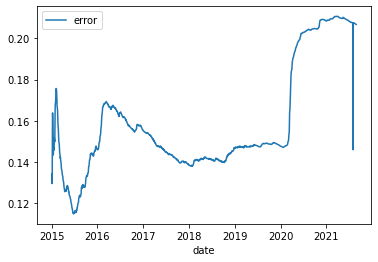

In [14]:
# Plotting MSE score
error = pd.DataFrame(error_list, columns=['date', 'error'])
error.set_index(['date'], inplace=True)
error.plot()

In [16]:
# Getting data for analysis
pyfolio_analyzer = results[0].analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfolio_analyzer.get_pf_items()

In [17]:
daily_tx = transactions.groupby(level=0)
longs = daily_tx.value.apply(lambda x: x.where(x>0).sum())
shorts = daily_tx.value.apply(lambda x: x.where(x<0).sum())

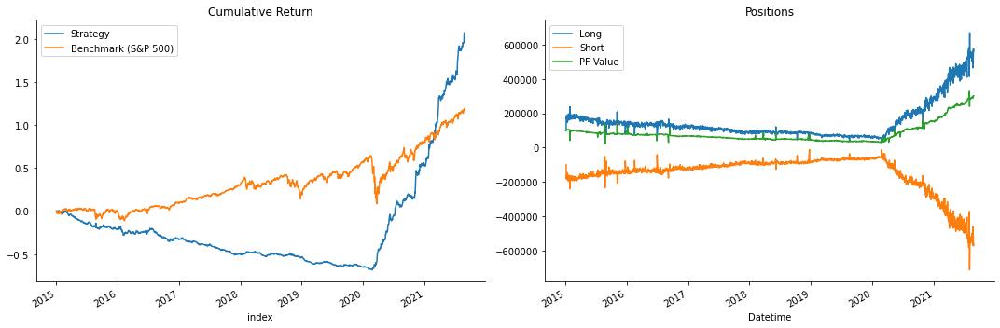

In [18]:
# Plotting returns vs S&P500
fig, axes = plt.subplots(ncols=2, figsize=(15, 5))

df = returns.to_frame('Strategy').join(benchmark.to_frame('Benchmark (S&P 500)'))
df.add(1).cumprod().sub(1).plot(ax=axes[0], title='Cumulative Return')

longs.plot(label='Long',ax=axes[1], title='Positions')
shorts.plot(ax=axes[1], label='Short')
positions.cash.plot(ax=axes[1], label='PF Value')
axes[1].legend()
sns.despine()
fig.tight_layout();

C:\Users\Ishan\anaconda3\lib\site-packages\pyfolio\utils.py:316: UserWarning: Detected intraday strategy; inferring positions from transactions. Set estimate_intraday=False to disable.
  warnings.warn(


Start date,2015-01-02
End date,2021-08-27
Total months,79
,Backtest
Annual return,18.345%
Cumulative returns,206.545%
Annual volatility,18.317%
Sharpe ratio,1.01
Calmar ratio,0.27
Stability,0.04
Max drawdown,-68.545%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,68.55,2015-02-25,2020-02-25,2020-07-10,1403
1,6.00,2020-07-21,2020-08-14,2020-08-26,27
2,5.28,2020-09-25,2020-10-21,2020-11-05,30
3,4.54,2015-01-15,2015-02-05,2015-02-25,30
4,3.98,2020-11-12,2020-11-20,2020-11-30,13


Stress Events,mean,min,max
Fall2015,0.01%,-6.00%,3.90%
New Normal,0.07%,-7.51%,12.95%


Top 10 long positions of all time,max
sid,
AMCR,61.68%
BBY,20.39%
HPQ,19.86%
NTAP,19.70%
SJM,19.62%
BBWI,19.53%
EXC,19.39%
KEYS,19.26%
HRL,19.24%


Top 10 short positions of all time,max
sid,
AMCR,-245.65%
NOV,-23.29%
UAA,-20.05%
TFC,-19.83%
XOM,-19.82%
JPM,-19.82%
FTNT,-19.81%
KR,-19.70%
RJF,-19.64%


Top 10 positions of all time,max
sid,
AMCR,245.65%
NOV,23.29%
BBY,20.39%
UAA,20.05%
HPQ,19.86%
TFC,19.83%
XOM,19.82%
JPM,19.82%
FTNT,19.81%


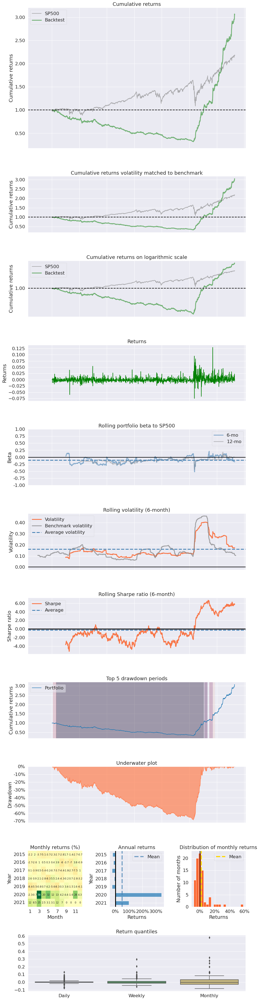

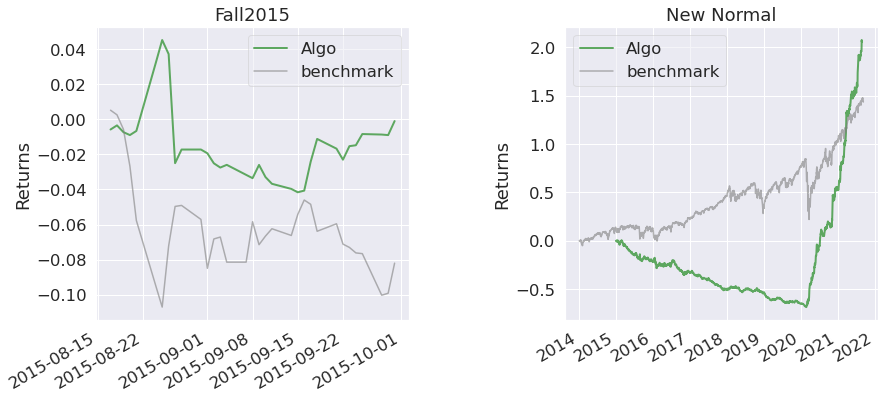

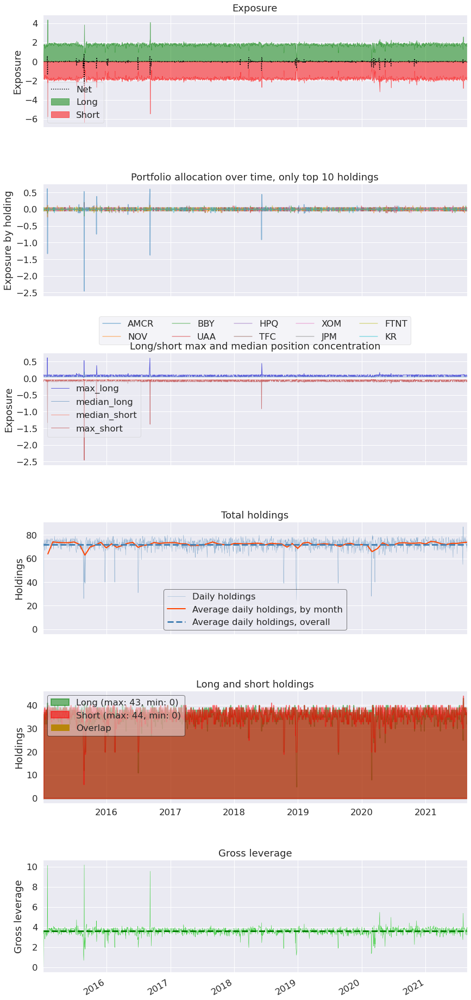

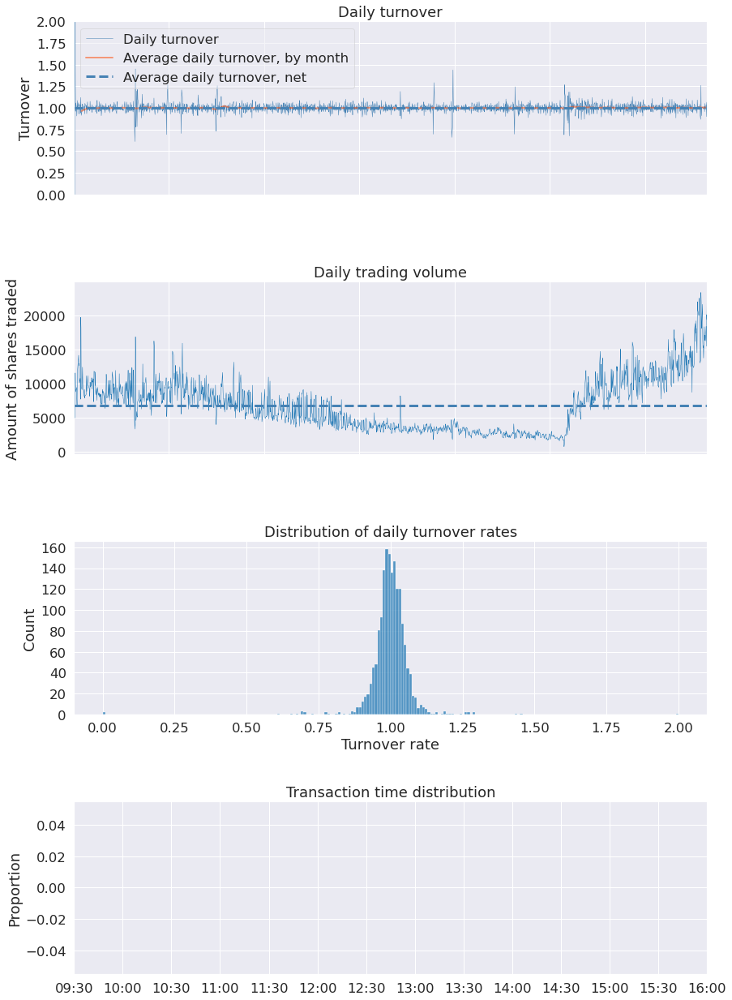

In [19]:
# Complete PyFolio evaluation
pf.create_full_tear_sheet(returns,
                          transactions=transactions,
                          positions=positions,
                          benchmark_rets=benchmark.dropna());